# Inorganic Material Generation using Deep Q-Networks
https://github.com/eltonpan/InorganicMaterialRL

Elton Pan

In [3]:
import numpy as np
import pickle
import torch
from torch import nn
import collections
from model import DQN_pytorch, DCN_pytorch
import time
from one_hot import featurize_target, onehot_target, element_set, comp_set, one_hot_to_element, element_to_one_hot, one_hot_to_comp, comp_to_one_hot, step_to_one_hot, one_hot_to_step
import seaborn as sns
import random
import matplotlib.pyplot as plt
import os
from env_constrained import generate_random_act, ConstrainedMaterialEnvironment, extract_data_from_ep
import collections
from sklearn.preprocessing import StandardScaler
from tqdm import tqdm 
from sklearn.manifold import TSNE
from numpy.linalg import svd
import imageio
from pymatgen.core import Composition
from constraints.charge_neutrality_check_fast import check_neutrality
from constraints.electronegativity_check_fast import check_electronegativity
from matminer.featurizers.base import MultipleFeaturizer
import matminer.featurizers.composition as cf
from sklearn.ensemble import RandomForestRegressor
import joblib
os.environ["CUDA_VISIBLE_DEVICES"]="1"

# Random policy
In env.py, we have generated some data using a random policy. Here, we visualize the distribution of final rewards, and then trained an agent using purely data generated by the random policy.

In [45]:
# Load Q_data_random
with open('./data/Q_data_random_RF_constrained.pkl', 'rb') as f:
    Q_c_data_random = pickle.load(f)

print('Number of episodes generated by random policy:',len(Q_c_data_random))

Number of episodes generated by random policy: 10000


In [46]:
def generate_dqn_dcn_inputs_and_targets_from_Q_c_data(Q_c_data):
    '''
    Generates inputs and targets for DQN training

    Args:
    Q_data: List of Q_datapoints for training
    
    Returns:
    s_material_inputs: torch.tensor of Size([num of episodes in Q_data, 145])
    s_step_inputs: torch.tensor
    a_elem_inputs: torch.tensor
    a_comp_inputs: torch.tensor
    Q_targets: torch.tensor
    en_targets: torch.tensor

    '''
    s_material_inputs = []
    s_step_inputs     = []
    a_elem_inputs     = []
    a_comp_inputs     = []
    Q_targets         = []
    en_targets         = []

    for episode in Q_c_data:
        for step in episode:
            # state, action, reward = step
            [s_material, s_step], [a_elem, a_comp], Q_target, en_target = step

            s_material = torch.tensor(s_material).float()
            s_step = torch.tensor(s_step)
            a_elem = torch.tensor(a_elem)
            a_comp = torch.tensor(a_comp)
            Q_target = torch.tensor([Q_target])
            en_target = torch.tensor([en_target])

            s_material_inputs.append(s_material)
            s_step_inputs.append(s_step)
            a_elem_inputs.append(a_elem)
            a_comp_inputs.append(a_comp)
            Q_targets.append(Q_target)
            en_targets.append(en_target)

    s_material_inputs = torch.stack(s_material_inputs)
    s_step_inputs = torch.stack(s_step_inputs)
    a_elem_inputs = torch.stack(a_elem_inputs)
    a_comp_inputs = torch.stack(a_comp_inputs)
    Q_targets = torch.stack(Q_targets)
    en_targets = torch.stack(en_targets)

    return s_material_inputs, s_step_inputs, a_elem_inputs, a_comp_inputs, Q_targets, en_targets

s_material_inputs, s_step_inputs, a_elem_inputs, a_comp_inputs, Q_targets, en_targets = generate_dqn_dcn_inputs_and_targets_from_Q_c_data(Q_c_data = Q_c_data_random)

print('s_material_inputs:', s_material_inputs.shape)
print('s_step_inputs:', s_step_inputs.shape)
print('a_elem_inputs:', a_elem_inputs.shape)
print('a_comp_inputs:', a_comp_inputs.shape)
print('Q_targets:', Q_targets.shape)
print('en_targets:', en_targets.shape)
print('')

s_material_inputs: torch.Size([50000, 145])
s_step_inputs: torch.Size([50000, 5])
a_elem_inputs: torch.Size([50000, 80])
a_comp_inputs: torch.Size([50000, 10])
Q_targets: torch.Size([50000, 1])
en_targets: torch.Size([50000, 1])



/home/synthesisproject/anaconda3/envs/dqn2/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


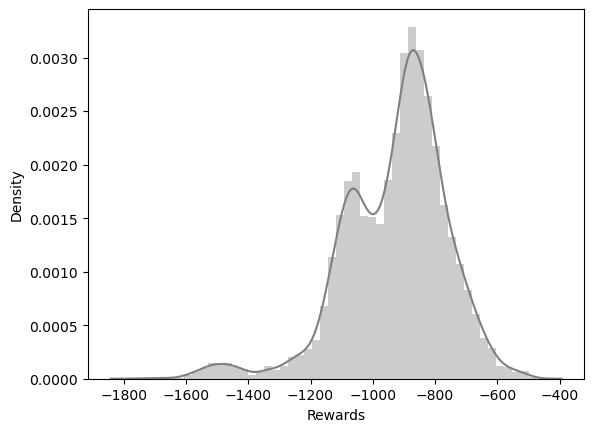

In [6]:
# Plot distribution of final rewards by random policy
final_rewards_random = Q_targets[0::5].reshape(-1) # find final rewards
sns.distplot(final_rewards_random, color= 'grey')
plt.xlabel('Rewards')
plt.show()

/home/synthesisproject/anaconda3/envs/dqn2/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


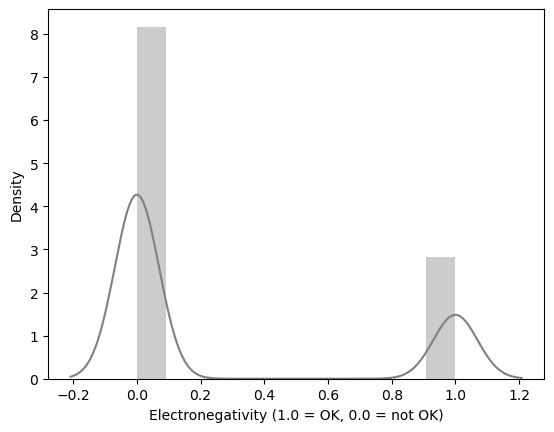

In [7]:
# Plot distribution of en by random policy
en_random = en_targets[0::5].reshape(-1) # find final rewards
sns.distplot(en_random, color= 'grey')
plt.xlabel('Electronegativity (1.0 = OK, 0.0 = not OK)')
plt.show()

In [47]:
# Standardizing s_material data
scaler = StandardScaler() # Fit scaler
print('before scaling:', s_material_inputs)
scaler.fit(s_material_inputs)
s_material_inputs_scaled = torch.tensor(scaler.transform(s_material_inputs)).float()
print('after scaling:', s_material_inputs_scaled)

before scaling: tensor([[4.0000e+00, 6.4952e-01, 5.9343e-01,  ..., 0.0000e+00, 3.8309e-01,
         2.4297e-02],
        [3.0000e+00, 7.4231e-01, 7.1808e-01,  ..., 0.0000e+00, 3.8309e-01,
         4.6373e-02],
        [2.0000e+00, 8.4984e-01, 8.3555e-01,  ..., 0.0000e+00, 1.5987e-03,
         2.2204e-04],
        ...,
        [1.0000e+00, 1.0000e+00, 1.0000e+00,  ..., 1.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00]])
after scaling: tensor([[ 1.6739,  0.1534,  0.0971,  ..., -0.5587,  1.2861,  0.0383],
        [ 0.9193,  0.4174,  0.4540,  ..., -0.5587,  1.2861,  0.6393],
        [ 0.1647,  0.7233,  0.7904,  ..., -0.5587, -0.6513, -0.6172],
        ...,
        [-0.5899,  1.1504,  1.2613,  ...,  1.7897, -0.6595, -0.6232],
        [-1.3445, -1.6941, -1.6021,  ..., -0.5587, -0.6595, -0.6232],
        [-

In [48]:
# Train-validation split
def train_validation_split(s_material_inputs_scaled, s_step_inputs, a_elem_inputs, a_comp_inputs, Q_targets, en_targets, valid_size = 0.2):
    '''
    Args:
    s_material_inputs_scaled
    s_step_inputs
    a_elem_inputs
    a_comp_inputs
    Q_targets
    en_targets
    valid_size: Float (0-1). Size of validation set

    Returns:
    s_material_inputs_train 
    s_step_inputs_train     
    a_elem_inputs_train     
    a_comp_inputs_train     
    Q_targets_train   
    en_targets_train   
    s_material_inputs_valid 
    s_step_inputs_valid 
    a_elem_inputs_valid
    a_comp_inputs_valid 
    Q_targets_valid
    en_targets_valid
  
    '''
    max_idx = s_material_inputs_scaled.shape[0] # Find size of dataset
    idx = [x for x in range(max_idx)] # Generate indices
    random.shuffle(idx) # Shuffle order idx 
    split = int(round(max_idx*(1-valid_size)))
    train_idx, valid_idx = idx[:split], idx[split:] # Split indices

    s_material_inputs_train = s_material_inputs_scaled[train_idx] # Use scaled s_material
    s_step_inputs_train     = s_step_inputs[train_idx]
    a_elem_inputs_train     = a_elem_inputs[train_idx]
    a_comp_inputs_train     = a_comp_inputs[train_idx]
    Q_targets_train         = Q_targets[train_idx]
    en_targets_train         = en_targets[train_idx]

    s_material_inputs_valid = s_material_inputs_scaled[valid_idx] # Use scaled s_material
    s_step_inputs_valid     = s_step_inputs[valid_idx]
    a_elem_inputs_valid     = a_elem_inputs[valid_idx]
    a_comp_inputs_valid     = a_comp_inputs[valid_idx]
    Q_targets_valid         = Q_targets[valid_idx]
    en_targets_valid         = en_targets[valid_idx]

    return s_material_inputs_train, s_step_inputs_train, a_elem_inputs_train, a_comp_inputs_train, Q_targets_train, en_targets_train,s_material_inputs_valid, s_step_inputs_valid, a_elem_inputs_valid, a_comp_inputs_valid, Q_targets_valid, en_targets_valid

s_material_inputs_train, s_step_inputs_train, a_elem_inputs_train, a_comp_inputs_train, Q_targets_train, en_targets_train, s_material_inputs_valid, s_step_inputs_valid, a_elem_inputs_valid, a_comp_inputs_valid, Q_targets_valid, en_targets_valid \
= train_validation_split(s_material_inputs_scaled = s_material_inputs_scaled, 
                                    s_step_inputs = s_step_inputs, 
                                    a_elem_inputs = a_elem_inputs,
                                    a_comp_inputs = a_comp_inputs,
                                    Q_targets  = Q_targets,
                                    en_targets = en_targets,
                                    valid_size = 0.2)

print('TRAIN SIZES:')
print('s_material_inputs_train:', s_material_inputs_train.shape)
print('s_step_inputs_train:', s_step_inputs_train.shape)
print('a_elem_inputs_train:', a_elem_inputs_train.shape)
print('a_comp_inputs_train:', a_comp_inputs_train.shape)
print('Q_targets_train:', Q_targets_train.shape)
print('en_targets_train:', en_targets_train.shape)
print('')
print('VALIDATION SIZES:')
print('s_material_inputs_valid:', s_material_inputs_valid.shape)
print('s_step_inputs_valid:', s_step_inputs_valid.shape)
print('a_elem_inputs_valid:', a_elem_inputs_valid.shape)
print('a_comp_inputs_valid:', a_comp_inputs_valid.shape)
print('Q_targets_valid:', Q_targets_valid.shape)
print('en_targets_valid:', en_targets_valid.shape)

TRAIN SIZES:
s_material_inputs_train: torch.Size([40000, 145])
s_step_inputs_train: torch.Size([40000, 5])
a_elem_inputs_train: torch.Size([40000, 80])
a_comp_inputs_train: torch.Size([40000, 10])
Q_targets_train: torch.Size([40000, 1])
en_targets_train: torch.Size([40000, 1])

VALIDATION SIZES:
s_material_inputs_valid: torch.Size([10000, 145])
s_step_inputs_valid: torch.Size([10000, 5])
a_elem_inputs_valid: torch.Size([10000, 80])
a_comp_inputs_valid: torch.Size([10000, 10])
Q_targets_valid: torch.Size([10000, 1])
en_targets_valid: torch.Size([10000, 1])


Here we train DQN using ONLY data generated by random policy.

# DQN

In [10]:
# Initialize Q network
dqn = DQN_pytorch()

def train_DQN(dqn, num_epoch, s_material_inputs_train, s_step_inputs_train, a_elem_inputs_train, a_comp_inputs_train, Q_targets_train ,s_material_inputs_valid ,s_step_inputs_valid ,a_elem_inputs_valid ,a_comp_inputs_valid ,Q_targets_valid):
    '''
    Trains DQN and prints: 1. training loss 2. validation loss

    Args:
    dqn: DQN
    num_epoch: Int. Number of training epochs 
    s_material_inputs_train
    s_step_inputs_train
    a_elem_inputs_train
    a_comp_inputs_train
    Q_targets_train
    s_material_inputs_valid
    s_step_inputs_valid
    a_elem_inputs_valid
    a_comp_inputs_valid
    Q_targets_valid

    Returns:
    Updated dqn
    train_loss_list
    valid_loss_list
    '''
    train_loss_list = []
    valid_loss_list = []

    # Train Q network
    optimizer = torch.optim.Adam(dqn.parameters(), lr=1e-2)
    loss_func = torch.nn.SmoothL1Loss().float()

    # start = time.time()

    for epoch in range(num_epoch):
        # Train loss
        prediction_train = dqn(s_material = s_material_inputs_train, # torch.Size([batch_size, 145]) and must be .float() !!!
                        s_step      = s_step_inputs_train,     # torch.Size([batch_size,5])
                        a_elem      = a_elem_inputs_train,     # torch.Size([batch_size,80])
                        a_comp      = a_comp_inputs_train,  # torch.Size([batch_size,10])
                        )                    # Input x and predict based on x
        train_loss       = loss_func(prediction_train.float(), Q_targets_train.float()).float()   # Must be (1. nn output, 2. target)
        optimizer.zero_grad()   # Clear gradients for next train
        train_loss.backward()         # Backpropagation, compute gradients
        optimizer.step()        # Apply gradients

        # Validation loss
        prediction_valid = dqn(s_material = s_material_inputs_valid, # torch.Size([batch_size, 145]) and must be .float() !!!
                        s_step      = s_step_inputs_valid,     # torch.Size([batch_size,5])
                        a_elem      = a_elem_inputs_valid,     # torch.Size([batch_size,80])
                        a_comp      = a_comp_inputs_valid,  # torch.Size([batch_size,10]))
                        )
        valid_loss = loss_func(prediction_valid.float(), Q_targets_valid.float()).float()   # Must be (1. nn output, 2. target)
        train_loss_list.append(train_loss.detach().numpy())
        valid_loss_list.append(valid_loss.detach().numpy())

        print('Epoch = ', epoch, 'Train_loss = %.4f' % train_loss.data.numpy(), 'Valid_loss = %.4f' % valid_loss.data.numpy())
    # end = time.time()
    # print('time taken for batch:', end - start)
    
    return dqn, train_loss_list, valid_loss_list
dqn, train_loss_list, valid_loss_list = train_DQN(dqn =  dqn, num_epoch = 100, s_material_inputs_train = s_material_inputs_train, s_step_inputs_train = s_step_inputs_train,
 a_elem_inputs_train = a_elem_inputs_train, a_comp_inputs_train = a_comp_inputs_train, Q_targets_train = Q_targets_train,
 s_material_inputs_valid = s_material_inputs_valid, s_step_inputs_valid = s_step_inputs_valid, a_elem_inputs_valid = a_elem_inputs_valid,
 a_comp_inputs_valid = a_comp_inputs_valid, Q_targets_valid = Q_targets_valid)

Epoch =  0 Train_loss = 759.7560 Valid_loss = 760.3611
Epoch =  1 Train_loss = 758.9414 Valid_loss = 758.9456
Epoch =  2 Train_loss = 757.5298 Valid_loss = 756.5146
Epoch =  3 Train_loss = 755.1055 Valid_loss = 752.7596
Epoch =  4 Train_loss = 751.3605 Valid_loss = 747.3447
Epoch =  5 Train_loss = 745.9603 Valid_loss = 739.9019
Epoch =  6 Train_loss = 738.5384 Valid_loss = 730.0248
Epoch =  7 Train_loss = 728.6890 Valid_loss = 717.2604
Epoch =  8 Train_loss = 715.9609 Valid_loss = 701.1152
Epoch =  9 Train_loss = 699.8621 Valid_loss = 681.0472
Epoch =  10 Train_loss = 679.8521 Valid_loss = 656.4617
Epoch =  11 Train_loss = 655.3379 Valid_loss = 626.7314
Epoch =  12 Train_loss = 625.6938 Valid_loss = 591.1616
Epoch =  13 Train_loss = 590.2272 Valid_loss = 549.0266
Epoch =  14 Train_loss = 548.2211 Valid_loss = 500.1364
Epoch =  15 Train_loss = 499.5125 Valid_loss = 448.7000
Epoch =  16 Train_loss = 448.5382 Valid_loss = 408.2561
Epoch =  17 Train_loss = 409.6924 Valid_loss = 376.1570
Ep

# DCN

In [49]:
# Initialize constraint network
dcn = DCN_pytorch()

def train_DCN(dcn, num_epoch, s_material_inputs_train, s_step_inputs_train, a_elem_inputs_train, a_comp_inputs_train, Q_targets_train, en_targets_train, s_material_inputs_valid ,s_step_inputs_valid ,a_elem_inputs_valid ,a_comp_inputs_valid , Q_targets_valid, en_targets_valid):
    '''
    Trains DCN and prints: 1. training loss 2. validation loss

    Args:
    dcn: DCN
    num_epoch: Int. Number of training epochs 
    s_material_inputs_train
    s_step_inputs_train
    a_elem_inputs_train
    a_comp_inputs_train
    Q_targets_train
    en_targets_train
    s_material_inputs_valid
    s_step_inputs_valid
    a_elem_inputs_valid
    a_comp_inputs_valid
    Q_targets_valid
    en_targets_valid

    Returns:
    Updated dcn
    train_loss_list
    valid_loss_list
    '''
    train_loss_list = []
    valid_loss_list = []

    # Train Q network
    optimizer = torch.optim.Adam(dcn.parameters(), lr=1e-2)
    # loss_func = torch.nn.SmoothL1Loss().float()
    loss_func = torch.nn.MSELoss().float() # Works better than L1Loss
    # loss_func = torch.nn.L1Loss().float() # Trained model gives pred close to 0

    # start = time.time()

    for epoch in range(num_epoch):
        # Train loss
        prediction_train = dcn(s_material = s_material_inputs_train, # torch.Size([batch_size, 145]) and must be .float() !!!
                        s_step      = s_step_inputs_train,     # torch.Size([batch_size,5])
                        a_elem      = a_elem_inputs_train,     # torch.Size([batch_size,80])
                        a_comp      = a_comp_inputs_train,  # torch.Size([batch_size,10])
                        )                    # Input x and predict based on x
        train_loss       = loss_func(prediction_train.float(), en_targets_train.float()).float()   # Must be (1. nn output, 2. target)
        optimizer.zero_grad()   # Clear gradients for next train
        train_loss.backward()         # Backpropagation, compute gradients
        optimizer.step()        # Apply gradients

        # Validation loss
        prediction_valid = dcn(s_material = s_material_inputs_valid, # torch.Size([batch_size, 145]) and must be .float() !!!
                        s_step      = s_step_inputs_valid,     # torch.Size([batch_size,5])
                        a_elem      = a_elem_inputs_valid,     # torch.Size([batch_size,80])
                        a_comp      = a_comp_inputs_valid,  # torch.Size([batch_size,10]))
                        )
        valid_loss = loss_func(prediction_valid.float(), en_targets_valid.float()).float()   # Must be (1. nn output, 2. target)
        train_loss_list.append(train_loss.detach().numpy())
        valid_loss_list.append(valid_loss.detach().numpy())

        print('Epoch = ', epoch, 'Train_loss = %.4f' % train_loss.data.numpy(), 'Valid_loss = %.4f' % valid_loss.data.numpy())
    # end = time.time()
    # print('time taken for batch:', end - start)
    
    return dcn, train_loss_list, valid_loss_list
dcn, train_loss_list, valid_loss_list = train_DCN(dcn =  dcn, num_epoch = 100, s_material_inputs_train = s_material_inputs_train, s_step_inputs_train = s_step_inputs_train,
 a_elem_inputs_train = a_elem_inputs_train, a_comp_inputs_train = a_comp_inputs_train, Q_targets_train = Q_targets_train, en_targets_train = en_targets_train,
 s_material_inputs_valid = s_material_inputs_valid, s_step_inputs_valid = s_step_inputs_valid, a_elem_inputs_valid = a_elem_inputs_valid,
 a_comp_inputs_valid = a_comp_inputs_valid, Q_targets_valid = Q_targets_valid, en_targets_valid = en_targets_valid)

Epoch =  0 Train_loss = 0.2623 Valid_loss = 0.1936
Epoch =  1 Train_loss = 0.1942 Valid_loss = 0.2070
Epoch =  2 Train_loss = 0.2080 Valid_loss = 0.1997
Epoch =  3 Train_loss = 0.2006 Valid_loss = 0.1876
Epoch =  4 Train_loss = 0.1884 Valid_loss = 0.1830
Epoch =  5 Train_loss = 0.1840 Valid_loss = 0.1832
Epoch =  6 Train_loss = 0.1846 Valid_loss = 0.1845
Epoch =  7 Train_loss = 0.1860 Valid_loss = 0.1834
Epoch =  8 Train_loss = 0.1850 Valid_loss = 0.1809
Epoch =  9 Train_loss = 0.1824 Valid_loss = 0.1795
Epoch =  10 Train_loss = 0.1808 Valid_loss = 0.1796
Epoch =  11 Train_loss = 0.1808 Valid_loss = 0.1794
Epoch =  12 Train_loss = 0.1804 Valid_loss = 0.1782
Epoch =  13 Train_loss = 0.1792 Valid_loss = 0.1766
Epoch =  14 Train_loss = 0.1775 Valid_loss = 0.1755
Epoch =  15 Train_loss = 0.1761 Valid_loss = 0.1752
Epoch =  16 Train_loss = 0.1757 Valid_loss = 0.1748
Epoch =  17 Train_loss = 0.1750 Valid_loss = 0.1735
Epoch =  18 Train_loss = 0.1736 Valid_loss = 0.1721
Epoch =  19 Train_loss

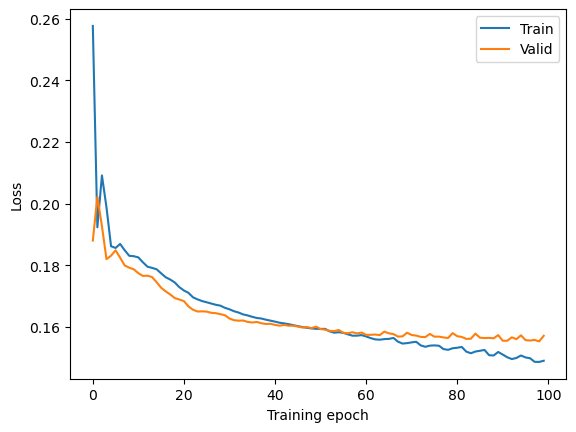

In [12]:
# Plot train and valid losses
plt.figure()
plt.plot(range(0,len(train_loss_list)), train_loss_list, label = 'Train')
plt.plot(range(0,len(valid_loss_list)), valid_loss_list, label = 'Valid')
plt.legend()
# plt.ylim(130,170)
plt.xlabel('Training epoch')
plt.ylabel('Loss')
# plt.savefig('plots/train_valid_loss.png', dpi = 300)
plt.show()

In [13]:
def ranked_max_actions(state, dqn, n_actions = len(element_set)*len(comp_set)):
    """
    Returns a list of ranked actions based on Q-network prodictions

    Args:
    state: List [s_material, s_step] where s_material is the string representation of material and s_step is the integer step number
    dqn: Q-network for Q-value prediction

    Returns:
    ranked_max_actions: List [[s_material, s_step, Q-value]
                              ...
                              [s_material, s_step, Q-value]
                              ]
    where s_material is the one-hot torch.tensor.float() of material and
    s_step is the  one-hot torch.tensor.float()
    0th index corresponds to highest Q-value
    """

    s_material, s_step = state
    # s_material = torch.tensor(onehot_target(s_material)).float() # Get one-hot rep of s_material
    s_material = torch.tensor(featurize_target(s_material)).reshape(1, -1) # Get one-hot rep of s_material
    s_material = torch.tensor(scaler.transform(s_material)).reshape(-1).float()  # Standardize s_material
    s_step = torch.tensor(step_to_one_hot([s_step])[0]).float() # Get one-hot rep of s_step

    s_material_input = torch.stack([s_material]*n_actions)
    s_step_input = torch.stack([s_step]*n_actions)

    a_elem_input = []
    a_comp_input = []
    for elem in element_set:
        a_elem = torch.tensor(element_to_one_hot([elem])[0]).float()
        for comp in comp_set:
            a_comp = torch.tensor(comp_to_one_hot([comp])[0]).float()

            a_elem_input.append(a_elem)
            a_comp_input.append(a_comp)
    
    a_elem_input = torch.stack(a_elem_input).float()
    a_comp_input = torch.stack(a_comp_input).float()
    
    Q_pred = dqn(s_material = s_material_input, # torch.Size([batch_size, 40, 115]) and must be .float() !!!
                    s_step      = s_step_input,     # torch.Size([batch_size,5])
                    a_elem      = a_elem_input,     # torch.Size([batch_size,80])
                    a_comp      = a_comp_input,  # torch.Size([batch_size,10])

                )   
    # Rank according to Q-values
    Q_pred = Q_pred.detach().numpy()
    Q_pred = Q_pred.reshape(len(element_set)*len(comp_set))
    order = Q_pred.argsort()
    ranks = order.argsort() # ranks of Q-values, 0th index = lowest Q, last index = highest Q
    
    
    a_elem_input_ranked = torch.zeros([len(element_set)*len(comp_set), len(element_set)])
    a_comp_input_ranked = torch.zeros([len(element_set)*len(comp_set), len(comp_set)])
    Q_pred_ranked = np.zeros(len(element_set)*len(comp_set))

    for rank in reversed(range(len(element_set)*len(comp_set))): # Start with most valuable
        rank_idx = ranks[rank] # rank_idx = final position
        rank_idx = (len(element_set)*len(comp_set) - 1) - rank_idx # Reverse rank_idx i.e. Want 0th index to correspond to max Q

        # Sort Q-values
        Q = Q_pred[rank]
        Q_pred_ranked[rank_idx] = Q

        # Sort a_elem according to Q-values
        a_elem = a_elem_input[rank]
        a_elem_input_ranked[rank_idx] = a_elem

        # Sort a_comp according to Q-values
        a_comp = a_comp_input[rank]
        a_comp_input_ranked[rank_idx] = a_comp

    # print('Max Q: ', max(Q_pred_ranked))
    # print('Min Q: ', min(Q_pred_ranked))

    return a_elem_input_ranked, a_comp_input_ranked, Q_pred_ranked

mat_1 = 'BaTiO3'
mat_2 = 'SrTiO3'

print('Material: {}'.format(mat_1))
a_elem_input_ranked, a_comp_input_ranked, Q_pred_ranked = ranked_max_actions([mat_1, 1], dqn = dqn)
print('Q value of max action: ', Q_pred_ranked[0])
# print('max_a_elem: ', tuple(a_elem_input_ranked[0].tolist()))
# print('max_a_comp: ', tuple(a_comp_input_ranked[0].tolist()))
# print('')
print('')

print('Material: {}'.format(mat_2))
a_elem_input_ranked, a_comp_input_ranked, Q_pred_ranked = ranked_max_actions([mat_2, 1], dqn = dqn)
print('Q value of max action: ', Q_pred_ranked[0])
# print('max_a_elem: ', tuple(a_elem_input_ranked[0].tolist()))
# print('max_a_comp: ', tuple(a_comp_input_ranked[0].tolist()))

Material: BaTiO3
Q value of max action:  -682.1455688476562

Material: SrTiO3
Q value of max action:  -653.72900390625


In [14]:
# Investigate weights of dqn
# dqn.fc1.weight.mean(), dqn.fc2.weight.mean(), dqn.fc3.weight.mean(), dqn.fc4.weight.mean(),
dcn.fc1.weight.mean(), dcn.fc2.weight.mean(), dcn.fc3.weight.mean(), dcn.fc4.weight.mean(),

(tensor(-0.0074, grad_fn=<MeanBackward0>),
 tensor(-0.0206, grad_fn=<MeanBackward0>),
 tensor(-0.0123, grad_fn=<MeanBackward0>),
 tensor(-0.0421, grad_fn=<MeanBackward0>))

In [15]:
# For testing the DCN function
# s_material = torch.tensor(onehot_target('BaTiO3'))
s_material = torch.tensor(scaler.transform(torch.tensor(featurize_target('BaTiO3')).reshape(1,-1))).float()
# s_material = s_material.reshape(1, s_material.shape[0])
# print(s_material.shape)

s_step = torch.zeros(5)
s_step[3] = 1.
s_step = s_step.reshape(1, s_step.shape[0])
# print(s_step.shape)

a_elem = torch.zeros(80)
a_elem[2] = 1.
a_elem = a_elem.reshape(1, a_elem.shape[0])
# print(a_elem.shape)

a_comp = torch.zeros(10)
a_comp[1] = 1.
a_comp = a_comp.reshape(1, a_comp.shape[0])
# print(a_comp.shape)

output = dcn(s_material, s_step, a_elem, a_comp)

print(output)
# print(output.shape)

tensor([[0.9232]], grad_fn=<SigmoidBackward>)


In [28]:
env = ConstrainedMaterialEnvironment(element_set = element_set,
                          comp_set =  comp_set,)

def generate_max_act(state, dqn, stochastic_top_frac = 0):
    '''
    Generates max action.
    Args:
    state: state
    dqn: Q-network
    stochastic_top_frac: Int (0-1). action choosen from the top n fraction of ranked actions. Default = 0. 
                         e.g. stochastic_top_frac = 0.1 corresponds to choosing from top 10% of action

    Returns: max_a_elem, max_a_comp
    '''
    a_elem_input_ranked, a_comp_input_ranked, _ = ranked_max_actions(state = state, dqn = dqn, n_actions = len(element_set)*len(comp_set))
    
    tot_num_actions = len(a_elem_input_ranked)
    if stochastic_top_frac != 0: # if stochastic
        act_idx = stochastic_top_frac*tot_num_actions # cut-off index
        rank = np.random.randint(0,round(act_idx)) # take top stochastic_top_frac fraction of ranked actions
    else: # deterministic
        rank = 0 # take top action (index 0)
    max_a_elem = a_elem_input_ranked[rank] # 0th index corresponds to max
    max_a_comp = a_comp_input_ranked[rank] # 0th index corresponds to max
    max_a_elem = tuple(max_a_elem.tolist())
    max_a_comp = tuple(max_a_comp.tolist())
    action = [max_a_elem, max_a_comp]

    return action

def generate_constrained_max_act(state, dqn, dcn, en_threshold, stochastic_top_frac = 0):
    '''
    Generates max action.
    Args:
    state: state
    dqn: Q-network
    en_threshold: Float (0.0 - 1.0). Determines how tight the constraint is. 1.0 being the tightest. 
    stochastic_top_frac: Int (0-1). action choosen from the top n fraction of ranked actions. Default = 0. 
                         e.g. stochastic_top_frac = 0.1 corresponds to choosing from top 10% of action

    Returns: max_a_elem, max_a_comp
    '''
    a_elem_input_ranked, a_comp_input_ranked, _ = ranked_max_actions(state = state, dqn = dqn, n_actions = len(element_set)*len(comp_set))
    
    tot_num_actions = len(a_elem_input_ranked)
    en = 0

    count = 0
    while en <= en_threshold: # Keep iterating until predicted en goes above 0.5
        if stochastic_top_frac != 0: # if stochastic
            act_idx = stochastic_top_frac*tot_num_actions # cut-off index
            rank = np.random.randint(0,round(act_idx)) # take top stochastic_top_frac fraction of ranked actions
        else: # deterministic
            rank = 0 # take top action (index 0)
        max_a_elem = a_elem_input_ranked[rank] # 0th index corresponds to max
        max_a_comp = a_comp_input_ranked[rank] # 0th index corresponds to max

        # print('state:', state)
        s_material, s_step = state # need to featurize/encode s_material and s_step
        # s_material = torch.tensor(onehot_target(s_material)).float() # Get one-hot rep of s_material
        s_material = torch.tensor(featurize_target(s_material)).reshape(1, -1) # Get one-hot rep of s_material
        s_material_inputs = torch.tensor(scaler.transform(s_material)).float()  # Standardize s_material
        s_step_inputs = torch.tensor(step_to_one_hot([s_step])[0]).reshape(1, -1).float() # Get one-hot rep of s_step
        max_a_elem = max_a_elem.reshape(1, -1)
        max_a_comp = max_a_comp.reshape(1, -1)
        # print('state:', state)
        # print('s_material_inputs:', s_material_inputs)
        # print('s_step_inputs:', s_step_inputs)
        # print('max_a_elem:', max_a_elem)
        # print('max_a_comp:', max_a_comp)
        en = dcn(s_material = s_material_inputs, # torch.Size([batch_size, 145]) and must be .float() !!!
                        s_step      = s_step_inputs,     # torch.Size([batch_size,5])
                        a_elem      = max_a_elem,     # torch.Size([batch_size,80])
                        a_comp      = max_a_comp,  # torch.Size([batch_size,10])
                        )  # Update en with prediction using DCN
        # print('en pred:', en[0])
        count += 1
        if count >= 100: # Tried more than 100 times
            print('Could not satisfy en constraint after %.0f actions' % count)
            break
    max_a_elem = max_a_elem[0]
    max_a_comp = max_a_comp[0]
    max_a_elem = tuple(max_a_elem.tolist())
    max_a_comp = tuple(max_a_comp.tolist())
    action = [max_a_elem, max_a_comp]

    return action

def generate_ep_with_dqn_dcn(dqn, dcn, en_threshold, max_steps = 5, epsilon = 0, stochastic_top_frac = 0):
    '''
    Generates an episode with trained DQN
    
    Args:
    dqn: Q-network for Q-value prediction
    dcn: Constraint-network for constraint value prediction
    en_threshold: Float (0.0 - 1.0). Determines how tight the constraint is. 1.0 being the tightest.
    max_steps: Int
    epsilon: Float. Probability of taking random action 
    stochastic_top_frac: Int (0-1). action choosen from the top n fraction of ranked actions. Default = 0. 
                         e.g. stochastic_top_frac = 0.1 corresponds to choosing from top 10% of action

    Returns: 
    env.path (an episode): List of SAR data in the form of [[material, step], [element, composition], reward]
    final_compound: Str.
    
    '''
    env.initialize()

    for i in range(max_steps):
        # if i == 0: # if start of episode, choose random first element #########################
        #     action = generate_random_act()

        # else: # elif not start of episode, take greedy action
        #     # Max action
        #     action = generate_max_act(state = [env.state, env.counter+1], dqn = dqn)
        if np.random.uniform(0,1) > epsilon:
            # action = generate_max_act(state = [env.state, env.counter+1], dqn = dqn, stochastic_top_frac = stochastic_top_frac)
            action = generate_constrained_max_act(state = [env.state, env.counter+1], dqn = dqn, dcn = dcn, en_threshold = en_threshold, stochastic_top_frac = stochastic_top_frac)
        else:
            action = generate_random_act()
        # Take step with action
        env.step(action)
        final_compound = env.state
        # print('step:', env.counter)
        # print('state:',final_compound)
        # print('reward:',env.reward())
        # print(env.num_steps_taken)
        # print('')
    return env.path, final_compound
# ep, final_compound = generate_ep_with_dqn_dcn(dqn = dqn, dcn = dcn, stochastic_top_frac = 0.2)

# compounds = []
# for i in range(100):
#     _, final_compound = generate_ep_with_dqn_dcn(dqn = dqn, dcn = dcn, en_threshold = 0.4, stochastic_top_frac = 0.20)
#     if check_electronegativity(final_compound):
#         compounds.append(final_compound)

# # print(final_compound)
# # print(check_electronegativity(final_compound))
# len(compounds)

In [17]:
# ========= FOR TRAINED POLICY ===========
def generate_Q_c_datapoints_and_evaluate_policy(dqn, dcn, num_eps, epsilon, en_threshold = 0.4, stochastic_top_frac = 0.20):
    '''
    Generates 1) Q datapoints for training 2) List of final rewards using a DQN.

    Args:
    dqn: Q-netowrk
    num_eps: Int. Number of episodes to run.
    epsilon: Float. Probability of taking a random action
    en_threshold: Float (0.0 - 1.0). Determines how tight the constraint is. 1.0 being the tightest. Default 0.4
    stochastic_top_frac: Int (0-1). action choosen from the top n fraction of ranked actions. Default = 0. 
                         e.g. stochastic_top_frac = 0.1 corresponds to choosing from top 10% of action

    Returns:
    Q_c_data_trained: List of Q datapoints for training
    en_targets_trained: List of en datapoints for training
    final_rewards_trained: List of corresponding final rewards
    final_compounds: List (of Str) of final compounds
    '''
    # start = time.time()

    # Generate episodes with DQN
    episodes = []
    final_compounds = []
    for j in range(num_eps):
        episode, final_compound = generate_ep_with_dqn_dcn(dqn = dqn, dcn = dcn, epsilon = epsilon, en_threshold = en_threshold, stochastic_top_frac = stochastic_top_frac)
        episodes.append(episode)
        final_compounds.append(final_compound)

    Q_c_data_trained = []
    # Extract Q_data from episodes
    for episode in episodes:
        Q_c_data = extract_data_from_ep(episode)
        Q_c_data_trained.append(Q_c_data)

    # end = time.time()
    # print('time taken:', end - start)

    # Save Q_data
    # with open('./data/Q_data_trained_RF.pkl', 'wb') as f:
    #     pickle.dump(Q_data_trained, f, pickle.HIGHEST_PROTOCOL)

    # # Load Q_data_random
    # with open('./data/Q_data_trained_RF.pkl', 'rb') as f:
    #     Q_data_trained = pickle.load(f)

    # print('Number of episodes generated by agent trained on random policy data:', len(Q_data_trained))

    # Extract final rewards from episode data
    Q_targets_trained         = []
    en_targets_trained         = []

    for episode in Q_c_data_trained:
        for step in episode:
            # state, action, reward = step
            _, _, Q_target, en_target = step
            Q_target = torch.tensor([Q_target])
            Q_targets_trained.append(Q_target)
            en_target = torch.tensor([en_target])
            en_targets_trained.append(en_target)

    Q_targets_trained = torch.stack(Q_targets_trained)
    en_targets_trained = torch.stack(en_targets_trained)
    # print('Q_targets:', Q_targets_trained.shape)
    final_rewards_trained = Q_targets_trained[0::5].reshape(-1) # Find final rewards, index of 5 since length of each episode is 5
    final_en_trained = en_targets_trained[0::5].reshape(-1)

    return Q_c_data_trained, en_targets_trained, final_rewards_trained, final_compounds

# Q_c_data_trained, en_targets_trained, final_rewards_trained, final_compounds = \
# generate_Q_c_datapoints_and_evaluate_policy(dqn = dqn, dcn = dcn, num_eps = 20, epsilon = 0, en_threshold = 0.4, stochastic_top_frac = 0.20)
# print(len(Q_c_data_trained))
# print(len(en_targets_trained))
# print(len(final_rewards_trained))
# print(final_compounds)

In [257]:
count = 0
for target in en_targets_trained:
    if target[0] == 1.:
        count += 1
print(count)

35


As shown in the plot below, an agent trained based on just data generated by a random policy can improve the distribution of rewards.

/home/synthesisproject/anaconda3/envs/dqn2/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/synthesisproject/anaconda3/envs/dqn2/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


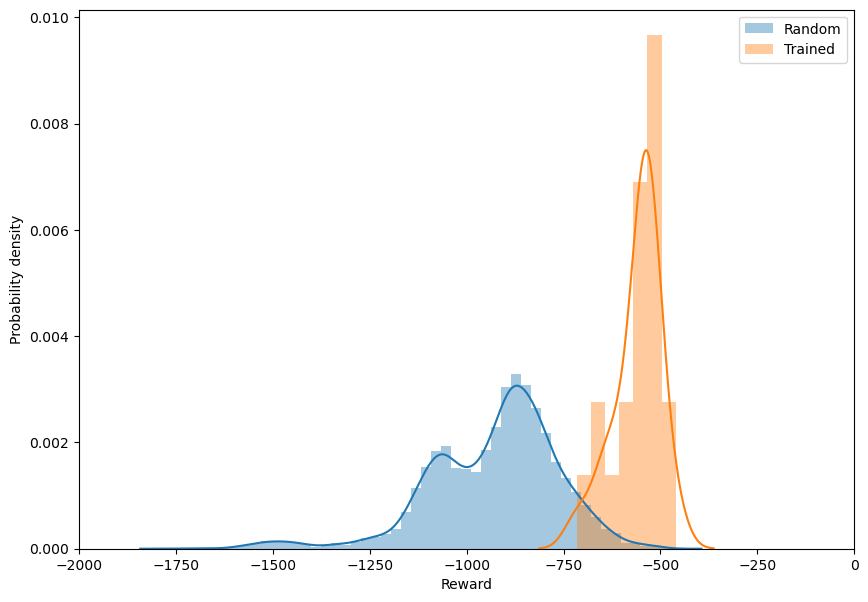

In [203]:
# Plot distribution of final rewards by random vs trained policy
plt.figure(figsize=(10,7))
sns.distplot(final_rewards_random, hist = True, norm_hist = True, label = 'Random')
sns.distplot(final_rewards_trained, hist = True, norm_hist = True, label = 'Trained')
plt.ylabel('Probability density')
plt.xlabel('Reward')
# plt.ylim(0,0.0025)
plt.xlim(-2000,0)
plt.legend()
# plt.savefig(fname = 'plots/reward_dist.png', dpi = 300)
plt.show()

/home/synthesisproject/anaconda3/envs/dqn2/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


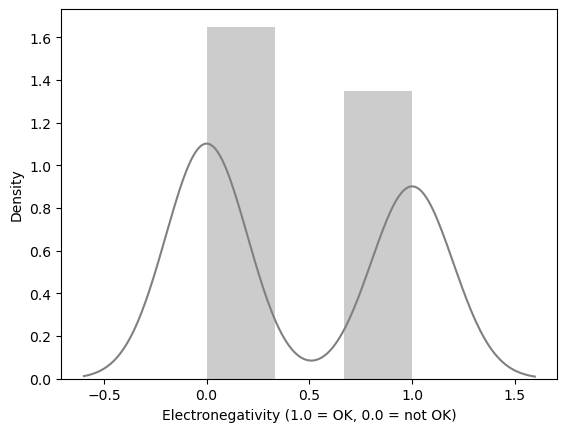

In [204]:
# Plot distribution of en by random policy
sns.distplot(en_targets_trained, color= 'grey')
plt.xlabel('Electronegativity (1.0 = OK, 0.0 = not OK)')
plt.show()

# Deep Reinforcement Learning
We now close the RL loop by training the agent on data generated by increasingly greedy policies. 

In [18]:
replay_buffer = collections.deque(maxlen = 50000)
Q_c_data_trained, en_targets_trained, final_rewards_trained, final_compounds = generate_Q_c_datapoints_and_evaluate_policy(dqn = dqn, 
                                                                                                                           dcn = dcn,
                                                                                                    num_eps = 100, 
                                                                                                    epsilon = 0, 
                                                                                                    en_threshold = 0.4,
                                                                                                    stochastic_top_frac = 0.2)
s_material_inputs, s_step_inputs, a_elem_inputs, a_comp_inputs, Q_targets, en_targets = generate_dqn_dcn_inputs_and_targets_from_Q_c_data(Q_c_data = Q_c_data_trained)

def update_replay_buffer(replay_buffer, s_material_inputs, s_step_inputs, a_elem_inputs, a_comp_inputs, Q_targets, en_targets):
    '''
    Adds inputs into replay buffer
    Args:
    replay_buffer: collections.deque
    
    Returns: 
    updated replay buffer
    
    '''
    for s_material, s_step, a_elem, a_comp, Q_target, en_target in zip(s_material_inputs, s_step_inputs, a_elem_inputs, a_comp_inputs, Q_targets, en_targets):
        Q_c_datapoint = [s_material, s_step, a_elem, a_comp, Q_target, en_target]
        replay_buffer.extend([Q_c_datapoint])
    
    return replay_buffer

replay_buffer = update_replay_buffer(replay_buffer = replay_buffer, s_material_inputs = s_material_inputs, 
                                                            s_step_inputs = s_step_inputs, 
                                                            a_elem_inputs = a_elem_inputs, 
                                                            a_comp_inputs = a_comp_inputs, 
                                                                Q_targets = Q_targets,
                                                                en_targets = en_targets)
print('Number of Q datapoints in replay buffer (5 per episode):', len(replay_buffer))

Number of Q datapoints in replay buffer (5 per episode): 500


In [19]:
def sample_replay_buffer(replay_buffer, n = 100):
    '''
    Samples datapoints from replay buffer for DQN training

    Args:
    replay_buffer: collections.deque
    n: Int. Number of datapoints to sample

    Returns:
    s_material_inputs: torch.tensor of Size([num of episodes in Q_data, 145])
    s_step_inputs: torch.tensor
    a_elem_inputs: torch.tensor
    a_comp_inputs: torch.tensor
    Q_targets: torch.tensor
    em_targets: torch.tensor

    '''

    s_material_inputs = []
    s_step_inputs     = []
    a_elem_inputs     = []
    a_comp_inputs     = []
    Q_targets         = []
    en_targets         = []

    for Q_c_datapoint in random.sample(replay_buffer, n):
        s_material, s_step, a_elem, a_comp, Q_target, en_target = Q_c_datapoint

        s_material = torch.tensor(s_material).float()
        s_step = torch.tensor(s_step)
        a_elem = torch.tensor(a_elem)
        a_comp = torch.tensor(a_comp)
        Q_target = torch.tensor([Q_target])
        en_target = torch.tensor([en_target])

        s_material_inputs.append(s_material)
        s_step_inputs.append(s_step)
        a_elem_inputs.append(a_elem)
        a_comp_inputs.append(a_comp)
        Q_targets.append(Q_target)
        en_targets.append(en_target)

    s_material_inputs = torch.stack(s_material_inputs)
    s_step_inputs = torch.stack(s_step_inputs)
    a_elem_inputs = torch.stack(a_elem_inputs)
    a_comp_inputs = torch.stack(a_comp_inputs)
    Q_targets = torch.stack(Q_targets)
    en_targets = torch.stack(en_targets)

    return s_material_inputs, s_step_inputs, a_elem_inputs, a_comp_inputs, Q_targets, en_targets

s_material_inputs, s_step_inputs, a_elem_inputs, a_comp_inputs, Q_targets, en_targets = sample_replay_buffer(replay_buffer = replay_buffer, n = 100)

print('s_material_inputs:', s_material_inputs.shape)
print('s_step_inputs:', s_step_inputs.shape)
print('a_elem_inputs:', a_elem_inputs.shape)
print('a_comp_inputs:', a_comp_inputs.shape)
print('Q_targets:', Q_targets.shape)
print('en_targets:', en_targets.shape)
    

s_material_inputs: torch.Size([100, 145])
s_step_inputs: torch.Size([100, 5])
a_elem_inputs: torch.Size([100, 80])
a_comp_inputs: torch.Size([100, 10])
Q_targets: torch.Size([100, 1])
en_targets: torch.Size([100, 1])


<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

### Training the DQN

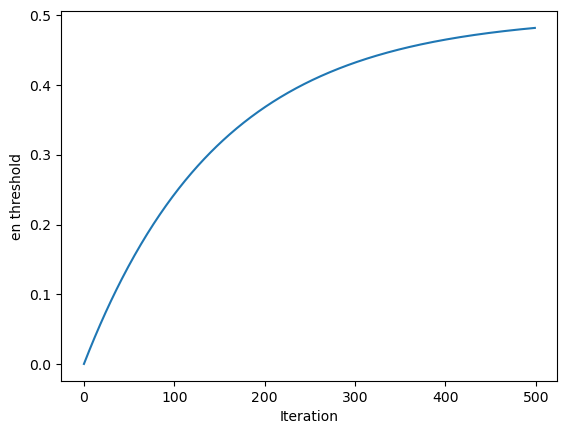

In [20]:
num_iter = 500
en_threshold_ub = 0.5 # upper bound for en_threshold
iteration = np.arange(num_iter)
en_threshold_vs_iter = -en_threshold_ub*(np.e**(-iteration/(num_iter*0.3))) + en_threshold_ub
# for iteration in range(num_iter):
plt.figure()
plt.plot(iteration, en_threshold_vs_iter)
plt.xlabel('Iteration')
plt.ylabel('en threshold')
plt.show()

In [21]:
num_iter = 500 # No. of training iterations
epsilon  = 0.99   # Initial epsilon

en_threshold_ub = 0.5 # upper bound for en_threshold
iteration = np.arange(num_iter)
en_threshold_vs_iter = -en_threshold_ub*(np.e**(-iteration/(num_iter*0.3))) + en_threshold_ub

replay_buffer = collections.deque(maxlen = 50000) # Initialize replay buffer
dqn_save_freq = 10 # Save DQN model every n iterations
dqn = DQN_pytorch() # Initialize DQN
dcn = DCN_pytorch() # Initialize DCN
env = ConstrainedMaterialEnvironment(element_set = element_set, comp_set = comp_set,) # Initialize env

# Meta-data to store
final_rewards_vs_iter   = []
en_vs_iter              = []
compounds_vs_iter       = []
train_loss_list_vs_iter = []
valid_loss_list_vs_iter = []
epsilon_vs_iter         = []

for iteration in tqdm(range(num_iter)):
    print('=========== TRAINING ITERATION %.0f ===========' % iteration)
    en_threshold = en_threshold_vs_iter[iteration]
    print('Current epsilon = ', epsilon)
    print('Current en threshold = ', en_threshold)
    epsilon_vs_iter.append(epsilon)
    # 1. GENERATE Q DATAPOINTS & ADD TO REPLAY BUFFER
    print('A) GENERATING DATAPOINTS')
    Q_c_data_trained, en_targets_trained, final_rewards_trained, final_compounds = \
        generate_Q_c_datapoints_and_evaluate_policy(dqn = dqn, dcn = dcn, num_eps = 100, epsilon = epsilon, en_threshold = en_threshold,
                                                                                                    stochastic_top_frac = 0.2) # Generate episodes and score them
    final_rewards_vs_iter.append(final_rewards_trained) # Save list of final reward
    en_vs_iter.append(en_targets_trained)
    compounds_vs_iter.append(final_compounds) # Save list of compounds generated at the end of each episode
    print('Average final reward = ', np.mean(np.array(final_rewards_trained)))
    print('Compounds generated:', final_compounds)
    s_material_inputs, s_step_inputs, a_elem_inputs, a_comp_inputs, Q_targets, en_targets = generate_dqn_dcn_inputs_and_targets_from_Q_c_data(Q_c_data = Q_c_data_trained) # Processing to give inputs and targets for DQN
    replay_buffer = update_replay_buffer(replay_buffer = replay_buffer, s_material_inputs = s_material_inputs, 
                                                                s_step_inputs = s_step_inputs, 
                                                                a_elem_inputs = a_elem_inputs, 
                                                                a_comp_inputs = a_comp_inputs, 
                                                                    Q_targets = Q_targets,
                                                                    en_targets = en_targets)
    # 2. SAMPLE FROM REPLAY BUFFER, STANDARDIZE, TRAIN-VALIDATION SPLIT, TRAIN Q-NETWORK
    print('B) TRAINING Q-NETWORK and C-NETWORK')
    s_material_inputs, s_step_inputs, a_elem_inputs, a_comp_inputs, Q_targets, en_targets = sample_replay_buffer(replay_buffer = replay_buffer, n = 100)
    s_material_inputs_scaled = torch.tensor(scaler.transform(s_material_inputs)).float() # Standardize s_material_inputs
    s_material_inputs_train, s_step_inputs_train, a_elem_inputs_train, a_comp_inputs_train, Q_targets_train, en_targets_train, s_material_inputs_valid, s_step_inputs_valid, a_elem_inputs_valid, a_comp_inputs_valid, Q_targets_valid, en_targets_valid \
    = train_validation_split(s_material_inputs_scaled = s_material_inputs_scaled, 
                                        s_step_inputs = s_step_inputs, 
                                        a_elem_inputs = a_elem_inputs,
                                        a_comp_inputs = a_comp_inputs,
                                        Q_targets = Q_targets,
                                        en_targets = en_targets,
                                        valid_size = 0.2) # Train-validation split of datapoints sampled from replay buffer
    dqn, train_loss_list, valid_loss_list = train_DQN(dqn =  dqn, num_epoch = 100, s_material_inputs_train = s_material_inputs_train, s_step_inputs_train = s_step_inputs_train,
    a_elem_inputs_train = a_elem_inputs_train, a_comp_inputs_train = a_comp_inputs_train, Q_targets_train = Q_targets_train,
    s_material_inputs_valid = s_material_inputs_valid, s_step_inputs_valid = s_step_inputs_valid, a_elem_inputs_valid = a_elem_inputs_valid,
    a_comp_inputs_valid = a_comp_inputs_valid, Q_targets_valid = Q_targets_valid) # Train DQN
    
    dcn, train_loss_list, valid_loss_list = train_DCN(dcn =  dcn, num_epoch = 100, s_material_inputs_train = s_material_inputs_train, s_step_inputs_train = s_step_inputs_train,
    a_elem_inputs_train = a_elem_inputs_train, a_comp_inputs_train = a_comp_inputs_train, Q_targets_train = Q_targets_train, en_targets_train = en_targets_train,
    s_material_inputs_valid = s_material_inputs_valid, s_step_inputs_valid = s_step_inputs_valid, a_elem_inputs_valid = a_elem_inputs_valid,
    a_comp_inputs_valid = a_comp_inputs_valid, Q_targets_valid = Q_targets_valid, en_targets_valid = en_targets_valid)
    train_loss_list_vs_iter.append(train_loss_list) # Save list of training loss vs training epoch for this iter
    valid_loss_list_vs_iter.append(valid_loss_list) # Save list of validation loss vs training epoch for this iter

    if iteration in range(0, num_iter+1, dqn_save_freq): # Save DQN model every n iterations
        torch.save(dqn, './dqn_models/dqn_test_%.0fiter_RF_constrained' % iteration)

    if iteration in range(0, num_iter+1, dqn_save_freq): # Save DQN model every n iterations
        torch.save(dcn, './dcn_models/dcn_test_%.0fiter_RF_constrained' % iteration)

    epsilon *= 0.99 # Decay epsilon

with open('./training_data/final_rewards_vs_iter_RF_constrained.pkl', 'wb') as f:
        pickle.dump(final_rewards_vs_iter, f, pickle.HIGHEST_PROTOCOL)

with open('./training_data/en_vs_iter_RF_constrained.pkl', 'wb') as f:
        pickle.dump(en_vs_iter, f, pickle.HIGHEST_PROTOCOL)

with open('./training_data/compounds_vs_iter_RF_constrained.pkl', 'wb') as f:
        pickle.dump(compounds_vs_iter, f, pickle.HIGHEST_PROTOCOL)

with open('./training_data/train_loss_list_vs_iter_RF_constrained.pkl', 'wb') as f:
        pickle.dump(train_loss_list_vs_iter, f, pickle.HIGHEST_PROTOCOL)

with open('./training_data/valid_loss_list_vs_iter_RF_constrained.pkl', 'wb') as f:
        pickle.dump(valid_loss_list_vs_iter, f, pickle.HIGHEST_PROTOCOL)

with open('./training_data/epsilon_vs_iter_RF_constrained.pkl', 'wb') as f:
        pickle.dump(epsilon_vs_iter, f, pickle.HIGHEST_PROTOCOL)

  0%|          | 0/500 [00:00<?, ?it/s]

=========== TRAINING ITERATION 0 ===========
Current epsilon =  0.99
Current en threshold =  0.0
A) GENERATING DATAPOINTS
Average final reward =  -899.47406
Compounds generated: ['Ge2Am5Ir2Sm2W4', 'Bi3Ho3Ir9Be3V7', 'Rh5Pd4Sm3', 'Sr1Co1Sr2Ga6C5', 'Ta1Li5Ni2Al6', 'Ho2Hf1Rh5Lu8B3', 'C7Cs7Al5Ag8', 'Al5Lu7Rh8Ti3K5', 'Pu9Ca5C7Ba7Cd6', 'Ce8Am1Mo3Ho2Dy1', 'Ru6Se2Ru2', 'Li9Tb2Y4La7Ce9', 'Cu1Hf2Ir9Mo3Pd6', 'Yb5I9Pu7Er6Cr7', 'Pu5Hg5Sr6Gd9', 'Ni8Gd5Cs8Tm3Se8', 'K1Be5Nd4Zr2Pu4', 'In9Sm5Hf7As9Nb4', 'F6Mo7F8Nd8', 'Mo5Ba5N7V4Hf4', 'Zn7I3Cu2', 'Ca8I5Ba9Cu3', 'Nb3Am3Li6Hg5Mg3', 'Cs2Er1Th7Pu2Se9', 'Ga7Pu1Ga6As1', 'Sm4Mo4Th8Te8Ba5', 'Bi9K1S2', 'K8Lu1Ge1Tm1', 'Sr8Ag5Am9Ce4Cs7', 'Ag6Ta3Lu9Hf1V3', 'Mo5W3Be5Tm2', 'Cs7Zr8Gd9Co5Mn2', 'Os8Rh3Pt1Se9Cr9', 'Ba6I5Am7Os6Pb8', 'B6Tl5Pr1Au6Sm7', 'Al8Pr8Pb8Y2Zr8', 'Mg8In1Cs3Zr3', 'S6Sr2Nb4', 'Sb1Mo4Ce6Au9', 'Er7P5Dy1Li9Sm6', 'U2Sb3Ta2Sc2Si3', 'Sn7Nb2Be8F7F2', 'Ca7S9Hf8Cs2Ce6', 'Sn5Cs3Th1Gd9', 'Nb6Ti3Si8K7', 'Ti7Ho5Ag3Ag4', 'Li7Y8Te5Ni1I2', 'Mo2Ga5Na5F4Pb8', 'Fe2Sb8Gd2Pu

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  51 Train_loss = 95.1954 Valid_loss = 98.2862
Epoch =  52 Train_loss = 90.6666 Valid_loss = 95.6313
Epoch =  53 Train_loss = 84.7378 Valid_loss = 96.3561
Epoch =  54 Train_loss = 80.2535 Valid_loss = 97.2635
Epoch =  55 Train_loss = 77.6308 Valid_loss = 98.9850
Epoch =  56 Train_loss = 76.5722 Valid_loss = 102.2795
Epoch =  57 Train_loss = 76.5085 Valid_loss = 104.4286
Epoch =  58 Train_loss = 76.1194 Valid_loss = 104.8834
Epoch =  59 Train_loss = 73.6635 Valid_loss = 104.7143
Epoch =  60 Train_loss = 70.3354 Valid_loss = 104.3662
Epoch =  61 Train_loss = 67.5116 Valid_loss = 104.1105
Epoch =  62 Train_loss = 65.6045 Valid_loss = 103.3364
Epoch =  63 Train_loss = 64.1958 Valid_loss = 101.0102
Epoch =  64 Train_loss = 62.6256 Valid_loss = 98.7780
Epoch =  65 Train_loss = 61.2109 Valid_loss = 99.4168
Epoch =  66 Train_loss = 59.0452 Valid_loss = 101.3485
Epoch =  67 Train_loss = 57.7468 Valid_loss = 102.4288
Epoch =  68 Train_loss = 57.1299 Valid_loss = 102.6246
Epoch =  69 Train

  0%|          | 1/500 [00:03<28:18,  3.40s/it]

=========== TRAINING ITERATION 1 ===========
Current epsilon =  0.9801
Current en threshold =  0.0033222468724827814
A) GENERATING DATAPOINTS
Average final reward =  -924.59393
Compounds generated: ['Pb1Nb4La7U2', 'Pt1Te9Re2Ru8Pr5', 'H8Ti4Lu4Gd9', 'Ta7Nb9Mo2', 'S7S3Yb5Ga2Ag1', 'Ca5Ga8Eu7Y7Ca5', 'Eu2Ag5Cu6Br8', 'Sb5Ti7Mg6Tm9Rh1', 'In4Eu7N5Am6La5', 'P5Lu9Hf1Mg8', 'Ru5C9Co4U4', 'Ba5I3Os7Se2Ag6', 'Ti2Y7Bi3Pd6Pb4', 'Hg9Hf1Mo8Cr5Ba2', 'Re1Pu7Os4Am2Cl8', 'Zn6Cu5Cl4Cd5', 'O5Lu1Co9Ce6Am6', 'O3Co5P1N4Cr6', 'Se3Ge4Rh2Er7Ga1', 'Hf7Pt7Pd7Se3Lu2', 'Na5Er9N2U3Cl3', 'U4S7Eu4H2', 'In3Ge2Cu2Re9La8', 'Ce1Er7Zr5Fe4Hf7', 'Er2Er1Tb1Pt9', 'Pb3In1Ge3Tm5', 'Ru5Re3O7U7Li4', 'Pd9Si7Pt8Re6F9', 'Y1Eu2Ag2Be6Tl9', 'Lu9Sn6Tb8Tl2Cl1', 'Sm3Lu1Be2Zr2Th4', 'Re5Ge9Ce6Os8In8', 'Am3Pr4H3', 'C9Sr5Sm4Nb1Pt8', 'Ga6Sn4Hg8', 'Al3H4Ag2Pb4Ag6', 'Cs6Ru6Cd5Mo7Te2', 'Bi3Ho7I6Ca2Cd4', 'Os9Br4K2N9W5', 'Sm2Er4W3F6', 'B3Lu8Cs4Ni2', 'Ba4Hg3Bi1In6Te9', 'Ir1Na7Er8Mn8P9', 'Yb9Tl7B2Pb6Pr6', 'Ge7Ce8Yb6Sm2Os4', 'Ru3I5Am8Fe5Se1', 'Th4Ru1Se6S9I4'

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  53 Train_loss = 23.8562 Valid_loss = 109.0097
Epoch =  54 Train_loss = 24.1553 Valid_loss = 110.5760
Epoch =  55 Train_loss = 24.1340 Valid_loss = 110.0473
Epoch =  56 Train_loss = 22.3830 Valid_loss = 110.3412
Epoch =  57 Train_loss = 21.6373 Valid_loss = 110.6088
Epoch =  58 Train_loss = 21.1990 Valid_loss = 111.1665
Epoch =  59 Train_loss = 20.9463 Valid_loss = 111.1679
Epoch =  60 Train_loss = 20.3544 Valid_loss = 112.8581
Epoch =  61 Train_loss = 21.5772 Valid_loss = 112.1327
Epoch =  62 Train_loss = 21.1603 Valid_loss = 112.8619
Epoch =  63 Train_loss = 18.8479 Valid_loss = 113.3336
Epoch =  64 Train_loss = 19.5656 Valid_loss = 111.8385
Epoch =  65 Train_loss = 21.3706 Valid_loss = 112.5216
Epoch =  66 Train_loss = 17.6215 Valid_loss = 113.2215
Epoch =  67 Train_loss = 18.3207 Valid_loss = 112.8585
Epoch =  68 Train_loss = 19.4937 Valid_loss = 113.8246
Epoch =  69 Train_loss = 16.2003 Valid_loss = 114.9572
Epoch =  70 Train_loss = 17.7376 Valid_loss = 113.6769
Epoch =  7

  0%|          | 2/500 [00:08<38:29,  4.64s/it]

Epoch =  73 Train_loss = 0.1126 Valid_loss = 0.3603
Epoch =  74 Train_loss = 0.1126 Valid_loss = 0.3565
Epoch =  75 Train_loss = 0.1126 Valid_loss = 0.3539
Epoch =  76 Train_loss = 0.1126 Valid_loss = 0.3532
Epoch =  77 Train_loss = 0.1127 Valid_loss = 0.3540
Epoch =  78 Train_loss = 0.1126 Valid_loss = 0.3557
Epoch =  79 Train_loss = 0.1126 Valid_loss = 0.3577
Epoch =  80 Train_loss = 0.1126 Valid_loss = 0.3592
Epoch =  81 Train_loss = 0.1126 Valid_loss = 0.3596
Epoch =  82 Train_loss = 0.1126 Valid_loss = 0.3591
Epoch =  83 Train_loss = 0.1126 Valid_loss = 0.3579
Epoch =  84 Train_loss = 0.1126 Valid_loss = 0.3565
Epoch =  85 Train_loss = 0.1125 Valid_loss = 0.3553
Epoch =  86 Train_loss = 0.1125 Valid_loss = 0.3544
Epoch =  87 Train_loss = 0.1125 Valid_loss = 0.3537
Epoch =  88 Train_loss = 0.1125 Valid_loss = 0.3533
Epoch =  89 Train_loss = 0.1125 Valid_loss = 0.3531
Epoch =  90 Train_loss = 0.1125 Valid_loss = 0.3530
Epoch =  91 Train_loss = 0.1125 Valid_loss = 0.3531
Epoch =  92 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  69 Train_loss = 9.7745 Valid_loss = 109.1376
Epoch =  70 Train_loss = 10.4554 Valid_loss = 112.4953
Epoch =  71 Train_loss = 8.4488 Valid_loss = 111.8316
Epoch =  72 Train_loss = 8.1073 Valid_loss = 108.8050
Epoch =  73 Train_loss = 10.7353 Valid_loss = 113.7026
Epoch =  74 Train_loss = 8.7790 Valid_loss = 112.3101
Epoch =  75 Train_loss = 7.2022 Valid_loss = 112.5130
Epoch =  76 Train_loss = 7.9896 Valid_loss = 110.6184
Epoch =  77 Train_loss = 8.3091 Valid_loss = 116.6998
Epoch =  78 Train_loss = 12.5262 Valid_loss = 113.5427
Epoch =  79 Train_loss = 7.4918 Valid_loss = 107.4143
Epoch =  80 Train_loss = 14.7562 Valid_loss = 110.1152
Epoch =  81 Train_loss = 9.7086 Valid_loss = 120.3463
Epoch =  82 Train_loss = 16.7922 Valid_loss = 121.2142
Epoch =  83 Train_loss = 17.1723 Valid_loss = 112.2384
Epoch =  84 Train_loss = 8.7634 Valid_loss = 106.0317
Epoch =  85 Train_loss = 17.3471 Valid_loss = 107.9714
Epoch =  86 Train_loss = 12.5188 Valid_loss = 116.6644
Epoch =  87 Train_lo

  1%|          | 3/500 [00:14<41:41,  5.03s/it]

Epoch =  99 Train_loss = 0.1500 Valid_loss = 0.2500
=========== TRAINING ITERATION 3 ===========
Current epsilon =  0.96059601
Current en threshold =  0.009900663346622374
A) GENERATING DATAPOINTS
Average final reward =  -919.10876
Compounds generated: ['Zr6Cs4I8Dy7Cu6', 'Nb3Pu5Tl4Ce3', 'Br7Rb4Bi7N1Ir6', 'Y9B3Ag5Hg4', 'B1Nd5Ga4O4', 'La2Sr6Hf1B6Nb1', 'P4Ho6Ga9Er6Ca9', 'As9La7Cd3U2', 'Si2Yb4Te3W1Mn1', 'Pr9Se1Mn9Y9Ru5', 'Am1C4Pb9', 'Tb9Rh7Gd3Se7', 'Cs1Er2Li4Ga7Lu6', 'Nd8H1Dy6Os9Mg5', 'In3Na3Er3Tb1', 'Dy4Ba2Dy3Rh7', 'I5Se4S9Br5', 'Sr7Pu7Th8Th4I3', 'Rh4Ca9', 'Os2Li5Ge1I8Zr5', 'As6Sn3Pr1Cd3', 'Ag9S1Am1Dy4Cs3', 'Hg8Br7Pt9Os9Ge8', 'P6Sm3Y2Sr5U5', 'Te8Nb3Pt5Sn9Tm7', 'Sb9Yb8Tb7F9Ba8', 'Re9Er3F7Br1', 'Tm1Zr4Cl9', 'Y3Yb7Pd3Cs4Er3', 'Pu9As8Cu3Pr9Am9', 'Si9Th4Er8La6Re8', 'Ni3Pd9Na3Pd8', 'Pd7Cs7Tb2', 'Mg6W4Pb9Be5', 'C5Tm4Hg4Rh4F9', 'Nd6Cr7Ru2Au8Ni7', 'Sm2Pr6N7Mo3', 'Pu1Pb9Gd3Sn1', 'Pb1Lu4Ru8Y5Be3', 'Cd2Se4Mo7Ho9', 'Nd1Pd2Ir9', 'Ni6Os4Ag9Ti3La1', 'Mg9Si1Mg2Eu3', 'Nb5Cs5Sn6P3Dy2', 'P1Mo8Pd4', 'Sb5Ge6Br

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  51 Train_loss = 25.3937 Valid_loss = 170.0748
Epoch =  52 Train_loss = 23.3651 Valid_loss = 171.8228
Epoch =  53 Train_loss = 24.3473 Valid_loss = 169.7900
Epoch =  54 Train_loss = 23.0431 Valid_loss = 171.2733
Epoch =  55 Train_loss = 21.6241 Valid_loss = 174.7498
Epoch =  56 Train_loss = 20.9522 Valid_loss = 174.2165
Epoch =  57 Train_loss = 23.1063 Valid_loss = 176.5079
Epoch =  58 Train_loss = 22.8903 Valid_loss = 174.3013
Epoch =  59 Train_loss = 20.3596 Valid_loss = 171.8328
Epoch =  60 Train_loss = 22.2195 Valid_loss = 174.1076
Epoch =  61 Train_loss = 20.2177 Valid_loss = 174.9500
Epoch =  62 Train_loss = 19.4040 Valid_loss = 174.9694
Epoch =  63 Train_loss = 20.3205 Valid_loss = 175.8333
Epoch =  64 Train_loss = 19.7613 Valid_loss = 172.7416
Epoch =  65 Train_loss = 19.2169 Valid_loss = 173.9132
Epoch =  66 Train_loss = 19.0970 Valid_loss = 174.2740
Epoch =  67 Train_loss = 18.0771 Valid_loss = 176.0767
Epoch =  68 Train_loss = 18.9598 Valid_loss = 173.3562
Epoch =  6

  1%|          | 4/500 [00:20<46:15,  5.60s/it]

Epoch =  80 Train_loss = 0.2250 Valid_loss = 0.1770
Epoch =  81 Train_loss = 0.2250 Valid_loss = 0.1769
Epoch =  82 Train_loss = 0.2250 Valid_loss = 0.1768
Epoch =  83 Train_loss = 0.2250 Valid_loss = 0.1767
Epoch =  84 Train_loss = 0.2250 Valid_loss = 0.1766
Epoch =  85 Train_loss = 0.2250 Valid_loss = 0.1765
Epoch =  86 Train_loss = 0.2250 Valid_loss = 0.1764
Epoch =  87 Train_loss = 0.2250 Valid_loss = 0.1763
Epoch =  88 Train_loss = 0.2250 Valid_loss = 0.1762
Epoch =  89 Train_loss = 0.2250 Valid_loss = 0.1761
Epoch =  90 Train_loss = 0.2250 Valid_loss = 0.1760
Epoch =  91 Train_loss = 0.2250 Valid_loss = 0.1758
Epoch =  92 Train_loss = 0.2250 Valid_loss = 0.1757
Epoch =  93 Train_loss = 0.2250 Valid_loss = 0.1756
Epoch =  94 Train_loss = 0.2250 Valid_loss = 0.1755
Epoch =  95 Train_loss = 0.2250 Valid_loss = 0.1754
Epoch =  96 Train_loss = 0.2250 Valid_loss = 0.1753
Epoch =  97 Train_loss = 0.2250 Valid_loss = 0.1752
Epoch =  98 Train_loss = 0.2250 Valid_loss = 0.1751
Epoch =  99 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  53 Train_loss = 20.7114 Valid_loss = 151.9921
Epoch =  54 Train_loss = 17.4131 Valid_loss = 151.6743
Epoch =  55 Train_loss = 19.6738 Valid_loss = 152.7279
Epoch =  56 Train_loss = 18.5946 Valid_loss = 152.7846
Epoch =  57 Train_loss = 16.3394 Valid_loss = 151.7735
Epoch =  58 Train_loss = 21.4017 Valid_loss = 153.3711
Epoch =  59 Train_loss = 15.2339 Valid_loss = 154.8095
Epoch =  60 Train_loss = 19.8938 Valid_loss = 154.5153
Epoch =  61 Train_loss = 14.7720 Valid_loss = 153.5592
Epoch =  62 Train_loss = 21.9086 Valid_loss = 154.2250
Epoch =  63 Train_loss = 15.8993 Valid_loss = 157.4423
Epoch =  64 Train_loss = 22.9066 Valid_loss = 158.5546
Epoch =  65 Train_loss = 23.1402 Valid_loss = 155.2544
Epoch =  66 Train_loss = 13.3303 Valid_loss = 154.4166
Epoch =  67 Train_loss = 22.5379 Valid_loss = 155.2341
Epoch =  68 Train_loss = 17.5710 Valid_loss = 158.3634
Epoch =  69 Train_loss = 17.4620 Valid_loss = 160.3262
Epoch =  70 Train_loss = 18.3470 Valid_loss = 158.6873
Epoch =  7

  1%|          | 5/500 [00:28<51:23,  6.23s/it]

Train_loss = 0.1000 Valid_loss = 0.1500
Epoch =  86 Train_loss = 0.1000 Valid_loss = 0.1500
Epoch =  87 Train_loss = 0.1000 Valid_loss = 0.1500
Epoch =  88 Train_loss = 0.1000 Valid_loss = 0.1500
Epoch =  89 Train_loss = 0.1000 Valid_loss = 0.1500
Epoch =  90 Train_loss = 0.1000 Valid_loss = 0.1500
Epoch =  91 Train_loss = 0.1000 Valid_loss = 0.1500
Epoch =  92 Train_loss = 0.1000 Valid_loss = 0.1500
Epoch =  93 Train_loss = 0.1000 Valid_loss = 0.1500
Epoch =  94 Train_loss = 0.1000 Valid_loss = 0.1500
Epoch =  95 Train_loss = 0.1000 Valid_loss = 0.1500
Epoch =  96 Train_loss = 0.1000 Valid_loss = 0.1500
Epoch =  97 Train_loss = 0.1000 Valid_loss = 0.1500
Epoch =  98 Train_loss = 0.1000 Valid_loss = 0.1500
Epoch =  99 Train_loss = 0.1000 Valid_loss = 0.1500
=========== TRAINING ITERATION 5 ===========
Current epsilon =  0.9414801494009999
Current en threshold =  0.01639194975899705
A) GENERATING DATAPOINTS
Average final reward =  -936.3624
Compounds generated: ['Ta9Ti6As9As8Ca9', 'Os4B

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  63 Train_loss = 16.9127 Valid_loss = 107.9252
Epoch =  64 Train_loss = 15.0840 Valid_loss = 106.7852
Epoch =  65 Train_loss = 16.0097 Valid_loss = 107.4389
Epoch =  66 Train_loss = 13.4072 Valid_loss = 109.0642
Epoch =  67 Train_loss = 14.0497 Valid_loss = 111.0346
Epoch =  68 Train_loss = 12.5510 Valid_loss = 113.5896
Epoch =  69 Train_loss = 13.1331 Valid_loss = 113.4903
Epoch =  70 Train_loss = 11.8179 Valid_loss = 110.7340
Epoch =  71 Train_loss = 11.1215 Valid_loss = 107.3936
Epoch =  72 Train_loss = 12.4335 Valid_loss = 107.5083
Epoch =  73 Train_loss = 10.7856 Valid_loss = 110.4656
Epoch =  74 Train_loss = 11.7602 Valid_loss = 112.9026
Epoch =  75 Train_loss = 9.2495 Valid_loss = 113.4614
Epoch =  76 Train_loss = 10.8309 Valid_loss = 112.0390
Epoch =  77 Train_loss = 9.9447 Valid_loss = 110.5288
Epoch =  78 Train_loss = 8.5637 Valid_loss = 111.0506
Epoch =  79 Train_loss = 8.7024 Valid_loss = 110.8024
Epoch =  80 Train_loss = 8.0049 Valid_loss = 112.0914
Epoch =  81 Tra

  1%|          | 6/500 [00:40<1:09:33,  8.45s/it]

Epoch =  36 Train_loss = 0.2125 Valid_loss = 0.2000
Epoch =  37 Train_loss = 0.2125 Valid_loss = 0.2000
Epoch =  38 Train_loss = 0.2125 Valid_loss = 0.2000
Epoch =  39 Train_loss = 0.2125 Valid_loss = 0.2000
Epoch =  40 Train_loss = 0.2125 Valid_loss = 0.2000
Epoch =  41 Train_loss = 0.2125 Valid_loss = 0.2000
Epoch =  42 Train_loss = 0.2125 Valid_loss = 0.2000
Epoch =  43 Train_loss = 0.2125 Valid_loss = 0.2000
Epoch =  44 Train_loss = 0.2125 Valid_loss = 0.2000
Epoch =  45 Train_loss = 0.2125 Valid_loss = 0.2000
Epoch =  46 Train_loss = 0.2125 Valid_loss = 0.2000
Epoch =  47 Train_loss = 0.2125 Valid_loss = 0.2000
Epoch =  48 Train_loss = 0.2125 Valid_loss = 0.2000
Epoch =  49 Train_loss = 0.2125 Valid_loss = 0.2000
Epoch =  50 Train_loss = 0.2125 Valid_loss = 0.2000
Epoch =  51 Train_loss = 0.2125 Valid_loss = 0.2000
Epoch =  52 Train_loss = 0.2125 Valid_loss = 0.2000
Epoch =  53 Train_loss = 0.2125 Valid_loss = 0.2000
Epoch =  54 Train_loss = 0.2125 Valid_loss = 0.2000
Epoch =  55 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  59 Train_loss = 41.1448 Valid_loss = 129.9886
Epoch =  60 Train_loss = 41.6169 Valid_loss = 131.5654
Epoch =  61 Train_loss = 42.8381 Valid_loss = 131.6481
Epoch =  62 Train_loss = 40.2409 Valid_loss = 130.2346
Epoch =  63 Train_loss = 39.0414 Valid_loss = 128.0905
Epoch =  64 Train_loss = 40.1923 Valid_loss = 127.2547
Epoch =  65 Train_loss = 39.6806 Valid_loss = 127.7122
Epoch =  66 Train_loss = 38.3353 Valid_loss = 129.2723
Epoch =  67 Train_loss = 37.0576 Valid_loss = 131.1676
Epoch =  68 Train_loss = 37.3318 Valid_loss = 132.1366
Epoch =  69 Train_loss = 36.7730 Valid_loss = 132.0011
Epoch =  70 Train_loss = 36.1773 Valid_loss = 130.9725
Epoch =  71 Train_loss = 34.6543 Valid_loss = 130.0824
Epoch =  72 Train_loss = 34.2667 Valid_loss = 129.8827
Epoch =  73 Train_loss = 33.8054 Valid_loss = 130.2667
Epoch =  74 Train_loss = 33.9949 Valid_loss = 131.6966
Epoch =  75 Train_loss = 34.2240 Valid_loss = 132.7153
Epoch =  76 Train_loss = 32.1423 Valid_loss = 133.1196
Epoch =  7

  1%|▏         | 7/500 [00:55<1:26:09, 10.49s/it]

Epoch =  73 Train_loss = 0.1375 Valid_loss = 0.2000
Epoch =  74 Train_loss = 0.1375 Valid_loss = 0.2000
Epoch =  75 Train_loss = 0.1375 Valid_loss = 0.2000
Epoch =  76 Train_loss = 0.1375 Valid_loss = 0.2000
Epoch =  77 Train_loss = 0.1375 Valid_loss = 0.2000
Epoch =  78 Train_loss = 0.1375 Valid_loss = 0.2000
Epoch =  79 Train_loss = 0.1375 Valid_loss = 0.2000
Epoch =  80 Train_loss = 0.1375 Valid_loss = 0.2000
Epoch =  81 Train_loss = 0.1375 Valid_loss = 0.2000
Epoch =  82 Train_loss = 0.1375 Valid_loss = 0.2000
Epoch =  83 Train_loss = 0.1375 Valid_loss = 0.2000
Epoch =  84 Train_loss = 0.1375 Valid_loss = 0.2000
Epoch =  85 Train_loss = 0.1375 Valid_loss = 0.2000
Epoch =  86 Train_loss = 0.1375 Valid_loss = 0.2000
Epoch =  87 Train_loss = 0.1375 Valid_loss = 0.2000
Epoch =  88 Train_loss = 0.1375 Valid_loss = 0.2000
Epoch =  89 Train_loss = 0.1375 Valid_loss = 0.2000
Epoch =  90 Train_loss = 0.1375 Valid_loss = 0.2000
Epoch =  91 Train_loss = 0.1375 Valid_loss = 0.2000
Epoch =  92 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Train_loss = 23.5061 Valid_loss = 83.4674
Epoch =  52 Train_loss = 20.6385 Valid_loss = 82.9019
Epoch =  53 Train_loss = 21.5270 Valid_loss = 85.1658
Epoch =  54 Train_loss = 21.0340 Valid_loss = 85.3093
Epoch =  55 Train_loss = 19.0522 Valid_loss = 83.0778
Epoch =  56 Train_loss = 22.0609 Valid_loss = 85.1085
Epoch =  57 Train_loss = 17.7476 Valid_loss = 88.2168
Epoch =  58 Train_loss = 22.9885 Valid_loss = 86.5620
Epoch =  59 Train_loss = 19.6092 Valid_loss = 84.0164
Epoch =  60 Train_loss = 24.1419 Valid_loss = 84.5882
Epoch =  61 Train_loss = 20.5260 Valid_loss = 89.7544
Epoch =  62 Train_loss = 22.3148 Valid_loss = 90.2999
Epoch =  63 Train_loss = 22.5052 Valid_loss = 86.6251
Epoch =  64 Train_loss = 18.4400 Valid_loss = 85.5510
Epoch =  65 Train_loss = 20.7040 Valid_loss = 88.6254
Epoch =  66 Train_loss = 17.4697 Valid_loss = 90.7345
Epoch =  67 Train_loss = 19.5036 Valid_loss = 89.7853
Epoch =  68 Train_loss = 14.6617 Valid_loss = 87.3103
Epoch =  69 Train_loss = 19.3850 Valid_l

  2%|▏         | 8/500 [01:09<1:35:38, 11.66s/it]

Epoch =  77 Train_loss = 0.1625 Valid_loss = 0.2000
Epoch =  78 Train_loss = 0.1625 Valid_loss = 0.2000
Epoch =  79 Train_loss = 0.1625 Valid_loss = 0.2000
Epoch =  80 Train_loss = 0.1625 Valid_loss = 0.2000
Epoch =  81 Train_loss = 0.1625 Valid_loss = 0.2000
Epoch =  82 Train_loss = 0.1625 Valid_loss = 0.2000
Epoch =  83 Train_loss = 0.1625 Valid_loss = 0.2000
Epoch =  84 Train_loss = 0.1625 Valid_loss = 0.2000
Epoch =  85 Train_loss = 0.1625 Valid_loss = 0.2000
Epoch =  86 Train_loss = 0.1625 Valid_loss = 0.2000
Epoch =  87 Train_loss = 0.1625 Valid_loss = 0.2000
Epoch =  88 Train_loss = 0.1625 Valid_loss = 0.2000
Epoch =  89 Train_loss = 0.1625 Valid_loss = 0.2000
Epoch =  90 Train_loss = 0.1625 Valid_loss = 0.2000
Epoch =  91 Train_loss = 0.1625 Valid_loss = 0.2000
Epoch =  92 Train_loss = 0.1625 Valid_loss = 0.2000
Epoch =  93 Train_loss = 0.1625 Valid_loss = 0.2000
Epoch =  94 Train_loss = 0.1625 Valid_loss = 0.2000
Epoch =  95 Train_loss = 0.1625 Valid_loss = 0.2000
Epoch =  96 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  54 Train_loss = 25.1613 Valid_loss = 162.9454
Epoch =  55 Train_loss = 28.3766 Valid_loss = 160.9250
Epoch =  56 Train_loss = 23.7570 Valid_loss = 157.2286
Epoch =  57 Train_loss = 29.0070 Valid_loss = 160.0149
Epoch =  58 Train_loss = 23.3489 Valid_loss = 164.4181
Epoch =  59 Train_loss = 30.3923 Valid_loss = 161.0893
Epoch =  60 Train_loss = 26.0498 Valid_loss = 154.5151
Epoch =  61 Train_loss = 26.8248 Valid_loss = 154.8441
Epoch =  62 Train_loss = 25.9841 Valid_loss = 158.9795
Epoch =  63 Train_loss = 24.8583 Valid_loss = 160.5570
Epoch =  64 Train_loss = 25.7199 Valid_loss = 156.8484
Epoch =  65 Train_loss = 21.8243 Valid_loss = 156.0439
Epoch =  66 Train_loss = 24.1961 Valid_loss = 160.4673
Epoch =  67 Train_loss = 23.8257 Valid_loss = 160.9772
Epoch =  68 Train_loss = 23.0173 Valid_loss = 156.1488
Epoch =  69 Train_loss = 22.0046 Valid_loss = 155.6595
Epoch =  70 Train_loss = 22.1516 Valid_loss = 159.3875
Epoch =  71 Train_loss = 20.4776 Valid_loss = 159.2556
Epoch =  7

  2%|▏         | 9/500 [01:23<1:41:35, 12.41s/it]

Epoch =  61 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  62 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  63 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  64 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  65 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  66 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  67 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  68 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  69 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  70 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  71 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  72 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  73 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  74 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  75 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  76 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  77 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  78 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  79 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  80 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  20 Train_loss = 69.4864 Valid_loss = 141.0955
Epoch =  21 Train_loss = 66.9446 Valid_loss = 140.7510
Epoch =  22 Train_loss = 65.0002 Valid_loss = 140.6948
Epoch =  23 Train_loss = 65.3073 Valid_loss = 141.1559
Epoch =  24 Train_loss = 60.8857 Valid_loss = 143.0795
Epoch =  25 Train_loss = 60.0616 Valid_loss = 143.9055
Epoch =  26 Train_loss = 59.3340 Valid_loss = 142.0572
Epoch =  27 Train_loss = 54.6985 Valid_loss = 141.2941
Epoch =  28 Train_loss = 54.2634 Valid_loss = 142.1524
Epoch =  29 Train_loss = 51.9466 Valid_loss = 143.1805
Epoch =  30 Train_loss = 51.0318 Valid_loss = 141.5371
Epoch =  31 Train_loss = 49.5453 Valid_loss = 138.8011
Epoch =  32 Train_loss = 48.1677 Valid_loss = 138.3770
Epoch =  33 Train_loss = 46.1589 Valid_loss = 140.0631
Epoch =  34 Train_loss = 45.9062 Valid_loss = 140.2244
Epoch =  35 Train_loss = 44.0854 Valid_loss = 139.2946
Epoch =  36 Train_loss = 43.5013 Valid_loss = 139.6457
Epoch =  37 Train_loss = 42.3394 Valid_loss = 140.4030
Epoch =  3

  2%|▏         | 10/500 [01:40<1:51:25, 13.64s/it]

Epoch =  67 Train_loss = 0.1750 Valid_loss = 0.2000
Epoch =  68 Train_loss = 0.1750 Valid_loss = 0.2000
Epoch =  69 Train_loss = 0.1750 Valid_loss = 0.2000
Epoch =  70 Train_loss = 0.1750 Valid_loss = 0.2000
Epoch =  71 Train_loss = 0.1750 Valid_loss = 0.2000
Epoch =  72 Train_loss = 0.1750 Valid_loss = 0.2000
Epoch =  73 Train_loss = 0.1750 Valid_loss = 0.2000
Epoch =  74 Train_loss = 0.1750 Valid_loss = 0.2000
Epoch =  75 Train_loss = 0.1750 Valid_loss = 0.2000
Epoch =  76 Train_loss = 0.1750 Valid_loss = 0.2000
Epoch =  77 Train_loss = 0.1750 Valid_loss = 0.2000
Epoch =  78 Train_loss = 0.1750 Valid_loss = 0.2000
Epoch =  79 Train_loss = 0.1750 Valid_loss = 0.2000
Epoch =  80 Train_loss = 0.1750 Valid_loss = 0.2000
Epoch =  81 Train_loss = 0.1750 Valid_loss = 0.2000
Epoch =  82 Train_loss = 0.1750 Valid_loss = 0.2000
Epoch =  83 Train_loss = 0.1750 Valid_loss = 0.2000
Epoch =  84 Train_loss = 0.1750 Valid_loss = 0.2000
Epoch =  85 Train_loss = 0.1750 Valid_loss = 0.2000
Epoch =  86 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  63 Train_loss = 27.5803 Valid_loss = 108.0294
Epoch =  64 Train_loss = 20.1073 Valid_loss = 116.0186
Epoch =  65 Train_loss = 23.1351 Valid_loss = 115.1852
Epoch =  66 Train_loss = 20.5880 Valid_loss = 109.4554
Epoch =  67 Train_loss = 19.5010 Valid_loss = 109.3855
Epoch =  68 Train_loss = 19.0519 Valid_loss = 114.8656
Epoch =  69 Train_loss = 17.6192 Valid_loss = 116.3321
Epoch =  70 Train_loss = 17.5032 Valid_loss = 111.6399
Epoch =  71 Train_loss = 16.7787 Valid_loss = 112.8187
Epoch =  72 Train_loss = 15.0218 Valid_loss = 116.8538
Epoch =  73 Train_loss = 17.6935 Valid_loss = 114.5006
Epoch =  74 Train_loss = 14.8446 Valid_loss = 109.6494
Epoch =  75 Train_loss = 20.1833 Valid_loss = 112.4677
Epoch =  76 Train_loss = 16.2011 Valid_loss = 120.0010
Epoch =  77 Train_loss = 18.8153 Valid_loss = 120.5720
Epoch =  78 Train_loss = 18.5688 Valid_loss = 114.4099
Epoch =  79 Train_loss = 14.6729 Valid_loss = 111.5855
Epoch =  80 Train_loss = 18.6502 Valid_loss = 116.1089
Epoch =  8

  2%|▏         | 11/500 [01:56<1:58:43, 14.57s/it]

Epoch =  63 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  64 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  65 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  66 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  67 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  68 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  69 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  70 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  71 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  72 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  73 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  74 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  75 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  76 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  77 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  78 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  79 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  80 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  81 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  82 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  52 Train_loss = 18.5462 Valid_loss = 119.0477
Epoch =  53 Train_loss = 18.0586 Valid_loss = 122.7986
Epoch =  54 Train_loss = 23.5568 Valid_loss = 119.3291
Epoch =  55 Train_loss = 18.8639 Valid_loss = 119.6524
Epoch =  56 Train_loss = 18.0407 Valid_loss = 124.5457
Epoch =  57 Train_loss = 25.0501 Valid_loss = 122.7587
Epoch =  58 Train_loss = 18.9105 Valid_loss = 119.2522
Epoch =  59 Train_loss = 23.8899 Valid_loss = 121.2895
Epoch =  60 Train_loss = 18.1316 Valid_loss = 125.8729
Epoch =  61 Train_loss = 24.6934 Valid_loss = 126.7957
Epoch =  62 Train_loss = 23.2965 Valid_loss = 123.5931
Epoch =  63 Train_loss = 20.4712 Valid_loss = 122.2001
Epoch =  64 Train_loss = 23.5953 Valid_loss = 125.5140
Epoch =  65 Train_loss = 16.5079 Valid_loss = 126.8515
Epoch =  66 Train_loss = 22.2622 Valid_loss = 123.4744
Epoch =  67 Train_loss = 16.6281 Valid_loss = 120.8198
Epoch =  68 Train_loss = 22.5184 Valid_loss = 121.8178
Epoch =  69 Train_loss = 15.8464 Valid_loss = 125.3664
Epoch =  7

  2%|▏         | 12/500 [02:11<1:57:22, 14.43s/it]

Epoch =  85 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  86 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  87 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  88 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  89 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  90 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  91 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  92 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  93 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  94 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  95 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  96 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  97 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  98 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  99 Train_loss = 0.2375 Valid_loss = 0.4000
=========== TRAINING ITERATION 12 ===========
Current epsilon =  0.8775210229989678
Current en threshold =  0.03844182680668212
A) GENERATING DATAPOINTS
Average final reward =  -903.63165
Compounds generated: ['Ga6N1Au3'

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  41 Train_loss = 33.4260 Valid_loss = 140.7713
Epoch =  42 Train_loss = 32.6171 Valid_loss = 140.6620
Epoch =  43 Train_loss = 31.7880 Valid_loss = 144.0282
Epoch =  44 Train_loss = 33.0050 Valid_loss = 136.2525
Epoch =  45 Train_loss = 38.2083 Valid_loss = 138.9799
Epoch =  46 Train_loss = 33.1714 Valid_loss = 150.7105
Epoch =  47 Train_loss = 41.7242 Valid_loss = 149.3581
Epoch =  48 Train_loss = 38.1564 Valid_loss = 138.4023
Epoch =  49 Train_loss = 33.8193 Valid_loss = 136.2347
Epoch =  50 Train_loss = 37.9571 Valid_loss = 142.5483
Epoch =  51 Train_loss = 29.8436 Valid_loss = 149.6709
Epoch =  52 Train_loss = 35.3902 Valid_loss = 147.2383
Epoch =  53 Train_loss = 31.6745 Valid_loss = 140.7585
Epoch =  54 Train_loss = 32.3071 Valid_loss = 140.6747
Epoch =  55 Train_loss = 33.1088 Valid_loss = 144.1106
Epoch =  56 Train_loss = 29.0646 Valid_loss = 146.5564
Epoch =  57 Train_loss = 31.2600 Valid_loss = 143.0809
Epoch =  58 Train_loss = 27.0430 Valid_loss = 139.5869
Epoch =  5

  3%|▎         | 13/500 [02:32<2:13:17, 16.42s/it]

Epoch =  35 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  36 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  37 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  38 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  39 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  40 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  41 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  42 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  43 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  44 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  45 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  46 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  47 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  48 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  49 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  50 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  51 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  52 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  53 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  54 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  54 Train_loss = 27.4656 Valid_loss = 125.5120
Epoch =  55 Train_loss = 27.3342 Valid_loss = 126.4109
Epoch =  56 Train_loss = 25.6900 Valid_loss = 128.2038
Epoch =  57 Train_loss = 26.6234 Valid_loss = 128.4185
Epoch =  58 Train_loss = 26.1537 Valid_loss = 128.3622
Epoch =  59 Train_loss = 24.4487 Valid_loss = 128.8539
Epoch =  60 Train_loss = 24.6879 Valid_loss = 126.9330
Epoch =  61 Train_loss = 24.9869 Valid_loss = 126.7433
Epoch =  62 Train_loss = 23.3784 Valid_loss = 128.1668
Epoch =  63 Train_loss = 24.2129 Valid_loss = 128.1399
Epoch =  64 Train_loss = 22.6326 Valid_loss = 127.8890
Epoch =  65 Train_loss = 23.1730 Valid_loss = 130.9171
Epoch =  66 Train_loss = 22.6080 Valid_loss = 131.8931
Epoch =  67 Train_loss = 21.4984 Valid_loss = 129.4552
Epoch =  68 Train_loss = 21.6771 Valid_loss = 130.4253
Epoch =  69 Train_loss = 19.7356 Valid_loss = 131.4435
Epoch =  70 Train_loss = 20.4842 Valid_loss = 128.8884
Epoch =  71 Train_loss = 20.3335 Valid_loss = 132.1329
Epoch =  7

  3%|▎         | 14/500 [02:51<2:20:14, 17.31s/it]

Epoch =  51 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  52 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  53 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  54 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  55 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  56 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  57 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  58 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  59 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  60 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  61 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  62 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  63 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  64 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  65 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  66 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  67 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  68 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  69 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  70 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  66 Train_loss = 13.3028 Valid_loss = 124.3524
Epoch =  67 Train_loss = 15.9241 Valid_loss = 121.3733
Epoch =  68 Train_loss = 11.6303 Valid_loss = 118.9202
Epoch =  69 Train_loss = 14.8986 Valid_loss = 122.9952
Epoch =  70 Train_loss = 14.9613 Valid_loss = 120.1593
Epoch =  71 Train_loss = 13.7730 Valid_loss = 117.8469
Epoch =  72 Train_loss = 11.4873 Valid_loss = 120.8954
Epoch =  73 Train_loss = 14.9818 Valid_loss = 118.1003
Epoch =  74 Train_loss = 13.1222 Valid_loss = 116.1534
Epoch =  75 Train_loss = 12.2139 Valid_loss = 120.1511
Epoch =  76 Train_loss = 12.7778 Valid_loss = 118.2200
Epoch =  77 Train_loss = 12.4413 Valid_loss = 119.3558
Epoch =  78 Train_loss = 9.4527 Valid_loss = 121.2507
Epoch =  79 Train_loss = 12.2081 Valid_loss = 117.4334
Epoch =  80 Train_loss = 10.1111 Valid_loss = 118.3969
Epoch =  81 Train_loss = 9.8440 Valid_loss = 120.5306
Epoch =  82 Train_loss = 9.5827 Valid_loss = 118.9330
Epoch =  83 Train_loss = 10.1121 Valid_loss = 122.1995
Epoch =  84 T

  3%|▎         | 15/500 [03:13<2:32:13, 18.83s/it]

Epoch =  91 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  92 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  93 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  94 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  95 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  96 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  97 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  98 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  99 Train_loss = 0.2625 Valid_loss = 0.2000
=========== TRAINING ITERATION 15 ===========
Current epsilon =  0.8514577710948754
Current en threshold =  0.04758129098202024
A) GENERATING DATAPOINTS
Average final reward =  -910.32196
Compounds generated: ['Be5Nd2Sb4Ce4', 'U5Hf9Si2S5', 'Al7Os4Nd7Ba6Gd9', 'Th9H8Os1S6Na6', 'Ni6Eu2Br8Be8Tl4', 'V1P3Cr5V1As6', 'Nd1Zn5Rh9', 'Mo6Pr8Am5', 'Nd4Eu3Ge4Ag7Ta8', 'Fe5Fe4Ca4Ta2Sn8', 'Am1Ag5H4W2', 'Mg6Pd1Ge1Au6', 'Ce6Cs9Ru6I3P5', 'Ru2Ga2Si2Se9Ho5', 'Tl6Cd5U4La8Zn4', 'Pd3Ir8I1Ag9', 'B1Y7Os3Lu2', 'Zn7H3Hf5Pb2Pb9', 'I3Gd4', 'Si6Tb5Hg1Te4Si5'

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  53 Train_loss = 25.1607 Valid_loss = 152.1785
Epoch =  54 Train_loss = 29.7291 Valid_loss = 150.9214
Epoch =  55 Train_loss = 26.2778 Valid_loss = 151.1547
Epoch =  56 Train_loss = 23.9046 Valid_loss = 150.7545
Epoch =  57 Train_loss = 23.6705 Valid_loss = 149.8728
Epoch =  58 Train_loss = 25.3401 Valid_loss = 150.2374
Epoch =  59 Train_loss = 23.3592 Valid_loss = 150.2207
Epoch =  60 Train_loss = 22.1818 Valid_loss = 150.7712
Epoch =  61 Train_loss = 21.6894 Valid_loss = 150.6673
Epoch =  62 Train_loss = 21.5095 Valid_loss = 151.3723
Epoch =  63 Train_loss = 22.8366 Valid_loss = 150.4899
Epoch =  64 Train_loss = 25.3490 Valid_loss = 150.8776
Epoch =  65 Train_loss = 21.1711 Valid_loss = 151.4382
Epoch =  66 Train_loss = 27.4497 Valid_loss = 150.4265
Epoch =  67 Train_loss = 24.4269 Valid_loss = 149.2093
Epoch =  68 Train_loss = 26.3693 Valid_loss = 149.0183
Epoch =  69 Train_loss = 20.5538 Valid_loss = 150.8080
Epoch =  70 Train_loss = 26.5514 Valid_loss = 150.0090
Epoch =  7

  3%|▎         | 16/500 [03:31<2:29:11, 18.49s/it]

Epoch =  98 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  99 Train_loss = 0.3250 Valid_loss = 0.3500
=========== TRAINING ITERATION 16 ===========
Current epsilon =  0.8429431933839266
Current en threshold =  0.05058738426419557
A) GENERATING DATAPOINTS
Average final reward =  -936.9585
Compounds generated: ['Bi4Te4Ge6C3', 'Ir8Sb4Nb5Al4', 'Zn6Fe2Dy2Yb5H8', 'Ag1Sc7Ir5', 'Ho9Cl9Ta1Ru6Ba4', 'C5Mo7Pu4Ir4Mg8', 'B1Y5P2Rh7Ta6', 'Tl5W9Re8Hg9Cu4', 'Mg7Y4Rh2C4V5', 'Co1Yb4P5Ba7Dy7', 'Cl8Tl9W6Ru9Gd7', 'W5In7Ir2C9B5', 'Er4F1Am5I6N9', 'F4Ho5Se8Zr6Pu7', 'Li3Ni8Rh7Li6Cd5', 'Th2P6H2F2S8', 'Fe1La5Ru5Cr3Mo6', 'Eu6Sr5Cr9Cu5', 'Br1V7Se4', 'K5Sr4Au8Se4', 'K6Tm4Nb7B6Cd5', 'Rb8Cu5B2Au7Be5', 'Mn4Ho1Pr6Al3Te1', 'Yb8Sb6Eu9', 'Gd2Te3C4O1F9', 'Co2Si6Bi9Zn2Mo9', 'Ru5Pu7Rb5Ir2Tb7', 'Tm3Am6Sm2Dy2K8', 'I5Rh6Hf7', 'W9Tl6Be9Co3Gd5', 'B2Eu1W3Sr2Nb6', 'Li9Zr4Ag1Cu6Ce2', 'Cr4P7As4Y2Tl3', 'Pt9Te4Hg4N6', 'Te3Mn6Rh6Ho9', 'Ir4Sc5Ba8Ir6Eu1', 'Dy7H6Co2Zr1', 'Tb2C1Nd9Pt3Nd6', 'Cl1Ir3Ti9F5', 'Ga1N6Rh5Mn6Th3', 'Co7H1K2Cu4Hf5', '

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  54 Train_loss = 28.1535 Valid_loss = 77.2906
Epoch =  55 Train_loss = 32.3975 Valid_loss = 78.3924
Epoch =  56 Train_loss = 29.5968 Valid_loss = 84.1586
Epoch =  57 Train_loss = 28.7664 Valid_loss = 84.5692
Epoch =  58 Train_loss = 27.1987 Valid_loss = 78.9778
Epoch =  59 Train_loss = 28.9716 Valid_loss = 79.9512
Epoch =  60 Train_loss = 28.0611 Valid_loss = 86.8621
Epoch =  61 Train_loss = 25.5347 Valid_loss = 89.0128
Epoch =  62 Train_loss = 27.1665 Valid_loss = 84.2511
Epoch =  63 Train_loss = 24.1159 Valid_loss = 83.7694
Epoch =  64 Train_loss = 24.1803 Valid_loss = 88.4730
Epoch =  65 Train_loss = 23.6397 Valid_loss = 87.5694
Epoch =  66 Train_loss = 22.0967 Valid_loss = 83.3452
Epoch =  67 Train_loss = 24.2170 Valid_loss = 85.8914
Epoch =  68 Train_loss = 21.1249 Valid_loss = 88.1359
Epoch =  69 Train_loss = 21.0459 Valid_loss = 86.8633
Epoch =  70 Train_loss = 18.9768 Valid_loss = 85.9471
Epoch =  71 Train_loss = 19.2964 Valid_loss = 89.4391
Epoch =  72 Train_loss = 20.

  3%|▎         | 17/500 [03:52<2:34:50, 19.24s/it]

Epoch =  73 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  74 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  75 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  76 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  77 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  78 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  79 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  80 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  81 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  82 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  83 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  84 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  85 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  86 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  87 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  88 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  89 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  90 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  91 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  92 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  52 Train_loss = 19.3382 Valid_loss = 137.4740
Epoch =  53 Train_loss = 20.7612 Valid_loss = 139.5374
Epoch =  54 Train_loss = 22.7823 Valid_loss = 138.6179
Epoch =  55 Train_loss = 18.4464 Valid_loss = 137.1177
Epoch =  56 Train_loss = 23.0167 Valid_loss = 138.9778
Epoch =  57 Train_loss = 21.7215 Valid_loss = 140.0407
Epoch =  58 Train_loss = 25.4621 Valid_loss = 136.3379
Epoch =  59 Train_loss = 21.5828 Valid_loss = 135.3756
Epoch =  60 Train_loss = 21.9810 Valid_loss = 138.4758
Epoch =  61 Train_loss = 24.3589 Valid_loss = 137.8898
Epoch =  62 Train_loss = 23.6515 Valid_loss = 135.4966
Epoch =  63 Train_loss = 20.5070 Valid_loss = 134.8295
Epoch =  64 Train_loss = 21.0984 Valid_loss = 137.4787
Epoch =  65 Train_loss = 18.7844 Valid_loss = 138.7744
Epoch =  66 Train_loss = 20.7346 Valid_loss = 136.3318
Epoch =  67 Train_loss = 22.5745 Valid_loss = 135.8996
Epoch =  68 Train_loss = 22.8900 Valid_loss = 138.0096
Epoch =  69 Train_loss = 17.7014 Valid_loss = 137.1057
Epoch =  7

  4%|▎         | 18/500 [04:16<2:45:02, 20.54s/it]

Epoch =  61 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  62 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  63 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  64 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  65 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  66 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  67 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  68 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  69 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  70 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  71 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  72 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  73 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  74 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  75 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  76 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  77 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  78 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  79 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  80 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  43 Train_loss = 30.2159 Valid_loss = 141.8345
Epoch =  44 Train_loss = 29.7080 Valid_loss = 142.5490
Epoch =  45 Train_loss = 32.5270 Valid_loss = 140.0780
Epoch =  46 Train_loss = 28.4971 Valid_loss = 139.0955
Epoch =  47 Train_loss = 29.5716 Valid_loss = 139.8724
Epoch =  48 Train_loss = 27.2967 Valid_loss = 140.4451
Epoch =  49 Train_loss = 26.1840 Valid_loss = 139.8612
Epoch =  50 Train_loss = 28.1035 Valid_loss = 142.0331
Epoch =  51 Train_loss = 25.4926 Valid_loss = 142.9913
Epoch =  52 Train_loss = 24.2272 Valid_loss = 142.1799
Epoch =  53 Train_loss = 25.4452 Valid_loss = 143.2946
Epoch =  54 Train_loss = 23.3210 Valid_loss = 143.1280
Epoch =  55 Train_loss = 23.0822 Valid_loss = 142.2609
Epoch =  56 Train_loss = 22.8459 Valid_loss = 142.8289
Epoch =  57 Train_loss = 21.6871 Valid_loss = 145.2633
Epoch =  58 Train_loss = 23.3661 Valid_loss = 144.1459
Epoch =  59 Train_loss = 21.8032 Valid_loss = 144.7020
Epoch =  60 Train_loss = 20.9638 Valid_loss = 145.6014
Epoch =  6

  4%|▍         | 19/500 [04:39<2:51:45, 21.43s/it]

Epoch =  56 Train_loss = 0.3500 Valid_loss = 0.4000
Epoch =  57 Train_loss = 0.3500 Valid_loss = 0.4000
Epoch =  58 Train_loss = 0.3500 Valid_loss = 0.4000
Epoch =  59 Train_loss = 0.3500 Valid_loss = 0.4000
Epoch =  60 Train_loss = 0.3500 Valid_loss = 0.4000
Epoch =  61 Train_loss = 0.3500 Valid_loss = 0.4000
Epoch =  62 Train_loss = 0.3500 Valid_loss = 0.4000
Epoch =  63 Train_loss = 0.3500 Valid_loss = 0.4000
Epoch =  64 Train_loss = 0.3500 Valid_loss = 0.4000
Epoch =  65 Train_loss = 0.3500 Valid_loss = 0.4000
Epoch =  66 Train_loss = 0.3500 Valid_loss = 0.4000
Epoch =  67 Train_loss = 0.3500 Valid_loss = 0.4000
Epoch =  68 Train_loss = 0.3500 Valid_loss = 0.4000
Epoch =  69 Train_loss = 0.3500 Valid_loss = 0.4000
Epoch =  70 Train_loss = 0.3500 Valid_loss = 0.4000
Epoch =  71 Train_loss = 0.3500 Valid_loss = 0.4000
Epoch =  72 Train_loss = 0.3500 Valid_loss = 0.4000
Epoch =  73 Train_loss = 0.3500 Valid_loss = 0.4000
Epoch =  74 Train_loss = 0.3500 Valid_loss = 0.4000
Epoch =  75 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  43 Train_loss = 26.6910 Valid_loss = 120.6885
Epoch =  44 Train_loss = 25.5488 Valid_loss = 120.8327
Epoch =  45 Train_loss = 23.9453 Valid_loss = 120.5538
Epoch =  46 Train_loss = 23.5248 Valid_loss = 120.5529
Epoch =  47 Train_loss = 25.9251 Valid_loss = 120.3567
Epoch =  48 Train_loss = 26.4580 Valid_loss = 120.4902
Epoch =  49 Train_loss = 22.7362 Valid_loss = 121.1760
Epoch =  50 Train_loss = 27.7786 Valid_loss = 120.5758
Epoch =  51 Train_loss = 23.5106 Valid_loss = 119.9258
Epoch =  52 Train_loss = 26.5446 Valid_loss = 118.5803
Epoch =  53 Train_loss = 23.6944 Valid_loss = 119.0499
Epoch =  54 Train_loss = 26.9916 Valid_loss = 119.2363
Epoch =  55 Train_loss = 22.9867 Valid_loss = 120.1500
Epoch =  56 Train_loss = 20.6856 Valid_loss = 121.1017
Epoch =  57 Train_loss = 24.3715 Valid_loss = 120.1428
Epoch =  58 Train_loss = 20.2571 Valid_loss = 119.0560
Epoch =  59 Train_loss = 25.1962 Valid_loss = 118.5205
Epoch =  60 Train_loss = 25.2314 Valid_loss = 118.4917
Epoch =  6

  4%|▍         | 20/500 [05:07<3:06:54, 23.36s/it]

Epoch =  75 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  76 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  77 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  78 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  79 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  80 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  81 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  82 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  83 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  84 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  85 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  86 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  87 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  88 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  89 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  90 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  91 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  92 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  93 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  94 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  52 Train_loss = 14.9315 Valid_loss = 103.5532
Epoch =  53 Train_loss = 14.3864 Valid_loss = 104.3037
Epoch =  54 Train_loss = 14.7823 Valid_loss = 102.8114
Epoch =  55 Train_loss = 17.6292 Valid_loss = 104.5836
Epoch =  56 Train_loss = 16.1401 Valid_loss = 103.7070
Epoch =  57 Train_loss = 14.6081 Valid_loss = 103.6808
Epoch =  58 Train_loss = 13.9699 Valid_loss = 105.2484
Epoch =  59 Train_loss = 16.9836 Valid_loss = 103.2852
Epoch =  60 Train_loss = 15.2554 Valid_loss = 104.3729
Epoch =  61 Train_loss = 12.8888 Valid_loss = 106.0570
Epoch =  62 Train_loss = 13.2947 Valid_loss = 104.2219
Epoch =  63 Train_loss = 18.8340 Valid_loss = 106.3809
Epoch =  64 Train_loss = 12.9012 Valid_loss = 107.8442
Epoch =  65 Train_loss = 16.7625 Valid_loss = 104.9515
Epoch =  66 Train_loss = 15.4480 Valid_loss = 105.6779
Epoch =  67 Train_loss = 12.3105 Valid_loss = 107.5164
Epoch =  68 Train_loss = 16.1093 Valid_loss = 104.6825
Epoch =  69 Train_loss = 13.4888 Valid_loss = 105.1239
Epoch =  7

  4%|▍         | 21/500 [05:34<3:15:39, 24.51s/it]

Epoch =  89 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  90 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  91 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  92 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  93 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  94 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  95 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  96 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  97 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  98 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  99 Train_loss = 0.2625 Valid_loss = 0.3000
=========== TRAINING ITERATION 21 ===========
Current epsilon =  0.8016305895390458
Current en threshold =  0.06532088230059707
A) GENERATING DATAPOINTS
Average final reward =  -914.2123
Compounds generated: ['U2Pu6Hf3Re7', 'Sn4Pt4Nb2', 'Na4Ag9Se7C4Ce9', 'Rb1Se3N2Sr9', 'Br9Y1Cd2W6', 'O5Cl2Am7Yb6', 'K9H3B4Pu5', 'Am9Lu4', 'Rh8Bi6Pt2B8', 'Tm1Cd4S1Mo8', 'Am5Ho8Cd1Fe9Cr8', 'Pt5Sb5Hf3Os2Mo1', 'Ho7I6P2Ba2Mo5', 'Sr6Si3Nd8', 'Te9Lu7I

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  50 Train_loss = 16.8898 Valid_loss = 94.5961
Epoch =  51 Train_loss = 21.1022 Valid_loss = 94.6571
Epoch =  52 Train_loss = 15.4842 Valid_loss = 95.5385
Epoch =  53 Train_loss = 16.7775 Valid_loss = 95.2716
Epoch =  54 Train_loss = 20.0947 Valid_loss = 96.6195
Epoch =  55 Train_loss = 17.2801 Valid_loss = 97.6444
Epoch =  56 Train_loss = 19.1285 Valid_loss = 95.7601
Epoch =  57 Train_loss = 14.6198 Valid_loss = 95.7231
Epoch =  58 Train_loss = 16.7276 Valid_loss = 96.1217
Epoch =  59 Train_loss = 16.4643 Valid_loss = 95.7808
Epoch =  60 Train_loss = 14.7386 Valid_loss = 95.6940
Epoch =  61 Train_loss = 16.8033 Valid_loss = 96.6859
Epoch =  62 Train_loss = 13.7888 Valid_loss = 96.8208
Epoch =  63 Train_loss = 14.1165 Valid_loss = 96.2675
Epoch =  64 Train_loss = 16.2516 Valid_loss = 96.8554
Epoch =  65 Train_loss = 12.8160 Valid_loss = 97.3142
Epoch =  66 Train_loss = 18.5900 Valid_loss = 96.7778
Epoch =  67 Train_loss = 12.4554 Valid_loss = 97.2177
Epoch =  68 Train_loss = 19.

  4%|▍         | 22/500 [06:02<3:23:38, 25.56s/it]

Epoch =  32 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  33 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  34 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  35 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  36 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  37 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  38 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  39 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  40 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  41 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  42 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  43 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  44 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  45 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  46 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  47 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  48 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  49 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  50 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  51 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  74 Train_loss = 13.5131 Valid_loss = 110.0719
Epoch =  75 Train_loss = 9.2506 Valid_loss = 108.4938
Epoch =  76 Train_loss = 13.6389 Valid_loss = 109.6915
Epoch =  77 Train_loss = 6.8593 Valid_loss = 111.7759
Epoch =  78 Train_loss = 10.9026 Valid_loss = 110.6752
Epoch =  79 Train_loss = 10.1761 Valid_loss = 109.2081
Epoch =  80 Train_loss = 7.7735 Valid_loss = 111.0180
Epoch =  81 Train_loss = 8.4961 Valid_loss = 112.9866
Epoch =  82 Train_loss = 10.5444 Valid_loss = 111.6435
Epoch =  83 Train_loss = 6.4899 Valid_loss = 110.0867
Epoch =  84 Train_loss = 6.1107 Valid_loss = 110.7020
Epoch =  85 Train_loss = 9.3807 Valid_loss = 110.5796
Epoch =  86 Train_loss = 6.4866 Valid_loss = 110.7598
Epoch =  87 Train_loss = 8.8673 Valid_loss = 110.8892
Epoch =  88 Train_loss = 7.9663 Valid_loss = 111.8769
Epoch =  89 Train_loss = 5.5844 Valid_loss = 111.6462
Epoch =  90 Train_loss = 5.6848 Valid_loss = 111.7421
Epoch =  91 Train_loss = 5.0078 Valid_loss = 112.8790
Epoch =  92 Train_loss 

  5%|▍         | 23/500 [06:28<3:22:55, 25.52s/it]

Epoch =  92 Train_loss = 0.3500 Valid_loss = 0.2500
Epoch =  93 Train_loss = 0.3500 Valid_loss = 0.2500
Epoch =  94 Train_loss = 0.3500 Valid_loss = 0.2500
Epoch =  95 Train_loss = 0.3500 Valid_loss = 0.2500
Epoch =  96 Train_loss = 0.3500 Valid_loss = 0.2500
Epoch =  97 Train_loss = 0.3500 Valid_loss = 0.2500
Epoch =  98 Train_loss = 0.3500 Valid_loss = 0.2500
Epoch =  99 Train_loss = 0.3500 Valid_loss = 0.2500
=========== TRAINING ITERATION 23 ===========
Current epsilon =  0.7856781408072188
Current en threshold =  0.07107813688031661
A) GENERATING DATAPOINTS
Average final reward =  -883.8781
Compounds generated: ['H4Rb4Tb1I3Pt6', 'Te9Tb8O4Eu1', 'Mg6Cu7Cs2Re8', 'P8Br5Zn1S8Yb6', 'B6Pu2Ta9', 'Y4Ga9Li8In9Au7', 'Co4Os9Mg9Os8', 'Ho7Ge9Cl4Mg2Ba8', 'Th8Li3Eu6', 'Ir9Mg7Zn1Ni1', 'Bi8Gd8P6Mg5Zn6', 'Sb2Be7Lu7S4S4', 'Pb7Ir7Br6La7', 'Ni3Co7Ru2', 'Pb8Y6Re9', 'Cs7Zn4Cr6', 'F4Si1Tl2As9Na5', 'Os8Ce3Gd2Ti6', 'V7Ta8Si1Nb2Sb6', 'Rb4Pr1Sn6W1K4', 'Co7Ca5Ni6Cd3', 'Ba9Ag2Cl2Zr8Te6', 'S3Pu2Cs9Mg5Cd7', 'Na7A

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  73 Train_loss = 19.7411 Valid_loss = 85.4025
Epoch =  74 Train_loss = 17.4459 Valid_loss = 82.1533
Epoch =  75 Train_loss = 18.3699 Valid_loss = 81.5980
Epoch =  76 Train_loss = 15.1468 Valid_loss = 82.9416
Epoch =  77 Train_loss = 19.5139 Valid_loss = 81.7561
Epoch =  78 Train_loss = 15.2576 Valid_loss = 80.5272
Epoch =  79 Train_loss = 18.9505 Valid_loss = 80.7734
Epoch =  80 Train_loss = 15.2899 Valid_loss = 83.8284
Epoch =  81 Train_loss = 19.9237 Valid_loss = 83.7068
Epoch =  82 Train_loss = 15.7728 Valid_loss = 81.7569
Epoch =  83 Train_loss = 20.4152 Valid_loss = 82.4767
Epoch =  84 Train_loss = 19.4506 Valid_loss = 86.1632
Epoch =  85 Train_loss = 16.8330 Valid_loss = 86.8018
Epoch =  86 Train_loss = 18.5368 Valid_loss = 83.5158
Epoch =  87 Train_loss = 13.4718 Valid_loss = 81.7630
Epoch =  88 Train_loss = 14.9734 Valid_loss = 81.4155
Epoch =  89 Train_loss = 13.3216 Valid_loss = 81.2375
Epoch =  90 Train_loss = 12.5294 Valid_loss = 81.5772
Epoch =  91 Train_loss = 12.

  5%|▍         | 24/500 [06:57<3:32:00, 26.72s/it]

Epoch =  77 Train_loss = 0.3500 Valid_loss = 0.3000
Epoch =  78 Train_loss = 0.3500 Valid_loss = 0.3000
Epoch =  79 Train_loss = 0.3500 Valid_loss = 0.3000
Epoch =  80 Train_loss = 0.3500 Valid_loss = 0.3000
Epoch =  81 Train_loss = 0.3500 Valid_loss = 0.3000
Epoch =  82 Train_loss = 0.3500 Valid_loss = 0.3000
Epoch =  83 Train_loss = 0.3500 Valid_loss = 0.3000
Epoch =  84 Train_loss = 0.3500 Valid_loss = 0.3000
Epoch =  85 Train_loss = 0.3500 Valid_loss = 0.3000
Epoch =  86 Train_loss = 0.3500 Valid_loss = 0.3000
Epoch =  87 Train_loss = 0.3500 Valid_loss = 0.3000
Epoch =  88 Train_loss = 0.3500 Valid_loss = 0.3000
Epoch =  89 Train_loss = 0.3500 Valid_loss = 0.3000
Epoch =  90 Train_loss = 0.3500 Valid_loss = 0.3000
Epoch =  91 Train_loss = 0.3500 Valid_loss = 0.3000
Epoch =  92 Train_loss = 0.3500 Valid_loss = 0.3000
Epoch =  93 Train_loss = 0.3500 Valid_loss = 0.3000
Epoch =  94 Train_loss = 0.3500 Valid_loss = 0.3000
Epoch =  95 Train_loss = 0.3500 Valid_loss = 0.3000
Epoch =  96 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  65 Train_loss = 26.3518 Valid_loss = 132.7066
Epoch =  66 Train_loss = 25.1908 Valid_loss = 131.5747
Epoch =  67 Train_loss = 24.8483 Valid_loss = 130.0925
Epoch =  68 Train_loss = 24.5051 Valid_loss = 130.5891
Epoch =  69 Train_loss = 23.3606 Valid_loss = 131.5954
Epoch =  70 Train_loss = 24.9692 Valid_loss = 132.0464
Epoch =  71 Train_loss = 24.1185 Valid_loss = 132.6930
Epoch =  72 Train_loss = 23.3850 Valid_loss = 131.7663
Epoch =  73 Train_loss = 22.8500 Valid_loss = 131.8456
Epoch =  74 Train_loss = 23.6484 Valid_loss = 131.2867
Epoch =  75 Train_loss = 22.4542 Valid_loss = 129.8919
Epoch =  76 Train_loss = 20.6957 Valid_loss = 130.7189
Epoch =  77 Train_loss = 22.7378 Valid_loss = 131.2807
Epoch =  78 Train_loss = 25.4529 Valid_loss = 130.8101
Epoch =  79 Train_loss = 22.5619 Valid_loss = 129.5449
Epoch =  80 Train_loss = 21.6358 Valid_loss = 130.1214
Epoch =  81 Train_loss = 23.7413 Valid_loss = 129.7190
Epoch =  82 Train_loss = 22.9805 Valid_loss = 128.8740
Epoch =  8

  5%|▌         | 25/500 [07:25<3:34:36, 27.11s/it]

Epoch =  92 Train_loss = 0.3875 Valid_loss = 0.3500
Epoch =  93 Train_loss = 0.3875 Valid_loss = 0.3500
Epoch =  94 Train_loss = 0.3875 Valid_loss = 0.3500
Epoch =  95 Train_loss = 0.3875 Valid_loss = 0.3500
Epoch =  96 Train_loss = 0.3875 Valid_loss = 0.3500
Epoch =  97 Train_loss = 0.3875 Valid_loss = 0.3500
Epoch =  98 Train_loss = 0.3875 Valid_loss = 0.3500
Epoch =  99 Train_loss = 0.3875 Valid_loss = 0.3500
=========== TRAINING ITERATION 25 ===========
Current epsilon =  0.7700431458051551
Current en threshold =  0.07675913755469294
A) GENERATING DATAPOINTS
Average final reward =  -877.8181
Compounds generated: ['Tb1Te5Co4Tm2', 'Ce7Mg9Hg7Cr7', 'Ge7Tl5Au7P7', 'Y4Se7K5Ga2I4', 'Ru8Ca6Ir5Yb3', 'Zn7Ba5Ho8Tm2In8', 'Rh6I7Tl8Sb5Pu1', 'H1Y6Zr3P7', 'Ir4Er7Si3Ag7F3', 'Ta5Ta5Sn5I4Pb5', 'Au2Ba7Pt6S3Ce3', 'Pu7Y3Se5Al3C4', 'Sm3Lu6Os1Au6Ta7', 'Eu1Ir3Ir6Se7Te3', 'Zr7Nb5Sr5Ge9', 'Re2Cl3Bi9P5Cl2', 'S4Zn1Cr7Yb1Hg1', 'Y1Zn2Bi1', 'Re2U4Ti1Pb2', 'Gd5V9Hg4Ru5', 'Pb1Hf2Co7Cl2I9', 'U1Te5Ho3Hg3', 'La5Sb5Ta5

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  71 Train_loss = 11.2282 Valid_loss = 112.9274
Epoch =  72 Train_loss = 9.9683 Valid_loss = 110.2361
Epoch =  73 Train_loss = 11.0634 Valid_loss = 110.5724
Epoch =  74 Train_loss = 10.1833 Valid_loss = 112.8570
Epoch =  75 Train_loss = 10.0158 Valid_loss = 115.2580
Epoch =  76 Train_loss = 13.3681 Valid_loss = 110.5458
Epoch =  77 Train_loss = 10.5264 Valid_loss = 109.3158
Epoch =  78 Train_loss = 11.0486 Valid_loss = 111.4053
Epoch =  79 Train_loss = 9.7877 Valid_loss = 112.8640
Epoch =  80 Train_loss = 11.9165 Valid_loss = 115.6678
Epoch =  81 Train_loss = 13.5500 Valid_loss = 112.4692
Epoch =  82 Train_loss = 9.9447 Valid_loss = 108.8808
Epoch =  83 Train_loss = 15.8710 Valid_loss = 108.7388
Epoch =  84 Train_loss = 10.6632 Valid_loss = 112.6968
Epoch =  85 Train_loss = 17.4268 Valid_loss = 113.1272
Epoch =  86 Train_loss = 8.3199 Valid_loss = 111.2749
Epoch =  87 Train_loss = 16.5709 Valid_loss = 112.5191
Epoch =  88 Train_loss = 6.9460 Valid_loss = 113.0383
Epoch =  89 Tra

  5%|▌         | 26/500 [07:57<3:45:24, 28.53s/it]

Epoch =  95 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  96 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  97 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  98 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  99 Train_loss = 0.3375 Valid_loss = 0.2500
=========== TRAINING ITERATION 26 ===========
Current epsilon =  0.7623427143471035
Current en threshold =  0.07957135881782462
A) GENERATING DATAPOINTS
Average final reward =  -906.495
Compounds generated: ['As8Si6Pu6Ir7', 'Si2Ga7Er9', 'Bi2Ta8Li1I1Yb1', 'Cd7Ta1Cs1Cr8', 'P4Br7Os1In4', 'Sm7I1Bi7Er2', 'Mg6Pt1Sn9Ta6', 'Br7Er4Zn9Ba6In9', 'Nd8La5Sc1Pr3', 'Ho1Ce5Lu9Te7Tl2', 'Gd7Rh2Co4Pu9Tl7', 'Co1Se9Au5Sc5I4', 'Ce7Ce7Tl9Cs3C9', 'Lu2La7Ti7V1Na6', 'Gd7Rh1C5Bi7Rh8', 'I3Ru7N4Na1', 'Am4Ge1Ho6Ge5Al7', 'Os1Tl5C2Se6Fe2', 'Co1Cd7Zn7Au4Pu5', 'Pd6Fe9Tb8Te2Be4', 'Be4In6Ba8La3', 'H6Os3Ni4Ag2Ni9', 'Th1Mg6Tl8Sn1', 'Se2Eu7Na6Ca3K4', 'Th8Lu6Os6Ho9Ir9', 'Tm7Bi8I1F6', 'Pt4Pd8Al5Lu8Ir2', 'Pd2Br6In6Sr9Ag6', 'Os4Tl2P9Zn2B2', 'Yb7Nb3Fe2', 'Na5Mg1Sc7Dy6I8', 'V

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  61 Train_loss = 22.5649 Valid_loss = 102.8025
Epoch =  62 Train_loss = 20.3559 Valid_loss = 102.0411
Epoch =  63 Train_loss = 22.5784 Valid_loss = 103.6156
Epoch =  64 Train_loss = 16.6523 Valid_loss = 107.2008
Epoch =  65 Train_loss = 21.6489 Valid_loss = 106.6350
Epoch =  66 Train_loss = 16.9161 Valid_loss = 105.0450
Epoch =  67 Train_loss = 21.4514 Valid_loss = 105.7372
Epoch =  68 Train_loss = 15.8769 Valid_loss = 107.5694
Epoch =  69 Train_loss = 22.7594 Valid_loss = 106.3459
Epoch =  70 Train_loss = 19.5805 Valid_loss = 103.2230
Epoch =  71 Train_loss = 19.7769 Valid_loss = 103.3657
Epoch =  72 Train_loss = 17.6648 Valid_loss = 106.7207
Epoch =  73 Train_loss = 19.2038 Valid_loss = 107.1537
Epoch =  74 Train_loss = 18.1948 Valid_loss = 105.5425
Epoch =  75 Train_loss = 16.4681 Valid_loss = 106.6812
Epoch =  76 Train_loss = 15.4928 Valid_loss = 109.0925
Epoch =  77 Train_loss = 17.0703 Valid_loss = 108.9633
Epoch =  78 Train_loss = 14.2849 Valid_loss = 106.4554
Epoch =  7

  5%|▌         | 27/500 [08:27<3:47:27, 28.85s/it]

Epoch =  85 Train_loss = 0.3750 Valid_loss = 0.3000
Epoch =  86 Train_loss = 0.3750 Valid_loss = 0.3000
Epoch =  87 Train_loss = 0.3750 Valid_loss = 0.3000
Epoch =  88 Train_loss = 0.3750 Valid_loss = 0.3000
Epoch =  89 Train_loss = 0.3750 Valid_loss = 0.3000
Epoch =  90 Train_loss = 0.3750 Valid_loss = 0.3000
Epoch =  91 Train_loss = 0.3750 Valid_loss = 0.3000
Epoch =  92 Train_loss = 0.3750 Valid_loss = 0.3000
Epoch =  93 Train_loss = 0.3750 Valid_loss = 0.3000
Epoch =  94 Train_loss = 0.3750 Valid_loss = 0.3000
Epoch =  95 Train_loss = 0.3750 Valid_loss = 0.3000
Epoch =  96 Train_loss = 0.3750 Valid_loss = 0.3000
Epoch =  97 Train_loss = 0.3750 Valid_loss = 0.3000
Epoch =  98 Train_loss = 0.3750 Valid_loss = 0.3000
Epoch =  99 Train_loss = 0.3750 Valid_loss = 0.3000
=========== TRAINING ITERATION 27 ===========
Current epsilon =  0.7547192872036325
Current en threshold =  0.082364894294364
A) GENERATING DATAPOINTS
Average final reward =  -908.526
Compounds generated: ['Pu7Ho7As9Zn2'

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  73 Train_loss = 15.7186 Valid_loss = 143.5739
Epoch =  74 Train_loss = 15.2694 Valid_loss = 145.4351
Epoch =  75 Train_loss = 14.4279 Valid_loss = 140.7597
Epoch =  76 Train_loss = 14.8340 Valid_loss = 140.0600
Epoch =  77 Train_loss = 15.2847 Valid_loss = 143.4867
Epoch =  78 Train_loss = 10.2712 Valid_loss = 141.8867
Epoch =  79 Train_loss = 12.4151 Valid_loss = 137.1172
Epoch =  80 Train_loss = 11.8032 Valid_loss = 140.2078
Epoch =  81 Train_loss = 9.9666 Valid_loss = 146.7918
Epoch =  82 Train_loss = 11.9195 Valid_loss = 144.9604
Epoch =  83 Train_loss = 10.5750 Valid_loss = 139.7288
Epoch =  84 Train_loss = 11.0047 Valid_loss = 138.7740
Epoch =  85 Train_loss = 9.4916 Valid_loss = 143.4299
Epoch =  86 Train_loss = 10.3377 Valid_loss = 144.1660
Epoch =  87 Train_loss = 9.8116 Valid_loss = 143.4271
Epoch =  88 Train_loss = 11.2660 Valid_loss = 146.1436
Epoch =  89 Train_loss = 9.2471 Valid_loss = 141.4833
Epoch =  90 Train_loss = 10.0043 Valid_loss = 135.1868
Epoch =  91 Tr

  6%|▌         | 28/500 [09:02<4:02:03, 30.77s/it]

Epoch =  75 Train_loss = 0.3375 Valid_loss = 0.1000
Epoch =  76 Train_loss = 0.3375 Valid_loss = 0.1000
Epoch =  77 Train_loss = 0.3375 Valid_loss = 0.1000
Epoch =  78 Train_loss = 0.3375 Valid_loss = 0.1000
Epoch =  79 Train_loss = 0.3375 Valid_loss = 0.1000
Epoch =  80 Train_loss = 0.3375 Valid_loss = 0.1000
Epoch =  81 Train_loss = 0.3375 Valid_loss = 0.1000
Epoch =  82 Train_loss = 0.3375 Valid_loss = 0.1000
Epoch =  83 Train_loss = 0.3375 Valid_loss = 0.1000
Epoch =  84 Train_loss = 0.3375 Valid_loss = 0.1000
Epoch =  85 Train_loss = 0.3375 Valid_loss = 0.1000
Epoch =  86 Train_loss = 0.3375 Valid_loss = 0.1000
Epoch =  87 Train_loss = 0.3375 Valid_loss = 0.1000
Epoch =  88 Train_loss = 0.3375 Valid_loss = 0.1000
Epoch =  89 Train_loss = 0.3375 Valid_loss = 0.1000
Epoch =  90 Train_loss = 0.3375 Valid_loss = 0.1000
Epoch =  91 Train_loss = 0.3375 Valid_loss = 0.1000
Epoch =  92 Train_loss = 0.3375 Valid_loss = 0.1000
Epoch =  93 Train_loss = 0.3375 Valid_loss = 0.1000
Epoch =  94 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  62 Train_loss = 18.9981 Valid_loss = 147.1333
Epoch =  63 Train_loss = 18.5703 Valid_loss = 149.5461
Epoch =  64 Train_loss = 17.6552 Valid_loss = 149.6724
Epoch =  65 Train_loss = 18.0395 Valid_loss = 147.4915
Epoch =  66 Train_loss = 16.4460 Valid_loss = 147.5938
Epoch =  67 Train_loss = 14.8711 Valid_loss = 150.2576
Epoch =  68 Train_loss = 16.5587 Valid_loss = 149.5372
Epoch =  69 Train_loss = 13.1349 Valid_loss = 148.3738
Epoch =  70 Train_loss = 16.7786 Valid_loss = 149.5216
Epoch =  71 Train_loss = 11.9880 Valid_loss = 152.2570
Epoch =  72 Train_loss = 18.6855 Valid_loss = 150.7038
Epoch =  73 Train_loss = 12.8588 Valid_loss = 148.9987
Epoch =  74 Train_loss = 20.4169 Valid_loss = 149.4643
Epoch =  75 Train_loss = 18.8024 Valid_loss = 152.0294
Epoch =  76 Train_loss = 13.0991 Valid_loss = 153.4535
Epoch =  77 Train_loss = 16.2973 Valid_loss = 151.4962
Epoch =  78 Train_loss = 11.4948 Valid_loss = 151.7840
Epoch =  79 Train_loss = 11.6354 Valid_loss = 153.7020
Epoch =  8

  6%|▌         | 29/500 [09:34<4:05:37, 31.29s/it]

Epoch =  93 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  94 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  95 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  96 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  97 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  98 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  99 Train_loss = 0.2875 Valid_loss = 0.2000
=========== TRAINING ITERATION 29 ===========
Current epsilon =  0.7397003733882802
Current en threshold =  0.08789640369306984
A) GENERATING DATAPOINTS
Average final reward =  -907.20703
Compounds generated: ['Bi8Os7W9Pr3Ba6', 'Pu2Pb8As1Ta9', 'W8Na3Gd9Ru7Pd2', 'Cd3Nd8Se5Cu5Mn7', 'Ta6Cs2Pd1Yb9', 'Sm6Cs2Re4Na3', 'Eu2Co5Sb8In7Zn8', 'Cd6Ni6P7Gd2', 'S8Ga5Te6Br8', 'Pu9Te4O2H2', 'Tb2Mn3Mg4As9V7', 'Mg5Rh9Se7W9Tl1', 'Ge2Te8Ge8Sb8', 'K2Bi6Sn7Ti5', 'S8Ce4Cr7Lu7', 'Ca1Ag8Pt7Pb5Zn5', 'Cr8Sn1Cd9Be8Lu6', 'Ba2Bi7Cl8Nd1Th5', 'Th6Li8Cs6Pu8', 'Si1O4Pr3Ni8Pd6', 'Ni6Sb8Cr1H4Os3', 'Zn8Pb7Y1Sc8Eu6', 'S3Ag5Ge1Yb5', 'Te5H1Br6Ag7Al9', 'La5Fe6Cs1Ga4', 'T

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  66 Train_loss = 20.9660 Valid_loss = 111.5667
Epoch =  67 Train_loss = 14.8531 Valid_loss = 115.0797
Epoch =  68 Train_loss = 22.0535 Valid_loss = 113.7842
Epoch =  69 Train_loss = 18.2640 Valid_loss = 109.4138
Epoch =  70 Train_loss = 19.1945 Valid_loss = 109.3544
Epoch =  71 Train_loss = 18.8681 Valid_loss = 113.1027
Epoch =  72 Train_loss = 14.6921 Valid_loss = 114.0574
Epoch =  73 Train_loss = 15.4789 Valid_loss = 111.5733
Epoch =  74 Train_loss = 15.1429 Valid_loss = 112.6570
Epoch =  75 Train_loss = 13.4385 Valid_loss = 116.2717
Epoch =  76 Train_loss = 16.7088 Valid_loss = 114.8203
Epoch =  77 Train_loss = 12.5465 Valid_loss = 110.8388
Epoch =  78 Train_loss = 19.2564 Valid_loss = 110.8351
Epoch =  79 Train_loss = 18.3828 Valid_loss = 114.2638
Epoch =  80 Train_loss = 12.3860 Valid_loss = 115.6164
Epoch =  81 Train_loss = 14.4695 Valid_loss = 113.4727
Epoch =  82 Train_loss = 11.2832 Valid_loss = 114.3248
Epoch =  83 Train_loss = 10.2250 Valid_loss = 117.1687
Epoch =  8

  6%|▌         | 30/500 [10:07<4:08:16, 31.69s/it]

Epoch =  98 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  99 Train_loss = 0.2875 Valid_loss = 0.2500
=========== TRAINING ITERATION 30 ===========
Current epsilon =  0.7323033696543974
Current en threshold =  0.09063462346100909
A) GENERATING DATAPOINTS
Average final reward =  -871.1761
Compounds generated: ['Fe8Sb6In3S3', 'Se6Eu6Pr8I8In7', 'Pr8Ge3Eu6Ba5', 'Eu7Tm7Tb2Ba9Pd5', 'Si9Dy1Li2W8Sb1', 'S1Sc5Pb8Be7Cl1', 'Zn2Pb8Dy9Cu8Gd6', 'Tb8Lu7Ga2Pb8W7', 'Rh6Sm2Au3Ce1', 'Pu1Be6Hf6Na1Cr9', 'Er3Co3Mg2', 'Ho2Nd3Sb6Cs6', 'Gd4Sn1H5Zn7Se6', 'Hg1Tl7Ba3Se6H2', 'C1Eu1La9Bi1', 'S9Eu7Ge2Au9', 'Ce3Pt3Co6Nd9Zr5', 'Sr7Te8Sc1', 'Cd1In1', 'Ga7In6Pd9P9Ru7', 'Eu1Hg8Gd3Na9Gd7', 'Ga8K1Mg2Ga8', 'O3Cr1Pb2Ho2Mn2', 'N2Ta9Pu4Cu2', 'Tb5Na2W7Cu9', 'Ho3Ca7Ca1Mg7', 'P3F2Pd5Be8', 'Cs9Tb4Ir2Ag9Pt8', 'Tm3Mg3Br1Sm2', 'Eu5Sb9Fe7Na1Sb2', 'Si3Yb3Zn7', 'Cu5Rh6Zn2', 'Mg9Te5Cd7Co9S9', 'Ge5W4Hg7S3Pr6', 'Pd8Ta2Sm5Sc8', 'Cs4Sn6Ni9Se8P7', 'Cl6Ta3Se8Zr9In9', 'Ti2Te2Hf8Cd6Rh1', 'Cs3Bi1Bi8Pd5', 'Ca5Pu1Pd2Pu1O8', 'Y3Eu9Cs8Y7', 'Bi1Nd3V8

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  60 Train_loss = 22.8285 Valid_loss = 112.2591
Epoch =  61 Train_loss = 24.5125 Valid_loss = 115.1768
Epoch =  62 Train_loss = 20.5063 Valid_loss = 124.3922
Epoch =  63 Train_loss = 26.4958 Valid_loss = 118.9655
Epoch =  64 Train_loss = 21.5990 Valid_loss = 110.7146
Epoch =  65 Train_loss = 28.7984 Valid_loss = 114.3758
Epoch =  66 Train_loss = 24.3958 Valid_loss = 127.6146
Epoch =  67 Train_loss = 25.4863 Valid_loss = 127.8946
Epoch =  68 Train_loss = 25.3739 Valid_loss = 116.1399
Epoch =  69 Train_loss = 23.4714 Valid_loss = 111.2343
Epoch =  70 Train_loss = 26.3836 Valid_loss = 116.6767
Epoch =  71 Train_loss = 18.8174 Valid_loss = 123.7940
Epoch =  72 Train_loss = 25.7377 Valid_loss = 122.5128
Epoch =  73 Train_loss = 21.4688 Valid_loss = 113.2076
Epoch =  74 Train_loss = 22.6904 Valid_loss = 113.9019
Epoch =  75 Train_loss = 23.8336 Valid_loss = 121.6596
Epoch =  76 Train_loss = 18.0448 Valid_loss = 125.5155
Epoch =  77 Train_loss = 24.0750 Valid_loss = 118.1096
Epoch =  7

  6%|▌         | 31/500 [10:42<4:14:50, 32.60s/it]

Epoch =  87 Train_loss = 0.2250 Valid_loss = 0.4000
Epoch =  88 Train_loss = 0.2250 Valid_loss = 0.4000
Epoch =  89 Train_loss = 0.2250 Valid_loss = 0.4000
Epoch =  90 Train_loss = 0.2250 Valid_loss = 0.4000
Epoch =  91 Train_loss = 0.2250 Valid_loss = 0.4000
Epoch =  92 Train_loss = 0.2250 Valid_loss = 0.4000
Epoch =  93 Train_loss = 0.2250 Valid_loss = 0.4000
Epoch =  94 Train_loss = 0.2250 Valid_loss = 0.4000
Epoch =  95 Train_loss = 0.2250 Valid_loss = 0.4000
Epoch =  96 Train_loss = 0.2250 Valid_loss = 0.4000
Epoch =  97 Train_loss = 0.2250 Valid_loss = 0.4000
Epoch =  98 Train_loss = 0.2250 Valid_loss = 0.4000
Epoch =  99 Train_loss = 0.2250 Valid_loss = 0.4000
=========== TRAINING ITERATION 31 ===========
Current epsilon =  0.7249803359578534
Current en threshold =  0.09335464914482788
A) GENERATING DATAPOINTS
Average final reward =  -900.7463
Compounds generated: ['F2Si2Cd7Ge6Au8', 'In8Mg3In1Be9Ge4', 'Pd9Dy5Pd9Pu6', 'Sm3U3Cd2Ti7Th3', 'N3Ru6Er2Ca2H5', 'Ir1H3Pd5Tb4V6', 'Pr9Yb5Rb1

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  63 Train_loss = 15.2951 Valid_loss = 132.3540
Epoch =  64 Train_loss = 8.9818 Valid_loss = 131.8982
Epoch =  65 Train_loss = 12.6902 Valid_loss = 131.6521
Epoch =  66 Train_loss = 12.9934 Valid_loss = 131.5562
Epoch =  67 Train_loss = 10.9955 Valid_loss = 132.0611
Epoch =  68 Train_loss = 14.5675 Valid_loss = 132.5717
Epoch =  69 Train_loss = 10.8510 Valid_loss = 133.7915
Epoch =  70 Train_loss = 15.8166 Valid_loss = 132.2365
Epoch =  71 Train_loss = 10.0553 Valid_loss = 131.9719
Epoch =  72 Train_loss = 18.5131 Valid_loss = 131.5859
Epoch =  73 Train_loss = 16.0240 Valid_loss = 131.1533
Epoch =  74 Train_loss = 14.0345 Valid_loss = 131.8731
Epoch =  75 Train_loss = 17.9258 Valid_loss = 131.2417
Epoch =  76 Train_loss = 10.0688 Valid_loss = 131.9288
Epoch =  77 Train_loss = 15.0754 Valid_loss = 132.3990
Epoch =  78 Train_loss = 9.6839 Valid_loss = 133.1492
Epoch =  79 Train_loss = 14.3010 Valid_loss = 132.7089
Epoch =  80 Train_loss = 11.4251 Valid_loss = 132.4256
Epoch =  81 

  6%|▋         | 32/500 [11:18<4:24:02, 33.85s/it]

Epoch =  84 Train_loss = 0.2250 Valid_loss = 0.3500
Epoch =  85 Train_loss = 0.2250 Valid_loss = 0.3500
Epoch =  86 Train_loss = 0.2250 Valid_loss = 0.3500
Epoch =  87 Train_loss = 0.2250 Valid_loss = 0.3500
Epoch =  88 Train_loss = 0.2250 Valid_loss = 0.3500
Epoch =  89 Train_loss = 0.2250 Valid_loss = 0.3500
Epoch =  90 Train_loss = 0.2250 Valid_loss = 0.3500
Epoch =  91 Train_loss = 0.2250 Valid_loss = 0.3500
Epoch =  92 Train_loss = 0.2250 Valid_loss = 0.3500
Epoch =  93 Train_loss = 0.2250 Valid_loss = 0.3500
Epoch =  94 Train_loss = 0.2250 Valid_loss = 0.3500
Epoch =  95 Train_loss = 0.2250 Valid_loss = 0.3500
Epoch =  96 Train_loss = 0.2250 Valid_loss = 0.3500
Epoch =  97 Train_loss = 0.2250 Valid_loss = 0.3500
Epoch =  98 Train_loss = 0.2250 Valid_loss = 0.3500
Epoch =  99 Train_loss = 0.2250 Valid_loss = 0.3500
=========== TRAINING ITERATION 32 ===========
Current epsilon =  0.7177305325982748
Current en threshold =  0.0960566016350044
A) GENERATING DATAPOINTS
Average final re

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  52 Train_loss = 20.3664 Valid_loss = 145.2054
Epoch =  53 Train_loss = 22.2339 Valid_loss = 147.3620
Epoch =  54 Train_loss = 20.5396 Valid_loss = 153.0379
Epoch =  55 Train_loss = 20.4625 Valid_loss = 148.3857
Epoch =  56 Train_loss = 19.5800 Valid_loss = 145.2548
Epoch =  57 Train_loss = 19.7440 Valid_loss = 149.8707
Epoch =  58 Train_loss = 19.7631 Valid_loss = 146.6007
Epoch =  59 Train_loss = 18.7661 Valid_loss = 148.2446
Epoch =  60 Train_loss = 18.5566 Valid_loss = 151.0504
Epoch =  61 Train_loss = 17.1991 Valid_loss = 148.8757
Epoch =  62 Train_loss = 16.3031 Valid_loss = 146.5394
Epoch =  63 Train_loss = 17.5334 Valid_loss = 151.0460
Epoch =  64 Train_loss = 16.4986 Valid_loss = 148.1850
Epoch =  65 Train_loss = 16.1810 Valid_loss = 153.5236
Epoch =  66 Train_loss = 16.4413 Valid_loss = 148.2823
Epoch =  67 Train_loss = 15.8170 Valid_loss = 149.7400
Epoch =  68 Train_loss = 14.3578 Valid_loss = 153.7970
Epoch =  69 Train_loss = 15.5120 Valid_loss = 145.0226
Epoch =  7

  7%|▋         | 33/500 [11:59<4:38:06, 35.73s/it]

Epoch =  98 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  99 Train_loss = 0.2375 Valid_loss = 0.2000
=========== TRAINING ITERATION 33 ===========
Current epsilon =  0.7105532272722921
Current en threshold =  0.09874060101876075
A) GENERATING DATAPOINTS
Average final reward =  -901.35406
Compounds generated: ['Dy7Ir5Cd5Sm3Sb5', 'Tb6Ca4Ti7Co4', 'Lu9Si1Gd2Pd9Si3', 'Sb4V6Li7Cs9Ir5', 'Yb1Bi9S9S6B2', 'Pd4As9Li2La5Pr9', 'Ni7P1Sb6Cs4Br8', 'Mg3Ca1Dy4Fe9Ba9', 'Li3Pu5O6Ag6La5', 'Zr8Co3Pd6O7Si5', 'Na9Ga1Re6W6Mg3', 'Zn7Sm7W6Pu6B9', 'I4Co8Al3C3Ti5', 'Os5H5Te4Os7Pd5', 'W7As9Cl7Br1Cs1', 'Co8Ce4H6Yb1', 'F9Y7Pu4Hg4Ho9', 'Ce3Si1Rh2Zr8Cr2', 'Yb8Pt2La5K5Ga5', 'I5Si5P9Dy5Am4', 'Se6Li1Zr8Al4Fe4', 'Eu3Cl3Cd4Ba4Ag1', 'Mo7Al7Tb1U7', 'Pt6I5Yb6Ir4', 'Cl3Si9Am5', 'Ga6Dy6Sn9Gd6Cs4', 'Si1Lu7Pd6Dy2Ca5', 'H3Cu4Ru4Ir5', 'Pu9B6Ge4Ti5Mn2', 'Se4Ir4Ga1Pr3Si5', 'Ge7Na4Ge5Pt4I6', 'Hg7Pu9Sb7Zr5Sb7', 'Te4Si2U5Sm9Ti5', 'Nd4Lu5Tm8W6Ag9', 'Am8Te2Hg1Fe7', 'Cl1Bi9Te6I3Ta9', 'I9Os4Mn4Cd3', 'I4Pu6La5Yb6As1', 'Pu8Ta4Pt5U9Cs8', 'Sm

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  63 Train_loss = 17.5515 Valid_loss = 112.3884
Epoch =  64 Train_loss = 11.8574 Valid_loss = 110.2059
Epoch =  65 Train_loss = 19.3423 Valid_loss = 111.2599
Epoch =  66 Train_loss = 11.9983 Valid_loss = 114.8400
Epoch =  67 Train_loss = 21.0485 Valid_loss = 113.6851
Epoch =  68 Train_loss = 16.5861 Valid_loss = 111.4014
Epoch =  69 Train_loss = 19.0133 Valid_loss = 111.6957
Epoch =  70 Train_loss = 19.2759 Valid_loss = 113.4759
Epoch =  71 Train_loss = 13.6547 Valid_loss = 114.4985
Epoch =  72 Train_loss = 18.2049 Valid_loss = 112.6226
Epoch =  73 Train_loss = 11.0612 Valid_loss = 110.8282
Epoch =  74 Train_loss = 15.4587 Valid_loss = 111.2158
Epoch =  75 Train_loss = 10.1853 Valid_loss = 114.3172
Epoch =  76 Train_loss = 17.4802 Valid_loss = 113.3862
Epoch =  77 Train_loss = 14.2523 Valid_loss = 109.6489
Epoch =  78 Train_loss = 14.5375 Valid_loss = 109.6432
Epoch =  79 Train_loss = 15.2993 Valid_loss = 112.1040
Epoch =  80 Train_loss = 9.4052 Valid_loss = 112.2739
Epoch =  81

  7%|▋         | 34/500 [12:36<4:42:30, 36.37s/it]

Epoch =  39 Train_loss = 0.2625 Valid_loss = 0.1500
Epoch =  40 Train_loss = 0.2625 Valid_loss = 0.1500
Epoch =  41 Train_loss = 0.2625 Valid_loss = 0.1500
Epoch =  42 Train_loss = 0.2625 Valid_loss = 0.1500
Epoch =  43 Train_loss = 0.2625 Valid_loss = 0.1500
Epoch =  44 Train_loss = 0.2625 Valid_loss = 0.1500
Epoch =  45 Train_loss = 0.2625 Valid_loss = 0.1500
Epoch =  46 Train_loss = 0.2625 Valid_loss = 0.1500
Epoch =  47 Train_loss = 0.2625 Valid_loss = 0.1500
Epoch =  48 Train_loss = 0.2625 Valid_loss = 0.1500
Epoch =  49 Train_loss = 0.2625 Valid_loss = 0.1500
Epoch =  50 Train_loss = 0.2625 Valid_loss = 0.1500
Epoch =  51 Train_loss = 0.2625 Valid_loss = 0.1500
Epoch =  52 Train_loss = 0.2625 Valid_loss = 0.1500
Epoch =  53 Train_loss = 0.2625 Valid_loss = 0.1500
Epoch =  54 Train_loss = 0.2625 Valid_loss = 0.1500
Epoch =  55 Train_loss = 0.2625 Valid_loss = 0.1500
Epoch =  56 Train_loss = 0.2625 Valid_loss = 0.1500
Epoch =  57 Train_loss = 0.2625 Valid_loss = 0.1500
Epoch =  58 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  49 Train_loss = 27.8867 Valid_loss = 143.9828
Epoch =  50 Train_loss = 24.6834 Valid_loss = 147.2209
Epoch =  51 Train_loss = 27.8539 Valid_loss = 147.7717
Epoch =  52 Train_loss = 25.8837 Valid_loss = 145.9455
Epoch =  53 Train_loss = 25.9715 Valid_loss = 146.1259
Epoch =  54 Train_loss = 25.7478 Valid_loss = 148.1918
Epoch =  55 Train_loss = 23.4318 Valid_loss = 147.2008
Epoch =  56 Train_loss = 23.9009 Valid_loss = 144.0484
Epoch =  57 Train_loss = 22.8948 Valid_loss = 144.0364
Epoch =  58 Train_loss = 22.1942 Valid_loss = 146.4978
Epoch =  59 Train_loss = 22.1780 Valid_loss = 147.0160
Epoch =  60 Train_loss = 19.8870 Valid_loss = 145.7138
Epoch =  61 Train_loss = 24.1936 Valid_loss = 146.6673
Epoch =  62 Train_loss = 21.9037 Valid_loss = 147.7867
Epoch =  63 Train_loss = 22.4038 Valid_loss = 146.1894
Epoch =  64 Train_loss = 20.3521 Valid_loss = 143.4878
Epoch =  65 Train_loss = 23.1117 Valid_loss = 144.4522
Epoch =  66 Train_loss = 19.2809 Valid_loss = 147.9170
Epoch =  6

  7%|▋         | 35/500 [13:19<4:57:05, 38.34s/it]

Epoch =  65 Train_loss = 0.3625 Valid_loss = 0.1500
Epoch =  66 Train_loss = 0.3625 Valid_loss = 0.1500
Epoch =  67 Train_loss = 0.3625 Valid_loss = 0.1500
Epoch =  68 Train_loss = 0.3625 Valid_loss = 0.1500
Epoch =  69 Train_loss = 0.3625 Valid_loss = 0.1500
Epoch =  70 Train_loss = 0.3625 Valid_loss = 0.1500
Epoch =  71 Train_loss = 0.3625 Valid_loss = 0.1500
Epoch =  72 Train_loss = 0.3625 Valid_loss = 0.1500
Epoch =  73 Train_loss = 0.3625 Valid_loss = 0.1500
Epoch =  74 Train_loss = 0.3625 Valid_loss = 0.1500
Epoch =  75 Train_loss = 0.3625 Valid_loss = 0.1500
Epoch =  76 Train_loss = 0.3625 Valid_loss = 0.1500
Epoch =  77 Train_loss = 0.3625 Valid_loss = 0.1500
Epoch =  78 Train_loss = 0.3625 Valid_loss = 0.1500
Epoch =  79 Train_loss = 0.3625 Valid_loss = 0.1500
Epoch =  80 Train_loss = 0.3625 Valid_loss = 0.1500
Epoch =  81 Train_loss = 0.3625 Valid_loss = 0.1500
Epoch =  82 Train_loss = 0.3625 Valid_loss = 0.1500
Epoch =  83 Train_loss = 0.3625 Valid_loss = 0.1500
Epoch =  84 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  64 Train_loss = 16.5761 Valid_loss = 103.3113
Epoch =  65 Train_loss = 22.5646 Valid_loss = 101.5095
Epoch =  66 Train_loss = 17.2465 Valid_loss = 100.6572
Epoch =  67 Train_loss = 23.6191 Valid_loss = 101.4289
Epoch =  68 Train_loss = 19.3091 Valid_loss = 105.1771
Epoch =  69 Train_loss = 22.7278 Valid_loss = 105.4358
Epoch =  70 Train_loss = 22.0799 Valid_loss = 102.8069
Epoch =  71 Train_loss = 18.1283 Valid_loss = 102.9083
Epoch =  72 Train_loss = 18.7151 Valid_loss = 105.2425
Epoch =  73 Train_loss = 19.1521 Valid_loss = 105.3327
Epoch =  74 Train_loss = 19.1123 Valid_loss = 102.7911
Epoch =  75 Train_loss = 17.1786 Valid_loss = 102.3195
Epoch =  76 Train_loss = 17.3292 Valid_loss = 104.6012
Epoch =  77 Train_loss = 18.0719 Valid_loss = 103.6441
Epoch =  78 Train_loss = 15.5084 Valid_loss = 101.6377
Epoch =  79 Train_loss = 18.4458 Valid_loss = 102.3682
Epoch =  80 Train_loss = 16.1462 Valid_loss = 105.8141
Epoch =  81 Train_loss = 19.7383 Valid_loss = 105.6507
Epoch =  8

  7%|▋         | 36/500 [13:56<4:51:39, 37.71s/it]

Epoch =  99 Train_loss = 0.2750 Valid_loss = 0.2500
=========== TRAINING ITERATION 36 ===========
Current epsilon =  0.6894490858690777
Current en threshold =  0.10668606946672327
A) GENERATING DATAPOINTS
Average final reward =  -856.65955
Compounds generated: ['Tm7Bi7Sn6Sb4C1', 'Hg2Yb8C7P7Cs1', 'B1Pu1Ba9W1O7', 'P6Co9Mn7Al6', 'K8La2Se6Ru2', 'Ba2Sb3Ge9Gd2Pr1', 'Ca9Au3Hg9Mo1', 'Na3Y3Sb2Ag1', 'Au9Yb4Mo9Te2', 'Er6Dy1Ta4P8Er7', 'Cl6Au6I9Pb4Fe6', 'Cl9Sm3Sn8Se9', 'Na1H3In6Os2O3', 'U6O6Hg1', 'N8Co9Y8Th5Sb5', 'Ba8In9Cu6Ru2Ca6', 'Pb6Cr3Pd1Ni3', 'Pt4Cl3Cr3Zn3', 'Sr9P5Na4H4', 'Al8Be2I9Nd9Pr3', 'Dy9Au5Na8Tl3', 'V5I6As6', 'Sb8H9Cl5Au9Th7', 'Ho7C4Au3H3', 'B3Zn9Tm8Hf3Sb5', 'Ir8I9Zn7F3', 'F4Ca9Si8Be3', 'K1S2Pb9P4V3', 'I9H2I4', 'Mg2As1Fe9Yb7', 'In9Cs1Sm7Gd3', 'Zr4Cr9Pd4Se9Nb7', 'Gd1In3B1Ti1Li2', 'Fe8S1S4Lu8Zn9', 'S4Na5Ru4Al9W1', 'I2Ca9Zr8Pr4', 'Au1Mn4Ce2Tb9Pt3', 'Pr3Na9Tm2Au7C1', 'Dy1Si9Ag4Yb8', 'F3In4Au7Cs7Pu4', 'Fe3Yb5P8Tb9Am3', 'I8Sn3', 'Lu1Na4P3Te5', 'Cu2Ga8Mn9Cr2Pd8', 'Zn8Y3Th8Ti4Sb6', 'Pd4Hg3H4Na4

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  50 Train_loss = 28.0579 Valid_loss = 128.4420
Epoch =  51 Train_loss = 24.3136 Valid_loss = 126.9659
Epoch =  52 Train_loss = 29.6711 Valid_loss = 127.7540
Epoch =  53 Train_loss = 24.2456 Valid_loss = 129.4840
Epoch =  54 Train_loss = 28.1794 Valid_loss = 129.2850
Epoch =  55 Train_loss = 25.5759 Valid_loss = 127.4419
Epoch =  56 Train_loss = 27.1462 Valid_loss = 127.8429
Epoch =  57 Train_loss = 27.9784 Valid_loss = 130.3907
Epoch =  58 Train_loss = 22.0045 Valid_loss = 132.0325
Epoch =  59 Train_loss = 27.5014 Valid_loss = 131.5812
Epoch =  60 Train_loss = 20.3146 Valid_loss = 129.8943
Epoch =  61 Train_loss = 28.3611 Valid_loss = 130.2813
Epoch =  62 Train_loss = 24.3113 Valid_loss = 132.3837
Epoch =  63 Train_loss = 24.4821 Valid_loss = 132.5036
Epoch =  64 Train_loss = 24.6920 Valid_loss = 131.0428
Epoch =  65 Train_loss = 21.0966 Valid_loss = 130.7521
Epoch =  66 Train_loss = 24.1750 Valid_loss = 132.2328
Epoch =  67 Train_loss = 18.3628 Valid_loss = 133.7222
Epoch =  6

  7%|▋         | 37/500 [14:38<5:02:09, 39.16s/it]

Epoch =  95 Train_loss = 0.2750 Valid_loss = 0.2000
Epoch =  96 Train_loss = 0.2750 Valid_loss = 0.2000
Epoch =  97 Train_loss = 0.2750 Valid_loss = 0.2000
Epoch =  98 Train_loss = 0.2750 Valid_loss = 0.2000
Epoch =  99 Train_loss = 0.2750 Valid_loss = 0.2000
=========== TRAINING ITERATION 37 ===========
Current epsilon =  0.682554595010387
Current en threshold =  0.1092994414179595
A) GENERATING DATAPOINTS
Average final reward =  -878.51904
Compounds generated: ['P1F1Be3Sn5I7', 'Cl1Tl8Pd5Au9Te6', 'Al8Tm1Ag4Cu8Ir6', 'S8K3Pu4Tm7Li4', 'In6As1Ag9Au8In9', 'Au3S8Tl9Pd1', 'Os2Hg9Mo2Tm9Ru5', 'Rh8Mg8Cr5Th9Sb9', 'V6Na8Bi8Cd3Au2', 'Yb4U9Eu2Ta9', 'Sb8Zr6La3Al8Na8', 'Sb5Yb2Pu7W2', 'Ba9Ti4Li3Pd2Br7', 'Rb7Cl6Ba9Pt4Zn1', 'Ba6Cl8Nd8Sm3Pr7', 'Ta9La7Re9Tl8Pb8', 'Bi9Zr9Ni4Sm3Ag9', 'Ag8Ni5Na6Re3', 'Tl5Tm1Mg5', 'As8Tm5Ru8Cr3', 'Cl1Mg9Lu4Cr4Cr9', 'F7Sb9U5Sm1Rb1', 'Cu9Tm6Ca6Y3Pb8', 'Rh9S5O5Cr1', 'Tm3I4Dy5', 'Nb1P6Ir7Eu6', 'Ge7Pd4K6Tb9', 'Zn9Ag3Cr3Hg1', 'Bi9Zn7Te1Zr6', 'Hf7Cr1Hg8Yb8Sn5', 'S9Ti8Ag2', 'Zn5Th9Tb

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  76 Train_loss = 15.7050 Valid_loss = 109.3513
Epoch =  77 Train_loss = 16.0789 Valid_loss = 109.8702
Epoch =  78 Train_loss = 17.7059 Valid_loss = 108.7007
Epoch =  79 Train_loss = 16.5026 Valid_loss = 109.1486
Epoch =  80 Train_loss = 14.9754 Valid_loss = 110.0100
Epoch =  81 Train_loss = 15.6338 Valid_loss = 109.1260
Epoch =  82 Train_loss = 17.4735 Valid_loss = 109.5323
Epoch =  83 Train_loss = 14.6066 Valid_loss = 108.6808
Epoch =  84 Train_loss = 14.2699 Valid_loss = 108.7432
Epoch =  85 Train_loss = 13.4436 Valid_loss = 109.5794
Epoch =  86 Train_loss = 13.9015 Valid_loss = 108.5549
Epoch =  87 Train_loss = 18.4657 Valid_loss = 109.0005
Epoch =  88 Train_loss = 13.7689 Valid_loss = 109.2149
Epoch =  89 Train_loss = 17.9695 Valid_loss = 107.7299
Epoch =  90 Train_loss = 13.7010 Valid_loss = 107.2446
Epoch =  91 Train_loss = 14.9874 Valid_loss = 108.1447
Epoch =  92 Train_loss = 15.8709 Valid_loss = 107.4172
Epoch =  93 Train_loss = 12.5097 Valid_loss = 106.7274
Epoch =  9

  8%|▊         | 38/500 [15:14<4:54:48, 38.29s/it]

Epoch =  43 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  44 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  45 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  46 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  47 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  48 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  49 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  50 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  51 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  52 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  53 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  54 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  55 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  56 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  57 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  58 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  59 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  60 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  61 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  62 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  64 Train_loss = 23.0247 Valid_loss = 108.8180
Epoch =  65 Train_loss = 18.6411 Valid_loss = 105.7414
Epoch =  66 Train_loss = 22.5522 Valid_loss = 108.4818
Epoch =  67 Train_loss = 17.4252 Valid_loss = 109.0807
Epoch =  68 Train_loss = 19.3338 Valid_loss = 105.1179
Epoch =  69 Train_loss = 20.4796 Valid_loss = 105.2473
Epoch =  70 Train_loss = 19.3259 Valid_loss = 108.1260
Epoch =  71 Train_loss = 19.6509 Valid_loss = 106.7630
Epoch =  72 Train_loss = 16.5351 Valid_loss = 104.9066
Epoch =  73 Train_loss = 21.3527 Valid_loss = 108.1942
Epoch =  74 Train_loss = 17.3547 Valid_loss = 109.8744
Epoch =  75 Train_loss = 18.6157 Valid_loss = 106.8382
Epoch =  76 Train_loss = 16.9262 Valid_loss = 107.4453
Epoch =  77 Train_loss = 16.5965 Valid_loss = 108.1179
Epoch =  78 Train_loss = 16.1469 Valid_loss = 106.9772
Epoch =  79 Train_loss = 15.5969 Valid_loss = 108.4583
Epoch =  80 Train_loss = 16.1916 Valid_loss = 107.5010
Epoch =  81 Train_loss = 15.2323 Valid_loss = 106.4899
Epoch =  8

  8%|▊         | 39/500 [15:54<4:56:21, 38.57s/it]

Epoch =  92 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  93 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  94 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  95 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  96 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  97 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  98 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  99 Train_loss = 0.2500 Valid_loss = 0.2000
=========== TRAINING ITERATION 39 ===========
Current epsilon =  0.6689717585696803
Current en threshold =  0.11447420709821687
A) GENERATING DATAPOINTS
Average final reward =  -903.80865
Compounds generated: ['Pd3Sb9W5Ho2Pd9', 'Se8Nb4', 'Sn2K7Tb7Dy9Y9', 'Ca2N8Ti4Co3', 'Sr6S3U6Sr2I3', 'As6Ba3Ho2Mn8N7', 'Tl3Sn8Gd1Co1', 'Rh9In2Sb8Rh7Se2', 'B3Cd5Sn4H9Cl8', 'Pr7Ir6N5Yb7', 'U1Ce8Nb6Sn4', 'Rh8Ca9Sc6Nb2Co7', 'La9Ag7Ir3B5', 'Eu2Tm4I3Te6Rh9', 'Ga1Tm3In2Se8C3', 'Mo2Zn7H6W4Mg9', 'Ag8Si7Rh6Pd7Br6', 'Y6O7Pu5Tl5Sm9', 'Sr5Er8Sc9Pb1Eu4', 'F4Ni1Cr8N2', 'Bi9Zn4Sn9Ca5Pd2', 'Yb3La2Os3Ta8As1', 'O8S

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  62 Train_loss = 16.3228 Valid_loss = 126.6966
Epoch =  63 Train_loss = 15.9052 Valid_loss = 128.6056
Epoch =  64 Train_loss = 16.8607 Valid_loss = 126.0281
Epoch =  65 Train_loss = 16.2299 Valid_loss = 126.0919
Epoch =  66 Train_loss = 15.7063 Valid_loss = 128.8464
Epoch =  67 Train_loss = 15.3640 Valid_loss = 127.8384
Epoch =  68 Train_loss = 14.7896 Valid_loss = 125.6677
Epoch =  69 Train_loss = 14.6545 Valid_loss = 127.2111
Epoch =  70 Train_loss = 16.5028 Valid_loss = 125.1924
Epoch =  71 Train_loss = 14.9587 Valid_loss = 125.3717
Epoch =  72 Train_loss = 14.4638 Valid_loss = 128.0903
Epoch =  73 Train_loss = 15.0911 Valid_loss = 126.3274
Epoch =  74 Train_loss = 14.3438 Valid_loss = 126.2391
Epoch =  75 Train_loss = 13.5215 Valid_loss = 127.9505
Epoch =  76 Train_loss = 14.5377 Valid_loss = 125.5608
Epoch =  77 Train_loss = 15.1441 Valid_loss = 127.3302
Epoch =  78 Train_loss = 14.2781 Valid_loss = 127.8646
Epoch =  79 Train_loss = 13.7231 Valid_loss = 125.1469
Epoch =  8

  8%|▊         | 40/500 [16:33<4:56:43, 38.70s/it]

Epoch =  42 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  43 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  44 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  45 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  46 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  47 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  48 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  49 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  50 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  51 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  52 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  53 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  54 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  55 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  56 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  57 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  58 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  59 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  60 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  61 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  55 Train_loss = 14.7767 Valid_loss = 81.4726
Epoch =  56 Train_loss = 15.9925 Valid_loss = 80.7353
Epoch =  57 Train_loss = 12.7298 Valid_loss = 80.7124
Epoch =  58 Train_loss = 15.1502 Valid_loss = 81.0919
Epoch =  59 Train_loss = 12.7213 Valid_loss = 81.4807
Epoch =  60 Train_loss = 12.3194 Valid_loss = 81.7874
Epoch =  61 Train_loss = 13.4731 Valid_loss = 82.0001
Epoch =  62 Train_loss = 10.9804 Valid_loss = 81.8819
Epoch =  63 Train_loss = 10.4882 Valid_loss = 82.3579
Epoch =  64 Train_loss = 11.3644 Valid_loss = 81.4455
Epoch =  65 Train_loss = 14.3432 Valid_loss = 80.9049
Epoch =  66 Train_loss = 10.6112 Valid_loss = 83.5614
Epoch =  67 Train_loss = 15.2242 Valid_loss = 83.2992
Epoch =  68 Train_loss = 9.7752 Valid_loss = 82.4115
Epoch =  69 Train_loss = 11.9468 Valid_loss = 83.3000
Epoch =  70 Train_loss = 13.5416 Valid_loss = 82.6617
Epoch =  71 Train_loss = 9.3327 Valid_loss = 82.7246
Epoch =  72 Train_loss = 14.0320 Valid_loss = 84.8189
Epoch =  73 Train_loss = 9.383

  8%|▊         | 41/500 [17:14<5:02:35, 39.55s/it]

Epoch =  64 Train_loss = 0.2500 Valid_loss = 0.4500
Epoch =  65 Train_loss = 0.2500 Valid_loss = 0.4500
Epoch =  66 Train_loss = 0.2500 Valid_loss = 0.4500
Epoch =  67 Train_loss = 0.2500 Valid_loss = 0.4500
Epoch =  68 Train_loss = 0.2500 Valid_loss = 0.4500
Epoch =  69 Train_loss = 0.2500 Valid_loss = 0.4500
Epoch =  70 Train_loss = 0.2500 Valid_loss = 0.4500
Epoch =  71 Train_loss = 0.2500 Valid_loss = 0.4500
Epoch =  72 Train_loss = 0.2500 Valid_loss = 0.4500
Epoch =  73 Train_loss = 0.2500 Valid_loss = 0.4500
Epoch =  74 Train_loss = 0.2500 Valid_loss = 0.4500
Epoch =  75 Train_loss = 0.2500 Valid_loss = 0.4500
Epoch =  76 Train_loss = 0.2500 Valid_loss = 0.4500
Epoch =  77 Train_loss = 0.2500 Valid_loss = 0.4500
Epoch =  78 Train_loss = 0.2500 Valid_loss = 0.4500
Epoch =  79 Train_loss = 0.2500 Valid_loss = 0.4500
Epoch =  80 Train_loss = 0.2500 Valid_loss = 0.4500
Epoch =  81 Train_loss = 0.2500 Valid_loss = 0.4500
Epoch =  82 Train_loss = 0.2500 Valid_loss = 0.4500
Epoch =  83 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  58 Train_loss = 14.0233 Valid_loss = 130.5993
Epoch =  59 Train_loss = 14.5291 Valid_loss = 126.9549
Epoch =  60 Train_loss = 17.2888 Valid_loss = 130.6119
Epoch =  61 Train_loss = 15.0202 Valid_loss = 128.7752
Epoch =  62 Train_loss = 13.8479 Valid_loss = 128.1180
Epoch =  63 Train_loss = 14.0883 Valid_loss = 131.8184
Epoch =  64 Train_loss = 14.2172 Valid_loss = 130.3340
Epoch =  65 Train_loss = 13.7336 Valid_loss = 132.9309
Epoch =  66 Train_loss = 13.3706 Valid_loss = 131.4268
Epoch =  67 Train_loss = 12.4627 Valid_loss = 131.2214
Epoch =  68 Train_loss = 12.1353 Valid_loss = 135.8908
Epoch =  69 Train_loss = 14.9608 Valid_loss = 133.7976
Epoch =  70 Train_loss = 14.5642 Valid_loss = 132.2386
Epoch =  71 Train_loss = 12.9035 Valid_loss = 135.5058
Epoch =  72 Train_loss = 18.6598 Valid_loss = 131.9292
Epoch =  73 Train_loss = 15.7329 Valid_loss = 128.9524
Epoch =  74 Train_loss = 17.0294 Valid_loss = 131.7926
Epoch =  75 Train_loss = 14.1134 Valid_loss = 139.2402
Epoch =  7

  8%|▊         | 42/500 [17:59<5:14:40, 41.22s/it]

Epoch =  79 Train_loss = 0.1875 Valid_loss = 0.1500
Epoch =  80 Train_loss = 0.1875 Valid_loss = 0.1500
Epoch =  81 Train_loss = 0.1875 Valid_loss = 0.1500
Epoch =  82 Train_loss = 0.1875 Valid_loss = 0.1500
Epoch =  83 Train_loss = 0.1875 Valid_loss = 0.1500
Epoch =  84 Train_loss = 0.1875 Valid_loss = 0.1500
Epoch =  85 Train_loss = 0.1875 Valid_loss = 0.1500
Epoch =  86 Train_loss = 0.1875 Valid_loss = 0.1500
Epoch =  87 Train_loss = 0.1875 Valid_loss = 0.1500
Epoch =  88 Train_loss = 0.1875 Valid_loss = 0.1500
Epoch =  89 Train_loss = 0.1875 Valid_loss = 0.1500
Epoch =  90 Train_loss = 0.1875 Valid_loss = 0.1500
Epoch =  91 Train_loss = 0.1875 Valid_loss = 0.1500
Epoch =  92 Train_loss = 0.1875 Valid_loss = 0.1500
Epoch =  93 Train_loss = 0.1875 Valid_loss = 0.1500
Epoch =  94 Train_loss = 0.1875 Valid_loss = 0.1500
Epoch =  95 Train_loss = 0.1875 Valid_loss = 0.1500
Epoch =  96 Train_loss = 0.1875 Valid_loss = 0.1500
Epoch =  97 Train_loss = 0.1875 Valid_loss = 0.1500
Epoch =  98 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  59 Train_loss = 30.2034 Valid_loss = 131.1308
Epoch =  60 Train_loss = 25.9660 Valid_loss = 126.5747
Epoch =  61 Train_loss = 30.5144 Valid_loss = 127.1334
Epoch =  62 Train_loss = 30.9127 Valid_loss = 132.4967
Epoch =  63 Train_loss = 24.4061 Valid_loss = 135.2147
Epoch =  64 Train_loss = 29.2366 Valid_loss = 131.9862
Epoch =  65 Train_loss = 23.1563 Valid_loss = 127.0920
Epoch =  66 Train_loss = 30.0694 Valid_loss = 126.6921
Epoch =  67 Train_loss = 28.6063 Valid_loss = 130.0508
Epoch =  68 Train_loss = 24.0495 Valid_loss = 130.8743
Epoch =  69 Train_loss = 26.8598 Valid_loss = 127.0367
Epoch =  70 Train_loss = 22.7491 Valid_loss = 126.4047
Epoch =  71 Train_loss = 25.0474 Valid_loss = 130.4277
Epoch =  72 Train_loss = 20.9768 Valid_loss = 134.2983
Epoch =  73 Train_loss = 24.0159 Valid_loss = 132.7051
Epoch =  74 Train_loss = 20.9965 Valid_loss = 131.3955
Epoch =  75 Train_loss = 22.0341 Valid_loss = 133.5457
Epoch =  76 Train_loss = 23.2298 Valid_loss = 132.3291
Epoch =  7

  9%|▊         | 43/500 [18:47<5:29:44, 43.29s/it]

Epoch =  29 Train_loss = 0.2000 Valid_loss = 0.2500
Epoch =  30 Train_loss = 0.2000 Valid_loss = 0.2500
Epoch =  31 Train_loss = 0.2000 Valid_loss = 0.2500
Epoch =  32 Train_loss = 0.2000 Valid_loss = 0.2500
Epoch =  33 Train_loss = 0.2000 Valid_loss = 0.2500
Epoch =  34 Train_loss = 0.2000 Valid_loss = 0.2500
Epoch =  35 Train_loss = 0.2000 Valid_loss = 0.2500
Epoch =  36 Train_loss = 0.2000 Valid_loss = 0.2500
Epoch =  37 Train_loss = 0.2000 Valid_loss = 0.2500
Epoch =  38 Train_loss = 0.2000 Valid_loss = 0.2500
Epoch =  39 Train_loss = 0.2000 Valid_loss = 0.2500
Epoch =  40 Train_loss = 0.2000 Valid_loss = 0.2500
Epoch =  41 Train_loss = 0.2000 Valid_loss = 0.2500
Epoch =  42 Train_loss = 0.2000 Valid_loss = 0.2500
Epoch =  43 Train_loss = 0.2000 Valid_loss = 0.2500
Epoch =  44 Train_loss = 0.2000 Valid_loss = 0.2500
Epoch =  45 Train_loss = 0.2000 Valid_loss = 0.2500
Epoch =  46 Train_loss = 0.2000 Valid_loss = 0.2500
Epoch =  47 Train_loss = 0.2000 Valid_loss = 0.2500
Epoch =  48 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  71 Train_loss = 15.3078 Valid_loss = 106.2642
Epoch =  72 Train_loss = 14.7628 Valid_loss = 107.6840
Epoch =  73 Train_loss = 16.7106 Valid_loss = 106.9288
Epoch =  74 Train_loss = 14.1796 Valid_loss = 105.1930
Epoch =  75 Train_loss = 18.0681 Valid_loss = 105.7626
Epoch =  76 Train_loss = 15.1628 Valid_loss = 108.8103
Epoch =  77 Train_loss = 19.3381 Valid_loss = 108.6728
Epoch =  78 Train_loss = 15.3136 Valid_loss = 106.2706
Epoch =  79 Train_loss = 20.5176 Valid_loss = 106.5691
Epoch =  80 Train_loss = 19.0078 Valid_loss = 109.4625
Epoch =  81 Train_loss = 15.9811 Valid_loss = 109.6663
Epoch =  82 Train_loss = 17.5649 Valid_loss = 106.6804
Epoch =  83 Train_loss = 13.9936 Valid_loss = 106.1240
Epoch =  84 Train_loss = 15.5185 Valid_loss = 107.4880
Epoch =  85 Train_loss = 13.0929 Valid_loss = 107.0582
Epoch =  86 Train_loss = 12.3629 Valid_loss = 105.2481
Epoch =  87 Train_loss = 16.2502 Valid_loss = 105.6417
Epoch =  88 Train_loss = 13.3754 Valid_loss = 107.5689
Epoch =  8

  9%|▉         | 44/500 [19:30<5:28:19, 43.20s/it]

Epoch =  82 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  83 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  84 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  85 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  86 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  87 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  88 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  89 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  90 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  91 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  92 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  93 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  94 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  95 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  96 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  97 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  98 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  99 Train_loss = 0.2875 Valid_loss = 0.3500
=========== TRAINING ITERATION 44 ===========
Current epsilon = 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  57 Train_loss = 17.2359 Valid_loss = 108.8203
Epoch =  58 Train_loss = 16.8178 Valid_loss = 106.9239
Epoch =  59 Train_loss = 17.7215 Valid_loss = 108.4879
Epoch =  60 Train_loss = 16.8080 Valid_loss = 107.5817
Epoch =  61 Train_loss = 15.5089 Valid_loss = 108.2704
Epoch =  62 Train_loss = 14.4184 Valid_loss = 108.6854
Epoch =  63 Train_loss = 14.3511 Valid_loss = 108.9696
Epoch =  64 Train_loss = 13.9952 Valid_loss = 109.4607
Epoch =  65 Train_loss = 15.1529 Valid_loss = 107.3805
Epoch =  66 Train_loss = 18.8369 Valid_loss = 108.8022
Epoch =  67 Train_loss = 14.3496 Valid_loss = 110.6184
Epoch =  68 Train_loss = 18.1010 Valid_loss = 108.8317
Epoch =  69 Train_loss = 15.0172 Valid_loss = 108.7862
Epoch =  70 Train_loss = 16.3669 Valid_loss = 111.6674
Epoch =  71 Train_loss = 19.4629 Valid_loss = 111.4496
Epoch =  72 Train_loss = 17.5629 Valid_loss = 108.6909
Epoch =  73 Train_loss = 18.1402 Valid_loss = 109.1663
Epoch =  74 Train_loss = 15.2701 Valid_loss = 111.5122
Epoch =  7

  9%|▉         | 45/500 [20:17<5:35:11, 44.20s/it]

Epoch =  53 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  54 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  55 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  56 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  57 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  58 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  59 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  60 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  61 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  62 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  63 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  64 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  65 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  66 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  67 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  68 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  69 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  70 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  71 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  72 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  70 Train_loss = 18.4686 Valid_loss = 97.1188
Epoch =  71 Train_loss = 19.8662 Valid_loss = 94.8140
Epoch =  72 Train_loss = 14.8649 Valid_loss = 94.8186
Epoch =  73 Train_loss = 15.7538 Valid_loss = 96.1611
Epoch =  74 Train_loss = 16.2858 Valid_loss = 95.6617
Epoch =  75 Train_loss = 14.1249 Valid_loss = 94.2128
Epoch =  76 Train_loss = 17.9772 Valid_loss = 94.9570
Epoch =  77 Train_loss = 14.1266 Valid_loss = 97.6100
Epoch =  78 Train_loss = 18.8954 Valid_loss = 97.1964
Epoch =  79 Train_loss = 15.9683 Valid_loss = 94.5418
Epoch =  80 Train_loss = 18.2139 Valid_loss = 94.7619
Epoch =  81 Train_loss = 17.3766 Valid_loss = 97.2749
Epoch =  82 Train_loss = 14.5394 Valid_loss = 97.7077
Epoch =  83 Train_loss = 14.1477 Valid_loss = 96.2474
Epoch =  84 Train_loss = 15.4225 Valid_loss = 96.2195
Epoch =  85 Train_loss = 14.8431 Valid_loss = 97.6926
Epoch =  86 Train_loss = 13.8408 Valid_loss = 96.8378
Epoch =  87 Train_loss = 12.0157 Valid_loss = 94.8084
Epoch =  88 Train_loss = 14.

  9%|▉         | 46/500 [21:06<5:45:59, 45.73s/it]

Epoch =  89 Train_loss = 0.3250 Valid_loss = 0.3000
Epoch =  90 Train_loss = 0.3250 Valid_loss = 0.3000
Epoch =  91 Train_loss = 0.3250 Valid_loss = 0.3000
Epoch =  92 Train_loss = 0.3250 Valid_loss = 0.3000
Epoch =  93 Train_loss = 0.3250 Valid_loss = 0.3000
Epoch =  94 Train_loss = 0.3250 Valid_loss = 0.3000
Epoch =  95 Train_loss = 0.3250 Valid_loss = 0.3000
Epoch =  96 Train_loss = 0.3250 Valid_loss = 0.3000
Epoch =  97 Train_loss = 0.3250 Valid_loss = 0.3000
Epoch =  98 Train_loss = 0.3250 Valid_loss = 0.3000
Epoch =  99 Train_loss = 0.3250 Valid_loss = 0.3000
=========== TRAINING ITERATION 46 ===========
Current epsilon =  0.6235253948912
Current en threshold =  0.13205207067587915
A) GENERATING DATAPOINTS
Average final reward =  -870.70905
Compounds generated: ['Se3Y7Mn5Cl7Os4', 'Pt7Lu1Tl8S9Dy8', 'Sm5Pb2Ce7Ti5P7', 'Tm5Pt6Co5Ba6Rb7', 'Ag6Cd1Sn4Ge3', 'Tm8Ga7Os1Cs6', 'Sr8Cd4Pt8Ni8Mn7', 'Co6Sc7Zr6Au9', 'Cs2Re2Ce7', 'Eu1Rh8V2H5', 'Yb3Dy2Au8Ru5Gd5', 'Ca2Os2Fe9Rb9Se7', 'Ti7As6Ti7Cs6', 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  62 Train_loss = 13.1944 Valid_loss = 85.8616
Epoch =  63 Train_loss = 12.1894 Valid_loss = 86.7442
Epoch =  64 Train_loss = 13.0180 Valid_loss = 86.4409
Epoch =  65 Train_loss = 11.9623 Valid_loss = 85.6069
Epoch =  66 Train_loss = 11.2477 Valid_loss = 86.1320
Epoch =  67 Train_loss = 10.7148 Valid_loss = 86.9049
Epoch =  68 Train_loss = 10.7551 Valid_loss = 87.8114
Epoch =  69 Train_loss = 12.3653 Valid_loss = 88.1234
Epoch =  70 Train_loss = 10.3415 Valid_loss = 87.6422
Epoch =  71 Train_loss = 12.7930 Valid_loss = 87.0233
Epoch =  72 Train_loss = 11.1304 Valid_loss = 88.1610
Epoch =  73 Train_loss = 13.0879 Valid_loss = 90.3706
Epoch =  74 Train_loss = 11.4391 Valid_loss = 91.4558
Epoch =  75 Train_loss = 11.0833 Valid_loss = 90.9980
Epoch =  76 Train_loss = 12.5224 Valid_loss = 89.8874
Epoch =  77 Train_loss = 9.2868 Valid_loss = 89.9934
Epoch =  78 Train_loss = 15.1485 Valid_loss = 89.8120
Epoch =  79 Train_loss = 14.2100 Valid_loss = 89.2020
Epoch =  80 Train_loss = 10.4

  9%|▉         | 47/500 [21:50<5:41:46, 45.27s/it]

Epoch =  41 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  42 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  43 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  44 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  45 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  46 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  47 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  48 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  49 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  50 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  51 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  52 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  53 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  54 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  55 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  56 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  57 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  58 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  59 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  60 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  76 Train_loss = 14.0784 Valid_loss = 120.8047
Epoch =  77 Train_loss = 14.2517 Valid_loss = 119.6941
Epoch =  78 Train_loss = 13.0382 Valid_loss = 118.4802
Epoch =  79 Train_loss = 15.6408 Valid_loss = 117.0466
Epoch =  80 Train_loss = 15.0681 Valid_loss = 118.0747
Epoch =  81 Train_loss = 13.2253 Valid_loss = 120.6497
Epoch =  82 Train_loss = 15.2029 Valid_loss = 121.6399
Epoch =  83 Train_loss = 15.4960 Valid_loss = 120.6742
Epoch =  84 Train_loss = 13.2454 Valid_loss = 119.2106
Epoch =  85 Train_loss = 13.6037 Valid_loss = 118.5661
Epoch =  86 Train_loss = 14.2073 Valid_loss = 119.0400
Epoch =  87 Train_loss = 12.1233 Valid_loss = 121.1023
Epoch =  88 Train_loss = 13.0801 Valid_loss = 121.6490
Epoch =  89 Train_loss = 13.8395 Valid_loss = 120.5119
Epoch =  90 Train_loss = 11.2976 Valid_loss = 119.1648
Epoch =  91 Train_loss = 12.5888 Valid_loss = 118.5818
Epoch =  92 Train_loss = 14.1408 Valid_loss = 120.1726
Epoch =  93 Train_loss = 11.4498 Valid_loss = 122.3793
Epoch =  9

 10%|▉         | 48/500 [22:42<5:56:22, 47.31s/it]

Epoch =  88 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  89 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  90 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  91 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  92 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  93 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  94 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  95 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  96 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  97 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  98 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  99 Train_loss = 0.2375 Valid_loss = 0.2000
=========== TRAINING ITERATION 48 ===========
Current epsilon =  0.6111172395328651
Current en threshold =  0.13692548146315453
A) GENERATING DATAPOINTS
Average final reward =  -831.6381
Compounds generated: ['As3Li8Se6', 'Pb7O7Ga4Ga9Zn3', 'Pd9Cu7Sc7Cl5In5', 'Se4Pu8Cl3Cd3', 'Re5Bi5P3Au6La6', 'V3Zr3S2Au5Cd7', 'Dy8Ga8Si8Gd3Yb8', 'Er6Mg2Cd7Co5Lu8', 'Se1O5K6Sr2', 'P8Au2F2Ga9', 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  64 Train_loss = 16.3873 Valid_loss = 97.6903
Epoch =  65 Train_loss = 12.6246 Valid_loss = 98.1514
Epoch =  66 Train_loss = 12.1950 Valid_loss = 98.7308
Epoch =  67 Train_loss = 15.4943 Valid_loss = 99.3166
Epoch =  68 Train_loss = 12.0656 Valid_loss = 99.3109
Epoch =  69 Train_loss = 17.3133 Valid_loss = 98.2959
Epoch =  70 Train_loss = 11.5552 Valid_loss = 98.1530
Epoch =  71 Train_loss = 20.2113 Valid_loss = 98.9054
Epoch =  72 Train_loss = 16.0978 Valid_loss = 100.4878
Epoch =  73 Train_loss = 16.5182 Valid_loss = 100.8644
Epoch =  74 Train_loss = 16.5221 Valid_loss = 100.2703
Epoch =  75 Train_loss = 14.1429 Valid_loss = 99.2705
Epoch =  76 Train_loss = 16.3352 Valid_loss = 99.2369
Epoch =  77 Train_loss = 9.5814 Valid_loss = 99.3405
Epoch =  78 Train_loss = 14.8939 Valid_loss = 98.9736
Epoch =  79 Train_loss = 8.8879 Valid_loss = 99.9395
Epoch =  80 Train_loss = 11.7126 Valid_loss = 101.7016
Epoch =  81 Train_loss = 9.5614 Valid_loss = 102.2618
Epoch =  82 Train_loss = 1

 10%|▉         | 49/500 [23:32<6:01:18, 48.07s/it]

Epoch =  90 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  91 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  92 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  93 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  94 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  95 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  96 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  97 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  98 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  99 Train_loss = 0.2625 Valid_loss = 0.2500
=========== TRAINING ITERATION 49 ===========
Current epsilon =  0.6050060671375365
Current en threshold =  0.139337927830529
A) GENERATING DATAPOINTS
Average final reward =  -856.1292
Compounds generated: ['Au9Se9Cd5Re2Be1', 'Br9La1V5Sb9', 'Yb7Fe7Se7Pd7', 'Cl7Ho2Th7Sn6Co3', 'In4Os6Au8S1', 'Hg3Ag2Fe5Te7Fe8', 'Se2Dy1Hf3Hf2H5', 'Zn5H6Ba7Ho6Zr7', 'Rb9Sn1Bi6Ca7Sm3', 'Yb8Mg7Pt8Fe2Ce6', 'I4Lu6Th9F5Te7', 'As7Ir4Eu4Tb5', 'Hg7Y7Ca4Ir5Ru5', 'S3Cd2Ga2Cd2', 'Zr4Y7Cu7La5Os8', 'As1Zr7Ge7Bi

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  72 Train_loss = 14.9133 Valid_loss = 149.9906
Epoch =  73 Train_loss = 12.8608 Valid_loss = 152.0478
Epoch =  74 Train_loss = 13.7802 Valid_loss = 151.3347
Epoch =  75 Train_loss = 12.9343 Valid_loss = 148.9708
Epoch =  76 Train_loss = 11.7097 Valid_loss = 149.0033
Epoch =  77 Train_loss = 11.3699 Valid_loss = 151.3864
Epoch =  78 Train_loss = 11.6267 Valid_loss = 150.9237
Epoch =  79 Train_loss = 10.0424 Valid_loss = 148.5721
Epoch =  80 Train_loss = 11.6399 Valid_loss = 148.6767
Epoch =  81 Train_loss = 9.7439 Valid_loss = 151.1087
Epoch =  82 Train_loss = 12.4573 Valid_loss = 150.7338
Epoch =  83 Train_loss = 10.8310 Valid_loss = 147.9900
Epoch =  84 Train_loss = 12.3866 Valid_loss = 148.2006
Epoch =  85 Train_loss = 12.2544 Valid_loss = 150.9944
Epoch =  86 Train_loss = 10.3160 Valid_loss = 152.3405
Epoch =  87 Train_loss = 11.6629 Valid_loss = 151.0183
Epoch =  88 Train_loss = 7.9977 Valid_loss = 150.9230
Epoch =  89 Train_loss = 8.6461 Valid_loss = 152.4592
Epoch =  90 T

 10%|█         | 50/500 [24:17<5:52:21, 46.98s/it]

Epoch =  77 Train_loss = 0.2750 Valid_loss = 0.4000
Epoch =  78 Train_loss = 0.2750 Valid_loss = 0.4000
Epoch =  79 Train_loss = 0.2750 Valid_loss = 0.4000
Epoch =  80 Train_loss = 0.2750 Valid_loss = 0.4000
Epoch =  81 Train_loss = 0.2750 Valid_loss = 0.4000
Epoch =  82 Train_loss = 0.2750 Valid_loss = 0.4000
Epoch =  83 Train_loss = 0.2750 Valid_loss = 0.4000
Epoch =  84 Train_loss = 0.2750 Valid_loss = 0.4000
Epoch =  85 Train_loss = 0.2750 Valid_loss = 0.4000
Epoch =  86 Train_loss = 0.2750 Valid_loss = 0.4000
Epoch =  87 Train_loss = 0.2750 Valid_loss = 0.4000
Epoch =  88 Train_loss = 0.2750 Valid_loss = 0.4000
Epoch =  89 Train_loss = 0.2750 Valid_loss = 0.4000
Epoch =  90 Train_loss = 0.2750 Valid_loss = 0.4000
Epoch =  91 Train_loss = 0.2750 Valid_loss = 0.4000
Epoch =  92 Train_loss = 0.2750 Valid_loss = 0.4000
Epoch =  93 Train_loss = 0.2750 Valid_loss = 0.4000
Epoch =  94 Train_loss = 0.2750 Valid_loss = 0.4000
Epoch =  95 Train_loss = 0.2750 Valid_loss = 0.4000
Epoch =  96 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  76 Train_loss = 19.3693 Valid_loss = 75.3124
Epoch =  77 Train_loss = 18.1367 Valid_loss = 77.6069
Epoch =  78 Train_loss = 17.6190 Valid_loss = 77.6152
Epoch =  79 Train_loss = 14.3033 Valid_loss = 76.5884
Epoch =  80 Train_loss = 19.3607 Valid_loss = 77.0829
Epoch =  81 Train_loss = 16.5090 Valid_loss = 79.3015
Epoch =  82 Train_loss = 18.9227 Valid_loss = 78.1892
Epoch =  83 Train_loss = 17.9751 Valid_loss = 75.1729
Epoch =  84 Train_loss = 17.0522 Valid_loss = 74.9886
Epoch =  85 Train_loss = 17.8356 Valid_loss = 77.1027
Epoch =  86 Train_loss = 14.0058 Valid_loss = 78.2833
Epoch =  87 Train_loss = 15.0698 Valid_loss = 76.6432
Epoch =  88 Train_loss = 13.1993 Valid_loss = 76.3128
Epoch =  89 Train_loss = 11.4513 Valid_loss = 76.0759
Epoch =  90 Train_loss = 13.4905 Valid_loss = 74.0106
Epoch =  91 Train_loss = 15.3217 Valid_loss = 74.3697
Epoch =  92 Train_loss = 13.2176 Valid_loss = 76.6826
Epoch =  93 Train_loss = 13.7384 Valid_loss = 76.0448
Epoch =  94 Train_loss = 12.

 10%|█         | 51/500 [25:09<6:04:21, 48.69s/it]

Epoch =  53 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  54 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  55 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  56 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  57 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  58 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  59 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  60 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  61 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  62 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  63 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  64 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  65 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  66 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  67 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  68 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  69 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  70 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  71 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  72 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  65 Train_loss = 15.4000 Valid_loss = 134.2397
Epoch =  66 Train_loss = 16.7603 Valid_loss = 133.0177
Epoch =  67 Train_loss = 14.8275 Valid_loss = 132.8083
Epoch =  68 Train_loss = 14.2434 Valid_loss = 133.0869
Epoch =  69 Train_loss = 14.8366 Valid_loss = 132.2233
Epoch =  70 Train_loss = 14.6376 Valid_loss = 133.2304
Epoch =  71 Train_loss = 13.8372 Valid_loss = 134.0294
Epoch =  72 Train_loss = 12.9139 Valid_loss = 134.7506
Epoch =  73 Train_loss = 12.7732 Valid_loss = 136.2628
Epoch =  74 Train_loss = 16.2342 Valid_loss = 135.4837
Epoch =  75 Train_loss = 13.6175 Valid_loss = 135.5228
Epoch =  76 Train_loss = 12.6840 Valid_loss = 136.2993
Epoch =  77 Train_loss = 15.5954 Valid_loss = 134.9654
Epoch =  78 Train_loss = 13.2076 Valid_loss = 134.8355
Epoch =  79 Train_loss = 12.3723 Valid_loss = 135.5504
Epoch =  80 Train_loss = 13.2396 Valid_loss = 135.0729
Epoch =  81 Train_loss = 12.7125 Valid_loss = 136.0652
Epoch =  82 Train_loss = 11.2356 Valid_loss = 136.4639
Epoch =  8

 10%|█         | 52/500 [26:04<6:17:41, 50.58s/it]

Epoch =  79 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  80 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  81 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  82 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  83 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  84 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  85 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  86 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  87 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  88 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  89 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  90 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  91 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  92 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  93 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  94 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  95 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  96 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  97 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  98 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  49 Train_loss = 20.0039 Valid_loss = 129.2233
Epoch =  50 Train_loss = 20.6799 Valid_loss = 127.7611
Epoch =  51 Train_loss = 22.0424 Valid_loss = 128.3958
Epoch =  52 Train_loss = 18.4176 Valid_loss = 130.7261
Epoch =  53 Train_loss = 21.7987 Valid_loss = 128.9937
Epoch =  54 Train_loss = 18.7998 Valid_loss = 129.5365
Epoch =  55 Train_loss = 18.1845 Valid_loss = 130.4070
Epoch =  56 Train_loss = 20.4828 Valid_loss = 129.2258
Epoch =  57 Train_loss = 16.5938 Valid_loss = 127.1388
Epoch =  58 Train_loss = 20.3066 Valid_loss = 128.8065
Epoch =  59 Train_loss = 17.9204 Valid_loss = 128.1240
Epoch =  60 Train_loss = 16.5398 Valid_loss = 128.1812
Epoch =  61 Train_loss = 19.0666 Valid_loss = 130.6440
Epoch =  62 Train_loss = 16.9319 Valid_loss = 130.8048
Epoch =  63 Train_loss = 16.4786 Valid_loss = 128.8047
Epoch =  64 Train_loss = 16.4933 Valid_loss = 128.3696
Epoch =  65 Train_loss = 15.8161 Valid_loss = 129.2780
Epoch =  66 Train_loss = 17.0220 Valid_loss = 127.8444
Epoch =  6

 11%|█         | 53/500 [26:54<6:13:40, 50.16s/it]

Epoch =  53 Train_loss = 0.3250 Valid_loss = 0.4000
Epoch =  54 Train_loss = 0.3250 Valid_loss = 0.4000
Epoch =  55 Train_loss = 0.3250 Valid_loss = 0.4000
Epoch =  56 Train_loss = 0.3250 Valid_loss = 0.4000
Epoch =  57 Train_loss = 0.3250 Valid_loss = 0.4000
Epoch =  58 Train_loss = 0.3250 Valid_loss = 0.4000
Epoch =  59 Train_loss = 0.3250 Valid_loss = 0.4000
Epoch =  60 Train_loss = 0.3250 Valid_loss = 0.4000
Epoch =  61 Train_loss = 0.3250 Valid_loss = 0.4000
Epoch =  62 Train_loss = 0.3250 Valid_loss = 0.4000
Epoch =  63 Train_loss = 0.3250 Valid_loss = 0.4000
Epoch =  64 Train_loss = 0.3250 Valid_loss = 0.4000
Epoch =  65 Train_loss = 0.3250 Valid_loss = 0.4000
Epoch =  66 Train_loss = 0.3250 Valid_loss = 0.4000
Epoch =  67 Train_loss = 0.3250 Valid_loss = 0.4000
Epoch =  68 Train_loss = 0.3250 Valid_loss = 0.4000
Epoch =  69 Train_loss = 0.3250 Valid_loss = 0.4000
Epoch =  70 Train_loss = 0.3250 Valid_loss = 0.4000
Epoch =  71 Train_loss = 0.3250 Valid_loss = 0.4000
Epoch =  72 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  70 Train_loss = 16.6313 Valid_loss = 103.2295
Epoch =  71 Train_loss = 13.8059 Valid_loss = 104.2840
Epoch =  72 Train_loss = 14.9378 Valid_loss = 104.1474
Epoch =  73 Train_loss = 14.3745 Valid_loss = 102.8940
Epoch =  74 Train_loss = 13.3590 Valid_loss = 103.0394
Epoch =  75 Train_loss = 12.9453 Valid_loss = 104.3924
Epoch =  76 Train_loss = 13.3212 Valid_loss = 104.4226
Epoch =  77 Train_loss = 11.7800 Valid_loss = 103.4535
Epoch =  78 Train_loss = 13.9924 Valid_loss = 103.8813
Epoch =  79 Train_loss = 11.0177 Valid_loss = 105.5452
Epoch =  80 Train_loss = 16.1614 Valid_loss = 105.1952
Epoch =  81 Train_loss = 15.1532 Valid_loss = 103.6242
Epoch =  82 Train_loss = 12.0225 Valid_loss = 103.5361
Epoch =  83 Train_loss = 13.4474 Valid_loss = 104.7390
Epoch =  84 Train_loss = 11.1706 Valid_loss = 104.9041
Epoch =  85 Train_loss = 12.5936 Valid_loss = 103.5850
Epoch =  86 Train_loss = 9.5961 Valid_loss = 102.8795
Epoch =  87 Train_loss = 9.3650 Valid_loss = 103.3901
Epoch =  88 

 11%|█         | 54/500 [27:46<6:17:26, 50.78s/it]

Epoch =  88 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  89 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  90 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  91 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  92 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  93 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  94 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  95 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  96 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  97 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  98 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  99 Train_loss = 0.2750 Valid_loss = 0.3000
=========== TRAINING ITERATION 54 ===========
Current epsilon =  0.5753547499769285
Current en threshold =  0.1511618369644845
A) GENERATING DATAPOINTS
Average final reward =  -872.6612
Compounds generated: ['Lu6Ga3N9Au3Au4', 'Ti7Sb1Tb5La5Zn2', 'Cs8U6Ag2As9Ag2', 'Te8Ge2Pb7Mo1Ho9', 'Pb6Ir4Ag8Os5', 'Cl1Ti8Gd4Ho4', 'Be3Dy2Cs1Ag2Sb5', 'Y8Cl2Ag7Fe8Bi8', 'Tb1Pr4Pd6', 'Re2Rh2Ho7F2

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  65 Train_loss = 17.8333 Valid_loss = 126.7167
Epoch =  66 Train_loss = 25.2263 Valid_loss = 129.8871
Epoch =  67 Train_loss = 18.3445 Valid_loss = 137.2503
Epoch =  68 Train_loss = 29.3401 Valid_loss = 136.2572
Epoch =  69 Train_loss = 27.4155 Valid_loss = 129.7748
Epoch =  70 Train_loss = 18.1540 Valid_loss = 128.7215
Epoch =  71 Train_loss = 23.2540 Valid_loss = 134.0277
Epoch =  72 Train_loss = 16.5414 Valid_loss = 136.2270
Epoch =  73 Train_loss = 20.1771 Valid_loss = 132.6131
Epoch =  74 Train_loss = 17.3707 Valid_loss = 133.3750
Epoch =  75 Train_loss = 15.7285 Valid_loss = 135.8133
Epoch =  76 Train_loss = 17.6243 Valid_loss = 134.2713
Epoch =  77 Train_loss = 15.4762 Valid_loss = 137.0822
Epoch =  78 Train_loss = 15.6048 Valid_loss = 134.9504
Epoch =  79 Train_loss = 15.5989 Valid_loss = 137.0208
Epoch =  80 Train_loss = 15.5360 Valid_loss = 135.7290
Epoch =  81 Train_loss = 14.9716 Valid_loss = 138.2359
Epoch =  82 Train_loss = 14.5470 Valid_loss = 136.1417
Epoch =  8

 11%|█         | 55/500 [28:42<6:29:23, 52.50s/it]

Epoch =  86 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  87 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  88 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  89 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  90 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  91 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  92 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  93 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  94 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  95 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  96 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  97 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  98 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  99 Train_loss = 0.2625 Valid_loss = 0.3500
=========== TRAINING ITERATION 55 ===========
Current epsilon =  0.5696012024771592
Current en threshold =  0.15347968995677924
A) GENERATING DATAPOINTS
Average final reward =  -845.45404
Compounds generated: ['Nb1Co9Sr5La3Ba8', 'Pu2Pr8Os5Pb6', 'Pd8Lu9H6Ni6', 'Cl1Cs8Se4Sm

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  75 Train_loss = 12.0050 Valid_loss = 150.1886
Epoch =  76 Train_loss = 11.2124 Valid_loss = 148.6644
Epoch =  77 Train_loss = 13.3409 Valid_loss = 148.7905
Epoch =  78 Train_loss = 12.1941 Valid_loss = 150.3611
Epoch =  79 Train_loss = 12.0493 Valid_loss = 149.6415
Epoch =  80 Train_loss = 11.8343 Valid_loss = 147.5550
Epoch =  81 Train_loss = 13.1442 Valid_loss = 147.5052
Epoch =  82 Train_loss = 13.1046 Valid_loss = 147.4980
Epoch =  83 Train_loss = 13.3387 Valid_loss = 147.3451
Epoch =  84 Train_loss = 12.3669 Valid_loss = 149.2453
Epoch =  85 Train_loss = 10.6087 Valid_loss = 149.9514
Epoch =  86 Train_loss = 13.8536 Valid_loss = 148.6532
Epoch =  87 Train_loss = 9.0908 Valid_loss = 146.8638
Epoch =  88 Train_loss = 14.1829 Valid_loss = 147.1472
Epoch =  89 Train_loss = 13.8676 Valid_loss = 149.1392
Epoch =  90 Train_loss = 9.5774 Valid_loss = 149.7898
Epoch =  91 Train_loss = 10.7132 Valid_loss = 149.3564
Epoch =  92 Train_loss = 13.0854 Valid_loss = 149.9782
Epoch =  93 

 11%|█         | 56/500 [29:38<6:34:31, 53.31s/it]

Epoch =  97 Train_loss = 0.3250 Valid_loss = 0.1000
Epoch =  98 Train_loss = 0.3250 Valid_loss = 0.1000
Epoch =  99 Train_loss = 0.3250 Valid_loss = 0.1000
=========== TRAINING ITERATION 56 ===========
Current epsilon =  0.5639051904523876
Current en threshold =  0.15578214198936496
A) GENERATING DATAPOINTS
Average final reward =  -842.5057
Compounds generated: ['K3Zr7Ho8Fe1Be8', 'Hf9Nb5La2Cd8Am4', 'Am1B4Ta4Cl9Sn2', 'W7Bi2W8H9Pb5', 'P2W5Zn3Ru4Cs8', 'Pu2In2N6Hg5Tl5', 'Sm7Sb4Pb3S2In1', 'C1Co1Zn1Bi1Cs2', 'Pu8Al3Ba1I2Pu9', 'Tm4Os4Sb7Ho7Bi4', 'Er1Te3In9Pr1Co5', 'Au4Pt8P2Pu2Rh9', 'Gd2Mn3Tl5Te4', 'Mg3Bi6Se7Co4K2', 'Lu4Ni4Y9As3Am4', 'K5In3Pu5Os7Th4', 'In6Pu5Sb5Hg9', 'Sc5Be8Pt3Nb5In1', 'Ga3Na2Ta2Os2Os6', 'Sr4Au5V3Zr6Ti8', 'Sc7Sb5P7Ge1Ag9', 'S7Pu7I3Te3Tl1', 'Au3I3H8Pu4Tl2', 'Hg7Hg9Ga3Pt9H9', 'Sm1Zn5Ba4Ag9Mo3', 'Rh5Os6H2H5Dy7', 'Sm9C2Se4', 'La9Dy2Co7Ag3', 'Hg1In8Co5K9', 'Pb3Dy3I8Pb7', 'Lu5H7Am4Hg7', 'Pd1In2P8In8Sb6', 'K2Zn6N2H6As2', 'Ir1Co2Ag5I2', 'Pt4Rh4Ba6Ta8Ce8', 'Sm9Ce3Pd8W3Hf1', 'Co6Ce7Bi5',

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  71 Train_loss = 18.4672 Valid_loss = 111.1282
Epoch =  72 Train_loss = 11.1569 Valid_loss = 111.6779
Epoch =  73 Train_loss = 14.2917 Valid_loss = 112.4657
Epoch =  74 Train_loss = 8.6572 Valid_loss = 111.5342
Epoch =  75 Train_loss = 10.6991 Valid_loss = 110.4494
Epoch =  76 Train_loss = 9.3145 Valid_loss = 110.0800
Epoch =  77 Train_loss = 8.1747 Valid_loss = 111.4975
Epoch =  78 Train_loss = 10.9239 Valid_loss = 112.9192
Epoch =  79 Train_loss = 6.7768 Valid_loss = 113.1342
Epoch =  80 Train_loss = 10.0252 Valid_loss = 112.9297
Epoch =  81 Train_loss = 6.8234 Valid_loss = 111.7769
Epoch =  82 Train_loss = 5.6232 Valid_loss = 111.4817
Epoch =  83 Train_loss = 5.4616 Valid_loss = 111.1867
Epoch =  84 Train_loss = 8.5913 Valid_loss = 111.9588
Epoch =  85 Train_loss = 7.6848 Valid_loss = 113.3822
Epoch =  86 Train_loss = 5.6280 Valid_loss = 113.4624
Epoch =  87 Train_loss = 6.0009 Valid_loss = 112.9474
Epoch =  88 Train_loss = 9.1462 Valid_loss = 112.6485
Epoch =  89 Train_loss

 11%|█▏        | 57/500 [30:34<6:39:38, 54.13s/it]

Epoch =  95 Train_loss = 0.1500 Valid_loss = 0.2500
Epoch =  96 Train_loss = 0.1500 Valid_loss = 0.2500
Epoch =  97 Train_loss = 0.1500 Valid_loss = 0.2500
Epoch =  98 Train_loss = 0.1500 Valid_loss = 0.2500
Epoch =  99 Train_loss = 0.1500 Valid_loss = 0.2500
=========== TRAINING ITERATION 57 ===========
Current epsilon =  0.5582661385478638
Current en threshold =  0.15806929539382208
A) GENERATING DATAPOINTS
Average final reward =  -834.1456
Compounds generated: ['Pb2H6Tl6U4Ga2', 'Pb5Pt5Sb9Zn6Th3', 'As1Sn3I8As2Mn4', 'Zn4Li5Hg6Cs1', 'Rb7F7Pb3Ni7H9', 'Th7F9Mg1Se7', 'K6Nd5Se9Ga7Os4', 'P1Pb1Ag6Ag8Pu9', 'Tl7O2Hf6Ge7', 'Nb9Sn1Os4', 'In3Sc5Br5Te9', 'B1Ni2Ag9F5Tl4', 'Ru3Se1Ti5K7Si4', 'Tm4Be7Ti8', 'Li7Ta4Zn1Au1', 'Dy3La3Er8Bi9', 'Sb2Cu9V1La2Rh5', 'F5Cr4In4Ho4', 'Se2Co3Nb5', 'Ga3P6La2Te6', 'F7Th1Ru5Ce1', 'Mg9Ce9Re7Cr1', 'Si5Ag1Co4Dy6As2', 'Ni4Pu4Rb8K5V6', 'Sm9Ge3I2Ti1Lu9', 'Sb1Re8Mg1H8', 'Na2Cd4Cd9As5V7', 'Hf1Zn9', 'H7U9U9Ag6', 'Ir3I4Nb6In8Li2', 'C7Mn7Ga9Cl5Ge1', 'Pu7Sn9Nb9Ga9Sr9', 'Hf4Ba7Sn9Mo

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  70 Train_loss = 12.0576 Valid_loss = 91.6703
Epoch =  71 Train_loss = 12.4708 Valid_loss = 91.1468
Epoch =  72 Train_loss = 13.8764 Valid_loss = 91.5003
Epoch =  73 Train_loss = 11.3341 Valid_loss = 91.7505
Epoch =  74 Train_loss = 12.6324 Valid_loss = 90.8701
Epoch =  75 Train_loss = 13.4598 Valid_loss = 90.9006
Epoch =  76 Train_loss = 10.4025 Valid_loss = 92.1716
Epoch =  77 Train_loss = 13.8023 Valid_loss = 90.9635
Epoch =  78 Train_loss = 10.7856 Valid_loss = 91.1173
Epoch =  79 Train_loss = 9.8597 Valid_loss = 92.0398
Epoch =  80 Train_loss = 11.5155 Valid_loss = 91.0588
Epoch =  81 Train_loss = 12.1269 Valid_loss = 90.8516
Epoch =  82 Train_loss = 9.5769 Valid_loss = 90.4118
Epoch =  83 Train_loss = 10.9744 Valid_loss = 90.0422
Epoch =  84 Train_loss = 12.2636 Valid_loss = 91.2268
Epoch =  85 Train_loss = 10.0652 Valid_loss = 91.9798
Epoch =  86 Train_loss = 11.3567 Valid_loss = 91.2309
Epoch =  87 Train_loss = 11.9474 Valid_loss = 91.5346
Epoch =  88 Train_loss = 9.209

 12%|█▏        | 58/500 [31:26<6:35:20, 53.67s/it]

Epoch =  39 Train_loss = 0.2250 Valid_loss = 0.4500
Epoch =  40 Train_loss = 0.2250 Valid_loss = 0.4500
Epoch =  41 Train_loss = 0.2250 Valid_loss = 0.4500
Epoch =  42 Train_loss = 0.2250 Valid_loss = 0.4500
Epoch =  43 Train_loss = 0.2250 Valid_loss = 0.4500
Epoch =  44 Train_loss = 0.2250 Valid_loss = 0.4500
Epoch =  45 Train_loss = 0.2250 Valid_loss = 0.4500
Epoch =  46 Train_loss = 0.2250 Valid_loss = 0.4500
Epoch =  47 Train_loss = 0.2250 Valid_loss = 0.4500
Epoch =  48 Train_loss = 0.2250 Valid_loss = 0.4500
Epoch =  49 Train_loss = 0.2250 Valid_loss = 0.4500
Epoch =  50 Train_loss = 0.2250 Valid_loss = 0.4500
Epoch =  51 Train_loss = 0.2250 Valid_loss = 0.4500
Epoch =  52 Train_loss = 0.2250 Valid_loss = 0.4500
Epoch =  53 Train_loss = 0.2250 Valid_loss = 0.4500
Epoch =  54 Train_loss = 0.2250 Valid_loss = 0.4500
Epoch =  55 Train_loss = 0.2250 Valid_loss = 0.4500
Epoch =  56 Train_loss = 0.2250 Valid_loss = 0.4500
Epoch =  57 Train_loss = 0.2250 Valid_loss = 0.4500
Epoch =  58 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  67 Train_loss = 23.7072 Valid_loss = 137.1836
Epoch =  68 Train_loss = 24.6721 Valid_loss = 137.4275
Epoch =  69 Train_loss = 14.2204 Valid_loss = 139.3860
Epoch =  70 Train_loss = 21.7372 Valid_loss = 139.1751
Epoch =  71 Train_loss = 15.5591 Valid_loss = 138.3851
Epoch =  72 Train_loss = 25.9021 Valid_loss = 138.8795
Epoch =  73 Train_loss = 27.0079 Valid_loss = 139.6398
Epoch =  74 Train_loss = 14.4434 Valid_loss = 141.4145
Epoch =  75 Train_loss = 25.3646 Valid_loss = 139.6662
Epoch =  76 Train_loss = 24.8967 Valid_loss = 135.6767
Epoch =  77 Train_loss = 12.7419 Valid_loss = 134.9348
Epoch =  78 Train_loss = 24.0049 Valid_loss = 134.5910
Epoch =  79 Train_loss = 21.0558 Valid_loss = 135.8566
Epoch =  80 Train_loss = 16.1571 Valid_loss = 137.8315
Epoch =  81 Train_loss = 19.0877 Valid_loss = 136.9381
Epoch =  82 Train_loss = 13.2609 Valid_loss = 136.7795
Epoch =  83 Train_loss = 16.2279 Valid_loss = 136.8642
Epoch =  84 Train_loss = 10.9198 Valid_loss = 136.9635
Epoch =  8

 12%|█▏        | 59/500 [32:19<6:32:05, 53.35s/it]

Epoch =  39 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  40 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  41 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  42 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  43 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  44 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  45 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  46 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  47 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  48 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  49 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  50 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  51 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  52 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  53 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  54 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  55 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  56 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  57 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  58 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  62 Train_loss = 8.9585 Valid_loss = 125.5011
Epoch =  63 Train_loss = 13.3234 Valid_loss = 127.1628
Epoch =  64 Train_loss = 10.0211 Valid_loss = 128.3213
Epoch =  65 Train_loss = 11.1817 Valid_loss = 125.9753
Epoch =  66 Train_loss = 14.9233 Valid_loss = 127.6722
Epoch =  67 Train_loss = 10.8953 Valid_loss = 131.9573
Epoch =  68 Train_loss = 16.5338 Valid_loss = 130.5361
Epoch =  69 Train_loss = 13.8041 Valid_loss = 125.4786
Epoch =  70 Train_loss = 15.4526 Valid_loss = 125.3243
Epoch =  71 Train_loss = 14.5915 Valid_loss = 129.2928
Epoch =  72 Train_loss = 12.5670 Valid_loss = 130.2876
Epoch =  73 Train_loss = 12.8186 Valid_loss = 127.7327
Epoch =  74 Train_loss = 12.0434 Valid_loss = 128.9693
Epoch =  75 Train_loss = 10.4482 Valid_loss = 132.0458
Epoch =  76 Train_loss = 13.7575 Valid_loss = 130.7094
Epoch =  77 Train_loss = 11.5193 Valid_loss = 125.8227
Epoch =  78 Train_loss = 13.2167 Valid_loss = 125.4321
Epoch =  79 Train_loss = 12.4035 Valid_loss = 130.0208
Epoch =  80

 12%|█▏        | 60/500 [33:11<6:29:08, 53.07s/it]

Epoch =  28 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  29 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  30 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  31 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  32 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  33 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  34 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  35 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  36 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  37 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  38 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  39 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  40 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  41 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  42 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  43 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  44 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  45 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  46 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  47 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  66 Train_loss = 22.8126 Valid_loss = 82.2565
Epoch =  67 Train_loss = 24.3880 Valid_loss = 80.8005
Epoch =  68 Train_loss = 25.4198 Valid_loss = 82.0884
Epoch =  69 Train_loss = 22.6070 Valid_loss = 83.1841
Epoch =  70 Train_loss = 25.9552 Valid_loss = 81.6921
Epoch =  71 Train_loss = 23.5757 Valid_loss = 81.1171
Epoch =  72 Train_loss = 24.0499 Valid_loss = 83.0698
Epoch =  73 Train_loss = 25.0534 Valid_loss = 82.5062
Epoch =  74 Train_loss = 23.0717 Valid_loss = 81.1799
Epoch =  75 Train_loss = 25.1527 Valid_loss = 81.6021
Epoch =  76 Train_loss = 21.2405 Valid_loss = 83.1968
Epoch =  77 Train_loss = 27.2316 Valid_loss = 81.7830
Epoch =  78 Train_loss = 24.5881 Valid_loss = 79.7359
Epoch =  79 Train_loss = 25.0745 Valid_loss = 81.0241
Epoch =  80 Train_loss = 23.4761 Valid_loss = 82.5683
Epoch =  81 Train_loss = 27.7287 Valid_loss = 81.4604
Epoch =  82 Train_loss = 23.5212 Valid_loss = 79.6974
Epoch =  83 Train_loss = 26.5721 Valid_loss = 78.9625
Epoch =  84 Train_loss = 24.

 12%|█▏        | 61/500 [34:07<6:34:57, 53.98s/it]

Epoch =  63 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  64 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  65 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  66 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  67 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  68 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  69 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  70 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  71 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  72 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  73 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  74 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  75 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  76 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  77 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  78 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  79 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  80 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  81 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  82 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  77 Train_loss = 7.6115 Valid_loss = 105.8949
Epoch =  78 Train_loss = 14.7250 Valid_loss = 103.5632
Epoch =  79 Train_loss = 10.5809 Valid_loss = 102.3576
Epoch =  80 Train_loss = 18.7487 Valid_loss = 104.4092
Epoch =  81 Train_loss = 14.7808 Valid_loss = 109.9657
Epoch =  82 Train_loss = 14.2129 Valid_loss = 110.3501
Epoch =  83 Train_loss = 15.5814 Valid_loss = 105.5343
Epoch =  84 Train_loss = 11.3641 Valid_loss = 102.1281
Epoch =  85 Train_loss = 16.1672 Valid_loss = 102.4809
Epoch =  86 Train_loss = 12.2620 Valid_loss = 103.1182
Epoch =  87 Train_loss = 13.4465 Valid_loss = 103.9376
Epoch =  88 Train_loss = 7.1607 Valid_loss = 106.0056
Epoch =  89 Train_loss = 10.5201 Valid_loss = 107.2279
Epoch =  90 Train_loss = 8.9346 Valid_loss = 105.0191
Epoch =  91 Train_loss = 6.9274 Valid_loss = 102.3412
Epoch =  92 Train_loss = 9.9116 Valid_loss = 103.1488
Epoch =  93 Train_loss = 12.3836 Valid_loss = 103.6103
Epoch =  94 Train_loss = 9.0566 Valid_loss = 104.6444
Epoch =  95 Trai

 12%|█▏        | 62/500 [35:09<6:51:11, 56.33s/it]

Epoch =  93 Train_loss = 0.2000 Valid_loss = 0.1500
Epoch =  94 Train_loss = 0.2000 Valid_loss = 0.1500
Epoch =  95 Train_loss = 0.2000 Valid_loss = 0.1500
Epoch =  96 Train_loss = 0.2000 Valid_loss = 0.1500
Epoch =  97 Train_loss = 0.2000 Valid_loss = 0.1500
Epoch =  98 Train_loss = 0.2000 Valid_loss = 0.1500
Epoch =  99 Train_loss = 0.2000 Valid_loss = 0.1500
=========== TRAINING ITERATION 62 ===========
Current epsilon =  0.5309055429551132
Current en threshold =  0.1692791172557479
A) GENERATING DATAPOINTS
Average final reward =  -777.2561
Compounds generated: ['Si7Pb4S9As5Cd4', 'Yb5V8Ge7Cu3S4', 'C9Ti9As8U8', 'Bi7Ca5Bi8Tl8Tb3', 'Au5Cs7Na7Tl8Se5', 'In7Zn4Pb1', 'Pt1Tl8Ta5Se6Nb6', 'Er4Sn6Pb7Cl2Ba8', 'B6Sb8Ca8Au3Tb7', 'I1In7Mn5Hf7Bi5', 'Sn7I9Bi7Se7', 'Na9Ag2Pt4N1Sn3', 'Cl3Cl6Tl2As6Tl4', 'Os7Ni2Bi7Sb8F5', 'Pu7Tl7Se3Co7Te3', 'Tl3Sn5Cr4', 'Ir5Cs8Co8H7Sb3', 'Tb5Y2', 'Cu7Sn1Br5Hg8Ti2', 'Cd4Re8Tl4', 'Hg2I9Au9Tb8Na6', 'Pu6Sb3Sb1Te3Cs9', 'Ir7Ga2Sn5', 'H9Dy2Sr2Hg7Sn7', 'Ni2Gd3Se9Te9', 'Tb5Zn6Bi

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  68 Train_loss = 17.8696 Valid_loss = 107.5141
Epoch =  69 Train_loss = 14.5632 Valid_loss = 109.0158
Epoch =  70 Train_loss = 18.8358 Valid_loss = 109.0303
Epoch =  71 Train_loss = 16.5333 Valid_loss = 109.4707
Epoch =  72 Train_loss = 18.5520 Valid_loss = 105.5915
Epoch =  73 Train_loss = 16.6683 Valid_loss = 105.0887
Epoch =  74 Train_loss = 19.4790 Valid_loss = 106.9210
Epoch =  75 Train_loss = 14.8790 Valid_loss = 108.7537
Epoch =  76 Train_loss = 17.3171 Valid_loss = 108.5975
Epoch =  77 Train_loss = 15.0067 Valid_loss = 107.7473
Epoch =  78 Train_loss = 14.3447 Valid_loss = 109.6022
Epoch =  79 Train_loss = 15.8897 Valid_loss = 109.9873
Epoch =  80 Train_loss = 15.2301 Valid_loss = 109.3277
Epoch =  81 Train_loss = 14.0614 Valid_loss = 109.6252
Epoch =  82 Train_loss = 13.1656 Valid_loss = 109.1607
Epoch =  83 Train_loss = 14.3747 Valid_loss = 107.2282
Epoch =  84 Train_loss = 14.7033 Valid_loss = 107.3097
Epoch =  85 Train_loss = 13.2688 Valid_loss = 109.8508
Epoch =  8

 13%|█▎        | 63/500 [36:10<7:01:12, 57.83s/it]

Epoch =  76 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  77 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  78 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  79 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  80 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  81 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  82 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  83 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  84 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  85 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  86 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  87 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  88 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  89 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  90 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  91 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  92 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  93 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  94 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  95 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  75 Train_loss = 9.0559 Valid_loss = 126.4360
Epoch =  76 Train_loss = 7.3560 Valid_loss = 126.5302
Epoch =  77 Train_loss = 9.6293 Valid_loss = 129.2212
Epoch =  78 Train_loss = 11.1275 Valid_loss = 126.4040
Epoch =  79 Train_loss = 9.4319 Valid_loss = 123.4233
Epoch =  80 Train_loss = 11.2338 Valid_loss = 124.7608
Epoch =  81 Train_loss = 8.3809 Valid_loss = 128.8618
Epoch =  82 Train_loss = 9.9593 Valid_loss = 127.9984
Epoch =  83 Train_loss = 8.8046 Valid_loss = 127.3807
Epoch =  84 Train_loss = 6.4233 Valid_loss = 125.0302
Epoch =  85 Train_loss = 7.7084 Valid_loss = 122.8923
Epoch =  86 Train_loss = 10.1961 Valid_loss = 125.9676
Epoch =  87 Train_loss = 6.7036 Valid_loss = 128.2164
Epoch =  88 Train_loss = 7.8522 Valid_loss = 128.1626
Epoch =  89 Train_loss = 7.6033 Valid_loss = 127.6715
Epoch =  90 Train_loss = 9.6394 Valid_loss = 124.9500
Epoch =  91 Train_loss = 7.0184 Valid_loss = 126.1392
Epoch =  92 Train_loss = 5.7676 Valid_loss = 125.8923
Epoch =  93 Train_loss = 

 13%|█▎        | 64/500 [37:13<7:11:20, 59.36s/it]

Epoch =  53 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  54 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  55 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  56 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  57 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  58 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  59 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  60 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  61 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  62 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  63 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  64 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  65 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  66 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  67 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  68 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  69 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  70 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  71 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  72 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  72 Train_loss = 36.9016 Valid_loss = 110.6163
Epoch =  73 Train_loss = 37.7638 Valid_loss = 110.9809
Epoch =  74 Train_loss = 35.2807 Valid_loss = 111.2348
Epoch =  75 Train_loss = 37.6008 Valid_loss = 109.8350
Epoch =  76 Train_loss = 36.0166 Valid_loss = 109.9405
Epoch =  77 Train_loss = 34.9837 Valid_loss = 110.2516
Epoch =  78 Train_loss = 33.6291 Valid_loss = 110.8071
Epoch =  79 Train_loss = 34.7338 Valid_loss = 111.2704
Epoch =  80 Train_loss = 34.2666 Valid_loss = 110.4258
Epoch =  81 Train_loss = 37.7965 Valid_loss = 111.2709
Epoch =  82 Train_loss = 33.9098 Valid_loss = 111.8255
Epoch =  83 Train_loss = 35.4360 Valid_loss = 110.6928
Epoch =  84 Train_loss = 33.7992 Valid_loss = 110.4984
Epoch =  85 Train_loss = 33.6248 Valid_loss = 111.4316
Epoch =  86 Train_loss = 34.4755 Valid_loss = 110.5171
Epoch =  87 Train_loss = 32.5154 Valid_loss = 110.3401
Epoch =  88 Train_loss = 32.2533 Valid_loss = 111.6671
Epoch =  89 Train_loss = 35.5305 Valid_loss = 110.3765
Epoch =  9

 13%|█▎        | 65/500 [38:14<7:13:19, 59.77s/it]

Epoch =  63 Train_loss = 0.3500 Valid_loss = 0.1500
Epoch =  64 Train_loss = 0.3500 Valid_loss = 0.1500
Epoch =  65 Train_loss = 0.3500 Valid_loss = 0.1500
Epoch =  66 Train_loss = 0.3500 Valid_loss = 0.1500
Epoch =  67 Train_loss = 0.3500 Valid_loss = 0.1500
Epoch =  68 Train_loss = 0.3500 Valid_loss = 0.1500
Epoch =  69 Train_loss = 0.3500 Valid_loss = 0.1500
Epoch =  70 Train_loss = 0.3500 Valid_loss = 0.1500
Epoch =  71 Train_loss = 0.3500 Valid_loss = 0.1500
Epoch =  72 Train_loss = 0.3500 Valid_loss = 0.1500
Epoch =  73 Train_loss = 0.3500 Valid_loss = 0.1500
Epoch =  74 Train_loss = 0.3500 Valid_loss = 0.1500
Epoch =  75 Train_loss = 0.3500 Valid_loss = 0.1500
Epoch =  76 Train_loss = 0.3500 Valid_loss = 0.1500
Epoch =  77 Train_loss = 0.3500 Valid_loss = 0.1500
Epoch =  78 Train_loss = 0.3500 Valid_loss = 0.1500
Epoch =  79 Train_loss = 0.3500 Valid_loss = 0.1500
Epoch =  80 Train_loss = 0.3500 Valid_loss = 0.1500
Epoch =  81 Train_loss = 0.3500 Valid_loss = 0.1500
Epoch =  82 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  70 Train_loss = 18.4646 Valid_loss = 119.1330
Epoch =  71 Train_loss = 17.5586 Valid_loss = 120.8382
Epoch =  72 Train_loss = 16.7085 Valid_loss = 119.4305
Epoch =  73 Train_loss = 17.1243 Valid_loss = 121.7383
Epoch =  74 Train_loss = 18.0568 Valid_loss = 117.8068
Epoch =  75 Train_loss = 17.2704 Valid_loss = 120.4774
Epoch =  76 Train_loss = 17.7633 Valid_loss = 117.0949
Epoch =  77 Train_loss = 16.7928 Valid_loss = 119.1086
Epoch =  78 Train_loss = 15.0446 Valid_loss = 121.4105
Epoch =  79 Train_loss = 16.3873 Valid_loss = 117.4373
Epoch =  80 Train_loss = 17.0024 Valid_loss = 120.1473
Epoch =  81 Train_loss = 15.7648 Valid_loss = 117.4725
Epoch =  82 Train_loss = 14.8629 Valid_loss = 119.6734
Epoch =  83 Train_loss = 14.3067 Valid_loss = 118.7367
Epoch =  84 Train_loss = 15.6568 Valid_loss = 123.9600
Epoch =  85 Train_loss = 17.6408 Valid_loss = 121.1982
Epoch =  86 Train_loss = 14.1678 Valid_loss = 115.9017
Epoch =  87 Train_loss = 18.9259 Valid_loss = 117.1854
Epoch =  8

 13%|█▎        | 66/500 [39:18<7:21:06, 60.98s/it]

Epoch =  97 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  98 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  99 Train_loss = 0.3000 Valid_loss = 0.3500
=========== TRAINING ITERATION 66 ===========
Current epsilon =  0.5099857462495653
Current en threshold =  0.1779817894584293
A) GENERATING DATAPOINTS
Average final reward =  -832.7857
Compounds generated: ['Rb3Cr5As1Te3Cd8', 'Bi4Hg8Te6Ge2As1', 'Zn5Zr7Sc6', 'Ag1Tm9Gd9Pd3', 'K6Hf5Al1Nb3Lu7', 'Hg4P4Mo1Bi8', 'La3Sc9Sb1', 'Zn4Cu3Au2Au8Cd1', 'Gd2Ge1Ir2Nb9', 'Ir3Hf9B3Sc8', 'K1Os9Nb9Se5', 'Hg5Ir7Pt2Bi2', 'Te9Zn3B4Tm5Am3', 'Au7Dy2Rb4Zn4', 'Sb4F2W7As8', 'Na5Si4Th8', 'Te3Ru2Tl9Cd5', 'I6In4Te6Ir4Er9', 'Ni1Lu2Er8Ru7I3', 'Tm1Pt6Mo3Zn5Fe8', 'Si1Zr8Li6', 'Li8Pr7Cd2', 'Mo6Au8Ta8Cd3Hg5', 'Si1Ag6Pb5B9', 'Te2Pt4Pt3Cd9Cu3', 'Hg3Tm4Co2Sr1', 'W8Se8H7Pb7Cr9', 'Zr9Os1Yb3Os4', 'Hg8P3B4Zn9In2', 'Au8Dy1Ta7K9S3', 'Ho2Al5Tl2Cd6', 'Ag1Si2Na3Sb1', 'W4Bi3Br3Er3Dy5', 'Zn6Er3Cd3Sb4Pu3', 'Bi3Tm4Cs8', 'Be8Pt6Ni1Bi6In5', 'Rb3Ge3Bi1S2Nb2', 'Eu1Br7Rb8Ge2', 'Sb4Pt8Cs1Yb8

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  61 Train_loss = 16.5734 Valid_loss = 106.0885
Epoch =  62 Train_loss = 11.5197 Valid_loss = 107.3484
Epoch =  63 Train_loss = 14.7672 Valid_loss = 106.6217
Epoch =  64 Train_loss = 11.1558 Valid_loss = 106.3635
Epoch =  65 Train_loss = 14.6411 Valid_loss = 107.0255
Epoch =  66 Train_loss = 13.3556 Valid_loss = 106.8061
Epoch =  67 Train_loss = 11.4977 Valid_loss = 106.5080
Epoch =  68 Train_loss = 15.1844 Valid_loss = 106.2296
Epoch =  69 Train_loss = 13.8117 Valid_loss = 106.7886
Epoch =  70 Train_loss = 16.6510 Valid_loss = 106.2390
Epoch =  71 Train_loss = 12.7449 Valid_loss = 106.1066
Epoch =  72 Train_loss = 18.5226 Valid_loss = 105.9154
Epoch =  73 Train_loss = 17.8250 Valid_loss = 106.1579
Epoch =  74 Train_loss = 13.6701 Valid_loss = 106.4333
Epoch =  75 Train_loss = 14.5947 Valid_loss = 105.8561
Epoch =  76 Train_loss = 10.8873 Valid_loss = 106.0591
Epoch =  77 Train_loss = 13.7251 Valid_loss = 106.0681
Epoch =  78 Train_loss = 11.2624 Valid_loss = 106.4074
Epoch =  7

 13%|█▎        | 67/500 [40:17<7:17:04, 60.56s/it]

Epoch =  89 Train_loss = 0.2250 Valid_loss = 0.1000
Epoch =  90 Train_loss = 0.2250 Valid_loss = 0.1000
Epoch =  91 Train_loss = 0.2250 Valid_loss = 0.1000
Epoch =  92 Train_loss = 0.2250 Valid_loss = 0.1000
Epoch =  93 Train_loss = 0.2250 Valid_loss = 0.1000
Epoch =  94 Train_loss = 0.2250 Valid_loss = 0.1000
Epoch =  95 Train_loss = 0.2250 Valid_loss = 0.1000
Epoch =  96 Train_loss = 0.2250 Valid_loss = 0.1000
Epoch =  97 Train_loss = 0.2250 Valid_loss = 0.1000
Epoch =  98 Train_loss = 0.2250 Valid_loss = 0.1000
Epoch =  99 Train_loss = 0.2250 Valid_loss = 0.1000
=========== TRAINING ITERATION 67 ===========
Current epsilon =  0.5048858887870696
Current en threshold =  0.18012143744413778
A) GENERATING DATAPOINTS
Average final reward =  -779.8448
Compounds generated: ['Eu2Gd4O3Bi9Tl1', 'Rb3Zn6Si5Ge8', 'Cu2Ge1Tm6Hg2', 'Br2Pt5Eu9Pt4', 'P5Re5Tl8W2', 'Pr8Tl4Pt3', 'Sb2In4Y2Ta7', 'Nd9Os5Cl3', 'Cd6Eu1Zr9S2Am1', 'Pb1Ta2Sb9I9Ca2', 'Os2Ta7Cd9Se8Hg1', 'Sb6In6Bi7Os6', 'In1Rb4Tl4Zn9Sb8', 'Tl2S7Sb

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  59 Train_loss = 14.7858 Valid_loss = 122.2138
Epoch =  60 Train_loss = 10.8005 Valid_loss = 122.3447
Epoch =  61 Train_loss = 11.7496 Valid_loss = 119.3436
Epoch =  62 Train_loss = 10.8938 Valid_loss = 120.2082
Epoch =  63 Train_loss = 9.6866 Valid_loss = 123.4633
Epoch =  64 Train_loss = 12.4544 Valid_loss = 122.7436
Epoch =  65 Train_loss = 8.8122 Valid_loss = 120.3216
Epoch =  66 Train_loss = 13.5009 Valid_loss = 122.5210
Epoch =  67 Train_loss = 10.0974 Valid_loss = 125.0897
Epoch =  68 Train_loss = 13.7419 Valid_loss = 122.8877
Epoch =  69 Train_loss = 9.4738 Valid_loss = 118.3484
Epoch =  70 Train_loss = 15.8014 Valid_loss = 119.3860
Epoch =  71 Train_loss = 12.9177 Valid_loss = 124.8345
Epoch =  72 Train_loss = 13.4567 Valid_loss = 125.2066
Epoch =  73 Train_loss = 13.8664 Valid_loss = 121.0479
Epoch =  74 Train_loss = 10.9024 Valid_loss = 119.7946
Epoch =  75 Train_loss = 12.8908 Valid_loss = 122.9956
Epoch =  76 Train_loss = 9.0327 Valid_loss = 124.2646
Epoch =  77 Tr

 14%|█▎        | 68/500 [41:17<7:14:36, 60.36s/it]

Epoch =  76 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  77 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  78 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  79 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  80 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  81 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  82 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  83 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  84 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  85 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  86 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  87 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  88 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  89 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  90 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  91 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  92 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  93 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  94 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  95 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  63 Train_loss = 12.7110 Valid_loss = 153.0793
Epoch =  64 Train_loss = 13.8500 Valid_loss = 153.3577
Epoch =  65 Train_loss = 14.0224 Valid_loss = 153.1105
Epoch =  66 Train_loss = 12.5577 Valid_loss = 152.0717
Epoch =  67 Train_loss = 14.1955 Valid_loss = 151.4605
Epoch =  68 Train_loss = 12.0616 Valid_loss = 152.2021
Epoch =  69 Train_loss = 11.6206 Valid_loss = 153.1512
Epoch =  70 Train_loss = 11.9035 Valid_loss = 153.2672
Epoch =  71 Train_loss = 10.9055 Valid_loss = 152.7702
Epoch =  72 Train_loss = 11.4316 Valid_loss = 153.8153
Epoch =  73 Train_loss = 12.6496 Valid_loss = 154.8243
Epoch =  74 Train_loss = 10.3252 Valid_loss = 155.5807
Epoch =  75 Train_loss = 12.2982 Valid_loss = 155.0940
Epoch =  76 Train_loss = 11.5264 Valid_loss = 152.1452
Epoch =  77 Train_loss = 11.7024 Valid_loss = 151.3622
Epoch =  78 Train_loss = 10.7417 Valid_loss = 151.9894
Epoch =  79 Train_loss = 9.0693 Valid_loss = 153.7442
Epoch =  80 Train_loss = 9.8039 Valid_loss = 154.3946
Epoch =  81 

 14%|█▍        | 69/500 [42:16<7:10:45, 59.97s/it]

Epoch =  73 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  74 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  75 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  76 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  77 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  78 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  79 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  80 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  81 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  82 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  83 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  84 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  85 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  86 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  87 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  88 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  89 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  90 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  91 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  92 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  36 Train_loss = 23.0027 Valid_loss = 88.0153
Epoch =  37 Train_loss = 19.9457 Valid_loss = 88.6028
Epoch =  38 Train_loss = 21.7984 Valid_loss = 85.1658
Epoch =  39 Train_loss = 20.6108 Valid_loss = 85.9373
Epoch =  40 Train_loss = 18.8102 Valid_loss = 87.9539
Epoch =  41 Train_loss = 20.2992 Valid_loss = 86.6140
Epoch =  42 Train_loss = 18.9671 Valid_loss = 88.7411
Epoch =  43 Train_loss = 17.4745 Valid_loss = 88.3224
Epoch =  44 Train_loss = 16.5322 Valid_loss = 86.5795
Epoch =  45 Train_loss = 17.7054 Valid_loss = 88.3228
Epoch =  46 Train_loss = 20.1507 Valid_loss = 87.5372
Epoch =  47 Train_loss = 16.3036 Valid_loss = 86.8701
Epoch =  48 Train_loss = 22.9222 Valid_loss = 89.2564
Epoch =  49 Train_loss = 19.3346 Valid_loss = 92.7452
Epoch =  50 Train_loss = 23.2771 Valid_loss = 91.2045
Epoch =  51 Train_loss = 20.9644 Valid_loss = 86.6915
Epoch =  52 Train_loss = 19.7411 Valid_loss = 85.4909
Epoch =  53 Train_loss = 20.5523 Valid_loss = 86.6547
Epoch =  54 Train_loss = 17.

 14%|█▍        | 70/500 [43:23<7:24:39, 62.05s/it]

Epoch =  35 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  36 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  37 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  38 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  39 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  40 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  41 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  42 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  43 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  44 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  45 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  46 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  47 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  48 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  49 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  50 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  51 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  52 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  53 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  54 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  76 Train_loss = 18.4049 Valid_loss = 85.3757
Epoch =  77 Train_loss = 16.4465 Valid_loss = 85.6918
Epoch =  78 Train_loss = 15.7689 Valid_loss = 85.0336
Epoch =  79 Train_loss = 17.6552 Valid_loss = 86.2284
Epoch =  80 Train_loss = 16.8247 Valid_loss = 85.5505
Epoch =  81 Train_loss = 15.5234 Valid_loss = 85.5730
Epoch =  82 Train_loss = 15.3271 Valid_loss = 86.7960
Epoch =  83 Train_loss = 17.6847 Valid_loss = 85.8876
Epoch =  84 Train_loss = 15.5436 Valid_loss = 86.1057
Epoch =  85 Train_loss = 14.8380 Valid_loss = 85.7300
Epoch =  86 Train_loss = 14.2984 Valid_loss = 84.8751
Epoch =  87 Train_loss = 15.4833 Valid_loss = 86.2636
Epoch =  88 Train_loss = 16.8963 Valid_loss = 85.8097
Epoch =  89 Train_loss = 14.6895 Valid_loss = 85.4166
Epoch =  90 Train_loss = 16.5651 Valid_loss = 86.8024
Epoch =  91 Train_loss = 14.8986 Valid_loss = 86.3111
Epoch =  92 Train_loss = 13.8364 Valid_loss = 85.0028
Epoch =  93 Train_loss = 14.3895 Valid_loss = 85.7238
Epoch =  94 Train_loss = 15.

 14%|█▍        | 71/500 [44:31<7:36:32, 63.85s/it]

Epoch =  94 Train_loss = 0.1875 Valid_loss = 0.2000
Epoch =  95 Train_loss = 0.1875 Valid_loss = 0.2000
Epoch =  96 Train_loss = 0.1875 Valid_loss = 0.2000
Epoch =  97 Train_loss = 0.1875 Valid_loss = 0.2000
Epoch =  98 Train_loss = 0.1875 Valid_loss = 0.2000
Epoch =  99 Train_loss = 0.1875 Valid_loss = 0.2000
=========== TRAINING ITERATION 71 ===========
Current epsilon =  0.48499137027416284
Current en threshold =  0.18853880211578844
A) GENERATING DATAPOINTS
Average final reward =  -788.21375
Compounds generated: ['Zn2Bi9Si2', 'Sm9Sn6Cu5', 'Zn4Tm5Be7Sb1Pb7', 'Pr6N9Sm8In2Pb4', 'Pb7Pb9F1Al5Sn4', 'La6Zn8Br5', 'I2H5Am3Co8Dy1', 'Y2Sn9Sn2Nd5Se2', 'La7Er1Ge3Sn6Sr8', 'Te2As5Pt8Te5Al2', 'Te7Pt4B2Tl6Al5', 'Cr5Sb2In1', 'Er4Sb8U5Ba7Pb2', 'Sb5Te2I6Zn3Sb5', 'Bi9Na8Li6Zr1Zn9', 'Si8Zr5Pb9Cu4I1', 'Mo1Cd4Ta9Ir4Li6', 'Sb1Pb6Te8P5Ga7', 'C4Tl8Pb8Sr8', 'Ir2I3Br5', 'Tl8Pt3O6Pt5', 'Pt1Tl6Pt4Ga6H6', 'P6Sm3Sm2Te6I2', 'Si3Pb9Nb9Cu1Rb6', 'Te5In2Dy6Cr4Tl7', 'As3Zr2V2Rb4N5', 'Y4P4Tl9Ga2I9', 'I3In3Sb1Nd6', 'W6W8V

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  69 Train_loss = 18.7366 Valid_loss = 105.8410
Epoch =  70 Train_loss = 19.9452 Valid_loss = 105.4261
Epoch =  71 Train_loss = 18.4057 Valid_loss = 102.0156
Epoch =  72 Train_loss = 20.5654 Valid_loss = 102.0795
Epoch =  73 Train_loss = 19.0915 Valid_loss = 104.8371
Epoch =  74 Train_loss = 19.6255 Valid_loss = 104.6101
Epoch =  75 Train_loss = 19.2048 Valid_loss = 102.7958
Epoch =  76 Train_loss = 19.6491 Valid_loss = 102.6110
Epoch =  77 Train_loss = 18.9860 Valid_loss = 104.3656
Epoch =  78 Train_loss = 17.8387 Valid_loss = 104.2182
Epoch =  79 Train_loss = 17.5339 Valid_loss = 101.7976
Epoch =  80 Train_loss = 16.8216 Valid_loss = 102.2144
Epoch =  81 Train_loss = 15.6668 Valid_loss = 103.9143
Epoch =  82 Train_loss = 16.8218 Valid_loss = 102.9397
Epoch =  83 Train_loss = 13.7693 Valid_loss = 101.9229
Epoch =  84 Train_loss = 16.9343 Valid_loss = 103.2514
Epoch =  85 Train_loss = 14.2761 Valid_loss = 104.4108
Epoch =  86 Train_loss = 18.5666 Valid_loss = 103.1838
Epoch =  8

 14%|█▍        | 72/500 [45:34<7:33:50, 63.62s/it]

Epoch =  67 Train_loss = 0.2500 Valid_loss = 0.4500
Epoch =  68 Train_loss = 0.2500 Valid_loss = 0.4500
Epoch =  69 Train_loss = 0.2500 Valid_loss = 0.4500
Epoch =  70 Train_loss = 0.2500 Valid_loss = 0.4500
Epoch =  71 Train_loss = 0.2500 Valid_loss = 0.4500
Epoch =  72 Train_loss = 0.2500 Valid_loss = 0.4500
Epoch =  73 Train_loss = 0.2500 Valid_loss = 0.4500
Epoch =  74 Train_loss = 0.2500 Valid_loss = 0.4500
Epoch =  75 Train_loss = 0.2500 Valid_loss = 0.4500
Epoch =  76 Train_loss = 0.2500 Valid_loss = 0.4500
Epoch =  77 Train_loss = 0.2500 Valid_loss = 0.4500
Epoch =  78 Train_loss = 0.2500 Valid_loss = 0.4500
Epoch =  79 Train_loss = 0.2500 Valid_loss = 0.4500
Epoch =  80 Train_loss = 0.2500 Valid_loss = 0.4500
Epoch =  81 Train_loss = 0.2500 Valid_loss = 0.4500
Epoch =  82 Train_loss = 0.2500 Valid_loss = 0.4500
Epoch =  83 Train_loss = 0.2500 Valid_loss = 0.4500
Epoch =  84 Train_loss = 0.2500 Valid_loss = 0.4500
Epoch =  85 Train_loss = 0.2500 Valid_loss = 0.4500
Epoch =  86 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 


Epoch =  53 Train_loss = 21.3654 Valid_loss = 113.7854
Epoch =  54 Train_loss = 18.2091 Valid_loss = 114.9640
Epoch =  55 Train_loss = 22.3238 Valid_loss = 112.5802
Epoch =  56 Train_loss = 18.1805 Valid_loss = 111.0769
Epoch =  57 Train_loss = 20.8855 Valid_loss = 112.4841
Epoch =  58 Train_loss = 19.1137 Valid_loss = 112.2792
Epoch =  59 Train_loss = 18.1467 Valid_loss = 110.7088
Epoch =  60 Train_loss = 20.7210 Valid_loss = 111.8008
Epoch =  61 Train_loss = 16.7462 Valid_loss = 113.5513
Epoch =  62 Train_loss = 21.8133 Valid_loss = 112.2369
Epoch =  63 Train_loss = 16.4472 Valid_loss = 109.9122
Epoch =  64 Train_loss = 23.1188 Valid_loss = 110.6113
Epoch =  65 Train_loss = 18.9265 Valid_loss = 114.0244
Epoch =  66 Train_loss = 22.8660 Valid_loss = 113.8540
Epoch =  67 Train_loss = 21.3134 Valid_loss = 110.8651
Epoch =  68 Train_loss = 19.2088 Valid_loss = 110.7767
Epoch =  69 Train_loss = 20.2347 Valid_loss = 112.9126
Epoch =  70 Train_loss = 16.7956 Valid_loss = 113.4995
Epoch =  

 15%|█▍        | 73/500 [46:36<7:28:44, 63.05s/it]

Epoch =  52 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  53 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  54 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  55 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  56 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  57 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  58 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  59 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  60 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  61 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  62 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  63 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  64 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  65 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  66 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  67 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  68 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  69 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  70 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  71 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  0 Train_loss = 110.6052 Valid_loss = 83.2978
Epoch =  1 Train_loss = 109.7907 Valid_loss = 83.7485
Epoch =  2 Train_loss = 92.5831 Valid_loss = 94.1175
Epoch =  3 Train_loss = 91.1114 Valid_loss = 93.3559
Epoch =  4 Train_loss = 83.4211 Valid_loss = 88.1954
Epoch =  5 Train_loss = 77.5779 Valid_loss = 86.8507
Epoch =  6 Train_loss = 77.9921 Valid_loss = 86.8705
Epoch =  7 Train_loss = 75.3506 Valid_loss = 88.5720
Epoch =  8 Train_loss = 69.4469 Valid_loss = 91.1348
Epoch =  9 Train_loss = 65.5489 Valid_loss = 91.0992
Epoch =  10 Train_loss = 63.0574 Valid_loss = 88.0343
Epoch =  11 Train_loss = 57.7759 Valid_loss = 84.6714
Epoch =  12 Train_loss = 55.1356 Valid_loss = 83.8895
Epoch =  13 Train_loss = 53.9503 Valid_loss = 83.8328
Epoch =  14 Train_loss = 50.9833 Valid_loss = 85.4843
Epoch =  15 Train_loss = 48.4643 Valid_loss = 86.8787
Epoch =  16 Train_loss = 47.0108 Valid_loss = 85.3967
Epoch =  17 Train_loss = 44.2302 Valid_loss = 85.7090
Epoch =  18 Train_loss = 43.1774 Val

 15%|█▍        | 74/500 [47:34<7:16:38, 61.50s/it]

Epoch =  44 Train_loss = 0.3375 Valid_loss = 0.2000
Epoch =  45 Train_loss = 0.3375 Valid_loss = 0.2000
Epoch =  46 Train_loss = 0.3375 Valid_loss = 0.2000
Epoch =  47 Train_loss = 0.3375 Valid_loss = 0.2000
Epoch =  48 Train_loss = 0.3375 Valid_loss = 0.2000
Epoch =  49 Train_loss = 0.3375 Valid_loss = 0.2000
Epoch =  50 Train_loss = 0.3375 Valid_loss = 0.2000
Epoch =  51 Train_loss = 0.3375 Valid_loss = 0.2000
Epoch =  52 Train_loss = 0.3375 Valid_loss = 0.2000
Epoch =  53 Train_loss = 0.3375 Valid_loss = 0.2000
Epoch =  54 Train_loss = 0.3375 Valid_loss = 0.2000
Epoch =  55 Train_loss = 0.3375 Valid_loss = 0.2000
Epoch =  56 Train_loss = 0.3375 Valid_loss = 0.2000
Epoch =  57 Train_loss = 0.3375 Valid_loss = 0.2000
Epoch =  58 Train_loss = 0.3375 Valid_loss = 0.2000
Epoch =  59 Train_loss = 0.3375 Valid_loss = 0.2000
Epoch =  60 Train_loss = 0.3375 Valid_loss = 0.2000
Epoch =  61 Train_loss = 0.3375 Valid_loss = 0.2000
Epoch =  62 Train_loss = 0.3375 Valid_loss = 0.2000
Epoch =  63 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

 46 Train_loss = 32.3868 Valid_loss = 92.5904
Epoch =  47 Train_loss = 33.3169 Valid_loss = 100.4029
Epoch =  48 Train_loss = 30.6940 Valid_loss = 99.4187
Epoch =  49 Train_loss = 29.6508 Valid_loss = 97.2016
Epoch =  50 Train_loss = 29.7352 Valid_loss = 105.1419
Epoch =  51 Train_loss = 31.4448 Valid_loss = 96.2698
Epoch =  52 Train_loss = 29.8027 Valid_loss = 101.3380
Epoch =  53 Train_loss = 28.2754 Valid_loss = 98.6194
Epoch =  54 Train_loss = 27.4210 Valid_loss = 101.7835
Epoch =  55 Train_loss = 27.1561 Valid_loss = 96.6650
Epoch =  56 Train_loss = 29.0395 Valid_loss = 105.4884
Epoch =  57 Train_loss = 28.0960 Valid_loss = 100.2703
Epoch =  58 Train_loss = 27.0802 Valid_loss = 103.2220
Epoch =  59 Train_loss = 25.7917 Valid_loss = 102.3142
Epoch =  60 Train_loss = 25.1433 Valid_loss = 102.2787
Epoch =  61 Train_loss = 24.6827 Valid_loss = 102.5733
Epoch =  62 Train_loss = 24.1366 Valid_loss = 104.0685
Epoch =  63 Train_loss = 23.9531 Valid_loss = 100.2593
Epoch =  64 Train_loss =

 15%|█▌        | 75/500 [48:40<7:24:16, 62.72s/it]

Epoch =  68 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  69 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  70 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  71 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  72 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  73 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  74 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  75 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  76 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  77 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  78 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  79 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  80 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  81 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  82 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  83 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  84 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  85 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  86 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  87 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  76 Train_loss = 15.0456 Valid_loss = 118.0739
Epoch =  77 Train_loss = 22.8857 Valid_loss = 118.0675
Epoch =  78 Train_loss = 22.2427 Valid_loss = 117.4291
Epoch =  79 Train_loss = 15.9243 Valid_loss = 117.0856
Epoch =  80 Train_loss = 24.2873 Valid_loss = 117.5204
Epoch =  81 Train_loss = 20.1882 Valid_loss = 118.6530
Epoch =  82 Train_loss = 18.2007 Valid_loss = 119.2588
Epoch =  83 Train_loss = 21.2473 Valid_loss = 119.1231
Epoch =  84 Train_loss = 14.0917 Valid_loss = 118.9244
Epoch =  85 Train_loss = 18.9810 Valid_loss = 119.2626
Epoch =  86 Train_loss = 15.9971 Valid_loss = 120.0367
Epoch =  87 Train_loss = 17.8669 Valid_loss = 120.1474
Epoch =  88 Train_loss = 18.1999 Valid_loss = 119.7560
Epoch =  89 Train_loss = 14.1995 Valid_loss = 119.4849
Epoch =  90 Train_loss = 15.6466 Valid_loss = 119.9071
Epoch =  91 Train_loss = 14.8456 Valid_loss = 119.6842
Epoch =  92 Train_loss = 13.2751 Valid_loss = 119.0828
Epoch =  93 Train_loss = 17.1623 Valid_loss = 119.0186
Epoch =  9

 15%|█▌        | 76/500 [49:39<7:16:24, 61.76s/it]

Epoch =  54 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  55 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  56 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  57 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  58 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  59 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  60 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  61 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  62 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  63 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  64 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  65 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  66 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  67 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  68 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  69 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  70 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  71 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  72 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  73 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  75 Train_loss = 16.3321 Valid_loss = 116.1274
Epoch =  76 Train_loss = 15.7323 Valid_loss = 118.5563
Epoch =  77 Train_loss = 14.4437 Valid_loss = 117.0691
Epoch =  78 Train_loss = 14.1922 Valid_loss = 118.0392
Epoch =  79 Train_loss = 13.5696 Valid_loss = 116.5579
Epoch =  80 Train_loss = 14.1538 Valid_loss = 119.9991
Epoch =  81 Train_loss = 15.8765 Valid_loss = 116.3619
Epoch =  82 Train_loss = 15.1942 Valid_loss = 116.1968
Epoch =  83 Train_loss = 14.2424 Valid_loss = 119.2564
Epoch =  84 Train_loss = 15.7412 Valid_loss = 114.2077
Epoch =  85 Train_loss = 15.3940 Valid_loss = 114.7453
Epoch =  86 Train_loss = 14.8285 Valid_loss = 120.1161
Epoch =  87 Train_loss = 16.0455 Valid_loss = 117.5643
Epoch =  88 Train_loss = 13.8845 Valid_loss = 114.0905
Epoch =  89 Train_loss = 16.7174 Valid_loss = 118.3772
Epoch =  90 Train_loss = 14.4963 Valid_loss = 118.8550
Epoch =  91 Train_loss = 14.7032 Valid_loss = 114.3721
Epoch =  92 Train_loss = 15.2475 Valid_loss = 116.1360
Epoch =  9

 15%|█▌        | 77/500 [50:45<7:24:54, 63.11s/it]

Epoch =  61 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  62 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  63 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  64 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  65 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  66 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  67 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  68 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  69 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  70 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  71 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  72 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  73 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  74 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  75 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  76 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  77 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  78 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  79 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  80 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  70 Train_loss = 16.4196 Valid_loss = 108.1661
Epoch =  71 Train_loss = 12.6363 Valid_loss = 107.5238
Epoch =  72 Train_loss = 13.2747 Valid_loss = 108.7002
Epoch =  73 Train_loss = 14.2249 Valid_loss = 107.4144
Epoch =  74 Train_loss = 12.1108 Valid_loss = 107.7944
Epoch =  75 Train_loss = 13.0427 Valid_loss = 109.1221
Epoch =  76 Train_loss = 14.9406 Valid_loss = 108.3979
Epoch =  77 Train_loss = 11.6133 Valid_loss = 106.9574
Epoch =  78 Train_loss = 14.7920 Valid_loss = 106.7335
Epoch =  79 Train_loss = 12.8106 Valid_loss = 107.3036
Epoch =  80 Train_loss = 11.5773 Valid_loss = 107.6753
Epoch =  81 Train_loss = 13.3760 Valid_loss = 108.4363
Epoch =  82 Train_loss = 10.8843 Valid_loss = 107.7019
Epoch =  83 Train_loss = 13.2211 Valid_loss = 106.0634
Epoch =  84 Train_loss = 12.4880 Valid_loss = 107.1152
Epoch =  85 Train_loss = 11.7313 Valid_loss = 109.8743
Epoch =  86 Train_loss = 13.4761 Valid_loss = 110.0536
Epoch =  87 Train_loss = 11.7624 Valid_loss = 109.4611
Epoch =  8

 16%|█▌        | 78/500 [51:56<7:38:59, 65.26s/it]

Epoch =  95 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  96 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  97 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  98 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  99 Train_loss = 0.2625 Valid_loss = 0.2000
=========== TRAINING ITERATION 78 ===========
Current epsilon =  0.4520436502664754
Current en threshold =  0.2027397260149028
A) GENERATING DATAPOINTS
Average final reward =  -802.4702
Compounds generated: ['Mn1B3La3Ga4Ge3', 'Tl6Cd2Cs6Na9Rb2', 'Mg9I4W4Rh4Zn9', 'Ce8Hg1Tl3Pb6Nb7', 'Tl4Fe5Pb4O9Hg3', 'Pd4In2Tl6Sc2', 'Ge9Rh5Li3B5', 'Cs8Hg6Cd5Na8Tl8', 'Ag1B8Pb4Cd2Ir3', 'Al5Ce7Ag2Nb6', 'Cd1In1P5Ni5Tm9', 'Pb3I3Ta5Cu3Hg4', 'I7Tl5Au4As5', 'I2Se3Sb1Re1', 'Pb7Tl2Se7Co2', 'Bi8Si3In8Al2', 'Sc6V1Cr5As4Cu3', 'O8Pb1In4Tl5Cd9', 'Cs9Eu5Pb9Te4In3', 'Eu7Au4Ag2Yb4Pb6', 'Ir8Pu8Au9Cl5Os4', 'Se3As9Sn9', 'Sn3Gd6Re1Si4Pb4', 'Ir2Se4B1As1Tl4', 'Se2U8As2H3', 'Cd5I8Sc8In4Re3', 'Pb9Sn3Pt7Tb4Al6', 'In4Er8H7Rh4Bi8', 'Bi8Ag9Cs8Bi9Sb2', 'Bi2Sn1O3Pb2Ag9', 'Tl9In9Sb4

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  64 Train_loss = 15.3373 Valid_loss = 101.9012
Epoch =  65 Train_loss = 15.2764 Valid_loss = 101.8969
Epoch =  66 Train_loss = 15.5963 Valid_loss = 106.3665
Epoch =  67 Train_loss = 21.7140 Valid_loss = 105.2298
Epoch =  68 Train_loss = 16.4644 Valid_loss = 101.6761
Epoch =  69 Train_loss = 24.2403 Valid_loss = 101.9478
Epoch =  70 Train_loss = 18.4763 Valid_loss = 107.4829
Epoch =  71 Train_loss = 26.6996 Valid_loss = 107.3552
Epoch =  72 Train_loss = 27.9092 Valid_loss = 102.1678
Epoch =  73 Train_loss = 16.0691 Valid_loss = 101.0787
Epoch =  74 Train_loss = 26.6162 Valid_loss = 102.1888
Epoch =  75 Train_loss = 23.8819 Valid_loss = 108.5465
Epoch =  76 Train_loss = 17.8012 Valid_loss = 111.0005
Epoch =  77 Train_loss = 22.2399 Valid_loss = 108.4433
Epoch =  78 Train_loss = 16.4854 Valid_loss = 104.3865
Epoch =  79 Train_loss = 17.4916 Valid_loss = 103.2863
Epoch =  80 Train_loss = 13.9688 Valid_loss = 105.3363
Epoch =  81 Train_loss = 18.4505 Valid_loss = 105.1209
Epoch =  8

 16%|█▌        | 79/500 [53:00<7:35:52, 64.97s/it]

Epoch =  91 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  92 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  93 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  94 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  95 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  96 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  97 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  98 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  99 Train_loss = 0.2750 Valid_loss = 0.2500
=========== TRAINING ITERATION 79 ===========
Current epsilon =  0.44752321376381066
Current en threshold =  0.20471487004602357
A) GENERATING DATAPOINTS
Average final reward =  -842.2985
Compounds generated: ['Nb2Rh8Rh5Be4', 'Pu4Ge4Ge3Rh8O1', 'Ag4In4Te7Na2Li8', 'Pt1Ge7O9Ti1', 'Hg3Hg2Cu9Er3', 'Au4Pt1Nb1Os1N3', 'O1Ge4H4Pd9', 'C2Co1F6Sr1Sn2', 'Al7Ba9Sn1Cd9Rh3', 'U4Li8Ti2Eu1Bi1', 'Au3Ru6I4Na1Na9', 'N2Ce3Na4Ge1Cs3', 'C4Sm1Au2In9Pr1', 'Re5Mo3Na7', 'Ag3Hg5Ta2Cs2P8', 'Cu3Ge5Mo3Mg7Al4', 'S4La3Ir6Be2Re3', 'Eu2Ce3Te2Ti8Nb1', 'Pr1W8Ti1Ca

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  35 Train_loss = 24.8051 Valid_loss = 94.6269
Epoch =  36 Train_loss = 23.4300 Valid_loss = 94.4636
Epoch =  37 Train_loss = 22.9311 Valid_loss = 89.4214
Epoch =  38 Train_loss = 24.2588 Valid_loss = 91.5014
Epoch =  39 Train_loss = 20.4050 Valid_loss = 93.9718
Epoch =  40 Train_loss = 23.3724 Valid_loss = 90.6091
Epoch =  41 Train_loss = 21.7807 Valid_loss = 91.4560
Epoch =  42 Train_loss = 20.4091 Valid_loss = 94.3430
Epoch =  43 Train_loss = 22.5217 Valid_loss = 92.0808
Epoch =  44 Train_loss = 18.9104 Valid_loss = 90.1342
Epoch =  45 Train_loss = 21.1302 Valid_loss = 93.0323
Epoch =  46 Train_loss = 19.2096 Valid_loss = 91.9329
Epoch =  47 Train_loss = 17.9608 Valid_loss = 90.7249
Epoch =  48 Train_loss = 18.8123 Valid_loss = 93.0177
Epoch =  49 Train_loss = 18.4866 Valid_loss = 91.1361
Epoch =  50 Train_loss = 17.6417 Valid_loss = 91.2574
Epoch =  51 Train_loss = 17.1537 Valid_loss = 91.8255
Epoch =  52 Train_loss = 17.4117 Valid_loss = 89.5849
Epoch =  53 Train_loss = 17.

 16%|█▌        | 80/500 [54:13<7:51:23, 67.34s/it]

Epoch =  93 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  94 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  95 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  96 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  97 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  98 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  99 Train_loss = 0.2500 Valid_loss = 0.2500
=========== TRAINING ITERATION 80 ===========
Current epsilon =  0.44304798162617254
Current en threshold =  0.2066768902449841
A) GENERATING DATAPOINTS
Average final reward =  -826.50397
Compounds generated: ['C6Pu4Na6I4', 'Tl5Nd4Pb3Pb2Hf9', 'Au4Am5Sm1Au7F3', 'Sm6Si4Cd5O6', 'Nb5Se8In8Sb7Ga1', 'As8H4Yb3U2I9', 'Ta7Sb7Bi2As6Na9', 'Tl2F1Nd9Na8Er4', 'Sn7C4Cs4Pt9', 'Ge2Pu4Se1Cr7Sb4', 'Au1Sm8Hg7Ge3', 'Ba2I4U8', 'In5Ge3Os3', 'Ge1Os4Se7Si3Cl9', 'I1As2Ta2Yb8Ho4', 'Ge7As9H3S3', 'Pb8As3Mg2Hf2Al6', 'Zn8Sn9Zr9Al9Pt7', 'Sb2Ca3Sr5Na8Al9', 'C8Pu6Lu8Nd1', 'Cs2Er6Se5Sn4Ir3', 'Tl7Ir2U5Pb9Pb7', 'Er6Cd9Ni9', 'Gd7Cs5Re6Te5Hg6', 'Ir5I5Sn6', 'Ir6Cs8I8T

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  68 Train_loss = 20.7572 Valid_loss = 125.5630
Epoch =  69 Train_loss = 23.0429 Valid_loss = 127.5401
Epoch =  70 Train_loss = 20.0844 Valid_loss = 132.9445
Epoch =  71 Train_loss = 26.0278 Valid_loss = 131.9947
Epoch =  72 Train_loss = 23.2666 Valid_loss = 125.9996
Epoch =  73 Train_loss = 25.1170 Valid_loss = 125.7939
Epoch =  74 Train_loss = 25.2710 Valid_loss = 131.1520
Epoch =  75 Train_loss = 20.7321 Valid_loss = 131.8538
Epoch =  76 Train_loss = 22.1276 Valid_loss = 127.3780
Epoch =  77 Train_loss = 21.1777 Valid_loss = 127.1339
Epoch =  78 Train_loss = 21.1364 Valid_loss = 130.8519
Epoch =  79 Train_loss = 21.6323 Valid_loss = 130.8849
Epoch =  80 Train_loss = 21.0809 Valid_loss = 127.0426
Epoch =  81 Train_loss = 20.5654 Valid_loss = 128.2682
Epoch =  82 Train_loss = 19.0642 Valid_loss = 132.8380
Epoch =  83 Train_loss = 22.0448 Valid_loss = 132.1638
Epoch =  84 Train_loss = 19.4406 Valid_loss = 127.9342
Epoch =  85 Train_loss = 23.1280 Valid_loss = 128.7056
Epoch =  8

 16%|█▌        | 81/500 [55:22<7:54:48, 67.99s/it]

Epoch =  90 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  91 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  92 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  93 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  94 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  95 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  96 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  97 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  98 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  99 Train_loss = 0.3000 Valid_loss = 0.3500
=========== TRAINING ITERATION 81 ===========
Current epsilon =  0.4386175018099108
Current en threshold =  0.20862587381300518
A) GENERATING DATAPOINTS
Average final reward =  -803.718
Compounds generated: ['Tm5Sn8In9Yb2Tm5', 'Ag5In3In1Ti9', 'Sn8Br3Ta4O9', 'I4Te3K7Sb1', 'In2Mn1Hg2Ge5Ta1', 'In1Re1Hg3', 'Ir5Yb8Ir9In4', 'Sc2H6Er7Dy8Ca8', 'Te8Sc2Te5Ga8', 'Te3Re6Bi1I1Sn3', 'Hg3Pu8Te7Te9Pb9', 'Ni2Th4Ga5N9Be1', 'Se9Tl5U2Cs6Cs5', 'Sc3Se3I4Ir3Mg9', 'Zr1Th3Pu2Cd2Cs4', 'Pr2Na9Te1Se8F2'

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  79 Train_loss = 20.9532 Valid_loss = 133.1140
Epoch =  80 Train_loss = 22.1862 Valid_loss = 131.4527
Epoch =  81 Train_loss = 19.9256 Valid_loss = 131.5204
Epoch =  82 Train_loss = 18.6722 Valid_loss = 132.2366
Epoch =  83 Train_loss = 19.3898 Valid_loss = 132.1189
Epoch =  84 Train_loss = 20.5316 Valid_loss = 134.2937
Epoch =  85 Train_loss = 20.3920 Valid_loss = 133.1902
Epoch =  86 Train_loss = 19.1486 Valid_loss = 132.2014
Epoch =  87 Train_loss = 18.3944 Valid_loss = 131.5384
Epoch =  88 Train_loss = 17.9859 Valid_loss = 132.1626
Epoch =  89 Train_loss = 17.6101 Valid_loss = 133.2846
Epoch =  90 Train_loss = 18.0385 Valid_loss = 134.2588
Epoch =  91 Train_loss = 20.1006 Valid_loss = 131.6038
Epoch =  92 Train_loss = 20.2987 Valid_loss = 132.0024
Epoch =  93 Train_loss = 17.6982 Valid_loss = 133.2955
Epoch =  94 Train_loss = 21.0136 Valid_loss = 131.8567
Epoch =  95 Train_loss = 18.0530 Valid_loss = 133.0443
Epoch =  96 Train_loss = 17.3504 Valid_loss = 135.5301
Epoch =  9

 16%|█▋        | 82/500 [56:36<8:04:23, 69.53s/it]

Epoch =  53 Train_loss = 0.2250 Valid_loss = 0.3500
Epoch =  54 Train_loss = 0.2250 Valid_loss = 0.3500
Epoch =  55 Train_loss = 0.2250 Valid_loss = 0.3500
Epoch =  56 Train_loss = 0.2250 Valid_loss = 0.3500
Epoch =  57 Train_loss = 0.2250 Valid_loss = 0.3500
Epoch =  58 Train_loss = 0.2250 Valid_loss = 0.3500
Epoch =  59 Train_loss = 0.2250 Valid_loss = 0.3500
Epoch =  60 Train_loss = 0.2250 Valid_loss = 0.3500
Epoch =  61 Train_loss = 0.2250 Valid_loss = 0.3500
Epoch =  62 Train_loss = 0.2250 Valid_loss = 0.3500
Epoch =  63 Train_loss = 0.2250 Valid_loss = 0.3500
Epoch =  64 Train_loss = 0.2250 Valid_loss = 0.3500
Epoch =  65 Train_loss = 0.2250 Valid_loss = 0.3500
Epoch =  66 Train_loss = 0.2250 Valid_loss = 0.3500
Epoch =  67 Train_loss = 0.2250 Valid_loss = 0.3500
Epoch =  68 Train_loss = 0.2250 Valid_loss = 0.3500
Epoch =  69 Train_loss = 0.2250 Valid_loss = 0.3500
Epoch =  70 Train_loss = 0.2250 Valid_loss = 0.3500
Epoch =  71 Train_loss = 0.2250 Valid_loss = 0.3500
Epoch =  72 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  56 Train_loss = 26.6004 Valid_loss = 91.4024
Epoch =  57 Train_loss = 25.6360 Valid_loss = 94.3936
Epoch =  58 Train_loss = 27.4483 Valid_loss = 90.7476
Epoch =  59 Train_loss = 25.9188 Valid_loss = 93.6742
Epoch =  60 Train_loss = 25.3961 Valid_loss = 91.4551
Epoch =  61 Train_loss = 24.2249 Valid_loss = 92.2014
Epoch =  62 Train_loss = 23.2934 Valid_loss = 92.3291
Epoch =  63 Train_loss = 22.6804 Valid_loss = 91.9768
Epoch =  64 Train_loss = 23.4431 Valid_loss = 98.4492
Epoch =  65 Train_loss = 28.3231 Valid_loss = 95.4328
Epoch =  66 Train_loss = 23.5299 Valid_loss = 91.1410
Epoch =  67 Train_loss = 30.4806 Valid_loss = 92.1012
Epoch =  68 Train_loss = 27.9275 Valid_loss = 98.5337
Epoch =  69 Train_loss = 25.9531 Valid_loss = 99.8961
Epoch =  70 Train_loss = 27.6851 Valid_loss = 94.4468
Epoch =  71 Train_loss = 22.7829 Valid_loss = 93.0865
Epoch =  72 Train_loss = 25.6702 Valid_loss = 95.7209
Epoch =  73 Train_loss = 21.0326 Valid_loss = 97.9753
Epoch =  74 Train_loss = 22.

 17%|█▋        | 83/500 [57:41<7:55:18, 68.39s/it]

Epoch =  87 Train_loss = 0.2750 Valid_loss = 0.4000
Epoch =  88 Train_loss = 0.2750 Valid_loss = 0.4000
Epoch =  89 Train_loss = 0.2750 Valid_loss = 0.4000
Epoch =  90 Train_loss = 0.2750 Valid_loss = 0.4000
Epoch =  91 Train_loss = 0.2750 Valid_loss = 0.4000
Epoch =  92 Train_loss = 0.2750 Valid_loss = 0.4000
Epoch =  93 Train_loss = 0.2750 Valid_loss = 0.4000
Epoch =  94 Train_loss = 0.2750 Valid_loss = 0.4000
Epoch =  95 Train_loss = 0.2750 Valid_loss = 0.4000
Epoch =  96 Train_loss = 0.2750 Valid_loss = 0.4000
Epoch =  97 Train_loss = 0.2750 Valid_loss = 0.4000
Epoch =  98 Train_loss = 0.2750 Valid_loss = 0.4000
Epoch =  99 Train_loss = 0.2750 Valid_loss = 0.4000
=========== TRAINING ITERATION 83 ===========
Current epsilon =  0.4298890135238936
Current en threshold =  0.21248507696792163
A) GENERATING DATAPOINTS
Average final reward =  -787.1331
Compounds generated: ['In7Er3In8Cd7', 'Zn3Au3Tl5Mn5Sb2', 'Cd8V4Ru5Sn7Pd4', 'Cu8Pu4Sb7Ir6', 'Mg2Si3Hf5Pb3I5', 'Si8Si7Hg3Bi2', 'Cd3Ge3Tl4I5

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  64 Train_loss = 22.6571 Valid_loss = 95.0980
Epoch =  65 Train_loss = 20.3464 Valid_loss = 94.8755
Epoch =  66 Train_loss = 19.6318 Valid_loss = 89.8728
Epoch =  67 Train_loss = 21.4478 Valid_loss = 91.7193
Epoch =  68 Train_loss = 18.2663 Valid_loss = 96.1927
Epoch =  69 Train_loss = 21.4363 Valid_loss = 92.9234
Epoch =  70 Train_loss = 17.3063 Valid_loss = 88.6186
Epoch =  71 Train_loss = 22.5899 Valid_loss = 90.7854
Epoch =  72 Train_loss = 18.2075 Valid_loss = 98.7110
Epoch =  73 Train_loss = 24.9745 Valid_loss = 97.8139
Epoch =  74 Train_loss = 23.1678 Valid_loss = 89.8562
Epoch =  75 Train_loss = 20.3926 Valid_loss = 89.3383
Epoch =  76 Train_loss = 21.7079 Valid_loss = 95.0206
Epoch =  77 Train_loss = 18.4522 Valid_loss = 96.8545
Epoch =  78 Train_loss = 20.0061 Valid_loss = 91.5784
Epoch =  79 Train_loss = 17.6560 Valid_loss = 92.2904
Epoch =  80 Train_loss = 16.6730 Valid_loss = 96.6404
Epoch =  81 Train_loss = 19.3875 Valid_loss = 93.7816
Epoch =  82 Train_loss = 16.

 17%|█▋        | 84/500 [58:52<7:58:16, 68.98s/it]

Epoch =  83 Train_loss = 0.2750 Valid_loss = 0.1000
Epoch =  84 Train_loss = 0.2750 Valid_loss = 0.1000
Epoch =  85 Train_loss = 0.2750 Valid_loss = 0.1000
Epoch =  86 Train_loss = 0.2750 Valid_loss = 0.1000
Epoch =  87 Train_loss = 0.2750 Valid_loss = 0.1000
Epoch =  88 Train_loss = 0.2750 Valid_loss = 0.1000
Epoch =  89 Train_loss = 0.2750 Valid_loss = 0.1000
Epoch =  90 Train_loss = 0.2750 Valid_loss = 0.1000
Epoch =  91 Train_loss = 0.2750 Valid_loss = 0.1000
Epoch =  92 Train_loss = 0.2750 Valid_loss = 0.1000
Epoch =  93 Train_loss = 0.2750 Valid_loss = 0.1000
Epoch =  94 Train_loss = 0.2750 Valid_loss = 0.1000
Epoch =  95 Train_loss = 0.2750 Valid_loss = 0.1000
Epoch =  96 Train_loss = 0.2750 Valid_loss = 0.1000
Epoch =  97 Train_loss = 0.2750 Valid_loss = 0.1000
Epoch =  98 Train_loss = 0.2750 Valid_loss = 0.1000
Epoch =  99 Train_loss = 0.2750 Valid_loss = 0.1000
=========== TRAINING ITERATION 84 ===========
Current epsilon =  0.42559012338865465
Current en threshold =  0.21439

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  61 Train_loss = 26.7055 Valid_loss = 111.0072
Epoch =  62 Train_loss = 24.1779 Valid_loss = 111.6253
Epoch =  63 Train_loss = 27.5139 Valid_loss = 111.7438
Epoch =  64 Train_loss = 27.7201 Valid_loss = 111.4619
Epoch =  65 Train_loss = 22.3503 Valid_loss = 111.5220
Epoch =  66 Train_loss = 25.8375 Valid_loss = 111.6803
Epoch =  67 Train_loss = 22.9646 Valid_loss = 112.2731
Epoch =  68 Train_loss = 27.2242 Valid_loss = 112.4106
Epoch =  69 Train_loss = 22.8553 Valid_loss = 112.2467
Epoch =  70 Train_loss = 26.7368 Valid_loss = 112.4469
Epoch =  71 Train_loss = 27.5457 Valid_loss = 112.9765
Epoch =  72 Train_loss = 22.1512 Valid_loss = 113.2152
Epoch =  73 Train_loss = 24.1207 Valid_loss = 113.0847
Epoch =  74 Train_loss = 20.4780 Valid_loss = 112.8869
Epoch =  75 Train_loss = 22.2527 Valid_loss = 113.0128
Epoch =  76 Train_loss = 20.0222 Valid_loss = 113.3571
Epoch =  77 Train_loss = 21.2339 Valid_loss = 113.5362
Epoch =  78 Train_loss = 20.8856 Valid_loss = 114.0931
Epoch =  7

 17%|█▋        | 85/500 [1:00:01<7:58:13, 69.14s/it]

Epoch =  75 Train_loss = 0.3750 Valid_loss = 0.1000
Epoch =  76 Train_loss = 0.3750 Valid_loss = 0.1000
Epoch =  77 Train_loss = 0.3750 Valid_loss = 0.1000
Epoch =  78 Train_loss = 0.3750 Valid_loss = 0.1000
Epoch =  79 Train_loss = 0.3750 Valid_loss = 0.1000
Epoch =  80 Train_loss = 0.3750 Valid_loss = 0.1000
Epoch =  81 Train_loss = 0.3750 Valid_loss = 0.1000
Epoch =  82 Train_loss = 0.3750 Valid_loss = 0.1000
Epoch =  83 Train_loss = 0.3750 Valid_loss = 0.1000
Epoch =  84 Train_loss = 0.3750 Valid_loss = 0.1000
Epoch =  85 Train_loss = 0.3750 Valid_loss = 0.1000
Epoch =  86 Train_loss = 0.3750 Valid_loss = 0.1000
Epoch =  87 Train_loss = 0.3750 Valid_loss = 0.1000
Epoch =  88 Train_loss = 0.3750 Valid_loss = 0.1000
Epoch =  89 Train_loss = 0.3750 Valid_loss = 0.1000
Epoch =  90 Train_loss = 0.3750 Valid_loss = 0.1000
Epoch =  91 Train_loss = 0.3750 Valid_loss = 0.1000
Epoch =  92 Train_loss = 0.3750 Valid_loss = 0.1000
Epoch =  93 Train_loss = 0.3750 Valid_loss = 0.1000
Epoch =  94 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  73 Train_loss = 27.7897 Valid_loss = 126.8571
Epoch =  74 Train_loss = 30.7311 Valid_loss = 125.3046
Epoch =  75 Train_loss = 28.8478 Valid_loss = 115.6850
Epoch =  76 Train_loss = 29.6391 Valid_loss = 115.1641
Epoch =  77 Train_loss = 29.1479 Valid_loss = 122.4480
Epoch =  78 Train_loss = 27.2924 Valid_loss = 124.2603
Epoch =  79 Train_loss = 28.1088 Valid_loss = 117.9592
Epoch =  80 Train_loss = 26.1540 Valid_loss = 119.5627
Epoch =  81 Train_loss = 25.1861 Valid_loss = 126.0531
Epoch =  82 Train_loss = 27.4201 Valid_loss = 124.4275
Epoch =  83 Train_loss = 25.4062 Valid_loss = 117.0921
Epoch =  84 Train_loss = 27.9767 Valid_loss = 119.9488
Epoch =  85 Train_loss = 24.4133 Valid_loss = 129.0105
Epoch =  86 Train_loss = 30.4546 Valid_loss = 128.3623
Epoch =  87 Train_loss = 28.2713 Valid_loss = 119.9199
Epoch =  88 Train_loss = 27.5595 Valid_loss = 119.8282
Epoch =  89 Train_loss = 27.5784 Valid_loss = 126.8305
Epoch =  90 Train_loss = 25.4906 Valid_loss = 124.9581
Epoch =  9

 17%|█▋        | 86/500 [1:01:08<7:53:06, 68.57s/it]

Epoch =  51 Train_loss = 0.3125 Valid_loss = 0.4500
Epoch =  52 Train_loss = 0.3125 Valid_loss = 0.4500
Epoch =  53 Train_loss = 0.3125 Valid_loss = 0.4500
Epoch =  54 Train_loss = 0.3125 Valid_loss = 0.4500
Epoch =  55 Train_loss = 0.3125 Valid_loss = 0.4500
Epoch =  56 Train_loss = 0.3125 Valid_loss = 0.4500
Epoch =  57 Train_loss = 0.3125 Valid_loss = 0.4500
Epoch =  58 Train_loss = 0.3125 Valid_loss = 0.4500
Epoch =  59 Train_loss = 0.3125 Valid_loss = 0.4500
Epoch =  60 Train_loss = 0.3125 Valid_loss = 0.4500
Epoch =  61 Train_loss = 0.3125 Valid_loss = 0.4500
Epoch =  62 Train_loss = 0.3125 Valid_loss = 0.4500
Epoch =  63 Train_loss = 0.3125 Valid_loss = 0.4500
Epoch =  64 Train_loss = 0.3125 Valid_loss = 0.4500
Epoch =  65 Train_loss = 0.3125 Valid_loss = 0.4500
Epoch =  66 Train_loss = 0.3125 Valid_loss = 0.4500
Epoch =  67 Train_loss = 0.3125 Valid_loss = 0.4500
Epoch =  68 Train_loss = 0.3125 Valid_loss = 0.4500
Epoch =  69 Train_loss = 0.3125 Valid_loss = 0.4500
Epoch =  70 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  71 Train_loss = 24.9334 Valid_loss = 126.4333
Epoch =  72 Train_loss = 22.4159 Valid_loss = 129.3758
Epoch =  73 Train_loss = 23.2726 Valid_loss = 128.5279
Epoch =  74 Train_loss = 22.5070 Valid_loss = 124.6050
Epoch =  75 Train_loss = 22.6225 Valid_loss = 124.7048
Epoch =  76 Train_loss = 23.6680 Valid_loss = 128.1171
Epoch =  77 Train_loss = 19.1680 Valid_loss = 130.3012
Epoch =  78 Train_loss = 20.9526 Valid_loss = 128.2809
Epoch =  79 Train_loss = 20.8283 Valid_loss = 128.0542
Epoch =  80 Train_loss = 20.1294 Valid_loss = 129.8615
Epoch =  81 Train_loss = 20.3420 Valid_loss = 128.4358
Epoch =  82 Train_loss = 18.5145 Valid_loss = 125.6500
Epoch =  83 Train_loss = 21.1235 Valid_loss = 126.8634
Epoch =  84 Train_loss = 18.3160 Valid_loss = 130.1306
Epoch =  85 Train_loss = 19.2062 Valid_loss = 128.1199
Epoch =  86 Train_loss = 17.3964 Valid_loss = 127.2279
Epoch =  87 Train_loss = 17.7226 Valid_loss = 128.9440
Epoch =  88 Train_loss = 18.5520 Valid_loss = 125.5513
Epoch =  8

 17%|█▋        | 87/500 [1:02:21<7:59:46, 69.70s/it]

Epoch =  48 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  49 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  50 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  51 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  52 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  53 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  54 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  55 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  56 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  57 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  58 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  59 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  60 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  61 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  62 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  63 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  64 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  65 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  66 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  67 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  76 Train_loss = 20.0188 Valid_loss = 139.1039
Epoch =  77 Train_loss = 20.6030 Valid_loss = 137.7725
Epoch =  78 Train_loss = 19.4210 Valid_loss = 138.9121
Epoch =  79 Train_loss = 19.3222 Valid_loss = 138.1434
Epoch =  80 Train_loss = 19.5148 Valid_loss = 140.1598
Epoch =  81 Train_loss = 20.9999 Valid_loss = 139.0257
Epoch =  82 Train_loss = 18.7470 Valid_loss = 139.8251
Epoch =  83 Train_loss = 18.0370 Valid_loss = 139.1000
Epoch =  84 Train_loss = 18.5646 Valid_loss = 140.6907
Epoch =  85 Train_loss = 20.3301 Valid_loss = 139.7356
Epoch =  86 Train_loss = 17.1538 Valid_loss = 139.9702
Epoch =  87 Train_loss = 17.0909 Valid_loss = 140.5248
Epoch =  88 Train_loss = 18.4865 Valid_loss = 138.4259
Epoch =  89 Train_loss = 21.0834 Valid_loss = 139.8086
Epoch =  90 Train_loss = 16.7279 Valid_loss = 141.2281
Epoch =  91 Train_loss = 18.4494 Valid_loss = 139.9491
Epoch =  92 Train_loss = 20.9078 Valid_loss = 140.9388
Epoch =  93 Train_loss = 17.6427 Valid_loss = 143.4316
Epoch =  9

 18%|█▊        | 88/500 [1:03:36<8:11:02, 71.51s/it]

Epoch =  52 Train_loss = 0.1875 Valid_loss = 0.1000
Epoch =  53 Train_loss = 0.1875 Valid_loss = 0.1000
Epoch =  54 Train_loss = 0.1875 Valid_loss = 0.1000
Epoch =  55 Train_loss = 0.1875 Valid_loss = 0.1000
Epoch =  56 Train_loss = 0.1875 Valid_loss = 0.1000
Epoch =  57 Train_loss = 0.1875 Valid_loss = 0.1000
Epoch =  58 Train_loss = 0.1875 Valid_loss = 0.1000
Epoch =  59 Train_loss = 0.1875 Valid_loss = 0.1000
Epoch =  60 Train_loss = 0.1875 Valid_loss = 0.1000
Epoch =  61 Train_loss = 0.1875 Valid_loss = 0.1000
Epoch =  62 Train_loss = 0.1875 Valid_loss = 0.1000
Epoch =  63 Train_loss = 0.1875 Valid_loss = 0.1000
Epoch =  64 Train_loss = 0.1875 Valid_loss = 0.1000
Epoch =  65 Train_loss = 0.1875 Valid_loss = 0.1000
Epoch =  66 Train_loss = 0.1875 Valid_loss = 0.1000
Epoch =  67 Train_loss = 0.1875 Valid_loss = 0.1000
Epoch =  68 Train_loss = 0.1875 Valid_loss = 0.1000
Epoch =  69 Train_loss = 0.1875 Valid_loss = 0.1000
Epoch =  70 Train_loss = 0.1875 Valid_loss = 0.1000
Epoch =  71 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  77 Train_loss = 27.3942 Valid_loss = 108.5321
Epoch =  78 Train_loss = 25.9139 Valid_loss = 108.5832
Epoch =  79 Train_loss = 25.5180 Valid_loss = 108.6609
Epoch =  80 Train_loss = 25.3154 Valid_loss = 108.7184
Epoch =  81 Train_loss = 28.1701 Valid_loss = 109.1090
Epoch =  82 Train_loss = 25.5864 Valid_loss = 109.0458
Epoch =  83 Train_loss = 25.6763 Valid_loss = 108.5824
Epoch =  84 Train_loss = 28.5821 Valid_loss = 108.5693
Epoch =  85 Train_loss = 25.1882 Valid_loss = 108.1393
Epoch =  86 Train_loss = 29.1949 Valid_loss = 107.2988
Epoch =  87 Train_loss = 25.3576 Valid_loss = 106.9931
Epoch =  88 Train_loss = 30.3452 Valid_loss = 107.2607
Epoch =  89 Train_loss = 27.3768 Valid_loss = 108.1139
Epoch =  90 Train_loss = 29.2789 Valid_loss = 108.5857
Epoch =  91 Train_loss = 29.1472 Valid_loss = 108.6861
Epoch =  92 Train_loss = 26.2294 Valid_loss = 108.7575
Epoch =  93 Train_loss = 27.7303 Valid_loss = 108.9932
Epoch =  94 Train_loss = 24.7188 Valid_loss = 109.1567
Epoch =  9

 18%|█▊        | 89/500 [1:04:49<8:12:59, 71.97s/it]

Epoch =  53 Train_loss = 0.2500 Valid_loss = 0.1500
Epoch =  54 Train_loss = 0.2500 Valid_loss = 0.1500
Epoch =  55 Train_loss = 0.2500 Valid_loss = 0.1500
Epoch =  56 Train_loss = 0.2500 Valid_loss = 0.1500
Epoch =  57 Train_loss = 0.2500 Valid_loss = 0.1500
Epoch =  58 Train_loss = 0.2500 Valid_loss = 0.1500
Epoch =  59 Train_loss = 0.2500 Valid_loss = 0.1500
Epoch =  60 Train_loss = 0.2500 Valid_loss = 0.1500
Epoch =  61 Train_loss = 0.2500 Valid_loss = 0.1500
Epoch =  62 Train_loss = 0.2500 Valid_loss = 0.1500
Epoch =  63 Train_loss = 0.2500 Valid_loss = 0.1500
Epoch =  64 Train_loss = 0.2500 Valid_loss = 0.1500
Epoch =  65 Train_loss = 0.2500 Valid_loss = 0.1500
Epoch =  66 Train_loss = 0.2500 Valid_loss = 0.1500
Epoch =  67 Train_loss = 0.2500 Valid_loss = 0.1500
Epoch =  68 Train_loss = 0.2500 Valid_loss = 0.1500
Epoch =  69 Train_loss = 0.2500 Valid_loss = 0.1500
Epoch =  70 Train_loss = 0.2500 Valid_loss = 0.1500
Epoch =  71 Train_loss = 0.2500 Valid_loss = 0.1500
Epoch =  72 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  76 Train_loss = 17.5532 Valid_loss = 152.8240
Epoch =  77 Train_loss = 18.0428 Valid_loss = 154.9417
Epoch =  78 Train_loss = 18.6041 Valid_loss = 153.2299
Epoch =  79 Train_loss = 17.4930 Valid_loss = 153.5843
Epoch =  80 Train_loss = 16.1376 Valid_loss = 156.5686
Epoch =  81 Train_loss = 19.5757 Valid_loss = 151.8786
Epoch =  82 Train_loss = 18.9444 Valid_loss = 152.2024
Epoch =  83 Train_loss = 17.7848 Valid_loss = 155.3194
Epoch =  84 Train_loss = 19.6286 Valid_loss = 152.9535
Epoch =  85 Train_loss = 17.5983 Valid_loss = 152.5717
Epoch =  86 Train_loss = 17.6333 Valid_loss = 156.2810
Epoch =  87 Train_loss = 17.8107 Valid_loss = 155.9938
Epoch =  88 Train_loss = 17.1427 Valid_loss = 155.4827
Epoch =  89 Train_loss = 17.0119 Valid_loss = 157.1128
Epoch =  90 Train_loss = 17.6183 Valid_loss = 153.4083
Epoch =  91 Train_loss = 17.7856 Valid_loss = 154.6792
Epoch =  92 Train_loss = 16.2487 Valid_loss = 155.0026
Epoch =  93 Train_loss = 16.9998 Valid_loss = 152.3880
Epoch =  9

 18%|█▊        | 90/500 [1:06:01<8:11:27, 71.92s/it]

Epoch =  53 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  54 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  55 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  56 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  57 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  58 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  59 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  60 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  61 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  62 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  63 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  64 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  65 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  66 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  67 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  68 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  69 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  70 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  71 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  72 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  76 Train_loss = 16.6604 Valid_loss = 94.3111
Epoch =  77 Train_loss = 15.0774 Valid_loss = 94.6072
Epoch =  78 Train_loss = 16.9610 Valid_loss = 94.4412
Epoch =  79 Train_loss = 14.5329 Valid_loss = 93.2961
Epoch =  80 Train_loss = 18.7807 Valid_loss = 93.2518
Epoch =  81 Train_loss = 17.7603 Valid_loss = 94.7179
Epoch =  82 Train_loss = 15.5777 Valid_loss = 94.7556
Epoch =  83 Train_loss = 16.7204 Valid_loss = 93.4707
Epoch =  84 Train_loss = 13.9952 Valid_loss = 93.5317
Epoch =  85 Train_loss = 14.9713 Valid_loss = 94.2537
Epoch =  86 Train_loss = 14.9178 Valid_loss = 94.2268
Epoch =  87 Train_loss = 13.8222 Valid_loss = 94.2624
Epoch =  88 Train_loss = 15.7296 Valid_loss = 94.4551
Epoch =  89 Train_loss = 13.0657 Valid_loss = 96.2034
Epoch =  90 Train_loss = 16.8926 Valid_loss = 96.4683
Epoch =  91 Train_loss = 14.8826 Valid_loss = 95.3337
Epoch =  92 Train_loss = 16.7432 Valid_loss = 95.2211
Epoch =  93 Train_loss = 17.7850 Valid_loss = 96.2178
Epoch =  94 Train_loss = 12.

 18%|█▊        | 91/500 [1:07:16<8:16:11, 72.79s/it]

Epoch =  44 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  45 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  46 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  47 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  48 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  49 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  50 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  51 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  52 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  53 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  54 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  55 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  56 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  57 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  58 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  59 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  60 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  61 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  62 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  63 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  71 Train_loss = 20.0620 Valid_loss = 77.2161
Epoch =  72 Train_loss = 19.4434 Valid_loss = 79.9073
Epoch =  73 Train_loss = 19.8580 Valid_loss = 78.1006
Epoch =  74 Train_loss = 19.3210 Valid_loss = 79.3129
Epoch =  75 Train_loss = 18.8430 Valid_loss = 80.3108
Epoch =  76 Train_loss = 18.8195 Valid_loss = 78.4364
Epoch =  77 Train_loss = 18.1184 Valid_loss = 78.9660
Epoch =  78 Train_loss = 18.0584 Valid_loss = 79.2611
Epoch =  79 Train_loss = 17.4649 Valid_loss = 78.7003
Epoch =  80 Train_loss = 17.5658 Valid_loss = 81.6587
Epoch =  81 Train_loss = 18.7942 Valid_loss = 79.6597
Epoch =  82 Train_loss = 17.7302 Valid_loss = 79.8164
Epoch =  83 Train_loss = 17.1926 Valid_loss = 82.8140
Epoch =  84 Train_loss = 18.9345 Valid_loss = 80.1417
Epoch =  85 Train_loss = 18.1315 Valid_loss = 79.0135
Epoch =  86 Train_loss = 17.8521 Valid_loss = 80.7786
Epoch =  87 Train_loss = 16.5362 Valid_loss = 79.1535
Epoch =  88 Train_loss = 16.6611 Valid_loss = 80.2431
Epoch =  89 Train_loss = 17.

 18%|█▊        | 92/500 [1:08:30<8:17:35, 73.17s/it]

Epoch =  36 Train_loss = 0.1750 Valid_loss = 0.2000
Epoch =  37 Train_loss = 0.1750 Valid_loss = 0.2000
Epoch =  38 Train_loss = 0.1750 Valid_loss = 0.2000
Epoch =  39 Train_loss = 0.1750 Valid_loss = 0.2000
Epoch =  40 Train_loss = 0.1750 Valid_loss = 0.2000
Epoch =  41 Train_loss = 0.1750 Valid_loss = 0.2000
Epoch =  42 Train_loss = 0.1750 Valid_loss = 0.2000
Epoch =  43 Train_loss = 0.1750 Valid_loss = 0.2000
Epoch =  44 Train_loss = 0.1750 Valid_loss = 0.2000
Epoch =  45 Train_loss = 0.1750 Valid_loss = 0.2000
Epoch =  46 Train_loss = 0.1750 Valid_loss = 0.2000
Epoch =  47 Train_loss = 0.1750 Valid_loss = 0.2000
Epoch =  48 Train_loss = 0.1750 Valid_loss = 0.2000
Epoch =  49 Train_loss = 0.1750 Valid_loss = 0.2000
Epoch =  50 Train_loss = 0.1750 Valid_loss = 0.2000
Epoch =  51 Train_loss = 0.1750 Valid_loss = 0.2000
Epoch =  52 Train_loss = 0.1750 Valid_loss = 0.2000
Epoch =  53 Train_loss = 0.1750 Valid_loss = 0.2000
Epoch =  54 Train_loss = 0.1750 Valid_loss = 0.2000
Epoch =  55 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  61 Train_loss = 19.2527 Valid_loss = 94.9819
Epoch =  62 Train_loss = 18.8202 Valid_loss = 94.3723
Epoch =  63 Train_loss = 21.3815 Valid_loss = 94.9546
Epoch =  64 Train_loss = 18.8983 Valid_loss = 95.1991
Epoch =  65 Train_loss = 20.5878 Valid_loss = 94.2497
Epoch =  66 Train_loss = 18.6327 Valid_loss = 94.3323
Epoch =  67 Train_loss = 17.9264 Valid_loss = 94.4735
Epoch =  68 Train_loss = 17.8938 Valid_loss = 94.2365
Epoch =  69 Train_loss = 18.7163 Valid_loss = 95.0058
Epoch =  70 Train_loss = 18.5329 Valid_loss = 94.6259
Epoch =  71 Train_loss = 17.7694 Valid_loss = 94.3683
Epoch =  72 Train_loss = 17.1689 Valid_loss = 94.6819
Epoch =  73 Train_loss = 19.7820 Valid_loss = 93.8991
Epoch =  74 Train_loss = 17.8009 Valid_loss = 93.4250
Epoch =  75 Train_loss = 20.1965 Valid_loss = 93.7547
Epoch =  76 Train_loss = 16.1358 Valid_loss = 94.8698
Epoch =  77 Train_loss = 20.2571 Valid_loss = 94.7574
Epoch =  78 Train_loss = 16.6290 Valid_loss = 94.5733
Epoch =  79 Train_loss = 20.

 19%|█▊        | 93/500 [1:09:47<8:24:02, 74.31s/it]

Epoch =  38 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  39 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  40 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  41 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  42 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  43 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  44 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  45 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  46 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  47 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  48 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  49 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  50 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  51 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  52 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  53 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  54 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  55 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  56 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  57 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  78 Train_loss = 13.7967 Valid_loss = 121.1658
Epoch =  79 Train_loss = 12.2122 Valid_loss = 121.7632
Epoch =  80 Train_loss = 13.7526 Valid_loss = 119.1370
Epoch =  81 Train_loss = 11.6792 Valid_loss = 117.9038
Epoch =  82 Train_loss = 12.3648 Valid_loss = 118.6950
Epoch =  83 Train_loss = 13.4828 Valid_loss = 118.5334
Epoch =  84 Train_loss = 11.2904 Valid_loss = 117.7677
Epoch =  85 Train_loss = 14.2075 Valid_loss = 119.7021
Epoch =  86 Train_loss = 12.1062 Valid_loss = 121.9635
Epoch =  87 Train_loss = 14.9872 Valid_loss = 119.7035
Epoch =  88 Train_loss = 11.6547 Valid_loss = 116.5452
Epoch =  89 Train_loss = 14.3712 Valid_loss = 116.3964
Epoch =  90 Train_loss = 11.5722 Valid_loss = 119.1013
Epoch =  91 Train_loss = 14.0311 Valid_loss = 118.7424
Epoch =  92 Train_loss = 11.1109 Valid_loss = 117.8686
Epoch =  93 Train_loss = 15.3796 Valid_loss = 119.0602
Epoch =  94 Train_loss = 13.5822 Valid_loss = 122.3124
Epoch =  95 Train_loss = 14.2993 Valid_loss = 122.2725
Epoch =  9

 19%|█▉        | 94/500 [1:11:00<8:20:06, 73.91s/it]

Epoch =  96 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  97 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  98 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  99 Train_loss = 0.2875 Valid_loss = 0.3500
=========== TRAINING ITERATION 94 ===========
Current epsilon =  0.3848960788934847
Current en threshold =  0.23281496542803115
A) GENERATING DATAPOINTS
Average final reward =  -774.00055
Compounds generated: ['Tm2S2V5Gd2Be9', 'Pb9Pb2Mo4Cu2', 'Rb2Sr8Eu2Pr7Se9', 'Pb1Te8Tm1Hg8', 'B6O8Rb7Cu9Sn9', 'Br8Sm6Ho4Pd2Co3', 'Al9Pu6Li9Bi9Sb8', 'Al5H2Rb1Ag7', 'Pb9Co8Cr7Bi2B6', 'Ge8S1Pd5', 'Se2Dy7Hg5U3Co2', 'Br3Dy8K3Sn2', 'Hg3Pd1Ag1Se1Sr6', 'Te2I7Hf2Pb8Am6', 'Sb3Se7Al8Sb8Y6', 'Ag1Mg1Sb6Se1', 'As8Na2Zn1Se5Pu4', 'Sc3Re4La5Rb7Gd1', 'Zn5Na1Sn2Au9', 'Gd3Bi9I5Ir7Tb6', 'Ni2Hg2Cl7Ge5Tm8', 'Al3Am8Pb9N6Au7', 'La3Cl1Lu1Dy5H4', 'Dy3Dy2U7Ru2Hg3', 'Tl6Al3I2I3Co2', 'Br7I2Br9Cr2Bi8', 'Rb1Bi9Yb8K9Al2', 'Al7Hg3B2Sn2', 'K9Gd5Au7Sb1Dy8', 'Lu2Br9As6Cu8Bi8', 'Se6Cu8O7K1B8', 'Sb8Tb4Na7', 'Pr4Pb7Co1In6', 'I5H5Be1Ti1', '

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  55 Train_loss = 38.2091 Valid_loss = 58.3491
Epoch =  56 Train_loss = 37.6617 Valid_loss = 59.0569
Epoch =  57 Train_loss = 36.4707 Valid_loss = 59.8470
Epoch =  58 Train_loss = 36.9172 Valid_loss = 58.1623
Epoch =  59 Train_loss = 37.6412 Valid_loss = 58.9868
Epoch =  60 Train_loss = 36.3163 Valid_loss = 60.8655
Epoch =  61 Train_loss = 37.2823 Valid_loss = 59.3163
Epoch =  62 Train_loss = 35.2344 Valid_loss = 58.6604
Epoch =  63 Train_loss = 35.1049 Valid_loss = 60.4159
Epoch =  64 Train_loss = 37.5644 Valid_loss = 58.4535
Epoch =  65 Train_loss = 35.3460 Valid_loss = 57.0916
Epoch =  66 Train_loss = 36.8420 Valid_loss = 58.6359
Epoch =  67 Train_loss = 34.4990 Valid_loss = 59.1357
Epoch =  68 Train_loss = 33.9940 Valid_loss = 58.2635
Epoch =  69 Train_loss = 34.7404 Valid_loss = 60.3878
Epoch =  70 Train_loss = 35.4659 Valid_loss = 59.0323
Epoch =  71 Train_loss = 34.2611 Valid_loss = 57.9837
Epoch =  72 Train_loss = 34.4563 Valid_loss = 58.9443
Epoch =  73 Train_loss = 33.

 19%|█▉        | 95/500 [1:12:16<8:22:45, 74.48s/it]

Epoch =  86 Train_loss = 0.3250 Valid_loss = 0.1000
Epoch =  87 Train_loss = 0.3250 Valid_loss = 0.1000
Epoch =  88 Train_loss = 0.3250 Valid_loss = 0.1000
Epoch =  89 Train_loss = 0.3250 Valid_loss = 0.1000
Epoch =  90 Train_loss = 0.3250 Valid_loss = 0.1000
Epoch =  91 Train_loss = 0.3250 Valid_loss = 0.1000
Epoch =  92 Train_loss = 0.3250 Valid_loss = 0.1000
Epoch =  93 Train_loss = 0.3250 Valid_loss = 0.1000
Epoch =  94 Train_loss = 0.3250 Valid_loss = 0.1000
Epoch =  95 Train_loss = 0.3250 Valid_loss = 0.1000
Epoch =  96 Train_loss = 0.3250 Valid_loss = 0.1000
Epoch =  97 Train_loss = 0.3250 Valid_loss = 0.1000
Epoch =  98 Train_loss = 0.3250 Valid_loss = 0.1000
Epoch =  99 Train_loss = 0.3250 Valid_loss = 0.1000
=========== TRAINING ITERATION 95 ===========
Current epsilon =  0.38104711810454983
Current en threshold =  0.23459027471899302
A) GENERATING DATAPOINTS
Average final reward =  -808.1577
Compounds generated: ['Pb4Pb2Bi8I1Se8', 'Li9Te8Cr2Zn8', 'Th2B2Co4Er2Cu9', 'Cu2Mg5Th3

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  54 Train_loss = 17.8292 Valid_loss = 92.1832
Epoch =  55 Train_loss = 17.8022 Valid_loss = 91.0974
Epoch =  56 Train_loss = 18.6498 Valid_loss = 92.0397
Epoch =  57 Train_loss = 18.3540 Valid_loss = 91.7117
Epoch =  58 Train_loss = 17.1075 Valid_loss = 90.7263
Epoch =  59 Train_loss = 18.0121 Valid_loss = 91.8471
Epoch =  60 Train_loss = 17.7061 Valid_loss = 91.7251
Epoch =  61 Train_loss = 17.0637 Valid_loss = 91.9224
Epoch =  62 Train_loss = 15.9182 Valid_loss = 92.2314
Epoch =  63 Train_loss = 15.6890 Valid_loss = 91.5224
Epoch =  64 Train_loss = 18.4135 Valid_loss = 92.8113
Epoch =  65 Train_loss = 17.6745 Valid_loss = 92.6874
Epoch =  66 Train_loss = 16.6871 Valid_loss = 91.3124
Epoch =  67 Train_loss = 16.9359 Valid_loss = 91.6419
Epoch =  68 Train_loss = 16.2166 Valid_loss = 92.0961
Epoch =  69 Train_loss = 17.9018 Valid_loss = 91.1916
Epoch =  70 Train_loss = 15.4418 Valid_loss = 91.1346
Epoch =  71 Train_loss = 14.2394 Valid_loss = 91.9855
Epoch =  72 Train_loss = 15.

 19%|█▉        | 96/500 [1:13:31<8:22:50, 74.68s/it]

Epoch =  74 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  75 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  76 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  77 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  78 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  79 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  80 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  81 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  82 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  83 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  84 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  85 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  86 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  87 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  88 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  89 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  90 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  91 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  92 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  93 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  63 Train_loss = 20.5746 Valid_loss = 131.7086
Epoch =  64 Train_loss = 17.6596 Valid_loss = 127.4567
Epoch =  65 Train_loss = 20.2807 Valid_loss = 127.1644
Epoch =  66 Train_loss = 19.7089 Valid_loss = 130.4648
Epoch =  67 Train_loss = 16.5530 Valid_loss = 131.4451
Epoch =  68 Train_loss = 18.6278 Valid_loss = 128.2769
Epoch =  69 Train_loss = 14.3543 Valid_loss = 126.7373
Epoch =  70 Train_loss = 17.2827 Valid_loss = 128.5442
Epoch =  71 Train_loss = 13.2494 Valid_loss = 131.4953
Epoch =  72 Train_loss = 16.7647 Valid_loss = 129.6557
Epoch =  73 Train_loss = 12.9987 Valid_loss = 126.5983
Epoch =  74 Train_loss = 17.9896 Valid_loss = 127.6122
Epoch =  75 Train_loss = 14.5065 Valid_loss = 132.5600
Epoch =  76 Train_loss = 18.2335 Valid_loss = 132.6943
Epoch =  77 Train_loss = 17.9009 Valid_loss = 128.5024
Epoch =  78 Train_loss = 13.1227 Valid_loss = 127.6040
Epoch =  79 Train_loss = 15.2920 Valid_loss = 130.6216
Epoch =  80 Train_loss = 12.2384 Valid_loss = 130.8186
Epoch =  8

 19%|█▉        | 97/500 [1:14:46<8:21:23, 74.65s/it]

Epoch =  86 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  87 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  88 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  89 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  90 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  91 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  92 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  93 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  94 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  95 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  96 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  97 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  98 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  99 Train_loss = 0.3000 Valid_loss = 0.2500
=========== TRAINING ITERATION 97 ===========
Current epsilon =  0.37346428045426927
Current en threshold =  0.23810558358513656
A) GENERATING DATAPOINTS
Average final reward =  -752.64575
Compounds generated: ['Rh4Te1Ti9Rb9Pu9', 'Dy3Cu2U1B4Se9', 'Tl7Mg6Pu2Mg2Pb3', 'Te3Pd

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  58 Train_loss = 27.3124 Valid_loss = 78.8544
Epoch =  59 Train_loss = 21.3999 Valid_loss = 80.5702
Epoch =  60 Train_loss = 24.2337 Valid_loss = 77.5268
Epoch =  61 Train_loss = 21.3240 Valid_loss = 76.8270
Epoch =  62 Train_loss = 22.3926 Valid_loss = 78.2298
Epoch =  63 Train_loss = 19.8144 Valid_loss = 79.4588
Epoch =  64 Train_loss = 21.8480 Valid_loss = 77.9627
Epoch =  65 Train_loss = 18.7995 Valid_loss = 77.3144
Epoch =  66 Train_loss = 22.0805 Valid_loss = 78.8795
Epoch =  67 Train_loss = 18.4806 Valid_loss = 79.8345
Epoch =  68 Train_loss = 19.3382 Valid_loss = 78.5680
Epoch =  69 Train_loss = 18.6148 Valid_loss = 79.1877
Epoch =  70 Train_loss = 17.2480 Valid_loss = 80.2038
Epoch =  71 Train_loss = 18.8923 Valid_loss = 78.7198
Epoch =  72 Train_loss = 18.9745 Valid_loss = 79.8393
Epoch =  73 Train_loss = 17.3500 Valid_loss = 79.9433
Epoch =  74 Train_loss = 17.2854 Valid_loss = 78.7047
Epoch =  75 Train_loss = 19.2853 Valid_loss = 79.5544
Epoch =  76 Train_loss = 16.

 20%|█▉        | 98/500 [1:16:04<8:27:15, 75.71s/it]

Epoch =  38 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  39 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  40 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  41 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  42 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  43 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  44 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  45 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  46 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  47 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  48 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  49 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  50 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  51 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  52 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  53 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  54 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  55 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  56 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  57 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

 Valid_loss = 109.0314
Epoch =  64 Train_loss = 30.4761 Valid_loss = 108.7938
Epoch =  65 Train_loss = 29.5805 Valid_loss = 108.7817
Epoch =  66 Train_loss = 29.3669 Valid_loss = 108.6738
Epoch =  67 Train_loss = 29.0773 Valid_loss = 108.5649
Epoch =  68 Train_loss = 28.6263 Valid_loss = 108.6567
Epoch =  69 Train_loss = 28.0523 Valid_loss = 108.8708
Epoch =  70 Train_loss = 29.7711 Valid_loss = 109.0191
Epoch =  71 Train_loss = 29.1925 Valid_loss = 109.4384
Epoch =  72 Train_loss = 29.6099 Valid_loss = 110.2905
Epoch =  73 Train_loss = 28.1932 Valid_loss = 110.6696
Epoch =  74 Train_loss = 27.4184 Valid_loss = 110.3579
Epoch =  75 Train_loss = 29.1178 Valid_loss = 110.9949
Epoch =  76 Train_loss = 26.9646 Valid_loss = 111.4531
Epoch =  77 Train_loss = 27.4136 Valid_loss = 110.9487
Epoch =  78 Train_loss = 28.9859 Valid_loss = 110.9446
Epoch =  79 Train_loss = 26.5533 Valid_loss = 111.8483
Epoch =  80 Train_loss = 28.1938 Valid_loss = 111.7034
Epoch =  81 Train_loss = 25.5264 Valid_los

 20%|█▉        | 99/500 [1:17:21<8:29:43, 76.27s/it]

Epoch =  56 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  57 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  58 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  59 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  60 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  61 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  62 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  63 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  64 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  65 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  66 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  67 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  68 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  69 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  70 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  71 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  72 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  73 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  74 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  75 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  71 Train_loss = 24.3306 Valid_loss = 130.1250
Epoch =  72 Train_loss = 21.6815 Valid_loss = 122.6161
Epoch =  73 Train_loss = 19.2590 Valid_loss = 121.6997
Epoch =  74 Train_loss = 21.0726 Valid_loss = 126.8032
Epoch =  75 Train_loss = 15.9174 Valid_loss = 129.3311
Epoch =  76 Train_loss = 19.5112 Valid_loss = 125.8304
Epoch =  77 Train_loss = 15.0844 Valid_loss = 124.6620
Epoch =  78 Train_loss = 16.3599 Valid_loss = 128.7997
Epoch =  79 Train_loss = 17.2374 Valid_loss = 127.7633
Epoch =  80 Train_loss = 15.9430 Valid_loss = 123.6604
Epoch =  81 Train_loss = 17.4243 Valid_loss = 125.7141
Epoch =  82 Train_loss = 14.9415 Valid_loss = 128.2722
Epoch =  83 Train_loss = 18.1245 Valid_loss = 125.1272
Epoch =  84 Train_loss = 15.7939 Valid_loss = 124.9452
Epoch =  85 Train_loss = 15.5464 Valid_loss = 129.2160
Epoch =  86 Train_loss = 16.0019 Valid_loss = 128.6471
Epoch =  87 Train_loss = 15.6518 Valid_loss = 124.3950
Epoch =  88 Train_loss = 16.7655 Valid_loss = 125.9090
Epoch =  8

 20%|██        | 100/500 [1:18:40<8:32:12, 76.83s/it]

Epoch =  80 Train_loss = 0.2000 Valid_loss = 0.4000
Epoch =  81 Train_loss = 0.2000 Valid_loss = 0.4000
Epoch =  82 Train_loss = 0.2000 Valid_loss = 0.4000
Epoch =  83 Train_loss = 0.2000 Valid_loss = 0.4000
Epoch =  84 Train_loss = 0.2000 Valid_loss = 0.4000
Epoch =  85 Train_loss = 0.2000 Valid_loss = 0.4000
Epoch =  86 Train_loss = 0.2000 Valid_loss = 0.4000
Epoch =  87 Train_loss = 0.2000 Valid_loss = 0.4000
Epoch =  88 Train_loss = 0.2000 Valid_loss = 0.4000
Epoch =  89 Train_loss = 0.2000 Valid_loss = 0.4000
Epoch =  90 Train_loss = 0.2000 Valid_loss = 0.4000
Epoch =  91 Train_loss = 0.2000 Valid_loss = 0.4000
Epoch =  92 Train_loss = 0.2000 Valid_loss = 0.4000
Epoch =  93 Train_loss = 0.2000 Valid_loss = 0.4000
Epoch =  94 Train_loss = 0.2000 Valid_loss = 0.4000
Epoch =  95 Train_loss = 0.2000 Valid_loss = 0.4000
Epoch =  96 Train_loss = 0.2000 Valid_loss = 0.4000
Epoch =  97 Train_loss = 0.2000 Valid_loss = 0.4000
Epoch =  98 Train_loss = 0.2000 Valid_loss = 0.4000
Epoch =  99 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  76 Train_loss = 12.8968 Valid_loss = 101.4340
Epoch =  77 Train_loss = 13.8322 Valid_loss = 99.1001
Epoch =  78 Train_loss = 14.2228 Valid_loss = 99.3320
Epoch =  79 Train_loss = 11.5998 Valid_loss = 100.0628
Epoch =  80 Train_loss = 14.3251 Valid_loss = 97.8491
Epoch =  81 Train_loss = 12.5407 Valid_loss = 98.8739
Epoch =  82 Train_loss = 11.2938 Valid_loss = 100.1527
Epoch =  83 Train_loss = 11.0982 Valid_loss = 100.1124
Epoch =  84 Train_loss = 12.0148 Valid_loss = 101.8186
Epoch =  85 Train_loss = 12.6009 Valid_loss = 100.3720
Epoch =  86 Train_loss = 11.0277 Valid_loss = 99.3939
Epoch =  87 Train_loss = 11.5099 Valid_loss = 98.6406
Epoch =  88 Train_loss = 11.2857 Valid_loss = 98.3975
Epoch =  89 Train_loss = 10.6397 Valid_loss = 99.4730
Epoch =  90 Train_loss = 11.1412 Valid_loss = 99.1201
Epoch =  91 Train_loss = 10.3833 Valid_loss = 99.2258
Epoch =  92 Train_loss = 10.3723 Valid_loss = 97.7073
Epoch =  93 Train_loss = 10.8122 Valid_loss = 99.5966
Epoch =  94 Train_loss

 20%|██        | 101/500 [1:20:04<8:45:29, 79.02s/it]

Epoch =  87 Train_loss = 0.2000 Valid_loss = 0.4500
Epoch =  88 Train_loss = 0.2000 Valid_loss = 0.4500
Epoch =  89 Train_loss = 0.2000 Valid_loss = 0.4500
Epoch =  90 Train_loss = 0.2000 Valid_loss = 0.4500
Epoch =  91 Train_loss = 0.2000 Valid_loss = 0.4500
Epoch =  92 Train_loss = 0.2000 Valid_loss = 0.4500
Epoch =  93 Train_loss = 0.2000 Valid_loss = 0.4500
Epoch =  94 Train_loss = 0.2000 Valid_loss = 0.4500
Epoch =  95 Train_loss = 0.2000 Valid_loss = 0.4500
Epoch =  96 Train_loss = 0.2000 Valid_loss = 0.4500
Epoch =  97 Train_loss = 0.2000 Valid_loss = 0.4500
Epoch =  98 Train_loss = 0.2000 Valid_loss = 0.4500
Epoch =  99 Train_loss = 0.2000 Valid_loss = 0.4500
=========== TRAINING ITERATION 101 ===========
Current epsilon =  0.358748297681892
Current en threshold =  0.24499713890168912
A) GENERATING DATAPOINTS
Average final reward =  -807.04047
Compounds generated: ['Pb2Pu9Ge7Pt3', 'Ge5Sb9Pd1Sm1Sr8', 'Sm1Se8H1S9Te7', 'Ag1Tm9V6Ni2P9', 'Pb6Ca7Pb8Ge8Pt1', 'Pd2Zr6Te3Bi9Mn1', 'Pd8Se8

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  55 Train_loss = 22.3514 Valid_loss = 93.4173
Epoch =  56 Train_loss = 22.2385 Valid_loss = 92.6677
Epoch =  57 Train_loss = 20.5508 Valid_loss = 92.5670
Epoch =  58 Train_loss = 20.0130 Valid_loss = 92.4440
Epoch =  59 Train_loss = 19.4717 Valid_loss = 91.3291
Epoch =  60 Train_loss = 22.0354 Valid_loss = 92.4412
Epoch =  61 Train_loss = 20.4666 Valid_loss = 92.6483
Epoch =  62 Train_loss = 20.4240 Valid_loss = 91.5990
Epoch =  63 Train_loss = 20.7182 Valid_loss = 92.5621
Epoch =  64 Train_loss = 17.6693 Valid_loss = 94.1317
Epoch =  65 Train_loss = 20.2159 Valid_loss = 93.4334
Epoch =  66 Train_loss = 19.0293 Valid_loss = 93.1293
Epoch =  67 Train_loss = 20.2641 Valid_loss = 94.2590
Epoch =  68 Train_loss = 16.4978 Valid_loss = 94.5675
Epoch =  69 Train_loss = 16.9056 Valid_loss = 93.4970
Epoch =  70 Train_loss = 17.0074 Valid_loss = 93.4272
Epoch =  71 Train_loss = 15.1968 Valid_loss = 94.4453
Epoch =  72 Train_loss = 16.1091 Valid_loss = 93.6293
Epoch =  73 Train_loss = 15.

 20%|██        | 102/500 [1:21:30<8:58:07, 81.12s/it]

Epoch =  89 Train_loss = 0.3250 Valid_loss = 0.2000
Epoch =  90 Train_loss = 0.3250 Valid_loss = 0.2000
Epoch =  91 Train_loss = 0.3250 Valid_loss = 0.2000
Epoch =  92 Train_loss = 0.3250 Valid_loss = 0.2000
Epoch =  93 Train_loss = 0.3250 Valid_loss = 0.2000
Epoch =  94 Train_loss = 0.3250 Valid_loss = 0.2000
Epoch =  95 Train_loss = 0.3250 Valid_loss = 0.2000
Epoch =  96 Train_loss = 0.3250 Valid_loss = 0.2000
Epoch =  97 Train_loss = 0.3250 Valid_loss = 0.2000
Epoch =  98 Train_loss = 0.3250 Valid_loss = 0.2000
Epoch =  99 Train_loss = 0.3250 Valid_loss = 0.2000
=========== TRAINING ITERATION 102 ===========
Current epsilon =  0.35516081470507305
Current en threshold =  0.24669150381720517
A) GENERATING DATAPOINTS
Average final reward =  -844.5642
Compounds generated: ['Pu9Eu1Ir9Co1Se2', 'Pu8Er9Eu4Sm8Ho9', 'Pb8Mg1Os4Tb3Sm9', 'Rb1I9Sn4Cu9Pr9', 'H6Th9I4Co1Pt2', 'W4Ag9Zn6Sn9Tb8', 'Sb6Hf1Al9Ag7', 'Cu6Ta4U9Am9Eu6', 'Al8Sm7Rb1Co9Pd8', 'Au8W4O9As9Ho5', 'Sb9Er7Pb9As9P9', 'Er2Hf5Pr4Am9Ge9', 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  72 Train_loss = 19.6982 Valid_loss = 78.9942
Epoch =  73 Train_loss = 18.3135 Valid_loss = 80.4965
Epoch =  74 Train_loss = 19.4748 Valid_loss = 81.6828
Epoch =  75 Train_loss = 19.0312 Valid_loss = 81.3044
Epoch =  76 Train_loss = 17.1837 Valid_loss = 79.8191
Epoch =  77 Train_loss = 17.2711 Valid_loss = 79.7607
Epoch =  78 Train_loss = 19.4858 Valid_loss = 79.8561
Epoch =  79 Train_loss = 16.8809 Valid_loss = 80.8387
Epoch =  80 Train_loss = 17.3524 Valid_loss = 81.6900
Epoch =  81 Train_loss = 18.0056 Valid_loss = 80.9751
Epoch =  82 Train_loss = 16.7180 Valid_loss = 80.5784
Epoch =  83 Train_loss = 15.9516 Valid_loss = 81.1005
Epoch =  84 Train_loss = 16.8116 Valid_loss = 80.7891
Epoch =  85 Train_loss = 16.4099 Valid_loss = 81.3344
Epoch =  86 Train_loss = 15.9926 Valid_loss = 81.1040
Epoch =  87 Train_loss = 15.1388 Valid_loss = 80.1992
Epoch =  88 Train_loss = 15.0276 Valid_loss = 80.2018
Epoch =  89 Train_loss = 14.9527 Valid_loss = 81.8248
Epoch =  90 Train_loss = 16.

 21%|██        | 103/500 [1:22:48<8:51:37, 80.35s/it]

Epoch =  86 Train_loss = 0.3625 Valid_loss = 0.3000
Epoch =  87 Train_loss = 0.3625 Valid_loss = 0.3000
Epoch =  88 Train_loss = 0.3625 Valid_loss = 0.3000
Epoch =  89 Train_loss = 0.3625 Valid_loss = 0.3000
Epoch =  90 Train_loss = 0.3625 Valid_loss = 0.3000
Epoch =  91 Train_loss = 0.3625 Valid_loss = 0.3000
Epoch =  92 Train_loss = 0.3625 Valid_loss = 0.3000
Epoch =  93 Train_loss = 0.3625 Valid_loss = 0.3000
Epoch =  94 Train_loss = 0.3625 Valid_loss = 0.3000
Epoch =  95 Train_loss = 0.3625 Valid_loss = 0.3000
Epoch =  96 Train_loss = 0.3625 Valid_loss = 0.3000
Epoch =  97 Train_loss = 0.3625 Valid_loss = 0.3000
Epoch =  98 Train_loss = 0.3625 Valid_loss = 0.3000
Epoch =  99 Train_loss = 0.3625 Valid_loss = 0.3000
=========== TRAINING ITERATION 103 ===========
Current epsilon =  0.3516092065580223
Current en threshold =  0.24837461053563842
A) GENERATING DATAPOINTS
Average final reward =  -807.61505
Compounds generated: ['Lu5Cu4Ga5Er1O5', 'Al2Sb7Y4Pu2Sn2', 'Os6Sn7Br9Pu8', 'Be4H9Pb7

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  48 Train_loss = 23.6517 Valid_loss = 98.6123
Epoch =  49 Train_loss = 25.7137 Valid_loss = 97.6706
Epoch =  50 Train_loss = 26.4129 Valid_loss = 98.1175
Epoch =  51 Train_loss = 24.3117 Valid_loss = 100.2632
Epoch =  52 Train_loss = 26.6785 Valid_loss = 98.6335
Epoch =  53 Train_loss = 22.9214 Valid_loss = 97.1778
Epoch =  54 Train_loss = 27.0437 Valid_loss = 96.8535
Epoch =  55 Train_loss = 22.7927 Valid_loss = 99.9381
Epoch =  56 Train_loss = 26.7938 Valid_loss = 99.3264
Epoch =  57 Train_loss = 23.4012 Valid_loss = 97.3736
Epoch =  58 Train_loss = 26.7685 Valid_loss = 97.3771
Epoch =  59 Train_loss = 26.4313 Valid_loss = 99.0920
Epoch =  60 Train_loss = 21.7866 Valid_loss = 100.3617
Epoch =  61 Train_loss = 24.7869 Valid_loss = 98.6729
Epoch =  62 Train_loss = 20.0668 Valid_loss = 98.0586
Epoch =  63 Train_loss = 21.7429 Valid_loss = 99.1042
Epoch =  64 Train_loss = 19.3988 Valid_loss = 99.4457
Epoch =  65 Train_loss = 19.8690 Valid_loss = 97.9558
Epoch =  66 Train_loss = 2

 21%|██        | 104/500 [1:24:08<8:50:02, 80.31s/it]

Epoch =  99 Train_loss = 0.2375 Valid_loss = 0.2000
=========== TRAINING ITERATION 104 ===========
Current epsilon =  0.34809311449244207
Current en threshold =  0.2500465338620089
A) GENERATING DATAPOINTS
Average final reward =  -781.6019
Compounds generated: ['Yb4As7Bi3I8Hg1', 'Rb2Tb4S9Pr9', 'Se1Ge7Te3Am2Au9', 'Ta8Co2Tb7In2Ga2', 'Cs4Pb6Pt8Bi9Al1', 'Al2Sb1Pb7Ca9Ta5', 'Er1V2Sn9Te5Ag8', 'Si1Sr7P7As9', 'C8Mg7Ga9Al9Co1', 'Er1Gd2Be5Cl9', 'Pb9Pb5As4Th4Ga1', 'Zn9Se2Am9Br1Ag5', 'Ge7As9Se1Se7', 'Cd4Sn9Co6Ni1', 'Er2Bi2Cu3As8S9', 'Hg2S2Sb1As3', 'Pt9Pu5Re1Sb4Cl9', 'Rb4Sn7Hf1Pt4', 'Cu2La3Th9Co9Ge6', 'Hg1Pd6Y9Dy1Co2', 'Ir1Mg6Se9O7Ca4', 'Bi9Os3Ta2B9', 'Er7Tm2In2In7', 'Lu9P9Ir3In9Sn2', 'Rb2Ge7Br9Al3Sm9', 'Er7P2Al8Cu9', 'Cd9Tl5Ir1Te8', 'Pu1Ge7Pb1Am2O2', 'P4Sb2As2Se8', 'Hg2K4Fe8Pu2Cu2', 'Tm9Hg6As4', 'Se4Ag2Cd1Am4U4', 'Sb2Ga1Pd9Th9Er9', 'Cd1Pb5Pd9Cd9', 'Ga1S3I5Br9', 'Na4Si8N9Pt4Hf2', 'Co1Ir9Hg3Tl2', 'Hg7Eu3Am2Ag3Bi9', 'Tl1Al3Pb2Ga7', 'Ca9As1Sb4H9Pt1', 'Sc5Ge1Cd2Si2S2', 'Se9Si2Cd3Pb5Sb9', 'Tl9As4S4Pu6Cu2

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  56 Train_loss = 16.8115 Valid_loss = 88.5164
Epoch =  57 Train_loss = 15.6084 Valid_loss = 89.7034
Epoch =  58 Train_loss = 15.1377 Valid_loss = 87.4181
Epoch =  59 Train_loss = 15.5243 Valid_loss = 92.2751
Epoch =  60 Train_loss = 16.9372 Valid_loss = 89.2053
Epoch =  61 Train_loss = 15.0073 Valid_loss = 88.3688
Epoch =  62 Train_loss = 15.0093 Valid_loss = 92.4291
Epoch =  63 Train_loss = 14.2881 Valid_loss = 89.3588
Epoch =  64 Train_loss = 13.4745 Valid_loss = 92.2237
Epoch =  65 Train_loss = 13.3988 Valid_loss = 89.1860
Epoch =  66 Train_loss = 13.4980 Valid_loss = 92.0308
Epoch =  67 Train_loss = 12.9739 Valid_loss = 91.0919
Epoch =  68 Train_loss = 12.3178 Valid_loss = 92.7184
Epoch =  69 Train_loss = 12.1856 Valid_loss = 91.8341
Epoch =  70 Train_loss = 12.0898 Valid_loss = 95.3570
Epoch =  71 Train_loss = 13.9878 Valid_loss = 89.3581
Epoch =  72 Train_loss = 13.2204 Valid_loss = 89.6376
Epoch =  73 Train_loss = 12.3627 Valid_loss = 94.7948
Epoch =  74 Train_loss = 13.

 21%|██        | 105/500 [1:25:35<9:00:37, 82.12s/it]

Epoch =  83 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  84 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  85 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  86 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  87 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  88 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  89 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  90 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  91 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  92 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  93 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  94 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  95 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  96 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  97 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  98 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  99 Train_loss = 0.2375 Valid_loss = 0.3000
=========== TRAINING ITERATION 105 ===========
Current epsilon =  0.34461218334751764
Current en threshold =  0.2517

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  69 Train_loss = 9.1604 Valid_loss = 95.1405
Epoch =  70 Train_loss = 8.7219 Valid_loss = 95.5427
Epoch =  71 Train_loss = 8.3336 Valid_loss = 94.1511
Epoch =  72 Train_loss = 8.4171 Valid_loss = 95.0579
Epoch =  73 Train_loss = 7.7302 Valid_loss = 95.4622
Epoch =  74 Train_loss = 7.7956 Valid_loss = 95.6458
Epoch =  75 Train_loss = 7.6702 Valid_loss = 95.1111
Epoch =  76 Train_loss = 7.4071 Valid_loss = 96.2846
Epoch =  77 Train_loss = 9.8027 Valid_loss = 93.9659
Epoch =  78 Train_loss = 9.3980 Valid_loss = 94.8487
Epoch =  79 Train_loss = 8.1765 Valid_loss = 95.7265
Epoch =  80 Train_loss = 7.8568 Valid_loss = 96.0123
Epoch =  81 Train_loss = 7.4823 Valid_loss = 96.9670
Epoch =  82 Train_loss = 7.4371 Valid_loss = 94.4823
Epoch =  83 Train_loss = 8.5042 Valid_loss = 96.5615
Epoch =  84 Train_loss = 10.3432 Valid_loss = 94.4873
Epoch =  85 Train_loss = 7.8999 Valid_loss = 93.7323
Epoch =  86 Train_loss = 9.5039 Valid_loss = 96.1354
Epoch =  87 Train_loss = 10.0354 Valid_loss =

 21%|██        | 106/500 [1:26:58<9:01:23, 82.45s/it]

Epoch =  88 Train_loss = 0.1750 Valid_loss = 0.2500
Epoch =  89 Train_loss = 0.1750 Valid_loss = 0.2500
Epoch =  90 Train_loss = 0.1750 Valid_loss = 0.2500
Epoch =  91 Train_loss = 0.1750 Valid_loss = 0.2500
Epoch =  92 Train_loss = 0.1750 Valid_loss = 0.2500
Epoch =  93 Train_loss = 0.1750 Valid_loss = 0.2500
Epoch =  94 Train_loss = 0.1750 Valid_loss = 0.2500
Epoch =  95 Train_loss = 0.1750 Valid_loss = 0.2500
Epoch =  96 Train_loss = 0.1750 Valid_loss = 0.2500
Epoch =  97 Train_loss = 0.1750 Valid_loss = 0.2500
Epoch =  98 Train_loss = 0.1750 Valid_loss = 0.2500
Epoch =  99 Train_loss = 0.1750 Valid_loss = 0.2500
=========== TRAINING ITERATION 106 ===========
Current epsilon =  0.34116606151404244
Current en threshold =  0.2533571270767372
A) GENERATING DATAPOINTS
Average final reward =  -773.5824
Compounds generated: ['Te7Cs7Cu7Ag8S7', 'Sb6Ca3Sb1Mg2', 'Hg5Rb5Al5Se4', 'Tl4Cr2O9In8Rh3', 'Au7Co4Pd7Cl7Se3', 'Ti6P8Rb5Sb7Ag1', 'Ag2Y6Cu3Co2Cl6', 'Cd1Ti5Sn7H5Rh9', 'Hg9Cr7Mg2Br2Co3', 'Na1In

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  62 Train_loss = 13.2482 Valid_loss = 100.7045
Epoch =  63 Train_loss = 13.3441 Valid_loss = 101.2324
Epoch =  64 Train_loss = 13.0769 Valid_loss = 101.2413
Epoch =  65 Train_loss = 12.1853 Valid_loss = 101.2905
Epoch =  66 Train_loss = 12.4001 Valid_loss = 101.3459
Epoch =  67 Train_loss = 11.7225 Valid_loss = 100.8448
Epoch =  68 Train_loss = 12.4826 Valid_loss = 100.0000
Epoch =  69 Train_loss = 10.6188 Valid_loss = 99.4005
Epoch =  70 Train_loss = 10.5048 Valid_loss = 99.2318
Epoch =  71 Train_loss = 11.3923 Valid_loss = 98.9530
Epoch =  72 Train_loss = 9.5498 Valid_loss = 98.9087
Epoch =  73 Train_loss = 11.3421 Valid_loss = 99.4528
Epoch =  74 Train_loss = 8.8254 Valid_loss = 100.2694
Epoch =  75 Train_loss = 11.6148 Valid_loss = 100.4017
Epoch =  76 Train_loss = 7.9562 Valid_loss = 100.8278
Epoch =  77 Train_loss = 10.5485 Valid_loss = 101.6930
Epoch =  78 Train_loss = 8.8348 Valid_loss = 101.9125
Epoch =  79 Train_loss = 7.9216 Valid_loss = 101.6636
Epoch =  80 Train_lo

 21%|██▏       | 107/500 [1:28:19<8:57:45, 82.10s/it]

Epoch =  40 Train_loss = 0.2625 Valid_loss = 0.4000
Epoch =  41 Train_loss = 0.2625 Valid_loss = 0.4000
Epoch =  42 Train_loss = 0.2625 Valid_loss = 0.4000
Epoch =  43 Train_loss = 0.2625 Valid_loss = 0.4000
Epoch =  44 Train_loss = 0.2625 Valid_loss = 0.4000
Epoch =  45 Train_loss = 0.2625 Valid_loss = 0.4000
Epoch =  46 Train_loss = 0.2625 Valid_loss = 0.4000
Epoch =  47 Train_loss = 0.2625 Valid_loss = 0.4000
Epoch =  48 Train_loss = 0.2625 Valid_loss = 0.4000
Epoch =  49 Train_loss = 0.2625 Valid_loss = 0.4000
Epoch =  50 Train_loss = 0.2625 Valid_loss = 0.4000
Epoch =  51 Train_loss = 0.2625 Valid_loss = 0.4000
Epoch =  52 Train_loss = 0.2625 Valid_loss = 0.4000
Epoch =  53 Train_loss = 0.2625 Valid_loss = 0.4000
Epoch =  54 Train_loss = 0.2625 Valid_loss = 0.4000
Epoch =  55 Train_loss = 0.2625 Valid_loss = 0.4000
Epoch =  56 Train_loss = 0.2625 Valid_loss = 0.4000
Epoch =  57 Train_loss = 0.2625 Valid_loss = 0.4000
Epoch =  58 Train_loss = 0.2625 Valid_loss = 0.4000
Epoch =  59 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  62 Train_loss = 13.6730 Valid_loss = 106.0520
Epoch =  63 Train_loss = 11.1490 Valid_loss = 103.3273
Epoch =  64 Train_loss = 16.0436 Valid_loss = 105.7003
Epoch =  65 Train_loss = 10.7153 Valid_loss = 108.4942
Epoch =  66 Train_loss = 15.3896 Valid_loss = 106.1098
Epoch =  67 Train_loss = 12.2171 Valid_loss = 103.6364
Epoch =  68 Train_loss = 15.6606 Valid_loss = 106.2910
Epoch =  69 Train_loss = 10.5997 Valid_loss = 105.9696
Epoch =  70 Train_loss = 10.6860 Valid_loss = 103.1921
Epoch =  71 Train_loss = 13.5031 Valid_loss = 104.7830
Epoch =  72 Train_loss = 9.8318 Valid_loss = 107.6346
Epoch =  73 Train_loss = 14.1315 Valid_loss = 105.9100
Epoch =  74 Train_loss = 11.8450 Valid_loss = 103.2718
Epoch =  75 Train_loss = 15.3456 Valid_loss = 105.1618
Epoch =  76 Train_loss = 9.2709 Valid_loss = 107.8977
Epoch =  77 Train_loss = 16.6291 Valid_loss = 105.3044
Epoch =  78 Train_loss = 11.7412 Valid_loss = 101.8830
Epoch =  79 Train_loss = 16.3101 Valid_loss = 101.7287
Epoch =  80 

 22%|██▏       | 108/500 [1:29:38<8:49:05, 80.98s/it]

Epoch =  93 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  94 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  95 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  96 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  97 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  98 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  99 Train_loss = 0.2375 Valid_loss = 0.3500
=========== TRAINING ITERATION 108 ===========
Current epsilon =  0.334376856889913
Current en threshold =  0.25662387202001413
A) GENERATING DATAPOINTS
Average final reward =  -826.1674
Compounds generated: ['Cd5Tb6Br8Tb9', 'Nd5Os7P2Sm6', 'Sr4Sc7Sr4Pu4Au3', 'Cd2Ir9Pt4Cr2Ru7', 'Tl9Er5Sr3Na2Na9', 'Pt3N3N8I9', 'Tl4Hg3Al7Rb4', 'As9Cd7', 'Sn9Al7In3Tm3Sb9', 'Pu7Pb3Cl1Be1W6', 'Ba2Cs9B1Hg9In1', 'Pr9As9Hg4Cs3', 'Am4Au7Pt2Pt7Cl7', 'Am9Rb8Se7Pt5', 'K9As2Zr9Be2Tl4', 'W5Ru2Pb4Rh9Mg6', 'Pr3Sn4Pt6Gd7Al7', 'Y9Pr4Ag5Ru4', 'Fe4Ca3Nb4Cs6Pb3', 'Hg6Sb5Te7N1Ag7', 'Er5Pt5In8Cl8', 'Sc9Cs2Ag9Pu5Cd4', 'Zn4Er4Pb5I5Zn3', 'Pb5Nb9Al2Ti4', 'F8U6Te7', 'Pu9Ir8

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  75 Train_loss = 19.0563 Valid_loss = 123.4390
Epoch =  76 Train_loss = 19.1929 Valid_loss = 125.0468
Epoch =  77 Train_loss = 17.7893 Valid_loss = 125.5473
Epoch =  78 Train_loss = 18.0274 Valid_loss = 123.8181
Epoch =  79 Train_loss = 17.8220 Valid_loss = 123.6808
Epoch =  80 Train_loss = 17.1902 Valid_loss = 125.0061
Epoch =  81 Train_loss = 18.0291 Valid_loss = 125.4956
Epoch =  82 Train_loss = 17.5291 Valid_loss = 124.8522
Epoch =  83 Train_loss = 16.4065 Valid_loss = 123.9820
Epoch =  84 Train_loss = 19.7051 Valid_loss = 122.7036
Epoch =  85 Train_loss = 18.1708 Valid_loss = 123.9478
Epoch =  86 Train_loss = 17.3998 Valid_loss = 126.3416
Epoch =  87 Train_loss = 16.5449 Valid_loss = 128.3996
Epoch =  88 Train_loss = 17.2742 Valid_loss = 128.2756
Epoch =  89 Train_loss = 17.8201 Valid_loss = 128.3998
Epoch =  90 Train_loss = 19.1674 Valid_loss = 125.7250
Epoch =  91 Train_loss = 18.5118 Valid_loss = 123.7467
Epoch =  92 Train_loss = 20.2804 Valid_loss = 124.6161
Epoch =  9

 22%|██▏       | 109/500 [1:30:58<8:45:44, 80.68s/it]

Epoch =  52 Train_loss = 0.3250 Valid_loss = 0.4000
Epoch =  53 Train_loss = 0.3250 Valid_loss = 0.4000
Epoch =  54 Train_loss = 0.3250 Valid_loss = 0.4000
Epoch =  55 Train_loss = 0.3250 Valid_loss = 0.4000
Epoch =  56 Train_loss = 0.3250 Valid_loss = 0.4000
Epoch =  57 Train_loss = 0.3250 Valid_loss = 0.4000
Epoch =  58 Train_loss = 0.3250 Valid_loss = 0.4000
Epoch =  59 Train_loss = 0.3250 Valid_loss = 0.4000
Epoch =  60 Train_loss = 0.3250 Valid_loss = 0.4000
Epoch =  61 Train_loss = 0.3250 Valid_loss = 0.4000
Epoch =  62 Train_loss = 0.3250 Valid_loss = 0.4000
Epoch =  63 Train_loss = 0.3250 Valid_loss = 0.4000
Epoch =  64 Train_loss = 0.3250 Valid_loss = 0.4000
Epoch =  65 Train_loss = 0.3250 Valid_loss = 0.4000
Epoch =  66 Train_loss = 0.3250 Valid_loss = 0.4000
Epoch =  67 Train_loss = 0.3250 Valid_loss = 0.4000
Epoch =  68 Train_loss = 0.3250 Valid_loss = 0.4000
Epoch =  69 Train_loss = 0.3250 Valid_loss = 0.4000
Epoch =  70 Train_loss = 0.3250 Valid_loss = 0.4000
Epoch =  71 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  55 Train_loss = 12.5185 Valid_loss = 110.9022
Epoch =  56 Train_loss = 10.8644 Valid_loss = 111.1884
Epoch =  57 Train_loss = 13.5814 Valid_loss = 111.2360
Epoch =  58 Train_loss = 10.3607 Valid_loss = 110.7024
Epoch =  59 Train_loss = 11.4138 Valid_loss = 110.2289
Epoch =  60 Train_loss = 8.7119 Valid_loss = 109.9441
Epoch =  61 Train_loss = 11.7672 Valid_loss = 110.3495
Epoch =  62 Train_loss = 11.1391 Valid_loss = 111.3338
Epoch =  63 Train_loss = 11.8899 Valid_loss = 111.3535
Epoch =  64 Train_loss = 10.2329 Valid_loss = 111.5334
Epoch =  65 Train_loss = 11.1118 Valid_loss = 111.6613
Epoch =  66 Train_loss = 10.2779 Valid_loss = 110.3664
Epoch =  67 Train_loss = 8.8781 Valid_loss = 108.4409
Epoch =  68 Train_loss = 9.7394 Valid_loss = 107.9538
Epoch =  69 Train_loss = 9.8789 Valid_loss = 109.2012
Epoch =  70 Train_loss = 9.1709 Valid_loss = 110.8837
Epoch =  71 Train_loss = 8.8833 Valid_loss = 111.8870
Epoch =  72 Train_loss = 10.5161 Valid_loss = 112.5153
Epoch =  73 Trai

 22%|██▏       | 110/500 [1:32:22<8:51:04, 81.70s/it]

Epoch =  84 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  85 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  86 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  87 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  88 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  89 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  90 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  91 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  92 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  93 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  94 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  95 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  96 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  97 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  98 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  99 Train_loss = 0.2000 Valid_loss = 0.2000
=========== TRAINING ITERATION 110 ===========
Current epsilon =  0.3277227574378037
Current en threshold =  0.2598473494551003
A) GENERATING DATAPOINTS
Average final r

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  76 Train_loss = 21.0431 Valid_loss = 108.7172
Epoch =  77 Train_loss = 17.2839 Valid_loss = 106.9585
Epoch =  78 Train_loss = 19.4522 Valid_loss = 112.7032
Epoch =  79 Train_loss = 15.4265 Valid_loss = 113.6296
Epoch =  80 Train_loss = 15.6688 Valid_loss = 109.3403
Epoch =  81 Train_loss = 18.1447 Valid_loss = 112.6824
Epoch =  82 Train_loss = 15.6341 Valid_loss = 116.6324
Epoch =  83 Train_loss = 17.9485 Valid_loss = 112.8005
Epoch =  84 Train_loss = 14.6815 Valid_loss = 108.6700
Epoch =  85 Train_loss = 17.3023 Valid_loss = 111.0094
Epoch =  86 Train_loss = 14.1579 Valid_loss = 113.5406
Epoch =  87 Train_loss = 16.4867 Valid_loss = 109.9938
Epoch =  88 Train_loss = 13.9728 Valid_loss = 110.0101
Epoch =  89 Train_loss = 13.9617 Valid_loss = 115.4652
Epoch =  90 Train_loss = 17.1740 Valid_loss = 112.4641
Epoch =  91 Train_loss = 13.8842 Valid_loss = 107.2897
Epoch =  92 Train_loss = 18.1471 Valid_loss = 109.8362
Epoch =  93 Train_loss = 15.0126 Valid_loss = 117.9939
Epoch =  9

 22%|██▏       | 111/500 [1:33:45<8:53:43, 82.32s/it]

Epoch =  86 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  87 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  88 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  89 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  90 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  91 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  92 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  93 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  94 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  95 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  96 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  97 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  98 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  99 Train_loss = 0.2625 Valid_loss = 0.3500
=========== TRAINING ITERATION 111 ===========
Current epsilon =  0.3244455298634257
Current en threshold =  0.2614430422394828
A) GENERATING DATAPOINTS
Average final reward =  -764.5277
Compounds generated: ['Bi7In1Ge7Pr1', 'As7Te4Ag6Hg1Sc5', 'Tl3Co9Dy7Ga3Cd7', 'As3Er5Sb

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  55 Train_loss = 32.2849 Valid_loss = 113.4606
Epoch =  56 Train_loss = 25.5862 Valid_loss = 113.6018
Epoch =  57 Train_loss = 30.3696 Valid_loss = 112.9514
Epoch =  58 Train_loss = 27.3469 Valid_loss = 112.5927
Epoch =  59 Train_loss = 26.4253 Valid_loss = 112.7947
Epoch =  60 Train_loss = 27.6874 Valid_loss = 112.8495
Epoch =  61 Train_loss = 23.6345 Valid_loss = 113.4596
Epoch =  62 Train_loss = 28.1902 Valid_loss = 113.3371
Epoch =  63 Train_loss = 24.5664 Valid_loss = 113.0420
Epoch =  64 Train_loss = 26.1788 Valid_loss = 112.9908
Epoch =  65 Train_loss = 26.4628 Valid_loss = 113.3653
Epoch =  66 Train_loss = 22.3545 Valid_loss = 113.6206
Epoch =  67 Train_loss = 24.9929 Valid_loss = 113.2999
Epoch =  68 Train_loss = 21.3452 Valid_loss = 113.3469
Epoch =  69 Train_loss = 22.6817 Valid_loss = 113.9613
Epoch =  70 Train_loss = 20.6742 Valid_loss = 114.9553
Epoch =  71 Train_loss = 22.6429 Valid_loss = 115.1026
Epoch =  72 Train_loss = 19.7752 Valid_loss = 115.4365
Epoch =  7

 22%|██▏       | 112/500 [1:35:05<8:47:35, 81.59s/it]

Epoch =  93 Train_loss = 0.1500 Valid_loss = 0.3000
Epoch =  94 Train_loss = 0.1500 Valid_loss = 0.3000
Epoch =  95 Train_loss = 0.1500 Valid_loss = 0.3000
Epoch =  96 Train_loss = 0.1500 Valid_loss = 0.3000
Epoch =  97 Train_loss = 0.1500 Valid_loss = 0.3000
Epoch =  98 Train_loss = 0.1500 Valid_loss = 0.3000
Epoch =  99 Train_loss = 0.1500 Valid_loss = 0.3000
=========== TRAINING ITERATION 112 ===========
Current epsilon =  0.3212010745647914
Current en threshold =  0.2630281324531406
A) GENERATING DATAPOINTS
Average final reward =  -741.9194
Compounds generated: ['Ba9Sb7Bi3Pr8Os7', 'Bi4Pb1Te3Cu7Nd8', 'Ta8Si3Cl5Ir8Ag3', 'Au7Pb7Sr1Bi3', 'Au3Se7Er2In5Se8', 'Co4V9Ga8Y4Sc5', 'Sb7Rh1Bi6Te5Hg6', 'Tl5Pb2Sm7Y4S7', 'In7Sn9Hg1Si7S1', 'Au4Al9In8Pb5P7', 'Zn9Se7Te5W3', 'Ca8Bi8Bi5Bi2Se8', 'Cu7Ir9Rb5Ni2As6', 'Os9Tl7Cd9Sr4', 'Cl9Hg9Ir1Br3', 'Tl3Au9Cd8Au7S3', 'Ca2In7Cd3As3Br7', 'Hg9In8Sb9Cd5Mg9', 'Au3Bi4B7Si2In3', 'Co9Cd3Si1Au2Y4', 'I2In7Tl7Sb5Yb7', 'Sb4Sn6Sb6Au8Al2', 'Ca9Te2La6W7Al6', 'Cd9Rb3Ag3Sb1V

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  64 Train_loss = 24.2266 Valid_loss = 84.3144
Epoch =  65 Train_loss = 22.8665 Valid_loss = 83.8157
Epoch =  66 Train_loss = 22.2340 Valid_loss = 84.2124
Epoch =  67 Train_loss = 21.7780 Valid_loss = 85.2216
Epoch =  68 Train_loss = 20.8992 Valid_loss = 85.3009
Epoch =  69 Train_loss = 19.1696 Valid_loss = 85.8216
Epoch =  70 Train_loss = 21.2050 Valid_loss = 85.6199
Epoch =  71 Train_loss = 18.9436 Valid_loss = 86.1398
Epoch =  72 Train_loss = 20.9226 Valid_loss = 85.6705
Epoch =  73 Train_loss = 18.8196 Valid_loss = 86.1726
Epoch =  74 Train_loss = 20.9207 Valid_loss = 85.2182
Epoch =  75 Train_loss = 18.4413 Valid_loss = 85.8891
Epoch =  76 Train_loss = 21.5859 Valid_loss = 85.6029
Epoch =  77 Train_loss = 19.1940 Valid_loss = 86.0435
Epoch =  78 Train_loss = 21.0478 Valid_loss = 86.1279
Epoch =  79 Train_loss = 19.4769 Valid_loss = 86.2605
Epoch =  80 Train_loss = 20.3007 Valid_loss = 86.1783
Epoch =  81 Train_loss = 20.4115 Valid_loss = 85.8431
Epoch =  82 Train_loss = 17.

 23%|██▎       | 113/500 [1:36:35<9:01:45, 83.99s/it]

Epoch =  68 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  69 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  70 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  71 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  72 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  73 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  74 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  75 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  76 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  77 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  78 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  79 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  80 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  81 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  82 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  83 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  84 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  85 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  86 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  87 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  67 Train_loss = 7.1675 Valid_loss = 62.2720
Epoch =  68 Train_loss = 9.3647 Valid_loss = 58.6089
Epoch =  69 Train_loss = 9.1979 Valid_loss = 60.7130
Epoch =  70 Train_loss = 6.8757 Valid_loss = 59.7072
Epoch =  71 Train_loss = 6.4839 Valid_loss = 61.2862
Epoch =  72 Train_loss = 6.8488 Valid_loss = 58.5121
Epoch =  73 Train_loss = 10.0491 Valid_loss = 61.2377
Epoch =  74 Train_loss = 6.2389 Valid_loss = 61.6164
Epoch =  75 Train_loss = 6.3935 Valid_loss = 58.1931
Epoch =  76 Train_loss = 11.4430 Valid_loss = 60.1109
Epoch =  77 Train_loss = 5.8550 Valid_loss = 64.0542
Epoch =  78 Train_loss = 14.3260 Valid_loss = 61.8483
Epoch =  79 Train_loss = 10.2627 Valid_loss = 55.9256
Epoch =  80 Train_loss = 13.9035 Valid_loss = 55.6035
Epoch =  81 Train_loss = 14.1258 Valid_loss = 60.0652
Epoch =  82 Train_loss = 7.6905 Valid_loss = 61.6028
Epoch =  83 Train_loss = 10.5488 Valid_loss = 58.6084
Epoch =  84 Train_loss = 7.3693 Valid_loss = 59.0391
Epoch =  85 Train_loss = 7.0379 Valid_l

 23%|██▎       | 114/500 [1:37:56<8:53:52, 82.98s/it]

Epoch =  34 Train_loss = 0.3250 Valid_loss = 0.4500
Epoch =  35 Train_loss = 0.3250 Valid_loss = 0.4500
Epoch =  36 Train_loss = 0.3250 Valid_loss = 0.4500
Epoch =  37 Train_loss = 0.3250 Valid_loss = 0.4500
Epoch =  38 Train_loss = 0.3250 Valid_loss = 0.4500
Epoch =  39 Train_loss = 0.3250 Valid_loss = 0.4500
Epoch =  40 Train_loss = 0.3250 Valid_loss = 0.4500
Epoch =  41 Train_loss = 0.3250 Valid_loss = 0.4500
Epoch =  42 Train_loss = 0.3250 Valid_loss = 0.4500
Epoch =  43 Train_loss = 0.3250 Valid_loss = 0.4500
Epoch =  44 Train_loss = 0.3250 Valid_loss = 0.4500
Epoch =  45 Train_loss = 0.3250 Valid_loss = 0.4500
Epoch =  46 Train_loss = 0.3250 Valid_loss = 0.4500
Epoch =  47 Train_loss = 0.3250 Valid_loss = 0.4500
Epoch =  48 Train_loss = 0.3250 Valid_loss = 0.4500
Epoch =  49 Train_loss = 0.3250 Valid_loss = 0.4500
Epoch =  50 Train_loss = 0.3250 Valid_loss = 0.4500
Epoch =  51 Train_loss = 0.3250 Valid_loss = 0.4500
Epoch =  52 Train_loss = 0.3250 Valid_loss = 0.4500
Epoch =  53 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  70 Train_loss = 19.9614 Valid_loss = 115.8993
Epoch =  71 Train_loss = 19.1097 Valid_loss = 117.2956
Epoch =  72 Train_loss = 19.7762 Valid_loss = 117.5388
Epoch =  73 Train_loss = 18.3688 Valid_loss = 116.7072
Epoch =  74 Train_loss = 19.9997 Valid_loss = 116.6400
Epoch =  75 Train_loss = 18.4617 Valid_loss = 117.9895
Epoch =  76 Train_loss = 19.8752 Valid_loss = 117.0356
Epoch =  77 Train_loss = 18.6497 Valid_loss = 115.5428
Epoch =  78 Train_loss = 19.4161 Valid_loss = 115.0836
Epoch =  79 Train_loss = 19.0858 Valid_loss = 114.8923
Epoch =  80 Train_loss = 17.4788 Valid_loss = 115.8336
Epoch =  81 Train_loss = 18.4508 Valid_loss = 115.3527
Epoch =  82 Train_loss = 17.4046 Valid_loss = 115.8384
Epoch =  83 Train_loss = 17.4588 Valid_loss = 117.0644
Epoch =  84 Train_loss = 17.4361 Valid_loss = 116.5635
Epoch =  85 Train_loss = 16.0901 Valid_loss = 115.7741
Epoch =  86 Train_loss = 17.7609 Valid_loss = 115.3758
Epoch =  87 Train_loss = 16.0425 Valid_loss = 116.1802
Epoch =  8

 23%|██▎       | 115/500 [1:39:18<8:52:12, 82.94s/it]

Epoch =  71 Train_loss = 0.3250 Valid_loss = 0.2000
Epoch =  72 Train_loss = 0.3250 Valid_loss = 0.2000
Epoch =  73 Train_loss = 0.3250 Valid_loss = 0.2000
Epoch =  74 Train_loss = 0.3250 Valid_loss = 0.2000
Epoch =  75 Train_loss = 0.3250 Valid_loss = 0.2000
Epoch =  76 Train_loss = 0.3250 Valid_loss = 0.2000
Epoch =  77 Train_loss = 0.3250 Valid_loss = 0.2000
Epoch =  78 Train_loss = 0.3250 Valid_loss = 0.2000
Epoch =  79 Train_loss = 0.3250 Valid_loss = 0.2000
Epoch =  80 Train_loss = 0.3250 Valid_loss = 0.2000
Epoch =  81 Train_loss = 0.3250 Valid_loss = 0.2000
Epoch =  82 Train_loss = 0.3250 Valid_loss = 0.2000
Epoch =  83 Train_loss = 0.3250 Valid_loss = 0.2000
Epoch =  84 Train_loss = 0.3250 Valid_loss = 0.2000
Epoch =  85 Train_loss = 0.3250 Valid_loss = 0.2000
Epoch =  86 Train_loss = 0.3250 Valid_loss = 0.2000
Epoch =  87 Train_loss = 0.3250 Valid_loss = 0.2000
Epoch =  88 Train_loss = 0.3250 Valid_loss = 0.2000
Epoch =  89 Train_loss = 0.3250 Valid_loss = 0.2000
Epoch =  90 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  65 Train_loss = 19.1528 Valid_loss = 107.4511
Epoch =  66 Train_loss = 19.3322 Valid_loss = 105.7457
Epoch =  67 Train_loss = 17.6148 Valid_loss = 106.4473
Epoch =  68 Train_loss = 16.9785 Valid_loss = 106.4425
Epoch =  69 Train_loss = 16.4056 Valid_loss = 106.4602
Epoch =  70 Train_loss = 16.4705 Valid_loss = 107.8751
Epoch =  71 Train_loss = 16.8866 Valid_loss = 104.9724
Epoch =  72 Train_loss = 20.6034 Valid_loss = 107.8028
Epoch =  73 Train_loss = 16.6301 Valid_loss = 108.3213
Epoch =  74 Train_loss = 16.6238 Valid_loss = 105.1867
Epoch =  75 Train_loss = 19.6487 Valid_loss = 107.3228
Epoch =  76 Train_loss = 16.4483 Valid_loss = 110.5582
Epoch =  77 Train_loss = 19.6470 Valid_loss = 107.8336
Epoch =  78 Train_loss = 15.2292 Valid_loss = 106.0859
Epoch =  79 Train_loss = 19.8695 Valid_loss = 108.6355
Epoch =  80 Train_loss = 15.3910 Valid_loss = 109.5319
Epoch =  81 Train_loss = 16.3464 Valid_loss = 107.0414
Epoch =  82 Train_loss = 18.2332 Valid_loss = 108.3842
Epoch =  8

 23%|██▎       | 116/500 [1:40:38<8:43:56, 81.87s/it]

Epoch =  69 Train_loss = 0.2750 Valid_loss = 0.2000
Epoch =  70 Train_loss = 0.2750 Valid_loss = 0.2000
Epoch =  71 Train_loss = 0.2750 Valid_loss = 0.2000
Epoch =  72 Train_loss = 0.2750 Valid_loss = 0.2000
Epoch =  73 Train_loss = 0.2750 Valid_loss = 0.2000
Epoch =  74 Train_loss = 0.2750 Valid_loss = 0.2000
Epoch =  75 Train_loss = 0.2750 Valid_loss = 0.2000
Epoch =  76 Train_loss = 0.2750 Valid_loss = 0.2000
Epoch =  77 Train_loss = 0.2750 Valid_loss = 0.2000
Epoch =  78 Train_loss = 0.2750 Valid_loss = 0.2000
Epoch =  79 Train_loss = 0.2750 Valid_loss = 0.2000
Epoch =  80 Train_loss = 0.2750 Valid_loss = 0.2000
Epoch =  81 Train_loss = 0.2750 Valid_loss = 0.2000
Epoch =  82 Train_loss = 0.2750 Valid_loss = 0.2000
Epoch =  83 Train_loss = 0.2750 Valid_loss = 0.2000
Epoch =  84 Train_loss = 0.2750 Valid_loss = 0.2000
Epoch =  85 Train_loss = 0.2750 Valid_loss = 0.2000
Epoch =  86 Train_loss = 0.2750 Valid_loss = 0.2000
Epoch =  87 Train_loss = 0.2750 Valid_loss = 0.2000
Epoch =  88 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  54 Train_loss = 16.9457 Valid_loss = 79.3087
Epoch =  55 Train_loss = 16.6915 Valid_loss = 80.6433
Epoch =  56 Train_loss = 17.5829 Valid_loss = 78.1951
Epoch =  57 Train_loss = 15.4516 Valid_loss = 77.1644
Epoch =  58 Train_loss = 16.5978 Valid_loss = 80.5482
Epoch =  59 Train_loss = 14.7691 Valid_loss = 80.2357
Epoch =  60 Train_loss = 13.2154 Valid_loss = 80.5443
Epoch =  61 Train_loss = 12.6483 Valid_loss = 80.8150
Epoch =  62 Train_loss = 12.3641 Valid_loss = 78.8370
Epoch =  63 Train_loss = 13.3478 Valid_loss = 81.2331
Epoch =  64 Train_loss = 12.7916 Valid_loss = 79.5927
Epoch =  65 Train_loss = 11.2178 Valid_loss = 79.8581
Epoch =  66 Train_loss = 10.1895 Valid_loss = 80.2609
Epoch =  67 Train_loss = 10.2306 Valid_loss = 77.7380
Epoch =  68 Train_loss = 11.7148 Valid_loss = 80.0318
Epoch =  69 Train_loss = 9.7102 Valid_loss = 79.5031
Epoch =  70 Train_loss = 8.5142 Valid_loss = 78.2791
Epoch =  71 Train_loss = 9.5056 Valid_loss = 81.5392
Epoch =  72 Train_loss = 9.5096

 23%|██▎       | 117/500 [1:41:57<8:37:40, 81.10s/it]

Epoch =  89 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  90 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  91 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  92 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  93 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  94 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  95 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  96 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  97 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  98 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  99 Train_loss = 0.2875 Valid_loss = 0.2000
=========== TRAINING ITERATION 117 ===========
Current epsilon =  0.30545902592830454
Current en threshold =  0.27079699434738824
A) GENERATING DATAPOINTS
Compound not valid
Average final reward =  -751.5092
Compounds generated: ['Cu2Ho9Ag6Te3', 'Rh2Tl6Sb6Bi7', 'Sn8Bi5Lu5I8Tl9', 'Te8Am6Rb6Ba5', 'Ni1Cu4Te4Si6Sb2', 'Fe9N4', 'Sb2Bi1Sn2Te3', 'Cu8Sn8Sb1Tm6Sb2', 'I6Se2', 'Tl3Ga7Ti5', 'Sb8Te7I4Cu8Sb6', 'Au1Pb2Rb5Se4Nd9', 'Rb5Te9Ag6

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  55 Train_loss = 20.2596 Valid_loss = 98.5083
Epoch =  56 Train_loss = 19.5500 Valid_loss = 98.3787
Epoch =  57 Train_loss = 19.0128 Valid_loss = 98.7051
Epoch =  58 Train_loss = 19.8886 Valid_loss = 97.7096
Epoch =  59 Train_loss = 20.9319 Valid_loss = 98.7364
Epoch =  60 Train_loss = 18.9643 Valid_loss = 99.5224
Epoch =  61 Train_loss = 18.4754 Valid_loss = 99.3796
Epoch =  62 Train_loss = 19.6853 Valid_loss = 100.1764
Epoch =  63 Train_loss = 18.1262 Valid_loss = 101.6024
Epoch =  64 Train_loss = 19.6863 Valid_loss = 101.1781
Epoch =  65 Train_loss = 17.8062 Valid_loss = 101.3516
Epoch =  66 Train_loss = 17.9547 Valid_loss = 102.7656
Epoch =  67 Train_loss = 19.9387 Valid_loss = 102.2470
Epoch =  68 Train_loss = 17.7406 Valid_loss = 101.4351
Epoch =  69 Train_loss = 17.9141 Valid_loss = 101.4856
Epoch =  70 Train_loss = 16.5512 Valid_loss = 103.4207
Epoch =  71 Train_loss = 21.1483 Valid_loss = 102.6158
Epoch =  72 Train_loss = 18.1571 Valid_loss = 102.2672
Epoch =  73 Train

 24%|██▎       | 118/500 [1:43:13<8:27:14, 79.67s/it]

Epoch =  31 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  32 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  33 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  34 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  35 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  36 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  37 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  38 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  39 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  40 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  41 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  42 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  43 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  44 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  45 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  46 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  47 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  48 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  49 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  50 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  67 Train_loss = 12.9829 Valid_loss = 88.3678
Epoch =  68 Train_loss = 13.1909 Valid_loss = 88.1174
Epoch =  69 Train_loss = 12.2211 Valid_loss = 87.4333
Epoch =  70 Train_loss = 12.1294 Valid_loss = 88.1212
Epoch =  71 Train_loss = 10.8625 Valid_loss = 88.1181
Epoch =  72 Train_loss = 10.7291 Valid_loss = 87.7286
Epoch =  73 Train_loss = 10.3422 Valid_loss = 88.2643
Epoch =  74 Train_loss = 10.7711 Valid_loss = 87.6441
Epoch =  75 Train_loss = 10.3909 Valid_loss = 88.1869
Epoch =  76 Train_loss = 9.5144 Valid_loss = 88.6334
Epoch =  77 Train_loss = 9.1678 Valid_loss = 88.5299
Epoch =  78 Train_loss = 10.0883 Valid_loss = 89.8692
Epoch =  79 Train_loss = 10.8977 Valid_loss = 89.6333
Epoch =  80 Train_loss = 9.3337 Valid_loss = 88.8885
Epoch =  81 Train_loss = 10.5592 Valid_loss = 89.7794
Epoch =  82 Train_loss = 10.4340 Valid_loss = 89.3632
Epoch =  83 Train_loss = 9.2377 Valid_loss = 88.7406
Epoch =  84 Train_loss = 9.4672 Valid_loss = 89.8050
Epoch =  85 Train_loss = 10.3976 

 24%|██▍       | 119/500 [1:44:36<8:31:43, 80.59s/it]

Epoch =  46 Train_loss = 0.2250 Valid_loss = 0.3500
Epoch =  47 Train_loss = 0.2250 Valid_loss = 0.3500
Epoch =  48 Train_loss = 0.2250 Valid_loss = 0.3500
Epoch =  49 Train_loss = 0.2250 Valid_loss = 0.3500
Epoch =  50 Train_loss = 0.2250 Valid_loss = 0.3500
Epoch =  51 Train_loss = 0.2250 Valid_loss = 0.3500
Epoch =  52 Train_loss = 0.2250 Valid_loss = 0.3500
Epoch =  53 Train_loss = 0.2250 Valid_loss = 0.3500
Epoch =  54 Train_loss = 0.2250 Valid_loss = 0.3500
Epoch =  55 Train_loss = 0.2250 Valid_loss = 0.3500
Epoch =  56 Train_loss = 0.2250 Valid_loss = 0.3500
Epoch =  57 Train_loss = 0.2250 Valid_loss = 0.3500
Epoch =  58 Train_loss = 0.2250 Valid_loss = 0.3500
Epoch =  59 Train_loss = 0.2250 Valid_loss = 0.3500
Epoch =  60 Train_loss = 0.2250 Valid_loss = 0.3500
Epoch =  61 Train_loss = 0.2250 Valid_loss = 0.3500
Epoch =  62 Train_loss = 0.2250 Valid_loss = 0.3500
Epoch =  63 Train_loss = 0.2250 Valid_loss = 0.3500
Epoch =  64 Train_loss = 0.2250 Valid_loss = 0.3500
Epoch =  65 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  72 Train_loss = 14.1769 Valid_loss = 102.1892
Epoch =  73 Train_loss = 16.8381 Valid_loss = 99.1318
Epoch =  74 Train_loss = 14.7217 Valid_loss = 99.2948
Epoch =  75 Train_loss = 13.7081 Valid_loss = 101.5063
Epoch =  76 Train_loss = 14.4059 Valid_loss = 99.3290
Epoch =  77 Train_loss = 14.0052 Valid_loss = 100.0406
Epoch =  78 Train_loss = 12.7157 Valid_loss = 100.7847
Epoch =  79 Train_loss = 13.0147 Valid_loss = 99.2506
Epoch =  80 Train_loss = 12.9535 Valid_loss = 101.1867
Epoch =  81 Train_loss = 11.6506 Valid_loss = 101.6233
Epoch =  82 Train_loss = 11.4245 Valid_loss = 99.2685
Epoch =  83 Train_loss = 14.3878 Valid_loss = 102.1173
Epoch =  84 Train_loss = 13.1107 Valid_loss = 101.1038
Epoch =  85 Train_loss = 11.6053 Valid_loss = 99.3558
Epoch =  86 Train_loss = 12.8272 Valid_loss = 100.2242
Epoch =  87 Train_loss = 11.0033 Valid_loss = 99.8645
Epoch =  88 Train_loss = 10.1338 Valid_loss = 98.3701
Epoch =  89 Train_loss = 12.6386 Valid_loss = 101.6780
Epoch =  90 Train_

 24%|██▍       | 120/500 [1:46:00<8:36:48, 81.60s/it]

Epoch =  89 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  90 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  91 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  92 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  93 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  94 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  95 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  96 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  97 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  98 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  99 Train_loss = 0.2500 Valid_loss = 0.3000
=========== TRAINING ITERATION 120 ===========
Current epsilon =  0.2963865873992079
Current en threshold =  0.2753355179413892
A) GENERATING DATAPOINTS
Average final reward =  -783.72534
Compounds generated: ['Cl9Mn7C1Er7K3', 'Pu4P3Te4Se9', 'Sb9Rb5Br6As6', 'P9Pb9Rb6Pu6Sm2', 'Pb2Ga9Sn6P4Ga7', 'As9P4K7As6Te7', 'Rb1Am6Te1Fe1Y9', 'Au4I9Rb4As3Pb2', 'Al4Sb7Bi1Pr3Ir7', 'P9S7Ba5P1', 'Mo9Pr3S4Pb8Ga3', 'Mo4Au9C7Dy3Hg6', 'La3Re1', 'Te

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  60 Train_loss = 14.9110 Valid_loss = 84.8912
Epoch =  61 Train_loss = 20.3448 Valid_loss = 87.6182
Epoch =  62 Train_loss = 16.4020 Valid_loss = 94.2022
Epoch =  63 Train_loss = 18.7004 Valid_loss = 93.6283
Epoch =  64 Train_loss = 16.5610 Valid_loss = 88.0827
Epoch =  65 Train_loss = 17.9656 Valid_loss = 89.5634
Epoch =  66 Train_loss = 16.9627 Valid_loss = 94.4085
Epoch =  67 Train_loss = 16.1639 Valid_loss = 92.0836
Epoch =  68 Train_loss = 14.6379 Valid_loss = 88.1863
Epoch =  69 Train_loss = 15.6232 Valid_loss = 89.7074
Epoch =  70 Train_loss = 14.2417 Valid_loss = 93.3085
Epoch =  71 Train_loss = 14.0607 Valid_loss = 91.2600
Epoch =  72 Train_loss = 13.9063 Valid_loss = 91.7850
Epoch =  73 Train_loss = 12.7516 Valid_loss = 94.1766
Epoch =  74 Train_loss = 14.1277 Valid_loss = 90.7544
Epoch =  75 Train_loss = 13.0790 Valid_loss = 90.1752
Epoch =  76 Train_loss = 12.8336 Valid_loss = 94.9552
Epoch =  77 Train_loss = 14.9339 Valid_loss = 91.1156
Epoch =  78 Train_loss = 11.

 24%|██▍       | 121/500 [1:47:22<8:36:24, 81.75s/it]

Epoch =  63 Train_loss = 0.2375 Valid_loss = 0.4500
Epoch =  64 Train_loss = 0.2375 Valid_loss = 0.4500
Epoch =  65 Train_loss = 0.2375 Valid_loss = 0.4500
Epoch =  66 Train_loss = 0.2375 Valid_loss = 0.4500
Epoch =  67 Train_loss = 0.2375 Valid_loss = 0.4500
Epoch =  68 Train_loss = 0.2375 Valid_loss = 0.4500
Epoch =  69 Train_loss = 0.2375 Valid_loss = 0.4500
Epoch =  70 Train_loss = 0.2375 Valid_loss = 0.4500
Epoch =  71 Train_loss = 0.2375 Valid_loss = 0.4500
Epoch =  72 Train_loss = 0.2375 Valid_loss = 0.4500
Epoch =  73 Train_loss = 0.2375 Valid_loss = 0.4500
Epoch =  74 Train_loss = 0.2375 Valid_loss = 0.4500
Epoch =  75 Train_loss = 0.2375 Valid_loss = 0.4500
Epoch =  76 Train_loss = 0.2375 Valid_loss = 0.4500
Epoch =  77 Train_loss = 0.2375 Valid_loss = 0.4500
Epoch =  78 Train_loss = 0.2375 Valid_loss = 0.4500
Epoch =  79 Train_loss = 0.2375 Valid_loss = 0.4500
Epoch =  80 Train_loss = 0.2375 Valid_loss = 0.4500
Epoch =  81 Train_loss = 0.2375 Valid_loss = 0.4500
Epoch =  82 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  71 Train_loss = 17.9496 Valid_loss = 102.4317
Epoch =  72 Train_loss = 18.0573 Valid_loss = 106.2382
Epoch =  73 Train_loss = 16.8381 Valid_loss = 104.8497
Epoch =  74 Train_loss = 16.4824 Valid_loss = 104.1350
Epoch =  75 Train_loss = 15.9135 Valid_loss = 104.5435
Epoch =  76 Train_loss = 15.1567 Valid_loss = 105.5652
Epoch =  77 Train_loss = 15.2568 Valid_loss = 104.0672
Epoch =  78 Train_loss = 14.8481 Valid_loss = 104.9524
Epoch =  79 Train_loss = 14.4311 Valid_loss = 102.8853
Epoch =  80 Train_loss = 17.0945 Valid_loss = 108.6841
Epoch =  81 Train_loss = 19.4490 Valid_loss = 106.0352
Epoch =  82 Train_loss = 15.1391 Valid_loss = 102.5408
Epoch =  83 Train_loss = 21.1494 Valid_loss = 104.3173
Epoch =  84 Train_loss = 15.9948 Valid_loss = 107.6368
Epoch =  85 Train_loss = 17.3236 Valid_loss = 104.6973
Epoch =  86 Train_loss = 18.0879 Valid_loss = 104.0852
Epoch =  87 Train_loss = 17.6549 Valid_loss = 107.4814
Epoch =  88 Train_loss = 17.2166 Valid_loss = 104.8959
Epoch =  8

 24%|██▍       | 122/500 [1:48:46<8:38:47, 82.35s/it]

Epoch =  92 Train_loss = 0.2500 Valid_loss = 0.1500
Epoch =  93 Train_loss = 0.2500 Valid_loss = 0.1500
Epoch =  94 Train_loss = 0.2500 Valid_loss = 0.1500
Epoch =  95 Train_loss = 0.2500 Valid_loss = 0.1500
Epoch =  96 Train_loss = 0.2500 Valid_loss = 0.1500
Epoch =  97 Train_loss = 0.2500 Valid_loss = 0.1500
Epoch =  98 Train_loss = 0.2500 Valid_loss = 0.1500
Epoch =  99 Train_loss = 0.2500 Valid_loss = 0.1500
=========== TRAINING ITERATION 122 ===========
Current epsilon =  0.2904884943099637
Current en threshold =  0.2783111626539257
A) GENERATING DATAPOINTS
Average final reward =  -785.61414
Compounds generated: ['Ge7Ni7Pb4Sc1Tm4', 'Cl9Cd7Sr4', 'Rb8As4Rb3Ca4Ru4', 'La3Ge7Rb6Tl4', 'Ca4Cd4Sn9Sn2Sm1', 'Bi3Dy2Ge9Lu1', 'Sr3Ni3V6Se9', 'Pu1Bi7Te4S1', 'Os4Pu9Sr9In3', 'Ba9Eu7In2Bi1Li5', 'Te4Pr2Ga4Re8Sb4', 'Se8Eu9Ba6Sn7', 'Nb9Au1K4Sb5Pb9', 'Co9Al5I9Cs4', 'Be8Rb3As6Pt4', 'Ca7Ta3O4H3', 'Nb4Au6Cs2Al3P2', 'Bi9Ge2Ga9Sr6Tl3', 'Rb6Au3Bi4', 'Sr7Ga9As3', 'Sr8Cd3Pd2Se9Ta9', 'Mo4Ga7Te9Nb2', 'Au2Te5Pb3M

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  52 Train_loss = 26.5900 Valid_loss = 106.8625
Epoch =  53 Train_loss = 28.0418 Valid_loss = 108.5441
Epoch =  54 Train_loss = 26.0030 Valid_loss = 109.1085
Epoch =  55 Train_loss = 26.5313 Valid_loss = 106.9878
Epoch =  56 Train_loss = 26.8865 Valid_loss = 108.2963
Epoch =  57 Train_loss = 24.8638 Valid_loss = 109.6586
Epoch =  58 Train_loss = 26.4810 Valid_loss = 107.0189
Epoch =  59 Train_loss = 25.2437 Valid_loss = 108.0070
Epoch =  60 Train_loss = 23.4161 Valid_loss = 109.3474
Epoch =  61 Train_loss = 24.7206 Valid_loss = 107.4344
Epoch =  62 Train_loss = 24.6179 Valid_loss = 109.5972
Epoch =  63 Train_loss = 23.1237 Valid_loss = 110.0761
Epoch =  64 Train_loss = 22.9577 Valid_loss = 108.1462
Epoch =  65 Train_loss = 24.2484 Valid_loss = 110.0187
Epoch =  66 Train_loss = 23.2079 Valid_loss = 110.2427
Epoch =  67 Train_loss = 22.3119 Valid_loss = 108.8052
Epoch =  68 Train_loss = 23.1098 Valid_loss = 110.8482
Epoch =  69 Train_loss = 21.8390 Valid_loss = 109.9482
Epoch =  7

 25%|██▍       | 123/500 [1:50:08<8:37:00, 82.28s/it]

Epoch =  69 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  70 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  71 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  72 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  73 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  74 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  75 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  76 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  77 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  78 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  79 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  80 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  81 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  82 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  83 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  84 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  85 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  86 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  87 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  88 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  75 Train_loss = 10.5283 Valid_loss = 104.1526
Epoch =  76 Train_loss = 11.9606 Valid_loss = 102.3494
Epoch =  77 Train_loss = 8.3876 Valid_loss = 101.6875
Epoch =  78 Train_loss = 9.0979 Valid_loss = 101.9957
Epoch =  79 Train_loss = 9.9945 Valid_loss = 101.2743
Epoch =  80 Train_loss = 8.3776 Valid_loss = 102.0380
Epoch =  81 Train_loss = 8.4522 Valid_loss = 100.6678
Epoch =  82 Train_loss = 10.0957 Valid_loss = 101.1216
Epoch =  83 Train_loss = 7.8768 Valid_loss = 102.1572
Epoch =  84 Train_loss = 9.3251 Valid_loss = 100.7989
Epoch =  85 Train_loss = 8.2020 Valid_loss = 100.8164
Epoch =  86 Train_loss = 7.4537 Valid_loss = 102.0766
Epoch =  87 Train_loss = 9.9575 Valid_loss = 100.0617
Epoch =  88 Train_loss = 9.4029 Valid_loss = 100.4133
Epoch =  89 Train_loss = 7.1960 Valid_loss = 102.4648
Epoch =  90 Train_loss = 11.1864 Valid_loss = 101.5735
Epoch =  91 Train_loss = 9.0726 Valid_loss = 99.6098
Epoch =  92 Train_loss = 12.1513 Valid_loss = 100.9665
Epoch =  93 Train_loss =

 25%|██▍       | 124/500 [1:51:35<8:43:56, 83.61s/it]

Epoch =  37 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  38 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  39 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  40 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  41 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  42 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  43 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  44 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  45 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  46 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  47 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  48 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  49 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  50 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  51 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  52 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  53 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  54 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  55 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  56 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  75 Train_loss = 11.4123 Valid_loss = 87.2116
Epoch =  76 Train_loss = 12.9079 Valid_loss = 88.4004
Epoch =  77 Train_loss = 9.9355 Valid_loss = 88.0159
Epoch =  78 Train_loss = 10.4132 Valid_loss = 86.3670
Epoch =  79 Train_loss = 11.5244 Valid_loss = 86.2192
Epoch =  80 Train_loss = 10.1590 Valid_loss = 87.6706
Epoch =  81 Train_loss = 10.9355 Valid_loss = 87.2482
Epoch =  82 Train_loss = 8.6383 Valid_loss = 86.6429
Epoch =  83 Train_loss = 11.7692 Valid_loss = 88.1240
Epoch =  84 Train_loss = 8.7274 Valid_loss = 89.3271
Epoch =  85 Train_loss = 11.6134 Valid_loss = 88.5778
Epoch =  86 Train_loss = 8.1566 Valid_loss = 86.8113
Epoch =  87 Train_loss = 12.3476 Valid_loss = 87.5818
Epoch =  88 Train_loss = 9.0798 Valid_loss = 88.7592
Epoch =  89 Train_loss = 11.8964 Valid_loss = 87.9105
Epoch =  90 Train_loss = 9.5540 Valid_loss = 86.0446
Epoch =  91 Train_loss = 12.3088 Valid_loss = 85.6778
Epoch =  92 Train_loss = 11.4324 Valid_loss = 87.5224
Epoch =  93 Train_loss = 9.0118 Va

 25%|██▌       | 125/500 [1:53:00<8:44:36, 83.94s/it]

Epoch =  81 Train_loss = 0.3250 Valid_loss = 0.1500
Epoch =  82 Train_loss = 0.3250 Valid_loss = 0.1500
Epoch =  83 Train_loss = 0.3250 Valid_loss = 0.1500
Epoch =  84 Train_loss = 0.3250 Valid_loss = 0.1500
Epoch =  85 Train_loss = 0.3250 Valid_loss = 0.1500
Epoch =  86 Train_loss = 0.3250 Valid_loss = 0.1500
Epoch =  87 Train_loss = 0.3250 Valid_loss = 0.1500
Epoch =  88 Train_loss = 0.3250 Valid_loss = 0.1500
Epoch =  89 Train_loss = 0.3250 Valid_loss = 0.1500
Epoch =  90 Train_loss = 0.3250 Valid_loss = 0.1500
Epoch =  91 Train_loss = 0.3250 Valid_loss = 0.1500
Epoch =  92 Train_loss = 0.3250 Valid_loss = 0.1500
Epoch =  93 Train_loss = 0.3250 Valid_loss = 0.1500
Epoch =  94 Train_loss = 0.3250 Valid_loss = 0.1500
Epoch =  95 Train_loss = 0.3250 Valid_loss = 0.1500
Epoch =  96 Train_loss = 0.3250 Valid_loss = 0.1500
Epoch =  97 Train_loss = 0.3250 Valid_loss = 0.1500
Epoch =  98 Train_loss = 0.3250 Valid_loss = 0.1500
Epoch =  99 Train_loss = 0.3250 Valid_loss = 0.1500
=========== 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  70 Train_loss = 14.8752 Valid_loss = 102.4658
Epoch =  71 Train_loss = 14.2651 Valid_loss = 94.5912
Epoch =  72 Train_loss = 18.5243 Valid_loss = 96.9092
Epoch =  73 Train_loss = 14.3037 Valid_loss = 106.3358
Epoch =  74 Train_loss = 19.0058 Valid_loss = 105.3411
Epoch =  75 Train_loss = 17.5065 Valid_loss = 95.5232
Epoch =  76 Train_loss = 16.1297 Valid_loss = 95.8392
Epoch =  77 Train_loss = 15.9441 Valid_loss = 102.2206
Epoch =  78 Train_loss = 15.0167 Valid_loss = 101.9164
Epoch =  79 Train_loss = 13.9042 Valid_loss = 96.4922
Epoch =  80 Train_loss = 14.5477 Valid_loss = 97.8064
Epoch =  81 Train_loss = 13.7015 Valid_loss = 103.6733
Epoch =  82 Train_loss = 13.6566 Valid_loss = 102.5076
Epoch =  83 Train_loss = 12.1794 Valid_loss = 96.2341
Epoch =  84 Train_loss = 15.0812 Valid_loss = 96.7321
Epoch =  85 Train_loss = 11.8819 Valid_loss = 101.7733
Epoch =  86 Train_loss = 14.6342 Valid_loss = 97.8573
Epoch =  87 Train_loss = 13.8489 Valid_loss = 92.4865
Epoch =  88 Train_lo

 25%|██▌       | 126/500 [1:54:24<8:44:59, 84.22s/it]

Epoch =  76 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  77 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  78 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  79 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  80 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  81 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  82 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  83 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  84 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  85 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  86 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  87 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  88 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  89 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  90 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  91 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  92 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  93 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  94 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  95 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  61 Train_loss = 21.8447 Valid_loss = 78.3562
Epoch =  62 Train_loss = 20.2467 Valid_loss = 78.1217
Epoch =  63 Train_loss = 18.9532 Valid_loss = 77.7937
Epoch =  64 Train_loss = 18.4540 Valid_loss = 78.5869
Epoch =  65 Train_loss = 19.3416 Valid_loss = 77.7860
Epoch =  66 Train_loss = 18.6483 Valid_loss = 78.0922
Epoch =  67 Train_loss = 18.8019 Valid_loss = 77.2140
Epoch =  68 Train_loss = 19.3828 Valid_loss = 77.1795
Epoch =  69 Train_loss = 17.5357 Valid_loss = 79.2911
Epoch =  70 Train_loss = 20.6916 Valid_loss = 78.8150
Epoch =  71 Train_loss = 19.5487 Valid_loss = 78.7740
Epoch =  72 Train_loss = 20.8003 Valid_loss = 79.4389
Epoch =  73 Train_loss = 18.2112 Valid_loss = 78.7195
Epoch =  74 Train_loss = 17.0513 Valid_loss = 78.8373
Epoch =  75 Train_loss = 18.7426 Valid_loss = 78.5367
Epoch =  76 Train_loss = 17.7462 Valid_loss = 79.1756
Epoch =  77 Train_loss = 16.9674 Valid_loss = 79.3561
Epoch =  78 Train_loss = 15.7094 Valid_loss = 79.5405
Epoch =  79 Train_loss = 16.

 25%|██▌       | 127/500 [1:55:50<8:45:52, 84.59s/it]

Epoch =  85 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  86 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  87 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  88 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  89 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  90 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  91 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  92 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  93 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  94 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  95 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  96 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  97 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  98 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  99 Train_loss = 0.2375 Valid_loss = 0.2000
=========== TRAINING ITERATION 127 ===========
Current epsilon =  0.2762516676992082
Current en threshold =  0.28557898722174035
A) GENERATING DATAPOINTS
Average final reward =  -774.47516
Compounds generated: ['Pb7As3Pd

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  68 Train_loss = 13.4634 Valid_loss = 103.2778
Epoch =  69 Train_loss = 13.1941 Valid_loss = 103.6382
Epoch =  70 Train_loss = 13.0363 Valid_loss = 104.2697
Epoch =  71 Train_loss = 15.5437 Valid_loss = 104.3914
Epoch =  72 Train_loss = 13.0929 Valid_loss = 104.0371
Epoch =  73 Train_loss = 14.4460 Valid_loss = 104.0019
Epoch =  74 Train_loss = 12.6868 Valid_loss = 104.0786
Epoch =  75 Train_loss = 11.6840 Valid_loss = 104.0224
Epoch =  76 Train_loss = 14.0570 Valid_loss = 104.3411
Epoch =  77 Train_loss = 12.2683 Valid_loss = 104.3735
Epoch =  78 Train_loss = 11.2795 Valid_loss = 103.7378
Epoch =  79 Train_loss = 13.5003 Valid_loss = 103.5831
Epoch =  80 Train_loss = 12.0399 Valid_loss = 103.6049
Epoch =  81 Train_loss = 12.1549 Valid_loss = 103.4260
Epoch =  82 Train_loss = 13.3795 Valid_loss = 103.7805
Epoch =  83 Train_loss = 11.2379 Valid_loss = 104.3769
Epoch =  84 Train_loss = 14.4156 Valid_loss = 104.4436
Epoch =  85 Train_loss = 10.6379 Valid_loss = 105.0194
Epoch =  8

 26%|██▌       | 128/500 [1:57:18<8:50:12, 85.52s/it]

Epoch =  69 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  70 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  71 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  72 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  73 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  74 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  75 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  76 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  77 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  78 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  79 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  80 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  81 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  82 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  83 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  84 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  85 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  86 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  87 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  88 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  59 Train_loss = 19.5434 Valid_loss = 67.8680
Epoch =  60 Train_loss = 20.5043 Valid_loss = 66.4945
Epoch =  61 Train_loss = 18.2525 Valid_loss = 63.6157
Epoch =  62 Train_loss = 21.9805 Valid_loss = 64.8201
Epoch =  63 Train_loss = 16.9408 Valid_loss = 68.0900
Epoch =  64 Train_loss = 21.0224 Valid_loss = 66.8318
Epoch =  65 Train_loss = 16.7167 Valid_loss = 64.5423
Epoch =  66 Train_loss = 20.4343 Valid_loss = 65.7260
Epoch =  67 Train_loss = 16.8096 Valid_loss = 66.9654
Epoch =  68 Train_loss = 17.7620 Valid_loss = 66.3025
Epoch =  69 Train_loss = 17.2126 Valid_loss = 67.5270
Epoch =  70 Train_loss = 16.3362 Valid_loss = 67.2013
Epoch =  71 Train_loss = 15.9300 Valid_loss = 64.7047
Epoch =  72 Train_loss = 16.7161 Valid_loss = 65.8506
Epoch =  73 Train_loss = 17.3135 Valid_loss = 65.4695
Epoch =  74 Train_loss = 15.6337 Valid_loss = 65.4408
Epoch =  75 Train_loss = 16.8413 Valid_loss = 66.1405
Epoch =  76 Train_loss = 15.8502 Valid_loss = 64.7160
Epoch =  77 Train_loss = 15.

 26%|██▌       | 129/500 [1:58:45<8:53:15, 86.24s/it]

Epoch =  73 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  74 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  75 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  76 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  77 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  78 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  79 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  80 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  81 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  82 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  83 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  84 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  85 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  86 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  87 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  88 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  89 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  90 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  91 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  92 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  74 Train_loss = 12.0770 Valid_loss = 122.1959
Epoch =  75 Train_loss = 12.6835 Valid_loss = 119.3592
Epoch =  76 Train_loss = 11.8105 Valid_loss = 119.0427
Epoch =  77 Train_loss = 11.6462 Valid_loss = 121.5335
Epoch =  78 Train_loss = 11.5756 Valid_loss = 120.6347
Epoch =  79 Train_loss = 11.2519 Valid_loss = 121.5667
Epoch =  80 Train_loss = 11.3667 Valid_loss = 122.9496
Epoch =  81 Train_loss = 10.7848 Valid_loss = 121.4971
Epoch =  82 Train_loss = 10.7350 Valid_loss = 122.0575
Epoch =  83 Train_loss = 10.1399 Valid_loss = 119.7485
Epoch =  84 Train_loss = 10.3752 Valid_loss = 120.7114
Epoch =  85 Train_loss = 10.6724 Valid_loss = 120.8957
Epoch =  86 Train_loss = 9.6911 Valid_loss = 121.9575
Epoch =  87 Train_loss = 9.1569 Valid_loss = 123.3078
Epoch =  88 Train_loss = 9.4290 Valid_loss = 120.1376
Epoch =  89 Train_loss = 10.6442 Valid_loss = 122.5275
Epoch =  90 Train_loss = 10.0789 Valid_loss = 122.2798
Epoch =  91 Train_loss = 9.1870 Valid_loss = 119.4837
Epoch =  92 Tr

 26%|██▌       | 130/500 [2:00:15<8:58:44, 87.36s/it]

Epoch =  70 Train_loss = 0.3250 Valid_loss = 0.1500
Epoch =  71 Train_loss = 0.3250 Valid_loss = 0.1500
Epoch =  72 Train_loss = 0.3250 Valid_loss = 0.1500
Epoch =  73 Train_loss = 0.3250 Valid_loss = 0.1500
Epoch =  74 Train_loss = 0.3250 Valid_loss = 0.1500
Epoch =  75 Train_loss = 0.3250 Valid_loss = 0.1500
Epoch =  76 Train_loss = 0.3250 Valid_loss = 0.1500
Epoch =  77 Train_loss = 0.3250 Valid_loss = 0.1500
Epoch =  78 Train_loss = 0.3250 Valid_loss = 0.1500
Epoch =  79 Train_loss = 0.3250 Valid_loss = 0.1500
Epoch =  80 Train_loss = 0.3250 Valid_loss = 0.1500
Epoch =  81 Train_loss = 0.3250 Valid_loss = 0.1500
Epoch =  82 Train_loss = 0.3250 Valid_loss = 0.1500
Epoch =  83 Train_loss = 0.3250 Valid_loss = 0.1500
Epoch =  84 Train_loss = 0.3250 Valid_loss = 0.1500
Epoch =  85 Train_loss = 0.3250 Valid_loss = 0.1500
Epoch =  86 Train_loss = 0.3250 Valid_loss = 0.1500
Epoch =  87 Train_loss = 0.3250 Valid_loss = 0.1500
Epoch =  88 Train_loss = 0.3250 Valid_loss = 0.1500
Epoch =  89 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  75 Train_loss = 14.1120 Valid_loss = 90.8570
Epoch =  76 Train_loss = 15.1217 Valid_loss = 95.2316
Epoch =  77 Train_loss = 16.1148 Valid_loss = 93.7136
Epoch =  78 Train_loss = 14.1856 Valid_loss = 90.2181
Epoch =  79 Train_loss = 17.0402 Valid_loss = 91.1689
Epoch =  80 Train_loss = 15.4271 Valid_loss = 95.2754
Epoch =  81 Train_loss = 15.7230 Valid_loss = 95.7017
Epoch =  82 Train_loss = 15.0347 Valid_loss = 92.5087
Epoch =  83 Train_loss = 15.1341 Valid_loss = 92.7548
Epoch =  84 Train_loss = 14.9801 Valid_loss = 95.0571
Epoch =  85 Train_loss = 13.8477 Valid_loss = 93.6763
Epoch =  86 Train_loss = 12.5503 Valid_loss = 90.5436
Epoch =  87 Train_loss = 13.6786 Valid_loss = 91.1836
Epoch =  88 Train_loss = 12.1444 Valid_loss = 92.0609
Epoch =  89 Train_loss = 14.1276 Valid_loss = 90.2704
Epoch =  90 Train_loss = 13.3836 Valid_loss = 90.4101
Epoch =  91 Train_loss = 11.6902 Valid_loss = 92.1919
Epoch =  92 Train_loss = 13.2071 Valid_loss = 91.1324
Epoch =  93 Train_loss = 11.

 26%|██▌       | 131/500 [2:01:47<9:05:41, 88.73s/it]

Epoch =  53 Train_loss = 0.2000 Valid_loss = 0.1500
Epoch =  54 Train_loss = 0.2000 Valid_loss = 0.1500
Epoch =  55 Train_loss = 0.2000 Valid_loss = 0.1500
Epoch =  56 Train_loss = 0.2000 Valid_loss = 0.1500
Epoch =  57 Train_loss = 0.2000 Valid_loss = 0.1500
Epoch =  58 Train_loss = 0.2000 Valid_loss = 0.1500
Epoch =  59 Train_loss = 0.2000 Valid_loss = 0.1500
Epoch =  60 Train_loss = 0.2000 Valid_loss = 0.1500
Epoch =  61 Train_loss = 0.2000 Valid_loss = 0.1500
Epoch =  62 Train_loss = 0.2000 Valid_loss = 0.1500
Epoch =  63 Train_loss = 0.2000 Valid_loss = 0.1500
Epoch =  64 Train_loss = 0.2000 Valid_loss = 0.1500
Epoch =  65 Train_loss = 0.2000 Valid_loss = 0.1500
Epoch =  66 Train_loss = 0.2000 Valid_loss = 0.1500
Epoch =  67 Train_loss = 0.2000 Valid_loss = 0.1500
Epoch =  68 Train_loss = 0.2000 Valid_loss = 0.1500
Epoch =  69 Train_loss = 0.2000 Valid_loss = 0.1500
Epoch =  70 Train_loss = 0.2000 Valid_loss = 0.1500
Epoch =  71 Train_loss = 0.2000 Valid_loss = 0.1500
Epoch =  72 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  62 Train_loss = 21.3880 Valid_loss = 99.7442
Epoch =  63 Train_loss = 23.5372 Valid_loss = 104.1311
Epoch =  64 Train_loss = 20.7512 Valid_loss = 104.6126
Epoch =  65 Train_loss = 20.5786 Valid_loss = 100.3201
Epoch =  66 Train_loss = 22.6444 Valid_loss = 103.5428
Epoch =  67 Train_loss = 20.0089 Valid_loss = 107.5090
Epoch =  68 Train_loss = 22.9190 Valid_loss = 103.6666
Epoch =  69 Train_loss = 19.0773 Valid_loss = 101.9884
Epoch =  70 Train_loss = 20.1560 Valid_loss = 106.8716
Epoch =  71 Train_loss = 20.2426 Valid_loss = 104.7407
Epoch =  72 Train_loss = 18.3514 Valid_loss = 101.8424
Epoch =  73 Train_loss = 19.8894 Valid_loss = 105.9373
Epoch =  74 Train_loss = 18.1285 Valid_loss = 104.6895
Epoch =  75 Train_loss = 16.8805 Valid_loss = 101.6512
Epoch =  76 Train_loss = 18.5798 Valid_loss = 104.9316
Epoch =  77 Train_loss = 17.0670 Valid_loss = 105.4879
Epoch =  78 Train_loss = 16.8598 Valid_loss = 102.5245
Epoch =  79 Train_loss = 18.6557 Valid_loss = 106.4800
Epoch =  80

 26%|██▋       | 132/500 [2:03:19<9:08:50, 89.49s/it]

Epoch =  82 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  83 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  84 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  85 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  86 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  87 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  88 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  89 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  90 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  91 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  92 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  93 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  94 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  95 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  96 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  97 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  98 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  99 Train_loss = 0.3125 Valid_loss = 0.1500
=========== TRAINING ITERATION 132 ===========
Current epsilon =

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  74 Train_loss = 23.6751 Valid_loss = 87.7333
Epoch =  75 Train_loss = 23.3679 Valid_loss = 91.7322
Epoch =  76 Train_loss = 19.8033 Valid_loss = 93.1091
Epoch =  77 Train_loss = 21.6776 Valid_loss = 90.7614
Epoch =  78 Train_loss = 18.9787 Valid_loss = 89.1562
Epoch =  79 Train_loss = 21.0352 Valid_loss = 91.4361
Epoch =  80 Train_loss = 18.4997 Valid_loss = 92.1349
Epoch =  81 Train_loss = 19.4220 Valid_loss = 89.5321
Epoch =  82 Train_loss = 19.1775 Valid_loss = 89.9011
Epoch =  83 Train_loss = 18.6460 Valid_loss = 92.2616
Epoch =  84 Train_loss = 18.4137 Valid_loss = 91.1127
Epoch =  85 Train_loss = 17.6525 Valid_loss = 92.0040
Epoch =  86 Train_loss = 17.4420 Valid_loss = 91.8235
Epoch =  87 Train_loss = 17.1896 Valid_loss = 90.5938
Epoch =  88 Train_loss = 17.1088 Valid_loss = 91.9477
Epoch =  89 Train_loss = 18.4066 Valid_loss = 89.8567
Epoch =  90 Train_loss = 17.3489 Valid_loss = 90.0065
Epoch =  91 Train_loss = 16.9262 Valid_loss = 91.7962
Epoch =  92 Train_loss = 16.

 27%|██▋       | 133/500 [2:04:44<8:59:38, 88.22s/it]

Epoch =  66 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  67 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  68 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  69 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  70 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  71 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  72 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  73 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  74 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  75 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  76 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  77 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  78 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  79 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  80 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  81 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  82 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  83 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  84 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  85 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  51 Train_loss = 27.0455 Valid_loss = 134.5418
Epoch =  52 Train_loss = 26.9813 Valid_loss = 135.5199
Epoch =  53 Train_loss = 26.3054 Valid_loss = 135.6059
Epoch =  54 Train_loss = 26.1302 Valid_loss = 133.9182
Epoch =  55 Train_loss = 26.9959 Valid_loss = 136.6591
Epoch =  56 Train_loss = 25.9209 Valid_loss = 134.9064
Epoch =  57 Train_loss = 25.0016 Valid_loss = 135.2400
Epoch =  58 Train_loss = 24.9293 Valid_loss = 133.9561
Epoch =  59 Train_loss = 25.7364 Valid_loss = 137.3250
Epoch =  60 Train_loss = 26.9673 Valid_loss = 135.4018
Epoch =  61 Train_loss = 24.3672 Valid_loss = 133.7778
Epoch =  62 Train_loss = 27.5264 Valid_loss = 136.8778
Epoch =  63 Train_loss = 24.2434 Valid_loss = 137.5187
Epoch =  64 Train_loss = 24.3834 Valid_loss = 134.2559
Epoch =  65 Train_loss = 27.3625 Valid_loss = 135.5697
Epoch =  66 Train_loss = 24.3259 Valid_loss = 139.8557
Epoch =  67 Train_loss = 28.3496 Valid_loss = 138.8747
Epoch =  68 Train_loss = 26.6657 Valid_loss = 133.7578
Epoch =  6

 27%|██▋       | 134/500 [2:06:19<9:10:31, 90.25s/it]

Epoch =  96 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  97 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  98 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  99 Train_loss = 0.2625 Valid_loss = 0.3500
=========== TRAINING ITERATION 134 ===========
Current epsilon =  0.2574846067639487
Current en threshold =  0.29535541043439073
A) GENERATING DATAPOINTS
Average final reward =  -781.9899
Compounds generated: ['Au7I2Te4Cr6', 'H4In8Au9S1Ga7', 'H9S4Lu6Ge2', 'S3Au7Pd1U4Ti6', 'I7Pd7Co2W3Cd8', 'O4Ba9Tm6Tl9B7', 'Cs2Mg7Sn9Pu3Ni7', 'I1Cu6Cr1Pb9', 'Cu1Pb1Dy8Te8H1', 'H1Am4Te5Te1Br6', 'Yb2Yb8Si1Cs6Sr7', 'S8I7P7Br2', 'Mg1Bi2Yb6I8', 'Hf3Cu8Cl1Ge2Br7', 'Pu7B4Te3', 'I4Yb7Au2Yb1', 'Sn4Sc1Pb3As7Ga6', 'Ge2Dy7Th9Au6S7', 'Ag9Br3In9Te5Br1', 'Sn1Au8Cd8Rb1Br2', 'Cu2Zn9Tm8Eu1Dy1', 'I4Cu1Tl4', 'Au2Au5Sn7Sn3', 'Ho2Rh1C7Sb9', 'Br1Pd6Ru5Dy6', 'Gd7H8Ga6Pd7Te6', 'Th6Cr7Yb3Tl9', 'Sn3I1Sn9Cu9', 'Pd2Se1Te2Tl1Ta4', 'Pd9Gd6Cr2S5Eu3', 'Te8Se1Sn6K8', 'Cu4In9Hg9Pu2', 'P7Cd4Zn2As1', 'Al8In9Pb9Pb6', 'Pb8U2Ga4', 'S9S7Pd9B

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

 63 Train_loss = 23.7238 Valid_loss = 123.1442
Epoch =  64 Train_loss = 25.2930 Valid_loss = 125.1558
Epoch =  65 Train_loss = 22.8416 Valid_loss = 126.7573
Epoch =  66 Train_loss = 23.7710 Valid_loss = 124.5716
Epoch =  67 Train_loss = 23.1997 Valid_loss = 127.0004
Epoch =  68 Train_loss = 22.0668 Valid_loss = 128.0313
Epoch =  69 Train_loss = 21.9592 Valid_loss = 126.5710
Epoch =  70 Train_loss = 22.1234 Valid_loss = 128.3012
Epoch =  71 Train_loss = 21.8292 Valid_loss = 126.0185
Epoch =  72 Train_loss = 21.5034 Valid_loss = 127.0369
Epoch =  73 Train_loss = 21.3528 Valid_loss = 126.6850
Epoch =  74 Train_loss = 21.2213 Valid_loss = 129.9712
Epoch =  75 Train_loss = 21.9283 Valid_loss = 128.4245
Epoch =  76 Train_loss = 21.4964 Valid_loss = 128.4045
Epoch =  77 Train_loss = 20.2484 Valid_loss = 129.5314
Epoch =  78 Train_loss = 22.5851 Valid_loss = 125.3919
Epoch =  79 Train_loss = 21.3275 Valid_loss = 124.9557
Epoch =  80 Train_loss = 21.6335 Valid_loss = 128.0598
Epoch =  81 Train_

 27%|██▋       | 135/500 [2:07:48<9:06:11, 89.78s/it]

Epoch =  89 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  90 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  91 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  92 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  93 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  94 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  95 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  96 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  97 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  98 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  99 Train_loss = 0.3000 Valid_loss = 0.2500
=========== TRAINING ITERATION 135 ===========
Current epsilon =  0.2549097606963092
Current en threshold =  0.29671517012970045
A) GENERATING DATAPOINTS
Average final reward =  -778.2763
Compounds generated: ['Au3Te8Pb5Cl1', 'Hg5Y1Br2Cu7Tl9', 'Ge1Ni3Br9Hg6', 'Ho9Sb7Pd1Hg5Hg7', 'Se9Bi6Br5Ga3Br8', 'Al9Sn1In1Cu8', 'Bi9Be8Au1Cs1', 'Ni1Dy8P6Pb4Pt8', 'Cs3Co7Tb5Br8Pt8', 'Be8Se1Ru6Nb3Au1', 'Pr6P8Te8', 'Ga8Ca7Pt8Bi3', 'Cu1Sr8Dy1In5Y

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  56 Train_loss = 28.7861 Valid_loss = 94.8325
Epoch =  57 Train_loss = 27.2078 Valid_loss = 94.9673
Epoch =  58 Train_loss = 26.3631 Valid_loss = 96.0343
Epoch =  59 Train_loss = 26.9943 Valid_loss = 95.9748
Epoch =  60 Train_loss = 25.9353 Valid_loss = 97.0756
Epoch =  61 Train_loss = 25.0259 Valid_loss = 98.7746
Epoch =  62 Train_loss = 25.8760 Valid_loss = 98.0270
Epoch =  63 Train_loss = 25.5980 Valid_loss = 98.3372
Epoch =  64 Train_loss = 24.5194 Valid_loss = 98.5852
Epoch =  65 Train_loss = 24.1502 Valid_loss = 98.4579
Epoch =  66 Train_loss = 23.7654 Valid_loss = 98.8595
Epoch =  67 Train_loss = 23.0775 Valid_loss = 100.4426
Epoch =  68 Train_loss = 23.3950 Valid_loss = 100.3017
Epoch =  69 Train_loss = 23.4966 Valid_loss = 99.9907
Epoch =  70 Train_loss = 21.9393 Valid_loss = 100.2256
Epoch =  71 Train_loss = 22.1968 Valid_loss = 100.4293
Epoch =  72 Train_loss = 22.1255 Valid_loss = 102.1873
Epoch =  73 Train_loss = 21.6238 Valid_loss = 104.1879
Epoch =  74 Train_loss

 27%|██▋       | 136/500 [2:09:14<8:58:41, 88.79s/it]

Epoch =  31 Train_loss = 0.4125 Valid_loss = 0.2500
Epoch =  32 Train_loss = 0.4125 Valid_loss = 0.2500
Epoch =  33 Train_loss = 0.4125 Valid_loss = 0.2500
Epoch =  34 Train_loss = 0.4125 Valid_loss = 0.2500
Epoch =  35 Train_loss = 0.4125 Valid_loss = 0.2500
Epoch =  36 Train_loss = 0.4125 Valid_loss = 0.2500
Epoch =  37 Train_loss = 0.4125 Valid_loss = 0.2500
Epoch =  38 Train_loss = 0.4125 Valid_loss = 0.2500
Epoch =  39 Train_loss = 0.4125 Valid_loss = 0.2500
Epoch =  40 Train_loss = 0.4125 Valid_loss = 0.2500
Epoch =  41 Train_loss = 0.4125 Valid_loss = 0.2500
Epoch =  42 Train_loss = 0.4125 Valid_loss = 0.2500
Epoch =  43 Train_loss = 0.4125 Valid_loss = 0.2500
Epoch =  44 Train_loss = 0.4125 Valid_loss = 0.2500
Epoch =  45 Train_loss = 0.4125 Valid_loss = 0.2500
Epoch =  46 Train_loss = 0.4125 Valid_loss = 0.2500
Epoch =  47 Train_loss = 0.4125 Valid_loss = 0.2500
Epoch =  48 Train_loss = 0.4125 Valid_loss = 0.2500
Epoch =  49 Train_loss = 0.4125 Valid_loss = 0.2500
Epoch =  50 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  63 Train_loss = 15.4408 Valid_loss = 111.5760
Epoch =  64 Train_loss = 15.9091 Valid_loss = 111.3758
Epoch =  65 Train_loss = 14.6719 Valid_loss = 111.3833
Epoch =  66 Train_loss = 14.5220 Valid_loss = 111.9149
Epoch =  67 Train_loss = 16.4581 Valid_loss = 110.7258
Epoch =  68 Train_loss = 13.9400 Valid_loss = 110.2950
Epoch =  69 Train_loss = 13.4420 Valid_loss = 110.3312
Epoch =  70 Train_loss = 14.6881 Valid_loss = 109.2787
Epoch =  71 Train_loss = 13.8163 Valid_loss = 109.7235
Epoch =  72 Train_loss = 13.1064 Valid_loss = 110.8172
Epoch =  73 Train_loss = 13.1202 Valid_loss = 110.6160
Epoch =  74 Train_loss = 14.9121 Valid_loss = 111.8441
Epoch =  75 Train_loss = 13.0136 Valid_loss = 112.1537
Epoch =  76 Train_loss = 13.4030 Valid_loss = 111.1215
Epoch =  77 Train_loss = 14.2402 Valid_loss = 111.4800
Epoch =  78 Train_loss = 12.9172 Valid_loss = 110.4422
Epoch =  79 Train_loss = 12.4790 Valid_loss = 110.3636
Epoch =  80 Train_loss = 11.8886 Valid_loss = 110.3718
Epoch =  8

 27%|██▋       | 137/500 [2:10:47<9:04:42, 90.03s/it]

Epoch =  99 Train_loss = 0.3750 Valid_loss = 0.5000
=========== TRAINING ITERATION 137 ===========
Current epsilon =  0.24983705645845267
Current en threshold =  0.29940764480838433
A) GENERATING DATAPOINTS
Average final reward =  -711.3024
Compounds generated: ['I1Se2Ni3O8Gd9', 'Sn8Pb6Tl6Te8', 'Al6Cu5Sb8', 'Tl9Yb4Ga1Yb3I8', 'P8Pr5Cu9Si7Hg1', 'Yb1Tl4Hg4I6', 'Ca5P1Sn8Rb8Ta6', 'Pb4Se3Yb4B5Br7', 'Te3Tl4Te3Yb2', 'I5Er3V2Tm5Te6', 'Os5Cu1Rb3I8', 'Sn2Ga9Bi9Hf4', 'Pb3Pb4I1Pb5', 'Se5In1Sb9Pb9Eu4', 'Sn3Ti5Sn4Dy8Ga3', 'Sn1Se3In6', 'Yb7Nb6Ga8', 'U4Ni6As3As4Se8', 'Tm2As5Rb9Ga7Hg8', 'Cl3Yb4I9C4Se3', 'Sn6P2Cu3Ga6Yb6', 'Te2Pb2K8Cl2Tl7', 'H3Cl6Ga5Te8V5', 'Se8Hg4Am2', 'Se9Pb2Bi2Pb9', 'In4Sb8Sn3Hg1', 'Bi6', 'Ba2Hg9Sn3La5Te6', 'I3Ni6Yb6Cu2Ce4', 'Al3Sn1Rb8Te3I8', 'Cu9Yb1H2', 'Al9Ag4Te7Cu5I6', 'Rb3Cd1In5Cu4Yb2', 'Sn9Pb5H1Te4P1', 'Re2Tm9Te8In9', 'K1Ni8Ir9Yb5As3', 'Se6Pu5Yb2Te6Tl3', 'Gd4Pb2Sb9Hg6', 'Sb6P7Cr7Ga8Hg9', 'Sb2Cl1P6Hg2', 'Na4Cu2Tl5Yb2Cl5', 'Eu9Rb1Li2Ca6Pb4', 'Ga6O5Te6', 'Tm9Dy5S3Se3Pb8', 'Yb5Pb3', '

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  65 Train_loss = 15.6921 Valid_loss = 113.5441
Epoch =  66 Train_loss = 17.7915 Valid_loss = 110.8835
Epoch =  67 Train_loss = 16.9795 Valid_loss = 111.6529
Epoch =  68 Train_loss = 15.0351 Valid_loss = 113.4592
Epoch =  69 Train_loss = 16.3733 Valid_loss = 111.0257
Epoch =  70 Train_loss = 16.6322 Valid_loss = 112.4469
Epoch =  71 Train_loss = 15.2880 Valid_loss = 112.5984
Epoch =  72 Train_loss = 14.6814 Valid_loss = 110.5346
Epoch =  73 Train_loss = 16.5665 Valid_loss = 112.2074
Epoch =  74 Train_loss = 14.8083 Valid_loss = 113.4882
Epoch =  75 Train_loss = 15.9507 Valid_loss = 110.9055
Epoch =  76 Train_loss = 15.7541 Valid_loss = 112.7285
Epoch =  77 Train_loss = 13.5973 Valid_loss = 113.1364
Epoch =  78 Train_loss = 14.2105 Valid_loss = 110.4343
Epoch =  79 Train_loss = 16.7894 Valid_loss = 111.8095
Epoch =  80 Train_loss = 13.3905 Valid_loss = 115.1218
Epoch =  81 Train_loss = 17.6628 Valid_loss = 112.7332
Epoch =  82 Train_loss = 14.6495 Valid_loss = 109.6798
Epoch =  8

 28%|██▊       | 138/500 [2:12:17<9:03:46, 90.13s/it]

Epoch =  43 Train_loss = 0.3250 Valid_loss = 0.1000
Epoch =  44 Train_loss = 0.3250 Valid_loss = 0.1000
Epoch =  45 Train_loss = 0.3250 Valid_loss = 0.1000
Epoch =  46 Train_loss = 0.3250 Valid_loss = 0.1000
Epoch =  47 Train_loss = 0.3250 Valid_loss = 0.1000
Epoch =  48 Train_loss = 0.3250 Valid_loss = 0.1000
Epoch =  49 Train_loss = 0.3250 Valid_loss = 0.1000
Epoch =  50 Train_loss = 0.3250 Valid_loss = 0.1000
Epoch =  51 Train_loss = 0.3250 Valid_loss = 0.1000
Epoch =  52 Train_loss = 0.3250 Valid_loss = 0.1000
Epoch =  53 Train_loss = 0.3250 Valid_loss = 0.1000
Epoch =  54 Train_loss = 0.3250 Valid_loss = 0.1000
Epoch =  55 Train_loss = 0.3250 Valid_loss = 0.1000
Epoch =  56 Train_loss = 0.3250 Valid_loss = 0.1000
Epoch =  57 Train_loss = 0.3250 Valid_loss = 0.1000
Epoch =  58 Train_loss = 0.3250 Valid_loss = 0.1000
Epoch =  59 Train_loss = 0.3250 Valid_loss = 0.1000
Epoch =  60 Train_loss = 0.3250 Valid_loss = 0.1000
Epoch =  61 Train_loss = 0.3250 Valid_loss = 0.1000
Epoch =  62 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  76 Train_loss = 21.7113 Valid_loss = 122.1064
Epoch =  77 Train_loss = 22.6074 Valid_loss = 120.8245
Epoch =  78 Train_loss = 17.7162 Valid_loss = 121.7944
Epoch =  79 Train_loss = 22.3962 Valid_loss = 122.1990
Epoch =  80 Train_loss = 20.2231 Valid_loss = 122.1084
Epoch =  81 Train_loss = 18.3557 Valid_loss = 122.4266
Epoch =  82 Train_loss = 19.2259 Valid_loss = 122.8683
Epoch =  83 Train_loss = 17.5687 Valid_loss = 122.8999
Epoch =  84 Train_loss = 18.1723 Valid_loss = 122.2716
Epoch =  85 Train_loss = 15.5163 Valid_loss = 122.3558
Epoch =  86 Train_loss = 16.6754 Valid_loss = 122.1494
Epoch =  87 Train_loss = 15.9460 Valid_loss = 122.1301
Epoch =  88 Train_loss = 15.5618 Valid_loss = 121.7694
Epoch =  89 Train_loss = 16.3096 Valid_loss = 122.4560
Epoch =  90 Train_loss = 14.3759 Valid_loss = 123.5996
Epoch =  91 Train_loss = 16.1714 Valid_loss = 124.2477
Epoch =  92 Train_loss = 14.4787 Valid_loss = 124.0132
Epoch =  93 Train_loss = 15.6364 Valid_loss = 124.1798
Epoch =  9

 28%|██▊       | 139/500 [2:13:53<9:12:41, 91.86s/it]

Epoch =  94 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  95 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  96 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  97 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  98 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  99 Train_loss = 0.2875 Valid_loss = 0.3000
=========== TRAINING ITERATION 139 ===========
Current epsilon =  0.24486529903492946
Current en threshold =  0.3020644580956108
A) GENERATING DATAPOINTS
Average final reward =  -711.55835
Compounds generated: ['Hf7Sn7S1Mg2Zn3', 'Na4Tl5Sb9Tl5Na7', 'In9Sn5Tl5Au5Bi7', 'Pb7Se3Yb8', 'Cu4Ir5Cr1I7Sn5', 'Cl7Na4As6Se8', 'Ca5Ru4Te3In8Dy5', 'Cu1Pb8Rb1Tl8', 'B8I4Tl3', 'Co6C3As8S4', 'Sn6Co8Ag6Zn1Ag4', 'Ca8Sn4Bi7Rb7Pt5', 'Br9Li5P3Si3Sn1', 'Na3Sb1Zn3In3', 'Tl2Re1Tl5Cr7', 'Pb3Ca7Te1Au3', 'Te1Zn5Sb9Sc1', 'Cu3As6I5Cu8Sb8', 'Cu8Pt7S5Dy5Ca2', 'P7In4Ag2In5P6', 'Bi1Ni8Yb9Cs2', 'Ag9Pb3Au3Cl9', 'Co3Pt5Rb7As8', 'Te5In6P2Bi2Pt9', 'S4Te4Pt5Sm1', 'Si5Sb9O9O6', 'Sb7Pt7Ca7Er9', 'Rb4P1As6Hg7Th5', 'Sn1Sb8Rb6S6

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  66 Train_loss = 25.2246 Valid_loss = 122.9842
Epoch =  67 Train_loss = 26.0353 Valid_loss = 122.0442
Epoch =  68 Train_loss = 23.8440 Valid_loss = 121.7665
Epoch =  69 Train_loss = 25.4817 Valid_loss = 122.8300
Epoch =  70 Train_loss = 23.7911 Valid_loss = 122.9286
Epoch =  71 Train_loss = 23.0150 Valid_loss = 122.9914
Epoch =  72 Train_loss = 23.1038 Valid_loss = 123.7839
Epoch =  73 Train_loss = 24.2389 Valid_loss = 123.3566
Epoch =  74 Train_loss = 22.3491 Valid_loss = 122.5423
Epoch =  75 Train_loss = 23.5076 Valid_loss = 122.9408
Epoch =  76 Train_loss = 21.5722 Valid_loss = 122.9259
Epoch =  77 Train_loss = 21.0739 Valid_loss = 122.3948
Epoch =  78 Train_loss = 23.4138 Valid_loss = 123.4217
Epoch =  79 Train_loss = 21.1743 Valid_loss = 123.6772
Epoch =  80 Train_loss = 20.9211 Valid_loss = 122.8598
Epoch =  81 Train_loss = 22.1709 Valid_loss = 123.0225
Epoch =  82 Train_loss = 20.5105 Valid_loss = 122.9668
Epoch =  83 Train_loss = 22.0564 Valid_loss = 122.3560
Epoch =  8

 28%|██▊       | 140/500 [2:15:24<9:10:00, 91.67s/it]

Epoch =  90 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  91 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  92 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  93 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  94 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  95 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  96 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  97 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  98 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  99 Train_loss = 0.2750 Valid_loss = 0.3000
=========== TRAINING ITERATION 140 ===========
Current epsilon =  0.24241664604458016
Current en threshold =  0.30337963956570085
A) GENERATING DATAPOINTS
Average final reward =  -760.1472
Compounds generated: ['Cl5Ir9S9Cu6', 'C4As5Rb1Hf4Pb5', 'Yb5Ca1Al8', 'Cl9Ir4Cu4', 'Ga1Cu4Ga6Cs5Sb6', 'Sm5P5Ir8Co6', 'O6Co9Pu9Sn9', 'P5F4Rb5Yb6Pt1', 'Yb3P5Am1In7', 'In5Se4In1Br5Dy4', 'S1Be4Te5Zn2P2', 'Ca5In8Cu8In2Dy6', 'Bi8Be6Sb9Se9', 'Tl8I5Cl1Nd8', 'Pb1Sb3Pb6Hf7', 'P5V1Sb6', 'Au4S1Pt3Ag9Ga5'

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  67 Train_loss = 15.3495 Valid_loss = 138.1087
Epoch =  68 Train_loss = 12.4381 Valid_loss = 136.4150
Epoch =  69 Train_loss = 15.2296 Valid_loss = 138.5797
Epoch =  70 Train_loss = 12.8338 Valid_loss = 140.8365
Epoch =  71 Train_loss = 14.4409 Valid_loss = 138.6306
Epoch =  72 Train_loss = 13.3178 Valid_loss = 139.4017
Epoch =  73 Train_loss = 12.2472 Valid_loss = 141.4090
Epoch =  74 Train_loss = 13.5464 Valid_loss = 138.9396
Epoch =  75 Train_loss = 11.6600 Valid_loss = 136.7249
Epoch =  76 Train_loss = 12.7225 Valid_loss = 138.0440
Epoch =  77 Train_loss = 11.3311 Valid_loss = 139.6265
Epoch =  78 Train_loss = 11.9907 Valid_loss = 137.0951
Epoch =  79 Train_loss = 13.0257 Valid_loss = 138.8683
Epoch =  80 Train_loss = 11.7695 Valid_loss = 141.4427
Epoch =  81 Train_loss = 12.6898 Valid_loss = 139.4028
Epoch =  82 Train_loss = 10.4624 Valid_loss = 137.7866
Epoch =  83 Train_loss = 11.1804 Valid_loss = 139.6476
Epoch =  84 Train_loss = 12.3427 Valid_loss = 138.9905
Epoch =  8

 28%|██▊       | 141/500 [2:16:58<9:11:55, 92.24s/it]

Epoch =  70 Train_loss = 0.2750 Valid_loss = 0.3500
Epoch =  71 Train_loss = 0.2750 Valid_loss = 0.3500
Epoch =  72 Train_loss = 0.2750 Valid_loss = 0.3500
Epoch =  73 Train_loss = 0.2750 Valid_loss = 0.3500
Epoch =  74 Train_loss = 0.2750 Valid_loss = 0.3500
Epoch =  75 Train_loss = 0.2750 Valid_loss = 0.3500
Epoch =  76 Train_loss = 0.2750 Valid_loss = 0.3500
Epoch =  77 Train_loss = 0.2750 Valid_loss = 0.3500
Epoch =  78 Train_loss = 0.2750 Valid_loss = 0.3500
Epoch =  79 Train_loss = 0.2750 Valid_loss = 0.3500
Epoch =  80 Train_loss = 0.2750 Valid_loss = 0.3500
Epoch =  81 Train_loss = 0.2750 Valid_loss = 0.3500
Epoch =  82 Train_loss = 0.2750 Valid_loss = 0.3500
Epoch =  83 Train_loss = 0.2750 Valid_loss = 0.3500
Epoch =  84 Train_loss = 0.2750 Valid_loss = 0.3500
Epoch =  85 Train_loss = 0.2750 Valid_loss = 0.3500
Epoch =  86 Train_loss = 0.2750 Valid_loss = 0.3500
Epoch =  87 Train_loss = 0.2750 Valid_loss = 0.3500
Epoch =  88 Train_loss = 0.2750 Valid_loss = 0.3500
Epoch =  89 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  63 Train_loss = 23.6472 Valid_loss = 82.0366
Epoch =  64 Train_loss = 23.1465 Valid_loss = 81.5544
Epoch =  65 Train_loss = 23.7289 Valid_loss = 82.7404
Epoch =  66 Train_loss = 24.1062 Valid_loss = 82.1814
Epoch =  67 Train_loss = 23.4168 Valid_loss = 81.2780
Epoch =  68 Train_loss = 22.8778 Valid_loss = 81.5025
Epoch =  69 Train_loss = 23.0038 Valid_loss = 81.1213
Epoch =  70 Train_loss = 23.0457 Valid_loss = 80.9259
Epoch =  71 Train_loss = 22.0265 Valid_loss = 81.5971
Epoch =  72 Train_loss = 21.8934 Valid_loss = 81.4771
Epoch =  73 Train_loss = 22.2858 Valid_loss = 81.8832
Epoch =  74 Train_loss = 21.4333 Valid_loss = 81.7909
Epoch =  75 Train_loss = 21.2487 Valid_loss = 80.7855
Epoch =  76 Train_loss = 22.6866 Valid_loss = 81.6853
Epoch =  77 Train_loss = 21.5562 Valid_loss = 81.9528
Epoch =  78 Train_loss = 21.2481 Valid_loss = 81.1016
Epoch =  79 Train_loss = 22.5809 Valid_loss = 81.8625
Epoch =  80 Train_loss = 21.1119 Valid_loss = 81.8969
Epoch =  81 Train_loss = 20.

 28%|██▊       | 142/500 [2:18:29<9:08:32, 91.94s/it]

Epoch =  42 Train_loss = 0.1750 Valid_loss = 0.5000
Epoch =  43 Train_loss = 0.1750 Valid_loss = 0.5000
Epoch =  44 Train_loss = 0.1750 Valid_loss = 0.5000
Epoch =  45 Train_loss = 0.1750 Valid_loss = 0.5000
Epoch =  46 Train_loss = 0.1750 Valid_loss = 0.5000
Epoch =  47 Train_loss = 0.1750 Valid_loss = 0.5000
Epoch =  48 Train_loss = 0.1750 Valid_loss = 0.5000
Epoch =  49 Train_loss = 0.1750 Valid_loss = 0.5000
Epoch =  50 Train_loss = 0.1750 Valid_loss = 0.5000
Epoch =  51 Train_loss = 0.1750 Valid_loss = 0.5000
Epoch =  52 Train_loss = 0.1750 Valid_loss = 0.5000
Epoch =  53 Train_loss = 0.1750 Valid_loss = 0.5000
Epoch =  54 Train_loss = 0.1750 Valid_loss = 0.5000
Epoch =  55 Train_loss = 0.1750 Valid_loss = 0.5000
Epoch =  56 Train_loss = 0.1750 Valid_loss = 0.5000
Epoch =  57 Train_loss = 0.1750 Valid_loss = 0.5000
Epoch =  58 Train_loss = 0.1750 Valid_loss = 0.5000
Epoch =  59 Train_loss = 0.1750 Valid_loss = 0.5000
Epoch =  60 Train_loss = 0.1750 Valid_loss = 0.5000
Epoch =  61 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  63 Train_loss = 31.2293 Valid_loss = 92.7653
Epoch =  64 Train_loss = 29.8766 Valid_loss = 98.0302
Epoch =  65 Train_loss = 30.9938 Valid_loss = 98.8070
Epoch =  66 Train_loss = 31.2567 Valid_loss = 94.7434
Epoch =  67 Train_loss = 28.2546 Valid_loss = 93.0928
Epoch =  68 Train_loss = 30.4005 Valid_loss = 95.5913
Epoch =  69 Train_loss = 27.3109 Valid_loss = 100.5901
Epoch =  70 Train_loss = 30.7420 Valid_loss = 98.9594
Epoch =  71 Train_loss = 28.5006 Valid_loss = 93.3495
Epoch =  72 Train_loss = 29.5675 Valid_loss = 93.8038
Epoch =  73 Train_loss = 29.1100 Valid_loss = 99.0928
Epoch =  74 Train_loss = 27.3468 Valid_loss = 100.5481
Epoch =  75 Train_loss = 28.4325 Valid_loss = 96.9771
Epoch =  76 Train_loss = 25.9389 Valid_loss = 94.8739
Epoch =  77 Train_loss = 27.1527 Valid_loss = 97.6363
Epoch =  78 Train_loss = 25.2851 Valid_loss = 98.9721
Epoch =  79 Train_loss = 25.8189 Valid_loss = 95.3394
Epoch =  80 Train_loss = 26.0484 Valid_loss = 96.5180
Epoch =  81 Train_loss = 2

 29%|██▊       | 143/500 [2:20:03<9:10:29, 92.52s/it]

Epoch =  75 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  76 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  77 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  78 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  79 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  80 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  81 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  82 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  83 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  84 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  85 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  86 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  87 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  88 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  89 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  90 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  91 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  92 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  93 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  94 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  67 Train_loss = 13.4402 Valid_loss = 97.0417
Epoch =  68 Train_loss = 11.9147 Valid_loss = 96.0359
Epoch =  69 Train_loss = 11.9694 Valid_loss = 94.5173
Epoch =  70 Train_loss = 13.0463 Valid_loss = 95.3309
Epoch =  71 Train_loss = 11.6941 Valid_loss = 97.7615
Epoch =  72 Train_loss = 13.1867 Valid_loss = 97.0694
Epoch =  73 Train_loss = 11.2893 Valid_loss = 96.3586
Epoch =  74 Train_loss = 11.4319 Valid_loss = 96.6438
Epoch =  75 Train_loss = 13.7141 Valid_loss = 94.9769
Epoch =  76 Train_loss = 11.3801 Valid_loss = 94.0512
Epoch =  77 Train_loss = 15.0816 Valid_loss = 94.5068
Epoch =  78 Train_loss = 11.4913 Valid_loss = 97.6487
Epoch =  79 Train_loss = 16.1443 Valid_loss = 98.5459
Epoch =  80 Train_loss = 15.6857 Valid_loss = 97.0858
Epoch =  81 Train_loss = 13.3021 Valid_loss = 96.2650
Epoch =  82 Train_loss = 14.3851 Valid_loss = 95.8050
Epoch =  83 Train_loss = 11.2531 Valid_loss = 95.1333
Epoch =  84 Train_loss = 11.7718 Valid_loss = 94.1278
Epoch =  85 Train_loss = 11.

 29%|██▉       | 144/500 [2:21:38<9:13:43, 93.32s/it]

Epoch =  92 Train_loss = 0.2875 Valid_loss = 0.5000
Epoch =  93 Train_loss = 0.2875 Valid_loss = 0.5000
Epoch =  94 Train_loss = 0.2875 Valid_loss = 0.5000
Epoch =  95 Train_loss = 0.2875 Valid_loss = 0.5000
Epoch =  96 Train_loss = 0.2875 Valid_loss = 0.5000
Epoch =  97 Train_loss = 0.2875 Valid_loss = 0.5000
Epoch =  98 Train_loss = 0.2875 Valid_loss = 0.5000
Epoch =  99 Train_loss = 0.2875 Valid_loss = 0.5000
=========== TRAINING ITERATION 144 ===========
Current epsilon =  0.232864462948006
Current en threshold =  0.30855355701244397
A) GENERATING DATAPOINTS
Average final reward =  -766.57306
Compounds generated: ['Gd1Ru9Sn8Si2La8', 'H9Ga6Cu6Ag1', 'Se1Rb9Te5F4Cr9', 'Sm9Pr8H4Pt8B3', 'Bi3Cu1Sb5Yb5', 'S1Pb8H3Am4Sb3', 'C9Pu5Ag9Pb5', 'Cl6Eu5Au3Am8Sb5', 'Yb9Pu5Ir4Sn6Ti2', 'Ga8Sb4Nb7S2', 'B8Ga9Zn9In6', 'Te7Ho5Rb9', 'Dy6Cl7S1H3S7', 'Bi8Dy7Pd1Pb5Te4', 'Ca6Ni1Te5S7', 'Sn7Zn9Sn9Tb7', 'Ga1Cl2Sn9', 'Se9Eu7Tl7Ru6', 'P2Eu7Au6Am9H5', 'Mo6Ca4Bi7Au6H3', 'Cl9Tl6In1Al2S2', 'Ga4Cl9Ta2I5', 'Am6Dy6Hg6B6P

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

 60 Train_loss = 19.1362 Valid_loss = 77.3759
Epoch =  61 Train_loss = 19.2783 Valid_loss = 78.4145
Epoch =  62 Train_loss = 19.8322 Valid_loss = 77.6224
Epoch =  63 Train_loss = 20.0055 Valid_loss = 78.1629
Epoch =  64 Train_loss = 18.4360 Valid_loss = 78.7776
Epoch =  65 Train_loss = 19.8220 Valid_loss = 77.3907
Epoch =  66 Train_loss = 19.5373 Valid_loss = 77.5281
Epoch =  67 Train_loss = 18.5898 Valid_loss = 78.3284
Epoch =  68 Train_loss = 18.8049 Valid_loss = 78.2417
Epoch =  69 Train_loss = 17.7624 Valid_loss = 78.3349
Epoch =  70 Train_loss = 18.0207 Valid_loss = 78.9294
Epoch =  71 Train_loss = 18.3463 Valid_loss = 78.4568
Epoch =  72 Train_loss = 17.0264 Valid_loss = 78.4568
Epoch =  73 Train_loss = 17.3523 Valid_loss = 78.6663
Epoch =  74 Train_loss = 17.8925 Valid_loss = 78.3800
Epoch =  75 Train_loss = 16.8747 Valid_loss = 78.4549
Epoch =  76 Train_loss = 16.0913 Valid_loss = 78.6616
Epoch =  77 Train_loss = 17.6876 Valid_loss = 78.1226
Epoch =  78 Train_loss = 17.0323 Val

 29%|██▉       | 145/500 [2:23:12<9:13:27, 93.54s/it]

Epoch =  99 Train_loss = 0.2625 Valid_loss = 0.2000
=========== TRAINING ITERATION 145 ===========
Current epsilon =  0.23053581831852593
Current en threshold =  0.3098256217053707
A) GENERATING DATAPOINTS
Average final reward =  -714.2395
Compounds generated: ['Se3In2P3Te3Hg7', 'Te3Au9Ag5Cu5Sn9', 'Ag4Dy4H2Cl3', 'In2Pu8Hg1Hg8Tl8', 'Te1Tb9Sn8Dy3Sn5', 'Bi3Ag3Se8', 'Cu6Pb1Pu5', 'B4Se8Zn9S5', 'Sb2Sn1Cs7Se1', 'Cu1Fe2Sb1Mg2Ba2', 'Au3Pb7Co3Sn4Pu7', 'Cl5Ag7I9Hf6Au5', 'H1Bi6I1In5La7', 'S5In5Cl6Yb1Ag1', 'Se2Si3Mn4P7Ce5', 'Cu1Hg3Ir5Ag7Rb3', 'La1Na9Zr4Am7Pu4', 'In3Pr5Sn3Hg4', 'Zn9Cu7H1Pb2', 'Pb1Ni5Hg7', 'Te3Pu9Ag9Se2Cu5', 'Tl6Rb7Cu1Pb2Se2', 'B4B4P4Bi4', 'B4Bi3Hg1Bi1', 'Cu9Ir9Ba7Bi3', 'Cu8Br1Ga3Sb1Cu1', 'Bi5Pt1H5Te8', 'Br5Ge6Au9P1Bi5', 'Bi2I5S3Nd7Bi1', 'Au5Sb9Er2Sb7In5', 'Tl3Dy3Cl5Hg3', 'S7P6Si3F9Hf9', 'Cd3I1Na6Ta9', 'Ge7Sn2Pu3In4Sb3', 'Hg7Yb7S6Nb6In7', 'Cu4Sn1Br1H2', 'In4Pt1Bi9Sb7W5', 'Lu7I1Sn4', 'Cd8Tl7Bi7Ho2Sn5', 'Pu5Br1Cu6H5', 'K8P6W8Pt5', 'Br3Ce5Sb3Pb4', 'I9Ni6Yb9Bi1Te7', 'Pb5Tl9In3Cl7In3', 'P

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  74 Train_loss = 15.0114 Valid_loss = 111.7192
Epoch =  75 Train_loss = 18.7481 Valid_loss = 111.2089
Epoch =  76 Train_loss = 15.4151 Valid_loss = 113.2071
Epoch =  77 Train_loss = 19.9782 Valid_loss = 111.9348
Epoch =  78 Train_loss = 15.8264 Valid_loss = 112.5008
Epoch =  79 Train_loss = 19.9378 Valid_loss = 112.4592
Epoch =  80 Train_loss = 18.2866 Valid_loss = 113.0826
Epoch =  81 Train_loss = 17.2792 Valid_loss = 113.4923
Epoch =  82 Train_loss = 17.9719 Valid_loss = 112.6238
Epoch =  83 Train_loss = 14.5946 Valid_loss = 113.0542
Epoch =  84 Train_loss = 16.8902 Valid_loss = 112.8286
Epoch =  85 Train_loss = 14.0264 Valid_loss = 112.7222
Epoch =  86 Train_loss = 16.0711 Valid_loss = 112.1419
Epoch =  87 Train_loss = 13.7733 Valid_loss = 112.0794
Epoch =  88 Train_loss = 14.9820 Valid_loss = 112.1634
Epoch =  89 Train_loss = 12.6456 Valid_loss = 112.2626
Epoch =  90 Train_loss = 14.3903 Valid_loss = 112.2275
Epoch =  91 Train_loss = 13.0974 Valid_loss = 111.7838
Epoch =  9

 29%|██▉       | 146/500 [2:24:45<9:10:57, 93.38s/it]

Epoch =  51 Train_loss = 0.2250 Valid_loss = 0.1000
Epoch =  52 Train_loss = 0.2250 Valid_loss = 0.1000
Epoch =  53 Train_loss = 0.2250 Valid_loss = 0.1000
Epoch =  54 Train_loss = 0.2250 Valid_loss = 0.1000
Epoch =  55 Train_loss = 0.2250 Valid_loss = 0.1000
Epoch =  56 Train_loss = 0.2250 Valid_loss = 0.1000
Epoch =  57 Train_loss = 0.2250 Valid_loss = 0.1000
Epoch =  58 Train_loss = 0.2250 Valid_loss = 0.1000
Epoch =  59 Train_loss = 0.2250 Valid_loss = 0.1000
Epoch =  60 Train_loss = 0.2250 Valid_loss = 0.1000
Epoch =  61 Train_loss = 0.2250 Valid_loss = 0.1000
Epoch =  62 Train_loss = 0.2250 Valid_loss = 0.1000
Epoch =  63 Train_loss = 0.2250 Valid_loss = 0.1000
Epoch =  64 Train_loss = 0.2250 Valid_loss = 0.1000
Epoch =  65 Train_loss = 0.2250 Valid_loss = 0.1000
Epoch =  66 Train_loss = 0.2250 Valid_loss = 0.1000
Epoch =  67 Train_loss = 0.2250 Valid_loss = 0.1000
Epoch =  68 Train_loss = 0.2250 Valid_loss = 0.1000
Epoch =  69 Train_loss = 0.2250 Valid_loss = 0.1000
Epoch =  70 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  63 Train_loss = 23.8614 Valid_loss = 82.7715
Epoch =  64 Train_loss = 26.7036 Valid_loss = 87.7142
Epoch =  65 Train_loss = 22.8741 Valid_loss = 95.0971
Epoch =  66 Train_loss = 28.2152 Valid_loss = 93.5032
Epoch =  67 Train_loss = 26.0637 Valid_loss = 85.2384
Epoch =  68 Train_loss = 22.9586 Valid_loss = 84.8514
Epoch =  69 Train_loss = 23.1978 Valid_loss = 89.5146
Epoch =  70 Train_loss = 22.8902 Valid_loss = 90.6854
Epoch =  71 Train_loss = 22.5806 Valid_loss = 88.1393
Epoch =  72 Train_loss = 20.8544 Valid_loss = 87.6198
Epoch =  73 Train_loss = 21.4265 Valid_loss = 90.4420
Epoch =  74 Train_loss = 18.9759 Valid_loss = 91.7865
Epoch =  75 Train_loss = 19.3053 Valid_loss = 90.8696
Epoch =  76 Train_loss = 18.2339 Valid_loss = 90.9523
Epoch =  77 Train_loss = 18.2743 Valid_loss = 93.6126
Epoch =  78 Train_loss = 18.4701 Valid_loss = 91.6968
Epoch =  79 Train_loss = 16.9283 Valid_loss = 90.6065
Epoch =  80 Train_loss = 16.3862 Valid_loss = 91.3789
Epoch =  81 Train_loss = 16.

 29%|██▉       | 147/500 [2:26:23<9:17:32, 94.77s/it]

Epoch =  89 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  90 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  91 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  92 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  93 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  94 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  95 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  96 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  97 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  98 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  99 Train_loss = 0.2250 Valid_loss = 0.2500
=========== TRAINING ITERATION 147 ===========
Current epsilon =  0.22594815553398728
Current en threshold =  0.3123444505743002
A) GENERATING DATAPOINTS
Average final reward =  -792.52563
Compounds generated: ['Ga4H3Li6Y8', 'Ca8Ag4Ba4', 'Sb8H3Ni3In2P2', 'Ba4Ta1Te8C1', 'Os4Hg5Al7Pb4', 'Sc5U4S4La1', 'Ge4Sb9Pb3Sn3', 'Cd1Rb3Pb9Sb2', 'Cl4Ce6Ni9B1H9', 'Na3Y3Mn1', 'Tb5Lu4Se4', 'Al6Ca4Pb7Dy9', 'S7Sn3Pb9Te1H3', 'Pd3P2Na5Li2', 'Ga4Rb

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  62 Train_loss = 21.7326 Valid_loss = 101.7480
Epoch =  63 Train_loss = 21.3071 Valid_loss = 102.1242
Epoch =  64 Train_loss = 20.8376 Valid_loss = 101.5987
Epoch =  65 Train_loss = 20.4629 Valid_loss = 102.0185
Epoch =  66 Train_loss = 19.8277 Valid_loss = 102.1361
Epoch =  67 Train_loss = 19.2595 Valid_loss = 102.6337
Epoch =  68 Train_loss = 18.6556 Valid_loss = 102.7981
Epoch =  69 Train_loss = 18.6388 Valid_loss = 103.8684
Epoch =  70 Train_loss = 20.2735 Valid_loss = 102.8641
Epoch =  71 Train_loss = 19.5187 Valid_loss = 103.2459
Epoch =  72 Train_loss = 18.0941 Valid_loss = 102.9030
Epoch =  73 Train_loss = 17.9398 Valid_loss = 102.4370
Epoch =  74 Train_loss = 18.1637 Valid_loss = 103.7205
Epoch =  75 Train_loss = 17.1142 Valid_loss = 104.0249
Epoch =  76 Train_loss = 16.4106 Valid_loss = 103.7950
Epoch =  77 Train_loss = 16.5042 Valid_loss = 105.4606
Epoch =  78 Train_loss = 18.5001 Valid_loss = 104.9733
Epoch =  79 Train_loss = 15.5825 Valid_loss = 105.5515
Epoch =  8

 30%|██▉       | 148/500 [2:27:58<9:16:30, 94.86s/it]

Epoch =  69 Train_loss = 0.3250 Valid_loss = 0.3000
Epoch =  70 Train_loss = 0.3250 Valid_loss = 0.3000
Epoch =  71 Train_loss = 0.3250 Valid_loss = 0.3000
Epoch =  72 Train_loss = 0.3250 Valid_loss = 0.3000
Epoch =  73 Train_loss = 0.3250 Valid_loss = 0.3000
Epoch =  74 Train_loss = 0.3250 Valid_loss = 0.3000
Epoch =  75 Train_loss = 0.3250 Valid_loss = 0.3000
Epoch =  76 Train_loss = 0.3250 Valid_loss = 0.3000
Epoch =  77 Train_loss = 0.3250 Valid_loss = 0.3000
Epoch =  78 Train_loss = 0.3250 Valid_loss = 0.3000
Epoch =  79 Train_loss = 0.3250 Valid_loss = 0.3000
Epoch =  80 Train_loss = 0.3250 Valid_loss = 0.3000
Epoch =  81 Train_loss = 0.3250 Valid_loss = 0.3000
Epoch =  82 Train_loss = 0.3250 Valid_loss = 0.3000
Epoch =  83 Train_loss = 0.3250 Valid_loss = 0.3000
Epoch =  84 Train_loss = 0.3250 Valid_loss = 0.3000
Epoch =  85 Train_loss = 0.3250 Valid_loss = 0.3000
Epoch =  86 Train_loss = 0.3250 Valid_loss = 0.3000
Epoch =  87 Train_loss = 0.3250 Valid_loss = 0.3000
Epoch =  88 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  64 Train_loss = 15.0188 Valid_loss = 105.7538
Epoch =  65 Train_loss = 16.8060 Valid_loss = 105.6665
Epoch =  66 Train_loss = 16.0350 Valid_loss = 107.9312
Epoch =  67 Train_loss = 15.4100 Valid_loss = 108.8783
Epoch =  68 Train_loss = 14.9988 Valid_loss = 107.6986
Epoch =  69 Train_loss = 14.3859 Valid_loss = 108.4350
Epoch =  70 Train_loss = 14.5147 Valid_loss = 109.9206
Epoch =  71 Train_loss = 14.1876 Valid_loss = 109.0891
Epoch =  72 Train_loss = 14.0285 Valid_loss = 106.6055
Epoch =  73 Train_loss = 13.4997 Valid_loss = 106.1703
Epoch =  74 Train_loss = 14.2390 Valid_loss = 108.7767
Epoch =  75 Train_loss = 13.6855 Valid_loss = 109.6092
Epoch =  76 Train_loss = 13.3161 Valid_loss = 108.0754
Epoch =  77 Train_loss = 13.1281 Valid_loss = 108.6993
Epoch =  78 Train_loss = 12.2314 Valid_loss = 110.1522
Epoch =  79 Train_loss = 12.9405 Valid_loss = 108.4657
Epoch =  80 Train_loss = 12.0135 Valid_loss = 106.9877
Epoch =  81 Train_loss = 13.1831 Valid_loss = 108.3347
Epoch =  8

 30%|██▉       | 149/500 [2:29:35<9:17:58, 95.38s/it]

Epoch =  40 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  41 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  42 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  43 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  44 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  45 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  46 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  47 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  48 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  49 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  50 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  51 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  52 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  53 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  54 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  55 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  56 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  57 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  58 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  59 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  69 Train_loss = 23.7102 Valid_loss = 119.4391
Epoch =  70 Train_loss = 24.8800 Valid_loss = 120.1727
Epoch =  71 Train_loss = 23.1632 Valid_loss = 120.5646
Epoch =  72 Train_loss = 23.5126 Valid_loss = 120.4882
Epoch =  73 Train_loss = 23.4600 Valid_loss = 120.0008
Epoch =  74 Train_loss = 22.1043 Valid_loss = 119.3166
Epoch =  75 Train_loss = 23.3015 Valid_loss = 118.9291
Epoch =  76 Train_loss = 22.1730 Valid_loss = 119.0613
Epoch =  77 Train_loss = 22.1784 Valid_loss = 119.5410
Epoch =  78 Train_loss = 22.5199 Valid_loss = 120.1373
Epoch =  79 Train_loss = 20.8672 Valid_loss = 120.8278
Epoch =  80 Train_loss = 23.0642 Valid_loss = 121.4061
Epoch =  81 Train_loss = 20.9362 Valid_loss = 121.4439
Epoch =  82 Train_loss = 23.1001 Valid_loss = 120.9333
Epoch =  83 Train_loss = 20.5472 Valid_loss = 120.3681
Epoch =  84 Train_loss = 23.7930 Valid_loss = 120.0347
Epoch =  85 Train_loss = 21.9135 Valid_loss = 119.9909
Epoch =  86 Train_loss = 22.4495 Valid_loss = 120.1525
Epoch =  8

 30%|███       | 150/500 [2:31:12<9:19:37, 95.93s/it]

Epoch =  87 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  88 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  89 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  90 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  91 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  92 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  93 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  94 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  95 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  96 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  97 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  98 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  99 Train_loss = 0.2750 Valid_loss = 0.1500
=========== TRAINING ITERATION 150 ===========
Current epsilon =  0.21923726936647234
Current en threshold =  0.31606027941427883
A) GENERATING DATAPOINTS
Average final reward =  -710.06616
Compounds generated: ['Te3Nb6S4Mo9Rb5', 'Rh1Pb7Yb4Sb5Se1', 'Se8Na9Ca3Pb7', 'Sb2Yb1Sn1Tl6Tb7', 'Rb6Mo3I3', 'S1Th8Bi2Tl8', 'Zn3B3Rb6H6',

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  59 Train_loss = 25.4265 Valid_loss = 91.3124
Epoch =  60 Train_loss = 27.2720 Valid_loss = 91.7120
Epoch =  61 Train_loss = 24.8048 Valid_loss = 92.7927
Epoch =  62 Train_loss = 27.7346 Valid_loss = 91.8904
Epoch =  63 Train_loss = 24.1849 Valid_loss = 90.8269
Epoch =  64 Train_loss = 28.7853 Valid_loss = 91.2535
Epoch =  65 Train_loss = 26.8849 Valid_loss = 93.6591
Epoch =  66 Train_loss = 26.4979 Valid_loss = 94.0630
Epoch =  67 Train_loss = 26.0634 Valid_loss = 92.4252
Epoch =  68 Train_loss = 25.0590 Valid_loss = 92.1238
Epoch =  69 Train_loss = 26.3750 Valid_loss = 93.0807
Epoch =  70 Train_loss = 23.3942 Valid_loss = 94.0468
Epoch =  71 Train_loss = 24.9593 Valid_loss = 92.8210
Epoch =  72 Train_loss = 23.0476 Valid_loss = 92.5215
Epoch =  73 Train_loss = 23.6080 Valid_loss = 93.6598
Epoch =  74 Train_loss = 23.3472 Valid_loss = 92.8528
Epoch =  75 Train_loss = 22.6754 Valid_loss = 91.6613
Epoch =  76 Train_loss = 24.6489 Valid_loss = 92.0197
Epoch =  77 Train_loss = 23.

 30%|███       | 151/500 [2:32:48<9:17:04, 95.77s/it]

Epoch =  78 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  79 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  80 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  81 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  82 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  83 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  84 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  85 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  86 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  87 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  88 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  89 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  90 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  91 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  92 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  93 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  94 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  95 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  96 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  97 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  49 Train_loss = 20.8297 Valid_loss = 117.3389
Epoch =  50 Train_loss = 19.6559 Valid_loss = 116.7209
Epoch =  51 Train_loss = 20.2085 Valid_loss = 119.4570
Epoch =  52 Train_loss = 19.0574 Valid_loss = 120.0291
Epoch =  53 Train_loss = 18.4708 Valid_loss = 119.3028
Epoch =  54 Train_loss = 18.9753 Valid_loss = 120.2554
Epoch =  55 Train_loss = 17.5684 Valid_loss = 119.2983
Epoch =  56 Train_loss = 16.9606 Valid_loss = 119.2746
Epoch =  57 Train_loss = 16.6654 Valid_loss = 119.6838
Epoch =  58 Train_loss = 16.4155 Valid_loss = 119.1824
Epoch =  59 Train_loss = 16.1939 Valid_loss = 120.8407
Epoch =  60 Train_loss = 16.2878 Valid_loss = 119.5600
Epoch =  61 Train_loss = 16.6066 Valid_loss = 121.5522
Epoch =  62 Train_loss = 16.7123 Valid_loss = 119.8395
Epoch =  63 Train_loss = 15.8755 Valid_loss = 120.3817
Epoch =  64 Train_loss = 14.8672 Valid_loss = 121.6030
Epoch =  65 Train_loss = 15.6060 Valid_loss = 119.0702
Epoch =  66 Train_loss = 16.1098 Valid_loss = 120.6954
Epoch =  6

 30%|███       | 152/500 [2:34:19<9:08:16, 94.53s/it]

Epoch =  94 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  95 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  96 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  97 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  98 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  99 Train_loss = 0.2875 Valid_loss = 0.2500
=========== TRAINING ITERATION 152 ===========
Current epsilon =  0.21487444770607952
Current en threshold =  0.31849653125066635
A) GENERATING DATAPOINTS
Average final reward =  -701.7022
Compounds generated: ['Sr8Si3P1Ag2Dy7', 'B2Sb8Br2Br1', 'Se5Sb2Ti5Sn7', 'In4Si2', 'I9Cd3S1S8', 'In5Rb5In1Sb8Cu2', 'Ag3Tl7I8Bi2', 'Rh1Te1Bi4Cd5', 'S5Th3Bi2Br2Ag8', 'Te1K4Sn9Se4', 'Hg9Sb4Sb1Sb4I6', 'Cd6I5Sb3I6Rh2', 'Cd3Cd8Bi7Cr1In1', 'S3As4Mg7Sn1', 'Pb3H6Pb7Cd4', 'H5V6H5In4Se1', 'Cd5Cd5', 'Tl1S6Pb9Sb1', 'In5H8Pd8Cd6Er1', 'In4Sb2H4S3Bi3', 'S7As3Te1Li5', 'H4Bi5Hg3C3Cs9', 'Sn8Rb5Bi9Hg1', 'Sb6Te3Nd1Sb8Cd3', 'Te8Se8Se1Tl8', 'I3Ag2C1Sn8Sn6', 'Pb7Se9Dy1S5La8', 'Rb2In9Te6Ag8B2', 'Pb5Cl1H2', 'Mg9Nd6Bi2Pb4'

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  44 Train_loss = 33.3485 Valid_loss = 93.4852
Epoch =  45 Train_loss = 31.6345 Valid_loss = 92.3605
Epoch =  46 Train_loss = 32.1002 Valid_loss = 93.9007
Epoch =  47 Train_loss = 30.0381 Valid_loss = 97.0175
Epoch =  48 Train_loss = 31.2963 Valid_loss = 97.2140
Epoch =  49 Train_loss = 29.6139 Valid_loss = 95.3234
Epoch =  50 Train_loss = 29.5733 Valid_loss = 95.6869
Epoch =  51 Train_loss = 27.7819 Valid_loss = 97.5493
Epoch =  52 Train_loss = 28.8314 Valid_loss = 97.0338
Epoch =  53 Train_loss = 26.7449 Valid_loss = 95.5557
Epoch =  54 Train_loss = 27.0823 Valid_loss = 96.4188
Epoch =  55 Train_loss = 25.2687 Valid_loss = 99.1197
Epoch =  56 Train_loss = 25.7609 Valid_loss = 99.1445
Epoch =  57 Train_loss = 24.4002 Valid_loss = 97.7754
Epoch =  58 Train_loss = 24.1096 Valid_loss = 98.1802
Epoch =  59 Train_loss = 22.5703 Valid_loss = 99.6269
Epoch =  60 Train_loss = 22.0854 Valid_loss = 100.0859
Epoch =  61 Train_loss = 20.4024 Valid_loss = 100.1228
Epoch =  62 Train_loss = 2

 31%|███       | 153/500 [2:35:54<9:07:20, 94.64s/it]

Epoch =  89 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  90 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  91 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  92 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  93 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  94 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  95 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  96 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  97 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  98 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  99 Train_loss = 0.2375 Valid_loss = 0.2500
=========== TRAINING ITERATION 153 ===========
Current epsilon =  0.21272570322901874
Current en threshold =  0.3197025299134608
A) GENERATING DATAPOINTS
Average final reward =  -732.72375
Compounds generated: ['In5Mn3Tl5Sb9', 'W2Ho3Pt3Hg2', 'P6P4P5Yb6Br6', 'Os2Ag5Os1', 'Cd9S3Yb6Zr5Yb6', 'P2Rb8Yb9I7Te2', 'Ag4In1Os5Sb6', 'As5Se1Pb9Te2', 'Rb8Sn9Sb8In7Os5', 'Yb5Ag5Sr4Te3Pt3', 'Cd2Sr6As8In2', 'B2Bi5In8Sb1Nb4', 'Hg2Te9Mg2Te1I4', 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  62 Train_loss = 24.6822 Valid_loss = 104.5486
Epoch =  63 Train_loss = 24.0483 Valid_loss = 104.7374
Epoch =  64 Train_loss = 23.4154 Valid_loss = 104.4740
Epoch =  65 Train_loss = 22.8179 Valid_loss = 104.5512
Epoch =  66 Train_loss = 21.9038 Valid_loss = 105.7426
Epoch =  67 Train_loss = 21.7414 Valid_loss = 105.0790
Epoch =  68 Train_loss = 22.3277 Valid_loss = 106.4840
Epoch =  69 Train_loss = 20.7721 Valid_loss = 106.4413
Epoch =  70 Train_loss = 19.9267 Valid_loss = 106.3333
Epoch =  71 Train_loss = 19.7618 Valid_loss = 108.1054
Epoch =  72 Train_loss = 19.4421 Valid_loss = 107.3235
Epoch =  73 Train_loss = 19.2197 Valid_loss = 108.5337
Epoch =  74 Train_loss = 17.9632 Valid_loss = 107.6724
Epoch =  75 Train_loss = 17.6528 Valid_loss = 108.9149
Epoch =  76 Train_loss = 17.6837 Valid_loss = 108.4599
Epoch =  77 Train_loss = 16.9103 Valid_loss = 109.7555
Epoch =  78 Train_loss = 15.9336 Valid_loss = 109.6702
Epoch =  79 Train_loss = 15.3488 Valid_loss = 111.1357
Epoch =  8

 31%|███       | 154/500 [2:37:30<9:07:29, 94.94s/it]

Epoch =  93 Train_loss = 0.3625 Valid_loss = 0.3500
Epoch =  94 Train_loss = 0.3625 Valid_loss = 0.3500
Epoch =  95 Train_loss = 0.3625 Valid_loss = 0.3500
Epoch =  96 Train_loss = 0.3625 Valid_loss = 0.3500
Epoch =  97 Train_loss = 0.3625 Valid_loss = 0.3500
Epoch =  98 Train_loss = 0.3625 Valid_loss = 0.3500
Epoch =  99 Train_loss = 0.3625 Valid_loss = 0.3500
=========== TRAINING ITERATION 154 ===========
Current epsilon =  0.21059844619672854
Current en threshold =  0.320900515325684
A) GENERATING DATAPOINTS
Average final reward =  -722.8638
Compounds generated: ['I1S2Bi2Pb4Ag9', 'B8Rh8Rb2Cs2Ti2', 'Se8Ag6V6Ag2H9', 'Al6Pd7Tl1As6Er5', 'Cs1S8P7Sn8S5', 'Hg8Hf1Hg6Bi1Nb1', 'Al2Os8Na8Pb8Si6', 'Re7Cs1Rh9Be1Sb1', 'Cs1Bi8Pt8Rh9Re1', 'Sn8Pb9W8', 'Tl6Lu8Yb7Sb7V9', 'H6Ti1Sn6Dy8Be1', 'H1Pb9In2As3P2', 'Tm2Pr5Tl3Ir1', 'Sb2Sn9Pt8S9Sr8', 'Se2Sn9Pt2As9P2', 'Pt5Te6Pr8Br1Sb4', 'Al8Ga8H6Pb4Os3', 'Ga5I4P6Sb6', 'Yb5Te7Al9V1W2', 'Os6Ce8Sb3Cd8', 'Sn1Sn6As2Cu3', 'Pr2Bi9P6Bi1Rh2', 'Ag8H3Ga4Bi8Pr5', 'Ag4Cd4Cd8S

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  60 Train_loss = 19.8640 Valid_loss = 93.9870
Epoch =  61 Train_loss = 17.9739 Valid_loss = 93.1893
Epoch =  62 Train_loss = 16.9841 Valid_loss = 92.4848
Epoch =  63 Train_loss = 18.2033 Valid_loss = 93.6743
Epoch =  64 Train_loss = 18.0448 Valid_loss = 93.5161
Epoch =  65 Train_loss = 16.5243 Valid_loss = 92.9717
Epoch =  66 Train_loss = 18.2079 Valid_loss = 94.1739
Epoch =  67 Train_loss = 16.6468 Valid_loss = 93.7449
Epoch =  68 Train_loss = 15.8638 Valid_loss = 93.0213
Epoch =  69 Train_loss = 16.1647 Valid_loss = 93.5487
Epoch =  70 Train_loss = 16.3036 Valid_loss = 92.2544
Epoch =  71 Train_loss = 15.3859 Valid_loss = 92.3779
Epoch =  72 Train_loss = 14.7663 Valid_loss = 92.5848
Epoch =  73 Train_loss = 14.2462 Valid_loss = 92.7594
Epoch =  74 Train_loss = 14.4881 Valid_loss = 94.3830
Epoch =  75 Train_loss = 16.2300 Valid_loss = 93.9124
Epoch =  76 Train_loss = 13.8727 Valid_loss = 92.9066
Epoch =  77 Train_loss = 16.7210 Valid_loss = 93.3936
Epoch =  78 Train_loss = 13.

 31%|███       | 155/500 [2:39:06<9:07:23, 95.20s/it]

Epoch =  39 Train_loss = 0.2375 Valid_loss = 0.1500
Epoch =  40 Train_loss = 0.2375 Valid_loss = 0.1500
Epoch =  41 Train_loss = 0.2375 Valid_loss = 0.1500
Epoch =  42 Train_loss = 0.2375 Valid_loss = 0.1500
Epoch =  43 Train_loss = 0.2375 Valid_loss = 0.1500
Epoch =  44 Train_loss = 0.2375 Valid_loss = 0.1500
Epoch =  45 Train_loss = 0.2375 Valid_loss = 0.1500
Epoch =  46 Train_loss = 0.2375 Valid_loss = 0.1500
Epoch =  47 Train_loss = 0.2375 Valid_loss = 0.1500
Epoch =  48 Train_loss = 0.2375 Valid_loss = 0.1500
Epoch =  49 Train_loss = 0.2375 Valid_loss = 0.1500
Epoch =  50 Train_loss = 0.2375 Valid_loss = 0.1500
Epoch =  51 Train_loss = 0.2375 Valid_loss = 0.1500
Epoch =  52 Train_loss = 0.2375 Valid_loss = 0.1500
Epoch =  53 Train_loss = 0.2375 Valid_loss = 0.1500
Epoch =  54 Train_loss = 0.2375 Valid_loss = 0.1500
Epoch =  55 Train_loss = 0.2375 Valid_loss = 0.1500
Epoch =  56 Train_loss = 0.2375 Valid_loss = 0.1500
Epoch =  57 Train_loss = 0.2375 Valid_loss = 0.1500
Epoch =  58 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  61 Train_loss = 25.7405 Valid_loss = 91.0981
Epoch =  62 Train_loss = 24.8286 Valid_loss = 91.2604
Epoch =  63 Train_loss = 24.6085 Valid_loss = 90.9655
Epoch =  64 Train_loss = 24.1752 Valid_loss = 92.0152
Epoch =  65 Train_loss = 24.3891 Valid_loss = 91.0766
Epoch =  66 Train_loss = 26.0913 Valid_loss = 91.8721
Epoch =  67 Train_loss = 23.7364 Valid_loss = 91.4451
Epoch =  68 Train_loss = 23.3239 Valid_loss = 90.5552
Epoch =  69 Train_loss = 25.2984 Valid_loss = 91.6926
Epoch =  70 Train_loss = 22.7560 Valid_loss = 93.1573
Epoch =  71 Train_loss = 24.8339 Valid_loss = 92.8484
Epoch =  72 Train_loss = 23.7380 Valid_loss = 92.7517
Epoch =  73 Train_loss = 23.4444 Valid_loss = 93.5360
Epoch =  74 Train_loss = 24.1560 Valid_loss = 92.7001
Epoch =  75 Train_loss = 21.9098 Valid_loss = 91.9073
Epoch =  76 Train_loss = 24.0940 Valid_loss = 93.0065
Epoch =  77 Train_loss = 21.2840 Valid_loss = 94.6151
Epoch =  78 Train_loss = 23.3127 Valid_loss = 94.4683
Epoch =  79 Train_loss = 21.

 31%|███       | 156/500 [2:40:39<9:01:59, 94.53s/it]

Epoch =  57 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  58 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  59 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  60 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  61 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  62 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  63 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  64 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  65 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  66 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  67 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  68 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  69 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  70 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  71 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  72 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  73 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  74 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  75 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  76 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  52 Train_loss = 34.1793 Valid_loss = 106.6863
Epoch =  53 Train_loss = 33.8119 Valid_loss = 107.1999
Epoch =  54 Train_loss = 32.8996 Valid_loss = 107.6286
Epoch =  55 Train_loss = 32.1758 Valid_loss = 107.6248
Epoch =  56 Train_loss = 32.1462 Valid_loss = 108.7030
Epoch =  57 Train_loss = 32.0702 Valid_loss = 108.4510
Epoch =  58 Train_loss = 30.9403 Valid_loss = 108.6780
Epoch =  59 Train_loss = 30.4701 Valid_loss = 109.4894
Epoch =  60 Train_loss = 30.9107 Valid_loss = 109.2178
Epoch =  61 Train_loss = 30.4577 Valid_loss = 109.8039
Epoch =  62 Train_loss = 29.3506 Valid_loss = 110.3894
Epoch =  63 Train_loss = 29.9068 Valid_loss = 108.9893
Epoch =  64 Train_loss = 30.2381 Valid_loss = 109.0765
Epoch =  65 Train_loss = 29.3459 Valid_loss = 109.6275
Epoch =  66 Train_loss = 29.8531 Valid_loss = 109.5225
Epoch =  67 Train_loss = 28.0415 Valid_loss = 109.5425
Epoch =  68 Train_loss = 27.7821 Valid_loss = 110.6017
Epoch =  69 Train_loss = 27.6615 Valid_loss = 111.1582
Epoch =  7

 31%|███▏      | 157/500 [2:42:15<9:03:47, 95.12s/it]

Epoch =  93 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  94 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  95 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  96 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  97 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  98 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  99 Train_loss = 0.2875 Valid_loss = 0.3500
=========== TRAINING ITERATION 157 ===========
Current epsilon =  0.20434346174623952
Current en threshold =  0.3244469227323119
A) GENERATING DATAPOINTS
Average final reward =  -769.0279
Compounds generated: ['S4Am9Te7Cu9Pb6', 'V6Cd1Br6Pu2S4', 'Mg2As6Bi7N6Ni9', 'Mg2C6Ag7Lu4', 'H5Mg9Cr7Ga6P7', 'Os7P7Be3Pb9Cd4', 'P2Pd2Ag1', 'Sb9Nd8Ag9Bi9', 'Sn1Bi5N2Bi4', 'W2Cd4Sn9Sr3Zn7', 'Si6Ag3I1Si2', 'Ca5Th8Cd9Pr2Os7', 'Sr4Sn6Cd3Cd5', 'Cu7Rb2Si2', 'H7Si8S8Am6', 'Rb2Se2Sb8H1Hg7', 'Rh2H5Os9Sr2Ag4', 'Lu8Rb2Br5Sn8Cd2', 'Sn3Se2Ni9H5Te4', 'Na5B9S2Ag4Ni2', 'P3Mg3Si9', 'Pb7Al2Pb6Mg2Au6', 'S6Cr7Ga6', 'Te3Mg4Cd7Bi6', 'Cd2Os2Os2Nd9Ag6', 'Os2Sn1Hg2H4', 'C

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  71 Train_loss = 9.2677 Valid_loss = 102.2197
Epoch =  72 Train_loss = 9.5732 Valid_loss = 102.6863
Epoch =  73 Train_loss = 14.1832 Valid_loss = 99.9094
Epoch =  74 Train_loss = 9.7506 Valid_loss = 100.1488
Epoch =  75 Train_loss = 13.9656 Valid_loss = 103.0747
Epoch =  76 Train_loss = 10.4538 Valid_loss = 103.0648
Epoch =  77 Train_loss = 14.0686 Valid_loss = 99.6777
Epoch =  78 Train_loss = 9.3846 Valid_loss = 99.5849
Epoch =  79 Train_loss = 14.1187 Valid_loss = 100.7980
Epoch =  80 Train_loss = 8.8151 Valid_loss = 103.9940
Epoch =  81 Train_loss = 16.5724 Valid_loss = 103.8123
Epoch =  82 Train_loss = 13.4146 Valid_loss = 101.7348
Epoch =  83 Train_loss = 13.9363 Valid_loss = 100.9446
Epoch =  84 Train_loss = 15.8026 Valid_loss = 101.6784
Epoch =  85 Train_loss = 9.7118 Valid_loss = 102.5148
Epoch =  86 Train_loss = 14.6721 Valid_loss = 101.2410
Epoch =  87 Train_loss = 11.2717 Valid_loss = 100.6823
Epoch =  88 Train_loss = 13.3858 Valid_loss = 101.5465
Epoch =  89 Train_l

 32%|███▏      | 158/500 [2:43:50<9:01:56, 95.08s/it]

Epoch =  87 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  88 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  89 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  90 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  91 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  92 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  93 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  94 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  95 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  96 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  97 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  98 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  99 Train_loss = 0.2750 Valid_loss = 0.2500
=========== TRAINING ITERATION 158 ===========
Current epsilon =  0.20230002712877712
Current en threshold =  0.3256133840561265
A) GENERATING DATAPOINTS
Average final reward =  -803.7148
Compounds generated: ['Ag2Be2Cu2Sr2', 'Sm9Sb7Pu2In2Ce4', 'Sc8I7I3Ge7Te2', 'Sc7Si1Am2Sn5Os9', 'Os7As8Sb3Ag7K3', 'Rb4Sc8Sr8O1Ru1', 'I2Bi9B

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  71 Train_loss = 21.2287 Valid_loss = 127.6422
Epoch =  72 Train_loss = 20.9187 Valid_loss = 128.9223
Epoch =  73 Train_loss = 20.2959 Valid_loss = 125.4775
Epoch =  74 Train_loss = 21.9125 Valid_loss = 127.5795
Epoch =  75 Train_loss = 19.2256 Valid_loss = 130.6490
Epoch =  76 Train_loss = 21.7788 Valid_loss = 127.8670
Epoch =  77 Train_loss = 19.9254 Valid_loss = 123.2808
Epoch =  78 Train_loss = 22.1896 Valid_loss = 125.1892
Epoch =  79 Train_loss = 18.7631 Valid_loss = 133.0144
Epoch =  80 Train_loss = 23.3702 Valid_loss = 132.5278
Epoch =  81 Train_loss = 21.7799 Valid_loss = 124.9681
Epoch =  82 Train_loss = 21.3108 Valid_loss = 122.4340
Epoch =  83 Train_loss = 22.7157 Valid_loss = 126.7514
Epoch =  84 Train_loss = 17.8726 Valid_loss = 130.3326
Epoch =  85 Train_loss = 20.4132 Valid_loss = 127.5631
Epoch =  86 Train_loss = 16.5961 Valid_loss = 123.5749
Epoch =  87 Train_loss = 19.8976 Valid_loss = 124.8573
Epoch =  88 Train_loss = 17.5062 Valid_loss = 129.7178
Epoch =  8

 32%|███▏      | 159/500 [2:45:28<9:04:56, 95.88s/it]

Epoch =  74 Train_loss = 0.2000 Valid_loss = 0.1500
Epoch =  75 Train_loss = 0.2000 Valid_loss = 0.1500
Epoch =  76 Train_loss = 0.2000 Valid_loss = 0.1500
Epoch =  77 Train_loss = 0.2000 Valid_loss = 0.1500
Epoch =  78 Train_loss = 0.2000 Valid_loss = 0.1500
Epoch =  79 Train_loss = 0.2000 Valid_loss = 0.1500
Epoch =  80 Train_loss = 0.2000 Valid_loss = 0.1500
Epoch =  81 Train_loss = 0.2000 Valid_loss = 0.1500
Epoch =  82 Train_loss = 0.2000 Valid_loss = 0.1500
Epoch =  83 Train_loss = 0.2000 Valid_loss = 0.1500
Epoch =  84 Train_loss = 0.2000 Valid_loss = 0.1500
Epoch =  85 Train_loss = 0.2000 Valid_loss = 0.1500
Epoch =  86 Train_loss = 0.2000 Valid_loss = 0.1500
Epoch =  87 Train_loss = 0.2000 Valid_loss = 0.1500
Epoch =  88 Train_loss = 0.2000 Valid_loss = 0.1500
Epoch =  89 Train_loss = 0.2000 Valid_loss = 0.1500
Epoch =  90 Train_loss = 0.2000 Valid_loss = 0.1500
Epoch =  91 Train_loss = 0.2000 Valid_loss = 0.1500
Epoch =  92 Train_loss = 0.2000 Valid_loss = 0.1500
Epoch =  93 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  71 Train_loss = 14.9932 Valid_loss = 83.5182
Epoch =  72 Train_loss = 14.8071 Valid_loss = 83.4373
Epoch =  73 Train_loss = 15.9134 Valid_loss = 84.0606
Epoch =  74 Train_loss = 15.4223 Valid_loss = 83.9854
Epoch =  75 Train_loss = 16.0995 Valid_loss = 84.2946
Epoch =  76 Train_loss = 15.2770 Valid_loss = 84.0111
Epoch =  77 Train_loss = 14.0963 Valid_loss = 83.9336
Epoch =  78 Train_loss = 13.8896 Valid_loss = 83.9132
Epoch =  79 Train_loss = 13.4448 Valid_loss = 84.4111
Epoch =  80 Train_loss = 14.7359 Valid_loss = 85.7164
Epoch =  81 Train_loss = 16.1040 Valid_loss = 86.1315
Epoch =  82 Train_loss = 14.0220 Valid_loss = 85.7172
Epoch =  83 Train_loss = 13.9655 Valid_loss = 85.2830
Epoch =  84 Train_loss = 15.0724 Valid_loss = 84.8586
Epoch =  85 Train_loss = 13.7350 Valid_loss = 85.1655
Epoch =  86 Train_loss = 16.1945 Valid_loss = 86.1086
Epoch =  87 Train_loss = 13.4841 Valid_loss = 87.0663
Epoch =  88 Train_loss = 16.4266 Valid_loss = 86.4100
Epoch =  89 Train_loss = 13.

 32%|███▏      | 160/500 [2:47:09<9:12:27, 97.49s/it]

Epoch =  70 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  71 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  72 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  73 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  74 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  75 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  76 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  77 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  78 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  79 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  80 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  81 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  82 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  83 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  84 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  85 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  86 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  87 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  88 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  89 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 


Epoch =  73 Train_loss = 20.4473 Valid_loss = 72.6086
Epoch =  74 Train_loss = 19.6086 Valid_loss = 72.6826
Epoch =  75 Train_loss = 20.0743 Valid_loss = 74.2533
Epoch =  76 Train_loss = 18.3594 Valid_loss = 75.7492
Epoch =  77 Train_loss = 17.5320 Valid_loss = 76.0331
Epoch =  78 Train_loss = 18.0861 Valid_loss = 75.6330
Epoch =  79 Train_loss = 16.3604 Valid_loss = 75.3425
Epoch =  80 Train_loss = 18.4661 Valid_loss = 75.3405
Epoch =  81 Train_loss = 16.4533 Valid_loss = 77.2075
Epoch =  82 Train_loss = 18.3429 Valid_loss = 79.3833
Epoch =  83 Train_loss = 16.5354 Valid_loss = 80.4395
Epoch =  84 Train_loss = 17.3855 Valid_loss = 79.5010
Epoch =  85 Train_loss = 15.4413 Valid_loss = 77.9722
Epoch =  86 Train_loss = 16.5055 Valid_loss = 77.3569
Epoch =  87 Train_loss = 15.4309 Valid_loss = 78.5538
Epoch =  88 Train_loss = 14.8846 Valid_loss = 80.4084
Epoch =  89 Train_loss = 14.1254 Valid_loss = 80.9196
Epoch =  90 Train_loss = 15.4246 Valid_loss = 81.1404
Epoch =  91 Train_loss = 13

 32%|███▏      | 161/500 [2:48:43<9:04:06, 96.30s/it]

Epoch =  63 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  64 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  65 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  66 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  67 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  68 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  69 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  70 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  71 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  72 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  73 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  74 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  75 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  76 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  77 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  78 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  79 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  80 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  81 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  82 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  59 Train_loss = 17.6728 Valid_loss = 88.4651
Epoch =  60 Train_loss = 17.5553 Valid_loss = 88.5885
Epoch =  61 Train_loss = 16.6749 Valid_loss = 88.1913
Epoch =  62 Train_loss = 16.7705 Valid_loss = 88.4566
Epoch =  63 Train_loss = 16.4869 Valid_loss = 88.6825
Epoch =  64 Train_loss = 15.7305 Valid_loss = 88.1986
Epoch =  65 Train_loss = 16.8494 Valid_loss = 88.2032
Epoch =  66 Train_loss = 18.7245 Valid_loss = 87.6130
Epoch =  67 Train_loss = 15.8324 Valid_loss = 87.2345
Epoch =  68 Train_loss = 19.4188 Valid_loss = 87.4983
Epoch =  69 Train_loss = 15.2202 Valid_loss = 88.1877
Epoch =  70 Train_loss = 17.2442 Valid_loss = 88.1600
Epoch =  71 Train_loss = 15.8752 Valid_loss = 88.0264
Epoch =  72 Train_loss = 14.5785 Valid_loss = 87.4742
Epoch =  73 Train_loss = 16.4261 Valid_loss = 86.4331
Epoch =  74 Train_loss = 14.8708 Valid_loss = 87.0195
Epoch =  75 Train_loss = 16.2776 Valid_loss = 88.1661
Epoch =  76 Train_loss = 14.6802 Valid_loss = 88.2592
Epoch =  77 Train_loss = 14.

 32%|███▏      | 162/500 [2:50:22<9:08:01, 97.28s/it]

Epoch =  94 Train_loss = 0.2875 Valid_loss = 0.4500
Epoch =  95 Train_loss = 0.2875 Valid_loss = 0.4500
Epoch =  96 Train_loss = 0.2875 Valid_loss = 0.4500
Epoch =  97 Train_loss = 0.2875 Valid_loss = 0.4500
Epoch =  98 Train_loss = 0.2875 Valid_loss = 0.4500
Epoch =  99 Train_loss = 0.2875 Valid_loss = 0.4500
=========== TRAINING ITERATION 162 ===========
Current epsilon =  0.19432859888279505
Current en threshold =  0.3302022371775304
A) GENERATING DATAPOINTS
Average final reward =  -741.5528
Compounds generated: ['Se3Cu4Te1Au4H4', 'Ce1Cu5I8H6', 'As4Ge5Au3Au3S9', 'Ni5Cu9Bi1Sb9N1', 'Te6Nd7Zr6Au1H7', 'Cu5Os1Cu8Cu8Te2', 'As3Fe9Nd1Cd1', 'Er9P5Na9Br3H3', 'Br8Cr7Nd6Bi6', 'F9Os4Mn6', 'Co8Bi8N6I6', 'Fe8Cu7Fe2Cd8H1', 'Tl2Zn6Pb6Br3Cu7', 'Sb2Ge4Se2Ce9Cu2', 'Nd1Ga8S3Sb1Os3', 'Ag6Cu3B1Ge8Os6', 'Er7Nd7Sb8Bi3Ni1', 'Ti5Nd9Sn7Nd3Mg6', 'Sn8Bi6Cd8Fe6Pb7', 'Fe8Ta9Pb2Ni1Pb3', 'Sn8Bi5Br5Au3', 'Cu3Ga6Sb5Au8', 'Sb9Mg2Au2H1Pb3', 'Se5Br6Nd8Ni1', 'Sb9Mg3Sc8Zn8', 'Cd3Br1Br8Nd3', 'Te7Nd4Au2Br8', 'Sb7Sm7Br6Sb8', 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  72 Train_loss = 14.0131 Valid_loss = 106.6452
Epoch =  73 Train_loss = 15.7590 Valid_loss = 108.0541
Epoch =  74 Train_loss = 12.8111 Valid_loss = 108.8382
Epoch =  75 Train_loss = 14.7328 Valid_loss = 108.0496
Epoch =  76 Train_loss = 12.8907 Valid_loss = 107.7776
Epoch =  77 Train_loss = 13.4192 Valid_loss = 108.8424
Epoch =  78 Train_loss = 13.5134 Valid_loss = 108.7679
Epoch =  79 Train_loss = 13.1580 Valid_loss = 107.4286
Epoch =  80 Train_loss = 13.4362 Valid_loss = 107.5338
Epoch =  81 Train_loss = 12.1331 Valid_loss = 108.2068
Epoch =  82 Train_loss = 14.1996 Valid_loss = 107.3023
Epoch =  83 Train_loss = 11.5817 Valid_loss = 106.2947
Epoch =  84 Train_loss = 14.6897 Valid_loss = 106.8526
Epoch =  85 Train_loss = 12.3852 Valid_loss = 108.7268
Epoch =  86 Train_loss = 14.8351 Valid_loss = 108.8865
Epoch =  87 Train_loss = 13.2595 Valid_loss = 107.6838
Epoch =  88 Train_loss = 14.2491 Valid_loss = 107.9853
Epoch =  89 Train_loss = 14.3382 Valid_loss = 109.4440
Epoch =  9

 33%|███▎      | 163/500 [2:52:00<9:07:47, 97.53s/it]

Epoch =  69 Train_loss = 0.3625 Valid_loss = 0.3500
Epoch =  70 Train_loss = 0.3625 Valid_loss = 0.3500
Epoch =  71 Train_loss = 0.3625 Valid_loss = 0.3500
Epoch =  72 Train_loss = 0.3625 Valid_loss = 0.3500
Epoch =  73 Train_loss = 0.3625 Valid_loss = 0.3500
Epoch =  74 Train_loss = 0.3625 Valid_loss = 0.3500
Epoch =  75 Train_loss = 0.3625 Valid_loss = 0.3500
Epoch =  76 Train_loss = 0.3625 Valid_loss = 0.3500
Epoch =  77 Train_loss = 0.3625 Valid_loss = 0.3500
Epoch =  78 Train_loss = 0.3625 Valid_loss = 0.3500
Epoch =  79 Train_loss = 0.3625 Valid_loss = 0.3500
Epoch =  80 Train_loss = 0.3625 Valid_loss = 0.3500
Epoch =  81 Train_loss = 0.3625 Valid_loss = 0.3500
Epoch =  82 Train_loss = 0.3625 Valid_loss = 0.3500
Epoch =  83 Train_loss = 0.3625 Valid_loss = 0.3500
Epoch =  84 Train_loss = 0.3625 Valid_loss = 0.3500
Epoch =  85 Train_loss = 0.3625 Valid_loss = 0.3500
Epoch =  86 Train_loss = 0.3625 Valid_loss = 0.3500
Epoch =  87 Train_loss = 0.3625 Valid_loss = 0.3500
Epoch =  88 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  61 Train_loss = 22.5618 Valid_loss = 93.4726
Epoch =  62 Train_loss = 21.9375 Valid_loss = 93.0006
Epoch =  63 Train_loss = 23.3194 Valid_loss = 93.8664
Epoch =  64 Train_loss = 20.8387 Valid_loss = 94.1742
Epoch =  65 Train_loss = 20.7062 Valid_loss = 93.9198
Epoch =  66 Train_loss = 21.5526 Valid_loss = 94.8252
Epoch =  67 Train_loss = 19.8569 Valid_loss = 94.8763
Epoch =  68 Train_loss = 19.3032 Valid_loss = 94.6090
Epoch =  69 Train_loss = 20.6619 Valid_loss = 95.5012
Epoch =  70 Train_loss = 18.9856 Valid_loss = 95.0524
Epoch =  71 Train_loss = 17.7927 Valid_loss = 94.8047
Epoch =  72 Train_loss = 18.1641 Valid_loss = 95.6020
Epoch =  73 Train_loss = 19.6202 Valid_loss = 95.0781
Epoch =  74 Train_loss = 16.9423 Valid_loss = 94.7467
Epoch =  75 Train_loss = 18.2681 Valid_loss = 95.7298
Epoch =  76 Train_loss = 20.1130 Valid_loss = 95.4976
Epoch =  77 Train_loss = 17.8312 Valid_loss = 94.2623
Epoch =  78 Train_loss = 21.2668 Valid_loss = 94.2656
Epoch =  79 Train_loss = 20.

 33%|███▎      | 164/500 [2:53:40<9:09:29, 98.12s/it]

Epoch =  65 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  66 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  67 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  68 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  69 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  70 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  71 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  72 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  73 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  74 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  75 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  76 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  77 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  78 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  79 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  80 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  81 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  82 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  83 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  84 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  60 Train_loss = 14.0271 Valid_loss = 104.6236
Epoch =  61 Train_loss = 17.6608 Valid_loss = 103.2678
Epoch =  62 Train_loss = 13.8163 Valid_loss = 102.4420
Epoch =  63 Train_loss = 17.6840 Valid_loss = 103.4640
Epoch =  64 Train_loss = 16.0525 Valid_loss = 105.7960
Epoch =  65 Train_loss = 15.3413 Valid_loss = 105.7283
Epoch =  66 Train_loss = 14.7901 Valid_loss = 103.9251
Epoch =  67 Train_loss = 14.4772 Valid_loss = 103.5373
Epoch =  68 Train_loss = 14.4298 Valid_loss = 104.7124
Epoch =  69 Train_loss = 13.6835 Valid_loss = 104.7216
Epoch =  70 Train_loss = 13.1211 Valid_loss = 103.7325
Epoch =  71 Train_loss = 13.1692 Valid_loss = 104.3293
Epoch =  72 Train_loss = 11.5023 Valid_loss = 106.0220
Epoch =  73 Train_loss = 13.0635 Valid_loss = 105.8576
Epoch =  74 Train_loss = 10.8892 Valid_loss = 104.7903
Epoch =  75 Train_loss = 12.5806 Valid_loss = 104.9097
Epoch =  76 Train_loss = 11.0521 Valid_loss = 105.3541
Epoch =  77 Train_loss = 10.0711 Valid_loss = 106.4092
Epoch =  7

 33%|███▎      | 165/500 [2:55:22<9:14:03, 99.23s/it]

Epoch =  35 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  36 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  37 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  38 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  39 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  40 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  41 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  42 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  43 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  44 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  45 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  46 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  47 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  48 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  49 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  50 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  51 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  52 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  53 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  54 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  57 Train_loss = 27.0454 Valid_loss = 77.7673
Epoch =  58 Train_loss = 23.5265 Valid_loss = 77.1612
Epoch =  59 Train_loss = 24.4512 Valid_loss = 78.7458
Epoch =  60 Train_loss = 23.2068 Valid_loss = 78.2452
Epoch =  61 Train_loss = 21.7460 Valid_loss = 77.4928
Epoch =  62 Train_loss = 22.4047 Valid_loss = 79.3783
Epoch =  63 Train_loss = 22.1405 Valid_loss = 77.7596
Epoch =  64 Train_loss = 20.7415 Valid_loss = 77.6067
Epoch =  65 Train_loss = 20.5819 Valid_loss = 80.1875
Epoch =  66 Train_loss = 21.6914 Valid_loss = 78.6826
Epoch =  67 Train_loss = 19.6048 Valid_loss = 77.3388
Epoch =  68 Train_loss = 20.3572 Valid_loss = 79.5282
Epoch =  69 Train_loss = 19.7571 Valid_loss = 78.0839
Epoch =  70 Train_loss = 18.2155 Valid_loss = 77.7099
Epoch =  71 Train_loss = 18.5464 Valid_loss = 80.3378
Epoch =  72 Train_loss = 19.7046 Valid_loss = 79.1790
Epoch =  73 Train_loss = 16.8816 Valid_loss = 76.9274
Epoch =  74 Train_loss = 21.1298 Valid_loss = 78.1451
Epoch =  75 Train_loss = 16.

 33%|███▎      | 166/500 [2:57:03<9:15:14, 99.74s/it]

Epoch =  99 Train_loss = 0.3375 Valid_loss = 0.1500
=========== TRAINING ITERATION 166 ===========
Current epsilon =  0.18667127671570335
Current en threshold =  0.3346703380677161
A) GENERATING DATAPOINTS
Average final reward =  -689.93915
Compounds generated: ['Sc9Ta1Rb7Cd1', 'Au9As2Sr5Se2Mg1', 'Ge5Sb3Dy4', 'Te8Ge5Hg9', 'Rh1P3Br7Rb9H2', 'Sc9As2Sb8Cd2', 'Pt6Pt1Mg4Pb1Pb4', 'Cd6Pt3Pt5Sc4', 'Mg9Ga7Au5N1S1', 'Tm3Te5In2Te7', 'Ga2Pt6Al4As9Ag6', 'Pu3Pb4Mg4Cd9Te4', 'Ce3Al3Dy6I4', 'Pt8As2Ga7Pb5', 'Pt2Mg3', 'Hg6Bi6P6Br3Pt1', 'Rb6Cu1S3Pt7', 'Co9Li3Pb6Hg8Br6', 'Te5S9Au6', 'Ag5Br1Te3Bi7', 'I7Sb9La2Sn9Dy9', 'Ru4S7Pb6Pt7Au8', 'I2Rh3Bi8Ga9', 'Bi8Au7Zn2Sn9', 'Pb2Sn6Fe4Br6', 'Hg3Sb4Pt7Sn2', 'Bi3Sb4', 'Zn4Pb2Bi6I4Cl3', 'Sc3Br8Br6Ru1', 'Pb4Sn7Au1Ce4Bi3', 'Te2Al1Au2Br2Pb6', 'Sb2Ru2H4P1Rh6', 'Dy7Bi7Sn1Sb3', 'Li5I4Tl2', 'Br2Ge8Sn1Bi3', 'I2Te8Hg2Au6Nb3', 'Se9Er3Hg9Sb3', 'Te9Pb1Sn9P3', 'Al2Sn3Zn9Zn4', 'Sn4Mg8P8Sb7Sb1', 'I6Pb3Sb7Bi5', 'Au6Br5Bi6U7', 'Pb3Ga4S9Te4', 'Se8Pt1', 'Bi1Sn2Au8P6', 'Ag9Tb6Al8Se9', 'Pt1O

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  57 Train_loss = 11.8618 Valid_loss = 92.5575
Epoch =  58 Train_loss = 9.9501 Valid_loss = 94.1836
Epoch =  59 Train_loss = 10.7466 Valid_loss = 91.1179
Epoch =  60 Train_loss = 9.9829 Valid_loss = 90.9034
Epoch =  61 Train_loss = 9.6895 Valid_loss = 95.9480
Epoch =  62 Train_loss = 11.2571 Valid_loss = 92.1275
Epoch =  63 Train_loss = 8.5110 Valid_loss = 88.8973
Epoch =  64 Train_loss = 11.4105 Valid_loss = 93.8098
Epoch =  65 Train_loss = 9.5303 Valid_loss = 94.0911
Epoch =  66 Train_loss = 9.2356 Valid_loss = 90.8746
Epoch =  67 Train_loss = 9.3004 Valid_loss = 92.2079
Epoch =  68 Train_loss = 7.4657 Valid_loss = 91.8108
Epoch =  69 Train_loss = 7.4967 Valid_loss = 92.3096
Epoch =  70 Train_loss = 7.9822 Valid_loss = 94.6450
Epoch =  71 Train_loss = 8.5971 Valid_loss = 91.2783
Epoch =  72 Train_loss = 7.8631 Valid_loss = 91.8939
Epoch =  73 Train_loss = 7.5533 Valid_loss = 91.4232
Epoch =  74 Train_loss = 7.6283 Valid_loss = 95.7424
Epoch =  75 Train_loss = 9.4838 Valid_loss

 33%|███▎      | 167/500 [2:58:53<9:31:18, 102.94s/it]

Epoch =  34 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  35 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  36 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  37 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  38 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  39 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  40 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  41 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  42 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  43 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  44 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  45 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  46 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  47 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  48 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  49 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  50 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  51 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  52 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  53 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  68 Train_loss = 12.9447 Valid_loss = 76.4510
Epoch =  69 Train_loss = 11.9253 Valid_loss = 76.0667
Epoch =  70 Train_loss = 10.4686 Valid_loss = 77.0394
Epoch =  71 Train_loss = 12.0594 Valid_loss = 76.2882
Epoch =  72 Train_loss = 9.6358 Valid_loss = 76.4436
Epoch =  73 Train_loss = 9.6550 Valid_loss = 78.2097
Epoch =  74 Train_loss = 12.0259 Valid_loss = 77.0011
Epoch =  75 Train_loss = 8.4795 Valid_loss = 76.0800
Epoch =  76 Train_loss = 8.9496 Valid_loss = 77.5035
Epoch =  77 Train_loss = 10.7342 Valid_loss = 77.4011
Epoch =  78 Train_loss = 8.3000 Valid_loss = 75.8349
Epoch =  79 Train_loss = 10.6169 Valid_loss = 76.2559
Epoch =  80 Train_loss = 8.8519 Valid_loss = 77.9421
Epoch =  81 Train_loss = 9.5870 Valid_loss = 77.2191
Epoch =  82 Train_loss = 8.4029 Valid_loss = 76.1025
Epoch =  83 Train_loss = 8.6078 Valid_loss = 76.8425
Epoch =  84 Train_loss = 7.3181 Valid_loss = 79.0582
Epoch =  85 Train_loss = 9.0158 Valid_loss = 78.8618
Epoch =  86 Train_loss = 7.5333 Valid_l

 34%|███▎      | 168/500 [3:00:49<9:51:35, 106.91s/it]

Epoch =  37 Train_loss = 0.2875 Valid_loss = 0.0500
Epoch =  38 Train_loss = 0.2875 Valid_loss = 0.0500
Epoch =  39 Train_loss = 0.2875 Valid_loss = 0.0500
Epoch =  40 Train_loss = 0.2875 Valid_loss = 0.0500
Epoch =  41 Train_loss = 0.2875 Valid_loss = 0.0500
Epoch =  42 Train_loss = 0.2875 Valid_loss = 0.0500
Epoch =  43 Train_loss = 0.2875 Valid_loss = 0.0500
Epoch =  44 Train_loss = 0.2875 Valid_loss = 0.0500
Epoch =  45 Train_loss = 0.2875 Valid_loss = 0.0500
Epoch =  46 Train_loss = 0.2875 Valid_loss = 0.0500
Epoch =  47 Train_loss = 0.2875 Valid_loss = 0.0500
Epoch =  48 Train_loss = 0.2875 Valid_loss = 0.0500
Epoch =  49 Train_loss = 0.2875 Valid_loss = 0.0500
Epoch =  50 Train_loss = 0.2875 Valid_loss = 0.0500
Epoch =  51 Train_loss = 0.2875 Valid_loss = 0.0500
Epoch =  52 Train_loss = 0.2875 Valid_loss = 0.0500
Epoch =  53 Train_loss = 0.2875 Valid_loss = 0.0500
Epoch =  54 Train_loss = 0.2875 Valid_loss = 0.0500
Epoch =  55 Train_loss = 0.2875 Valid_loss = 0.0500
Epoch =  56 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  47 Train_loss = 23.5478 Valid_loss = 81.7280
Epoch =  48 Train_loss = 23.3772 Valid_loss = 83.3681
Epoch =  49 Train_loss = 23.0533 Valid_loss = 81.8749
Epoch =  50 Train_loss = 22.9190 Valid_loss = 83.1664
Epoch =  51 Train_loss = 22.3891 Valid_loss = 83.8519
Epoch =  52 Train_loss = 21.9871 Valid_loss = 81.2432
Epoch =  53 Train_loss = 21.7776 Valid_loss = 82.6936
Epoch =  54 Train_loss = 21.0699 Valid_loss = 81.9972
Epoch =  55 Train_loss = 20.3345 Valid_loss = 81.6506
Epoch =  56 Train_loss = 20.0237 Valid_loss = 81.1249
Epoch =  57 Train_loss = 19.7141 Valid_loss = 81.3439
Epoch =  58 Train_loss = 19.4164 Valid_loss = 83.8384
Epoch =  59 Train_loss = 20.0291 Valid_loss = 80.6380
Epoch =  60 Train_loss = 20.8154 Valid_loss = 81.6632
Epoch =  61 Train_loss = 18.7690 Valid_loss = 84.5042
Epoch =  62 Train_loss = 22.5221 Valid_loss = 80.1296
Epoch =  63 Train_loss = 20.7014 Valid_loss = 77.4482
Epoch =  64 Train_loss = 23.5999 Valid_loss = 79.5508
Epoch =  65 Train_loss = 19.

 34%|███▍      | 169/500 [3:02:34<9:45:48, 106.19s/it]

Epoch =  94 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  95 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  96 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  97 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  98 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  99 Train_loss = 0.2375 Valid_loss = 0.3000
=========== TRAINING ITERATION 169 ===========
Current epsilon =  0.18112695312597027
Current en threshold =  0.337944084715721
A) GENERATING DATAPOINTS
Average final reward =  -726.5168
Compounds generated: ['Ru9Ga3Bi9Pb2', 'Co1Pd7Rb7', 'In7Tl7Au6As1Ta4', 'Dy3P7Sb4Br1', 'Au2Br8Hg7N7', 'Hg5Pb7Mg3Ca5', 'Dy5Ta3Al9Cr9Sb8', 'Dy5Bi5Br9Ca8P6', 'Ag4Hf1Br4Mo6Au2', 'I1I8Mg7Sb8Bi4', 'In9Hf5Pb1Pb9Te7', 'B1Al2Al4Au6', 'Mn9Pb4Au5Ag9Hg7', 'Pu1Be2Mg3Cu7Pu3', 'Ga9Be5Co9Te8Te6', 'Br6Cu4', 'Rb1Se7Cu9Bi8Sb3', 'Mn2Dy2', 'Ga1Ru7Ag7Ag4Au4', 'Pu9Yb9I6Sb2Ga6', 'Tl8S9H3H2Ba4', 'Te9Nd1Se9Bi9', 'Al3Sc9Bi8Pb2Pb7', 'Cu1I5Sc7Al2Au7', 'Pt3Se9Rb3I5', 'Sb5Tl3Co3Pb8', 'Rb7Sb9Cd1', 'Au9Sb6Al9Ag1Ba6', 'Ga5Ru9Ag2', 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  56 Train_loss = 26.8211 Valid_loss = 80.1565
Epoch =  57 Train_loss = 26.5691 Valid_loss = 81.7900
Epoch =  58 Train_loss = 27.6700 Valid_loss = 78.7034
Epoch =  59 Train_loss = 26.7163 Valid_loss = 78.9536
Epoch =  60 Train_loss = 25.4588 Valid_loss = 80.4520
Epoch =  61 Train_loss = 26.5826 Valid_loss = 79.2145
Epoch =  62 Train_loss = 25.5440 Valid_loss = 80.3318
Epoch =  63 Train_loss = 24.7768 Valid_loss = 83.5323
Epoch =  64 Train_loss = 26.6281 Valid_loss = 82.3131
Epoch =  65 Train_loss = 24.5054 Valid_loss = 79.8343
Epoch =  66 Train_loss = 26.9400 Valid_loss = 81.1030
Epoch =  67 Train_loss = 23.7230 Valid_loss = 82.5477
Epoch =  68 Train_loss = 27.4072 Valid_loss = 80.7499
Epoch =  69 Train_loss = 23.8932 Valid_loss = 77.9857
Epoch =  70 Train_loss = 28.5376 Valid_loss = 78.8426
Epoch =  71 Train_loss = 27.1740 Valid_loss = 83.7466
Epoch =  72 Train_loss = 23.7417 Valid_loss = 84.4646
Epoch =  73 Train_loss = 23.5214 Valid_loss = 81.1211
Epoch =  74 Train_loss = 25.

 34%|███▍      | 170/500 [3:04:11<9:30:03, 103.65s/it]

Epoch =  94 Train_loss = 0.3375 Valid_loss = 0.2000
Epoch =  95 Train_loss = 0.3375 Valid_loss = 0.2000
Epoch =  96 Train_loss = 0.3375 Valid_loss = 0.2000
Epoch =  97 Train_loss = 0.3375 Valid_loss = 0.2000
Epoch =  98 Train_loss = 0.3375 Valid_loss = 0.2000
Epoch =  99 Train_loss = 0.3375 Valid_loss = 0.2000
=========== TRAINING ITERATION 170 ===========
Current epsilon =  0.17931568359471056
Current en threshold =  0.33902086423116207
A) GENERATING DATAPOINTS
Average final reward =  -707.1387
Compounds generated: ['Nd7Bi5Au5', 'Pu7Al8Pb8Bi7', 'P1Co1Cu4Co1Hg4', 'W8Te2Tm1P1Bi9', 'Cs5Mn9Au4Pr6', 'Cu8Sb3Se3', 'Ru1Pb3In7Zn1', 'Rb4Al7Pb1In7Hg7', 'In4Sc4In6Am3', 'Ho8P7Cd7', 'Mn3Cd3Cl8I6', 'Sc8Co5Tm4Be3', 'Te6Dy9Zn7Te9', 'Cu8Co1Mg7', 'P4In4Hg3Co3', 'As4Rh8Sb2In5P1', 'Er9Au7Mo7Te2', 'In8Hf8Te6Na1', 'Te9Mg1Ag4Li6', 'Hf1Hg2Ge9Te9Zn7', 'Ru9Bi6Am5Te9', 'Te5Ir5Au5Cd1Cl9', 'P5Au4Zn9Br6', 'Te1Ru9Pb7Te9', 'Ho9I1I3Am8', 'Ag7As3In1Ca6', 'As3Si6Hg5I5', 'Cu7P5Ga1Sb9', 'Ru6Au7Li1', 'Pu8Sb2Tm1Te2', 'Hg3I9

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  69 Train_loss = 17.9607 Valid_loss = 93.1454
Epoch =  70 Train_loss = 17.5307 Valid_loss = 93.4338
Epoch =  71 Train_loss = 18.3503 Valid_loss = 93.2079
Epoch =  72 Train_loss = 17.0068 Valid_loss = 93.5641
Epoch =  73 Train_loss = 16.4039 Valid_loss = 94.7738
Epoch =  74 Train_loss = 19.7242 Valid_loss = 94.2314
Epoch =  75 Train_loss = 16.5369 Valid_loss = 93.7689
Epoch =  76 Train_loss = 20.4211 Valid_loss = 93.9816
Epoch =  77 Train_loss = 16.6442 Valid_loss = 95.5291
Epoch =  78 Train_loss = 20.6150 Valid_loss = 95.6134
Epoch =  79 Train_loss = 19.1214 Valid_loss = 94.7297
Epoch =  80 Train_loss = 16.8928 Valid_loss = 95.0956
Epoch =  81 Train_loss = 18.7301 Valid_loss = 95.9468
Epoch =  82 Train_loss = 16.4102 Valid_loss = 96.7777
Epoch =  83 Train_loss = 17.7619 Valid_loss = 96.2750
Epoch =  84 Train_loss = 14.4857 Valid_loss = 95.4884
Epoch =  85 Train_loss = 18.2600 Valid_loss = 95.5863
Epoch =  86 Train_loss = 15.5596 Valid_loss = 95.8764
Epoch =  87 Train_loss = 16.

 34%|███▍      | 171/500 [3:06:08<9:50:21, 107.66s/it]

=========== TRAINING ITERATION 171 ===========
Current epsilon =  0.17752252675876345
Current en threshold =  0.340090489091848
A) GENERATING DATAPOINTS
Average final reward =  -782.3964
Compounds generated: ['As9Nd8Bi2Te9I6', 'Cu7O3Sb6Zn9', 'I7Pt9As6Co7', 'Hg5Re6Hg3In8', 'Ag3Sb8Co8Ag4', 'Sb7Zr7Au9Bi3', 'Tl7Cu8Tl5Br9', 'Pb7Nb3F5Ru3In1', 'P4As6Pb7', 'Rb8Tl4Co5Cd9Ag1', 'Sm9As8Er7Ag3', 'P7Y9Pb1Bi6', 'Mn2Bi9', 'Mn8Co7Tm7Te4', 'Sm9Pb9Ru8Sm9', 'Mo9Zn1Ni8Li9', 'Ru7Te4', 'Sm8Pb6Ru3Zn5', 'Ag7Sb5In8Pb1Ag9', 'I9Sb6Tl8Hg6Cu9', 'Eu2As5Ru3', 'Hg8Se7B9I3', 'Cu1Co4Ag8Cu7', 'Tl6Bi7Br9', 'Mn5Sm7Tb9Te1Te6', 'Er7I3Pb9In7Cu1', 'Pb8Li7Co7', 'Au8Sb4Sb6Cu9Te7', 'I8Sb4Co6Cu7', 'Er2Cu3Mo1Pb8Nb8', 'Ru5C8Gd9P5Te4', 'Fe8Lu5Dy5B3Cl9', 'Rh4Au3Cu4Sb9Pb3', 'Mn7In7Cu1P7', 'As9Re9', 'Tl8Zn7Tm9Tb6Co6', 'Ag3Cu9Co3Sn8Sb5', 'Sb5Mn3Co5Hg5', 'Mn8Zn7K4Hg4In2', 'Sb1Pb7Bi9Li9', 'Rh7Zr6H5', 'Au8Pb3Sr9I5Sb1', 'Ag3P4V2I4', 'Ru5Hg9I6Re5Sb1', 'Ir7Cd9Nd6Tm8', 'V2Cu3Ti5', 'Ag6Tl4P3Bi8', 'Hg3I8In7Ag7', 'As3Co9Br1Tl7', 'Ru2Hg5I7Se6', 'Te

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  26 Train_loss = 42.7467 Valid_loss = 83.5227
Epoch =  27 Train_loss = 41.8297 Valid_loss = 82.3080
Epoch =  28 Train_loss = 40.9556 Valid_loss = 82.0573
Epoch =  29 Train_loss = 39.8892 Valid_loss = 82.0517
Epoch =  30 Train_loss = 39.1160 Valid_loss = 80.1008
Epoch =  31 Train_loss = 38.1986 Valid_loss = 80.4743
Epoch =  32 Train_loss = 37.2210 Valid_loss = 80.8331
Epoch =  33 Train_loss = 36.6394 Valid_loss = 79.6334
Epoch =  34 Train_loss = 36.0999 Valid_loss = 80.7570
Epoch =  35 Train_loss = 35.0402 Valid_loss = 82.0895
Epoch =  36 Train_loss = 35.3500 Valid_loss = 79.7014
Epoch =  37 Train_loss = 34.5851 Valid_loss = 79.5655
Epoch =  38 Train_loss = 33.8097 Valid_loss = 80.8744
Epoch =  39 Train_loss = 33.2346 Valid_loss = 80.7035
Epoch =  40 Train_loss = 32.1477 Valid_loss = 80.3015
Epoch =  41 Train_loss = 32.1949 Valid_loss = 82.5706
Epoch =  42 Train_loss = 31.4997 Valid_loss = 81.1779
Epoch =  43 Train_loss = 30.2890 Valid_loss = 80.3975
Epoch =  44 Train_loss = 29.

 34%|███▍      | 172/500 [3:07:40<9:21:50, 102.78s/it]

Epoch =  92 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  93 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  94 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  95 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  96 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  97 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  98 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  99 Train_loss = 0.2500 Valid_loss = 0.2000
=========== TRAINING ITERATION 172 ===========
Current epsilon =  0.17574730149117582
Current en threshold =  0.3411530068368378
A) GENERATING DATAPOINTS
Average final reward =  -747.0274
Compounds generated: ['Bi7Au9Al6Tb1', 'Al6N7Cd3S2', 'Be1Mg1Al1Br8Ag1', 'Ru5Tb1Sb3Tl8', 'Tm9Br1Te5Se1Ga5', 'Tm9Cd3Au2Co6', 'P8Se1Ni3Cd7', 'Ni5Hg7Tl9S2C4', 'Hg7P9Te7Te6', 'Tb1Au8Ir4As3', 'W8Tm3Sc8Te8P5', 'I2Dy1Te3Au4Y9', 'S1Hf4Cd3', 'Ag1Au9I8Ag7Mo7', 'S9S8Sb5Pb5Bi5', 'Pb6In8P4Cu9', 'Tb8P4O9Ag8', 'Hg6Br3Bi6Bi3P1', 'Pb5Pb6I8Sb8', 'Th5In7Er7In4Hg5', 'Rb9P9Pb1', 'Zn1Bi7Li3In4Au1', 'Sn8Cl6In6C9', 'Al

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  68 Train_loss = 22.3666 Valid_loss = 72.4282
Epoch =  69 Train_loss = 23.3927 Valid_loss = 72.7815
Epoch =  70 Train_loss = 20.7263 Valid_loss = 73.1345
Epoch =  71 Train_loss = 21.9386 Valid_loss = 73.3956
Epoch =  72 Train_loss = 23.3481 Valid_loss = 73.7218
Epoch =  73 Train_loss = 20.9963 Valid_loss = 74.1214
Epoch =  74 Train_loss = 25.6073 Valid_loss = 74.2420
Epoch =  75 Train_loss = 22.8613 Valid_loss = 75.1145
Epoch =  76 Train_loss = 24.8962 Valid_loss = 75.6564
Epoch =  77 Train_loss = 25.6076 Valid_loss = 75.4320
Epoch =  78 Train_loss = 20.9337 Valid_loss = 75.3552
Epoch =  79 Train_loss = 23.7967 Valid_loss = 74.8464
Epoch =  80 Train_loss = 20.7577 Valid_loss = 74.6307
Epoch =  81 Train_loss = 23.5056 Valid_loss = 74.3820
Epoch =  82 Train_loss = 23.2558 Valid_loss = 74.2235
Epoch =  83 Train_loss = 20.3066 Valid_loss = 75.0949
Epoch =  84 Train_loss = 23.0682 Valid_loss = 75.3989
Epoch =  85 Train_loss = 19.3308 Valid_loss = 75.7004
Epoch =  86 Train_loss = 21.

 35%|███▍      | 173/500 [3:09:21<9:18:21, 102.45s/it]

Epoch =  75 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  76 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  77 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  78 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  79 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  80 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  81 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  82 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  83 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  84 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  85 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  86 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  87 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  88 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  89 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  90 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  91 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  92 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  93 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  94 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  64 Train_loss = 19.1382 Valid_loss = 59.7192
Epoch =  65 Train_loss = 18.8504 Valid_loss = 59.7198
Epoch =  66 Train_loss = 18.5912 Valid_loss = 61.4113
Epoch =  67 Train_loss = 20.1527 Valid_loss = 60.3344
Epoch =  68 Train_loss = 17.6996 Valid_loss = 60.1031
Epoch =  69 Train_loss = 18.1651 Valid_loss = 61.2473
Epoch =  70 Train_loss = 19.3748 Valid_loss = 60.7314
Epoch =  71 Train_loss = 17.9868 Valid_loss = 59.3422
Epoch =  72 Train_loss = 19.0872 Valid_loss = 59.7946
Epoch =  73 Train_loss = 18.3981 Valid_loss = 61.1892
Epoch =  74 Train_loss = 19.1847 Valid_loss = 60.3970
Epoch =  75 Train_loss = 17.3503 Valid_loss = 60.2295
Epoch =  76 Train_loss = 19.2979 Valid_loss = 60.8062
Epoch =  77 Train_loss = 16.7820 Valid_loss = 61.8602
Epoch =  78 Train_loss = 19.6271 Valid_loss = 60.9237
Epoch =  79 Train_loss = 17.2271 Valid_loss = 60.1888
Epoch =  80 Train_loss = 20.1121 Valid_loss = 60.1021
Epoch =  81 Train_loss = 19.9611 Valid_loss = 60.5241
Epoch =  82 Train_loss = 16.

 35%|███▍      | 174/500 [3:11:03<9:14:31, 102.06s/it]

Epoch =  84 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  85 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  86 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  87 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  88 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  89 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  90 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  91 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  92 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  93 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  94 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  95 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  96 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  97 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  98 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  99 Train_loss = 0.2875 Valid_loss = 0.2500
=========== TRAINING ITERATION 174 ===========
Current epsilon =  0.17224993019150142
Current en threshold =  0.34325690955869737
A) GENERATING DATAPOINTS
Average final

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  56 Train_loss = 22.1936 Valid_loss = 86.9188
Epoch =  57 Train_loss = 21.2130 Valid_loss = 85.8671
Epoch =  58 Train_loss = 21.7738 Valid_loss = 88.8523
Epoch =  59 Train_loss = 22.5291 Valid_loss = 87.0784
Epoch =  60 Train_loss = 20.0907 Valid_loss = 86.1181
Epoch =  61 Train_loss = 20.7405 Valid_loss = 89.2001
Epoch =  62 Train_loss = 21.2756 Valid_loss = 88.4150
Epoch =  63 Train_loss = 19.1278 Valid_loss = 86.7624
Epoch =  64 Train_loss = 22.2702 Valid_loss = 89.3309
Epoch =  65 Train_loss = 18.5164 Valid_loss = 92.4985
Epoch =  66 Train_loss = 22.5660 Valid_loss = 90.6667
Epoch =  67 Train_loss = 18.5535 Valid_loss = 86.9725
Epoch =  68 Train_loss = 24.4605 Valid_loss = 87.4834
Epoch =  69 Train_loss = 22.5013 Valid_loss = 91.8861
Epoch =  70 Train_loss = 19.7724 Valid_loss = 93.1003
Epoch =  71 Train_loss = 21.8175 Valid_loss = 89.9858
Epoch =  72 Train_loss = 18.4482 Valid_loss = 88.2118
Epoch =  73 Train_loss = 19.8028 Valid_loss = 89.4269
Epoch =  74 Train_loss = 17.

 35%|███▌      | 175/500 [3:12:42<9:08:32, 101.27s/it]

Epoch =  65 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  66 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  67 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  68 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  69 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  70 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  71 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  72 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  73 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  74 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  75 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  76 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  77 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  78 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  79 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  80 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  81 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  82 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  83 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  84 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  69 Train_loss = 22.1939 Valid_loss = 59.9970
Epoch =  70 Train_loss = 21.4432 Valid_loss = 60.1161
Epoch =  71 Train_loss = 21.6120 Valid_loss = 61.4654
Epoch =  72 Train_loss = 21.5044 Valid_loss = 61.7220
Epoch =  73 Train_loss = 20.6240 Valid_loss = 61.6118
Epoch =  74 Train_loss = 20.4420 Valid_loss = 61.5430
Epoch =  75 Train_loss = 21.2531 Valid_loss = 60.3530
Epoch =  76 Train_loss = 19.4062 Valid_loss = 59.8349
Epoch =  77 Train_loss = 18.8543 Valid_loss = 59.9829
Epoch =  78 Train_loss = 19.1542 Valid_loss = 59.8188
Epoch =  79 Train_loss = 19.9324 Valid_loss = 60.0728
Epoch =  80 Train_loss = 18.9087 Valid_loss = 60.1588
Epoch =  81 Train_loss = 18.2493 Valid_loss = 59.8303
Epoch =  82 Train_loss = 17.8876 Valid_loss = 59.5407
Epoch =  83 Train_loss = 18.2332 Valid_loss = 59.0039
Epoch =  84 Train_loss = 18.3796 Valid_loss = 59.0727
Epoch =  85 Train_loss = 17.6318 Valid_loss = 59.0151
Epoch =  86 Train_loss = 17.1878 Valid_loss = 59.7234
Epoch =  87 Train_loss = 17.

 35%|███▌      | 176/500 [3:14:38<9:30:17, 105.61s/it]

Epoch =  47 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  48 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  49 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  50 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  51 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  52 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  53 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  54 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  55 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  56 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  57 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  58 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  59 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  60 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  61 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  62 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  63 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  64 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  65 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  66 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  59 Train_loss = 25.1348 Valid_loss = 84.5417
Epoch =  60 Train_loss = 26.3184 Valid_loss = 85.2975
Epoch =  61 Train_loss = 24.3675 Valid_loss = 85.7620
Epoch =  62 Train_loss = 25.3291 Valid_loss = 85.0131
Epoch =  63 Train_loss = 23.2613 Valid_loss = 84.4534
Epoch =  64 Train_loss = 24.0116 Valid_loss = 85.1925
Epoch =  65 Train_loss = 22.9909 Valid_loss = 84.9285
Epoch =  66 Train_loss = 22.1154 Valid_loss = 84.4136
Epoch =  67 Train_loss = 22.8335 Valid_loss = 85.0008
Epoch =  68 Train_loss = 21.5949 Valid_loss = 84.7418
Epoch =  69 Train_loss = 21.0033 Valid_loss = 84.4990
Epoch =  70 Train_loss = 21.1641 Valid_loss = 85.4605
Epoch =  71 Train_loss = 21.9515 Valid_loss = 84.6890
Epoch =  72 Train_loss = 20.7942 Valid_loss = 84.4739
Epoch =  73 Train_loss = 21.1785 Valid_loss = 85.3397
Epoch =  74 Train_loss = 20.8754 Valid_loss = 84.8655
Epoch =  75 Train_loss = 19.3367 Valid_loss = 84.3531
Epoch =  76 Train_loss = 20.5736 Valid_loss = 84.7953
Epoch =  77 Train_loss = 19.

 35%|███▌      | 177/500 [3:16:19<9:20:37, 104.14s/it]

Epoch =  88 Train_loss = 0.2500 Valid_loss = 0.4000
Epoch =  89 Train_loss = 0.2500 Valid_loss = 0.4000
Epoch =  90 Train_loss = 0.2500 Valid_loss = 0.4000
Epoch =  91 Train_loss = 0.2500 Valid_loss = 0.4000
Epoch =  92 Train_loss = 0.2500 Valid_loss = 0.4000
Epoch =  93 Train_loss = 0.2500 Valid_loss = 0.4000
Epoch =  94 Train_loss = 0.2500 Valid_loss = 0.4000
Epoch =  95 Train_loss = 0.2500 Valid_loss = 0.4000
Epoch =  96 Train_loss = 0.2500 Valid_loss = 0.4000
Epoch =  97 Train_loss = 0.2500 Valid_loss = 0.4000
Epoch =  98 Train_loss = 0.2500 Valid_loss = 0.4000
Epoch =  99 Train_loss = 0.2500 Valid_loss = 0.4000
=========== TRAINING ITERATION 177 ===========
Current epsilon =  0.16713393501488363
Current en threshold =  0.34636063069943435
A) GENERATING DATAPOINTS
Average final reward =  -742.61835
Compounds generated: ['Hg3Pb3Br3', 'Ru9Te4Dy5Pt5', 'Bi5Se5Dy5Ta2', 'Ag5Al4', 'Tb5Pd4Al9Ba4Ag9', 'Eu1Hg2O1Au2Cu6', 'Cu8Ba7S3Dy4', 'I4Sn4Se9', 'Be1Pb4Yb3Sb4S5', 'Rh7Dy3Pt3Ag6Ag4', 'Br1Pb7S

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  56 Train_loss = 16.4620 Valid_loss = 109.8731
Epoch =  57 Train_loss = 17.1451 Valid_loss = 106.4308
Epoch =  58 Train_loss = 17.5237 Valid_loss = 109.2106
Epoch =  59 Train_loss = 15.6289 Valid_loss = 112.6896
Epoch =  60 Train_loss = 16.3551 Valid_loss = 109.1765
Epoch =  61 Train_loss = 16.3620 Valid_loss = 112.2356
Epoch =  62 Train_loss = 14.4630 Valid_loss = 115.2537
Epoch =  63 Train_loss = 15.4383 Valid_loss = 112.6035
Epoch =  64 Train_loss = 13.2331 Valid_loss = 111.5503
Epoch =  65 Train_loss = 13.6944 Valid_loss = 116.2594
Epoch =  66 Train_loss = 13.1287 Valid_loss = 115.4697
Epoch =  67 Train_loss = 11.7512 Valid_loss = 115.0765
Epoch =  68 Train_loss = 11.7095 Valid_loss = 118.7075
Epoch =  69 Train_loss = 11.3799 Valid_loss = 116.8429
Epoch =  70 Train_loss = 11.0941 Valid_loss = 118.7363
Epoch =  71 Train_loss = 10.4619 Valid_loss = 120.1805
Epoch =  72 Train_loss = 10.3770 Valid_loss = 116.4303
Epoch =  73 Train_loss = 11.0719 Valid_loss = 118.5181
Epoch =  7

 36%|███▌      | 178/500 [3:17:57<9:10:04, 102.50s/it]

Epoch =  64 Train_loss = 0.3625 Valid_loss = 0.0500
Epoch =  65 Train_loss = 0.3625 Valid_loss = 0.0500
Epoch =  66 Train_loss = 0.3625 Valid_loss = 0.0500
Epoch =  67 Train_loss = 0.3625 Valid_loss = 0.0500
Epoch =  68 Train_loss = 0.3625 Valid_loss = 0.0500
Epoch =  69 Train_loss = 0.3625 Valid_loss = 0.0500
Epoch =  70 Train_loss = 0.3625 Valid_loss = 0.0500
Epoch =  71 Train_loss = 0.3625 Valid_loss = 0.0500
Epoch =  72 Train_loss = 0.3625 Valid_loss = 0.0500
Epoch =  73 Train_loss = 0.3625 Valid_loss = 0.0500
Epoch =  74 Train_loss = 0.3625 Valid_loss = 0.0500
Epoch =  75 Train_loss = 0.3625 Valid_loss = 0.0500
Epoch =  76 Train_loss = 0.3625 Valid_loss = 0.0500
Epoch =  77 Train_loss = 0.3625 Valid_loss = 0.0500
Epoch =  78 Train_loss = 0.3625 Valid_loss = 0.0500
Epoch =  79 Train_loss = 0.3625 Valid_loss = 0.0500
Epoch =  80 Train_loss = 0.3625 Valid_loss = 0.0500
Epoch =  81 Train_loss = 0.3625 Valid_loss = 0.0500
Epoch =  82 Train_loss = 0.3625 Valid_loss = 0.0500
Epoch =  83 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  54 Train_loss = 36.6925 Valid_loss = 117.4400
Epoch =  55 Train_loss = 37.3248 Valid_loss = 120.1927
Epoch =  56 Train_loss = 35.9551 Valid_loss = 119.8206
Epoch =  57 Train_loss = 35.7183 Valid_loss = 117.2961
Epoch =  58 Train_loss = 35.9039 Valid_loss = 118.6295
Epoch =  59 Train_loss = 35.0319 Valid_loss = 117.5944
Epoch =  60 Train_loss = 34.6900 Valid_loss = 117.6960
Epoch =  61 Train_loss = 34.4270 Valid_loss = 118.4916
Epoch =  62 Train_loss = 34.1292 Valid_loss = 117.2458
Epoch =  63 Train_loss = 34.4389 Valid_loss = 120.6372
Epoch =  64 Train_loss = 34.7558 Valid_loss = 118.9110
Epoch =  65 Train_loss = 33.9596 Valid_loss = 119.5777
Epoch =  66 Train_loss = 33.5943 Valid_loss = 119.6919
Epoch =  67 Train_loss = 33.2363 Valid_loss = 117.8870
Epoch =  68 Train_loss = 33.2556 Valid_loss = 119.8638
Epoch =  69 Train_loss = 33.7600 Valid_loss = 117.1027
Epoch =  70 Train_loss = 33.3074 Valid_loss = 118.0649
Epoch =  71 Train_loss = 32.5739 Valid_loss = 120.1827
Epoch =  7

 36%|███▌      | 179/500 [3:19:37<9:03:37, 101.61s/it]

Epoch =  93 Train_loss = 0.2875 Valid_loss = 0.4000
Epoch =  94 Train_loss = 0.2875 Valid_loss = 0.4000
Epoch =  95 Train_loss = 0.2875 Valid_loss = 0.4000
Epoch =  96 Train_loss = 0.2875 Valid_loss = 0.4000
Epoch =  97 Train_loss = 0.2875 Valid_loss = 0.4000
Epoch =  98 Train_loss = 0.2875 Valid_loss = 0.4000
Epoch =  99 Train_loss = 0.2875 Valid_loss = 0.4000
=========== TRAINING ITERATION 179 ===========
Current epsilon =  0.16380796970808745
Current en threshold =  0.34839555928586485
A) GENERATING DATAPOINTS
Average final reward =  -714.21893
Compounds generated: ['Bi4Se5Ba3', 'Zn7Na4Au7Au1', 'Te6Te7Re4Mo1', 'Bi4Te4Se5', 'Pt7Br7Os2Bi4', 'Hg5As1Au1', 'S6S2', 'Zn4Pt4Sn2Ag8', 'Eu4P5Ce8In6I1', 'As1Yb1Pb6Zn1F9', 'S5Hg3Ge3S2', 'Ag1Cu1Ho1', 'Te6Ho5Ba7P5', 'In9Ho5Sb3In6', 'Tm4Al1Pt7P9Tl8', 'Ag1S5Hg7Tm4Yb1', 'In1Sm3F6Te8Ag7', 'Sm4Ge1Se6Ru7', 'Ta5K3Cr3In3Te1', 'Eu4Tl1Er3', 'Br1Sb8Au1P3', 'Pt7P3In2Se9Ge6', 'Se6Br9Be7Am6', 'Sm1Pb7Pb6Sb4', 'Cu8P2Rh2Ag3', 'Er4H1Bi3Si9Hg6', 'Hg6Te5U5Pb4', 'Pb4Te

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  78 Train_loss = 15.6046 Valid_loss = 122.2339
Epoch =  79 Train_loss = 16.1168 Valid_loss = 123.9346
Epoch =  80 Train_loss = 15.2967 Valid_loss = 123.7100
Epoch =  81 Train_loss = 14.5056 Valid_loss = 122.8404
Epoch =  82 Train_loss = 15.0896 Valid_loss = 124.1017
Epoch =  83 Train_loss = 14.2552 Valid_loss = 123.5306
Epoch =  84 Train_loss = 13.6329 Valid_loss = 123.6322
Epoch =  85 Train_loss = 13.3481 Valid_loss = 124.8527
Epoch =  86 Train_loss = 13.8689 Valid_loss = 123.8317
Epoch =  87 Train_loss = 14.4505 Valid_loss = 124.8029
Epoch =  88 Train_loss = 13.2613 Valid_loss = 124.5577
Epoch =  89 Train_loss = 12.9104 Valid_loss = 123.1817
Epoch =  90 Train_loss = 14.0856 Valid_loss = 124.3646
Epoch =  91 Train_loss = 12.9247 Valid_loss = 123.8847
Epoch =  92 Train_loss = 12.9188 Valid_loss = 124.0947
Epoch =  93 Train_loss = 12.5050 Valid_loss = 124.0074
Epoch =  94 Train_loss = 12.0661 Valid_loss = 124.1036
Epoch =  95 Train_loss = 11.7487 Valid_loss = 124.8717
Epoch =  9

 36%|███▌      | 180/500 [3:21:18<9:00:51, 101.41s/it]

Epoch =  53 Train_loss = 0.2875 Valid_loss = 0.4000
Epoch =  54 Train_loss = 0.2875 Valid_loss = 0.4000
Epoch =  55 Train_loss = 0.2875 Valid_loss = 0.4000
Epoch =  56 Train_loss = 0.2875 Valid_loss = 0.4000
Epoch =  57 Train_loss = 0.2875 Valid_loss = 0.4000
Epoch =  58 Train_loss = 0.2875 Valid_loss = 0.4000
Epoch =  59 Train_loss = 0.2875 Valid_loss = 0.4000
Epoch =  60 Train_loss = 0.2875 Valid_loss = 0.4000
Epoch =  61 Train_loss = 0.2875 Valid_loss = 0.4000
Epoch =  62 Train_loss = 0.2875 Valid_loss = 0.4000
Epoch =  63 Train_loss = 0.2875 Valid_loss = 0.4000
Epoch =  64 Train_loss = 0.2875 Valid_loss = 0.4000
Epoch =  65 Train_loss = 0.2875 Valid_loss = 0.4000
Epoch =  66 Train_loss = 0.2875 Valid_loss = 0.4000
Epoch =  67 Train_loss = 0.2875 Valid_loss = 0.4000
Epoch =  68 Train_loss = 0.2875 Valid_loss = 0.4000
Epoch =  69 Train_loss = 0.2875 Valid_loss = 0.4000
Epoch =  70 Train_loss = 0.2875 Valid_loss = 0.4000
Epoch =  71 Train_loss = 0.2875 Valid_loss = 0.4000
Epoch =  72 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  75 Train_loss = 11.2221 Valid_loss = 80.9085
Epoch =  76 Train_loss = 11.2749 Valid_loss = 81.4893
Epoch =  77 Train_loss = 10.7228 Valid_loss = 81.6133
Epoch =  78 Train_loss = 11.1061 Valid_loss = 81.8619
Epoch =  79 Train_loss = 10.9465 Valid_loss = 81.8803
Epoch =  80 Train_loss = 10.3074 Valid_loss = 82.3258
Epoch =  81 Train_loss = 10.4123 Valid_loss = 83.2619
Epoch =  82 Train_loss = 11.7658 Valid_loss = 83.5708
Epoch =  83 Train_loss = 9.9319 Valid_loss = 83.3505
Epoch =  84 Train_loss = 11.4245 Valid_loss = 83.7146
Epoch =  85 Train_loss = 9.8164 Valid_loss = 84.2072
Epoch =  86 Train_loss = 11.3857 Valid_loss = 84.2379
Epoch =  87 Train_loss = 8.8132 Valid_loss = 84.1677
Epoch =  88 Train_loss = 9.0708 Valid_loss = 84.2805
Epoch =  89 Train_loss = 10.7604 Valid_loss = 83.9493
Epoch =  90 Train_loss = 9.3320 Valid_loss = 84.0605
Epoch =  91 Train_loss = 12.0491 Valid_loss = 84.8227
Epoch =  92 Train_loss = 9.3280 Valid_loss = 85.4791
Epoch =  93 Train_loss = 11.9036 V

 36%|███▌      | 181/500 [3:23:11<9:17:39, 104.89s/it]

Epoch =  51 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  52 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  53 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  54 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  55 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  56 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  57 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  58 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  59 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  60 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  61 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  62 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  63 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  64 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  65 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  66 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  67 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  68 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  69 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  70 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  67 Train_loss = 22.2537 Valid_loss = 102.8788
Epoch =  68 Train_loss = 25.7626 Valid_loss = 103.5895
Epoch =  69 Train_loss = 27.8984 Valid_loss = 101.1245
Epoch =  70 Train_loss = 21.3190 Valid_loss = 97.0816
Epoch =  71 Train_loss = 25.4257 Valid_loss = 96.8874
Epoch =  72 Train_loss = 26.6559 Valid_loss = 99.8821
Epoch =  73 Train_loss = 19.4931 Valid_loss = 104.0173
Epoch =  74 Train_loss = 24.7213 Valid_loss = 104.9364
Epoch =  75 Train_loss = 25.5642 Valid_loss = 103.0295
Epoch =  76 Train_loss = 19.5107 Valid_loss = 99.1414
Epoch =  77 Train_loss = 23.7250 Valid_loss = 98.6643
Epoch =  78 Train_loss = 24.6185 Valid_loss = 101.2235
Epoch =  79 Train_loss = 18.2174 Valid_loss = 104.9470
Epoch =  80 Train_loss = 22.8486 Valid_loss = 105.6025
Epoch =  81 Train_loss = 23.4148 Valid_loss = 103.5172
Epoch =  82 Train_loss = 17.3833 Valid_loss = 99.9969
Epoch =  83 Train_loss = 22.2495 Valid_loss = 99.4204
Epoch =  84 Train_loss = 22.8385 Valid_loss = 101.5525
Epoch =  85 Train

 36%|███▋      | 182/500 [3:24:57<9:18:54, 105.46s/it]

Epoch =  64 Train_loss = 0.3000 Valid_loss = 0.1500
Epoch =  65 Train_loss = 0.3000 Valid_loss = 0.1500
Epoch =  66 Train_loss = 0.3000 Valid_loss = 0.1500
Epoch =  67 Train_loss = 0.3000 Valid_loss = 0.1500
Epoch =  68 Train_loss = 0.3000 Valid_loss = 0.1500
Epoch =  69 Train_loss = 0.3000 Valid_loss = 0.1500
Epoch =  70 Train_loss = 0.3000 Valid_loss = 0.1500
Epoch =  71 Train_loss = 0.3000 Valid_loss = 0.1500
Epoch =  72 Train_loss = 0.3000 Valid_loss = 0.1500
Epoch =  73 Train_loss = 0.3000 Valid_loss = 0.1500
Epoch =  74 Train_loss = 0.3000 Valid_loss = 0.1500
Epoch =  75 Train_loss = 0.3000 Valid_loss = 0.1500
Epoch =  76 Train_loss = 0.3000 Valid_loss = 0.1500
Epoch =  77 Train_loss = 0.3000 Valid_loss = 0.1500
Epoch =  78 Train_loss = 0.3000 Valid_loss = 0.1500
Epoch =  79 Train_loss = 0.3000 Valid_loss = 0.1500
Epoch =  80 Train_loss = 0.3000 Valid_loss = 0.1500
Epoch =  81 Train_loss = 0.3000 Valid_loss = 0.1500
Epoch =  82 Train_loss = 0.3000 Valid_loss = 0.1500
Epoch =  83 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  72 Train_loss = 18.4774 Valid_loss = 111.2132
Epoch =  73 Train_loss = 17.9700 Valid_loss = 111.7205
Epoch =  74 Train_loss = 17.8524 Valid_loss = 111.8465
Epoch =  75 Train_loss = 17.8597 Valid_loss = 111.9106
Epoch =  76 Train_loss = 16.5884 Valid_loss = 111.3632
Epoch =  77 Train_loss = 16.1855 Valid_loss = 111.3348
Epoch =  78 Train_loss = 15.8973 Valid_loss = 111.8078
Epoch =  79 Train_loss = 16.5022 Valid_loss = 111.6531
Epoch =  80 Train_loss = 16.5054 Valid_loss = 111.8695
Epoch =  81 Train_loss = 15.4087 Valid_loss = 111.3354
Epoch =  82 Train_loss = 14.7353 Valid_loss = 110.9983
Epoch =  83 Train_loss = 15.7739 Valid_loss = 111.2970
Epoch =  84 Train_loss = 15.9896 Valid_loss = 111.1631
Epoch =  85 Train_loss = 14.5271 Valid_loss = 111.1206
Epoch =  86 Train_loss = 14.2304 Valid_loss = 111.2801
Epoch =  87 Train_loss = 14.9261 Valid_loss = 111.4624
Epoch =  88 Train_loss = 14.6405 Valid_loss = 111.3390
Epoch =  89 Train_loss = 13.5631 Valid_loss = 111.0921
Epoch =  9

 37%|███▋      | 183/500 [3:26:37<9:08:27, 103.81s/it]

Epoch =  89 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  90 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  91 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  92 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  93 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  94 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  95 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  96 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  97 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  98 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  99 Train_loss = 0.2375 Valid_loss = 0.3000
=========== TRAINING ITERATION 183 ===========
Current epsilon =  0.15735328210778965
Current en threshold =  0.35238491653799286
A) GENERATING DATAPOINTS
Average final reward =  -713.25116
Compounds generated: ['Te1Si4Ba1Sn7Te7', 'Br4I8Ti9C1', 'Sn9Ag8Bi9Pb6Sn9', 'Zn2Si9Nd8Cl8Ag9', 'W6Cu8As8Pu1Er1', 'Er4Mg4Br6Te9Ga2', 'H4Pt7S9Ge4Te3', 'Au8Pt7Sn9As1Pb7', 'Br6Sb9As2', 'Ir8I7Cu5As4Se8', 'Si3P8Br4Al1P1', 'S3Br2Pb5I3', 'I3P1Ba7Au

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  53 Train_loss = 32.8441 Valid_loss = 99.1007
Epoch =  54 Train_loss = 33.1281 Valid_loss = 100.9282
Epoch =  55 Train_loss = 31.8018 Valid_loss = 100.8473
Epoch =  56 Train_loss = 31.2925 Valid_loss = 99.1793
Epoch =  57 Train_loss = 31.8717 Valid_loss = 100.6421
Epoch =  58 Train_loss = 30.5003 Valid_loss = 100.4362
Epoch =  59 Train_loss = 30.0615 Valid_loss = 99.4349
Epoch =  60 Train_loss = 30.2446 Valid_loss = 101.0464
Epoch =  61 Train_loss = 29.8615 Valid_loss = 100.0857
Epoch =  62 Train_loss = 29.1084 Valid_loss = 100.0439
Epoch =  63 Train_loss = 28.4929 Valid_loss = 99.4551
Epoch =  64 Train_loss = 28.2105 Valid_loss = 100.2803
Epoch =  65 Train_loss = 28.5762 Valid_loss = 98.7350
Epoch =  66 Train_loss = 29.2785 Valid_loss = 99.5982
Epoch =  67 Train_loss = 27.8051 Valid_loss = 99.0807
Epoch =  68 Train_loss = 27.2413 Valid_loss = 99.3322
Epoch =  69 Train_loss = 26.9440 Valid_loss = 98.4188
Epoch =  70 Train_loss = 27.2448 Valid_loss = 99.3894
Epoch =  71 Train_lo

 37%|███▋      | 184/500 [3:28:27<9:15:56, 105.56s/it]

Epoch =  60 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  61 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  62 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  63 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  64 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  65 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  66 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  67 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  68 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  69 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  70 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  71 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  72 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  73 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  74 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  75 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  76 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  77 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  78 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  79 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  53 Train_loss = 27.6681 Valid_loss = 91.8892
Epoch =  54 Train_loss = 26.1618 Valid_loss = 90.7086
Epoch =  55 Train_loss = 27.0141 Valid_loss = 90.7237
Epoch =  56 Train_loss = 26.1481 Valid_loss = 91.2352
Epoch =  57 Train_loss = 25.1427 Valid_loss = 91.1674
Epoch =  58 Train_loss = 24.7825 Valid_loss = 91.2961
Epoch =  59 Train_loss = 25.0486 Valid_loss = 91.4262
Epoch =  60 Train_loss = 24.4119 Valid_loss = 91.5038
Epoch =  61 Train_loss = 23.8603 Valid_loss = 90.8134
Epoch =  62 Train_loss = 22.8147 Valid_loss = 89.8142
Epoch =  63 Train_loss = 24.3103 Valid_loss = 88.6864
Epoch =  64 Train_loss = 22.8165 Valid_loss = 88.6707
Epoch =  65 Train_loss = 24.8174 Valid_loss = 88.2737
Epoch =  66 Train_loss = 23.1462 Valid_loss = 87.9537
Epoch =  67 Train_loss = 24.3329 Valid_loss = 87.9271
Epoch =  68 Train_loss = 23.6084 Valid_loss = 88.1208
Epoch =  69 Train_loss = 22.2590 Valid_loss = 88.0831
Epoch =  70 Train_loss = 23.1150 Valid_loss = 88.0165
Epoch =  71 Train_loss = 21.

 37%|███▋      | 185/500 [3:30:15<9:18:35, 106.40s/it]

Epoch =  99 Train_loss = 0.2625 Valid_loss = 0.1500
=========== TRAINING ITERATION 185 ===========
Current epsilon =  0.15422195179384465
Current en threshold =  0.35434005443326444
A) GENERATING DATAPOINTS
Average final reward =  -669.9842
Compounds generated: ['S7Zn8Si2Sb7Pt1', 'Ge7Pb8Yb8Te6Sb5', 'Ag1La7Te3Au9Cd2', 'Cu2Se8Pb9', 'Te5Ag4Nd4Mg1', 'Yb1Te7S9Ge4Hg6', 'Ag1Te2Te4Au4', 'Pb4Sb1Pb2In8', 'Os1Se4Sb3S7K5', 'S8Sb4P3Ga5Co6', 'Pb6Sb4S1Te8Sb5', 'As6Ge9B9', 'Ge6As5Mg2Ge2As7', 'Sn6Te2Se2Sn2Sb2', 'As4Br4Zn1Bi9Zr9', 'Cu3Te1P8Bi3P1', 'Ge6P1Te2In7Au2', 'Br1Fe7Cu2Se6', 'Te7Sb6Sn2P7Au2', 'Ge7Ce2Si8', 'Cu1Sb9P6Pt2', 'Te3Se9S7', 'Nd8C1Ge5Sn1Sb5', 'Cl1Ag7In5S9', 'Se6Se3Bi3Pb7', 'Sb2Cu4Yb8Se5Ge9', 'P2Te1Eu1Bi6', 'Tm8Ag2S9Pb5Tm8', 'Bi3Sb6Ru5Ge2', 'P8Ge1Pb6In8', 'Sb8Cu8Os2Ag1', 'Bi4As9Sb9Ge8S7', 'Sn3Au9Pb4As1', 'As8S6P2', 'Pb4Se7Pt1Cd1', 'I1Bi6Ce5', 'Y3Si2S1Br3In4', 'Mg1Sb3Se6As3', 'S6Br2Sn1In5', 'Pb2As1Se1Ta3', 'Ge3S6Sb6Hf2Ag8', 'Se3Al8Cd2Mg2', 'Ge7B9Br2Ge8', 'Ag6Ge1Cu1Ge4', 'Bi1Se6Ge3Br4', 'Cu3Pt

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  48 Train_loss = 25.0044 Valid_loss = 116.6290
Epoch =  49 Train_loss = 24.6855 Valid_loss = 114.6166
Epoch =  50 Train_loss = 25.5740 Valid_loss = 116.0530
Epoch =  51 Train_loss = 23.9842 Valid_loss = 118.4506
Epoch =  52 Train_loss = 25.5792 Valid_loss = 117.2133
Epoch =  53 Train_loss = 23.5508 Valid_loss = 116.2680
Epoch =  54 Train_loss = 24.6154 Valid_loss = 118.9314
Epoch =  55 Train_loss = 23.9343 Valid_loss = 118.7001
Epoch =  56 Train_loss = 23.1415 Valid_loss = 116.4908
Epoch =  57 Train_loss = 24.4327 Valid_loss = 117.8059
Epoch =  58 Train_loss = 22.1372 Valid_loss = 118.9088
Epoch =  59 Train_loss = 23.6309 Valid_loss = 116.8809
Epoch =  60 Train_loss = 22.3092 Valid_loss = 117.2208
Epoch =  61 Train_loss = 21.5777 Valid_loss = 118.2676
Epoch =  62 Train_loss = 22.2889 Valid_loss = 116.7229
Epoch =  63 Train_loss = 21.4932 Valid_loss = 116.4842
Epoch =  64 Train_loss = 21.2470 Valid_loss = 117.8255
Epoch =  65 Train_loss = 21.8382 Valid_loss = 116.2662
Epoch =  6

 37%|███▋      | 186/500 [3:31:58<9:10:44, 105.24s/it]

Epoch =  91 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  92 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  93 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  94 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  95 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  96 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  97 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  98 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  99 Train_loss = 0.2875 Valid_loss = 0.2000
=========== TRAINING ITERATION 186 ===========
Current epsilon =  0.1526797322759062
Current en threshold =  0.35530789103047467
A) GENERATING DATAPOINTS
Average final reward =  -669.06616
Compounds generated: ['Au9In5Se7Bi8', 'Bi5P8Cd4Ge9Se5', 'In7Au2Au2S8Cu7', 'H4Bi2H3Tl6', 'Cd6Ge5Sn2La6Si1', 'Ni1Sn1Pb7Pt4Cu1', 'In8Sb5Au6Tm8In3', 'Ag6Cd2In6Ge2Au3', 'Fe6Cl3Bi4', 'As1Ga1Sb4Cd8Sn1', 'Se7Te6Mn9Tl9', 'S7Cd6Cu8Sc5As3', 'Br8Au8Zn1Y8Cu7', 'Ge7Am1Ru1Sn6Te4', 'Zn2Ge1Bi2S3W4', 'Ti5Os4Cd9Cu8Ge6', 'Pb1Pt8Se8Au3', 'Ge1In4Ag4Au4In7', 'Ag2Y

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  58 Train_loss = 31.4230 Valid_loss = 97.9896
Epoch =  59 Train_loss = 31.1271 Valid_loss = 99.1390
Epoch =  60 Train_loss = 32.4070 Valid_loss = 97.5929
Epoch =  61 Train_loss = 30.9501 Valid_loss = 97.3777
Epoch =  62 Train_loss = 30.4792 Valid_loss = 98.0879
Epoch =  63 Train_loss = 30.9227 Valid_loss = 96.7809
Epoch =  64 Train_loss = 29.8990 Valid_loss = 97.0454
Epoch =  65 Train_loss = 29.3451 Valid_loss = 97.5882
Epoch =  66 Train_loss = 29.2546 Valid_loss = 96.6615
Epoch =  67 Train_loss = 29.6517 Valid_loss = 98.0714
Epoch =  68 Train_loss = 28.8562 Valid_loss = 97.6389
Epoch =  69 Train_loss = 28.1148 Valid_loss = 96.7824
Epoch =  70 Train_loss = 28.4293 Valid_loss = 98.1265
Epoch =  71 Train_loss = 29.3056 Valid_loss = 97.0480
Epoch =  72 Train_loss = 27.5864 Valid_loss = 95.8297
Epoch =  73 Train_loss = 29.4731 Valid_loss = 97.0697
Epoch =  74 Train_loss = 26.9962 Valid_loss = 98.3844
Epoch =  75 Train_loss = 28.5857 Valid_loss = 97.6176
Epoch =  76 Train_loss = 26.

 37%|███▋      | 187/500 [3:33:43<9:08:26, 105.13s/it]

Epoch =  73 Train_loss = 0.2250 Valid_loss = 0.1500
Epoch =  74 Train_loss = 0.2250 Valid_loss = 0.1500
Epoch =  75 Train_loss = 0.2250 Valid_loss = 0.1500
Epoch =  76 Train_loss = 0.2250 Valid_loss = 0.1500
Epoch =  77 Train_loss = 0.2250 Valid_loss = 0.1500
Epoch =  78 Train_loss = 0.2250 Valid_loss = 0.1500
Epoch =  79 Train_loss = 0.2250 Valid_loss = 0.1500
Epoch =  80 Train_loss = 0.2250 Valid_loss = 0.1500
Epoch =  81 Train_loss = 0.2250 Valid_loss = 0.1500
Epoch =  82 Train_loss = 0.2250 Valid_loss = 0.1500
Epoch =  83 Train_loss = 0.2250 Valid_loss = 0.1500
Epoch =  84 Train_loss = 0.2250 Valid_loss = 0.1500
Epoch =  85 Train_loss = 0.2250 Valid_loss = 0.1500
Epoch =  86 Train_loss = 0.2250 Valid_loss = 0.1500
Epoch =  87 Train_loss = 0.2250 Valid_loss = 0.1500
Epoch =  88 Train_loss = 0.2250 Valid_loss = 0.1500
Epoch =  89 Train_loss = 0.2250 Valid_loss = 0.1500
Epoch =  90 Train_loss = 0.2250 Valid_loss = 0.1500
Epoch =  91 Train_loss = 0.2250 Valid_loss = 0.1500
Epoch =  92 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  69 Train_loss = 16.9673 Valid_loss = 65.0770
Epoch =  70 Train_loss = 16.6718 Valid_loss = 64.4512
Epoch =  71 Train_loss = 16.6583 Valid_loss = 65.6420
Epoch =  72 Train_loss = 17.4917 Valid_loss = 64.4730
Epoch =  73 Train_loss = 16.2956 Valid_loss = 63.5277
Epoch =  74 Train_loss = 16.7419 Valid_loss = 64.7579
Epoch =  75 Train_loss = 16.2767 Valid_loss = 64.7158
Epoch =  76 Train_loss = 15.7938 Valid_loss = 64.0445
Epoch =  77 Train_loss = 15.8852 Valid_loss = 65.8779
Epoch =  78 Train_loss = 15.8278 Valid_loss = 65.2668
Epoch =  79 Train_loss = 15.1020 Valid_loss = 64.7516
Epoch =  80 Train_loss = 15.2255 Valid_loss = 65.7576
Epoch =  81 Train_loss = 15.1477 Valid_loss = 65.0934
Epoch =  82 Train_loss = 14.3151 Valid_loss = 65.0195
Epoch =  83 Train_loss = 14.0182 Valid_loss = 66.2916
Epoch =  84 Train_loss = 14.4754 Valid_loss = 65.8738
Epoch =  85 Train_loss = 14.0872 Valid_loss = 66.1118
Epoch =  86 Train_loss = 13.5573 Valid_loss = 65.9367
Epoch =  87 Train_loss = 13.

 38%|███▊      | 188/500 [3:35:50<9:40:26, 111.62s/it]

Epoch =  84 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  85 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  86 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  87 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  88 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  89 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  90 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  91 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  92 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  93 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  94 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  95 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  96 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  97 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  98 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  99 Train_loss = 0.2375 Valid_loss = 0.4000
=========== TRAINING ITERATION 188 ===========
Current epsilon =  0.14964140560361566
Current en threshold =  0.3572243146015517
A) GENERATING DATAPOINTS
Average final 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  53 Train_loss = 33.7055 Valid_loss = 107.1045
Epoch =  54 Train_loss = 33.5056 Valid_loss = 107.0778
Epoch =  55 Train_loss = 32.1458 Valid_loss = 108.9011
Epoch =  56 Train_loss = 31.9366 Valid_loss = 108.8513
Epoch =  57 Train_loss = 32.2190 Valid_loss = 110.9296
Epoch =  58 Train_loss = 31.7554 Valid_loss = 109.5388
Epoch =  59 Train_loss = 31.1074 Valid_loss = 110.6658
Epoch =  60 Train_loss = 30.1646 Valid_loss = 110.0950
Epoch =  61 Train_loss = 29.6438 Valid_loss = 110.3830
Epoch =  62 Train_loss = 29.4931 Valid_loss = 113.0779
Epoch =  63 Train_loss = 30.7845 Valid_loss = 111.5508
Epoch =  64 Train_loss = 29.4000 Valid_loss = 111.4675
Epoch =  65 Train_loss = 28.8489 Valid_loss = 112.6725
Epoch =  66 Train_loss = 30.5505 Valid_loss = 109.9218
Epoch =  67 Train_loss = 28.8229 Valid_loss = 108.4379
Epoch =  68 Train_loss = 29.8784 Valid_loss = 110.5079
Epoch =  69 Train_loss = 27.9709 Valid_loss = 112.7131
Epoch =  70 Train_loss = 27.9825 Valid_loss = 111.7300
Epoch =  7

 38%|███▊      | 189/500 [3:37:42<9:39:59, 111.90s/it]

=========== TRAINING ITERATION 189 ===========
Current epsilon =  0.1481449915475795
Current en threshold =  0.3581729867501148
A) GENERATING DATAPOINTS
Average final reward =  -706.87006
Compounds generated: ['N1Ru7In1Zn1In5', 'Ru8Ge5Sb1S7Ba2', 'P6I6As2Hg2Te8', 'Li6Tl6Br2', 'I7S4As3Hf3Tl8', 'Ag7As4Bi7Pb3Hg6', 'As6Mo8Sr1S8Se3', 'Sb7Pd3Ir4Sn7', 'Pt3', 'Bi9P8', 'Se4Ge8Ge3', 'Pb4I5Hg4Ir7', 'Ag4Se9Hg6Dy5P7', 'Se5S5In3Tb1', 'Sn1Nd7Sn2Br4', 'Tb6Zr9Bi7Te9Cs8', 'Sb9Al3P6', 'Sb3Ge1Se8', 'Bi4Pb8Zr3Zr5', 'Pb6Al4In8Ge2', 'Ge4Na6Zn8Al9', 'Ag4Ag6Sb5P1Ga6', 'Dy2Mg7Ga6Bi9', 'P3As7Gd4Ga6Bi4', 'Se1Se7Na9', 'Sb9W4Hg8Sb1Ge8', 'Am8S1P3I5', 'Pb8Sb8In2', 'In3Ag4Se5Pb3B7', 'Pb4Br4Tl1', 'Ge7Te4In6Pb7Se4', 'Ag7Pb8Be1Gd6Se6', 'Ge7As4Br5', 'As5Mg3Al7Fe4', 'W8Be1S7Ta1', 'W8Ge4Cs7', 'Se4Ge6W1Ge6As5', 'P6W8Zn7Sn3P1', 'Se8Br9', 'Eu8Sn9Si8', 'Bi9Zn8Ge4Tl1', 'Ag9Te5Ge2Se4Tm9', 'As9Ge4Tl4Tl4Ge5', 'Bi9Yb8Zr9', 'Cl1P4Te6Hg4Sn9', 'Bi9Sn8Se8Se3', 'Ge7Ba8Te4Ge9U6', 'Pb8Te8Te4Te2P8', 'Lu8Te2Zn2Ta6', 'Dy8Ga7Gd4Bi3I6', 'Sn9In7Y

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  75 Train_loss = 16.8370 Valid_loss = 77.1672
Epoch =  76 Train_loss = 17.0292 Valid_loss = 77.1925
Epoch =  77 Train_loss = 16.5005 Valid_loss = 77.1637
Epoch =  78 Train_loss = 15.8056 Valid_loss = 77.4247
Epoch =  79 Train_loss = 15.6807 Valid_loss = 77.4842
Epoch =  80 Train_loss = 16.3356 Valid_loss = 76.8885
Epoch =  81 Train_loss = 15.7771 Valid_loss = 76.7902
Epoch =  82 Train_loss = 15.8479 Valid_loss = 76.5516
Epoch =  83 Train_loss = 15.7497 Valid_loss = 76.7880
Epoch =  84 Train_loss = 15.6159 Valid_loss = 76.9029
Epoch =  85 Train_loss = 15.1193 Valid_loss = 77.0420
Epoch =  86 Train_loss = 15.1405 Valid_loss = 77.3406
Epoch =  87 Train_loss = 16.0968 Valid_loss = 77.0232
Epoch =  88 Train_loss = 15.6279 Valid_loss = 76.3805
Epoch =  89 Train_loss = 14.8547 Valid_loss = 76.2979
Epoch =  90 Train_loss = 15.1085 Valid_loss = 76.5449
Epoch =  91 Train_loss = 16.2381 Valid_loss = 77.0009
Epoch =  92 Train_loss = 14.7763 Valid_loss = 76.7379
Epoch =  93 Train_loss = 15.

 38%|███▊      | 190/500 [3:39:35<9:39:16, 112.12s/it]

Epoch =  75 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  76 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  77 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  78 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  79 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  80 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  81 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  82 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  83 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  84 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  85 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  86 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  87 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  88 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  89 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  90 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  91 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  92 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  93 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  94 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  66 Train_loss = 27.9591 Valid_loss = 89.9742
Epoch =  67 Train_loss = 28.0032 Valid_loss = 91.2725
Epoch =  68 Train_loss = 27.4120 Valid_loss = 92.2758
Epoch =  69 Train_loss = 26.9313 Valid_loss = 92.3757
Epoch =  70 Train_loss = 26.7425 Valid_loss = 93.3255
Epoch =  71 Train_loss = 26.5393 Valid_loss = 93.1235
Epoch =  72 Train_loss = 25.9391 Valid_loss = 93.4506
Epoch =  73 Train_loss = 25.1713 Valid_loss = 93.5193
Epoch =  74 Train_loss = 24.9051 Valid_loss = 93.3373
Epoch =  75 Train_loss = 24.9228 Valid_loss = 93.6904
Epoch =  76 Train_loss = 25.7082 Valid_loss = 93.7218
Epoch =  77 Train_loss = 24.9542 Valid_loss = 94.1727
Epoch =  78 Train_loss = 24.5143 Valid_loss = 94.9805
Epoch =  79 Train_loss = 24.0415 Valid_loss = 95.5703
Epoch =  80 Train_loss = 24.4228 Valid_loss = 95.9522
Epoch =  81 Train_loss = 23.9603 Valid_loss = 95.7140
Epoch =  82 Train_loss = 23.5986 Valid_loss = 96.2388
Epoch =  83 Train_loss = 22.9943 Valid_loss = 96.7468
Epoch =  84 Train_loss = 22.

 38%|███▊      | 191/500 [3:41:27<9:37:13, 112.08s/it]

Epoch =  89 Train_loss = 0.1875 Valid_loss = 0.3000
Epoch =  90 Train_loss = 0.1875 Valid_loss = 0.3000
Epoch =  91 Train_loss = 0.1875 Valid_loss = 0.3000
Epoch =  92 Train_loss = 0.1875 Valid_loss = 0.3000
Epoch =  93 Train_loss = 0.1875 Valid_loss = 0.3000
Epoch =  94 Train_loss = 0.1875 Valid_loss = 0.3000
Epoch =  95 Train_loss = 0.1875 Valid_loss = 0.3000
Epoch =  96 Train_loss = 0.1875 Valid_loss = 0.3000
Epoch =  97 Train_loss = 0.1875 Valid_loss = 0.3000
Epoch =  98 Train_loss = 0.1875 Valid_loss = 0.3000
Epoch =  99 Train_loss = 0.1875 Valid_loss = 0.3000
=========== TRAINING ITERATION 191 ===========
Current epsilon =  0.14519690621578268
Current en threshold =  0.3600514625919783
A) GENERATING DATAPOINTS
Average final reward =  -664.7019
Compounds generated: ['Se7Sb6Ag4Au6In3', 'Sn8Cd4Mg4In2Hg3', 'S8Hg6Te4Yb6', 'Au8In3As6', 'Hg2Sn3Cs7Cd2', 'S8Sb4N9Se4Bi1', 'Sn2Bi4P7S7V5', 'Au1Te2Te6P1', 'As5Te1Tl1Sb4', 'Au7Ge2In7', 'Ru4Cd9In6P1P2', 'As3Sn5Cs4Cs8Ag8', 'As8Ti7Tl9', 'Sn9Ga8Cd4

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  67 Train_loss = 25.0261 Valid_loss = 93.7052
Epoch =  68 Train_loss = 23.3941 Valid_loss = 93.1553
Epoch =  69 Train_loss = 23.4965 Valid_loss = 93.7627
Epoch =  70 Train_loss = 22.8217 Valid_loss = 95.4475
Epoch =  71 Train_loss = 24.1361 Valid_loss = 95.6719
Epoch =  72 Train_loss = 23.3861 Valid_loss = 94.9555
Epoch =  73 Train_loss = 23.0817 Valid_loss = 94.7599
Epoch =  74 Train_loss = 22.5550 Valid_loss = 95.3801
Epoch =  75 Train_loss = 23.0182 Valid_loss = 94.8357
Epoch =  76 Train_loss = 21.9032 Valid_loss = 93.4373
Epoch =  77 Train_loss = 22.7395 Valid_loss = 93.2004
Epoch =  78 Train_loss = 22.7309 Valid_loss = 94.1668
Epoch =  79 Train_loss = 21.2796 Valid_loss = 94.9846
Epoch =  80 Train_loss = 21.8811 Valid_loss = 94.7466
Epoch =  81 Train_loss = 20.5368 Valid_loss = 95.1986
Epoch =  82 Train_loss = 20.9347 Valid_loss = 96.1486
Epoch =  83 Train_loss = 21.0534 Valid_loss = 96.0069
Epoch =  84 Train_loss = 20.2834 Valid_loss = 95.0402
Epoch =  85 Train_loss = 21.

 38%|███▊      | 192/500 [3:43:11<9:23:07, 109.70s/it]

Epoch =  92 Train_loss = 0.1625 Valid_loss = 0.2500
Epoch =  93 Train_loss = 0.1625 Valid_loss = 0.2500
Epoch =  94 Train_loss = 0.1625 Valid_loss = 0.2500
Epoch =  95 Train_loss = 0.1625 Valid_loss = 0.2500
Epoch =  96 Train_loss = 0.1625 Valid_loss = 0.2500
Epoch =  97 Train_loss = 0.1625 Valid_loss = 0.2500
Epoch =  98 Train_loss = 0.1625 Valid_loss = 0.2500
Epoch =  99 Train_loss = 0.1625 Valid_loss = 0.2500
=========== TRAINING ITERATION 192 ===========
Current epsilon =  0.14374493715362485
Current en threshold =  0.3609813497734029
A) GENERATING DATAPOINTS
Average final reward =  -724.76056
Compounds generated: ['As6Pb8Zn7', 'In2Pb4', 'P1S7Cl9Bi8Pb9', 'Na7Zn7Zn9', 'P2Te3O2Au8Nd1', 'Hf8Li9Hg7W1La5', 'Te1Ge2In6', 'Pb2H1Hg1Y3', 'Ge8F2Ge5As2As4', 'Sb7P7Bi1S2As1', 'W7Dy1In6Ca3Ge5', 'S6W1As1S6', 'Hg6Te1Os2Te9Ag9', 'Ir1Be2', 'Ag9Lu1Te6Sb4Hg9', 'Ag1Cd1Pb2', 'Ga6Be9Ge4P6', 'Na2P8Ga1S7Dy4', 'Ge8As8Cs1', 'Te7Eu9Mn2Br2Te4', 'Sm6H1Pt3Ga7', 'Ru4In6As2In7', 'Gd7Sn7Cu9Tb1In6', 'Sb1In8Pb5In8', '

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  62 Train_loss = 22.7776 Valid_loss = 104.6396
Epoch =  63 Train_loss = 22.0544 Valid_loss = 104.5691
Epoch =  64 Train_loss = 21.7980 Valid_loss = 105.2432
Epoch =  65 Train_loss = 21.9264 Valid_loss = 104.3438
Epoch =  66 Train_loss = 22.1329 Valid_loss = 105.0448
Epoch =  67 Train_loss = 21.5505 Valid_loss = 104.8224
Epoch =  68 Train_loss = 20.9127 Valid_loss = 105.0835
Epoch =  69 Train_loss = 20.4240 Valid_loss = 104.7623
Epoch =  70 Train_loss = 20.0965 Valid_loss = 104.4020
Epoch =  71 Train_loss = 20.0503 Valid_loss = 105.1403
Epoch =  72 Train_loss = 20.3489 Valid_loss = 104.6296
Epoch =  73 Train_loss = 21.3915 Valid_loss = 105.8483
Epoch =  74 Train_loss = 19.8090 Valid_loss = 105.7510
Epoch =  75 Train_loss = 19.4852 Valid_loss = 104.9208
Epoch =  76 Train_loss = 20.3773 Valid_loss = 105.4828
Epoch =  77 Train_loss = 19.2222 Valid_loss = 105.3482
Epoch =  78 Train_loss = 18.8473 Valid_loss = 105.3187
Epoch =  79 Train_loss = 18.8718 Valid_loss = 106.3419
Epoch =  8

 39%|███▊      | 193/500 [3:44:50<9:04:40, 106.45s/it]

Epoch =  83 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  84 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  85 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  86 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  87 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  88 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  89 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  90 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  91 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  92 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  93 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  94 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  95 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  96 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  97 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  98 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  99 Train_loss = 0.2875 Valid_loss = 0.2500
=========== TRAINING ITERATION 193 ===========
Current epsilon =  0.1423074877820886
Current en threshold =  0.36190

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  72 Train_loss = 19.5506 Valid_loss = 92.6558
Epoch =  73 Train_loss = 19.0772 Valid_loss = 92.5019
Epoch =  74 Train_loss = 19.1485 Valid_loss = 93.3898
Epoch =  75 Train_loss = 19.3276 Valid_loss = 92.0789
Epoch =  76 Train_loss = 19.7815 Valid_loss = 93.4330
Epoch =  77 Train_loss = 19.7507 Valid_loss = 92.8966
Epoch =  78 Train_loss = 19.3394 Valid_loss = 91.2747
Epoch =  79 Train_loss = 20.0369 Valid_loss = 92.3538
Epoch =  80 Train_loss = 18.7755 Valid_loss = 93.0195
Epoch =  81 Train_loss = 18.7533 Valid_loss = 92.3049
Epoch =  82 Train_loss = 18.9542 Valid_loss = 92.5460
Epoch =  83 Train_loss = 18.6687 Valid_loss = 91.1311
Epoch =  84 Train_loss = 18.5768 Valid_loss = 92.4732
Epoch =  85 Train_loss = 19.3921 Valid_loss = 91.5509
Epoch =  86 Train_loss = 19.2456 Valid_loss = 93.1958
Epoch =  87 Train_loss = 18.3593 Valid_loss = 93.3547
Epoch =  88 Train_loss = 18.3301 Valid_loss = 90.5445
Epoch =  89 Train_loss = 20.9012 Valid_loss = 90.4902
Epoch =  90 Train_loss = 18.

 39%|███▉      | 194/500 [3:46:41<9:10:17, 107.90s/it]

Epoch =  48 Train_loss = 0.2500 Valid_loss = 0.5500
Epoch =  49 Train_loss = 0.2500 Valid_loss = 0.5500
Epoch =  50 Train_loss = 0.2500 Valid_loss = 0.5500
Epoch =  51 Train_loss = 0.2500 Valid_loss = 0.5500
Epoch =  52 Train_loss = 0.2500 Valid_loss = 0.5500
Epoch =  53 Train_loss = 0.2500 Valid_loss = 0.5500
Epoch =  54 Train_loss = 0.2500 Valid_loss = 0.5500
Epoch =  55 Train_loss = 0.2500 Valid_loss = 0.5500
Epoch =  56 Train_loss = 0.2500 Valid_loss = 0.5500
Epoch =  57 Train_loss = 0.2500 Valid_loss = 0.5500
Epoch =  58 Train_loss = 0.2500 Valid_loss = 0.5500
Epoch =  59 Train_loss = 0.2500 Valid_loss = 0.5500
Epoch =  60 Train_loss = 0.2500 Valid_loss = 0.5500
Epoch =  61 Train_loss = 0.2500 Valid_loss = 0.5500
Epoch =  62 Train_loss = 0.2500 Valid_loss = 0.5500
Epoch =  63 Train_loss = 0.2500 Valid_loss = 0.5500
Epoch =  64 Train_loss = 0.2500 Valid_loss = 0.5500
Epoch =  65 Train_loss = 0.2500 Valid_loss = 0.5500
Epoch =  66 Train_loss = 0.2500 Valid_loss = 0.5500
Epoch =  67 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  71 Train_loss = 25.0308 Valid_loss = 76.7022
Epoch =  72 Train_loss = 26.6838 Valid_loss = 76.5797
Epoch =  73 Train_loss = 25.8602 Valid_loss = 75.1037
Epoch =  74 Train_loss = 24.6033 Valid_loss = 75.0328
Epoch =  75 Train_loss = 25.2810 Valid_loss = 76.2409
Epoch =  76 Train_loss = 23.1295 Valid_loss = 76.8627
Epoch =  77 Train_loss = 23.6209 Valid_loss = 76.1349
Epoch =  78 Train_loss = 22.6828 Valid_loss = 76.3402
Epoch =  79 Train_loss = 22.4255 Valid_loss = 77.2315
Epoch =  80 Train_loss = 22.8386 Valid_loss = 76.9451
Epoch =  81 Train_loss = 21.6488 Valid_loss = 76.2036
Epoch =  82 Train_loss = 22.8616 Valid_loss = 76.8444
Epoch =  83 Train_loss = 21.2014 Valid_loss = 77.7961
Epoch =  84 Train_loss = 22.2272 Valid_loss = 77.0478
Epoch =  85 Train_loss = 20.7487 Valid_loss = 76.9981
Epoch =  86 Train_loss = 21.0003 Valid_loss = 78.6003
Epoch =  87 Train_loss = 21.5741 Valid_loss = 78.5343
Epoch =  88 Train_loss = 20.5678 Valid_loss = 78.2116
Epoch =  89 Train_loss = 21.

 39%|███▉      | 195/500 [3:48:24<9:00:19, 106.29s/it]

Epoch =  94 Train_loss = 0.1750 Valid_loss = 0.1500
Epoch =  95 Train_loss = 0.1750 Valid_loss = 0.1500
Epoch =  96 Train_loss = 0.1750 Valid_loss = 0.1500
Epoch =  97 Train_loss = 0.1750 Valid_loss = 0.1500
Epoch =  98 Train_loss = 0.1750 Valid_loss = 0.1500
Epoch =  99 Train_loss = 0.1750 Valid_loss = 0.1500
=========== TRAINING ITERATION 195 ===========
Current epsilon =  0.13947556877522502
Current en threshold =  0.36373410348299373
A) GENERATING DATAPOINTS
Average final reward =  -660.36554
Compounds generated: ['Pb8Ag8Zn6Sn1Sn3', 'S9Os1Mn6Hf5In9', 'Sb9Pb9Zn5', 'In8Ru5W5Ga5Ni5', 'Ag7Mo8Ag5As8Tl9', 'S8Pb3P9Bi5Tl5', 'Tm6Sn1Ag8Zn2Ge6', 'Rb1In9Gd2Bi4Ge3', 'In2Ga3Se8As1Ce3', 'Sb9Sb1P6Tl1Tl1', 'P5P1', 'As7H7', 'Tl8Pb5Pu8S5Te1', 'Tm6Cd8S8', 'Tb1Hg3Zn5Te9', 'S2In5In4Zn3', 'Hg1Tb7C1Zn7Tb8', 'In4Am3P6W8Na4', 'Te7P9Ir5Sb3In1', 'Ga3Tb7', 'Pb8As3Te3Th2Sb5', 'P5Sn8Ge6Cs3', 'Ag9In7Se2Mg5Te6', 'Ga7Te5S8Sn1', 'Se1H7Bi8Ag4Bi7', 'In9Be1Sb7Br4Se9', 'Se7Tl5Ag9P2', 'Sb4Sn9Bi2In8', 'Li1P5In2H3', 'Pu1As

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  58 Train_loss = 17.3647 Valid_loss = 118.3069
Epoch =  59 Train_loss = 17.0423 Valid_loss = 116.9977
Epoch =  60 Train_loss = 18.2929 Valid_loss = 119.3473
Epoch =  61 Train_loss = 17.5076 Valid_loss = 118.3185
Epoch =  62 Train_loss = 16.4762 Valid_loss = 117.0474
Epoch =  63 Train_loss = 16.7785 Valid_loss = 119.0146
Epoch =  64 Train_loss = 17.5514 Valid_loss = 117.2307
Epoch =  65 Train_loss = 16.3117 Valid_loss = 117.1672
Epoch =  66 Train_loss = 16.4180 Valid_loss = 120.2190
Epoch =  67 Train_loss = 17.5855 Valid_loss = 118.8601
Epoch =  68 Train_loss = 15.9732 Valid_loss = 117.0151
Epoch =  69 Train_loss = 17.1503 Valid_loss = 119.1605
Epoch =  70 Train_loss = 16.0546 Valid_loss = 119.3339
Epoch =  71 Train_loss = 15.6053 Valid_loss = 118.0234
Epoch =  72 Train_loss = 16.1250 Valid_loss = 119.2714
Epoch =  73 Train_loss = 15.4525 Valid_loss = 119.9187
Epoch =  74 Train_loss = 15.5810 Valid_loss = 117.5311
Epoch =  75 Train_loss = 15.4744 Valid_loss = 118.1899
Epoch =  7

 39%|███▉      | 196/500 [3:50:08<8:56:17, 105.85s/it]

Epoch =  64 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  65 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  66 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  67 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  68 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  69 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  70 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  71 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  72 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  73 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  74 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  75 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  76 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  77 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  78 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  79 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  80 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  81 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  82 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  83 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

 39 Train_loss = 35.7000 Valid_loss = 62.6392
Epoch =  40 Train_loss = 35.6533 Valid_loss = 60.3434
Epoch =  41 Train_loss = 34.5342 Valid_loss = 59.5320
Epoch =  42 Train_loss = 34.2901 Valid_loss = 61.9614
Epoch =  43 Train_loss = 33.6847 Valid_loss = 61.8669
Epoch =  44 Train_loss = 32.8096 Valid_loss = 61.1202
Epoch =  45 Train_loss = 32.5888 Valid_loss = 62.4632
Epoch =  46 Train_loss = 31.5161 Valid_loss = 62.6202
Epoch =  47 Train_loss = 31.0406 Valid_loss = 60.7657
Epoch =  48 Train_loss = 30.9515 Valid_loss = 62.3861
Epoch =  49 Train_loss = 29.9417 Valid_loss = 62.5139
Epoch =  50 Train_loss = 29.4322 Valid_loss = 61.4395
Epoch =  51 Train_loss = 29.5154 Valid_loss = 62.7767
Epoch =  52 Train_loss = 29.1352 Valid_loss = 62.7866
Epoch =  53 Train_loss = 28.3183 Valid_loss = 62.2958
Epoch =  54 Train_loss = 28.5183 Valid_loss = 63.7777
Epoch =  55 Train_loss = 27.5014 Valid_loss = 64.1774
Epoch =  56 Train_loss = 27.4755 Valid_loss = 62.4344
Epoch =  57 Train_loss = 27.3866 Val

 39%|███▉      | 197/500 [3:51:53<8:51:52, 105.32s/it]

Epoch =  53 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  54 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  55 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  56 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  57 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  58 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  59 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  60 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  61 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  62 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  63 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  64 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  65 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  66 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  67 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  68 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  69 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  70 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  71 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  72 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  70 Train_loss = 16.6135 Valid_loss = 108.4275
Epoch =  71 Train_loss = 17.4482 Valid_loss = 108.4925
Epoch =  72 Train_loss = 15.8187 Valid_loss = 108.5035
Epoch =  73 Train_loss = 16.3144 Valid_loss = 107.4270
Epoch =  74 Train_loss = 16.2938 Valid_loss = 107.6378
Epoch =  75 Train_loss = 14.9124 Valid_loss = 107.7513
Epoch =  76 Train_loss = 16.4228 Valid_loss = 106.3659
Epoch =  77 Train_loss = 14.9655 Valid_loss = 105.9671
Epoch =  78 Train_loss = 14.8772 Valid_loss = 106.8010
Epoch =  79 Train_loss = 15.5243 Valid_loss = 106.5401
Epoch =  80 Train_loss = 13.8076 Valid_loss = 106.2776
Epoch =  81 Train_loss = 15.7580 Valid_loss = 107.0042
Epoch =  82 Train_loss = 13.9294 Valid_loss = 107.3721
Epoch =  83 Train_loss = 14.3654 Valid_loss = 106.8344
Epoch =  84 Train_loss = 14.0510 Valid_loss = 106.9268
Epoch =  85 Train_loss = 13.5646 Valid_loss = 106.9206
Epoch =  86 Train_loss = 14.3821 Valid_loss = 106.1329
Epoch =  87 Train_loss = 13.2588 Valid_loss = 106.1270
Epoch =  8

 40%|███▉      | 198/500 [3:53:36<8:47:53, 104.88s/it]

Epoch =  45 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  46 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  47 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  48 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  49 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  50 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  51 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  52 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  53 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  54 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  55 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  56 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  57 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  58 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  59 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  60 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  61 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  62 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  63 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  64 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  65 Train_loss = 27.2920 Valid_loss = 67.6930
Epoch =  66 Train_loss = 25.5734 Valid_loss = 68.7278
Epoch =  67 Train_loss = 26.4392 Valid_loss = 68.8947
Epoch =  68 Train_loss = 25.9893 Valid_loss = 68.2917
Epoch =  69 Train_loss = 24.6516 Valid_loss = 68.2555
Epoch =  70 Train_loss = 25.1829 Valid_loss = 68.8886
Epoch =  71 Train_loss = 23.6703 Valid_loss = 69.2190
Epoch =  72 Train_loss = 24.3309 Valid_loss = 68.1338
Epoch =  73 Train_loss = 23.4732 Valid_loss = 67.9223
Epoch =  74 Train_loss = 23.7124 Valid_loss = 68.8485
Epoch =  75 Train_loss = 22.9109 Valid_loss = 69.1163
Epoch =  76 Train_loss = 22.7897 Valid_loss = 68.4326
Epoch =  77 Train_loss = 23.0038 Valid_loss = 68.8561
Epoch =  78 Train_loss = 22.4827 Valid_loss = 70.2212
Epoch =  79 Train_loss = 22.8221 Valid_loss = 70.0869
Epoch =  80 Train_loss = 21.7487 Valid_loss = 69.8345
Epoch =  81 Train_loss = 22.9417 Valid_loss = 70.3419
Epoch =  82 Train_loss = 21.8082 Valid_loss = 71.7223
Epoch =  83 Train_loss = 22.

 40%|███▉      | 199/500 [3:55:22<8:47:44, 105.20s/it]

Epoch =  61 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  62 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  63 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  64 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  65 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  66 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  67 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  68 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  69 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  70 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  71 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  72 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  73 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  74 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  75 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  76 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  77 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  78 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  79 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  80 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  57 Train_loss = 29.9085 Valid_loss = 98.1602
Epoch =  58 Train_loss = 29.2456 Valid_loss = 98.8000
Epoch =  59 Train_loss = 29.8418 Valid_loss = 98.8598
Epoch =  60 Train_loss = 28.8793 Valid_loss = 98.8649
Epoch =  61 Train_loss = 28.3794 Valid_loss = 99.0826
Epoch =  62 Train_loss = 28.5990 Valid_loss = 98.9966
Epoch =  63 Train_loss = 28.6631 Valid_loss = 99.4338
Epoch =  64 Train_loss = 27.2952 Valid_loss = 99.9619
Epoch =  65 Train_loss = 28.7935 Valid_loss = 99.9005
Epoch =  66 Train_loss = 26.7890 Valid_loss = 99.6625
Epoch =  67 Train_loss = 26.9519 Valid_loss = 99.7999
Epoch =  68 Train_loss = 27.4831 Valid_loss = 99.6983
Epoch =  69 Train_loss = 25.7948 Valid_loss = 99.9079
Epoch =  70 Train_loss = 27.3229 Valid_loss = 100.4243
Epoch =  71 Train_loss = 26.3443 Valid_loss = 100.4509
Epoch =  72 Train_loss = 27.4529 Valid_loss = 100.0745
Epoch =  73 Train_loss = 24.8330 Valid_loss = 99.8983
Epoch =  74 Train_loss = 26.5538 Valid_loss = 100.1449
Epoch =  75 Train_loss =

 40%|████      | 200/500 [3:57:03<8:38:40, 103.73s/it]

Epoch =  64 Train_loss = 0.1500 Valid_loss = 0.3000
Epoch =  65 Train_loss = 0.1500 Valid_loss = 0.3000
Epoch =  66 Train_loss = 0.1500 Valid_loss = 0.3000
Epoch =  67 Train_loss = 0.1500 Valid_loss = 0.3000
Epoch =  68 Train_loss = 0.1500 Valid_loss = 0.3000
Epoch =  69 Train_loss = 0.1500 Valid_loss = 0.3000
Epoch =  70 Train_loss = 0.1500 Valid_loss = 0.3000
Epoch =  71 Train_loss = 0.1500 Valid_loss = 0.3000
Epoch =  72 Train_loss = 0.1500 Valid_loss = 0.3000
Epoch =  73 Train_loss = 0.1500 Valid_loss = 0.3000
Epoch =  74 Train_loss = 0.1500 Valid_loss = 0.3000
Epoch =  75 Train_loss = 0.1500 Valid_loss = 0.3000
Epoch =  76 Train_loss = 0.1500 Valid_loss = 0.3000
Epoch =  77 Train_loss = 0.1500 Valid_loss = 0.3000
Epoch =  78 Train_loss = 0.1500 Valid_loss = 0.3000
Epoch =  79 Train_loss = 0.1500 Valid_loss = 0.3000
Epoch =  80 Train_loss = 0.1500 Valid_loss = 0.3000
Epoch =  81 Train_loss = 0.1500 Valid_loss = 0.3000
Epoch =  82 Train_loss = 0.1500 Valid_loss = 0.3000
Epoch =  83 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  65 Train_loss = 17.9553 Valid_loss = 89.3424
Epoch =  66 Train_loss = 19.0373 Valid_loss = 90.2323
Epoch =  67 Train_loss = 17.5437 Valid_loss = 93.4528
Epoch =  68 Train_loss = 18.7269 Valid_loss = 93.0438
Epoch =  69 Train_loss = 17.9276 Valid_loss = 90.0743
Epoch =  70 Train_loss = 17.7139 Valid_loss = 90.0243
Epoch =  71 Train_loss = 17.0381 Valid_loss = 92.8721
Epoch =  72 Train_loss = 17.6380 Valid_loss = 92.0545
Epoch =  73 Train_loss = 16.4168 Valid_loss = 89.5792
Epoch =  74 Train_loss = 17.5319 Valid_loss = 90.5420
Epoch =  75 Train_loss = 15.9598 Valid_loss = 93.2551
Epoch =  76 Train_loss = 17.3802 Valid_loss = 92.4425
Epoch =  77 Train_loss = 15.7359 Valid_loss = 89.8161
Epoch =  78 Train_loss = 17.4659 Valid_loss = 90.8033
Epoch =  79 Train_loss = 16.0437 Valid_loss = 94.2023
Epoch =  80 Train_loss = 17.8807 Valid_loss = 93.5299
Epoch =  81 Train_loss = 16.4020 Valid_loss = 89.7644
Epoch =  82 Train_loss = 17.5182 Valid_loss = 89.5040
Epoch =  83 Train_loss = 17.

 40%|████      | 201/500 [3:58:46<8:36:11, 103.58s/it]

Epoch =  81 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  82 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  83 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  84 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  85 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  86 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  87 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  88 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  89 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  90 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  91 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  92 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  93 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  94 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  95 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  96 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  97 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  98 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  99 Train_loss = 0.2875 Valid_loss = 0.2000
=========== 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  55 Train_loss = 32.7232 Valid_loss = 77.7972
Epoch =  56 Train_loss = 31.9081 Valid_loss = 78.4921
Epoch =  57 Train_loss = 31.1018 Valid_loss = 78.6100
Epoch =  58 Train_loss = 31.3126 Valid_loss = 77.8544
Epoch =  59 Train_loss = 31.1179 Valid_loss = 77.9661
Epoch =  60 Train_loss = 30.7484 Valid_loss = 79.3179
Epoch =  61 Train_loss = 29.9700 Valid_loss = 79.8485
Epoch =  62 Train_loss = 30.2931 Valid_loss = 79.4463
Epoch =  63 Train_loss = 29.6708 Valid_loss = 79.4730
Epoch =  64 Train_loss = 29.4929 Valid_loss = 79.9039
Epoch =  65 Train_loss = 29.3780 Valid_loss = 78.7358
Epoch =  66 Train_loss = 28.6951 Valid_loss = 77.4467
Epoch =  67 Train_loss = 28.8063 Valid_loss = 77.2099
Epoch =  68 Train_loss = 28.2314 Valid_loss = 77.6347
Epoch =  69 Train_loss = 27.9225 Valid_loss = 77.7288
Epoch =  70 Train_loss = 27.7348 Valid_loss = 78.1192
Epoch =  71 Train_loss = 27.7365 Valid_loss = 78.3065
Epoch =  72 Train_loss = 27.1553 Valid_loss = 77.9297
Epoch =  73 Train_loss = 26.

 40%|████      | 202/500 [4:00:33<8:39:35, 104.62s/it]

Epoch =  58 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  59 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  60 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  61 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  62 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  63 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  64 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  65 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  66 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  67 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  68 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  69 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  70 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  71 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  72 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  73 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  74 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  75 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  76 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  77 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  73 Train_loss = 25.3810 Valid_loss = 91.5700
Epoch =  74 Train_loss = 24.7484 Valid_loss = 91.4502
Epoch =  75 Train_loss = 25.3013 Valid_loss = 91.0934
Epoch =  76 Train_loss = 24.0923 Valid_loss = 90.8588
Epoch =  77 Train_loss = 24.5436 Valid_loss = 91.0410
Epoch =  78 Train_loss = 24.9896 Valid_loss = 91.0514
Epoch =  79 Train_loss = 23.9318 Valid_loss = 91.1643
Epoch =  80 Train_loss = 24.1257 Valid_loss = 91.4583
Epoch =  81 Train_loss = 24.0174 Valid_loss = 91.4754
Epoch =  82 Train_loss = 23.4734 Valid_loss = 91.5278
Epoch =  83 Train_loss = 22.7150 Valid_loss = 91.6058
Epoch =  84 Train_loss = 22.9687 Valid_loss = 91.6188
Epoch =  85 Train_loss = 23.0309 Valid_loss = 91.5976
Epoch =  86 Train_loss = 22.9176 Valid_loss = 91.4616
Epoch =  87 Train_loss = 22.4498 Valid_loss = 91.6335
Epoch =  88 Train_loss = 22.0145 Valid_loss = 92.1515
Epoch =  89 Train_loss = 22.3558 Valid_loss = 92.4029
Epoch =  90 Train_loss = 22.9098 Valid_loss = 92.8593
Epoch =  91 Train_loss = 22.

 41%|████      | 203/500 [4:02:20<8:40:51, 105.22s/it]

Epoch =  62 Train_loss = 0.2875 Valid_loss = 0.4000
Epoch =  63 Train_loss = 0.2875 Valid_loss = 0.4000
Epoch =  64 Train_loss = 0.2875 Valid_loss = 0.4000
Epoch =  65 Train_loss = 0.2875 Valid_loss = 0.4000
Epoch =  66 Train_loss = 0.2875 Valid_loss = 0.4000
Epoch =  67 Train_loss = 0.2875 Valid_loss = 0.4000
Epoch =  68 Train_loss = 0.2875 Valid_loss = 0.4000
Epoch =  69 Train_loss = 0.2875 Valid_loss = 0.4000
Epoch =  70 Train_loss = 0.2875 Valid_loss = 0.4000
Epoch =  71 Train_loss = 0.2875 Valid_loss = 0.4000
Epoch =  72 Train_loss = 0.2875 Valid_loss = 0.4000
Epoch =  73 Train_loss = 0.2875 Valid_loss = 0.4000
Epoch =  74 Train_loss = 0.2875 Valid_loss = 0.4000
Epoch =  75 Train_loss = 0.2875 Valid_loss = 0.4000
Epoch =  76 Train_loss = 0.2875 Valid_loss = 0.4000
Epoch =  77 Train_loss = 0.2875 Valid_loss = 0.4000
Epoch =  78 Train_loss = 0.2875 Valid_loss = 0.4000
Epoch =  79 Train_loss = 0.2875 Valid_loss = 0.4000
Epoch =  80 Train_loss = 0.2875 Valid_loss = 0.4000
Epoch =  81 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  72 Train_loss = 20.8899 Valid_loss = 78.1227
Epoch =  73 Train_loss = 20.3672 Valid_loss = 78.1430
Epoch =  74 Train_loss = 20.2154 Valid_loss = 78.1295
Epoch =  75 Train_loss = 20.0020 Valid_loss = 77.9502
Epoch =  76 Train_loss = 20.2379 Valid_loss = 77.3458
Epoch =  77 Train_loss = 20.6346 Valid_loss = 77.3917
Epoch =  78 Train_loss = 19.9563 Valid_loss = 77.5522
Epoch =  79 Train_loss = 19.6089 Valid_loss = 77.5040
Epoch =  80 Train_loss = 20.6182 Valid_loss = 77.9487
Epoch =  81 Train_loss = 19.4694 Valid_loss = 78.2116
Epoch =  82 Train_loss = 19.1354 Valid_loss = 78.1386
Epoch =  83 Train_loss = 19.8784 Valid_loss = 78.4030
Epoch =  84 Train_loss = 19.4623 Valid_loss = 78.2976
Epoch =  85 Train_loss = 18.9340 Valid_loss = 78.2221
Epoch =  86 Train_loss = 19.4727 Valid_loss = 78.6287
Epoch =  87 Train_loss = 19.5244 Valid_loss = 78.5456
Epoch =  88 Train_loss = 18.3792 Valid_loss = 78.3946
Epoch =  89 Train_loss = 19.0811 Valid_loss = 78.5624
Epoch =  90 Train_loss = 19.

 41%|████      | 204/500 [4:04:08<8:44:04, 106.23s/it]

Epoch =  46 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  47 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  48 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  49 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  50 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  51 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  52 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  53 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  54 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  55 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  56 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  57 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  58 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  59 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  60 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  61 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  62 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  63 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  64 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  65 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  59 Train_loss = 22.4946 Valid_loss = 96.1601
Epoch =  60 Train_loss = 22.9176 Valid_loss = 96.0367
Epoch =  61 Train_loss = 21.4600 Valid_loss = 95.9239
Epoch =  62 Train_loss = 22.7652 Valid_loss = 96.7345
Epoch =  63 Train_loss = 21.0597 Valid_loss = 96.8631
Epoch =  64 Train_loss = 21.0573 Valid_loss = 96.2736
Epoch =  65 Train_loss = 22.0218 Valid_loss = 96.5302
Epoch =  66 Train_loss = 19.8859 Valid_loss = 97.1016
Epoch =  67 Train_loss = 22.5329 Valid_loss = 96.8547
Epoch =  68 Train_loss = 19.7024 Valid_loss = 96.4287
Epoch =  69 Train_loss = 23.7793 Valid_loss = 96.5141
Epoch =  70 Train_loss = 22.1147 Valid_loss = 97.5446
Epoch =  71 Train_loss = 21.2830 Valid_loss = 97.6834
Epoch =  72 Train_loss = 21.0444 Valid_loss = 97.1705
Epoch =  73 Train_loss = 20.6246 Valid_loss = 97.3761
Epoch =  74 Train_loss = 20.9509 Valid_loss = 98.1902
Epoch =  75 Train_loss = 19.0946 Valid_loss = 98.3984
Epoch =  76 Train_loss = 19.8382 Valid_loss = 97.8987
Epoch =  77 Train_loss = 18.

 41%|████      | 205/500 [4:05:55<8:43:23, 106.45s/it]

 70 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  71 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  72 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  73 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  74 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  75 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  76 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  77 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  78 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  79 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  80 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  81 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  82 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  83 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  84 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  85 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  86 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  87 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  88 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  89 Train_lo

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  62 Train_loss = 39.7725 Valid_loss = 90.1260
Epoch =  63 Train_loss = 40.3199 Valid_loss = 91.3375
Epoch =  64 Train_loss = 39.2720 Valid_loss = 91.3259
Epoch =  65 Train_loss = 38.4944 Valid_loss = 90.7961
Epoch =  66 Train_loss = 39.0645 Valid_loss = 92.4723
Epoch =  67 Train_loss = 38.9270 Valid_loss = 91.7763
Epoch =  68 Train_loss = 37.7197 Valid_loss = 91.3528
Epoch =  69 Train_loss = 37.7136 Valid_loss = 92.7440
Epoch =  70 Train_loss = 38.6568 Valid_loss = 91.8996
Epoch =  71 Train_loss = 36.9504 Valid_loss = 90.6259
Epoch =  72 Train_loss = 38.8588 Valid_loss = 91.7402
Epoch =  73 Train_loss = 36.6911 Valid_loss = 93.8755
Epoch =  74 Train_loss = 39.5901 Valid_loss = 93.3711
Epoch =  75 Train_loss = 37.6588 Valid_loss = 90.8931
Epoch =  76 Train_loss = 38.6359 Valid_loss = 90.9001
Epoch =  77 Train_loss = 38.6474 Valid_loss = 93.0409
Epoch =  78 Train_loss = 35.5652 Valid_loss = 93.6244
Epoch =  79 Train_loss = 36.3943 Valid_loss = 92.2537
Epoch =  80 Train_loss = 35.

 41%|████      | 206/500 [4:07:46<8:48:29, 107.85s/it]

Epoch =  42 Train_loss = 0.3250 Valid_loss = 0.4000
Epoch =  43 Train_loss = 0.3250 Valid_loss = 0.4000
Epoch =  44 Train_loss = 0.3250 Valid_loss = 0.4000
Epoch =  45 Train_loss = 0.3250 Valid_loss = 0.4000
Epoch =  46 Train_loss = 0.3250 Valid_loss = 0.4000
Epoch =  47 Train_loss = 0.3250 Valid_loss = 0.4000
Epoch =  48 Train_loss = 0.3250 Valid_loss = 0.4000
Epoch =  49 Train_loss = 0.3250 Valid_loss = 0.4000
Epoch =  50 Train_loss = 0.3250 Valid_loss = 0.4000
Epoch =  51 Train_loss = 0.3250 Valid_loss = 0.4000
Epoch =  52 Train_loss = 0.3250 Valid_loss = 0.4000
Epoch =  53 Train_loss = 0.3250 Valid_loss = 0.4000
Epoch =  54 Train_loss = 0.3250 Valid_loss = 0.4000
Epoch =  55 Train_loss = 0.3250 Valid_loss = 0.4000
Epoch =  56 Train_loss = 0.3250 Valid_loss = 0.4000
Epoch =  57 Train_loss = 0.3250 Valid_loss = 0.4000
Epoch =  58 Train_loss = 0.3250 Valid_loss = 0.4000
Epoch =  59 Train_loss = 0.3250 Valid_loss = 0.4000
Epoch =  60 Train_loss = 0.3250 Valid_loss = 0.4000
Epoch =  61 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  57 Train_loss = 34.4852 Valid_loss = 93.4202
Epoch =  58 Train_loss = 33.4367 Valid_loss = 93.5904
Epoch =  59 Train_loss = 33.1491 Valid_loss = 93.6418
Epoch =  60 Train_loss = 33.9576 Valid_loss = 93.6699
Epoch =  61 Train_loss = 32.4462 Valid_loss = 93.8092
Epoch =  62 Train_loss = 33.9711 Valid_loss = 93.9830
Epoch =  63 Train_loss = 31.9117 Valid_loss = 94.2405
Epoch =  64 Train_loss = 32.0450 Valid_loss = 94.4304
Epoch =  65 Train_loss = 32.4323 Valid_loss = 94.8996
Epoch =  66 Train_loss = 30.8954 Valid_loss = 95.3898
Epoch =  67 Train_loss = 32.6146 Valid_loss = 95.3993
Epoch =  68 Train_loss = 30.1537 Valid_loss = 95.6494
Epoch =  69 Train_loss = 31.8666 Valid_loss = 95.7685
Epoch =  70 Train_loss = 29.7151 Valid_loss = 96.0735
Epoch =  71 Train_loss = 30.5115 Valid_loss = 95.9591
Epoch =  72 Train_loss = 29.1600 Valid_loss = 95.9503
Epoch =  73 Train_loss = 28.5061 Valid_loss = 95.7921
Epoch =  74 Train_loss = 28.3411 Valid_loss = 95.4481
Epoch =  75 Train_loss = 28.

 41%|████▏     | 207/500 [4:09:34<8:46:56, 107.91s/it]

Epoch =  63 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  64 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  65 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  66 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  67 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  68 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  69 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  70 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  71 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  72 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  73 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  74 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  75 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  76 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  77 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  78 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  79 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  80 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  81 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  82 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  56 Train_loss = 27.1526 Valid_loss = 61.9533
Epoch =  57 Train_loss = 26.5662 Valid_loss = 62.1844
Epoch =  58 Train_loss = 25.7921 Valid_loss = 62.0544
Epoch =  59 Train_loss = 26.2680 Valid_loss = 62.1964
Epoch =  60 Train_loss = 25.0311 Valid_loss = 62.4223
Epoch =  61 Train_loss = 26.5364 Valid_loss = 62.2346
Epoch =  62 Train_loss = 24.4064 Valid_loss = 62.1454
Epoch =  63 Train_loss = 26.6570 Valid_loss = 62.5667
Epoch =  64 Train_loss = 25.1151 Valid_loss = 63.5999
Epoch =  65 Train_loss = 25.2737 Valid_loss = 63.7573
Epoch =  66 Train_loss = 24.0533 Valid_loss = 63.2377
Epoch =  67 Train_loss = 24.7352 Valid_loss = 63.2212
Epoch =  68 Train_loss = 24.4308 Valid_loss = 63.5633
Epoch =  69 Train_loss = 23.2122 Valid_loss = 63.6057
Epoch =  70 Train_loss = 22.9631 Valid_loss = 63.4634
Epoch =  71 Train_loss = 22.7428 Valid_loss = 63.7065
Epoch =  72 Train_loss = 22.0233 Valid_loss = 64.1192
Epoch =  73 Train_loss = 22.3117 Valid_loss = 63.9148
Epoch =  74 Train_loss = 21.

 42%|████▏     | 208/500 [4:11:19<8:40:13, 106.89s/it]

Epoch =  73 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  74 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  75 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  76 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  77 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  78 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  79 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  80 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  81 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  82 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  83 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  84 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  85 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  86 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  87 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  88 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  89 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  90 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  91 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  92 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  63 Train_loss = 19.8547 Valid_loss = 96.4752
Epoch =  64 Train_loss = 20.1457 Valid_loss = 96.0827
Epoch =  65 Train_loss = 18.1250 Valid_loss = 95.9150
Epoch =  66 Train_loss = 19.6284 Valid_loss = 95.9820
Epoch =  67 Train_loss = 17.1047 Valid_loss = 96.4949
Epoch =  68 Train_loss = 19.3102 Valid_loss = 95.8939
Epoch =  69 Train_loss = 17.7535 Valid_loss = 94.7773
Epoch =  70 Train_loss = 18.0563 Valid_loss = 94.5806
Epoch =  71 Train_loss = 17.4053 Valid_loss = 95.4286
Epoch =  72 Train_loss = 18.0462 Valid_loss = 95.6037
Epoch =  73 Train_loss = 18.0848 Valid_loss = 94.8101
Epoch =  74 Train_loss = 15.7736 Valid_loss = 94.8341
Epoch =  75 Train_loss = 16.9228 Valid_loss = 95.5458
Epoch =  76 Train_loss = 15.1472 Valid_loss = 95.7986
Epoch =  77 Train_loss = 15.4725 Valid_loss = 95.2201
Epoch =  78 Train_loss = 15.5158 Valid_loss = 95.2677
Epoch =  79 Train_loss = 14.8432 Valid_loss = 95.9763
Epoch =  80 Train_loss = 15.4666 Valid_loss = 95.4359
Epoch =  81 Train_loss = 14.

 42%|████▏     | 209/500 [4:13:00<8:30:12, 105.20s/it]

Epoch =  91 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  92 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  93 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  94 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  95 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  96 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  97 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  98 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  99 Train_loss = 0.2625 Valid_loss = 0.3500
=========== TRAINING ITERATION 209 ===========
Current epsilon =  0.1211688163570484
Current en threshold =  0.3758767820841499
A) GENERATING DATAPOINTS
Average final reward =  -683.2598
Compounds generated: ['H6P5O2Bi1Hg3', 'Sc2P2Dy9Hg1', 'H9S8Ag9S6I8', 'Pd2Te5As5S7', 'Pb2Mg4Tl1Mn2W7', 'Bi3Mg4Sr2', 'Mg3Mg6H7S4', 'Na2Bi5Ag8Zn2Cd5', 'Pr2Ga6As2In9', 'Cr9Cu4Sr6Ag8B2', 'P2Sb9Zn8Gd8Se4', 'P2I5Te8I9Hg5', 'Sc2Fe8P5Sn1As6', 'Cd3Ag8Ag3Zn3Hg1', 'Se5Lu2Se1P6Hg6', 'Se4In9As4Ag6Tl3', 'Sb6Cu3Se8Dy2Hg8', 'Tl6Mg7P5S6', 'H6Se4Se5Tl4Se5', 'Be5B

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  75 Train_loss = 16.0556 Valid_loss = 59.9044
Epoch =  76 Train_loss = 15.5464 Valid_loss = 60.0051
Epoch =  77 Train_loss = 14.8121 Valid_loss = 60.0068
Epoch =  78 Train_loss = 14.4234 Valid_loss = 60.0380
Epoch =  79 Train_loss = 14.3959 Valid_loss = 60.1636
Epoch =  80 Train_loss = 14.2989 Valid_loss = 60.0675
Epoch =  81 Train_loss = 14.7811 Valid_loss = 60.0912
Epoch =  82 Train_loss = 14.5880 Valid_loss = 59.8889
Epoch =  83 Train_loss = 14.1865 Valid_loss = 59.8913
Epoch =  84 Train_loss = 14.0282 Valid_loss = 59.8341
Epoch =  85 Train_loss = 13.7390 Valid_loss = 60.0361
Epoch =  86 Train_loss = 13.5761 Valid_loss = 60.0665
Epoch =  87 Train_loss = 13.3644 Valid_loss = 60.0758
Epoch =  88 Train_loss = 13.4369 Valid_loss = 59.8094
Epoch =  89 Train_loss = 13.1409 Valid_loss = 59.7074
Epoch =  90 Train_loss = 13.2809 Valid_loss = 59.6140
Epoch =  91 Train_loss = 13.3096 Valid_loss = 59.7580
Epoch =  92 Train_loss = 12.6906 Valid_loss = 59.9199
Epoch =  93 Train_loss = 12.

 42%|████▏     | 210/500 [4:14:47<8:31:15, 105.78s/it]

Epoch =  52 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  53 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  54 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  55 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  56 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  57 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  58 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  59 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  60 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  61 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  62 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  63 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  64 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  65 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  66 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  67 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  68 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  69 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  70 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  71 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  67 Train_loss = 21.1186 Valid_loss = 87.5140
Epoch =  68 Train_loss = 20.6342 Valid_loss = 87.1819
Epoch =  69 Train_loss = 20.7864 Valid_loss = 87.8101
Epoch =  70 Train_loss = 19.9537 Valid_loss = 87.6033
Epoch =  71 Train_loss = 19.9024 Valid_loss = 86.5271
Epoch =  72 Train_loss = 19.9720 Valid_loss = 86.3511
Epoch =  73 Train_loss = 19.6019 Valid_loss = 86.2113
Epoch =  74 Train_loss = 19.0331 Valid_loss = 86.3158
Epoch =  75 Train_loss = 19.0528 Valid_loss = 86.1757
Epoch =  76 Train_loss = 19.1366 Valid_loss = 86.1485
Epoch =  77 Train_loss = 19.1031 Valid_loss = 85.8111
Epoch =  78 Train_loss = 18.8891 Valid_loss = 86.6940
Epoch =  79 Train_loss = 19.0219 Valid_loss = 85.5147
Epoch =  80 Train_loss = 19.1316 Valid_loss = 85.9327
Epoch =  81 Train_loss = 18.7551 Valid_loss = 86.2464
Epoch =  82 Train_loss = 18.9271 Valid_loss = 84.8716
Epoch =  83 Train_loss = 19.1804 Valid_loss = 85.5535
Epoch =  84 Train_loss = 17.4856 Valid_loss = 86.3282
Epoch =  85 Train_loss = 18.

 42%|████▏     | 211/500 [4:16:38<8:36:27, 107.22s/it]

Epoch =  63 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  64 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  65 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  66 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  67 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  68 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  69 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  70 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  71 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  72 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  73 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  74 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  75 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  76 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  77 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  78 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  79 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  80 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  81 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  82 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  66 Train_loss = 23.7780 Valid_loss = 90.3714
Epoch =  67 Train_loss = 23.7535 Valid_loss = 90.3223
Epoch =  68 Train_loss = 22.8022 Valid_loss = 90.0691
Epoch =  69 Train_loss = 22.9746 Valid_loss = 90.3008
Epoch =  70 Train_loss = 21.9344 Valid_loss = 90.2736
Epoch =  71 Train_loss = 22.0719 Valid_loss = 89.9367
Epoch =  72 Train_loss = 22.7346 Valid_loss = 90.1106
Epoch =  73 Train_loss = 21.4389 Valid_loss = 90.4136
Epoch =  74 Train_loss = 22.3025 Valid_loss = 90.4224
Epoch =  75 Train_loss = 21.2985 Valid_loss = 90.4533
Epoch =  76 Train_loss = 21.1373 Valid_loss = 90.6610
Epoch =  77 Train_loss = 21.0587 Valid_loss = 90.5406
Epoch =  78 Train_loss = 20.3949 Valid_loss = 90.6405
Epoch =  79 Train_loss = 20.3726 Valid_loss = 90.7529
Epoch =  80 Train_loss = 20.4708 Valid_loss = 90.4113
Epoch =  81 Train_loss = 20.4570 Valid_loss = 90.4822
Epoch =  82 Train_loss = 20.0650 Valid_loss = 90.2583
Epoch =  83 Train_loss = 19.5205 Valid_loss = 90.3556
Epoch =  84 Train_loss = 19.

 42%|████▏     | 212/500 [4:18:25<8:34:05, 107.10s/it]

Epoch =  61 Train_loss = 0.3000 Valid_loss = 0.4000
Epoch =  62 Train_loss = 0.3000 Valid_loss = 0.4000
Epoch =  63 Train_loss = 0.3000 Valid_loss = 0.4000
Epoch =  64 Train_loss = 0.3000 Valid_loss = 0.4000
Epoch =  65 Train_loss = 0.3000 Valid_loss = 0.4000
Epoch =  66 Train_loss = 0.3000 Valid_loss = 0.4000
Epoch =  67 Train_loss = 0.3000 Valid_loss = 0.4000
Epoch =  68 Train_loss = 0.3000 Valid_loss = 0.4000
Epoch =  69 Train_loss = 0.3000 Valid_loss = 0.4000
Epoch =  70 Train_loss = 0.3000 Valid_loss = 0.4000
Epoch =  71 Train_loss = 0.3000 Valid_loss = 0.4000
Epoch =  72 Train_loss = 0.3000 Valid_loss = 0.4000
Epoch =  73 Train_loss = 0.3000 Valid_loss = 0.4000
Epoch =  74 Train_loss = 0.3000 Valid_loss = 0.4000
Epoch =  75 Train_loss = 0.3000 Valid_loss = 0.4000
Epoch =  76 Train_loss = 0.3000 Valid_loss = 0.4000
Epoch =  77 Train_loss = 0.3000 Valid_loss = 0.4000
Epoch =  78 Train_loss = 0.3000 Valid_loss = 0.4000
Epoch =  79 Train_loss = 0.3000 Valid_loss = 0.4000
Epoch =  80 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  76 Train_loss = 30.3073 Valid_loss = 84.1882
Epoch =  77 Train_loss = 28.8747 Valid_loss = 83.1237
Epoch =  78 Train_loss = 29.7851 Valid_loss = 83.4621
Epoch =  79 Train_loss = 28.2617 Valid_loss = 84.6124
Epoch =  80 Train_loss = 28.6538 Valid_loss = 84.6510
Epoch =  81 Train_loss = 27.8421 Valid_loss = 84.0209
Epoch =  82 Train_loss = 27.9301 Valid_loss = 84.2317
Epoch =  83 Train_loss = 27.2677 Valid_loss = 85.0134
Epoch =  84 Train_loss = 27.5134 Valid_loss = 84.6617
Epoch =  85 Train_loss = 26.6228 Valid_loss = 83.8143
Epoch =  86 Train_loss = 27.3270 Valid_loss = 84.3856
Epoch =  87 Train_loss = 26.5935 Valid_loss = 86.0235
Epoch =  88 Train_loss = 26.4577 Valid_loss = 86.3560
Epoch =  89 Train_loss = 26.3036 Valid_loss = 85.1334
Epoch =  90 Train_loss = 25.7455 Valid_loss = 84.4152
Epoch =  91 Train_loss = 25.7705 Valid_loss = 85.0555
Epoch =  92 Train_loss = 25.5921 Valid_loss = 85.9392
Epoch =  93 Train_loss = 25.2447 Valid_loss = 86.2525
Epoch =  94 Train_loss = 25.

 43%|████▎     | 213/500 [4:20:12<8:33:00, 107.25s/it]

Epoch =  43 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  44 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  45 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  46 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  47 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  48 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  49 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  50 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  51 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  52 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  53 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  54 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  55 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  56 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  57 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  58 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  59 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  60 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  61 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  62 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  48 Train_loss = 31.3657 Valid_loss = 101.3628
Epoch =  49 Train_loss = 31.9334 Valid_loss = 101.1119
Epoch =  50 Train_loss = 30.3797 Valid_loss = 100.9330
Epoch =  51 Train_loss = 31.9071 Valid_loss = 101.2490
Epoch =  52 Train_loss = 29.2744 Valid_loss = 101.7934
Epoch =  53 Train_loss = 31.0845 Valid_loss = 101.8249
Epoch =  54 Train_loss = 29.2971 Valid_loss = 101.4713
Epoch =  55 Train_loss = 30.8856 Valid_loss = 101.7430
Epoch =  56 Train_loss = 29.7124 Valid_loss = 102.4994
Epoch =  57 Train_loss = 28.5542 Valid_loss = 102.8585
Epoch =  58 Train_loss = 29.2165 Valid_loss = 102.6340
Epoch =  59 Train_loss = 26.9480 Valid_loss = 102.3643
Epoch =  60 Train_loss = 28.9281 Valid_loss = 102.4749
Epoch =  61 Train_loss = 27.4104 Valid_loss = 102.6426
Epoch =  62 Train_loss = 27.2883 Valid_loss = 102.5167
Epoch =  63 Train_loss = 28.0449 Valid_loss = 102.0449
Epoch =  64 Train_loss = 25.7832 Valid_loss = 101.6920
Epoch =  65 Train_loss = 26.4352 Valid_loss = 101.8382
Epoch =  6

 43%|████▎     | 214/500 [4:22:00<8:31:35, 107.33s/it]

Epoch =  82 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  83 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  84 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  85 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  86 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  87 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  88 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  89 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  90 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  91 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  92 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  93 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  94 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  95 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  96 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  97 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  98 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  99 Train_loss = 0.2625 Valid_loss = 0.2500
=========== TRAINING ITERATION 214 ===========
Current epsilon =

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  60 Train_loss = 29.6546 Valid_loss = 79.6911
Epoch =  61 Train_loss = 28.9905 Valid_loss = 79.7163
Epoch =  62 Train_loss = 28.5733 Valid_loss = 79.7037
Epoch =  63 Train_loss = 28.1171 Valid_loss = 79.7950
Epoch =  64 Train_loss = 27.6920 Valid_loss = 79.8556
Epoch =  65 Train_loss = 27.4161 Valid_loss = 79.3783
Epoch =  66 Train_loss = 27.1242 Valid_loss = 79.0898
Epoch =  67 Train_loss = 26.5845 Valid_loss = 79.0971
Epoch =  68 Train_loss = 26.0365 Valid_loss = 78.6827
Epoch =  69 Train_loss = 25.9235 Valid_loss = 78.6708
Epoch =  70 Train_loss = 25.3842 Valid_loss = 78.4607
Epoch =  71 Train_loss = 24.7532 Valid_loss = 78.5862
Epoch =  72 Train_loss = 24.3391 Valid_loss = 79.1410
Epoch =  73 Train_loss = 24.2881 Valid_loss = 78.6862
Epoch =  74 Train_loss = 23.8861 Valid_loss = 78.5562
Epoch =  75 Train_loss = 23.2939 Valid_loss = 78.4055
Epoch =  76 Train_loss = 23.3041 Valid_loss = 77.8456
Epoch =  77 Train_loss = 23.9329 Valid_loss = 78.1983
Epoch =  78 Train_loss = 22.

 43%|████▎     | 215/500 [4:23:46<8:28:46, 107.11s/it]

Epoch =  78 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  79 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  80 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  81 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  82 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  83 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  84 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  85 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  86 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  87 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  88 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  89 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  90 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  91 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  92 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  93 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  94 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  95 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  96 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  97 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  68 Train_loss = 25.5263 Valid_loss = 99.4298
Epoch =  69 Train_loss = 24.7597 Valid_loss = 99.4932
Epoch =  70 Train_loss = 24.8814 Valid_loss = 99.9403
Epoch =  71 Train_loss = 24.4120 Valid_loss = 100.1266
Epoch =  72 Train_loss = 24.0435 Valid_loss = 99.7300
Epoch =  73 Train_loss = 24.7409 Valid_loss = 99.9881
Epoch =  74 Train_loss = 23.8744 Valid_loss = 100.5347
Epoch =  75 Train_loss = 24.9475 Valid_loss = 100.1536
Epoch =  76 Train_loss = 23.6105 Valid_loss = 99.7144
Epoch =  77 Train_loss = 25.2346 Valid_loss = 99.9429
Epoch =  78 Train_loss = 23.9420 Valid_loss = 101.0956
Epoch =  79 Train_loss = 25.0971 Valid_loss = 101.2888
Epoch =  80 Train_loss = 24.8205 Valid_loss = 100.6019
Epoch =  81 Train_loss = 23.7888 Valid_loss = 100.3883
Epoch =  82 Train_loss = 24.6164 Valid_loss = 100.8277
Epoch =  83 Train_loss = 22.8707 Valid_loss = 101.0677
Epoch =  84 Train_loss = 23.7220 Valid_loss = 100.7524
Epoch =  85 Train_loss = 23.0482 Valid_loss = 100.3951
Epoch =  86 Train

 43%|████▎     | 216/500 [4:25:39<8:35:06, 108.83s/it]

Epoch =  95 Train_loss = 0.4250 Valid_loss = 0.3000
Epoch =  96 Train_loss = 0.4250 Valid_loss = 0.3000
Epoch =  97 Train_loss = 0.4250 Valid_loss = 0.3000
Epoch =  98 Train_loss = 0.4250 Valid_loss = 0.3000
Epoch =  99 Train_loss = 0.4250 Valid_loss = 0.3000
=========== TRAINING ITERATION 216 ===========
Current epsilon =  0.11293725497331052
Current en threshold =  0.3815361206589391
A) GENERATING DATAPOINTS
Average final reward =  -660.224
Compounds generated: ['Sr6Dy2Ge2K8', 'In6Zn5In6Al1', 'Te9In8Se9Zn9', 'Rb1Cs5Al5Sn5', 'Ho8Rb2Zn7', 'Se7Ta2Sn4Sr1', 'Sb1As9Ge4', 'Se2Se6Se1In4Sb4', 'Rb1Rb1Se1Pb6Sn4', 'Ag6Te3Te9Sn9Ge2', 'In4In9Ag4', 'P8Au9Sr8In3Ag5', 'Pb5Sn8Pb8Cu1S4', 'S4As1S2P8In2', 'Ag4Ge1Rb7Ag9', 'S6Ag4In5In9', 'Li1S7Bi7Sn2Hg7', 'P1P2In9Tm1', 'Se5Mn2Rb1Sr9Rb6', 'Bi2Cu5Sb3', 'Zn9Sb2Pb4', 'Se8Te4Sb6Al1', 'Al5Zn5Sb6Pu5S2', 'Pu1Pb6S6Te7', 'Te1As3P4Pd1K1', 'Te2Bi7Tm8Lu9Tm1', 'Yb1S6Sr4K4', 'In9Sr4Cu9Pd1Te2', 'Sr4Tm1Na2K8', 'Rb2Sn7Ir8S5Sb9', 'P4Sn2P6Se5', 'S1Cu3Li9Sb2Al2', 'Pb1Rb4Se6Pb8

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  51 Train_loss = 32.0842 Valid_loss = 75.6722
Epoch =  52 Train_loss = 31.9709 Valid_loss = 73.1997
Epoch =  53 Train_loss = 31.9372 Valid_loss = 75.2049
Epoch =  54 Train_loss = 31.6598 Valid_loss = 74.2843
Epoch =  55 Train_loss = 31.2334 Valid_loss = 73.1212
Epoch =  56 Train_loss = 31.1377 Valid_loss = 75.3689
Epoch =  57 Train_loss = 31.0582 Valid_loss = 73.9733
Epoch =  58 Train_loss = 30.5595 Valid_loss = 74.2910
Epoch =  59 Train_loss = 30.1832 Valid_loss = 74.0966
Epoch =  60 Train_loss = 29.8742 Valid_loss = 73.9398
Epoch =  61 Train_loss = 29.5615 Valid_loss = 74.5978
Epoch =  62 Train_loss = 29.2600 Valid_loss = 72.5761
Epoch =  63 Train_loss = 29.5899 Valid_loss = 75.4705
Epoch =  64 Train_loss = 29.4013 Valid_loss = 72.7197
Epoch =  65 Train_loss = 28.9439 Valid_loss = 72.4205
Epoch =  66 Train_loss = 28.6834 Valid_loss = 74.4530
Epoch =  67 Train_loss = 28.5531 Valid_loss = 72.6536
Epoch =  68 Train_loss = 28.2421 Valid_loss = 73.0250
Epoch =  69 Train_loss = 27.

 43%|████▎     | 217/500 [4:27:29<8:34:11, 109.02s/it]

Epoch =  73 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  74 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  75 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  76 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  77 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  78 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  79 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  80 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  81 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  82 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  83 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  84 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  85 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  86 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  87 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  88 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  89 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  90 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  91 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  92 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  53 Train_loss = 28.9231 Valid_loss = 78.4830
Epoch =  54 Train_loss = 29.8145 Valid_loss = 78.8135
Epoch =  55 Train_loss = 28.5039 Valid_loss = 79.5806
Epoch =  56 Train_loss = 29.1075 Valid_loss = 79.4030
Epoch =  57 Train_loss = 27.7691 Valid_loss = 78.5640
Epoch =  58 Train_loss = 28.8540 Valid_loss = 78.8107
Epoch =  59 Train_loss = 28.0487 Valid_loss = 79.7052
Epoch =  60 Train_loss = 26.8029 Valid_loss = 79.9413
Epoch =  61 Train_loss = 26.9087 Valid_loss = 79.4082
Epoch =  62 Train_loss = 25.9249 Valid_loss = 79.4101
Epoch =  63 Train_loss = 25.8688 Valid_loss = 80.0325
Epoch =  64 Train_loss = 25.0994 Valid_loss = 80.2138
Epoch =  65 Train_loss = 24.9803 Valid_loss = 79.6766
Epoch =  66 Train_loss = 24.2866 Valid_loss = 79.5775
Epoch =  67 Train_loss = 24.1065 Valid_loss = 80.0388
Epoch =  68 Train_loss = 23.4301 Valid_loss = 80.0005
Epoch =  69 Train_loss = 23.1090 Valid_loss = 79.8284
Epoch =  70 Train_loss = 22.3649 Valid_loss = 80.1587
Epoch =  71 Train_loss = 22.

 44%|████▎     | 218/500 [4:29:18<8:33:22, 109.23s/it]

Epoch =  59 Train_loss = 0.3750 Valid_loss = 0.3000
Epoch =  60 Train_loss = 0.3750 Valid_loss = 0.3000
Epoch =  61 Train_loss = 0.3750 Valid_loss = 0.3000
Epoch =  62 Train_loss = 0.3750 Valid_loss = 0.3000
Epoch =  63 Train_loss = 0.3750 Valid_loss = 0.3000
Epoch =  64 Train_loss = 0.3750 Valid_loss = 0.3000
Epoch =  65 Train_loss = 0.3750 Valid_loss = 0.3000
Epoch =  66 Train_loss = 0.3750 Valid_loss = 0.3000
Epoch =  67 Train_loss = 0.3750 Valid_loss = 0.3000
Epoch =  68 Train_loss = 0.3750 Valid_loss = 0.3000
Epoch =  69 Train_loss = 0.3750 Valid_loss = 0.3000
Epoch =  70 Train_loss = 0.3750 Valid_loss = 0.3000
Epoch =  71 Train_loss = 0.3750 Valid_loss = 0.3000
Epoch =  72 Train_loss = 0.3750 Valid_loss = 0.3000
Epoch =  73 Train_loss = 0.3750 Valid_loss = 0.3000
Epoch =  74 Train_loss = 0.3750 Valid_loss = 0.3000
Epoch =  75 Train_loss = 0.3750 Valid_loss = 0.3000
Epoch =  76 Train_loss = 0.3750 Valid_loss = 0.3000
Epoch =  77 Train_loss = 0.3750 Valid_loss = 0.3000
Epoch =  78 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  59 Train_loss = 30.0007 Valid_loss = 69.6295
Epoch =  60 Train_loss = 29.3945 Valid_loss = 69.5400
Epoch =  61 Train_loss = 29.2596 Valid_loss = 69.3208
Epoch =  62 Train_loss = 29.8802 Valid_loss = 69.3141
Epoch =  63 Train_loss = 29.0059 Valid_loss = 69.1102
Epoch =  64 Train_loss = 28.3236 Valid_loss = 68.8053
Epoch =  65 Train_loss = 28.6357 Valid_loss = 68.7982
Epoch =  66 Train_loss = 27.3467 Valid_loss = 68.9155
Epoch =  67 Train_loss = 27.5744 Valid_loss = 68.8190
Epoch =  68 Train_loss = 27.5089 Valid_loss = 68.5953
Epoch =  69 Train_loss = 26.3366 Valid_loss = 68.8298
Epoch =  70 Train_loss = 26.9163 Valid_loss = 68.0459
Epoch =  71 Train_loss = 25.8261 Valid_loss = 67.6995
Epoch =  72 Train_loss = 26.5083 Valid_loss = 67.9322
Epoch =  73 Train_loss = 24.8981 Valid_loss = 68.3060
Epoch =  74 Train_loss = 25.4741 Valid_loss = 67.7662
Epoch =  75 Train_loss = 24.5924 Valid_loss = 67.4855
Epoch =  76 Train_loss = 24.1375 Valid_loss = 67.9531
Epoch =  77 Train_loss = 23.

 44%|████▍     | 219/500 [4:31:08<8:32:19, 109.39s/it]

Epoch =  86 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  87 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  88 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  89 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  90 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  91 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  92 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  93 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  94 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  95 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  96 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  97 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  98 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  99 Train_loss = 0.2750 Valid_loss = 0.2500
=========== TRAINING ITERATION 219 ===========
Current epsilon =  0.10958290556334822
Current en threshold =  0.3838818626351206
A) GENERATING DATAPOINTS
Average final reward =  -679.1644
Compounds generated: ['S8Al8Zn2', 'S9As4Se6Cu8', 'Se3Sr8Li8S8P6', 'Rb7C3Ag1I5', 'P6R

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  36 Train_loss = 48.0976 Valid_loss = 92.4528
Epoch =  37 Train_loss = 46.4309 Valid_loss = 93.2943
Epoch =  38 Train_loss = 46.3857 Valid_loss = 92.6861
Epoch =  39 Train_loss = 44.9478 Valid_loss = 92.0935
Epoch =  40 Train_loss = 44.9590 Valid_loss = 92.7469
Epoch =  41 Train_loss = 43.9915 Valid_loss = 94.1188
Epoch =  42 Train_loss = 43.7694 Valid_loss = 94.0806
Epoch =  43 Train_loss = 42.5308 Valid_loss = 93.6766
Epoch =  44 Train_loss = 42.9637 Valid_loss = 93.9759
Epoch =  45 Train_loss = 42.2970 Valid_loss = 95.1829
Epoch =  46 Train_loss = 42.3248 Valid_loss = 94.9087
Epoch =  47 Train_loss = 41.7755 Valid_loss = 93.7271
Epoch =  48 Train_loss = 41.1632 Valid_loss = 93.6878
Epoch =  49 Train_loss = 40.8198 Valid_loss = 94.9712
Epoch =  50 Train_loss = 40.2030 Valid_loss = 95.5358
Epoch =  51 Train_loss = 39.6855 Valid_loss = 95.1512
Epoch =  52 Train_loss = 38.9381 Valid_loss = 95.3566
Epoch =  53 Train_loss = 38.5774 Valid_loss = 96.2707
Epoch =  54 Train_loss = 38.

 44%|████▍     | 220/500 [4:32:57<8:30:27, 109.38s/it]

Epoch =  85 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  86 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  87 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  88 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  89 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  90 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  91 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  92 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  93 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  94 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  95 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  96 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  97 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  98 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  99 Train_loss = 0.2875 Valid_loss = 0.2500
=========== TRAINING ITERATION 220 ===========
Current epsilon =  0.10848707650771475
Current en threshold =  0.38465340887251853
A) GENERATING DATAPOINTS
Average final reward =  -635.1785
Compounds generated: ['In3Zn4Te

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  63 Train_loss = 32.0566 Valid_loss = 70.4349
Epoch =  64 Train_loss = 32.7020 Valid_loss = 70.9344
Epoch =  65 Train_loss = 31.6041 Valid_loss = 71.8449
Epoch =  66 Train_loss = 32.4536 Valid_loss = 71.4728
Epoch =  67 Train_loss = 31.1812 Valid_loss = 71.1896
Epoch =  68 Train_loss = 31.2548 Valid_loss = 71.8419
Epoch =  69 Train_loss = 31.3722 Valid_loss = 71.2444
Epoch =  70 Train_loss = 30.3383 Valid_loss = 70.3462
Epoch =  71 Train_loss = 31.1054 Valid_loss = 70.9671
Epoch =  72 Train_loss = 29.6970 Valid_loss = 71.5813
Epoch =  73 Train_loss = 30.2042 Valid_loss = 71.1770
Epoch =  74 Train_loss = 28.9293 Valid_loss = 70.3895
Epoch =  75 Train_loss = 29.5241 Valid_loss = 70.8691
Epoch =  76 Train_loss = 29.2537 Valid_loss = 70.2935
Epoch =  77 Train_loss = 28.4486 Valid_loss = 70.1161
Epoch =  78 Train_loss = 28.7524 Valid_loss = 71.1096
Epoch =  79 Train_loss = 28.4403 Valid_loss = 70.9224
Epoch =  80 Train_loss = 27.5435 Valid_loss = 70.2802
Epoch =  81 Train_loss = 28.

 44%|████▍     | 221/500 [4:34:45<8:26:02, 108.82s/it]

Epoch =  57 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  58 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  59 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  60 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  61 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  62 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  63 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  64 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  65 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  66 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  67 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  68 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  69 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  70 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  71 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  72 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  73 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  74 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  75 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  76 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  69 Train_loss = 22.8221 Valid_loss = 94.4037
Epoch =  70 Train_loss = 22.9393 Valid_loss = 96.0437
Epoch =  71 Train_loss = 22.3792 Valid_loss = 96.2364
Epoch =  72 Train_loss = 21.7252 Valid_loss = 95.1076
Epoch =  73 Train_loss = 22.2258 Valid_loss = 96.3723
Epoch =  74 Train_loss = 21.4766 Valid_loss = 97.6517
Epoch =  75 Train_loss = 21.5476 Valid_loss = 96.1681
Epoch =  76 Train_loss = 20.7431 Valid_loss = 96.4027
Epoch =  77 Train_loss = 20.2824 Valid_loss = 97.9233
Epoch =  78 Train_loss = 20.6365 Valid_loss = 96.7304
Epoch =  79 Train_loss = 19.5661 Valid_loss = 96.4586
Epoch =  80 Train_loss = 19.5694 Valid_loss = 98.3308
Epoch =  81 Train_loss = 19.5086 Valid_loss = 97.3408
Epoch =  82 Train_loss = 18.9193 Valid_loss = 97.6237
Epoch =  83 Train_loss = 18.5632 Valid_loss = 99.0370
Epoch =  84 Train_loss = 19.1557 Valid_loss = 97.4332
Epoch =  85 Train_loss = 18.4130 Valid_loss = 97.6154
Epoch =  86 Train_loss = 18.0286 Valid_loss = 98.8309
Epoch =  87 Train_loss = 18.

 44%|████▍     | 222/500 [4:36:33<8:23:50, 108.74s/it]

Epoch =  95 Train_loss = 0.2625 Valid_loss = 0.5000
Epoch =  96 Train_loss = 0.2625 Valid_loss = 0.5000
Epoch =  97 Train_loss = 0.2625 Valid_loss = 0.5000
Epoch =  98 Train_loss = 0.2625 Valid_loss = 0.5000
Epoch =  99 Train_loss = 0.2625 Valid_loss = 0.5000
=========== TRAINING ITERATION 222 ===========
Current epsilon =  0.10632818368521123
Current en threshold =  0.38618115580809365
A) GENERATING DATAPOINTS
Average final reward =  -675.641
Compounds generated: ['Ge2Te2U1Se6Te9', 'Na1Pb8Pb3Te6', 'In3Cd5P9', 'Te5Yb5Mo1Nb1', 'Yb5Br5Sc1Al1', 'Te5Y5Ni5Li8Ga4', 'P6Au7W4', 'Ir4Zn6Mo1P4As8', 'Te1Sb6Cd5Pb8Al1', 'Pd1Te2S1P5', 'P2Pb2Zn9Ag5Ge6', 'Ga3S1Ga7Sn4S7', 'Ag6Cu1Ge7Pt1Se2', 'Pu7Sb3Cu5As7Cu1', 'Sb3K4Pb9Li1S5', 'Be1Cd5Mn5V1', 'Pb9Sc9As2As3Cr9', 'Pb4Cd5Pu5Cr9Au6', 'Al5P9Pb4H5', 'Hg8Na4Na1', 'Ge8Zn7Al1Re2Tb2', 'Sb2Na5Pb4S6Ga4', 'Ge4Ge9S8P1', 'Ge9Te9Pd1Bi1', 'As8Se6Yb5Zn7Ba5', 'Ag1Au2Ge7Pb8Bi9', 'W3Ga3Ho7Y5F5', 'Au4Se6Pb1Bi2S3', 'Yb3Bi6Te5S7O8', 'Sb3Ga2As1Gd5', 'In5S5Se9', 'Sb7Tb5Nb5Te1', 'Z

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  60 Train_loss = 36.3903 Valid_loss = 74.9529
Epoch =  61 Train_loss = 36.9936 Valid_loss = 74.7940
Epoch =  62 Train_loss = 35.9349 Valid_loss = 74.7543
Epoch =  63 Train_loss = 36.3260 Valid_loss = 75.0376
Epoch =  64 Train_loss = 35.7815 Valid_loss = 75.1811
Epoch =  65 Train_loss = 35.4061 Valid_loss = 75.2751
Epoch =  66 Train_loss = 35.5007 Valid_loss = 75.6496
Epoch =  67 Train_loss = 34.7977 Valid_loss = 76.0927
Epoch =  68 Train_loss = 35.0292 Valid_loss = 75.9523
Epoch =  69 Train_loss = 34.3693 Valid_loss = 76.1234
Epoch =  70 Train_loss = 34.0852 Valid_loss = 76.5922
Epoch =  71 Train_loss = 34.1868 Valid_loss = 76.7648
Epoch =  72 Train_loss = 33.4477 Valid_loss = 77.1971
Epoch =  73 Train_loss = 33.5023 Valid_loss = 77.9343
Epoch =  74 Train_loss = 34.0172 Valid_loss = 77.9960
Epoch =  75 Train_loss = 33.0031 Valid_loss = 77.7480
Epoch =  76 Train_loss = 34.3023 Valid_loss = 77.9354
Epoch =  77 Train_loss = 33.1686 Valid_loss = 78.5215
Epoch =  78 Train_loss = 33.

 45%|████▍     | 223/500 [4:38:23<8:23:20, 109.03s/it]

Epoch =  79 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  80 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  81 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  82 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  83 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  84 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  85 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  86 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  87 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  88 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  89 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  90 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  91 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  92 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  93 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  94 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  95 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  96 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  97 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  98 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  55 Train_loss = 50.8229 Valid_loss = 65.7471
Epoch =  56 Train_loss = 50.4912 Valid_loss = 65.3274
Epoch =  57 Train_loss = 49.7994 Valid_loss = 64.9192
Epoch =  58 Train_loss = 49.5730 Valid_loss = 65.0414
Epoch =  59 Train_loss = 49.2554 Valid_loss = 65.2299
Epoch =  60 Train_loss = 48.6964 Valid_loss = 65.4075
Epoch =  61 Train_loss = 48.7227 Valid_loss = 65.7856
Epoch =  62 Train_loss = 48.2244 Valid_loss = 65.6004
Epoch =  63 Train_loss = 47.9403 Valid_loss = 64.9044
Epoch =  64 Train_loss = 48.1196 Valid_loss = 64.9161
Epoch =  65 Train_loss = 47.2330 Valid_loss = 65.3946
Epoch =  66 Train_loss = 46.9398 Valid_loss = 65.5004
Epoch =  67 Train_loss = 46.7251 Valid_loss = 65.5128
Epoch =  68 Train_loss = 46.1950 Valid_loss = 65.1983
Epoch =  69 Train_loss = 45.9116 Valid_loss = 64.4465
Epoch =  70 Train_loss = 45.8117 Valid_loss = 64.3664
Epoch =  71 Train_loss = 45.6250 Valid_loss = 64.6961
Epoch =  72 Train_loss = 44.9791 Valid_loss = 64.9155
Epoch =  73 Train_loss = 44.

 45%|████▍     | 224/500 [4:40:17<8:28:09, 110.47s/it]

Epoch =  97 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  98 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  99 Train_loss = 0.2500 Valid_loss = 0.2000
=========== TRAINING ITERATION 224 ===========
Current epsilon =  0.10421225282987552
Current en threshold =  0.3876886679827074
A) GENERATING DATAPOINTS
Average final reward =  -646.4309
Compounds generated: ['Ir1Se4Tl7Ag5Tl3', 'Au1Tb1P7Tl5Pb4', 'In7Pu5Na4Al1I4', 'In9Te9Tb1Ge5Pb8', 'Te7Au3Hg8Br8Pb9', 'Pb5B5Tb1I3Al5', 'P5Mg5Ga5Tb1', 'Tb2Se1Te1Ag1', 'P9Pb3Te7As1As2', 'Tb2Co7Cd5Tb1P3', 'Te4Sb2S6Pu3Tl4', 'Sb6Cu1Bi1Ga4', 'Se9Bi1Sb9P6Ti2', 'Ir1P3Br5Mg4As4', 'Sb8P2Mg4Bi1Tl5', 'In3Cu8Cd5In1', 'S1Sb7Al4Al1Ge1', 'As3I3Zn1Cu4Se6', 'Bi8As5Al7Sn8', 'Ge8Te4Se8Au5Te1', 'As2Tb1Re3P5', 'Ge5Pu3Ge3Ag4Tl8', 'Pb5Ga3Yb3Zn1Ag8', 'Pb2Y5I1Zn5', 'Ag7Tb8Al4', 'Zn4Br3Ag6Br8Tl4', 'H2Au1P4Ag4Br4', 'S9Au2Te8Zn1', 'Zn7Pb7Pu1As5Ni6', 'As8As4As7Sb1Sb4', 'Sb4Se2Se7Pb6', 'As5Cu1Li7Ag3Zn7', 'Tb9Bi1Se4', 'As4I8Br7Zn1Se2', 'In3Pb5Sb4Ag2', 'Tb5Hg4Te4Bi1', 'Br2H3Br8Mg5Ag1

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  69 Train_loss = 29.0529 Valid_loss = 63.9431
Epoch =  70 Train_loss = 28.2505 Valid_loss = 64.7246
Epoch =  71 Train_loss = 28.5008 Valid_loss = 65.1776
Epoch =  72 Train_loss = 27.4254 Valid_loss = 64.2865
Epoch =  73 Train_loss = 27.8206 Valid_loss = 63.5702
Epoch =  74 Train_loss = 27.2852 Valid_loss = 64.0670
Epoch =  75 Train_loss = 25.6005 Valid_loss = 65.8246
Epoch =  76 Train_loss = 26.3752 Valid_loss = 63.5169
Epoch =  77 Train_loss = 25.6370 Valid_loss = 63.0854
Epoch =  78 Train_loss = 25.3562 Valid_loss = 64.9746
Epoch =  79 Train_loss = 25.4496 Valid_loss = 66.6686
Epoch =  80 Train_loss = 25.2811 Valid_loss = 63.6885
Epoch =  81 Train_loss = 24.2031 Valid_loss = 62.7859
Epoch =  82 Train_loss = 23.9771 Valid_loss = 65.5581
Epoch =  83 Train_loss = 22.8842 Valid_loss = 66.0804
Epoch =  84 Train_loss = 22.6586 Valid_loss = 63.8625
Epoch =  85 Train_loss = 22.2179 Valid_loss = 65.1467
Epoch =  86 Train_loss = 21.5604 Valid_loss = 66.2540
Epoch =  87 Train_loss = 21.

 45%|████▌     | 225/500 [4:42:13<8:33:19, 112.00s/it]

Epoch =  42 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  43 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  44 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  45 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  46 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  47 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  48 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  49 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  50 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  51 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  52 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  53 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  54 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  55 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  56 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  57 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  58 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  59 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  60 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  61 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  55 Train_loss = 23.5327 Valid_loss = 57.5747
Epoch =  56 Train_loss = 22.4767 Valid_loss = 57.9047
Epoch =  57 Train_loss = 22.8347 Valid_loss = 58.1544
Epoch =  58 Train_loss = 22.2769 Valid_loss = 58.4823
Epoch =  59 Train_loss = 21.1157 Valid_loss = 59.3294
Epoch =  60 Train_loss = 22.4439 Valid_loss = 60.1344
Epoch =  61 Train_loss = 20.6318 Valid_loss = 60.4615
Epoch =  62 Train_loss = 21.8977 Valid_loss = 59.8152
Epoch =  63 Train_loss = 20.1009 Valid_loss = 59.3258
Epoch =  64 Train_loss = 22.0237 Valid_loss = 59.7453
Epoch =  65 Train_loss = 20.5323 Valid_loss = 60.2455
Epoch =  66 Train_loss = 21.0576 Valid_loss = 60.9980
Epoch =  67 Train_loss = 21.1909 Valid_loss = 61.7070
Epoch =  68 Train_loss = 19.8008 Valid_loss = 61.0290
Epoch =  69 Train_loss = 21.4881 Valid_loss = 60.5690
Epoch =  70 Train_loss = 19.5709 Valid_loss = 60.3294
Epoch =  71 Train_loss = 20.6420 Valid_loss = 60.1459
Epoch =  72 Train_loss = 20.9476 Valid_loss = 60.1444
Epoch =  73 Train_loss = 18.

 45%|████▌     | 226/500 [4:44:06<8:33:06, 112.36s/it]

Epoch =  70 Train_loss = 0.2375 Valid_loss = 0.6000
Epoch =  71 Train_loss = 0.2375 Valid_loss = 0.6000
Epoch =  72 Train_loss = 0.2375 Valid_loss = 0.6000
Epoch =  73 Train_loss = 0.2375 Valid_loss = 0.6000
Epoch =  74 Train_loss = 0.2375 Valid_loss = 0.6000
Epoch =  75 Train_loss = 0.2375 Valid_loss = 0.6000
Epoch =  76 Train_loss = 0.2375 Valid_loss = 0.6000
Epoch =  77 Train_loss = 0.2375 Valid_loss = 0.6000
Epoch =  78 Train_loss = 0.2375 Valid_loss = 0.6000
Epoch =  79 Train_loss = 0.2375 Valid_loss = 0.6000
Epoch =  80 Train_loss = 0.2375 Valid_loss = 0.6000
Epoch =  81 Train_loss = 0.2375 Valid_loss = 0.6000
Epoch =  82 Train_loss = 0.2375 Valid_loss = 0.6000
Epoch =  83 Train_loss = 0.2375 Valid_loss = 0.6000
Epoch =  84 Train_loss = 0.2375 Valid_loss = 0.6000
Epoch =  85 Train_loss = 0.2375 Valid_loss = 0.6000
Epoch =  86 Train_loss = 0.2375 Valid_loss = 0.6000
Epoch =  87 Train_loss = 0.2375 Valid_loss = 0.6000
Epoch =  88 Train_loss = 0.2375 Valid_loss = 0.6000
Epoch =  89 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  62 Train_loss = 31.3636 Valid_loss = 80.2884
Epoch =  63 Train_loss = 30.6647 Valid_loss = 80.2857
Epoch =  64 Train_loss = 30.5070 Valid_loss = 81.8907
Epoch =  65 Train_loss = 30.2409 Valid_loss = 82.3465
Epoch =  66 Train_loss = 30.0206 Valid_loss = 81.2281
Epoch =  67 Train_loss = 30.0377 Valid_loss = 81.6231
Epoch =  68 Train_loss = 29.3844 Valid_loss = 82.7405
Epoch =  69 Train_loss = 29.4782 Valid_loss = 82.7884
Epoch =  70 Train_loss = 29.0454 Valid_loss = 82.5244
Epoch =  71 Train_loss = 28.8509 Valid_loss = 83.4870
Epoch =  72 Train_loss = 28.5620 Valid_loss = 84.2046
Epoch =  73 Train_loss = 28.3812 Valid_loss = 84.4037
Epoch =  74 Train_loss = 27.7638 Valid_loss = 85.4398
Epoch =  75 Train_loss = 28.0765 Valid_loss = 85.5006
Epoch =  76 Train_loss = 27.7857 Valid_loss = 84.8997
Epoch =  77 Train_loss = 26.7590 Valid_loss = 85.6779
Epoch =  78 Train_loss = 26.7917 Valid_loss = 85.8567
Epoch =  79 Train_loss = 26.5835 Valid_loss = 87.4265
Epoch =  80 Train_loss = 26.

 45%|████▌     | 227/500 [4:45:56<8:28:06, 111.67s/it]

Epoch =  64 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  65 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  66 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  67 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  68 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  69 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  70 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  71 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  72 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  73 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  74 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  75 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  76 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  77 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  78 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  79 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  80 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  81 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  82 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  83 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  60 Train_loss = 32.2575 Valid_loss = 87.6500
Epoch =  61 Train_loss = 31.7782 Valid_loss = 88.3632
Epoch =  62 Train_loss = 31.6572 Valid_loss = 88.3558
Epoch =  63 Train_loss = 31.5893 Valid_loss = 87.5970
Epoch =  64 Train_loss = 31.1499 Valid_loss = 87.3807
Epoch =  65 Train_loss = 30.6810 Valid_loss = 87.8477
Epoch =  66 Train_loss = 30.7379 Valid_loss = 88.2597
Epoch =  67 Train_loss = 30.0759 Valid_loss = 87.7427
Epoch =  68 Train_loss = 29.5589 Valid_loss = 87.1635
Epoch =  69 Train_loss = 29.7386 Valid_loss = 87.0937
Epoch =  70 Train_loss = 29.0420 Valid_loss = 87.8189
Epoch =  71 Train_loss = 28.7247 Valid_loss = 88.0353
Epoch =  72 Train_loss = 28.8490 Valid_loss = 87.7711
Epoch =  73 Train_loss = 27.9485 Valid_loss = 88.0077
Epoch =  74 Train_loss = 28.6930 Valid_loss = 88.1687
Epoch =  75 Train_loss = 27.2692 Valid_loss = 88.1936
Epoch =  76 Train_loss = 27.9199 Valid_loss = 88.5206
Epoch =  77 Train_loss = 26.9802 Valid_loss = 87.9361
Epoch =  78 Train_loss = 26.

 46%|████▌     | 228/500 [4:47:48<8:26:51, 111.81s/it]

Epoch =  81 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  82 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  83 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  84 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  85 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  86 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  87 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  88 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  89 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  90 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  91 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  92 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  93 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  94 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  95 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  96 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  97 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  98 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  99 Train_loss = 0.3000 Valid_loss = 0.2000
=========== 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  56 Train_loss = 31.2170 Valid_loss = 96.1353
Epoch =  57 Train_loss = 31.3721 Valid_loss = 97.4436
Epoch =  58 Train_loss = 31.3605 Valid_loss = 98.1876
Epoch =  59 Train_loss = 30.7165 Valid_loss = 98.1041
Epoch =  60 Train_loss = 30.8473 Valid_loss = 99.0547
Epoch =  61 Train_loss = 30.1182 Valid_loss = 100.2424
Epoch =  62 Train_loss = 30.5538 Valid_loss = 98.1112
Epoch =  63 Train_loss = 29.8369 Valid_loss = 97.3508
Epoch =  64 Train_loss = 30.1640 Valid_loss = 99.2487
Epoch =  65 Train_loss = 28.8666 Valid_loss = 101.1139
Epoch =  66 Train_loss = 29.7631 Valid_loss = 99.5787
Epoch =  67 Train_loss = 28.6722 Valid_loss = 97.4507
Epoch =  68 Train_loss = 29.1161 Valid_loss = 98.3154
Epoch =  69 Train_loss = 28.5855 Valid_loss = 99.3327
Epoch =  70 Train_loss = 27.6716 Valid_loss = 99.0884
Epoch =  71 Train_loss = 28.3500 Valid_loss = 98.4201
Epoch =  72 Train_loss = 27.3283 Valid_loss = 98.3828
Epoch =  73 Train_loss = 27.7531 Valid_loss = 98.3769
Epoch =  74 Train_loss = 2

 46%|████▌     | 229/500 [4:49:39<8:24:28, 111.69s/it]

Epoch =  89 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  90 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  91 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  92 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  93 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  94 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  95 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  96 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  97 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  98 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  99 Train_loss = 0.3250 Valid_loss = 0.3500
=========== TRAINING ITERATION 229 ===========
Current epsilon =  0.09910481551887473
Current en threshold =  0.3913706714062944
A) GENERATING DATAPOINTS
Average final reward =  -711.4754
Compounds generated: ['Cd5Te7S3Sb1Sn1', 'N5In7Br1Te3Pb5', 'Ni5As8Pb7', 'Sb2Se5Pb4Sb7Se5', 'O3Te4Tb3Mg5Ti4', 'F3Pb1In8Yb5In8', 'Sb2Br1Br7As9Br9', 'Ir3Br3Zn8Tl7In6', 'Fe3H3In8Se2K3', 'Am1As9Au1Cs5', 'Sn5Pu3S8Se7In5', 'Hf3Br9Au4Er2Ge1', 'Cl3Si

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  66 Train_loss = 22.6651 Valid_loss = 104.4912
Epoch =  67 Train_loss = 22.3834 Valid_loss = 105.7536
Epoch =  68 Train_loss = 22.9399 Valid_loss = 104.2371
Epoch =  69 Train_loss = 22.5063 Valid_loss = 104.8482
Epoch =  70 Train_loss = 21.7109 Valid_loss = 106.7679
Epoch =  71 Train_loss = 22.5301 Valid_loss = 106.1636
Epoch =  72 Train_loss = 20.9074 Valid_loss = 103.6253
Epoch =  73 Train_loss = 22.8108 Valid_loss = 103.8007
Epoch =  74 Train_loss = 22.6027 Valid_loss = 106.0014
Epoch =  75 Train_loss = 20.4083 Valid_loss = 107.4787
Epoch =  76 Train_loss = 22.0849 Valid_loss = 106.8791
Epoch =  77 Train_loss = 20.4231 Valid_loss = 104.4786
Epoch =  78 Train_loss = 21.0097 Valid_loss = 104.5134
Epoch =  79 Train_loss = 21.3109 Valid_loss = 106.1721
Epoch =  80 Train_loss = 19.7871 Valid_loss = 107.1630
Epoch =  81 Train_loss = 20.4491 Valid_loss = 106.5266
Epoch =  82 Train_loss = 19.6553 Valid_loss = 105.3142
Epoch =  83 Train_loss = 19.2296 Valid_loss = 105.6882
Epoch =  8

 46%|████▌     | 230/500 [4:51:32<8:23:52, 111.97s/it]

Epoch =  79 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  80 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  81 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  82 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  83 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  84 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  85 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  86 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  87 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  88 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  89 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  90 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  91 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  92 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  93 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  94 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  95 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  96 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  97 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  98 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  59 Train_loss = 27.6232 Valid_loss = 87.0381
Epoch =  60 Train_loss = 26.0916 Valid_loss = 86.3388
Epoch =  61 Train_loss = 26.5777 Valid_loss = 87.1802
Epoch =  62 Train_loss = 25.3975 Valid_loss = 87.1062
Epoch =  63 Train_loss = 25.3313 Valid_loss = 86.3786
Epoch =  64 Train_loss = 25.6198 Valid_loss = 87.1745
Epoch =  65 Train_loss = 25.4086 Valid_loss = 86.7574
Epoch =  66 Train_loss = 24.5752 Valid_loss = 86.5361
Epoch =  67 Train_loss = 24.9893 Valid_loss = 87.2555
Epoch =  68 Train_loss = 24.0942 Valid_loss = 87.5864
Epoch =  69 Train_loss = 24.1154 Valid_loss = 87.2045
Epoch =  70 Train_loss = 23.9637 Valid_loss = 87.3176
Epoch =  71 Train_loss = 23.3675 Valid_loss = 87.7593
Epoch =  72 Train_loss = 23.5572 Valid_loss = 87.7321
Epoch =  73 Train_loss = 23.0193 Valid_loss = 87.7983
Epoch =  74 Train_loss = 23.0337 Valid_loss = 88.2272
Epoch =  75 Train_loss = 23.2030 Valid_loss = 88.1878
Epoch =  76 Train_loss = 22.6309 Valid_loss = 88.3238
Epoch =  77 Train_loss = 22.

 46%|████▌     | 231/500 [4:53:27<8:25:33, 112.76s/it]

Epoch =  82 Train_loss = 0.2625 Valid_loss = 0.1500
Epoch =  83 Train_loss = 0.2625 Valid_loss = 0.1500
Epoch =  84 Train_loss = 0.2625 Valid_loss = 0.1500
Epoch =  85 Train_loss = 0.2625 Valid_loss = 0.1500
Epoch =  86 Train_loss = 0.2625 Valid_loss = 0.1500
Epoch =  87 Train_loss = 0.2625 Valid_loss = 0.1500
Epoch =  88 Train_loss = 0.2625 Valid_loss = 0.1500
Epoch =  89 Train_loss = 0.2625 Valid_loss = 0.1500
Epoch =  90 Train_loss = 0.2625 Valid_loss = 0.1500
Epoch =  91 Train_loss = 0.2625 Valid_loss = 0.1500
Epoch =  92 Train_loss = 0.2625 Valid_loss = 0.1500
Epoch =  93 Train_loss = 0.2625 Valid_loss = 0.1500
Epoch =  94 Train_loss = 0.2625 Valid_loss = 0.1500
Epoch =  95 Train_loss = 0.2625 Valid_loss = 0.1500
Epoch =  96 Train_loss = 0.2625 Valid_loss = 0.1500
Epoch =  97 Train_loss = 0.2625 Valid_loss = 0.1500
Epoch =  98 Train_loss = 0.2625 Valid_loss = 0.1500
Epoch =  99 Train_loss = 0.2625 Valid_loss = 0.1500
=========== TRAINING ITERATION 231 ===========
Current epsilon =

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  54 Train_loss = 33.3445 Valid_loss = 109.5528
Epoch =  55 Train_loss = 33.1295 Valid_loss = 108.7846
Epoch =  56 Train_loss = 33.0575 Valid_loss = 107.4446
Epoch =  57 Train_loss = 32.7018 Valid_loss = 108.3320
Epoch =  58 Train_loss = 32.3812 Valid_loss = 108.5173
Epoch =  59 Train_loss = 31.9806 Valid_loss = 107.7962
Epoch =  60 Train_loss = 31.4615 Valid_loss = 107.5049
Epoch =  61 Train_loss = 31.8687 Valid_loss = 108.9239
Epoch =  62 Train_loss = 30.5792 Valid_loss = 109.8418
Epoch =  63 Train_loss = 31.6236 Valid_loss = 109.4089
Epoch =  64 Train_loss = 29.6060 Valid_loss = 107.7676
Epoch =  65 Train_loss = 31.0910 Valid_loss = 108.2712
Epoch =  66 Train_loss = 30.0479 Valid_loss = 110.0435
Epoch =  67 Train_loss = 29.4603 Valid_loss = 110.0145
Epoch =  68 Train_loss = 29.1709 Valid_loss = 109.2531
Epoch =  69 Train_loss = 28.2243 Valid_loss = 108.7113
Epoch =  70 Train_loss = 28.4963 Valid_loss = 109.4851
Epoch =  71 Train_loss = 27.3445 Valid_loss = 109.5943
Epoch =  7

 46%|████▋     | 232/500 [4:55:16<8:19:49, 111.90s/it]

Epoch =  74 Train_loss = 0.2875 Valid_loss = 0.0500
Epoch =  75 Train_loss = 0.2875 Valid_loss = 0.0500
Epoch =  76 Train_loss = 0.2875 Valid_loss = 0.0500
Epoch =  77 Train_loss = 0.2875 Valid_loss = 0.0500
Epoch =  78 Train_loss = 0.2875 Valid_loss = 0.0500
Epoch =  79 Train_loss = 0.2875 Valid_loss = 0.0500
Epoch =  80 Train_loss = 0.2875 Valid_loss = 0.0500
Epoch =  81 Train_loss = 0.2875 Valid_loss = 0.0500
Epoch =  82 Train_loss = 0.2875 Valid_loss = 0.0500
Epoch =  83 Train_loss = 0.2875 Valid_loss = 0.0500
Epoch =  84 Train_loss = 0.2875 Valid_loss = 0.0500
Epoch =  85 Train_loss = 0.2875 Valid_loss = 0.0500
Epoch =  86 Train_loss = 0.2875 Valid_loss = 0.0500
Epoch =  87 Train_loss = 0.2875 Valid_loss = 0.0500
Epoch =  88 Train_loss = 0.2875 Valid_loss = 0.0500
Epoch =  89 Train_loss = 0.2875 Valid_loss = 0.0500
Epoch =  90 Train_loss = 0.2875 Valid_loss = 0.0500
Epoch =  91 Train_loss = 0.2875 Valid_loss = 0.0500
Epoch =  92 Train_loss = 0.2875 Valid_loss = 0.0500
Epoch =  93 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  55 Train_loss = 40.4681 Valid_loss = 83.4490
Epoch =  56 Train_loss = 40.4799 Valid_loss = 82.1891
Epoch =  57 Train_loss = 40.1151 Valid_loss = 82.1383
Epoch =  58 Train_loss = 39.8312 Valid_loss = 83.8467
Epoch =  59 Train_loss = 38.7789 Valid_loss = 84.1277
Epoch =  60 Train_loss = 38.4600 Valid_loss = 82.1095
Epoch =  61 Train_loss = 37.8923 Valid_loss = 81.8702
Epoch =  62 Train_loss = 37.4332 Valid_loss = 82.9736
Epoch =  63 Train_loss = 37.0905 Valid_loss = 82.3829
Epoch =  64 Train_loss = 36.8449 Valid_loss = 82.9491
Epoch =  65 Train_loss = 36.0443 Valid_loss = 83.5387
Epoch =  66 Train_loss = 35.7299 Valid_loss = 83.4968
Epoch =  67 Train_loss = 35.2591 Valid_loss = 83.0617
Epoch =  68 Train_loss = 34.7390 Valid_loss = 82.4878
Epoch =  69 Train_loss = 34.3481 Valid_loss = 82.2258
Epoch =  70 Train_loss = 33.9879 Valid_loss = 82.5173
Epoch =  71 Train_loss = 33.4170 Valid_loss = 81.2721
Epoch =  72 Train_loss = 34.4627 Valid_loss = 83.0620
Epoch =  73 Train_loss = 33.

 47%|████▋     | 233/500 [4:57:09<8:18:27, 112.01s/it]

Epoch =  98 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  99 Train_loss = 0.2375 Valid_loss = 0.3500
=========== TRAINING ITERATION 233 ===========
Current epsilon =  0.09519969035921715
Current en threshold =  0.39422917078650876
A) GENERATING DATAPOINTS
Average final reward =  -716.36597
Compounds generated: ['Pu7I1Ni9Pu7Br2', 'Pu7Zn6Rb7Co1', 'Er9Pb1Se6Rh2', 'K2Sb4Br1Pu3', 'As7Mg3Er4Br5', 'Bi7Zn1Br5Br9', 'S5Bi1I1Zr5Hg1', 'Rb8Zn1Tl7Zn5Nb8', 'Sr5Hg7V3Pb6Al6', 'P6Sr7Cd1Au3Zn4', 'Au5Tl6Na3Pt1', 'Pu3Sb7Zn9Zn2', 'Au7Rb3Ru3Br2Se1', 'Ge2Te7Sb5Br4Cd3', 'Ga2Cu1Rb9Pb4Bi2', 'P5Cr6In7Tl3Br4', 'Nd3In2Eu1As9', 'Cd9Pt3Sb5Sc1', 'Ge3Tl1I7Yb3', 'Sr1Cu9I8Zn6Co1', 'K7Pu9Rh1Yb7Au1', 'Bi5P1Ho1Cd3Pb2', 'Ge2Rb3Rb9Sb3', 'P6Hg1Te2Pu9Au1', 'Rb2Tl1Tb3Tl6', 'Au1Pt5Te2Mn1Te7', 'Sr6Au7I9Ge3Se8', 'Cd5Ni1Se3Mo1', 'N1Ag3Ni3S4Cs7', 'Sb1S1Zn7Ba1', 'Ag3Pt1Bi3S7Br7', 'Sr6Tl7S1Cl1Sb9', 'H3Te7Sb3I8Rb3', 'C9Te2Se3Zn8S1', 'Pt9Ni5I9Hg3Ni3', 'Bi5Pu3La1Ni3Ni1', 'Er1Ho3Tl1Yb7', 'S5Sb3Rh1Sb5Zn2', 'Ag9Tl9Pt3Ni3Au9', 'Ga7Sb7Bi3Pb

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  75 Train_loss = 25.8617 Valid_loss = 88.3926
Epoch =  76 Train_loss = 26.0930 Valid_loss = 87.7820
Epoch =  77 Train_loss = 25.1610 Valid_loss = 88.2282
Epoch =  78 Train_loss = 25.0773 Valid_loss = 87.6293
Epoch =  79 Train_loss = 24.5661 Valid_loss = 86.4617
Epoch =  80 Train_loss = 24.6239 Valid_loss = 87.0779
Epoch =  81 Train_loss = 24.0052 Valid_loss = 89.1675
Epoch =  82 Train_loss = 24.5681 Valid_loss = 89.2348
Epoch =  83 Train_loss = 23.7959 Valid_loss = 87.1199
Epoch =  84 Train_loss = 24.1038 Valid_loss = 86.1533
Epoch =  85 Train_loss = 23.9528 Valid_loss = 86.9890
Epoch =  86 Train_loss = 23.0521 Valid_loss = 89.0409
Epoch =  87 Train_loss = 23.3268 Valid_loss = 89.0207
Epoch =  88 Train_loss = 22.8684 Valid_loss = 86.8095
Epoch =  89 Train_loss = 21.9983 Valid_loss = 86.0190
Epoch =  90 Train_loss = 22.4526 Valid_loss = 86.8471
Epoch =  91 Train_loss = 22.0656 Valid_loss = 87.8964
Epoch =  92 Train_loss = 21.0610 Valid_loss = 87.8295
Epoch =  93 Train_loss = 21.

 47%|████▋     | 234/500 [4:58:59<8:14:02, 111.44s/it]

Epoch =  96 Train_loss = 0.3375 Valid_loss = 0.2000
Epoch =  97 Train_loss = 0.3375 Valid_loss = 0.2000
Epoch =  98 Train_loss = 0.3375 Valid_loss = 0.2000
Epoch =  99 Train_loss = 0.3375 Valid_loss = 0.2000
=========== TRAINING ITERATION 234 ===========
Current epsilon =  0.09424769345562498
Current en threshold =  0.39493196439961764
A) GENERATING DATAPOINTS
Average final reward =  -710.8934
Compounds generated: ['Br1Cd3Ba2Mn1', 'P5Dy9Ag6Sb2Pu4', 'Cd3Zn2Zn1Am9Cu6', 'Cs5Pr9I7Cu3I9', 'Sb9V9Ag5Se9Au3', 'Bi9Ni1Cu4I5Pb7', 'Au6Rb9Ru3Mg3Se8', 'Sb9Se2Br2I1', 'Pt9In5Pb1Rb3', 'Au3Br4Pu9Pu5Cs4', 'Ge7Dy6Ba1W5Br3', 'Rb3Fe3Mg6Br8Br2', 'Sn9I3Pd3Pb6', 'Pu6Re1Mg2Tl4Ru1', 'Cd3Cd4Tl3U9In4', 'Au2B5Se9Rb3Te4', 'Pu7Cu9Pu5Se4Zr3', 'S4Sn4Zn8Pu7Sn3', 'Sr9Br7Co6Mo1', 'Bi7Ag7Hg9Zn4Cu1', 'I7Cu6Bi8Bi7S4', 'Ni7I8Se7Gd5Rh9', 'Th5Ru1Yb3Pd6Se2', 'Rb8V9Te3Tb3Zn3', 'S2Pu3Y5Dy7Ge3', 'Pu2Au3Cs3Dy6Dy2', 'S2Br8Ni1Zn6Ni4', 'Cs9Si7Dy7As4', 'K3Yb9I7Yb7Pu6', 'Rb1Te5Cu7Cu1', 'Cd8Cu3I2Co1Sb2', 'Hg7Hg6Ho3Se2', 'Pu2Te1Zr1Ge5', 'N

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  61 Train_loss = 27.2831 Valid_loss = 108.9051
Epoch =  62 Train_loss = 26.2071 Valid_loss = 107.2810
Epoch =  63 Train_loss = 26.4893 Valid_loss = 106.6144
Epoch =  64 Train_loss = 25.6294 Valid_loss = 107.0200
Epoch =  65 Train_loss = 25.5492 Valid_loss = 108.4067
Epoch =  66 Train_loss = 24.9542 Valid_loss = 110.1845
Epoch =  67 Train_loss = 24.1692 Valid_loss = 110.8918
Epoch =  68 Train_loss = 24.3654 Valid_loss = 110.4928
Epoch =  69 Train_loss = 24.5854 Valid_loss = 109.3745
Epoch =  70 Train_loss = 23.3628 Valid_loss = 108.6383
Epoch =  71 Train_loss = 23.8350 Valid_loss = 108.9255
Epoch =  72 Train_loss = 23.1477 Valid_loss = 110.2864
Epoch =  73 Train_loss = 22.2993 Valid_loss = 110.9550
Epoch =  74 Train_loss = 22.8394 Valid_loss = 110.7979
Epoch =  75 Train_loss = 22.0414 Valid_loss = 109.8790
Epoch =  76 Train_loss = 21.4070 Valid_loss = 109.8729
Epoch =  77 Train_loss = 21.8431 Valid_loss = 109.6077
Epoch =  78 Train_loss = 21.5583 Valid_loss = 110.6148
Epoch =  7

 47%|████▋     | 235/500 [5:00:48<8:09:28, 110.83s/it]

Epoch =  93 Train_loss = 0.2375 Valid_loss = 0.4500
Epoch =  94 Train_loss = 0.2375 Valid_loss = 0.4500
Epoch =  95 Train_loss = 0.2375 Valid_loss = 0.4500
Epoch =  96 Train_loss = 0.2375 Valid_loss = 0.4500
Epoch =  97 Train_loss = 0.2375 Valid_loss = 0.4500
Epoch =  98 Train_loss = 0.2375 Valid_loss = 0.4500
Epoch =  99 Train_loss = 0.2375 Valid_loss = 0.4500
=========== TRAINING ITERATION 235 ===========
Current epsilon =  0.09330521652106873
Current en threshold =  0.39563008830496016
A) GENERATING DATAPOINTS
Average final reward =  -717.82495
Compounds generated: ['Sb3Br9Pb3Bi4Br1', 'Bi3Te2Se9', 'Rb9Ho7Hg2Tl1', 'Sb8Ni1Cs2Br3', 'Au7Cu2S4Pb7Ni4', 'Cs1Pr2Na8C9', 'Ge7Tb8I4As9Sb4', 'B2In1Pb8Zn6', 'Au1Br9Br7Dy9I2', 'Sr1Sb3I6', 'Tl7Sb4Ni1Te3Ce6', 'Tl1Hg8S7Br7Ni8', 'Au5P3U2I8Mn4', 'Br7Au9Bi5S9Pu8', 'Cs2Rh3Pu2Pu3Hg7', 'Cr4In4Cu7', 'Rb9Co2I3Zn7I1', 'Hg2In1V9Se9', 'Ge7Se2I7Tm8', 'Pu8Cd9Hg2', 'Hg1Cs4In9Dy4Dy4', 'Bi4Ni9Au1Bi4Pu4', 'Sb7Au4Pu2Sb8Tl5', 'Pu3I6Hg4S7', 'Bi7Au4P9Cd9Cu2', 'P3I6Cu6I6I1

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  65 Train_loss = 25.9706 Valid_loss = 114.8559
Epoch =  66 Train_loss = 25.8921 Valid_loss = 115.8646
Epoch =  67 Train_loss = 25.6719 Valid_loss = 116.0309
Epoch =  68 Train_loss = 24.5866 Valid_loss = 116.4446
Epoch =  69 Train_loss = 25.0009 Valid_loss = 116.7063
Epoch =  70 Train_loss = 24.1818 Valid_loss = 115.8074
Epoch =  71 Train_loss = 23.9527 Valid_loss = 115.1377
Epoch =  72 Train_loss = 24.1419 Valid_loss = 115.8317
Epoch =  73 Train_loss = 23.6693 Valid_loss = 116.2707
Epoch =  74 Train_loss = 23.1501 Valid_loss = 116.2024
Epoch =  75 Train_loss = 23.7528 Valid_loss = 116.0884
Epoch =  76 Train_loss = 22.9847 Valid_loss = 115.6021
Epoch =  77 Train_loss = 23.1739 Valid_loss = 114.8922
Epoch =  78 Train_loss = 22.9916 Valid_loss = 115.5883
Epoch =  79 Train_loss = 22.2160 Valid_loss = 116.1655
Epoch =  80 Train_loss = 22.4461 Valid_loss = 116.0466
Epoch =  81 Train_loss = 21.8122 Valid_loss = 115.8295
Epoch =  82 Train_loss = 21.8545 Valid_loss = 115.3808
Epoch =  8

 47%|████▋     | 236/500 [5:02:35<8:02:40, 109.70s/it]

Epoch =  83 Train_loss = 0.1125 Valid_loss = 0.3000
Epoch =  84 Train_loss = 0.1125 Valid_loss = 0.3000
Epoch =  85 Train_loss = 0.1125 Valid_loss = 0.3000
Epoch =  86 Train_loss = 0.1125 Valid_loss = 0.3000
Epoch =  87 Train_loss = 0.1125 Valid_loss = 0.3000
Epoch =  88 Train_loss = 0.1125 Valid_loss = 0.3000
Epoch =  89 Train_loss = 0.1125 Valid_loss = 0.3000
Epoch =  90 Train_loss = 0.1125 Valid_loss = 0.3000
Epoch =  91 Train_loss = 0.1125 Valid_loss = 0.3000
Epoch =  92 Train_loss = 0.1125 Valid_loss = 0.3000
Epoch =  93 Train_loss = 0.1125 Valid_loss = 0.3000
Epoch =  94 Train_loss = 0.1125 Valid_loss = 0.3000
Epoch =  95 Train_loss = 0.1125 Valid_loss = 0.3000
Epoch =  96 Train_loss = 0.1125 Valid_loss = 0.3000
Epoch =  97 Train_loss = 0.1125 Valid_loss = 0.3000
Epoch =  98 Train_loss = 0.1125 Valid_loss = 0.3000
Epoch =  99 Train_loss = 0.1125 Valid_loss = 0.3000
=========== TRAINING ITERATION 236 ===========
Current epsilon =  0.09237216435585804
Current en threshold =  0.3963

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  67 Train_loss = 24.8368 Valid_loss = 93.7035
Epoch =  68 Train_loss = 24.4375 Valid_loss = 94.4339
Epoch =  69 Train_loss = 24.3027 Valid_loss = 93.4933
Epoch =  70 Train_loss = 23.7829 Valid_loss = 94.6146
Epoch =  71 Train_loss = 23.1734 Valid_loss = 94.1166
Epoch =  72 Train_loss = 22.6935 Valid_loss = 93.6378
Epoch =  73 Train_loss = 22.5834 Valid_loss = 94.5085
Epoch =  74 Train_loss = 22.3990 Valid_loss = 93.0574
Epoch =  75 Train_loss = 22.1453 Valid_loss = 93.3302
Epoch =  76 Train_loss = 21.7305 Valid_loss = 94.5763
Epoch =  77 Train_loss = 21.9309 Valid_loss = 92.7738
Epoch =  78 Train_loss = 20.8147 Valid_loss = 92.6135
Epoch =  79 Train_loss = 20.7116 Valid_loss = 94.4717
Epoch =  80 Train_loss = 20.8040 Valid_loss = 93.6930
Epoch =  81 Train_loss = 20.0680 Valid_loss = 93.6965
Epoch =  82 Train_loss = 20.2183 Valid_loss = 95.7759
Epoch =  83 Train_loss = 20.0752 Valid_loss = 95.2391
Epoch =  84 Train_loss = 19.3743 Valid_loss = 94.1064
Epoch =  85 Train_loss = 19.

 47%|████▋     | 237/500 [5:04:24<7:59:38, 109.43s/it]

Epoch =  73 Train_loss = 0.2250 Valid_loss = 0.2000
Epoch =  74 Train_loss = 0.2250 Valid_loss = 0.2000
Epoch =  75 Train_loss = 0.2250 Valid_loss = 0.2000
Epoch =  76 Train_loss = 0.2250 Valid_loss = 0.2000
Epoch =  77 Train_loss = 0.2250 Valid_loss = 0.2000
Epoch =  78 Train_loss = 0.2250 Valid_loss = 0.2000
Epoch =  79 Train_loss = 0.2250 Valid_loss = 0.2000
Epoch =  80 Train_loss = 0.2250 Valid_loss = 0.2000
Epoch =  81 Train_loss = 0.2250 Valid_loss = 0.2000
Epoch =  82 Train_loss = 0.2250 Valid_loss = 0.2000
Epoch =  83 Train_loss = 0.2250 Valid_loss = 0.2000
Epoch =  84 Train_loss = 0.2250 Valid_loss = 0.2000
Epoch =  85 Train_loss = 0.2250 Valid_loss = 0.2000
Epoch =  86 Train_loss = 0.2250 Valid_loss = 0.2000
Epoch =  87 Train_loss = 0.2250 Valid_loss = 0.2000
Epoch =  88 Train_loss = 0.2250 Valid_loss = 0.2000
Epoch =  89 Train_loss = 0.2250 Valid_loss = 0.2000
Epoch =  90 Train_loss = 0.2250 Valid_loss = 0.2000
Epoch =  91 Train_loss = 0.2250 Valid_loss = 0.2000
Epoch =  92 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  67 Train_loss = 25.7118 Valid_loss = 96.4964
Epoch =  68 Train_loss = 25.4719 Valid_loss = 95.3380
Epoch =  69 Train_loss = 24.7958 Valid_loss = 95.7489
Epoch =  70 Train_loss = 24.5719 Valid_loss = 97.1774
Epoch =  71 Train_loss = 24.4983 Valid_loss = 96.3711
Epoch =  72 Train_loss = 24.1849 Valid_loss = 96.8583
Epoch =  73 Train_loss = 23.6675 Valid_loss = 97.2272
Epoch =  74 Train_loss = 23.3098 Valid_loss = 95.6351
Epoch =  75 Train_loss = 23.8079 Valid_loss = 97.2016
Epoch =  76 Train_loss = 23.2914 Valid_loss = 96.1396
Epoch =  77 Train_loss = 22.7435 Valid_loss = 96.1720
Epoch =  78 Train_loss = 22.4003 Valid_loss = 97.2273
Epoch =  79 Train_loss = 22.1548 Valid_loss = 96.4769
Epoch =  80 Train_loss = 22.2161 Valid_loss = 98.0216
Epoch =  81 Train_loss = 21.7120 Valid_loss = 98.3328
Epoch =  82 Train_loss = 21.5077 Valid_loss = 96.9651
Epoch =  83 Train_loss = 21.4003 Valid_loss = 98.6358
Epoch =  84 Train_loss = 21.6038 Valid_loss = 97.1138
Epoch =  85 Train_loss = 20.

 48%|████▊     | 238/500 [5:06:18<8:03:04, 110.63s/it]

Epoch =  61 Train_loss = 0.1875 Valid_loss = 0.1500
Epoch =  62 Train_loss = 0.1875 Valid_loss = 0.1500
Epoch =  63 Train_loss = 0.1875 Valid_loss = 0.1500
Epoch =  64 Train_loss = 0.1875 Valid_loss = 0.1500
Epoch =  65 Train_loss = 0.1875 Valid_loss = 0.1500
Epoch =  66 Train_loss = 0.1875 Valid_loss = 0.1500
Epoch =  67 Train_loss = 0.1875 Valid_loss = 0.1500
Epoch =  68 Train_loss = 0.1875 Valid_loss = 0.1500
Epoch =  69 Train_loss = 0.1875 Valid_loss = 0.1500
Epoch =  70 Train_loss = 0.1875 Valid_loss = 0.1500
Epoch =  71 Train_loss = 0.1875 Valid_loss = 0.1500
Epoch =  72 Train_loss = 0.1875 Valid_loss = 0.1500
Epoch =  73 Train_loss = 0.1875 Valid_loss = 0.1500
Epoch =  74 Train_loss = 0.1875 Valid_loss = 0.1500
Epoch =  75 Train_loss = 0.1875 Valid_loss = 0.1500
Epoch =  76 Train_loss = 0.1875 Valid_loss = 0.1500
Epoch =  77 Train_loss = 0.1875 Valid_loss = 0.1500
Epoch =  78 Train_loss = 0.1875 Valid_loss = 0.1500
Epoch =  79 Train_loss = 0.1875 Valid_loss = 0.1500
Epoch =  80 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  52 Train_loss = 27.7260 Valid_loss = 75.1498
Epoch =  53 Train_loss = 26.9431 Valid_loss = 74.7742
Epoch =  54 Train_loss = 27.0919 Valid_loss = 75.4969
Epoch =  55 Train_loss = 26.5421 Valid_loss = 75.4445
Epoch =  56 Train_loss = 26.1881 Valid_loss = 75.2484
Epoch =  57 Train_loss = 25.9497 Valid_loss = 75.4358
Epoch =  58 Train_loss = 25.6734 Valid_loss = 74.9446
Epoch =  59 Train_loss = 25.5350 Valid_loss = 75.4123
Epoch =  60 Train_loss = 24.8758 Valid_loss = 76.0898
Epoch =  61 Train_loss = 24.8474 Valid_loss = 76.0336
Epoch =  62 Train_loss = 24.6798 Valid_loss = 76.5329
Epoch =  63 Train_loss = 24.3375 Valid_loss = 76.3993
Epoch =  64 Train_loss = 23.9285 Valid_loss = 76.2457
Epoch =  65 Train_loss = 23.6931 Valid_loss = 76.1579
Epoch =  66 Train_loss = 23.5046 Valid_loss = 75.8696
Epoch =  67 Train_loss = 23.2070 Valid_loss = 76.2849
Epoch =  68 Train_loss = 23.1684 Valid_loss = 76.0735
Epoch =  69 Train_loss = 22.9073 Valid_loss = 76.3615
Epoch =  70 Train_loss = 22.

 48%|████▊     | 239/500 [5:08:01<7:52:26, 108.61s/it]

 58 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  59 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  60 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  61 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  62 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  63 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  64 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  65 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  66 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  67 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  68 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  69 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  70 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  71 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  72 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  73 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  74 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  75 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  76 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  77 Train_lo

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  70 Train_loss = 22.6249 Valid_loss = 74.8370
Epoch =  71 Train_loss = 21.5517 Valid_loss = 74.9308
Epoch =  72 Train_loss = 22.6483 Valid_loss = 75.1471
Epoch =  73 Train_loss = 21.8546 Valid_loss = 75.2968
Epoch =  74 Train_loss = 22.4483 Valid_loss = 75.2867
Epoch =  75 Train_loss = 21.3239 Valid_loss = 75.0591
Epoch =  76 Train_loss = 21.2892 Valid_loss = 75.0192
Epoch =  77 Train_loss = 21.4709 Valid_loss = 74.8938
Epoch =  78 Train_loss = 21.0126 Valid_loss = 74.8836
Epoch =  79 Train_loss = 20.4478 Valid_loss = 74.8377
Epoch =  80 Train_loss = 21.3398 Valid_loss = 74.9252
Epoch =  81 Train_loss = 20.4135 Valid_loss = 74.9599
Epoch =  82 Train_loss = 20.3078 Valid_loss = 74.9461
Epoch =  83 Train_loss = 20.8793 Valid_loss = 74.8437
Epoch =  84 Train_loss = 20.0607 Valid_loss = 74.7739
Epoch =  85 Train_loss = 19.5012 Valid_loss = 74.7082
Epoch =  86 Train_loss = 19.9797 Valid_loss = 74.8601
Epoch =  87 Train_loss = 19.4881 Valid_loss = 75.0729
Epoch =  88 Train_loss = 19.

 48%|████▊     | 240/500 [5:09:57<7:59:26, 110.64s/it]

Epoch =  95 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  96 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  97 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  98 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  99 Train_loss = 0.2750 Valid_loss = 0.2500
=========== TRAINING ITERATION 240 ===========
Current epsilon =  0.08873233251530144
Current en threshold =  0.39905174100267227
A) GENERATING DATAPOINTS
Average final reward =  -632.95593
Compounds generated: ['Pb4Rb1Zn3', 'Sb8Sn3Zn4Pb5', 'Se3P5Tl8In8Ga9', 'Rb8Sn7Hg1Cd7Ag5', 'Pb6Te4I4', 'Sb4Br3In3Tl5Ag4', 'Pb2Ag3Rb4Pb4Rb9', 'Sn1Au3I1O9', 'Tl2Sn3Ga3', 'Ag3P2V8Tl8Rb2', 'Tb8Tl4Ge5Sb8', 'Cd6I5Pb5Tb4Au8', 'Cd3Tl7Te1I5Pb3', 'Tb3I7Th4', 'Sb3Te1Ag3Sb4', 'Ag7Ga4I8Tl8Si4', 'Au1Br3Cs4P4', 'Br3Br5Sb9I7', 'Rb4In9Au4', 'Tb3Cd9Sn1Er6', 'Rb3Bi5Br8Rb7Se3', 'Sb1Ag5Tl7Sb5', 'Rb1Pb9Hg3Rh9', 'W6B5Sn8K4', 'Cd3Ge7Sb7Zn1', 'Te2Au9Se4Bi3', 'Te4Mg5Am9In9', 'Tl4Bi9', 'Cd4Ge1Pb3Tl7', 'Ag7Br2Zn8', 'Sn9Tb1Cr7Ga3Sn9', 'Rb4S9Cs4Sn5Au1', 'I3I9Ga9Sb8Cd4', 'Sn4Cd

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  56 Train_loss = 29.1890 Valid_loss = 71.3873
Epoch =  57 Train_loss = 29.1852 Valid_loss = 71.8983
Epoch =  58 Train_loss = 28.8369 Valid_loss = 71.8418
Epoch =  59 Train_loss = 28.1009 Valid_loss = 71.8556
Epoch =  60 Train_loss = 27.9996 Valid_loss = 72.1801
Epoch =  61 Train_loss = 27.5907 Valid_loss = 71.8282
Epoch =  62 Train_loss = 27.0091 Valid_loss = 71.5388
Epoch =  63 Train_loss = 26.6636 Valid_loss = 72.0378
Epoch =  64 Train_loss = 26.7277 Valid_loss = 71.4859
Epoch =  65 Train_loss = 26.1359 Valid_loss = 71.4760
Epoch =  66 Train_loss = 25.5600 Valid_loss = 72.2889
Epoch =  67 Train_loss = 25.8367 Valid_loss = 72.0663
Epoch =  68 Train_loss = 24.9253 Valid_loss = 72.4541
Epoch =  69 Train_loss = 24.5046 Valid_loss = 72.6966
Epoch =  70 Train_loss = 24.3234 Valid_loss = 72.0323
Epoch =  71 Train_loss = 23.3003 Valid_loss = 71.4646
Epoch =  72 Train_loss = 23.5298 Valid_loss = 72.0780
Epoch =  73 Train_loss = 23.4326 Valid_loss = 71.8026
Epoch =  74 Train_loss = 22.

 48%|████▊     | 241/500 [5:11:49<8:00:10, 111.24s/it]

Epoch =  94 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  95 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  96 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  97 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  98 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  99 Train_loss = 0.3125 Valid_loss = 0.3000
=========== TRAINING ITERATION 241 ===========
Current epsilon =  0.08784500919014843
Current en threshold =  0.39972249107814517
A) GENERATING DATAPOINTS
Average final reward =  -628.9145
Compounds generated: ['Bi4I5Rb8Au2', 'Tl2Se3In3I4', 'Au9S9Rb9Cd8Cr2', 'Hg3Tb3Tl5Hg8', 'Hg3Sm4Pd9Bi2', 'Rb9Pb2Ag3Ag4Sn8', 'Sb5Rb9Tl3Au4P4', 'Te8P9In1In2Au2', 'H9Cd7In9Cd5Pt8', 'Bi8I2Pb5P3Cd8', 'Ca9Se2Ba1', 'S2Sb5Se8Au7', 'Pb2Br5Ag5P4Cd9', 'Au9Hg4Br9Te6Se8', 'Au5Te2In8Ge1', 'Bi5Rb9Br2', 'Pb7Tl7Sn8Hg7Cd9', 'In7I3Cd3Bi4Cd2', 'Pb8Bi3Se6Pb1', 'Sb1H2Zn8I9', 'Rb8Cl3', 'Tl2I9Te7Cd4Sb2', 'Ge5Au4Ru5Se1Ag3', 'W5Tl1Ag3In4', 'Sn4Zn3Bi1Tl9I5', 'I6Te3Br2Bi4', 'I1P4Bi9', 'Te5Pb1Sb2Pb9', 'Au9Co9Sn8Pd4', 'Sb3Se3P

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

 Train_loss = 24.3935 Valid_loss = 64.1255
Epoch =  83 Train_loss = 22.8781 Valid_loss = 64.2119
Epoch =  84 Train_loss = 24.1498 Valid_loss = 64.1849
Epoch =  85 Train_loss = 22.7640 Valid_loss = 64.5580
Epoch =  86 Train_loss = 23.9806 Valid_loss = 64.4907
Epoch =  87 Train_loss = 23.3285 Valid_loss = 64.3525
Epoch =  88 Train_loss = 22.9199 Valid_loss = 64.3305
Epoch =  89 Train_loss = 22.9544 Valid_loss = 64.3002
Epoch =  90 Train_loss = 22.3859 Valid_loss = 64.1605
Epoch =  91 Train_loss = 22.6989 Valid_loss = 63.8525
Epoch =  92 Train_loss = 21.7900 Valid_loss = 64.2006
Epoch =  93 Train_loss = 22.1825 Valid_loss = 64.6741
Epoch =  94 Train_loss = 21.5860 Valid_loss = 64.9878
Epoch =  95 Train_loss = 21.4401 Valid_loss = 64.9580
Epoch =  96 Train_loss = 21.7343 Valid_loss = 65.0594
Epoch =  97 Train_loss = 21.2927 Valid_loss = 65.2871
Epoch =  98 Train_loss = 21.7244 Valid_loss = 64.9306
Epoch =  99 Train_loss = 20.9897 Valid_loss = 64.6152
Epoch =  0 Train_loss = 0.2875 Valid_lo

 48%|████▊     | 242/500 [5:13:44<8:02:42, 112.26s/it]

Epoch =  57 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  58 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  59 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  60 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  61 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  62 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  63 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  64 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  65 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  66 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  67 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  68 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  69 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  70 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  71 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  72 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  73 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  74 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  75 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  76 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  57 Train_loss = 19.2347 Valid_loss = 88.9392
Epoch =  58 Train_loss = 18.8144 Valid_loss = 89.4659
Epoch =  59 Train_loss = 18.0268 Valid_loss = 89.7831
Epoch =  60 Train_loss = 17.9543 Valid_loss = 88.8348
Epoch =  61 Train_loss = 18.0589 Valid_loss = 89.3979
Epoch =  62 Train_loss = 17.2021 Valid_loss = 89.7096
Epoch =  63 Train_loss = 16.9985 Valid_loss = 89.2438
Epoch =  64 Train_loss = 17.5848 Valid_loss = 89.6651
Epoch =  65 Train_loss = 16.4488 Valid_loss = 89.4953
Epoch =  66 Train_loss = 16.6395 Valid_loss = 88.8238
Epoch =  67 Train_loss = 16.5245 Valid_loss = 88.8501
Epoch =  68 Train_loss = 15.5959 Valid_loss = 89.4861
Epoch =  69 Train_loss = 15.8047 Valid_loss = 89.3779
Epoch =  70 Train_loss = 15.0438 Valid_loss = 89.0942
Epoch =  71 Train_loss = 14.5151 Valid_loss = 88.4052
Epoch =  72 Train_loss = 14.7438 Valid_loss = 88.2532
Epoch =  73 Train_loss = 13.9496 Valid_loss = 88.9172
Epoch =  74 Train_loss = 13.7938 Valid_loss = 89.8562
Epoch =  75 Train_loss = 13.

 49%|████▊     | 243/500 [5:15:37<8:01:39, 112.45s/it]

Epoch =  92 Train_loss = 0.2750 Valid_loss = 0.2000
Epoch =  93 Train_loss = 0.2750 Valid_loss = 0.2000
Epoch =  94 Train_loss = 0.2750 Valid_loss = 0.2000
Epoch =  95 Train_loss = 0.2750 Valid_loss = 0.2000
Epoch =  96 Train_loss = 0.2750 Valid_loss = 0.2000
Epoch =  97 Train_loss = 0.2750 Valid_loss = 0.2000
Epoch =  98 Train_loss = 0.2750 Valid_loss = 0.2000
Epoch =  99 Train_loss = 0.2750 Valid_loss = 0.2000
=========== TRAINING ITERATION 243 ===========
Current epsilon =  0.08609689350726446
Current en threshold =  0.40105065045819266
A) GENERATING DATAPOINTS
Average final reward =  -687.385
Compounds generated: ['Ge5Rb9I4Cl8Cl4', 'Se9Pd7I8Tl9Pd8', 'Bi4Tl9Sn4Br5Rb3', 'In3Eu8Ag6Sn7', 'P8Pb3N5Sr4', 'Sn6P4P3S1Er4', 'Ge3Te3P5Sn4Bi4', 'Th2Rb1In2Au1', 'Br1Cd1', 'La9Cu2Ge6Pb4', 'Au3Ge3', 'In2S1Ge4Yb9Ge5', 'I6Ag5C9P4Si4', 'I9Hf3Sb3Te1I3', 'Au1Bi4P7Ge3', 'I7S4', 'Sn1Re7In5', 'Tb2I8', 'Tm3Sn7Pb9', 'I7Ag9Sn6Te8Ce8', 'Ge1N1Tb4Pb2Tb8', 'Se4Bi5Cr3Ag3', 'Sn1C1Nb4Sn6Au5', 'Sb9Co4Sn7Te9Rb9', 'Sn6L

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  60 Train_loss = 32.4699 Valid_loss = 74.7892
Epoch =  61 Train_loss = 32.5061 Valid_loss = 74.2691
Epoch =  62 Train_loss = 31.9043 Valid_loss = 74.7169
Epoch =  63 Train_loss = 31.3430 Valid_loss = 75.5000
Epoch =  64 Train_loss = 31.3835 Valid_loss = 74.8068
Epoch =  65 Train_loss = 31.0538 Valid_loss = 74.1874
Epoch =  66 Train_loss = 30.7901 Valid_loss = 74.4524
Epoch =  67 Train_loss = 30.6218 Valid_loss = 73.6849
Epoch =  68 Train_loss = 30.0753 Valid_loss = 73.4212
Epoch =  69 Train_loss = 30.0967 Valid_loss = 74.2085
Epoch =  70 Train_loss = 29.4576 Valid_loss = 74.3789
Epoch =  71 Train_loss = 29.1669 Valid_loss = 74.0585
Epoch =  72 Train_loss = 29.1341 Valid_loss = 74.6782
Epoch =  73 Train_loss = 29.1813 Valid_loss = 73.8860
Epoch =  74 Train_loss = 28.7142 Valid_loss = 73.6416
Epoch =  75 Train_loss = 28.2912 Valid_loss = 73.8638
Epoch =  76 Train_loss = 28.3191 Valid_loss = 73.1523
Epoch =  77 Train_loss = 27.9379 Valid_loss = 72.9351
Epoch =  78 Train_loss = 27.

 49%|████▉     | 244/500 [5:17:24<7:52:47, 110.81s/it]

Epoch =  77 Train_loss = 0.2375 Valid_loss = 0.1500
Epoch =  78 Train_loss = 0.2375 Valid_loss = 0.1500
Epoch =  79 Train_loss = 0.2375 Valid_loss = 0.1500
Epoch =  80 Train_loss = 0.2375 Valid_loss = 0.1500
Epoch =  81 Train_loss = 0.2375 Valid_loss = 0.1500
Epoch =  82 Train_loss = 0.2375 Valid_loss = 0.1500
Epoch =  83 Train_loss = 0.2375 Valid_loss = 0.1500
Epoch =  84 Train_loss = 0.2375 Valid_loss = 0.1500
Epoch =  85 Train_loss = 0.2375 Valid_loss = 0.1500
Epoch =  86 Train_loss = 0.2375 Valid_loss = 0.1500
Epoch =  87 Train_loss = 0.2375 Valid_loss = 0.1500
Epoch =  88 Train_loss = 0.2375 Valid_loss = 0.1500
Epoch =  89 Train_loss = 0.2375 Valid_loss = 0.1500
Epoch =  90 Train_loss = 0.2375 Valid_loss = 0.1500
Epoch =  91 Train_loss = 0.2375 Valid_loss = 0.1500
Epoch =  92 Train_loss = 0.2375 Valid_loss = 0.1500
Epoch =  93 Train_loss = 0.2375 Valid_loss = 0.1500
Epoch =  94 Train_loss = 0.2375 Valid_loss = 0.1500
Epoch =  95 Train_loss = 0.2375 Valid_loss = 0.1500
Epoch =  96 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  62 Train_loss = 23.7954 Valid_loss = 86.4569
Epoch =  63 Train_loss = 23.3395 Valid_loss = 86.2079
Epoch =  64 Train_loss = 23.2568 Valid_loss = 86.8470
Epoch =  65 Train_loss = 22.7277 Valid_loss = 86.5980
Epoch =  66 Train_loss = 22.4477 Valid_loss = 85.7830
Epoch =  67 Train_loss = 22.8255 Valid_loss = 86.7722
Epoch =  68 Train_loss = 22.7019 Valid_loss = 86.4844
Epoch =  69 Train_loss = 21.9706 Valid_loss = 86.7543
Epoch =  70 Train_loss = 21.7385 Valid_loss = 87.1853
Epoch =  71 Train_loss = 21.7886 Valid_loss = 86.1073
Epoch =  72 Train_loss = 21.4595 Valid_loss = 86.8285
Epoch =  73 Train_loss = 20.8252 Valid_loss = 86.5882
Epoch =  74 Train_loss = 20.8537 Valid_loss = 86.6740
Epoch =  75 Train_loss = 20.6679 Valid_loss = 87.2537
Epoch =  76 Train_loss = 20.4060 Valid_loss = 86.6585
Epoch =  77 Train_loss = 20.9649 Valid_loss = 87.5410
Epoch =  78 Train_loss = 20.3336 Valid_loss = 87.7202
Epoch =  79 Train_loss = 20.1968 Valid_loss = 87.0704
Epoch =  80 Train_loss = 20.

 49%|████▉     | 245/500 [5:19:13<7:49:01, 110.36s/it]

Epoch =  77 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  78 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  79 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  80 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  81 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  82 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  83 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  84 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  85 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  86 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  87 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  88 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  89 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  90 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  91 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  92 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  93 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  94 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  95 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  96 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  63 Train_loss = 26.2704 Valid_loss = 103.6516
Epoch =  64 Train_loss = 25.8199 Valid_loss = 103.3121
Epoch =  65 Train_loss = 26.0243 Valid_loss = 104.4301
Epoch =  66 Train_loss = 25.5285 Valid_loss = 103.8253
Epoch =  67 Train_loss = 25.2253 Valid_loss = 104.3435
Epoch =  68 Train_loss = 25.0314 Valid_loss = 104.9938
Epoch =  69 Train_loss = 24.1835 Valid_loss = 105.0041
Epoch =  70 Train_loss = 24.0194 Valid_loss = 104.0847
Epoch =  71 Train_loss = 24.7517 Valid_loss = 105.7786
Epoch =  72 Train_loss = 23.4233 Valid_loss = 107.0795
Epoch =  73 Train_loss = 24.6653 Valid_loss = 104.7924
Epoch =  74 Train_loss = 23.8013 Valid_loss = 104.8607
Epoch =  75 Train_loss = 23.2972 Valid_loss = 107.9488
Epoch =  76 Train_loss = 24.0527 Valid_loss = 107.5215
Epoch =  77 Train_loss = 23.2748 Valid_loss = 105.1438
Epoch =  78 Train_loss = 23.4201 Valid_loss = 105.4744
Epoch =  79 Train_loss = 22.7418 Valid_loss = 106.8044
Epoch =  80 Train_loss = 22.9244 Valid_loss = 107.0587
Epoch =  8

 49%|████▉     | 246/500 [5:20:59<7:41:39, 109.05s/it]

Epoch =  92 Train_loss = 0.2000 Valid_loss = 0.2500
Epoch =  93 Train_loss = 0.2000 Valid_loss = 0.2500
Epoch =  94 Train_loss = 0.2000 Valid_loss = 0.2500
Epoch =  95 Train_loss = 0.2000 Valid_loss = 0.2500
Epoch =  96 Train_loss = 0.2000 Valid_loss = 0.2500
Epoch =  97 Train_loss = 0.2000 Valid_loss = 0.2500
Epoch =  98 Train_loss = 0.2000 Valid_loss = 0.2500
Epoch =  99 Train_loss = 0.2000 Valid_loss = 0.2500
=========== TRAINING ITERATION 246 ===========
Current epsilon =  0.0835397296732052
Current en threshold =  0.40300997885455403
A) GENERATING DATAPOINTS
Average final reward =  -680.6346
Compounds generated: ['Cd5Bi5Se9Bi1', 'Te2Al4Sb8Pb6Bi2', 'Ge5Ca8Co6I8', 'Au8Pb5Rb9Sb9', 'P7Am3In8Ge9Hg5', 'As4As8Au3P5', 'Se8Rb2', 'Cd5Zr5Se4Au2', 'Ga4F9I6Sn3As8', 'Pd6Se9Se3H3Pd8', 'Am6Cd4N2Sn8', 'Ge7Bi9Nd9Pb8Hg9', 'Ge3Rb4Tb9Au7As8', 'In4Bi1Te3Pr7Ge4', 'Cd3K8Al2Cd3', 'Cd3Sm9Pb7Sb7', 'Pb7Co5', 'Ge5Pb3Se9Cd2Pd2', 'Cd5Pb3I8Br3', 'Sn4Tb2Ge3Ga4I8', 'Bi9Au9Pb7Bi9Pd5', 'Bi9As4Tb5Cd5', 'Sn1Ag9Pd4P9Tb

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  76 Train_loss = 24.9280 Valid_loss = 90.3330
Epoch =  77 Train_loss = 24.5336 Valid_loss = 90.6193
Epoch =  78 Train_loss = 23.9159 Valid_loss = 90.8830
Epoch =  79 Train_loss = 23.8465 Valid_loss = 91.1439
Epoch =  80 Train_loss = 23.5471 Valid_loss = 91.3619
Epoch =  81 Train_loss = 23.4215 Valid_loss = 90.4109
Epoch =  82 Train_loss = 23.6895 Valid_loss = 91.7127
Epoch =  83 Train_loss = 23.2949 Valid_loss = 91.1278
Epoch =  84 Train_loss = 22.8315 Valid_loss = 90.8141
Epoch =  85 Train_loss = 22.7354 Valid_loss = 92.0561
Epoch =  86 Train_loss = 22.5880 Valid_loss = 91.1114
Epoch =  87 Train_loss = 22.2371 Valid_loss = 91.3973
Epoch =  88 Train_loss = 21.7160 Valid_loss = 92.1999
Epoch =  89 Train_loss = 21.9343 Valid_loss = 90.6401
Epoch =  90 Train_loss = 22.3155 Valid_loss = 91.7093
Epoch =  91 Train_loss = 21.4555 Valid_loss = 91.7403
Epoch =  92 Train_loss = 21.2322 Valid_loss = 90.9348
Epoch =  93 Train_loss = 21.2417 Valid_loss = 91.9891
Epoch =  94 Train_loss = 20.

 49%|████▉     | 247/500 [5:22:51<7:42:44, 109.74s/it]

Epoch =  53 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  54 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  55 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  56 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  57 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  58 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  59 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  60 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  61 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  62 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  63 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  64 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  65 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  66 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  67 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  68 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  69 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  70 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  71 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  72 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  75 Train_loss = 25.0842 Valid_loss = 101.8029
Epoch =  76 Train_loss = 25.7418 Valid_loss = 100.2513
Epoch =  77 Train_loss = 25.0955 Valid_loss = 101.6552
Epoch =  78 Train_loss = 24.0235 Valid_loss = 103.6825
Epoch =  79 Train_loss = 23.8940 Valid_loss = 101.0225
Epoch =  80 Train_loss = 23.2577 Valid_loss = 101.6640
Epoch =  81 Train_loss = 22.7724 Valid_loss = 101.9790
Epoch =  82 Train_loss = 22.5244 Valid_loss = 100.3630
Epoch =  83 Train_loss = 22.5230 Valid_loss = 101.5346
Epoch =  84 Train_loss = 21.8062 Valid_loss = 102.2711
Epoch =  85 Train_loss = 21.6904 Valid_loss = 101.3004
Epoch =  86 Train_loss = 21.3478 Valid_loss = 103.1452
Epoch =  87 Train_loss = 21.0908 Valid_loss = 101.1026
Epoch =  88 Train_loss = 20.8427 Valid_loss = 102.4935
Epoch =  89 Train_loss = 20.8013 Valid_loss = 101.2139
Epoch =  90 Train_loss = 20.3328 Valid_loss = 102.0320
Epoch =  91 Train_loss = 19.9507 Valid_loss = 100.7257
Epoch =  92 Train_loss = 19.6292 Valid_loss = 99.3058
Epoch =  93

 50%|████▉     | 248/500 [5:24:40<7:40:32, 109.65s/it]

Epoch =  78 Train_loss = 0.3125 Valid_loss = 0.1000
Epoch =  79 Train_loss = 0.3125 Valid_loss = 0.1000
Epoch =  80 Train_loss = 0.3125 Valid_loss = 0.1000
Epoch =  81 Train_loss = 0.3125 Valid_loss = 0.1000
Epoch =  82 Train_loss = 0.3125 Valid_loss = 0.1000
Epoch =  83 Train_loss = 0.3125 Valid_loss = 0.1000
Epoch =  84 Train_loss = 0.3125 Valid_loss = 0.1000
Epoch =  85 Train_loss = 0.3125 Valid_loss = 0.1000
Epoch =  86 Train_loss = 0.3125 Valid_loss = 0.1000
Epoch =  87 Train_loss = 0.3125 Valid_loss = 0.1000
Epoch =  88 Train_loss = 0.3125 Valid_loss = 0.1000
Epoch =  89 Train_loss = 0.3125 Valid_loss = 0.1000
Epoch =  90 Train_loss = 0.3125 Valid_loss = 0.1000
Epoch =  91 Train_loss = 0.3125 Valid_loss = 0.1000
Epoch =  92 Train_loss = 0.3125 Valid_loss = 0.1000
Epoch =  93 Train_loss = 0.3125 Valid_loss = 0.1000
Epoch =  94 Train_loss = 0.3125 Valid_loss = 0.1000
Epoch =  95 Train_loss = 0.3125 Valid_loss = 0.1000
Epoch =  96 Train_loss = 0.3125 Valid_loss = 0.1000
Epoch =  97 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  64 Train_loss = 23.6980 Valid_loss = 99.7202
Epoch =  65 Train_loss = 23.1511 Valid_loss = 100.6805
Epoch =  66 Train_loss = 23.0596 Valid_loss = 101.9741
Epoch =  67 Train_loss = 22.7201 Valid_loss = 101.5534
Epoch =  68 Train_loss = 22.2488 Valid_loss = 101.0624
Epoch =  69 Train_loss = 22.2072 Valid_loss = 101.7184
Epoch =  70 Train_loss = 22.0675 Valid_loss = 101.7877
Epoch =  71 Train_loss = 21.4874 Valid_loss = 101.8709
Epoch =  72 Train_loss = 21.9202 Valid_loss = 103.8134
Epoch =  73 Train_loss = 21.7736 Valid_loss = 104.7655
Epoch =  74 Train_loss = 21.2807 Valid_loss = 103.9877
Epoch =  75 Train_loss = 21.2714 Valid_loss = 103.0973
Epoch =  76 Train_loss = 20.4393 Valid_loss = 103.0548
Epoch =  77 Train_loss = 20.6795 Valid_loss = 104.5715
Epoch =  78 Train_loss = 20.4090 Valid_loss = 105.7282
Epoch =  79 Train_loss = 20.0561 Valid_loss = 105.5222
Epoch =  80 Train_loss = 20.1267 Valid_loss = 104.3775
Epoch =  81 Train_loss = 20.1266 Valid_loss = 105.4648
Epoch =  82

 50%|████▉     | 249/500 [5:26:33<7:42:31, 110.56s/it]

Epoch =  90 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  91 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  92 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  93 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  94 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  95 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  96 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  97 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  98 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  99 Train_loss = 0.3125 Valid_loss = 0.1500
=========== TRAINING ITERATION 249 ===========
Current epsilon =  0.08105851616218133
Current en threshold =  0.40493050994923974
A) GENERATING DATAPOINTS
Average final reward =  -649.2189
Compounds generated: ['Cd8Tb5Br3Ge3Pb7', 'Br6Se1Hg2Eu4Sb2', 'Al8Pb5Bi7Sb6Pb6', 'Ag4Te9Te9I3', 'I5Cd9Te9', 'Cu8Pb4Tl9Br7Sn5', 'Cu8Sb5Bi5P3Cd5', 'Cr3Bi8Te9H9', 'Te5Te1', 'Sb2As9Bi2Sc3', 'Sb4Zn8Be2Te1Tb9', 'Pb6As2Er2Pr4Br8', 'I8In2Cd9Br7', 'Pb1Au8I7Cl2', 'Ga8Se9Ga5', 'Cd4Rb2Sn7I2Bi1', 'Er8Rb9P

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  59 Train_loss = 24.9346 Valid_loss = 75.2408
Epoch =  60 Train_loss = 24.2272 Valid_loss = 74.5690
Epoch =  61 Train_loss = 24.6827 Valid_loss = 75.1191
Epoch =  62 Train_loss = 23.8373 Valid_loss = 76.4254
Epoch =  63 Train_loss = 24.2076 Valid_loss = 76.5624
Epoch =  64 Train_loss = 23.8249 Valid_loss = 75.6770
Epoch =  65 Train_loss = 23.1425 Valid_loss = 75.4548
Epoch =  66 Train_loss = 23.5684 Valid_loss = 76.1929
Epoch =  67 Train_loss = 22.4607 Valid_loss = 76.6106
Epoch =  68 Train_loss = 23.0812 Valid_loss = 75.8848
Epoch =  69 Train_loss = 22.3438 Valid_loss = 74.9709
Epoch =  70 Train_loss = 22.4883 Valid_loss = 75.2521
Epoch =  71 Train_loss = 22.3029 Valid_loss = 75.9532
Epoch =  72 Train_loss = 21.6496 Valid_loss = 75.8431
Epoch =  73 Train_loss = 21.7125 Valid_loss = 75.4062
Epoch =  74 Train_loss = 21.4067 Valid_loss = 75.8134
Epoch =  75 Train_loss = 21.9945 Valid_loss = 75.8534
Epoch =  76 Train_loss = 21.9134 Valid_loss = 76.2476
Epoch =  77 Train_loss = 21.

 50%|█████     | 250/500 [5:28:27<7:44:57, 111.59s/it]

Epoch =  95 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  96 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  97 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  98 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  99 Train_loss = 0.2875 Valid_loss = 0.3000
=========== TRAINING ITERATION 250 ===========
Current epsilon =  0.08024793100055952
Current en threshold =  0.4055621985812191
A) GENERATING DATAPOINTS
Average final reward =  -648.5041
Compounds generated: ['Ge7Li8Ge4Sb8Cu5', 'Sn4Ga8Te6Cd5', 'Pd4I6Sn1Cd9Zn9', 'Hg8I2Ge9Te5Sb7', 'Bi4Cu9Tb8Se1', 'Sb4Dy7Tb2I7I8', 'Sb8Rb9Cd1', 'Br7Br8Br3Br9P6', 'Cd1Hg8Dy4Te2Zn1', 'Tl4Pb9Sb2Cd2Tb9', 'Se5Fe4Pb3Te1Pb9', 'Li4Ga8Pd5P2', 'Se7Sr9Pu7Au2', 'Ge1Li9Au5Sb7I6', 'Hg7Hg4Te4P8Cu1', 'Ag8Bi8Te7Te4', 'Pd7Rb9Bi5Rb9', 'Br5Sn8P2Cd1Se2', 'Rb8In4Bi1', 'Se9Te1Zn9Pb3Cd2', 'Sn5Sn9P8Sb8Te1', 'Cd4Au2Tl9Ag2Pd2', 'Te5Rb8Er2Sn5', 'P4I4Ga9Sn9I6', 'V1Hf8Cu2Ge5', 'Te3Cd9Hg8Pd7Pd9', 'Te5Cu7Br8', 'Ge2Be4Au5Bi6', 'Au8In8Ag2Sn8', 'Ge9Cl4Pd7Hg2', 'Rb8S8Bi7Zn8Se5', 'Sn8Sr5

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  70 Train_loss = 36.6313 Valid_loss = 96.4246
Epoch =  71 Train_loss = 36.9972 Valid_loss = 96.7857
Epoch =  72 Train_loss = 35.9584 Valid_loss = 97.3242
Epoch =  73 Train_loss = 35.8713 Valid_loss = 97.8730
Epoch =  74 Train_loss = 35.7649 Valid_loss = 98.7347
Epoch =  75 Train_loss = 35.0436 Valid_loss = 98.8825
Epoch =  76 Train_loss = 35.0825 Valid_loss = 98.5218
Epoch =  77 Train_loss = 34.8435 Valid_loss = 98.5852
Epoch =  78 Train_loss = 34.1131 Valid_loss = 99.4135
Epoch =  79 Train_loss = 34.0780 Valid_loss = 99.9589
Epoch =  80 Train_loss = 33.6447 Valid_loss = 100.0229
Epoch =  81 Train_loss = 33.1129 Valid_loss = 99.4920
Epoch =  82 Train_loss = 32.9358 Valid_loss = 99.1257
Epoch =  83 Train_loss = 32.2137 Valid_loss = 99.3895
Epoch =  84 Train_loss = 31.8473 Valid_loss = 99.7095
Epoch =  85 Train_loss = 31.5356 Valid_loss = 99.9326
Epoch =  86 Train_loss = 30.6462 Valid_loss = 99.8216
Epoch =  87 Train_loss = 30.6321 Valid_loss = 99.6226
Epoch =  88 Train_loss = 29

 50%|█████     | 251/500 [5:30:19<7:43:22, 111.66s/it]

Epoch =  91 Train_loss = 0.2625 Valid_loss = 0.1500
Epoch =  92 Train_loss = 0.2625 Valid_loss = 0.1500
Epoch =  93 Train_loss = 0.2625 Valid_loss = 0.1500
Epoch =  94 Train_loss = 0.2625 Valid_loss = 0.1500
Epoch =  95 Train_loss = 0.2625 Valid_loss = 0.1500
Epoch =  96 Train_loss = 0.2625 Valid_loss = 0.1500
Epoch =  97 Train_loss = 0.2625 Valid_loss = 0.1500
Epoch =  98 Train_loss = 0.2625 Valid_loss = 0.1500
Epoch =  99 Train_loss = 0.2625 Valid_loss = 0.1500
=========== TRAINING ITERATION 251 ===========
Current epsilon =  0.07944545169055392
Current en threshold =  0.4061896899620345
A) GENERATING DATAPOINTS
Average final reward =  -682.1016
Compounds generated: ['Ba8Te2Pb7', 'Au2Sb8Rb8Zn2Sn6', 'Ga2Ga3Ge6Br9Co9', 'Sn4P5Au2Rb7Ge4', 'Cd2Pb4Pb2', 'Sn2Sb7Pb3Tb8Bi6', 'Er4Bi2K9', 'Ag8Cd2Rb1Pb9Sb9', 'Se6Au6Rb1Te4', 'Sb5Ge7Sb9Cd9Sn2', 'Hg8Ba4Pb9', 'Sb1Eu1Cd4Sr7', 'Tl9Te5Cd1I6Te5', 'Te6Tl5Zn2Sr2Co8', 'Tl2Se2Sb7Pb6Pb7', 'Ag5Hg5Ba2Tl4', 'Ga2Pd7Pd6Br6Sr2', 'Hg6Sn6Sn8Pt4', 'Au2Pb2Ge9Sn8Bi5', 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  64 Train_loss = 15.1117 Valid_loss = 81.7719
Epoch =  65 Train_loss = 15.3340 Valid_loss = 81.0715
Epoch =  66 Train_loss = 14.5161 Valid_loss = 80.1906
Epoch =  67 Train_loss = 14.4039 Valid_loss = 80.2209
Epoch =  68 Train_loss = 14.8103 Valid_loss = 78.8618
Epoch =  69 Train_loss = 14.3547 Valid_loss = 78.5401
Epoch =  70 Train_loss = 14.3313 Valid_loss = 80.4767
Epoch =  71 Train_loss = 15.0385 Valid_loss = 80.1248
Epoch =  72 Train_loss = 13.9262 Valid_loss = 79.0329
Epoch =  73 Train_loss = 14.9066 Valid_loss = 79.9935
Epoch =  74 Train_loss = 13.3407 Valid_loss = 80.6524
Epoch =  75 Train_loss = 14.3781 Valid_loss = 79.6636
Epoch =  76 Train_loss = 13.0867 Valid_loss = 79.5104
Epoch =  77 Train_loss = 14.0226 Valid_loss = 80.9081
Epoch =  78 Train_loss = 13.1218 Valid_loss = 80.7125
Epoch =  79 Train_loss = 13.3852 Valid_loss = 78.7448
Epoch =  80 Train_loss = 13.3574 Valid_loss = 79.0089
Epoch =  81 Train_loss = 12.8196 Valid_loss = 80.7940
Epoch =  82 Train_loss = 13.

 50%|█████     | 252/500 [5:32:07<7:38:01, 110.81s/it]

Epoch =  64 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  65 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  66 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  67 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  68 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  69 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  70 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  71 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  72 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  73 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  74 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  75 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  76 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  77 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  78 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  79 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  80 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  81 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  82 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  83 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  65 Train_loss = 33.4537 Valid_loss = 98.8769
Epoch =  66 Train_loss = 33.2312 Valid_loss = 98.8061
Epoch =  67 Train_loss = 32.7746 Valid_loss = 99.1518
Epoch =  68 Train_loss = 32.3321 Valid_loss = 99.4270
Epoch =  69 Train_loss = 32.1534 Valid_loss = 100.0258
Epoch =  70 Train_loss = 31.8205 Valid_loss = 99.8424
Epoch =  71 Train_loss = 31.4507 Valid_loss = 100.1094
Epoch =  72 Train_loss = 31.3246 Valid_loss = 99.7020
Epoch =  73 Train_loss = 31.4804 Valid_loss = 100.8441
Epoch =  74 Train_loss = 31.6219 Valid_loss = 100.5532
Epoch =  75 Train_loss = 30.7439 Valid_loss = 99.9987
Epoch =  76 Train_loss = 31.0621 Valid_loss = 101.0206
Epoch =  77 Train_loss = 30.5904 Valid_loss = 101.7824
Epoch =  78 Train_loss = 30.5268 Valid_loss = 101.0994
Epoch =  79 Train_loss = 30.4978 Valid_loss = 101.5229
Epoch =  80 Train_loss = 29.8906 Valid_loss = 102.2857
Epoch =  81 Train_loss = 30.4743 Valid_loss = 101.8263
Epoch =  82 Train_loss = 29.2520 Valid_loss = 101.6538
Epoch =  83 Train

 51%|█████     | 253/500 [5:34:04<7:43:45, 112.66s/it]

Epoch =  67 Train_loss = 0.3375 Valid_loss = 0.4000
Epoch =  68 Train_loss = 0.3375 Valid_loss = 0.4000
Epoch =  69 Train_loss = 0.3375 Valid_loss = 0.4000
Epoch =  70 Train_loss = 0.3375 Valid_loss = 0.4000
Epoch =  71 Train_loss = 0.3375 Valid_loss = 0.4000
Epoch =  72 Train_loss = 0.3375 Valid_loss = 0.4000
Epoch =  73 Train_loss = 0.3375 Valid_loss = 0.4000
Epoch =  74 Train_loss = 0.3375 Valid_loss = 0.4000
Epoch =  75 Train_loss = 0.3375 Valid_loss = 0.4000
Epoch =  76 Train_loss = 0.3375 Valid_loss = 0.4000
Epoch =  77 Train_loss = 0.3375 Valid_loss = 0.4000
Epoch =  78 Train_loss = 0.3375 Valid_loss = 0.4000
Epoch =  79 Train_loss = 0.3375 Valid_loss = 0.4000
Epoch =  80 Train_loss = 0.3375 Valid_loss = 0.4000
Epoch =  81 Train_loss = 0.3375 Valid_loss = 0.4000
Epoch =  82 Train_loss = 0.3375 Valid_loss = 0.4000
Epoch =  83 Train_loss = 0.3375 Valid_loss = 0.4000
Epoch =  84 Train_loss = 0.3375 Valid_loss = 0.4000
Epoch =  85 Train_loss = 0.3375 Valid_loss = 0.4000
Epoch =  86 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  75 Train_loss = 28.2512 Valid_loss = 57.8368
Epoch =  76 Train_loss = 28.2167 Valid_loss = 57.6585
Epoch =  77 Train_loss = 27.8613 Valid_loss = 57.4197
Epoch =  78 Train_loss = 27.9677 Valid_loss = 57.4688
Epoch =  79 Train_loss = 27.4369 Valid_loss = 57.6757
Epoch =  80 Train_loss = 27.2686 Valid_loss = 57.8164
Epoch =  81 Train_loss = 27.4457 Valid_loss = 58.1151
Epoch =  82 Train_loss = 27.0434 Valid_loss = 58.1565
Epoch =  83 Train_loss = 26.7463 Valid_loss = 58.0529
Epoch =  84 Train_loss = 26.7507 Valid_loss = 58.1639
Epoch =  85 Train_loss = 26.6582 Valid_loss = 58.1592
Epoch =  86 Train_loss = 26.4265 Valid_loss = 58.1507
Epoch =  87 Train_loss = 26.3588 Valid_loss = 58.3302
Epoch =  88 Train_loss = 25.9209 Valid_loss = 58.4641
Epoch =  89 Train_loss = 25.7205 Valid_loss = 58.5490
Epoch =  90 Train_loss = 25.5876 Valid_loss = 58.5836
Epoch =  91 Train_loss = 25.7634 Valid_loss = 58.4939
Epoch =  92 Train_loss = 25.6922 Valid_loss = 58.4895
Epoch =  93 Train_loss = 25.

 51%|█████     | 254/500 [5:35:57<7:42:03, 112.70s/it]

Epoch =  53 Train_loss = 0.2500 Valid_loss = 0.1000
Epoch =  54 Train_loss = 0.2500 Valid_loss = 0.1000
Epoch =  55 Train_loss = 0.2500 Valid_loss = 0.1000
Epoch =  56 Train_loss = 0.2500 Valid_loss = 0.1000
Epoch =  57 Train_loss = 0.2500 Valid_loss = 0.1000
Epoch =  58 Train_loss = 0.2500 Valid_loss = 0.1000
Epoch =  59 Train_loss = 0.2500 Valid_loss = 0.1000
Epoch =  60 Train_loss = 0.2500 Valid_loss = 0.1000
Epoch =  61 Train_loss = 0.2500 Valid_loss = 0.1000
Epoch =  62 Train_loss = 0.2500 Valid_loss = 0.1000
Epoch =  63 Train_loss = 0.2500 Valid_loss = 0.1000
Epoch =  64 Train_loss = 0.2500 Valid_loss = 0.1000
Epoch =  65 Train_loss = 0.2500 Valid_loss = 0.1000
Epoch =  66 Train_loss = 0.2500 Valid_loss = 0.1000
Epoch =  67 Train_loss = 0.2500 Valid_loss = 0.1000
Epoch =  68 Train_loss = 0.2500 Valid_loss = 0.1000
Epoch =  69 Train_loss = 0.2500 Valid_loss = 0.1000
Epoch =  70 Train_loss = 0.2500 Valid_loss = 0.1000
Epoch =  71 Train_loss = 0.2500 Valid_loss = 0.1000
Epoch =  72 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  75 Train_loss = 25.2238 Valid_loss = 97.6586
Epoch =  76 Train_loss = 25.5436 Valid_loss = 97.8493
Epoch =  77 Train_loss = 24.8484 Valid_loss = 97.5660
Epoch =  78 Train_loss = 25.0116 Valid_loss = 97.2840
Epoch =  79 Train_loss = 24.3886 Valid_loss = 96.9616
Epoch =  80 Train_loss = 24.5048 Valid_loss = 96.7890
Epoch =  81 Train_loss = 24.3628 Valid_loss = 97.1752
Epoch =  82 Train_loss = 23.7617 Valid_loss = 97.3955
Epoch =  83 Train_loss = 23.8708 Valid_loss = 97.1131
Epoch =  84 Train_loss = 23.6662 Valid_loss = 96.5400
Epoch =  85 Train_loss = 23.6936 Valid_loss = 95.8170
Epoch =  86 Train_loss = 23.8080 Valid_loss = 95.9008
Epoch =  87 Train_loss = 23.5092 Valid_loss = 96.1686
Epoch =  88 Train_loss = 23.3961 Valid_loss = 96.2814
Epoch =  89 Train_loss = 23.0949 Valid_loss = 95.9300
Epoch =  90 Train_loss = 22.9784 Valid_loss = 95.6382
Epoch =  91 Train_loss = 22.8812 Valid_loss = 95.7819
Epoch =  92 Train_loss = 23.0467 Valid_loss = 95.7333
Epoch =  93 Train_loss = 23.

 51%|█████     | 255/500 [5:37:52<7:42:42, 113.32s/it]

Epoch =  63 Train_loss = 0.3125 Valid_loss = 0.3500
Epoch =  64 Train_loss = 0.3125 Valid_loss = 0.3500
Epoch =  65 Train_loss = 0.3125 Valid_loss = 0.3500
Epoch =  66 Train_loss = 0.3125 Valid_loss = 0.3500
Epoch =  67 Train_loss = 0.3125 Valid_loss = 0.3500
Epoch =  68 Train_loss = 0.3125 Valid_loss = 0.3500
Epoch =  69 Train_loss = 0.3125 Valid_loss = 0.3500
Epoch =  70 Train_loss = 0.3125 Valid_loss = 0.3500
Epoch =  71 Train_loss = 0.3125 Valid_loss = 0.3500
Epoch =  72 Train_loss = 0.3125 Valid_loss = 0.3500
Epoch =  73 Train_loss = 0.3125 Valid_loss = 0.3500
Epoch =  74 Train_loss = 0.3125 Valid_loss = 0.3500
Epoch =  75 Train_loss = 0.3125 Valid_loss = 0.3500
Epoch =  76 Train_loss = 0.3125 Valid_loss = 0.3500
Epoch =  77 Train_loss = 0.3125 Valid_loss = 0.3500
Epoch =  78 Train_loss = 0.3125 Valid_loss = 0.3500
Epoch =  79 Train_loss = 0.3125 Valid_loss = 0.3500
Epoch =  80 Train_loss = 0.3125 Valid_loss = 0.3500
Epoch =  81 Train_loss = 0.3125 Valid_loss = 0.3500
Epoch =  82 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  72 Train_loss = 24.1317 Valid_loss = 99.6622
Epoch =  73 Train_loss = 23.8624 Valid_loss = 99.8033
Epoch =  74 Train_loss = 23.6879 Valid_loss = 99.9391
Epoch =  75 Train_loss = 23.5295 Valid_loss = 99.7721
Epoch =  76 Train_loss = 23.8495 Valid_loss = 99.7849
Epoch =  77 Train_loss = 23.8411 Valid_loss = 99.5975
Epoch =  78 Train_loss = 23.1721 Valid_loss = 99.5899
Epoch =  79 Train_loss = 22.8799 Valid_loss = 99.6077
Epoch =  80 Train_loss = 23.4481 Valid_loss = 99.3463
Epoch =  81 Train_loss = 22.6991 Valid_loss = 99.2293
Epoch =  82 Train_loss = 22.3479 Valid_loss = 99.3915
Epoch =  83 Train_loss = 22.0152 Valid_loss = 99.3822
Epoch =  84 Train_loss = 22.1054 Valid_loss = 99.3158
Epoch =  85 Train_loss = 21.8879 Valid_loss = 98.8920
Epoch =  86 Train_loss = 21.8844 Valid_loss = 99.1625
Epoch =  87 Train_loss = 21.8312 Valid_loss = 99.0710
Epoch =  88 Train_loss = 21.4462 Valid_loss = 99.5749
Epoch =  89 Train_loss = 21.1588 Valid_loss = 99.6286
Epoch =  90 Train_loss = 21.

 51%|█████     | 256/500 [5:39:42<7:37:24, 112.48s/it]

Epoch =  90 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  91 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  92 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  93 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  94 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  95 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  96 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  97 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  98 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  99 Train_loss = 0.2250 Valid_loss = 0.3000
=========== TRAINING ITERATION 256 ===========
Current epsilon =  0.07555183406752791
Current en threshold =  0.409265157740071
A) GENERATING DATAPOINTS
Average final reward =  -645.6884
Compounds generated: ['Er1Tm7K5Te4Ge3', 'Tl3Br2Cd1Rb8', 'Br8Bi1Cd8Zr2Er7', 'Ga2Au3Sn5Lu6Ge9', 'Ag4Se3Bi2Rb1Zn9', 'Hg8I1Te8Ge4Er9', 'Tl7Bi7Cu3As1', 'Se5I7Cd7', 'Bi4P6Cd8I4Te7', 'I9Ge2Cu4Ge6Bi9', 'Hg9Er8Ga1Hg7Au7', 'Tl1I1Sn4', 'Sr7Cu6I5Cd1', 'Er8Te6Ag2Ge3Ge9', 'Te9N5Te3I8', 'Er5Sr4Er2Rb4Tl5', '

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  66 Train_loss = 36.8729 Valid_loss = 97.1557
Epoch =  67 Train_loss = 36.4151 Valid_loss = 96.3939
Epoch =  68 Train_loss = 35.9624 Valid_loss = 96.0221
Epoch =  69 Train_loss = 35.6798 Valid_loss = 96.0056
Epoch =  70 Train_loss = 35.2549 Valid_loss = 96.3383
Epoch =  71 Train_loss = 34.9269 Valid_loss = 96.1994
Epoch =  72 Train_loss = 34.4947 Valid_loss = 96.8128
Epoch =  73 Train_loss = 34.2357 Valid_loss = 96.8418
Epoch =  74 Train_loss = 33.5581 Valid_loss = 96.9370
Epoch =  75 Train_loss = 33.3218 Valid_loss = 97.0192
Epoch =  76 Train_loss = 33.2163 Valid_loss = 96.5942
Epoch =  77 Train_loss = 32.9180 Valid_loss = 96.7534
Epoch =  78 Train_loss = 32.4453 Valid_loss = 96.6235
Epoch =  79 Train_loss = 32.4439 Valid_loss = 95.6864
Epoch =  80 Train_loss = 32.1236 Valid_loss = 95.2386
Epoch =  81 Train_loss = 31.8749 Valid_loss = 94.6416
Epoch =  82 Train_loss = 31.6784 Valid_loss = 94.0519
Epoch =  83 Train_loss = 31.3767 Valid_loss = 94.3071
Epoch =  84 Train_loss = 31.

 51%|█████▏    | 257/500 [5:41:35<7:35:11, 112.39s/it]

Epoch =  29 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  30 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  31 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  32 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  33 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  34 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  35 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  36 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  37 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  38 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  39 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  40 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  41 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  42 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  43 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  44 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  45 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  46 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  47 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  48 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  75 Train_loss = 35.6774 Valid_loss = 83.6349
Epoch =  76 Train_loss = 35.1088 Valid_loss = 83.9433
Epoch =  77 Train_loss = 34.7262 Valid_loss = 84.3185
Epoch =  78 Train_loss = 34.4307 Valid_loss = 84.3620
Epoch =  79 Train_loss = 34.5017 Valid_loss = 85.0012
Epoch =  80 Train_loss = 34.4864 Valid_loss = 84.8113
Epoch =  81 Train_loss = 33.6562 Valid_loss = 84.8618
Epoch =  82 Train_loss = 33.4173 Valid_loss = 85.3714
Epoch =  83 Train_loss = 34.0923 Valid_loss = 85.1173
Epoch =  84 Train_loss = 32.9886 Valid_loss = 85.0335
Epoch =  85 Train_loss = 33.3485 Valid_loss = 85.4741
Epoch =  86 Train_loss = 32.8235 Valid_loss = 85.4547
Epoch =  87 Train_loss = 32.4627 Valid_loss = 85.1289
Epoch =  88 Train_loss = 32.6051 Valid_loss = 85.2770
Epoch =  89 Train_loss = 31.8951 Valid_loss = 85.1494
Epoch =  90 Train_loss = 31.5497 Valid_loss = 85.1212
Epoch =  91 Train_loss = 31.4510 Valid_loss = 85.3612
Epoch =  92 Train_loss = 31.5869 Valid_loss = 85.0091
Epoch =  93 Train_loss = 31.

 52%|█████▏    | 258/500 [5:43:23<7:27:52, 111.04s/it]

Epoch =  53 Train_loss = 0.2000 Valid_loss = 0.0500
Epoch =  54 Train_loss = 0.2000 Valid_loss = 0.0500
Epoch =  55 Train_loss = 0.2000 Valid_loss = 0.0500
Epoch =  56 Train_loss = 0.2000 Valid_loss = 0.0500
Epoch =  57 Train_loss = 0.2000 Valid_loss = 0.0500
Epoch =  58 Train_loss = 0.2000 Valid_loss = 0.0500
Epoch =  59 Train_loss = 0.2000 Valid_loss = 0.0500
Epoch =  60 Train_loss = 0.2000 Valid_loss = 0.0500
Epoch =  61 Train_loss = 0.2000 Valid_loss = 0.0500
Epoch =  62 Train_loss = 0.2000 Valid_loss = 0.0500
Epoch =  63 Train_loss = 0.2000 Valid_loss = 0.0500
Epoch =  64 Train_loss = 0.2000 Valid_loss = 0.0500
Epoch =  65 Train_loss = 0.2000 Valid_loss = 0.0500
Epoch =  66 Train_loss = 0.2000 Valid_loss = 0.0500
Epoch =  67 Train_loss = 0.2000 Valid_loss = 0.0500
Epoch =  68 Train_loss = 0.2000 Valid_loss = 0.0500
Epoch =  69 Train_loss = 0.2000 Valid_loss = 0.0500
Epoch =  70 Train_loss = 0.2000 Valid_loss = 0.0500
Epoch =  71 Train_loss = 0.2000 Valid_loss = 0.0500
Epoch =  72 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  69 Train_loss = 20.3562 Valid_loss = 80.1355
Epoch =  70 Train_loss = 20.0749 Valid_loss = 79.5489
Epoch =  71 Train_loss = 19.6727 Valid_loss = 78.8567
Epoch =  72 Train_loss = 19.7059 Valid_loss = 79.3808
Epoch =  73 Train_loss = 19.6828 Valid_loss = 79.3529
Epoch =  74 Train_loss = 19.3437 Valid_loss = 79.8709
Epoch =  75 Train_loss = 18.8536 Valid_loss = 79.4359
Epoch =  76 Train_loss = 19.4487 Valid_loss = 80.1044
Epoch =  77 Train_loss = 19.0476 Valid_loss = 80.1403
Epoch =  78 Train_loss = 18.5600 Valid_loss = 79.3695
Epoch =  79 Train_loss = 18.7472 Valid_loss = 78.9112
Epoch =  80 Train_loss = 17.9898 Valid_loss = 78.3852
Epoch =  81 Train_loss = 17.9565 Valid_loss = 78.0427
Epoch =  82 Train_loss = 17.9702 Valid_loss = 78.3013
Epoch =  83 Train_loss = 17.9340 Valid_loss = 77.4732
Epoch =  84 Train_loss = 17.8333 Valid_loss = 77.8200
Epoch =  85 Train_loss = 17.6926 Valid_loss = 77.4434
Epoch =  86 Train_loss = 17.3752 Valid_loss = 77.3550
Epoch =  87 Train_loss = 17.

 52%|█████▏    | 259/500 [5:45:10<7:21:55, 110.02s/it]

Epoch =  91 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  92 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  93 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  94 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  95 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  96 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  97 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  98 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  99 Train_loss = 0.3250 Valid_loss = 0.3500
=========== TRAINING ITERATION 259 ===========
Current epsilon =  0.07330786904388827
Current en threshold =  0.4110618279941199
A) GENERATING DATAPOINTS
Average final reward =  -628.2321
Compounds generated: ['Rb5Au6P8Se9Al5', 'Se1Te7Sb1Tl8', 'Pb3Br1Cu6Tl7Pb4', 'Ge5Cd1Os4Te1', 'Zn5Cd5Ge3As2O2', 'Th2Ge3Sb5In9', 'Br8In9P1P4Bi2', 'Cu9Na9In9Pb2Bi2', 'H3Te7Te9Ag1', 'Hg9Cd9Te2Sb6Te3', 'Au9In8Sn1Cd2Au6', 'Bi8Sb2Tl2Ge8Tl3', 'I4I4Te3Te5Cd5', 'Sn4Sn1I6Bi6Na9', 'Te5Te5Ag6Pb2', 'Os9I1Br2Tl9Ag7', 'Te4Ag1Te4Bi3', 'Sb6Pb1I4Tl8', 'Sn1Ge5Sn1S

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  59 Train_loss = 24.2874 Valid_loss = 87.8555
Epoch =  60 Train_loss = 23.9851 Valid_loss = 87.8182
Epoch =  61 Train_loss = 23.8397 Valid_loss = 87.0907
Epoch =  62 Train_loss = 23.3532 Valid_loss = 86.7057
Epoch =  63 Train_loss = 23.3040 Valid_loss = 87.0754
Epoch =  64 Train_loss = 22.9547 Valid_loss = 87.6700
Epoch =  65 Train_loss = 22.8629 Valid_loss = 87.5577
Epoch =  66 Train_loss = 22.5137 Valid_loss = 86.6608
Epoch =  67 Train_loss = 22.3982 Valid_loss = 86.5841
Epoch =  68 Train_loss = 22.0708 Valid_loss = 87.1205
Epoch =  69 Train_loss = 21.9558 Valid_loss = 86.7376
Epoch =  70 Train_loss = 21.8713 Valid_loss = 87.0389
Epoch =  71 Train_loss = 22.0952 Valid_loss = 85.9930
Epoch =  72 Train_loss = 22.4668 Valid_loss = 86.8054
Epoch =  73 Train_loss = 21.5826 Valid_loss = 87.3241
Epoch =  74 Train_loss = 21.4123 Valid_loss = 86.3167
Epoch =  75 Train_loss = 21.5924 Valid_loss = 86.3681
Epoch =  76 Train_loss = 21.0861 Valid_loss = 86.2747
Epoch =  77 Train_loss = 20.

 52%|█████▏    | 260/500 [5:47:06<7:27:24, 111.85s/it]

Epoch =  39 Train_loss = 0.3250 Valid_loss = 0.2500
Epoch =  40 Train_loss = 0.3250 Valid_loss = 0.2500
Epoch =  41 Train_loss = 0.3250 Valid_loss = 0.2500
Epoch =  42 Train_loss = 0.3250 Valid_loss = 0.2500
Epoch =  43 Train_loss = 0.3250 Valid_loss = 0.2500
Epoch =  44 Train_loss = 0.3250 Valid_loss = 0.2500
Epoch =  45 Train_loss = 0.3250 Valid_loss = 0.2500
Epoch =  46 Train_loss = 0.3250 Valid_loss = 0.2500
Epoch =  47 Train_loss = 0.3250 Valid_loss = 0.2500
Epoch =  48 Train_loss = 0.3250 Valid_loss = 0.2500
Epoch =  49 Train_loss = 0.3250 Valid_loss = 0.2500
Epoch =  50 Train_loss = 0.3250 Valid_loss = 0.2500
Epoch =  51 Train_loss = 0.3250 Valid_loss = 0.2500
Epoch =  52 Train_loss = 0.3250 Valid_loss = 0.2500
Epoch =  53 Train_loss = 0.3250 Valid_loss = 0.2500
Epoch =  54 Train_loss = 0.3250 Valid_loss = 0.2500
Epoch =  55 Train_loss = 0.3250 Valid_loss = 0.2500
Epoch =  56 Train_loss = 0.3250 Valid_loss = 0.2500
Epoch =  57 Train_loss = 0.3250 Valid_loss = 0.2500
Epoch =  58 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  59 Train_loss = 41.1610 Valid_loss = 81.4162
Epoch =  60 Train_loss = 40.9598 Valid_loss = 84.0122
Epoch =  61 Train_loss = 41.0584 Valid_loss = 81.6198
Epoch =  62 Train_loss = 40.4119 Valid_loss = 80.9330
Epoch =  63 Train_loss = 40.1846 Valid_loss = 83.2055
Epoch =  64 Train_loss = 40.0435 Valid_loss = 82.0431
Epoch =  65 Train_loss = 39.0411 Valid_loss = 80.4536
Epoch =  66 Train_loss = 39.8696 Valid_loss = 82.7930
Epoch =  67 Train_loss = 38.7564 Valid_loss = 84.5102
Epoch =  68 Train_loss = 39.2252 Valid_loss = 81.8965
Epoch =  69 Train_loss = 38.3044 Valid_loss = 80.8561
Epoch =  70 Train_loss = 38.0636 Valid_loss = 83.5065
Epoch =  71 Train_loss = 37.4188 Valid_loss = 85.0743
Epoch =  72 Train_loss = 37.4549 Valid_loss = 82.5104
Epoch =  73 Train_loss = 36.6051 Valid_loss = 81.3419
Epoch =  74 Train_loss = 36.4992 Valid_loss = 82.8225
Epoch =  75 Train_loss = 36.6441 Valid_loss = 82.8143
Epoch =  76 Train_loss = 35.5849 Valid_loss = 83.1545
Epoch =  77 Train_loss = 35.

 52%|█████▏    | 261/500 [5:49:04<7:32:52, 113.69s/it]

Epoch =  80 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  81 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  82 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  83 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  84 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  85 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  86 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  87 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  88 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  89 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  90 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  91 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  92 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  93 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  94 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  95 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  96 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  97 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  98 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  99 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  65 Train_loss = 30.8328 Valid_loss = 64.4632
Epoch =  66 Train_loss = 30.1480 Valid_loss = 63.5264
Epoch =  67 Train_loss = 30.2694 Valid_loss = 64.1257
Epoch =  68 Train_loss = 29.5752 Valid_loss = 65.0541
Epoch =  69 Train_loss = 29.7424 Valid_loss = 65.2178
Epoch =  70 Train_loss = 28.8181 Valid_loss = 66.1026
Epoch =  71 Train_loss = 28.5756 Valid_loss = 66.9071
Epoch =  72 Train_loss = 28.6033 Valid_loss = 66.1976
Epoch =  73 Train_loss = 27.6319 Valid_loss = 65.8696
Epoch =  74 Train_loss = 27.5671 Valid_loss = 66.5789
Epoch =  75 Train_loss = 27.4298 Valid_loss = 66.7142
Epoch =  76 Train_loss = 26.8008 Valid_loss = 66.7603
Epoch =  77 Train_loss = 27.1667 Valid_loss = 67.6937
Epoch =  78 Train_loss = 26.8934 Valid_loss = 67.5425
Epoch =  79 Train_loss = 26.1737 Valid_loss = 66.8840
Epoch =  80 Train_loss = 26.1742 Valid_loss = 67.4072
Epoch =  81 Train_loss = 25.6798 Valid_loss = 67.9612
Epoch =  82 Train_loss = 25.5125 Valid_loss = 67.9839
Epoch =  83 Train_loss = 25.

 52%|█████▏    | 262/500 [5:51:01<7:34:44, 114.64s/it]

Epoch =  43 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  44 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  45 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  46 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  47 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  48 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  49 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  50 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  51 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  52 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  53 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  54 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  55 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  56 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  57 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  58 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  59 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  60 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  61 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  62 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  75 Train_loss = 20.1214 Valid_loss = 53.2180
Epoch =  76 Train_loss = 20.2045 Valid_loss = 53.3706
Epoch =  77 Train_loss = 19.8438 Valid_loss = 53.7490
Epoch =  78 Train_loss = 19.3880 Valid_loss = 53.5934
Epoch =  79 Train_loss = 19.8417 Valid_loss = 53.7456
Epoch =  80 Train_loss = 19.0446 Valid_loss = 53.3685
Epoch =  81 Train_loss = 19.2230 Valid_loss = 53.3327
Epoch =  82 Train_loss = 19.1594 Valid_loss = 53.8746
Epoch =  83 Train_loss = 18.6225 Valid_loss = 53.8708
Epoch =  84 Train_loss = 18.9451 Valid_loss = 54.2530
Epoch =  85 Train_loss = 18.8803 Valid_loss = 53.4330
Epoch =  86 Train_loss = 18.4601 Valid_loss = 53.3233
Epoch =  87 Train_loss = 18.4934 Valid_loss = 53.3156
Epoch =  88 Train_loss = 18.0654 Valid_loss = 53.8749
Epoch =  89 Train_loss = 17.5874 Valid_loss = 53.7545
Epoch =  90 Train_loss = 17.9334 Valid_loss = 54.0899
Epoch =  91 Train_loss = 17.7192 Valid_loss = 53.4572
Epoch =  92 Train_loss = 17.7067 Valid_loss = 53.7419
Epoch =  93 Train_loss = 17.

 53%|█████▎    | 263/500 [5:52:56<7:32:46, 114.63s/it]

Epoch =  93 Train_loss = 0.2250 Valid_loss = 0.2000
Epoch =  94 Train_loss = 0.2250 Valid_loss = 0.2000
Epoch =  95 Train_loss = 0.2250 Valid_loss = 0.2000
Epoch =  96 Train_loss = 0.2250 Valid_loss = 0.2000
Epoch =  97 Train_loss = 0.2250 Valid_loss = 0.2000
Epoch =  98 Train_loss = 0.2250 Valid_loss = 0.2000
Epoch =  99 Train_loss = 0.2250 Valid_loss = 0.2000
=========== TRAINING ITERATION 263 ===========
Current epsilon =  0.07041924650516158
Current en threshold =  0.4134021693443557
A) GENERATING DATAPOINTS
Average final reward =  -636.5313
Compounds generated: ['Sr2Sm7Sb2Rb1Ca3', 'Te6Bi4Se2Bi6S6', 'Pb2S6Sr3Te5Sb9', 'As2Ca3K3I7', 'Zn5As1Ag9I5', 'I3P4Bi7Ga7', 'Be9', 'Te3Rb5Sn3Tm3Sb1', 'Pb5Br6Se1Rb7Pb2', 'As5Sn4Sn1Cd6Rb7', 'Sb7As1N6Se5', 'Se1Bi3Rb5Se7Pb6', 'Au5Tl8Sb3K1Se2', 'Al7As2Se7Pb3Sr4', 'Sn6Sn1Ge8Ca6', 'N5Sn5Pb8P7I9', 'Bi1Sb1Se6Pb6Eu3', 'Bi2Se7I9Se3Ag9', 'Te4Ge6Se6Sr2Tm6', 'Au5Bi1Te5Sr2Sn3', 'Bi8Rb3As5Ag6Hg5', 'Hg3Ag3As3O4Ir1', 'Ge5Pb8K3Bi2', 'Br2Ge6Rb7Zn8Te7', 'Ge3Rb7Se4P8Br3

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  58 Train_loss = 31.4197 Valid_loss = 87.5613
Epoch =  59 Train_loss = 31.4791 Valid_loss = 88.7238
Epoch =  60 Train_loss = 30.9048 Valid_loss = 90.0152
Epoch =  61 Train_loss = 30.7871 Valid_loss = 88.9548
Epoch =  62 Train_loss = 30.8629 Valid_loss = 89.9081
Epoch =  63 Train_loss = 30.5279 Valid_loss = 89.6784
Epoch =  64 Train_loss = 30.2473 Valid_loss = 88.3450
Epoch =  65 Train_loss = 30.1102 Valid_loss = 89.1226
Epoch =  66 Train_loss = 29.9608 Valid_loss = 89.9443
Epoch =  67 Train_loss = 29.8059 Valid_loss = 89.8991
Epoch =  68 Train_loss = 29.6267 Valid_loss = 90.4317
Epoch =  69 Train_loss = 29.2743 Valid_loss = 89.8063
Epoch =  70 Train_loss = 29.1845 Valid_loss = 89.4841
Epoch =  71 Train_loss = 29.1326 Valid_loss = 90.2946
Epoch =  72 Train_loss = 28.8177 Valid_loss = 90.0265
Epoch =  73 Train_loss = 28.6616 Valid_loss = 91.3035
Epoch =  74 Train_loss = 28.6408 Valid_loss = 90.2550
Epoch =  75 Train_loss = 28.3677 Valid_loss = 90.4031
Epoch =  76 Train_loss = 28.

 53%|█████▎    | 264/500 [5:54:54<7:35:13, 115.73s/it]

Epoch =  74 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  75 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  76 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  77 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  78 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  79 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  80 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  81 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  82 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  83 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  84 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  85 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  86 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  87 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  88 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  89 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  90 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  91 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  92 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  93 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  69 Train_loss = 41.4372 Valid_loss = 60.4603
Epoch =  70 Train_loss = 41.2699 Valid_loss = 60.9647
Epoch =  71 Train_loss = 41.1743 Valid_loss = 60.6264
Epoch =  72 Train_loss = 40.8660 Valid_loss = 60.6855
Epoch =  73 Train_loss = 40.4418 Valid_loss = 60.2002
Epoch =  74 Train_loss = 40.3160 Valid_loss = 61.0260
Epoch =  75 Train_loss = 40.4903 Valid_loss = 60.6368
Epoch =  76 Train_loss = 40.5611 Valid_loss = 61.2155
Epoch =  77 Train_loss = 39.8381 Valid_loss = 62.0206
Epoch =  78 Train_loss = 40.1942 Valid_loss = 60.9192
Epoch =  79 Train_loss = 39.9187 Valid_loss = 61.4175
Epoch =  80 Train_loss = 39.6592 Valid_loss = 62.7014
Epoch =  81 Train_loss = 39.6602 Valid_loss = 62.8647
Epoch =  82 Train_loss = 39.2811 Valid_loss = 62.0635
Epoch =  83 Train_loss = 39.0911 Valid_loss = 62.4697
Epoch =  84 Train_loss = 38.7023 Valid_loss = 62.4068
Epoch =  85 Train_loss = 38.6049 Valid_loss = 62.3248
Epoch =  86 Train_loss = 38.4512 Valid_loss = 63.1040
Epoch =  87 Train_loss = 38.

 53%|█████▎    | 265/500 [5:56:49<7:32:34, 115.55s/it]

Epoch =  41 Train_loss = 0.2125 Valid_loss = 0.4000
Epoch =  42 Train_loss = 0.2125 Valid_loss = 0.4000
Epoch =  43 Train_loss = 0.2125 Valid_loss = 0.4000
Epoch =  44 Train_loss = 0.2125 Valid_loss = 0.4000
Epoch =  45 Train_loss = 0.2125 Valid_loss = 0.4000
Epoch =  46 Train_loss = 0.2125 Valid_loss = 0.4000
Epoch =  47 Train_loss = 0.2125 Valid_loss = 0.4000
Epoch =  48 Train_loss = 0.2125 Valid_loss = 0.4000
Epoch =  49 Train_loss = 0.2125 Valid_loss = 0.4000
Epoch =  50 Train_loss = 0.2125 Valid_loss = 0.4000
Epoch =  51 Train_loss = 0.2125 Valid_loss = 0.4000
Epoch =  52 Train_loss = 0.2125 Valid_loss = 0.4000
Epoch =  53 Train_loss = 0.2125 Valid_loss = 0.4000
Epoch =  54 Train_loss = 0.2125 Valid_loss = 0.4000
Epoch =  55 Train_loss = 0.2125 Valid_loss = 0.4000
Epoch =  56 Train_loss = 0.2125 Valid_loss = 0.4000
Epoch =  57 Train_loss = 0.2125 Valid_loss = 0.4000
Epoch =  58 Train_loss = 0.2125 Valid_loss = 0.4000
Epoch =  59 Train_loss = 0.2125 Valid_loss = 0.4000
Epoch =  60 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  72 Train_loss = 20.0880 Valid_loss = 68.6400
Epoch =  73 Train_loss = 19.3195 Valid_loss = 69.0007
Epoch =  74 Train_loss = 19.6089 Valid_loss = 67.9634
Epoch =  75 Train_loss = 19.3404 Valid_loss = 68.3275
Epoch =  76 Train_loss = 18.6737 Valid_loss = 68.3349
Epoch =  77 Train_loss = 18.5142 Valid_loss = 68.0840
Epoch =  78 Train_loss = 18.6949 Valid_loss = 69.1714
Epoch =  79 Train_loss = 18.5116 Valid_loss = 68.7984
Epoch =  80 Train_loss = 17.9401 Valid_loss = 68.7345
Epoch =  81 Train_loss = 17.8368 Valid_loss = 69.4109
Epoch =  82 Train_loss = 18.2978 Valid_loss = 68.5408
Epoch =  83 Train_loss = 17.5884 Valid_loss = 68.6630
Epoch =  84 Train_loss = 17.2399 Valid_loss = 69.2946
Epoch =  85 Train_loss = 17.4392 Valid_loss = 68.9725
Epoch =  86 Train_loss = 17.2000 Valid_loss = 69.4417
Epoch =  87 Train_loss = 16.6904 Valid_loss = 69.6365
Epoch =  88 Train_loss = 16.5718 Valid_loss = 69.5688
Epoch =  89 Train_loss = 16.5170 Valid_loss = 70.1097
Epoch =  90 Train_loss = 16.

 53%|█████▎    | 266/500 [5:58:43<7:29:02, 115.14s/it]

Epoch =  73 Train_loss = 0.3625 Valid_loss = 0.3000
Epoch =  74 Train_loss = 0.3625 Valid_loss = 0.3000
Epoch =  75 Train_loss = 0.3625 Valid_loss = 0.3000
Epoch =  76 Train_loss = 0.3625 Valid_loss = 0.3000
Epoch =  77 Train_loss = 0.3625 Valid_loss = 0.3000
Epoch =  78 Train_loss = 0.3625 Valid_loss = 0.3000
Epoch =  79 Train_loss = 0.3625 Valid_loss = 0.3000
Epoch =  80 Train_loss = 0.3625 Valid_loss = 0.3000
Epoch =  81 Train_loss = 0.3625 Valid_loss = 0.3000
Epoch =  82 Train_loss = 0.3625 Valid_loss = 0.3000
Epoch =  83 Train_loss = 0.3625 Valid_loss = 0.3000
Epoch =  84 Train_loss = 0.3625 Valid_loss = 0.3000
Epoch =  85 Train_loss = 0.3625 Valid_loss = 0.3000
Epoch =  86 Train_loss = 0.3625 Valid_loss = 0.3000
Epoch =  87 Train_loss = 0.3625 Valid_loss = 0.3000
Epoch =  88 Train_loss = 0.3625 Valid_loss = 0.3000
Epoch =  89 Train_loss = 0.3625 Valid_loss = 0.3000
Epoch =  90 Train_loss = 0.3625 Valid_loss = 0.3000
Epoch =  91 Train_loss = 0.3625 Valid_loss = 0.3000
Epoch =  92 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  63 Train_loss = 20.8764 Valid_loss = 99.8165
Epoch =  64 Train_loss = 20.3693 Valid_loss = 99.8659
Epoch =  65 Train_loss = 20.0857 Valid_loss = 99.9345
Epoch =  66 Train_loss = 19.8128 Valid_loss = 99.7269
Epoch =  67 Train_loss = 19.3750 Valid_loss = 99.7040
Epoch =  68 Train_loss = 19.0342 Valid_loss = 99.7593
Epoch =  69 Train_loss = 18.8910 Valid_loss = 100.2231
Epoch =  70 Train_loss = 18.5501 Valid_loss = 99.8988
Epoch =  71 Train_loss = 18.7493 Valid_loss = 100.0970
Epoch =  72 Train_loss = 18.8350 Valid_loss = 99.6701
Epoch =  73 Train_loss = 18.1438 Valid_loss = 99.9882
Epoch =  74 Train_loss = 18.0670 Valid_loss = 100.6835
Epoch =  75 Train_loss = 18.0246 Valid_loss = 100.5912
Epoch =  76 Train_loss = 17.5519 Valid_loss = 100.0599
Epoch =  77 Train_loss = 17.4803 Valid_loss = 100.0638
Epoch =  78 Train_loss = 17.6763 Valid_loss = 99.6501
Epoch =  79 Train_loss = 17.0958 Valid_loss = 99.5489
Epoch =  80 Train_loss = 17.4905 Valid_loss = 100.2555
Epoch =  81 Train_los

 53%|█████▎    | 267/500 [6:00:34<7:22:21, 113.91s/it]

Epoch =  80 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  81 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  82 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  83 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  84 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  85 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  86 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  87 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  88 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  89 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  90 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  91 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  92 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  93 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  94 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  95 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  96 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  97 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  98 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  99 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  59 Train_loss = 27.7837 Valid_loss = 81.1627
Epoch =  60 Train_loss = 27.7910 Valid_loss = 81.1968
Epoch =  61 Train_loss = 27.4186 Valid_loss = 81.2948
Epoch =  62 Train_loss = 26.9134 Valid_loss = 81.4234
Epoch =  63 Train_loss = 26.9879 Valid_loss = 81.4853
Epoch =  64 Train_loss = 26.9833 Valid_loss = 81.3263
Epoch =  65 Train_loss = 26.5503 Valid_loss = 81.2289
Epoch =  66 Train_loss = 26.1876 Valid_loss = 81.1665
Epoch =  67 Train_loss = 26.0275 Valid_loss = 81.0368
Epoch =  68 Train_loss = 26.2887 Valid_loss = 81.7622
Epoch =  69 Train_loss = 26.6325 Valid_loss = 81.1749
Epoch =  70 Train_loss = 25.3800 Valid_loss = 80.7877
Epoch =  71 Train_loss = 26.4382 Valid_loss = 81.0824
Epoch =  72 Train_loss = 25.1144 Valid_loss = 81.1747
Epoch =  73 Train_loss = 25.2457 Valid_loss = 80.2778
Epoch =  74 Train_loss = 25.5759 Valid_loss = 80.5619
Epoch =  75 Train_loss = 24.8008 Valid_loss = 81.3583
Epoch =  76 Train_loss = 25.1982 Valid_loss = 80.8676
Epoch =  77 Train_loss = 24.

 54%|█████▎    | 268/500 [6:02:33<7:25:19, 115.17s/it]

Epoch =  87 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  88 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  89 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  90 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  91 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  92 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  93 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  94 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  95 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  96 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  97 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  98 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  99 Train_loss = 0.2625 Valid_loss = 0.2500
=========== TRAINING ITERATION 268 ===========
Current epsilon =  0.066968002747864
Current en threshold =  0.4162411839230466
A) GENERATING DATAPOINTS
Average final reward =  -656.9677
Compounds generated: ['Hg1P1', 'Tl4S5Te8Na3Bi9', 'Au3Se1S4Bi9I9', 'Hg9Bi3Sb4S1', 'Sn1Er6Se2Sb6', 'I5K5Cu4Au5Sb1', 'Au3Cl5Ag2Yb9', 'Se6S4Cl

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  74 Train_loss = 30.9261 Valid_loss = 78.8430
Epoch =  75 Train_loss = 31.3992 Valid_loss = 78.3052
Epoch =  76 Train_loss = 31.0035 Valid_loss = 77.9501
Epoch =  77 Train_loss = 30.5386 Valid_loss = 77.9517
Epoch =  78 Train_loss = 30.8686 Valid_loss = 78.2640
Epoch =  79 Train_loss = 30.7111 Valid_loss = 78.7044
Epoch =  80 Train_loss = 30.3962 Valid_loss = 78.5763
Epoch =  81 Train_loss = 30.4941 Valid_loss = 77.8900
Epoch =  82 Train_loss = 30.3393 Valid_loss = 77.5173
Epoch =  83 Train_loss = 29.9623 Valid_loss = 77.6563
Epoch =  84 Train_loss = 30.0552 Valid_loss = 77.9898
Epoch =  85 Train_loss = 29.9379 Valid_loss = 78.2351
Epoch =  86 Train_loss = 29.4913 Valid_loss = 78.1000
Epoch =  87 Train_loss = 29.1914 Valid_loss = 77.8000
Epoch =  88 Train_loss = 29.3183 Valid_loss = 77.8863
Epoch =  89 Train_loss = 29.0888 Valid_loss = 78.0563
Epoch =  90 Train_loss = 29.1725 Valid_loss = 78.1858
Epoch =  91 Train_loss = 28.9331 Valid_loss = 77.7084
Epoch =  92 Train_loss = 28.

 54%|█████▍    | 269/500 [6:04:29<7:24:27, 115.44s/it]

Epoch =  75 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  76 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  77 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  78 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  79 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  80 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  81 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  82 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  83 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  84 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  85 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  86 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  87 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  88 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  89 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  90 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  91 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  92 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  93 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  94 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  57 Train_loss = 32.2551 Valid_loss = 66.3780
Epoch =  58 Train_loss = 31.4110 Valid_loss = 66.2836
Epoch =  59 Train_loss = 31.5426 Valid_loss = 66.8467
Epoch =  60 Train_loss = 30.9639 Valid_loss = 66.7906
Epoch =  61 Train_loss = 30.4482 Valid_loss = 66.4767
Epoch =  62 Train_loss = 30.4208 Valid_loss = 66.7432
Epoch =  63 Train_loss = 29.9233 Valid_loss = 66.8684
Epoch =  64 Train_loss = 29.7153 Valid_loss = 66.6910
Epoch =  65 Train_loss = 29.3893 Valid_loss = 67.0126
Epoch =  66 Train_loss = 28.9565 Valid_loss = 67.0638
Epoch =  67 Train_loss = 28.6531 Valid_loss = 66.9876
Epoch =  68 Train_loss = 28.4617 Valid_loss = 67.3705
Epoch =  69 Train_loss = 28.4063 Valid_loss = 67.1544
Epoch =  70 Train_loss = 27.8096 Valid_loss = 67.0814
Epoch =  71 Train_loss = 27.8084 Valid_loss = 67.8914
Epoch =  72 Train_loss = 27.9206 Valid_loss = 67.6723
Epoch =  73 Train_loss = 27.1899 Valid_loss = 66.9944
Epoch =  74 Train_loss = 27.6186 Valid_loss = 67.6028
Epoch =  75 Train_loss = 26.

 54%|█████▍    | 270/500 [6:06:23<7:21:30, 115.18s/it]

Epoch =  67 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  68 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  69 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  70 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  71 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  72 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  73 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  74 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  75 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  76 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  77 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  78 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  79 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  80 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  81 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  82 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  83 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  84 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  85 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  86 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  58 Train_loss = 32.0243 Valid_loss = 66.9468
Epoch =  59 Train_loss = 31.8984 Valid_loss = 67.0689
Epoch =  60 Train_loss = 31.2465 Valid_loss = 67.1321
Epoch =  61 Train_loss = 31.0563 Valid_loss = 66.6126
Epoch =  62 Train_loss = 30.7964 Valid_loss = 66.3734
Epoch =  63 Train_loss = 30.1747 Valid_loss = 66.2757
Epoch =  64 Train_loss = 30.2353 Valid_loss = 65.4271
Epoch =  65 Train_loss = 29.7207 Valid_loss = 65.5645
Epoch =  66 Train_loss = 29.3111 Valid_loss = 65.6505
Epoch =  67 Train_loss = 28.9913 Valid_loss = 65.8048
Epoch =  68 Train_loss = 28.7355 Valid_loss = 65.9205
Epoch =  69 Train_loss = 28.4855 Valid_loss = 65.6239
Epoch =  70 Train_loss = 28.3845 Valid_loss = 66.8856
Epoch =  71 Train_loss = 28.6285 Valid_loss = 66.0166
Epoch =  72 Train_loss = 27.7720 Valid_loss = 65.4146
Epoch =  73 Train_loss = 28.1447 Valid_loss = 66.9470
Epoch =  74 Train_loss = 27.7681 Valid_loss = 66.5359
Epoch =  75 Train_loss = 27.1355 Valid_loss = 65.3609
Epoch =  76 Train_loss = 27.

 54%|█████▍    | 271/500 [6:08:21<7:22:35, 115.96s/it]

Epoch =  80 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  81 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  82 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  83 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  84 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  85 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  86 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  87 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  88 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  89 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  90 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  91 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  92 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  93 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  94 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  95 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  96 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  97 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  98 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  99 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  61 Train_loss = 27.8645 Valid_loss = 92.5683
Epoch =  62 Train_loss = 27.3510 Valid_loss = 92.5198
Epoch =  63 Train_loss = 26.7296 Valid_loss = 92.3549
Epoch =  64 Train_loss = 26.3842 Valid_loss = 92.0022
Epoch =  65 Train_loss = 26.1909 Valid_loss = 91.3166
Epoch =  66 Train_loss = 26.3460 Valid_loss = 91.6121
Epoch =  67 Train_loss = 26.0464 Valid_loss = 91.8417
Epoch =  68 Train_loss = 25.4783 Valid_loss = 92.3650
Epoch =  69 Train_loss = 25.1787 Valid_loss = 92.0335
Epoch =  70 Train_loss = 25.0651 Valid_loss = 92.7153
Epoch =  71 Train_loss = 24.8889 Valid_loss = 92.3253
Epoch =  72 Train_loss = 23.9752 Valid_loss = 91.7793
Epoch =  73 Train_loss = 24.1183 Valid_loss = 92.2411
Epoch =  74 Train_loss = 24.0282 Valid_loss = 92.2135
Epoch =  75 Train_loss = 23.5284 Valid_loss = 92.2784
Epoch =  76 Train_loss = 23.7446 Valid_loss = 93.3198
Epoch =  77 Train_loss = 23.2875 Valid_loss = 93.4201
Epoch =  78 Train_loss = 22.8085 Valid_loss = 92.8165
Epoch =  79 Train_loss = 22.

 54%|█████▍    | 272/500 [6:10:15<7:18:58, 115.52s/it]

Valid_loss = 0.2000
Epoch =  65 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  66 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  67 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  68 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  69 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  70 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  71 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  72 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  73 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  74 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  75 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  76 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  77 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  78 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  79 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  80 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  81 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  82 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  83 Train_loss = 0.2625 Valid_loss =

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  72 Train_loss = 26.8920 Valid_loss = 79.3903
Epoch =  73 Train_loss = 26.4158 Valid_loss = 79.1540
Epoch =  74 Train_loss = 26.1264 Valid_loss = 79.1276
Epoch =  75 Train_loss = 26.1121 Valid_loss = 79.2125
Epoch =  76 Train_loss = 26.2217 Valid_loss = 79.0537
Epoch =  77 Train_loss = 26.1563 Valid_loss = 78.7683
Epoch =  78 Train_loss = 25.9639 Valid_loss = 78.5794
Epoch =  79 Train_loss = 25.3518 Valid_loss = 78.5429
Epoch =  80 Train_loss = 25.2614 Valid_loss = 78.4138
Epoch =  81 Train_loss = 25.1861 Valid_loss = 78.3651
Epoch =  82 Train_loss = 25.4025 Valid_loss = 78.5030
Epoch =  83 Train_loss = 25.3260 Valid_loss = 78.5708
Epoch =  84 Train_loss = 24.9016 Valid_loss = 78.4139
Epoch =  85 Train_loss = 24.4881 Valid_loss = 78.0727
Epoch =  86 Train_loss = 24.4912 Valid_loss = 78.1070
Epoch =  87 Train_loss = 24.5676 Valid_loss = 78.2688
Epoch =  88 Train_loss = 24.8006 Valid_loss = 77.9835
Epoch =  89 Train_loss = 24.3218 Valid_loss = 77.5924
Epoch =  90 Train_loss = 24.

 55%|█████▍    | 273/500 [6:12:08<7:14:16, 114.78s/it]

Epoch =  27 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  28 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  29 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  30 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  31 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  32 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  33 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  34 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  35 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  36 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  37 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  38 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  39 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  40 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  41 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  42 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  43 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  44 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  45 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  46 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  55 Train_loss = 35.7723 Valid_loss = 61.8475
Epoch =  56 Train_loss = 35.0072 Valid_loss = 61.9558
Epoch =  57 Train_loss = 34.9788 Valid_loss = 62.6701
Epoch =  58 Train_loss = 34.8692 Valid_loss = 62.5472
Epoch =  59 Train_loss = 34.2343 Valid_loss = 62.2662
Epoch =  60 Train_loss = 34.4739 Valid_loss = 62.7313
Epoch =  61 Train_loss = 33.8132 Valid_loss = 62.9853
Epoch =  62 Train_loss = 33.7797 Valid_loss = 62.5110
Epoch =  63 Train_loss = 33.7583 Valid_loss = 62.7440
Epoch =  64 Train_loss = 33.1764 Valid_loss = 62.9744
Epoch =  65 Train_loss = 33.3447 Valid_loss = 62.4274
Epoch =  66 Train_loss = 32.8932 Valid_loss = 62.4692
Epoch =  67 Train_loss = 32.6305 Valid_loss = 63.0386
Epoch =  68 Train_loss = 32.8767 Valid_loss = 62.8480
Epoch =  69 Train_loss = 32.3782 Valid_loss = 62.5430
Epoch =  70 Train_loss = 32.4832 Valid_loss = 62.9424
Epoch =  71 Train_loss = 32.2979 Valid_loss = 62.5779
Epoch =  72 Train_loss = 31.8230 Valid_loss = 62.4589
Epoch =  73 Train_loss = 31.

 55%|█████▍    | 274/500 [6:14:02<7:11:01, 114.43s/it]

Epoch =  80 Train_loss = 0.2375 Valid_loss = 0.1500
Epoch =  81 Train_loss = 0.2375 Valid_loss = 0.1500
Epoch =  82 Train_loss = 0.2375 Valid_loss = 0.1500
Epoch =  83 Train_loss = 0.2375 Valid_loss = 0.1500
Epoch =  84 Train_loss = 0.2375 Valid_loss = 0.1500
Epoch =  85 Train_loss = 0.2375 Valid_loss = 0.1500
Epoch =  86 Train_loss = 0.2375 Valid_loss = 0.1500
Epoch =  87 Train_loss = 0.2375 Valid_loss = 0.1500
Epoch =  88 Train_loss = 0.2375 Valid_loss = 0.1500
Epoch =  89 Train_loss = 0.2375 Valid_loss = 0.1500
Epoch =  90 Train_loss = 0.2375 Valid_loss = 0.1500
Epoch =  91 Train_loss = 0.2375 Valid_loss = 0.1500
Epoch =  92 Train_loss = 0.2375 Valid_loss = 0.1500
Epoch =  93 Train_loss = 0.2375 Valid_loss = 0.1500
Epoch =  94 Train_loss = 0.2375 Valid_loss = 0.1500
Epoch =  95 Train_loss = 0.2375 Valid_loss = 0.1500
Epoch =  96 Train_loss = 0.2375 Valid_loss = 0.1500
Epoch =  97 Train_loss = 0.2375 Valid_loss = 0.1500
Epoch =  98 Train_loss = 0.2375 Valid_loss = 0.1500
Epoch =  99 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  62 Train_loss = 28.3475 Valid_loss = 83.7651
Epoch =  63 Train_loss = 27.9837 Valid_loss = 84.2226
Epoch =  64 Train_loss = 27.7534 Valid_loss = 84.7011
Epoch =  65 Train_loss = 27.5096 Valid_loss = 84.1769
Epoch =  66 Train_loss = 27.5772 Valid_loss = 84.9554
Epoch =  67 Train_loss = 27.3375 Valid_loss = 84.6358
Epoch =  68 Train_loss = 27.1957 Valid_loss = 85.2250
Epoch =  69 Train_loss = 27.0561 Valid_loss = 84.5731
Epoch =  70 Train_loss = 26.7923 Valid_loss = 84.7313
Epoch =  71 Train_loss = 26.5050 Valid_loss = 85.1923
Epoch =  72 Train_loss = 26.7151 Valid_loss = 84.5505
Epoch =  73 Train_loss = 26.9716 Valid_loss = 85.1657
Epoch =  74 Train_loss = 26.3452 Valid_loss = 85.3371
Epoch =  75 Train_loss = 26.3637 Valid_loss = 84.7521
Epoch =  76 Train_loss = 26.7803 Valid_loss = 85.2955
Epoch =  77 Train_loss = 25.8634 Valid_loss = 85.7737
Epoch =  78 Train_loss = 26.4265 Valid_loss = 84.9644
Epoch =  79 Train_loss = 25.6829 Valid_loss = 85.1077
Epoch =  80 Train_loss = 25.

 55%|█████▌    | 275/500 [6:15:57<7:09:53, 114.64s/it]

Epoch =  65 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  66 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  67 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  68 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  69 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  70 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  71 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  72 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  73 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  74 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  75 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  76 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  77 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  78 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  79 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  80 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  81 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  82 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  83 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  84 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  50 Train_loss = 31.0463 Valid_loss = 100.1602
Epoch =  51 Train_loss = 30.9013 Valid_loss = 99.7752
Epoch =  52 Train_loss = 30.9293 Valid_loss = 100.3229
Epoch =  53 Train_loss = 30.6787 Valid_loss = 99.9357
Epoch =  54 Train_loss = 30.2568 Valid_loss = 99.8926
Epoch =  55 Train_loss = 30.0840 Valid_loss = 100.4067
Epoch =  56 Train_loss = 30.2072 Valid_loss = 99.9125
Epoch =  57 Train_loss = 29.7249 Valid_loss = 99.8589
Epoch =  58 Train_loss = 29.4589 Valid_loss = 100.2062
Epoch =  59 Train_loss = 29.5329 Valid_loss = 99.6520
Epoch =  60 Train_loss = 29.1305 Valid_loss = 99.7092
Epoch =  61 Train_loss = 28.7796 Valid_loss = 100.2329
Epoch =  62 Train_loss = 28.7911 Valid_loss = 99.8254
Epoch =  63 Train_loss = 28.5149 Valid_loss = 99.8523
Epoch =  64 Train_loss = 28.2644 Valid_loss = 100.2134
Epoch =  65 Train_loss = 28.2487 Valid_loss = 99.6911
Epoch =  66 Train_loss = 27.8758 Valid_loss = 99.7560
Epoch =  67 Train_loss = 27.6946 Valid_loss = 100.2168
Epoch =  68 Train_los

 55%|█████▌    | 276/500 [6:17:52<7:07:59, 114.64s/it]

Epoch =  59 Train_loss = 0.3375 Valid_loss = 0.3000
Epoch =  60 Train_loss = 0.3375 Valid_loss = 0.3000
Epoch =  61 Train_loss = 0.3375 Valid_loss = 0.3000
Epoch =  62 Train_loss = 0.3375 Valid_loss = 0.3000
Epoch =  63 Train_loss = 0.3375 Valid_loss = 0.3000
Epoch =  64 Train_loss = 0.3375 Valid_loss = 0.3000
Epoch =  65 Train_loss = 0.3375 Valid_loss = 0.3000
Epoch =  66 Train_loss = 0.3375 Valid_loss = 0.3000
Epoch =  67 Train_loss = 0.3375 Valid_loss = 0.3000
Epoch =  68 Train_loss = 0.3375 Valid_loss = 0.3000
Epoch =  69 Train_loss = 0.3375 Valid_loss = 0.3000
Epoch =  70 Train_loss = 0.3375 Valid_loss = 0.3000
Epoch =  71 Train_loss = 0.3375 Valid_loss = 0.3000
Epoch =  72 Train_loss = 0.3375 Valid_loss = 0.3000
Epoch =  73 Train_loss = 0.3375 Valid_loss = 0.3000
Epoch =  74 Train_loss = 0.3375 Valid_loss = 0.3000
Epoch =  75 Train_loss = 0.3375 Valid_loss = 0.3000
Epoch =  76 Train_loss = 0.3375 Valid_loss = 0.3000
Epoch =  77 Train_loss = 0.3375 Valid_loss = 0.3000
Epoch =  78 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  72 Train_loss = 32.0396 Valid_loss = 79.6143
Epoch =  73 Train_loss = 31.8620 Valid_loss = 79.3680
Epoch =  74 Train_loss = 31.7097 Valid_loss = 79.3197
Epoch =  75 Train_loss = 31.5836 Valid_loss = 79.0383
Epoch =  76 Train_loss = 31.1004 Valid_loss = 79.0941
Epoch =  77 Train_loss = 30.6756 Valid_loss = 79.3988
Epoch =  78 Train_loss = 30.3809 Valid_loss = 79.3419
Epoch =  79 Train_loss = 30.5086 Valid_loss = 79.6131
Epoch =  80 Train_loss = 30.3915 Valid_loss = 79.2590
Epoch =  81 Train_loss = 29.9215 Valid_loss = 79.3249
Epoch =  82 Train_loss = 30.5357 Valid_loss = 79.6275
Epoch =  83 Train_loss = 29.5125 Valid_loss = 79.7474
Epoch =  84 Train_loss = 29.4966 Valid_loss = 79.7816
Epoch =  85 Train_loss = 29.6220 Valid_loss = 79.6788
Epoch =  86 Train_loss = 28.7870 Valid_loss = 79.6399
Epoch =  87 Train_loss = 28.9033 Valid_loss = 80.0428
Epoch =  88 Train_loss = 28.4346 Valid_loss = 80.2033
Epoch =  89 Train_loss = 28.1139 Valid_loss = 80.1115
Epoch =  90 Train_loss = 28.

 55%|█████▌    | 277/500 [6:19:47<7:06:21, 114.72s/it]

Epoch =  95 Train_loss = 0.2500 Valid_loss = 0.1000
Epoch =  96 Train_loss = 0.2500 Valid_loss = 0.1000
Epoch =  97 Train_loss = 0.2500 Valid_loss = 0.1000
Epoch =  98 Train_loss = 0.2500 Valid_loss = 0.1000
Epoch =  99 Train_loss = 0.2500 Valid_loss = 0.1000
=========== TRAINING ITERATION 277 ===========
Current epsilon =  0.06117642553970562
Current en threshold =  0.4211189176437191
A) GENERATING DATAPOINTS
Average final reward =  -611.28064
Compounds generated: ['Bi8Pd1Ag7H6Bi7', 'Pb9Nb9As1H6', 'Sb3Cd7Bi6Te2S4', 'Cs6Na6Te2Bi8P1', 'Sb8Br5Ge1In4', 'Se7Te6I2As2Cd5', 'P1Pb9I4As1H7', 'Sb9Se9In7Ge5As6', 'Na1As3S3I9', 'Au1Pu2Ag1Pd5', 'H1As9Se3Au1', 'Pd1Sb3I1Pu1In7', 'Pb5H7In9Pu2U8', 'Sb6Se2Pb2Bi8I8', 'H7Te6I4Yb5Sn6', 'H6Se8Bi2S9', 'Yb2Cs1Bi4', 'Au7In3H2Pd6', 'In8Te9H3S8As3', 'Te3Se6Pb9Pb3', 'Bi6Cd6Cd1Ag6Sb2', 'Cs2Sb8Cd1Cs2Ge7', 'Te6Pu1Sb7Te3Pb4', 'Bi8Cs2Ga1Ag7Te6', 'Bi8Ge1H8Ag7Se3', 'As7Bi4Br3Sb7', 'Se3Te9Pd7', 'H7In1Bi6I1', 'Se7Ag1Bi9', 'I7Sb6Na2Sb5', 'Ge5I5Na1Bi3Yb1', 'H6In7Na1Pu1Pu6', 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  60 Train_loss = 31.3570 Valid_loss = 74.5842
Epoch =  61 Train_loss = 31.2106 Valid_loss = 74.5220
Epoch =  62 Train_loss = 30.5985 Valid_loss = 74.6243
Epoch =  63 Train_loss = 30.5065 Valid_loss = 74.9763
Epoch =  64 Train_loss = 30.6894 Valid_loss = 74.8501
Epoch =  65 Train_loss = 29.8116 Valid_loss = 74.7128
Epoch =  66 Train_loss = 29.9929 Valid_loss = 74.9194
Epoch =  67 Train_loss = 29.8321 Valid_loss = 74.6323
Epoch =  68 Train_loss = 29.1961 Valid_loss = 74.3516
Epoch =  69 Train_loss = 29.4774 Valid_loss = 74.4852
Epoch =  70 Train_loss = 28.9591 Valid_loss = 74.4531
Epoch =  71 Train_loss = 28.5210 Valid_loss = 74.4983
Epoch =  72 Train_loss = 28.6887 Valid_loss = 74.9438
Epoch =  73 Train_loss = 28.6549 Valid_loss = 74.8631
Epoch =  74 Train_loss = 27.9704 Valid_loss = 74.7555
Epoch =  75 Train_loss = 28.2471 Valid_loss = 74.9887
Epoch =  76 Train_loss = 27.9179 Valid_loss = 74.7873
Epoch =  77 Train_loss = 27.4254 Valid_loss = 74.7108
Epoch =  78 Train_loss = 27.

 56%|█████▌    | 278/500 [6:21:46<7:08:56, 115.93s/it]

Epoch =  62 Train_loss = 0.2375 Valid_loss = 0.0500
Epoch =  63 Train_loss = 0.2375 Valid_loss = 0.0500
Epoch =  64 Train_loss = 0.2375 Valid_loss = 0.0500
Epoch =  65 Train_loss = 0.2375 Valid_loss = 0.0500
Epoch =  66 Train_loss = 0.2375 Valid_loss = 0.0500
Epoch =  67 Train_loss = 0.2375 Valid_loss = 0.0500
Epoch =  68 Train_loss = 0.2375 Valid_loss = 0.0500
Epoch =  69 Train_loss = 0.2375 Valid_loss = 0.0500
Epoch =  70 Train_loss = 0.2375 Valid_loss = 0.0500
Epoch =  71 Train_loss = 0.2375 Valid_loss = 0.0500
Epoch =  72 Train_loss = 0.2375 Valid_loss = 0.0500
Epoch =  73 Train_loss = 0.2375 Valid_loss = 0.0500
Epoch =  74 Train_loss = 0.2375 Valid_loss = 0.0500
Epoch =  75 Train_loss = 0.2375 Valid_loss = 0.0500
Epoch =  76 Train_loss = 0.2375 Valid_loss = 0.0500
Epoch =  77 Train_loss = 0.2375 Valid_loss = 0.0500
Epoch =  78 Train_loss = 0.2375 Valid_loss = 0.0500
Epoch =  79 Train_loss = 0.2375 Valid_loss = 0.0500
Epoch =  80 Train_loss = 0.2375 Valid_loss = 0.0500
Epoch =  81 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  57 Train_loss = 26.3655 Valid_loss = 99.3474
Epoch =  58 Train_loss = 26.2457 Valid_loss = 99.3967
Epoch =  59 Train_loss = 25.7337 Valid_loss = 99.2656
Epoch =  60 Train_loss = 25.4797 Valid_loss = 99.5910
Epoch =  61 Train_loss = 25.1882 Valid_loss = 100.2957
Epoch =  62 Train_loss = 25.0789 Valid_loss = 100.4272
Epoch =  63 Train_loss = 24.8815 Valid_loss = 100.8518
Epoch =  64 Train_loss = 24.5522 Valid_loss = 100.5066
Epoch =  65 Train_loss = 24.1355 Valid_loss = 100.7144
Epoch =  66 Train_loss = 23.9460 Valid_loss = 100.7453
Epoch =  67 Train_loss = 23.7202 Valid_loss = 101.1939
Epoch =  68 Train_loss = 23.4666 Valid_loss = 101.1668
Epoch =  69 Train_loss = 23.3472 Valid_loss = 101.6642
Epoch =  70 Train_loss = 23.3199 Valid_loss = 101.4643
Epoch =  71 Train_loss = 23.0538 Valid_loss = 101.6878
Epoch =  72 Train_loss = 22.7956 Valid_loss = 101.6185
Epoch =  73 Train_loss = 22.4785 Valid_loss = 101.9379
Epoch =  74 Train_loss = 22.2648 Valid_loss = 102.1426
Epoch =  75 Tr

 56%|█████▌    | 279/500 [6:23:41<7:06:42, 115.85s/it]

Epoch =  65 Train_loss = 0.1875 Valid_loss = 0.3000
Epoch =  66 Train_loss = 0.1875 Valid_loss = 0.3000
Epoch =  67 Train_loss = 0.1875 Valid_loss = 0.3000
Epoch =  68 Train_loss = 0.1875 Valid_loss = 0.3000
Epoch =  69 Train_loss = 0.1875 Valid_loss = 0.3000
Epoch =  70 Train_loss = 0.1875 Valid_loss = 0.3000
Epoch =  71 Train_loss = 0.1875 Valid_loss = 0.3000
Epoch =  72 Train_loss = 0.1875 Valid_loss = 0.3000
Epoch =  73 Train_loss = 0.1875 Valid_loss = 0.3000
Epoch =  74 Train_loss = 0.1875 Valid_loss = 0.3000
Epoch =  75 Train_loss = 0.1875 Valid_loss = 0.3000
Epoch =  76 Train_loss = 0.1875 Valid_loss = 0.3000
Epoch =  77 Train_loss = 0.1875 Valid_loss = 0.3000
Epoch =  78 Train_loss = 0.1875 Valid_loss = 0.3000
Epoch =  79 Train_loss = 0.1875 Valid_loss = 0.3000
Epoch =  80 Train_loss = 0.1875 Valid_loss = 0.3000
Epoch =  81 Train_loss = 0.1875 Valid_loss = 0.3000
Epoch =  82 Train_loss = 0.1875 Valid_loss = 0.3000
Epoch =  83 Train_loss = 0.1875 Valid_loss = 0.3000
Epoch =  84 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  59 Train_loss = 34.6861 Valid_loss = 69.4554
Epoch =  60 Train_loss = 34.0227 Valid_loss = 69.4675
Epoch =  61 Train_loss = 33.3308 Valid_loss = 69.6693
Epoch =  62 Train_loss = 32.8657 Valid_loss = 69.5724
Epoch =  63 Train_loss = 32.4263 Valid_loss = 70.2246
Epoch =  64 Train_loss = 31.6772 Valid_loss = 69.9170
Epoch =  65 Train_loss = 30.8260 Valid_loss = 70.0054
Epoch =  66 Train_loss = 29.8798 Valid_loss = 69.7715
Epoch =  67 Train_loss = 29.3730 Valid_loss = 69.8869
Epoch =  68 Train_loss = 29.3350 Valid_loss = 70.2217
Epoch =  69 Train_loss = 29.2761 Valid_loss = 69.9989
Epoch =  70 Train_loss = 29.3514 Valid_loss = 70.3817
Epoch =  71 Train_loss = 29.9091 Valid_loss = 69.8063
Epoch =  72 Train_loss = 29.2534 Valid_loss = 69.8412
Epoch =  73 Train_loss = 29.3214 Valid_loss = 70.8506
Epoch =  74 Train_loss = 29.2185 Valid_loss = 70.6194
Epoch =  75 Train_loss = 28.3539 Valid_loss = 69.7420
Epoch =  76 Train_loss = 28.0963 Valid_loss = 69.8507
Epoch =  77 Train_loss = 27.

 56%|█████▌    | 280/500 [6:25:39<7:07:06, 116.48s/it]

Epoch =  58 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  59 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  60 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  61 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  62 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  63 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  64 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  65 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  66 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  67 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  68 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  69 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  70 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  71 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  72 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  73 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  74 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  75 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  76 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  77 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  54 Train_loss = 26.1372 Valid_loss = 73.3214
Epoch =  55 Train_loss = 25.9734 Valid_loss = 73.5251
Epoch =  56 Train_loss = 25.6360 Valid_loss = 73.6777
Epoch =  57 Train_loss = 25.5021 Valid_loss = 73.1805
Epoch =  58 Train_loss = 25.2093 Valid_loss = 73.4314
Epoch =  59 Train_loss = 24.9188 Valid_loss = 72.6173
Epoch =  60 Train_loss = 24.7100 Valid_loss = 73.4470
Epoch =  61 Train_loss = 24.7141 Valid_loss = 72.5678
Epoch =  62 Train_loss = 24.2781 Valid_loss = 73.1369
Epoch =  63 Train_loss = 23.9081 Valid_loss = 72.5588
Epoch =  64 Train_loss = 23.5735 Valid_loss = 72.6530
Epoch =  65 Train_loss = 23.3604 Valid_loss = 71.8905
Epoch =  66 Train_loss = 23.1480 Valid_loss = 72.2644
Epoch =  67 Train_loss = 23.0757 Valid_loss = 71.7785
Epoch =  68 Train_loss = 22.8249 Valid_loss = 72.4583
Epoch =  69 Train_loss = 22.3788 Valid_loss = 72.3141
Epoch =  70 Train_loss = 22.3605 Valid_loss = 72.3714
Epoch =  71 Train_loss = 22.0488 Valid_loss = 71.7419
Epoch =  72 Train_loss = 21.

 56%|█████▌    | 281/500 [6:27:35<7:04:24, 116.28s/it]

Epoch =  54 Train_loss = 0.2250 Valid_loss = 0.1500
Epoch =  55 Train_loss = 0.2250 Valid_loss = 0.1500
Epoch =  56 Train_loss = 0.2250 Valid_loss = 0.1500
Epoch =  57 Train_loss = 0.2250 Valid_loss = 0.1500
Epoch =  58 Train_loss = 0.2250 Valid_loss = 0.1500
Epoch =  59 Train_loss = 0.2250 Valid_loss = 0.1500
Epoch =  60 Train_loss = 0.2250 Valid_loss = 0.1500
Epoch =  61 Train_loss = 0.2250 Valid_loss = 0.1500
Epoch =  62 Train_loss = 0.2250 Valid_loss = 0.1500
Epoch =  63 Train_loss = 0.2250 Valid_loss = 0.1500
Epoch =  64 Train_loss = 0.2250 Valid_loss = 0.1500
Epoch =  65 Train_loss = 0.2250 Valid_loss = 0.1500
Epoch =  66 Train_loss = 0.2250 Valid_loss = 0.1500
Epoch =  67 Train_loss = 0.2250 Valid_loss = 0.1500
Epoch =  68 Train_loss = 0.2250 Valid_loss = 0.1500
Epoch =  69 Train_loss = 0.2250 Valid_loss = 0.1500
Epoch =  70 Train_loss = 0.2250 Valid_loss = 0.1500
Epoch =  71 Train_loss = 0.2250 Valid_loss = 0.1500
Epoch =  72 Train_loss = 0.2250 Valid_loss = 0.1500
Epoch =  73 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  60 Train_loss = 27.9933 Valid_loss = 103.4910
Epoch =  61 Train_loss = 27.8644 Valid_loss = 102.5849
Epoch =  62 Train_loss = 28.1494 Valid_loss = 103.6179
Epoch =  63 Train_loss = 27.9879 Valid_loss = 102.7306
Epoch =  64 Train_loss = 27.4807 Valid_loss = 102.2414
Epoch =  65 Train_loss = 27.6673 Valid_loss = 103.5711
Epoch =  66 Train_loss = 27.3775 Valid_loss = 103.3206
Epoch =  67 Train_loss = 27.1406 Valid_loss = 103.1129
Epoch =  68 Train_loss = 27.0186 Valid_loss = 103.3778
Epoch =  69 Train_loss = 27.0792 Valid_loss = 102.4181
Epoch =  70 Train_loss = 26.6074 Valid_loss = 102.5121
Epoch =  71 Train_loss = 26.5002 Valid_loss = 103.3960
Epoch =  72 Train_loss = 26.7640 Valid_loss = 102.6413
Epoch =  73 Train_loss = 26.7761 Valid_loss = 103.4318
Epoch =  74 Train_loss = 26.1222 Valid_loss = 103.5899
Epoch =  75 Train_loss = 26.2757 Valid_loss = 102.5246
Epoch =  76 Train_loss = 25.9821 Valid_loss = 102.4906
Epoch =  77 Train_loss = 25.8992 Valid_loss = 103.2669
Epoch =  7

 56%|█████▋    | 282/500 [6:29:31<7:01:55, 116.12s/it]

Epoch =  84 Train_loss = 0.3250 Valid_loss = 0.1500
Epoch =  85 Train_loss = 0.3250 Valid_loss = 0.1500
Epoch =  86 Train_loss = 0.3250 Valid_loss = 0.1500
Epoch =  87 Train_loss = 0.3250 Valid_loss = 0.1500
Epoch =  88 Train_loss = 0.3250 Valid_loss = 0.1500
Epoch =  89 Train_loss = 0.3250 Valid_loss = 0.1500
Epoch =  90 Train_loss = 0.3250 Valid_loss = 0.1500
Epoch =  91 Train_loss = 0.3250 Valid_loss = 0.1500
Epoch =  92 Train_loss = 0.3250 Valid_loss = 0.1500
Epoch =  93 Train_loss = 0.3250 Valid_loss = 0.1500
Epoch =  94 Train_loss = 0.3250 Valid_loss = 0.1500
Epoch =  95 Train_loss = 0.3250 Valid_loss = 0.1500
Epoch =  96 Train_loss = 0.3250 Valid_loss = 0.1500
Epoch =  97 Train_loss = 0.3250 Valid_loss = 0.1500
Epoch =  98 Train_loss = 0.3250 Valid_loss = 0.1500
Epoch =  99 Train_loss = 0.3250 Valid_loss = 0.1500
=========== TRAINING ITERATION 282 ===========
Current epsilon =  0.05817817197670828
Current en threshold =  0.42370494712155804
A) GENERATING DATAPOINTS
Average final

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  61 Train_loss = 39.4772 Valid_loss = 64.7493
Epoch =  62 Train_loss = 39.0763 Valid_loss = 64.7363
Epoch =  63 Train_loss = 38.9950 Valid_loss = 63.3613
Epoch =  64 Train_loss = 38.2618 Valid_loss = 62.5913
Epoch =  65 Train_loss = 38.3597 Valid_loss = 63.1549
Epoch =  66 Train_loss = 38.0276 Valid_loss = 63.9467
Epoch =  67 Train_loss = 37.9878 Valid_loss = 63.7707
Epoch =  68 Train_loss = 37.4699 Valid_loss = 63.8408
Epoch =  69 Train_loss = 37.3413 Valid_loss = 64.6661
Epoch =  70 Train_loss = 37.2230 Valid_loss = 64.4586
Epoch =  71 Train_loss = 36.9658 Valid_loss = 63.7267
Epoch =  72 Train_loss = 36.7132 Valid_loss = 63.9383
Epoch =  73 Train_loss = 36.4543 Valid_loss = 64.6901
Epoch =  74 Train_loss = 36.5413 Valid_loss = 64.2858
Epoch =  75 Train_loss = 36.1751 Valid_loss = 64.3372
Epoch =  76 Train_loss = 35.8661 Valid_loss = 64.9154
Epoch =  77 Train_loss = 35.9529 Valid_loss = 64.3604
Epoch =  78 Train_loss = 35.6755 Valid_loss = 64.3876
Epoch =  79 Train_loss = 35.

 57%|█████▋    | 283/500 [6:31:29<7:02:08, 116.72s/it]

Epoch =  94 Train_loss = 0.2500 Valid_loss = 0.1500
Epoch =  95 Train_loss = 0.2500 Valid_loss = 0.1500
Epoch =  96 Train_loss = 0.2500 Valid_loss = 0.1500
Epoch =  97 Train_loss = 0.2500 Valid_loss = 0.1500
Epoch =  98 Train_loss = 0.2500 Valid_loss = 0.1500
Epoch =  99 Train_loss = 0.2500 Valid_loss = 0.1500
=========== TRAINING ITERATION 283 ===========
Current epsilon =  0.057596390256941195
Current en threshold =  0.4242118891231807
A) GENERATING DATAPOINTS
Average final reward =  -649.98096
Compounds generated: ['Bi3As6Tl3Te9In4', 'Sr9I4Bi6Rb1Zn8', 'Ga6Br8In6Pb5', 'I6Sb8Zn1H7Te7', 'Ga5In6Zn7Rb7Au5', 'H3Br2Ga4Pb4Se4', 'Au5Sn9Ag3Ag3Er6', 'Pb1Zn1Ga7H9Ga1', 'Pb5Sb1P1Sb1Sb9', 'Au6Bi7Te8Ga5', 'Pb1Au1Sb5In8', 'Ag6Rb5Bi8Ag1I3', 'In8Sn1H9Ga5', 'I7Br8Sb7Pd6Ga6', 'Rb5Cd1Re3', 'Cd6Ge1H3I3Na6', 'Zn1Sb1Pd1Se5Na6', 'Cd6H3In9Ba8', 'S9Cd9Ga8Sb6Ga1', 'Rb8Bi3Rb9I8Bi6', 'Hg9Pb5Br7Rb9Te2', 'Pb1Pb7Zn3Sr8Au1', 'Se9In6Se4Ge1', 'I7Cu1I5Bi1', 'In7In6As2Pd1Hg8', 'H8Dy8As9H9Se2', 'I9Sr9Na6Bi5', 'Sr8W4Ta9Bi6

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  59 Train_loss = 32.5332 Valid_loss = 60.2357
Epoch =  60 Train_loss = 31.9031 Valid_loss = 58.9555
Epoch =  61 Train_loss = 32.0244 Valid_loss = 61.3980
Epoch =  62 Train_loss = 31.5851 Valid_loss = 61.4453
Epoch =  63 Train_loss = 31.1335 Valid_loss = 59.6910
Epoch =  64 Train_loss = 31.3044 Valid_loss = 61.7945
Epoch =  65 Train_loss = 30.4285 Valid_loss = 63.3917
Epoch =  66 Train_loss = 30.6483 Valid_loss = 61.4199
Epoch =  67 Train_loss = 29.9589 Valid_loss = 60.8563
Epoch =  68 Train_loss = 29.7895 Valid_loss = 62.7297
Epoch =  69 Train_loss = 29.6137 Valid_loss = 62.2655
Epoch =  70 Train_loss = 29.0574 Valid_loss = 61.2133
Epoch =  71 Train_loss = 29.2532 Valid_loss = 63.7937
Epoch =  72 Train_loss = 28.6232 Valid_loss = 64.6535
Epoch =  73 Train_loss = 28.4357 Valid_loss = 62.5119
Epoch =  74 Train_loss = 28.3962 Valid_loss = 62.8204
Epoch =  75 Train_loss = 27.9160 Valid_loss = 64.7132
Epoch =  76 Train_loss = 28.0768 Valid_loss = 63.1370
Epoch =  77 Train_loss = 27.

 57%|█████▋    | 284/500 [6:33:27<7:01:34, 117.10s/it]

Epoch =  96 Train_loss = 0.3125 Valid_loss = 0.1000
Epoch =  97 Train_loss = 0.3125 Valid_loss = 0.1000
Epoch =  98 Train_loss = 0.3125 Valid_loss = 0.1000
Epoch =  99 Train_loss = 0.3125 Valid_loss = 0.1000
=========== TRAINING ITERATION 284 ===========
Current epsilon =  0.05702042635437178
Current en threshold =  0.42471546275184446
A) GENERATING DATAPOINTS
Average final reward =  -661.8734
Compounds generated: ['As1Ba6C5', 'Se5Se6Ga7', 'Au3Hg6Te5Hg6Bi8', 'In3I1Au1Ga5', 'Ba3Tl6Ge9Ag7', 'Rb1In6I7Sb9', 'As3Pb6Te8Ge6Sb6', 'In9Sn2Yb1Sb1S6', 'O3Zn9Sb8', 'Ge8Ag7Sr9Dy5', 'Te3Pb5Te1', 'Yb1Te9Rb6Sr2', 'Ba9Cu3Sm9', 'Na9S9Na1Ge8', 'As6Au9Pb5Ga9', 'Bi5Ga6Se8As4K6', 'Sb9S9Se6', 'Sb5Pb8Co9', 'Ge3Ga3S8Cs1', 'Hg3Se5Se1Se1', 'Se5Hg9Ti9Te3', 'Pb9Ag8Se6Bi9I3', 'Sb5S3Ge5', 'Ag9Hg6Hg6S9', 'Yb3Pb6Br1Bi6H6', 'H9Ba5Cu9', 'Ba3Au6Te4Sb6', 'Ag4Tm6Sr9Y9', 'S7Al8Pt1Bi7As7', 'Br5Te3Se9', 'Br9Zr9Rb6', 'Hg6Ge6', 'Al1Ir9Bi1Ga1', 'Al6Ga5Pd9Ag6Rb3', 'W9Br6Se7S3Li7', 'Na3Se5Pb6Te1Pt9', 'Ge1As4Ge5I3', 'Sr9Ho4Ge5Au9Al1'

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  66 Train_loss = 30.7400 Valid_loss = 90.6657
Epoch =  67 Train_loss = 30.2587 Valid_loss = 91.7403
Epoch =  68 Train_loss = 29.9090 Valid_loss = 91.2278
Epoch =  69 Train_loss = 29.7446 Valid_loss = 89.3130
Epoch =  70 Train_loss = 29.2324 Valid_loss = 89.5999
Epoch =  71 Train_loss = 29.0813 Valid_loss = 91.8695
Epoch =  72 Train_loss = 28.6491 Valid_loss = 91.3483
Epoch =  73 Train_loss = 28.3390 Valid_loss = 88.5650
Epoch =  74 Train_loss = 28.5140 Valid_loss = 87.8274
Epoch =  75 Train_loss = 28.2561 Valid_loss = 88.8255
Epoch =  76 Train_loss = 27.9860 Valid_loss = 90.9384
Epoch =  77 Train_loss = 27.2901 Valid_loss = 91.6016
Epoch =  78 Train_loss = 27.4311 Valid_loss = 90.5130
Epoch =  79 Train_loss = 27.0721 Valid_loss = 88.8666
Epoch =  80 Train_loss = 26.5894 Valid_loss = 87.8422
Epoch =  81 Train_loss = 26.5419 Valid_loss = 87.8472
Epoch =  82 Train_loss = 26.4672 Valid_loss = 89.0856
Epoch =  83 Train_loss = 26.0603 Valid_loss = 90.1197
Epoch =  84 Train_loss = 25.

 57%|█████▋    | 285/500 [6:35:18<6:53:42, 115.45s/it]

Epoch =  78 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  79 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  80 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  81 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  82 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  83 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  84 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  85 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  86 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  87 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  88 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  89 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  90 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  91 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  92 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  93 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  94 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  95 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  96 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  97 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  58 Train_loss = 39.1142 Valid_loss = 71.5215
Epoch =  59 Train_loss = 39.0823 Valid_loss = 71.1306
Epoch =  60 Train_loss = 38.0371 Valid_loss = 70.7946
Epoch =  61 Train_loss = 38.7520 Valid_loss = 71.4673
Epoch =  62 Train_loss = 37.7224 Valid_loss = 72.1170
Epoch =  63 Train_loss = 38.0645 Valid_loss = 71.5007
Epoch =  64 Train_loss = 37.6408 Valid_loss = 71.7436
Epoch =  65 Train_loss = 37.1122 Valid_loss = 72.5136
Epoch =  66 Train_loss = 37.5520 Valid_loss = 72.0626
Epoch =  67 Train_loss = 36.6043 Valid_loss = 71.9445
Epoch =  68 Train_loss = 36.7869 Valid_loss = 72.6027
Epoch =  69 Train_loss = 36.4619 Valid_loss = 72.4419
Epoch =  70 Train_loss = 35.9634 Valid_loss = 72.0609
Epoch =  71 Train_loss = 36.3007 Valid_loss = 72.4260
Epoch =  72 Train_loss = 35.7001 Valid_loss = 72.9417
Epoch =  73 Train_loss = 35.9360 Valid_loss = 72.4993
Epoch =  74 Train_loss = 35.6152 Valid_loss = 72.5388
Epoch =  75 Train_loss = 35.4884 Valid_loss = 73.0252
Epoch =  76 Train_loss = 35.

 57%|█████▋    | 286/500 [6:37:14<6:51:25, 115.35s/it]

Epoch =  68 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  69 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  70 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  71 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  72 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  73 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  74 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  75 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  76 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  77 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  78 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  79 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  80 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  81 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  82 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  83 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  84 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  85 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  86 Train_loss = 0.2875 Valid_loss = 0.2500
Epoch =  87 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Train_loss = 30.7679 Valid_loss = 54.3627
Epoch =  57 Train_loss = 30.0285 Valid_loss = 55.2189
Epoch =  58 Train_loss = 29.9774 Valid_loss = 53.6214
Epoch =  59 Train_loss = 30.0224 Valid_loss = 54.1371
Epoch =  60 Train_loss = 29.4295 Valid_loss = 55.1767
Epoch =  61 Train_loss = 29.5516 Valid_loss = 54.2536
Epoch =  62 Train_loss = 28.6811 Valid_loss = 52.8100
Epoch =  63 Train_loss = 29.2900 Valid_loss = 54.6335
Epoch =  64 Train_loss = 28.4571 Valid_loss = 55.6706
Epoch =  65 Train_loss = 28.8898 Valid_loss = 53.3284
Epoch =  66 Train_loss = 28.0260 Valid_loss = 52.7956
Epoch =  67 Train_loss = 27.9159 Valid_loss = 54.2287
Epoch =  68 Train_loss = 27.7119 Valid_loss = 54.3412
Epoch =  69 Train_loss = 27.5033 Valid_loss = 53.2156
Epoch =  70 Train_loss = 27.2721 Valid_loss = 53.8283
Epoch =  71 Train_loss = 26.7999 Valid_loss = 55.2911
Epoch =  72 Train_loss = 26.8121 Valid_loss = 53.8498
Epoch =  73 Train_loss = 26.4578 Valid_loss = 54.2607
Epoch =  74 Train_loss = 26.2252 Valid_l

 57%|█████▋    | 287/500 [6:39:13<6:53:28, 116.47s/it]

Epoch =  84 Train_loss = 0.1750 Valid_loss = 0.2500
Epoch =  85 Train_loss = 0.1750 Valid_loss = 0.2500
Epoch =  86 Train_loss = 0.1750 Valid_loss = 0.2500
Epoch =  87 Train_loss = 0.1750 Valid_loss = 0.2500
Epoch =  88 Train_loss = 0.1750 Valid_loss = 0.2500
Epoch =  89 Train_loss = 0.1750 Valid_loss = 0.2500
Epoch =  90 Train_loss = 0.1750 Valid_loss = 0.2500
Epoch =  91 Train_loss = 0.1750 Valid_loss = 0.2500
Epoch =  92 Train_loss = 0.1750 Valid_loss = 0.2500
Epoch =  93 Train_loss = 0.1750 Valid_loss = 0.2500
Epoch =  94 Train_loss = 0.1750 Valid_loss = 0.2500
Epoch =  95 Train_loss = 0.1750 Valid_loss = 0.2500
Epoch =  96 Train_loss = 0.1750 Valid_loss = 0.2500
Epoch =  97 Train_loss = 0.1750 Valid_loss = 0.2500
Epoch =  98 Train_loss = 0.1750 Valid_loss = 0.2500
Epoch =  99 Train_loss = 0.1750 Valid_loss = 0.2500
=========== TRAINING ITERATION 287 ===========
Current epsilon =  0.055326862671220584
Current en threshold =  0.42620619646884494
A) GENERATING DATAPOINTS
Average fina

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  58 Train_loss = 28.9928 Valid_loss = 72.1351
Epoch =  59 Train_loss = 28.4237 Valid_loss = 72.1665
Epoch =  60 Train_loss = 28.3135 Valid_loss = 71.9341
Epoch =  61 Train_loss = 27.8516 Valid_loss = 71.8790
Epoch =  62 Train_loss = 27.7779 Valid_loss = 71.9095
Epoch =  63 Train_loss = 27.5918 Valid_loss = 71.9057
Epoch =  64 Train_loss = 27.3136 Valid_loss = 71.9496
Epoch =  65 Train_loss = 27.4894 Valid_loss = 72.0389
Epoch =  66 Train_loss = 26.8781 Valid_loss = 72.1664
Epoch =  67 Train_loss = 26.6599 Valid_loss = 72.3672
Epoch =  68 Train_loss = 26.5029 Valid_loss = 72.4548
Epoch =  69 Train_loss = 25.9892 Valid_loss = 72.4554
Epoch =  70 Train_loss = 25.8358 Valid_loss = 72.3924
Epoch =  71 Train_loss = 25.6438 Valid_loss = 72.3480
Epoch =  72 Train_loss = 25.3557 Valid_loss = 72.3801
Epoch =  73 Train_loss = 25.1334 Valid_loss = 72.4863
Epoch =  74 Train_loss = 24.9581 Valid_loss = 72.5561
Epoch =  75 Train_loss = 25.0650 Valid_loss = 72.7186
Epoch =  76 Train_loss = 24.

 58%|█████▊    | 288/500 [6:41:07<6:49:48, 115.99s/it]

Epoch =  54 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  55 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  56 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  57 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  58 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  59 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  60 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  61 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  62 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  63 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  64 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  65 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  66 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  67 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  68 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  69 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  70 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  71 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  72 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  73 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  61 Train_loss = 39.2027 Valid_loss = 84.8939
Epoch =  62 Train_loss = 38.8185 Valid_loss = 85.5311
Epoch =  63 Train_loss = 38.2904 Valid_loss = 85.7896
Epoch =  64 Train_loss = 38.1473 Valid_loss = 86.0780
Epoch =  65 Train_loss = 38.4043 Valid_loss = 85.6727
Epoch =  66 Train_loss = 38.2514 Valid_loss = 85.7921
Epoch =  67 Train_loss = 37.3665 Valid_loss = 85.8534
Epoch =  68 Train_loss = 37.3670 Valid_loss = 85.6260
Epoch =  69 Train_loss = 36.8501 Valid_loss = 85.7464
Epoch =  70 Train_loss = 36.4416 Valid_loss = 86.1314
Epoch =  71 Train_loss = 36.3791 Valid_loss = 86.1724
Epoch =  72 Train_loss = 36.5390 Valid_loss = 86.7060
Epoch =  73 Train_loss = 36.0689 Valid_loss = 86.8322
Epoch =  74 Train_loss = 35.4290 Valid_loss = 86.9867
Epoch =  75 Train_loss = 35.5606 Valid_loss = 87.4847
Epoch =  76 Train_loss = 35.7898 Valid_loss = 87.4403
Epoch =  77 Train_loss = 34.7179 Valid_loss = 87.7481
Epoch =  78 Train_loss = 35.5776 Valid_loss = 88.4046
Epoch =  79 Train_loss = 34.

 58%|█████▊    | 289/500 [6:43:05<6:49:40, 116.50s/it]

Epoch =  78 Train_loss = 0.3250 Valid_loss = 0.2000
Epoch =  79 Train_loss = 0.3250 Valid_loss = 0.2000
Epoch =  80 Train_loss = 0.3250 Valid_loss = 0.2000
Epoch =  81 Train_loss = 0.3250 Valid_loss = 0.2000
Epoch =  82 Train_loss = 0.3250 Valid_loss = 0.2000
Epoch =  83 Train_loss = 0.3250 Valid_loss = 0.2000
Epoch =  84 Train_loss = 0.3250 Valid_loss = 0.2000
Epoch =  85 Train_loss = 0.3250 Valid_loss = 0.2000
Epoch =  86 Train_loss = 0.3250 Valid_loss = 0.2000
Epoch =  87 Train_loss = 0.3250 Valid_loss = 0.2000
Epoch =  88 Train_loss = 0.3250 Valid_loss = 0.2000
Epoch =  89 Train_loss = 0.3250 Valid_loss = 0.2000
Epoch =  90 Train_loss = 0.3250 Valid_loss = 0.2000
Epoch =  91 Train_loss = 0.3250 Valid_loss = 0.2000
Epoch =  92 Train_loss = 0.3250 Valid_loss = 0.2000
Epoch =  93 Train_loss = 0.3250 Valid_loss = 0.2000
Epoch =  94 Train_loss = 0.3250 Valid_loss = 0.2000
Epoch =  95 Train_loss = 0.3250 Valid_loss = 0.2000
Epoch =  96 Train_loss = 0.3250 Valid_loss = 0.2000
Epoch =  97 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  57 Train_loss = 32.9893 Valid_loss = 53.2983
Epoch =  58 Train_loss = 32.6092 Valid_loss = 53.4184
Epoch =  59 Train_loss = 32.2509 Valid_loss = 53.3420
Epoch =  60 Train_loss = 31.8730 Valid_loss = 53.9473
Epoch =  61 Train_loss = 32.1477 Valid_loss = 53.4786
Epoch =  62 Train_loss = 31.4948 Valid_loss = 53.9185
Epoch =  63 Train_loss = 30.9970 Valid_loss = 54.0019
Epoch =  64 Train_loss = 30.6339 Valid_loss = 54.0716
Epoch =  65 Train_loss = 30.4759 Valid_loss = 54.6625
Epoch =  66 Train_loss = 30.4655 Valid_loss = 54.4804
Epoch =  67 Train_loss = 30.0077 Valid_loss = 54.7100
Epoch =  68 Train_loss = 29.6459 Valid_loss = 55.0409
Epoch =  69 Train_loss = 29.5978 Valid_loss = 54.6928
Epoch =  70 Train_loss = 29.5753 Valid_loss = 54.8822
Epoch =  71 Train_loss = 28.9344 Valid_loss = 55.3781
Epoch =  72 Train_loss = 29.6107 Valid_loss = 55.0474
Epoch =  73 Train_loss = 28.3228 Valid_loss = 55.0563
Epoch =  74 Train_loss = 28.3143 Valid_loss = 55.5216
Epoch =  75 Train_loss = 28.

 58%|█████▊    | 290/500 [6:44:59<6:45:01, 115.72s/it]

Epoch =  85 Train_loss = 0.3250 Valid_loss = 0.2500
Epoch =  86 Train_loss = 0.3250 Valid_loss = 0.2500
Epoch =  87 Train_loss = 0.3250 Valid_loss = 0.2500
Epoch =  88 Train_loss = 0.3250 Valid_loss = 0.2500
Epoch =  89 Train_loss = 0.3250 Valid_loss = 0.2500
Epoch =  90 Train_loss = 0.3250 Valid_loss = 0.2500
Epoch =  91 Train_loss = 0.3250 Valid_loss = 0.2500
Epoch =  92 Train_loss = 0.3250 Valid_loss = 0.2500
Epoch =  93 Train_loss = 0.3250 Valid_loss = 0.2500
Epoch =  94 Train_loss = 0.3250 Valid_loss = 0.2500
Epoch =  95 Train_loss = 0.3250 Valid_loss = 0.2500
Epoch =  96 Train_loss = 0.3250 Valid_loss = 0.2500
Epoch =  97 Train_loss = 0.3250 Valid_loss = 0.2500
Epoch =  98 Train_loss = 0.3250 Valid_loss = 0.2500
Epoch =  99 Train_loss = 0.3250 Valid_loss = 0.2500
=========== TRAINING ITERATION 290 ===========
Current epsilon =  0.05368359952302266
Current en threshold =  0.4276674116805025
A) GENERATING DATAPOINTS
Average final reward =  -602.718
Compounds generated: ['Ag5Ba5Bi1P

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  50 Train_loss = 25.7687 Valid_loss = 84.4276
Epoch =  51 Train_loss = 25.6771 Valid_loss = 84.0871
Epoch =  52 Train_loss = 24.8988 Valid_loss = 84.4910
Epoch =  53 Train_loss = 24.3761 Valid_loss = 85.0253
Epoch =  54 Train_loss = 24.2856 Valid_loss = 85.0758
Epoch =  55 Train_loss = 23.6046 Valid_loss = 84.5818
Epoch =  56 Train_loss = 23.1517 Valid_loss = 84.6268
Epoch =  57 Train_loss = 22.8421 Valid_loss = 85.2043
Epoch =  58 Train_loss = 22.3213 Valid_loss = 85.5818
Epoch =  59 Train_loss = 21.8628 Valid_loss = 85.6496
Epoch =  60 Train_loss = 21.5038 Valid_loss = 86.1263
Epoch =  61 Train_loss = 21.5877 Valid_loss = 86.1551
Epoch =  62 Train_loss = 21.6681 Valid_loss = 86.5835
Epoch =  63 Train_loss = 20.7153 Valid_loss = 87.1123
Epoch =  64 Train_loss = 21.3701 Valid_loss = 86.7981
Epoch =  65 Train_loss = 20.1936 Valid_loss = 87.1927
Epoch =  66 Train_loss = 20.4839 Valid_loss = 87.9180
Epoch =  67 Train_loss = 20.0416 Valid_loss = 87.8449
Epoch =  68 Train_loss = 19.

 58%|█████▊    | 291/500 [6:46:56<6:44:23, 116.10s/it]

Epoch =  83 Train_loss = 0.3375 Valid_loss = 0.3000
Epoch =  84 Train_loss = 0.3375 Valid_loss = 0.3000
Epoch =  85 Train_loss = 0.3375 Valid_loss = 0.3000
Epoch =  86 Train_loss = 0.3375 Valid_loss = 0.3000
Epoch =  87 Train_loss = 0.3375 Valid_loss = 0.3000
Epoch =  88 Train_loss = 0.3375 Valid_loss = 0.3000
Epoch =  89 Train_loss = 0.3375 Valid_loss = 0.3000
Epoch =  90 Train_loss = 0.3375 Valid_loss = 0.3000
Epoch =  91 Train_loss = 0.3375 Valid_loss = 0.3000
Epoch =  92 Train_loss = 0.3375 Valid_loss = 0.3000
Epoch =  93 Train_loss = 0.3375 Valid_loss = 0.3000
Epoch =  94 Train_loss = 0.3375 Valid_loss = 0.3000
Epoch =  95 Train_loss = 0.3375 Valid_loss = 0.3000
Epoch =  96 Train_loss = 0.3375 Valid_loss = 0.3000
Epoch =  97 Train_loss = 0.3375 Valid_loss = 0.3000
Epoch =  98 Train_loss = 0.3375 Valid_loss = 0.3000
Epoch =  99 Train_loss = 0.3375 Valid_loss = 0.3000
=========== TRAINING ITERATION 291 ===========
Current epsilon =  0.053146763527792434
Current en threshold =  0.428

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  66 Train_loss = 26.7511 Valid_loss = 68.3556
Epoch =  67 Train_loss = 26.7295 Valid_loss = 68.0502
Epoch =  68 Train_loss = 25.4845 Valid_loss = 68.0890
Epoch =  69 Train_loss = 25.9346 Valid_loss = 68.6099
Epoch =  70 Train_loss = 25.0585 Valid_loss = 68.7174
Epoch =  71 Train_loss = 24.8692 Valid_loss = 68.3230
Epoch =  72 Train_loss = 24.6817 Valid_loss = 68.5203
Epoch =  73 Train_loss = 24.0581 Valid_loss = 68.9569
Epoch =  74 Train_loss = 24.9628 Valid_loss = 68.7929
Epoch =  75 Train_loss = 23.7429 Valid_loss = 68.3998
Epoch =  76 Train_loss = 24.9589 Valid_loss = 68.6376
Epoch =  77 Train_loss = 23.4611 Valid_loss = 69.1148
Epoch =  78 Train_loss = 25.2663 Valid_loss = 69.0282
Epoch =  79 Train_loss = 24.7963 Valid_loss = 68.3706
Epoch =  80 Train_loss = 23.1126 Valid_loss = 68.1869
Epoch =  81 Train_loss = 23.6201 Valid_loss = 68.5820
Epoch =  82 Train_loss = 22.9423 Valid_loss = 68.6437
Epoch =  83 Train_loss = 23.0242 Valid_loss = 68.2891
Epoch =  84 Train_loss = 22.

 58%|█████▊    | 292/500 [6:48:54<6:44:09, 116.59s/it]

Epoch =  99 Train_loss = 0.3000 Valid_loss = 0.2000
=========== TRAINING ITERATION 292 ===========
Current epsilon =  0.052615295892514506
Current en threshold =  0.4286254451088609
A) GENERATING DATAPOINTS
Average final reward =  -650.81537
Compounds generated: ['Sn6Te2Ge6Zn5Bi3', 'Au5Au7Te4', 'Ga5Ga7Au1Se8Er4', 'Pb8Mn3Ga5', 'H6Sb6In4Se7Mg4', 'Ga7Ba5S3Be9', 'Ag5Cu3', 'P8Cu4Ag6Al9', 'S7Sb5S4', 'I4Cs4', 'Se2P2Er4Au9', 'Sn2K4Rb4Sn1', 'In6Hg9Te4Yb8Ba6', 'Br4Ge6Ga1', 'Sn4Pb6S3Sb7B3', 'Sn7Br1In9Ga7', 'P3S5Sb2Hg9', 'Se9N4Te2Sn1Al5', 'Sn7Bi3Os3I5', 'Se6S9Se4', 'Au7Zn4Hg2Te1', 'Ag1Cu4Te4', 'Cu7Ag7', 'Bi4Al9P5Pb1', 'Zn9Te2In4Ag1Sn8', 'Br4Cu9P9Cu6', 'Br4P8Ga6Pt1', 'Ga5Ag3P7N4Cu6', 'Se5Te5Sb8Pb9Ge4', 'Se6Dy4Sn5Cl4Ho4', 'S6Mg4W1', 'Hg9Te2Au4P2Hg9', 'Se7S9Ba4Pb6Be5', 'Ba6I9S3', 'Sn4Pb3Br5Cu9Pb2', 'Te3Te1Al6', 'Br8Sn9Eu1N4Cl8', 'Zn9Ga2Sb4S7', 'Ga9Se2Tl7', 'Se4Sr4Ga6Ag9', 'Se6Er9I3Bi3Tm4', 'P2Sb5Ge5Sn1In4', 'Os2Se5Se5', 'Al6I1Au7Cu9', 'Au3P5Mg4Ge3', 'Cu4Ba9Pb5', 'I4Br4Pb4Br4', 'Br3Sb4Te2', 'Sn9Se2Pb9

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  54 Train_loss = 27.2214 Valid_loss = 73.3776
Epoch =  55 Train_loss = 27.1369 Valid_loss = 73.7992
Epoch =  56 Train_loss = 26.7668 Valid_loss = 74.5799
Epoch =  57 Train_loss = 26.7750 Valid_loss = 73.9101
Epoch =  58 Train_loss = 26.5702 Valid_loss = 74.2714
Epoch =  59 Train_loss = 26.2857 Valid_loss = 75.0739
Epoch =  60 Train_loss = 26.2718 Valid_loss = 74.3351
Epoch =  61 Train_loss = 26.0515 Valid_loss = 74.6685
Epoch =  62 Train_loss = 25.7567 Valid_loss = 74.9403
Epoch =  63 Train_loss = 25.6082 Valid_loss = 74.4114
Epoch =  64 Train_loss = 25.6066 Valid_loss = 74.9387
Epoch =  65 Train_loss = 25.5083 Valid_loss = 75.2730
Epoch =  66 Train_loss = 25.2738 Valid_loss = 74.7805
Epoch =  67 Train_loss = 25.6105 Valid_loss = 76.0098
Epoch =  68 Train_loss = 25.1494 Valid_loss = 76.0426
Epoch =  69 Train_loss = 24.9065 Valid_loss = 75.2830
Epoch =  70 Train_loss = 25.2155 Valid_loss = 76.4125
Epoch =  71 Train_loss = 25.2183 Valid_loss = 75.7845
Epoch =  72 Train_loss = 24.

 59%|█████▊    | 293/500 [6:50:48<6:40:11, 116.00s/it]

Epoch =  68 Train_loss = 0.3875 Valid_loss = 0.2500
Epoch =  69 Train_loss = 0.3875 Valid_loss = 0.2500
Epoch =  70 Train_loss = 0.3875 Valid_loss = 0.2500
Epoch =  71 Train_loss = 0.3875 Valid_loss = 0.2500
Epoch =  72 Train_loss = 0.3875 Valid_loss = 0.2500
Epoch =  73 Train_loss = 0.3875 Valid_loss = 0.2500
Epoch =  74 Train_loss = 0.3875 Valid_loss = 0.2500
Epoch =  75 Train_loss = 0.3875 Valid_loss = 0.2500
Epoch =  76 Train_loss = 0.3875 Valid_loss = 0.2500
Epoch =  77 Train_loss = 0.3875 Valid_loss = 0.2500
Epoch =  78 Train_loss = 0.3875 Valid_loss = 0.2500
Epoch =  79 Train_loss = 0.3875 Valid_loss = 0.2500
Epoch =  80 Train_loss = 0.3875 Valid_loss = 0.2500
Epoch =  81 Train_loss = 0.3875 Valid_loss = 0.2500
Epoch =  82 Train_loss = 0.3875 Valid_loss = 0.2500
Epoch =  83 Train_loss = 0.3875 Valid_loss = 0.2500
Epoch =  84 Train_loss = 0.3875 Valid_loss = 0.2500
Epoch =  85 Train_loss = 0.3875 Valid_loss = 0.2500
Epoch =  86 Train_loss = 0.3875 Valid_loss = 0.2500
Epoch =  87 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Train_loss = 25.4446 Valid_loss = 78.0420
Epoch =  80 Train_loss = 25.4097 Valid_loss = 79.4529
Epoch =  81 Train_loss = 24.9217 Valid_loss = 79.4005
Epoch =  82 Train_loss = 24.7402 Valid_loss = 77.5094
Epoch =  83 Train_loss = 24.7638 Valid_loss = 77.0128
Epoch =  84 Train_loss = 24.7294 Valid_loss = 77.8939
Epoch =  85 Train_loss = 24.1771 Valid_loss = 78.3918
Epoch =  86 Train_loss = 23.9265 Valid_loss = 77.9296
Epoch =  87 Train_loss = 24.0991 Valid_loss = 78.1229
Epoch =  88 Train_loss = 23.4747 Valid_loss = 78.8770
Epoch =  89 Train_loss = 23.7358 Valid_loss = 78.9414
Epoch =  90 Train_loss = 23.2143 Valid_loss = 78.8341
Epoch =  91 Train_loss = 23.7012 Valid_loss = 80.2347
Epoch =  92 Train_loss = 22.5807 Valid_loss = 80.3695
Epoch =  93 Train_loss = 22.7795 Valid_loss = 78.5473
Epoch =  94 Train_loss = 23.0078 Valid_loss = 78.8391
Epoch =  95 Train_loss = 21.9014 Valid_loss = 80.0721
Epoch =  96 Train_loss = 23.2154 Valid_loss = 80.0105
Epoch =  97 Train_loss = 21.8298 Valid_l

 59%|█████▉    | 294/500 [6:52:41<6:35:08, 115.09s/it]

Epoch =  52 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  53 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  54 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  55 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  56 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  57 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  58 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  59 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  60 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  61 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  62 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  63 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  64 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  65 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  66 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  67 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  68 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  69 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  70 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  71 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  66 Train_loss = 24.1288 Valid_loss = 56.7020
Epoch =  67 Train_loss = 23.3540 Valid_loss = 56.7447
Epoch =  68 Train_loss = 23.4215 Valid_loss = 57.4485
Epoch =  69 Train_loss = 23.4125 Valid_loss = 57.0425
Epoch =  70 Train_loss = 22.9221 Valid_loss = 56.7168
Epoch =  71 Train_loss = 23.3561 Valid_loss = 57.2544
Epoch =  72 Train_loss = 22.4319 Valid_loss = 57.2912
Epoch =  73 Train_loss = 21.7249 Valid_loss = 57.4192
Epoch =  74 Train_loss = 21.6564 Valid_loss = 57.9116
Epoch =  75 Train_loss = 21.7137 Valid_loss = 56.8512
Epoch =  76 Train_loss = 21.9542 Valid_loss = 57.0456
Epoch =  77 Train_loss = 20.9953 Valid_loss = 57.5385
Epoch =  78 Train_loss = 22.0929 Valid_loss = 56.8636
Epoch =  79 Train_loss = 20.6565 Valid_loss = 56.5010
Epoch =  80 Train_loss = 21.4600 Valid_loss = 57.0837
Epoch =  81 Train_loss = 20.8318 Valid_loss = 57.1838
Epoch =  82 Train_loss = 19.8124 Valid_loss = 57.1334
Epoch =  83 Train_loss = 20.0095 Valid_loss = 58.0140
Epoch =  84 Train_loss = 20.

 59%|█████▉    | 295/500 [6:54:40<6:36:40, 116.10s/it]

Epoch =  43 Train_loss = 0.2375 Valid_loss = 0.1000
Epoch =  44 Train_loss = 0.2375 Valid_loss = 0.1000
Epoch =  45 Train_loss = 0.2375 Valid_loss = 0.1000
Epoch =  46 Train_loss = 0.2375 Valid_loss = 0.1000
Epoch =  47 Train_loss = 0.2375 Valid_loss = 0.1000
Epoch =  48 Train_loss = 0.2375 Valid_loss = 0.1000
Epoch =  49 Train_loss = 0.2375 Valid_loss = 0.1000
Epoch =  50 Train_loss = 0.2375 Valid_loss = 0.1000
Epoch =  51 Train_loss = 0.2375 Valid_loss = 0.1000
Epoch =  52 Train_loss = 0.2375 Valid_loss = 0.1000
Epoch =  53 Train_loss = 0.2375 Valid_loss = 0.1000
Epoch =  54 Train_loss = 0.2375 Valid_loss = 0.1000
Epoch =  55 Train_loss = 0.2375 Valid_loss = 0.1000
Epoch =  56 Train_loss = 0.2375 Valid_loss = 0.1000
Epoch =  57 Train_loss = 0.2375 Valid_loss = 0.1000
Epoch =  58 Train_loss = 0.2375 Valid_loss = 0.1000
Epoch =  59 Train_loss = 0.2375 Valid_loss = 0.1000
Epoch =  60 Train_loss = 0.2375 Valid_loss = 0.1000
Epoch =  61 Train_loss = 0.2375 Valid_loss = 0.1000
Epoch =  62 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  68 Train_loss = 26.8441 Valid_loss = 57.1703
Epoch =  69 Train_loss = 27.1700 Valid_loss = 57.1941
Epoch =  70 Train_loss = 26.1874 Valid_loss = 57.6842
Epoch =  71 Train_loss = 27.2761 Valid_loss = 57.4546
Epoch =  72 Train_loss = 25.8620 Valid_loss = 57.2716
Epoch =  73 Train_loss = 27.2458 Valid_loss = 57.5575
Epoch =  74 Train_loss = 25.3735 Valid_loss = 57.6487
Epoch =  75 Train_loss = 26.2793 Valid_loss = 56.7821
Epoch =  76 Train_loss = 25.1407 Valid_loss = 56.4638
Epoch =  77 Train_loss = 25.1705 Valid_loss = 57.0336
Epoch =  78 Train_loss = 25.3981 Valid_loss = 56.7723
Epoch =  79 Train_loss = 24.6620 Valid_loss = 56.7979
Epoch =  80 Train_loss = 24.6228 Valid_loss = 57.3307
Epoch =  81 Train_loss = 24.8094 Valid_loss = 56.9736
Epoch =  82 Train_loss = 24.0677 Valid_loss = 56.6272
Epoch =  83 Train_loss = 23.8699 Valid_loss = 56.7930
Epoch =  84 Train_loss = 24.2103 Valid_loss = 56.3858
Epoch =  85 Train_loss = 23.9747 Valid_loss = 56.6229
Epoch =  86 Train_loss = 23.

 59%|█████▉    | 296/500 [6:56:34<6:32:50, 115.54s/it]

Epoch =  75 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  76 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  77 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  78 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  79 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  80 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  81 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  82 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  83 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  84 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  85 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  86 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  87 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  88 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  89 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  90 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  91 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  92 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  93 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  94 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  58 Train_loss = 28.8994 Valid_loss = 57.4840
Epoch =  59 Train_loss = 29.1852 Valid_loss = 57.6922
Epoch =  60 Train_loss = 28.0087 Valid_loss = 58.6339
Epoch =  61 Train_loss = 29.2551 Valid_loss = 58.1341
Epoch =  62 Train_loss = 27.5911 Valid_loss = 57.3905
Epoch =  63 Train_loss = 29.3526 Valid_loss = 57.6464
Epoch =  64 Train_loss = 28.1363 Valid_loss = 58.8107
Epoch =  65 Train_loss = 28.0779 Valid_loss = 58.9824
Epoch =  66 Train_loss = 27.9391 Valid_loss = 58.2516
Epoch =  67 Train_loss = 27.1878 Valid_loss = 58.0133
Epoch =  68 Train_loss = 27.9975 Valid_loss = 58.1743
Epoch =  69 Train_loss = 26.4032 Valid_loss = 59.0061
Epoch =  70 Train_loss = 27.1487 Valid_loss = 59.0691
Epoch =  71 Train_loss = 26.4600 Valid_loss = 58.5285
Epoch =  72 Train_loss = 25.8181 Valid_loss = 58.6349
Epoch =  73 Train_loss = 25.9483 Valid_loss = 59.0114
Epoch =  74 Train_loss = 25.1369 Valid_loss = 59.4141
Epoch =  75 Train_loss = 25.4918 Valid_loss = 59.0895
Epoch =  76 Train_loss = 24.

 59%|█████▉    | 297/500 [6:58:27<6:27:51, 114.64s/it]

Epoch =  65 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  66 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  67 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  68 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  69 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  70 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  71 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  72 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  73 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  74 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  75 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  76 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  77 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  78 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  79 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  80 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  81 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  82 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  83 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  84 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  42 Train_loss = 36.2119 Valid_loss = 63.2580
Epoch =  43 Train_loss = 35.4745 Valid_loss = 63.1216
Epoch =  44 Train_loss = 34.9764 Valid_loss = 64.3059
Epoch =  45 Train_loss = 34.3518 Valid_loss = 64.6750
Epoch =  46 Train_loss = 34.1267 Valid_loss = 63.5513
Epoch =  47 Train_loss = 33.7415 Valid_loss = 63.8502
Epoch =  48 Train_loss = 33.0458 Valid_loss = 64.7306
Epoch =  49 Train_loss = 32.7094 Valid_loss = 63.5679
Epoch =  50 Train_loss = 31.8526 Valid_loss = 63.1908
Epoch =  51 Train_loss = 31.5901 Valid_loss = 64.5980
Epoch =  52 Train_loss = 31.4195 Valid_loss = 64.0885
Epoch =  53 Train_loss = 30.6320 Valid_loss = 63.6037
Epoch =  54 Train_loss = 30.6582 Valid_loss = 64.8520
Epoch =  55 Train_loss = 30.0982 Valid_loss = 64.2586
Epoch =  56 Train_loss = 29.3902 Valid_loss = 63.8573
Epoch =  57 Train_loss = 29.2260 Valid_loss = 65.4982
Epoch =  58 Train_loss = 29.3690 Valid_loss = 64.7641
Epoch =  59 Train_loss = 28.1452 Valid_loss = 64.0550
Epoch =  60 Train_loss = 28.

 60%|█████▉    | 298/500 [7:00:11<6:15:39, 111.58s/it]

Epoch =  56 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  57 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  58 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  59 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  60 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  61 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  62 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  63 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  64 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  65 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  66 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  67 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  68 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  69 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  70 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  71 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  72 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  73 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  74 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  75 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  60 Train_loss = 26.4349 Valid_loss = 62.7417
Epoch =  61 Train_loss = 25.8095 Valid_loss = 63.4701
Epoch =  62 Train_loss = 25.4185 Valid_loss = 63.2237
Epoch =  63 Train_loss = 24.9617 Valid_loss = 62.8433
Epoch =  64 Train_loss = 24.8440 Valid_loss = 63.3159
Epoch =  65 Train_loss = 24.6083 Valid_loss = 62.9651
Epoch =  66 Train_loss = 24.3182 Valid_loss = 63.6738
Epoch =  67 Train_loss = 24.4631 Valid_loss = 62.3601
Epoch =  68 Train_loss = 24.2078 Valid_loss = 63.2743
Epoch =  69 Train_loss = 23.6664 Valid_loss = 63.4065
Epoch =  70 Train_loss = 23.2900 Valid_loss = 62.9145
Epoch =  71 Train_loss = 23.5125 Valid_loss = 64.4245
Epoch =  72 Train_loss = 23.2893 Valid_loss = 63.4770
Epoch =  73 Train_loss = 22.7402 Valid_loss = 63.0233
Epoch =  74 Train_loss = 22.7353 Valid_loss = 64.3672
Epoch =  75 Train_loss = 23.4336 Valid_loss = 64.0952
Epoch =  76 Train_loss = 22.5824 Valid_loss = 63.2638
Epoch =  77 Train_loss = 23.3260 Valid_loss = 64.7651
Epoch =  78 Train_loss = 22.

 60%|█████▉    | 299/500 [7:01:58<6:09:19, 110.25s/it]

 66 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  67 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  68 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  69 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  70 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  71 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  72 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  73 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  74 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  75 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  76 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  77 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  78 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  79 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  80 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  81 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  82 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  83 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  84 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  85 Train_lo

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  61 Train_loss = 20.3318 Valid_loss = 51.5863
Epoch =  62 Train_loss = 21.6078 Valid_loss = 52.3921
Epoch =  63 Train_loss = 19.7865 Valid_loss = 53.3202
Epoch =  64 Train_loss = 20.5208 Valid_loss = 52.6763
Epoch =  65 Train_loss = 19.4579 Valid_loss = 52.4775
Epoch =  66 Train_loss = 19.7155 Valid_loss = 53.4417
Epoch =  67 Train_loss = 20.0935 Valid_loss = 53.1725
Epoch =  68 Train_loss = 18.6130 Valid_loss = 53.0229
Epoch =  69 Train_loss = 19.9514 Valid_loss = 54.2916
Epoch =  70 Train_loss = 18.3223 Valid_loss = 54.7034
Epoch =  71 Train_loss = 19.0491 Valid_loss = 53.3833
Epoch =  72 Train_loss = 18.0995 Valid_loss = 52.4743
Epoch =  73 Train_loss = 17.9558 Valid_loss = 52.5538
Epoch =  74 Train_loss = 18.1963 Valid_loss = 52.3856
Epoch =  75 Train_loss = 17.2745 Valid_loss = 52.8045
Epoch =  76 Train_loss = 17.5397 Valid_loss = 53.3386
Epoch =  77 Train_loss = 17.3529 Valid_loss = 52.8186
Epoch =  78 Train_loss = 17.0385 Valid_loss = 51.5897
Epoch =  79 Train_loss = 17.

 60%|██████    | 300/500 [7:03:55<6:14:29, 112.35s/it]

Epoch =  61 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  62 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  63 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  64 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  65 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  66 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  67 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  68 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  69 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  70 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  71 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  72 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  73 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  74 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  75 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  76 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  77 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  78 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  79 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  80 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  63 Train_loss = 18.8781 Valid_loss = 63.0652
Epoch =  64 Train_loss = 18.7600 Valid_loss = 63.5733
Epoch =  65 Train_loss = 17.9263 Valid_loss = 64.1886
Epoch =  66 Train_loss = 17.9897 Valid_loss = 63.4842
Epoch =  67 Train_loss = 17.5247 Valid_loss = 63.5356
Epoch =  68 Train_loss = 17.1577 Valid_loss = 64.0602
Epoch =  69 Train_loss = 17.1509 Valid_loss = 63.2714
Epoch =  70 Train_loss = 16.6380 Valid_loss = 63.1985
Epoch =  71 Train_loss = 16.4052 Valid_loss = 64.1781
Epoch =  72 Train_loss = 16.4382 Valid_loss = 63.2523
Epoch =  73 Train_loss = 16.5339 Valid_loss = 64.6495
Epoch =  74 Train_loss = 16.1909 Valid_loss = 63.6151
Epoch =  75 Train_loss = 15.4826 Valid_loss = 63.0637
Epoch =  76 Train_loss = 15.6700 Valid_loss = 64.6732
Epoch =  77 Train_loss = 16.3552 Valid_loss = 63.8567
Epoch =  78 Train_loss = 14.9015 Valid_loss = 62.6800
Epoch =  79 Train_loss = 16.6268 Valid_loss = 64.0392
Epoch =  80 Train_loss = 14.6788 Valid_loss = 64.8569
Epoch =  81 Train_loss = 15.

 60%|██████    | 301/500 [7:05:49<6:13:56, 112.75s/it]

Epoch =  37 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  38 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  39 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  40 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  41 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  42 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  43 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  44 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  45 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  46 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  47 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  48 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  49 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  50 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  51 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  52 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  53 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  54 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  55 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  56 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  55 Train_loss = 29.1800 Valid_loss = 87.4887
Epoch =  56 Train_loss = 28.6848 Valid_loss = 88.3726
Epoch =  57 Train_loss = 28.3785 Valid_loss = 87.6217
Epoch =  58 Train_loss = 28.0638 Valid_loss = 88.5212
Epoch =  59 Train_loss = 27.4451 Valid_loss = 88.0656
Epoch =  60 Train_loss = 27.0538 Valid_loss = 89.0503
Epoch =  61 Train_loss = 26.7741 Valid_loss = 88.2868
Epoch =  62 Train_loss = 26.5309 Valid_loss = 89.7696
Epoch =  63 Train_loss = 26.6494 Valid_loss = 88.8356
Epoch =  64 Train_loss = 25.7118 Valid_loss = 88.7840
Epoch =  65 Train_loss = 25.3125 Valid_loss = 89.6333
Epoch =  66 Train_loss = 25.5307 Valid_loss = 88.8014
Epoch =  67 Train_loss = 24.9553 Valid_loss = 89.1807
Epoch =  68 Train_loss = 24.4998 Valid_loss = 89.2566
Epoch =  69 Train_loss = 24.1326 Valid_loss = 88.9688
Epoch =  70 Train_loss = 24.0241 Valid_loss = 89.7248
Epoch =  71 Train_loss = 24.1277 Valid_loss = 88.6266
Epoch =  72 Train_loss = 24.2263 Valid_loss = 89.4985
Epoch =  73 Train_loss = 23.

 60%|██████    | 302/500 [7:07:44<6:14:15, 113.41s/it]

Epoch =  54 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  55 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  56 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  57 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  58 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  59 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  60 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  61 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  62 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  63 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  64 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  65 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  66 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  67 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  68 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  69 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  70 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  71 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  72 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  73 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  58 Train_loss = 40.0446 Valid_loss = 34.6985
Epoch =  59 Train_loss = 39.7903 Valid_loss = 35.2297
Epoch =  60 Train_loss = 38.9869 Valid_loss = 35.4027
Epoch =  61 Train_loss = 38.3967 Valid_loss = 34.2182
Epoch =  62 Train_loss = 38.0775 Valid_loss = 35.5836
Epoch =  63 Train_loss = 37.6449 Valid_loss = 35.2542
Epoch =  64 Train_loss = 37.1939 Valid_loss = 34.4276
Epoch =  65 Train_loss = 36.9924 Valid_loss = 35.4369
Epoch =  66 Train_loss = 36.5742 Valid_loss = 35.1270
Epoch =  67 Train_loss = 36.0060 Valid_loss = 34.8993
Epoch =  68 Train_loss = 35.7533 Valid_loss = 36.6916
Epoch =  69 Train_loss = 35.7533 Valid_loss = 35.6337
Epoch =  70 Train_loss = 34.5896 Valid_loss = 35.4342
Epoch =  71 Train_loss = 34.8615 Valid_loss = 36.6202
Epoch =  72 Train_loss = 34.4728 Valid_loss = 36.2134
Epoch =  73 Train_loss = 33.4075 Valid_loss = 36.2867
Epoch =  74 Train_loss = 33.2357 Valid_loss = 36.9999
Epoch =  75 Train_loss = 33.5955 Valid_loss = 36.4992
Epoch =  76 Train_loss = 32.

 61%|██████    | 303/500 [7:09:38<6:12:29, 113.45s/it]

Epoch =  61 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  62 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  63 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  64 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  65 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  66 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  67 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  68 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  69 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  70 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  71 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  72 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  73 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  74 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  75 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  76 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  77 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  78 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  79 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  80 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

 Train_loss = 25.5518 Valid_loss = 71.5512
Epoch =  59 Train_loss = 23.9116 Valid_loss = 70.9920
Epoch =  60 Train_loss = 24.6603 Valid_loss = 71.7351
Epoch =  61 Train_loss = 23.5486 Valid_loss = 71.9791
Epoch =  62 Train_loss = 23.5802 Valid_loss = 71.4372
Epoch =  63 Train_loss = 23.1911 Valid_loss = 71.7295
Epoch =  64 Train_loss = 22.6623 Valid_loss = 72.1614
Epoch =  65 Train_loss = 22.7870 Valid_loss = 71.8334
Epoch =  66 Train_loss = 22.1480 Valid_loss = 71.9313
Epoch =  67 Train_loss = 21.6777 Valid_loss = 72.1227
Epoch =  68 Train_loss = 21.5856 Valid_loss = 71.6857
Epoch =  69 Train_loss = 21.4999 Valid_loss = 71.8968
Epoch =  70 Train_loss = 21.1108 Valid_loss = 72.0310
Epoch =  71 Train_loss = 20.7566 Valid_loss = 71.9235
Epoch =  72 Train_loss = 21.0204 Valid_loss = 72.6590
Epoch =  73 Train_loss = 21.2690 Valid_loss = 72.3089
Epoch =  74 Train_loss = 20.6021 Valid_loss = 71.8542
Epoch =  75 Train_loss = 20.9427 Valid_loss = 71.9445
Epoch =  76 Train_loss = 19.8894 Valid_

 61%|██████    | 304/500 [7:11:32<6:11:47, 113.81s/it]

Epoch =  97 Train_loss = 0.2125 Valid_loss = 0.2500
Epoch =  98 Train_loss = 0.2125 Valid_loss = 0.2500
Epoch =  99 Train_loss = 0.2125 Valid_loss = 0.2500
=========== TRAINING ITERATION 304 ===========
Current epsilon =  0.04663740229999265
Current en threshold =  0.4341129816639193
A) GENERATING DATAPOINTS
Average final reward =  -608.10596
Compounds generated: ['Cd2Hg7P6', 'Cu8I1Tl9Dy2', 'I2Ge1Sn7Ge2', 'I8P2Ag1Sb7', 'Cd7Ag5As7Pb3', 'Pb4Pb8Pb8', 'Tl6P5Ge1Pb9Cu4', 'Bi6P8Se5Ge1Bi4', 'Pb8Pb9Dy3Se3Se5', 'Te1Se1As9P2', 'Pb1Te5Tl1Bi5Te2', 'Au1Zn6Au5', 'S1Sb1V5Sb2S2', 'As9Sn6Dy5Pb9', 'As6Bi5Hg1Be1Tl7', 'Dy6I6Br6Dy9I3', 'P9I8Dy8Tl3Se8', 'Cd6Pb6P1Cd5Cd3', 'I6I6Sn3Sn6Cd7', 'Se9Se1Te5Pb3S1', 'Tl6Pb2P5I5Sb5', 'Ni8Pb4Au7Tl5Ge7', 'Se4Ag8Cd8Tl2Tl8', 'Au5P2Br5Pb5Bi8', 'Au5Cu6Cu6In8Ag9', 'I1Pb6As5Tl6Ge2', 'Au1Ag9I5Au1', 'Bi6Dy8Sn2Cd3Dy1', 'I7Se6Cu2Bi4Dy9', 'Ge2Sn5Cu6As8P2', 'Ag1Si7I4Au8Bi8', 'Ta5I1P6Sb8I2', 'Tl6Bi7Pb3Tl5', 'Te8I3', 'Cu2Hg1As5Bi5Cd5', 'Zn2Ag2Cd2Ge1', 'Sn2Zn8P8Dy7Cu6', 'Dy2As8I7Te9', '

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  59 Train_loss = 36.3006 Valid_loss = 106.5199
Epoch =  60 Train_loss = 36.4821 Valid_loss = 106.8030
Epoch =  61 Train_loss = 35.7643 Valid_loss = 106.8122
Epoch =  62 Train_loss = 36.1567 Valid_loss = 106.9455
Epoch =  63 Train_loss = 35.2666 Valid_loss = 106.8758
Epoch =  64 Train_loss = 35.0210 Valid_loss = 106.5693
Epoch =  65 Train_loss = 35.0664 Valid_loss = 106.4326
Epoch =  66 Train_loss = 34.1522 Valid_loss = 106.3513
Epoch =  67 Train_loss = 34.5709 Valid_loss = 105.9702
Epoch =  68 Train_loss = 34.4292 Valid_loss = 105.9835
Epoch =  69 Train_loss = 33.9245 Valid_loss = 106.3029
Epoch =  70 Train_loss = 34.3311 Valid_loss = 106.4123
Epoch =  71 Train_loss = 33.4813 Valid_loss = 106.5123
Epoch =  72 Train_loss = 33.8860 Valid_loss = 106.7786
Epoch =  73 Train_loss = 32.9570 Valid_loss = 107.1898
Epoch =  74 Train_loss = 33.6794 Valid_loss = 107.3821
Epoch =  75 Train_loss = 32.6779 Valid_loss = 107.3600
Epoch =  76 Train_loss = 33.3320 Valid_loss = 107.4630
Epoch =  7

 61%|██████    | 305/500 [7:13:31<6:14:14, 115.15s/it]

Epoch =  80 Train_loss = 0.2000 Valid_loss = 0.1500
Epoch =  81 Train_loss = 0.2000 Valid_loss = 0.1500
Epoch =  82 Train_loss = 0.2000 Valid_loss = 0.1500
Epoch =  83 Train_loss = 0.2000 Valid_loss = 0.1500
Epoch =  84 Train_loss = 0.2000 Valid_loss = 0.1500
Epoch =  85 Train_loss = 0.2000 Valid_loss = 0.1500
Epoch =  86 Train_loss = 0.2000 Valid_loss = 0.1500
Epoch =  87 Train_loss = 0.2000 Valid_loss = 0.1500
Epoch =  88 Train_loss = 0.2000 Valid_loss = 0.1500
Epoch =  89 Train_loss = 0.2000 Valid_loss = 0.1500
Epoch =  90 Train_loss = 0.2000 Valid_loss = 0.1500
Epoch =  91 Train_loss = 0.2000 Valid_loss = 0.1500
Epoch =  92 Train_loss = 0.2000 Valid_loss = 0.1500
Epoch =  93 Train_loss = 0.2000 Valid_loss = 0.1500
Epoch =  94 Train_loss = 0.2000 Valid_loss = 0.1500
Epoch =  95 Train_loss = 0.2000 Valid_loss = 0.1500
Epoch =  96 Train_loss = 0.2000 Valid_loss = 0.1500
Epoch =  97 Train_loss = 0.2000 Valid_loss = 0.1500
Epoch =  98 Train_loss = 0.2000 Valid_loss = 0.1500
Epoch =  99 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  71 Train_loss = 31.8669 Valid_loss = 61.7631
Epoch =  72 Train_loss = 31.4135 Valid_loss = 61.8884
Epoch =  73 Train_loss = 30.9601 Valid_loss = 62.0412
Epoch =  74 Train_loss = 31.2026 Valid_loss = 61.8187
Epoch =  75 Train_loss = 31.1650 Valid_loss = 61.9477
Epoch =  76 Train_loss = 30.7049 Valid_loss = 62.4625
Epoch =  77 Train_loss = 30.8888 Valid_loss = 62.4225
Epoch =  78 Train_loss = 29.9881 Valid_loss = 62.1684
Epoch =  79 Train_loss = 30.2845 Valid_loss = 62.2900
Epoch =  80 Train_loss = 29.4503 Valid_loss = 62.2530
Epoch =  81 Train_loss = 29.4507 Valid_loss = 62.0221
Epoch =  82 Train_loss = 29.5104 Valid_loss = 62.1406
Epoch =  83 Train_loss = 28.8576 Valid_loss = 62.6491
Epoch =  84 Train_loss = 29.2957 Valid_loss = 62.5375
Epoch =  85 Train_loss = 28.6712 Valid_loss = 62.6095
Epoch =  86 Train_loss = 28.1386 Valid_loss = 62.7334
Epoch =  87 Train_loss = 28.2557 Valid_loss = 62.2083
Epoch =  88 Train_loss = 27.9808 Valid_loss = 62.3701
Epoch =  89 Train_loss = 27.

 61%|██████    | 306/500 [7:15:25<6:12:03, 115.07s/it]

Epoch =  66 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  67 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  68 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  69 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  70 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  71 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  72 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  73 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  74 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  75 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  76 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  77 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  78 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  79 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  80 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  81 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  82 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  83 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  84 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  85 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  60 Train_loss = 27.8710 Valid_loss = 70.5400
Epoch =  61 Train_loss = 27.2296 Valid_loss = 70.5953
Epoch =  62 Train_loss = 26.8236 Valid_loss = 70.5782
Epoch =  63 Train_loss = 26.8091 Valid_loss = 70.7726
Epoch =  64 Train_loss = 26.8725 Valid_loss = 70.7913
Epoch =  65 Train_loss = 26.0691 Valid_loss = 70.9091
Epoch =  66 Train_loss = 25.7799 Valid_loss = 71.0832
Epoch =  67 Train_loss = 26.0570 Valid_loss = 71.0090
Epoch =  68 Train_loss = 25.5659 Valid_loss = 70.9944
Epoch =  69 Train_loss = 24.8559 Valid_loss = 70.9385
Epoch =  70 Train_loss = 25.0191 Valid_loss = 70.8190
Epoch =  71 Train_loss = 25.1874 Valid_loss = 70.9283
Epoch =  72 Train_loss = 24.2428 Valid_loss = 71.1225
Epoch =  73 Train_loss = 24.3655 Valid_loss = 71.2056
Epoch =  74 Train_loss = 23.5408 Valid_loss = 71.3290
Epoch =  75 Train_loss = 23.4009 Valid_loss = 71.4910
Epoch =  76 Train_loss = 23.0024 Valid_loss = 71.4122
Epoch =  77 Train_loss = 21.9747 Valid_loss = 71.3581
Epoch =  78 Train_loss = 22.

 61%|██████▏   | 307/500 [7:17:20<6:09:21, 114.82s/it]

Epoch =  54 Train_loss = 0.3125 Valid_loss = 0.0500
Epoch =  55 Train_loss = 0.3125 Valid_loss = 0.0500
Epoch =  56 Train_loss = 0.3125 Valid_loss = 0.0500
Epoch =  57 Train_loss = 0.3125 Valid_loss = 0.0500
Epoch =  58 Train_loss = 0.3125 Valid_loss = 0.0500
Epoch =  59 Train_loss = 0.3125 Valid_loss = 0.0500
Epoch =  60 Train_loss = 0.3125 Valid_loss = 0.0500
Epoch =  61 Train_loss = 0.3125 Valid_loss = 0.0500
Epoch =  62 Train_loss = 0.3125 Valid_loss = 0.0500
Epoch =  63 Train_loss = 0.3125 Valid_loss = 0.0500
Epoch =  64 Train_loss = 0.3125 Valid_loss = 0.0500
Epoch =  65 Train_loss = 0.3125 Valid_loss = 0.0500
Epoch =  66 Train_loss = 0.3125 Valid_loss = 0.0500
Epoch =  67 Train_loss = 0.3125 Valid_loss = 0.0500
Epoch =  68 Train_loss = 0.3125 Valid_loss = 0.0500
Epoch =  69 Train_loss = 0.3125 Valid_loss = 0.0500
Epoch =  70 Train_loss = 0.3125 Valid_loss = 0.0500
Epoch =  71 Train_loss = 0.3125 Valid_loss = 0.0500
Epoch =  72 Train_loss = 0.3125 Valid_loss = 0.0500
Epoch =  73 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  59 Train_loss = 25.5488 Valid_loss = 68.7521
Epoch =  60 Train_loss = 25.2106 Valid_loss = 68.7867
Epoch =  61 Train_loss = 25.0811 Valid_loss = 68.8592
Epoch =  62 Train_loss = 25.9263 Valid_loss = 68.8267
Epoch =  63 Train_loss = 24.6654 Valid_loss = 68.8547
Epoch =  64 Train_loss = 25.9071 Valid_loss = 69.0707
Epoch =  65 Train_loss = 24.7976 Valid_loss = 70.0568
Epoch =  66 Train_loss = 23.9074 Valid_loss = 70.4786
Epoch =  67 Train_loss = 23.9025 Valid_loss = 69.9187
Epoch =  68 Train_loss = 22.9142 Valid_loss = 70.1213
Epoch =  69 Train_loss = 23.4524 Valid_loss = 70.6607
Epoch =  70 Train_loss = 21.9973 Valid_loss = 71.6851
Epoch =  71 Train_loss = 23.0747 Valid_loss = 71.1600
Epoch =  72 Train_loss = 21.6553 Valid_loss = 70.3109
Epoch =  73 Train_loss = 22.5821 Valid_loss = 70.5185
Epoch =  74 Train_loss = 21.9669 Valid_loss = 71.7681
Epoch =  75 Train_loss = 21.1310 Valid_loss = 72.1391
Epoch =  76 Train_loss = 21.4421 Valid_loss = 71.5112
Epoch =  77 Train_loss = 20.

 62%|██████▏   | 308/500 [7:19:16<6:08:36, 115.19s/it]

Epoch =  26 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  27 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  28 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  29 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  30 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  31 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  32 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  33 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  34 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  35 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  36 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  37 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  38 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  39 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  40 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  41 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  42 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  43 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  44 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  45 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

 58 Train_loss = 33.1319 Valid_loss = 116.4396
Epoch =  59 Train_loss = 32.9388 Valid_loss = 116.5618
Epoch =  60 Train_loss = 32.8599 Valid_loss = 117.3199
Epoch =  61 Train_loss = 32.7415 Valid_loss = 116.2465
Epoch =  62 Train_loss = 32.2004 Valid_loss = 115.7577
Epoch =  63 Train_loss = 31.9100 Valid_loss = 115.4710
Epoch =  64 Train_loss = 31.9075 Valid_loss = 115.5014
Epoch =  65 Train_loss = 31.5668 Valid_loss = 116.3618
Epoch =  66 Train_loss = 31.1605 Valid_loss = 116.6420
Epoch =  67 Train_loss = 31.0424 Valid_loss = 117.8665
Epoch =  68 Train_loss = 31.2397 Valid_loss = 116.9833
Epoch =  69 Train_loss = 30.6093 Valid_loss = 116.4902
Epoch =  70 Train_loss = 30.4600 Valid_loss = 117.6926
Epoch =  71 Train_loss = 31.0692 Valid_loss = 116.3337
Epoch =  72 Train_loss = 29.9248 Valid_loss = 115.6147
Epoch =  73 Train_loss = 30.2359 Valid_loss = 117.6540
Epoch =  74 Train_loss = 30.1926 Valid_loss = 117.2810
Epoch =  75 Train_loss = 29.2992 Valid_loss = 116.3194
Epoch =  76 Train_

 62%|██████▏   | 309/500 [7:21:13<6:08:19, 115.70s/it]

Epoch =  50 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  51 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  52 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  53 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  54 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  55 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  56 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  57 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  58 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  59 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  60 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  61 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  62 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  63 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  64 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  65 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  66 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  67 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  68 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  69 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  61 Train_loss = 18.0744 Valid_loss = 56.6907
Epoch =  62 Train_loss = 17.0867 Valid_loss = 56.9999
Epoch =  63 Train_loss = 17.2349 Valid_loss = 56.5641
Epoch =  64 Train_loss = 16.9340 Valid_loss = 56.8695
Epoch =  65 Train_loss = 16.4070 Valid_loss = 57.3155
Epoch =  66 Train_loss = 16.7709 Valid_loss = 56.8545
Epoch =  67 Train_loss = 16.1118 Valid_loss = 56.6375
Epoch =  68 Train_loss = 15.9529 Valid_loss = 57.0205
Epoch =  69 Train_loss = 16.2723 Valid_loss = 56.6278
Epoch =  70 Train_loss = 15.6997 Valid_loss = 56.8176
Epoch =  71 Train_loss = 15.5868 Valid_loss = 57.5443
Epoch =  72 Train_loss = 15.5573 Valid_loss = 57.5806
Epoch =  73 Train_loss = 15.1435 Valid_loss = 57.2263
Epoch =  74 Train_loss = 15.4111 Valid_loss = 57.5574
Epoch =  75 Train_loss = 15.3004 Valid_loss = 57.0940
Epoch =  76 Train_loss = 14.8247 Valid_loss = 56.4107
Epoch =  77 Train_loss = 15.6080 Valid_loss = 56.7185
Epoch =  78 Train_loss = 14.6713 Valid_loss = 57.2447
Epoch =  79 Train_loss = 15.

 62%|██████▏   | 310/500 [7:23:09<6:06:56, 115.87s/it]

Epoch =  98 Train_loss = 0.2250 Valid_loss = 0.4000
Epoch =  99 Train_loss = 0.2250 Valid_loss = 0.4000
=========== TRAINING ITERATION 310 ===========
Current epsilon =  0.043908188485071616
Current en threshold =  0.4366964486054582
A) GENERATING DATAPOINTS
Average final reward =  -621.3695
Compounds generated: ['I8Sb2As4P3', 'Zn6Te3Tb6Tl6', 'Zn4K9Br8', 'Ge7Tl8Sb3Te2In6', 'Al6Mn7Bi3Hg6', 'Sb9P6Be7P6Tl2', 'Se5Te1Zn7', 'As6Sb3Br1Br1Te3', 'Nd7Si8Hg6Te1', 'Bi5Te9Mg9P5Te7', 'Tb2Sn6Sn7I5Cu8', 'Sb6Sn5Se7Sn1', 'Sn4P9Sn4Pt6', 'Br6Rb6Pb4Tl5Ag4', 'Zn9Ga2Sb5Ag6Te8', 'I7Br6Tl6Al7Se2', 'I4Tl5Tb7Te6', 'Pt7Tb6Br8Ga7', 'Te2Zn9Bi7Rb6Cu1', 'Ge1Br2Bi5P8Br3', 'Rb6Pb6Cd6Zn1', 'K2Se5As7Br4Bi2', 'Br9I6', 'Sn9Se6Pb5Sb6Tl5', 'Tl3Sn2Tl8Se5', 'As8Zn9Zn2', 'Zn4Cu6I5Sb5', 'As3As8Te5', 'Tl4Cd7I5Te3Ge2', 'Ag6P9Bi7Cu7', 'Ag6Se4', 'Te6Br7Br5Te4Bi8', 'Pb8Ge5Hg7As6', 'Se3Nd6Br7Be7Sn3', 'Te6Br5I8', 'Zn6Bi6Ba7Au7Se1', 'P3Sb8Hg6Zn7Sb5', 'Bi2P5P5Al7', 'Cu7Tl1Rb6I8I1', 'Br5Sn3Zn1Ba2', 'Se4Br2Ag7', 'In6Sb5Bi5Sn6Te5', 'Ge7Sb7A

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  70 Train_loss = 34.9738 Valid_loss = 85.2074
Epoch =  71 Train_loss = 34.2635 Valid_loss = 84.7071
Epoch =  72 Train_loss = 34.5512 Valid_loss = 85.2839
Epoch =  73 Train_loss = 33.6259 Valid_loss = 85.7528
Epoch =  74 Train_loss = 33.9763 Valid_loss = 85.5586
Epoch =  75 Train_loss = 33.3808 Valid_loss = 85.5409
Epoch =  76 Train_loss = 33.1380 Valid_loss = 85.9520
Epoch =  77 Train_loss = 32.5719 Valid_loss = 86.0126
Epoch =  78 Train_loss = 32.2804 Valid_loss = 85.5729
Epoch =  79 Train_loss = 32.7421 Valid_loss = 86.0845
Epoch =  80 Train_loss = 31.8632 Valid_loss = 86.4047
Epoch =  81 Train_loss = 31.9593 Valid_loss = 86.2105
Epoch =  82 Train_loss = 31.5742 Valid_loss = 86.4231
Epoch =  83 Train_loss = 30.9564 Valid_loss = 86.5997
Epoch =  84 Train_loss = 31.0775 Valid_loss = 86.1543
Epoch =  85 Train_loss = 30.8582 Valid_loss = 86.3623
Epoch =  86 Train_loss = 30.5448 Valid_loss = 86.4351
Epoch =  87 Train_loss = 30.2182 Valid_loss = 86.6171
Epoch =  88 Train_loss = 29.

 62%|██████▏   | 311/500 [7:25:04<6:04:38, 115.76s/it]

=========== TRAINING ITERATION 311 ===========
Current epsilon =  0.0434691066002209
Current en threshold =  0.43711706865673333
A) GENERATING DATAPOINTS
Average final reward =  -605.4931
Compounds generated: ['Bi3Sn6Te1Au6', 'Se1La9Pb6', 'Cd6Cd1Au1Au7', 'Ga7P6Zn9Tl7Pb5', 'As1Ge3Cd3Se5', 'Br1Zn6Bi4Zn4', 'P7Sb5Se2', 'Sb8In7As5Ge2', 'Zn9Sn7Sn3', 'Zn5Au9Au1Au6Sb4', 'Pb9Bi3Br8P8Se1', 'Tl9Au1Br7Rb8', 'Hg6Sb1Ga1Pu6As1', 'Se9Pb9Ga7Al1', 'Se6Br7Br1Ge1Sb3', 'Sn8Sn2Se1Cd4', 'Ge1Zn7C9Sn5Se8', 'Pb8P1Sn4Al8', 'Zn2Se5Ho7Ga1Tb6', 'Bi1Sn4I8', 'P1Tb6Bi9Ga9Ge6', 'I2I8In6Pb1Au7', 'P7Sn5Sn7I1', 'Tb2Co3I1W2', 'As6Cu4As5As4Bi8', 'Au1P9Au9Sn9Te3', 'Br2P6As6', 'Sn1Se4Ge4Ag7Pb2', 'As9Ge1Ge3Sb5', 'Mg2Bi7Sb2Au2', 'Tb8K1Au7Au6', 'Sn8Pb6Al8Ge7', 'Ge9As8', 'Cd1P6As4As3', 'Br2I1Bi9Br5I9', 'Br9Te9Au7Te3', 'Br6Ge4Ag7Tb5Se5', 'P8Se3Ti1P5Ge5', 'Zn4Zn3I7Pb5Sn7', 'Br6Pb1Se2As8Ag6', 'Te7Br3Zn9', 'As1Zn3Zn7Br2P9', 'As9As8Bi8Sn3Ga4', 'Se3Te9Au9Se9', 'Pb7Cd1Se9Sb8Bi3', 'Te5Te6Cs7', 'Cd1Pb1Sn1Ge4Zn6', 'P5Ge3As5Sn5', 'Ag6Rb7Ga9

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  42 Train_loss = 32.2332 Valid_loss = 105.2583
Epoch =  43 Train_loss = 31.8969 Valid_loss = 104.6307
Epoch =  44 Train_loss = 31.3290 Valid_loss = 103.9468
Epoch =  45 Train_loss = 31.1174 Valid_loss = 105.6099
Epoch =  46 Train_loss = 30.5046 Valid_loss = 106.0423
Epoch =  47 Train_loss = 29.8760 Valid_loss = 105.3240
Epoch =  48 Train_loss = 29.6754 Valid_loss = 107.1573
Epoch =  49 Train_loss = 29.0535 Valid_loss = 107.7498
Epoch =  50 Train_loss = 28.6922 Valid_loss = 106.0369
Epoch =  51 Train_loss = 28.5855 Valid_loss = 107.1958
Epoch =  52 Train_loss = 27.9737 Valid_loss = 106.2161
Epoch =  53 Train_loss = 27.6582 Valid_loss = 104.8051
Epoch =  54 Train_loss = 27.9251 Valid_loss = 106.4175
Epoch =  55 Train_loss = 27.6473 Valid_loss = 106.0349
Epoch =  56 Train_loss = 27.3990 Valid_loss = 105.0378
Epoch =  57 Train_loss = 27.3750 Valid_loss = 107.3475
Epoch =  58 Train_loss = 27.1718 Valid_loss = 106.5829
Epoch =  59 Train_loss = 26.6923 Valid_loss = 105.3533
Epoch =  6

 62%|██████▏   | 312/500 [7:27:01<6:03:39, 116.06s/it]

Epoch =  83 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  84 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  85 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  86 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  87 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  88 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  89 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  90 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  91 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  92 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  93 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  94 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  95 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  96 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  97 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  98 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  99 Train_loss = 0.2625 Valid_loss = 0.3500
=========== TRAINING ITERATION 312 ===========
Current epsilon =  0.04303441553421869
Current en threshold =  0.4375

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  61 Train_loss = 18.4235 Valid_loss = 51.2418
Epoch =  62 Train_loss = 18.3861 Valid_loss = 49.8744
Epoch =  63 Train_loss = 17.7444 Valid_loss = 50.0081
Epoch =  64 Train_loss = 17.4586 Valid_loss = 51.2025
Epoch =  65 Train_loss = 17.6397 Valid_loss = 50.5568
Epoch =  66 Train_loss = 17.2706 Valid_loss = 51.1752
Epoch =  67 Train_loss = 16.7395 Valid_loss = 51.5049
Epoch =  68 Train_loss = 16.7637 Valid_loss = 51.1163
Epoch =  69 Train_loss = 16.9188 Valid_loss = 51.7343
Epoch =  70 Train_loss = 16.6884 Valid_loss = 51.2542
Epoch =  71 Train_loss = 16.2858 Valid_loss = 50.7878
Epoch =  72 Train_loss = 16.1123 Valid_loss = 52.6541
Epoch =  73 Train_loss = 16.4311 Valid_loss = 52.0712
Epoch =  74 Train_loss = 15.7139 Valid_loss = 51.7199
Epoch =  75 Train_loss = 15.7805 Valid_loss = 52.9148
Epoch =  76 Train_loss = 15.8398 Valid_loss = 51.8079
Epoch =  77 Train_loss = 15.2256 Valid_loss = 51.7490
Epoch =  78 Train_loss = 15.1068 Valid_loss = 52.9007
Epoch =  79 Train_loss = 15.

 63%|██████▎   | 313/500 [7:29:01<6:05:04, 117.13s/it]

Epoch =  26 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  27 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  28 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  29 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  30 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  31 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  32 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  33 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  34 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  35 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  36 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  37 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  38 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  39 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  40 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  41 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  42 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  43 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  44 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  45 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  68 Train_loss = 22.5550 Valid_loss = 64.7326
Epoch =  69 Train_loss = 22.5299 Valid_loss = 64.8035
Epoch =  70 Train_loss = 22.4682 Valid_loss = 64.6830
Epoch =  71 Train_loss = 22.2881 Valid_loss = 64.3244
Epoch =  72 Train_loss = 21.8954 Valid_loss = 63.9294
Epoch =  73 Train_loss = 22.1497 Valid_loss = 63.7898
Epoch =  74 Train_loss = 21.8934 Valid_loss = 64.0043
Epoch =  75 Train_loss = 21.5496 Valid_loss = 64.4225
Epoch =  76 Train_loss = 21.6996 Valid_loss = 64.6294
Epoch =  77 Train_loss = 21.5320 Valid_loss = 64.4270
Epoch =  78 Train_loss = 21.2016 Valid_loss = 64.1466
Epoch =  79 Train_loss = 21.0634 Valid_loss = 64.1046
Epoch =  80 Train_loss = 20.9980 Valid_loss = 64.3668
Epoch =  81 Train_loss = 20.8834 Valid_loss = 64.3930
Epoch =  82 Train_loss = 20.6894 Valid_loss = 64.1455
Epoch =  83 Train_loss = 20.3867 Valid_loss = 63.9278
Epoch =  84 Train_loss = 20.3194 Valid_loss = 64.0373
Epoch =  85 Train_loss = 20.1651 Valid_loss = 64.3233
Epoch =  86 Train_loss = 20.

 63%|██████▎   | 314/500 [7:31:02<6:06:44, 118.30s/it]

Epoch =  72 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  73 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  74 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  75 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  76 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  77 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  78 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  79 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  80 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  81 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  82 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  83 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  84 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  85 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  86 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  87 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  88 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  89 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  90 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  91 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

 Valid_loss = 67.3563
Epoch =  75 Train_loss = 25.4508 Valid_loss = 66.6654
Epoch =  76 Train_loss = 26.0776 Valid_loss = 66.8985
Epoch =  77 Train_loss = 24.9133 Valid_loss = 67.4102
Epoch =  78 Train_loss = 25.8880 Valid_loss = 66.9587
Epoch =  79 Train_loss = 24.9207 Valid_loss = 66.1763
Epoch =  80 Train_loss = 25.5343 Valid_loss = 66.3770
Epoch =  81 Train_loss = 24.2099 Valid_loss = 66.8130
Epoch =  82 Train_loss = 25.3454 Valid_loss = 66.4006
Epoch =  83 Train_loss = 24.2040 Valid_loss = 65.7759
Epoch =  84 Train_loss = 25.2364 Valid_loss = 66.1394
Epoch =  85 Train_loss = 23.9856 Valid_loss = 66.7500
Epoch =  86 Train_loss = 24.5337 Valid_loss = 66.5247
Epoch =  87 Train_loss = 23.7716 Valid_loss = 66.1154
Epoch =  88 Train_loss = 24.1270 Valid_loss = 66.5730
Epoch =  89 Train_loss = 23.1464 Valid_loss = 66.9407
Epoch =  90 Train_loss = 23.8176 Valid_loss = 66.5262
Epoch =  91 Train_loss = 23.0786 Valid_loss = 66.0097
Epoch =  92 Train_loss = 23.4468 Valid_loss = 66.1856
Epoch 

 63%|██████▎   | 315/500 [7:33:02<6:06:30, 118.87s/it]

Epoch =  72 Train_loss = 0.3125 Valid_loss = 0.2000
Epoch =  73 Train_loss = 0.3125 Valid_loss = 0.2000
Epoch =  74 Train_loss = 0.3125 Valid_loss = 0.2000
Epoch =  75 Train_loss = 0.3125 Valid_loss = 0.2000
Epoch =  76 Train_loss = 0.3125 Valid_loss = 0.2000
Epoch =  77 Train_loss = 0.3125 Valid_loss = 0.2000
Epoch =  78 Train_loss = 0.3125 Valid_loss = 0.2000
Epoch =  79 Train_loss = 0.3125 Valid_loss = 0.2000
Epoch =  80 Train_loss = 0.3125 Valid_loss = 0.2000
Epoch =  81 Train_loss = 0.3125 Valid_loss = 0.2000
Epoch =  82 Train_loss = 0.3125 Valid_loss = 0.2000
Epoch =  83 Train_loss = 0.3125 Valid_loss = 0.2000
Epoch =  84 Train_loss = 0.3125 Valid_loss = 0.2000
Epoch =  85 Train_loss = 0.3125 Valid_loss = 0.2000
Epoch =  86 Train_loss = 0.3125 Valid_loss = 0.2000
Epoch =  87 Train_loss = 0.3125 Valid_loss = 0.2000
Epoch =  88 Train_loss = 0.3125 Valid_loss = 0.2000
Epoch =  89 Train_loss = 0.3125 Valid_loss = 0.2000
Epoch =  90 Train_loss = 0.3125 Valid_loss = 0.2000
Epoch =  91 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  77 Train_loss = 16.0115 Valid_loss = 82.9510
Epoch =  78 Train_loss = 15.7742 Valid_loss = 84.2327
Epoch =  79 Train_loss = 15.7239 Valid_loss = 84.3696
Epoch =  80 Train_loss = 15.6435 Valid_loss = 83.3422
Epoch =  81 Train_loss = 14.8984 Valid_loss = 83.0963
Epoch =  82 Train_loss = 15.1996 Valid_loss = 84.0866
Epoch =  83 Train_loss = 14.4312 Valid_loss = 84.4700
Epoch =  84 Train_loss = 14.9750 Valid_loss = 83.6602
Epoch =  85 Train_loss = 14.2718 Valid_loss = 83.1530
Epoch =  86 Train_loss = 14.8105 Valid_loss = 83.7824
Epoch =  87 Train_loss = 14.3333 Valid_loss = 84.3579
Epoch =  88 Train_loss = 14.2958 Valid_loss = 84.1629
Epoch =  89 Train_loss = 13.3903 Valid_loss = 84.2588
Epoch =  90 Train_loss = 13.9783 Valid_loss = 84.6937
Epoch =  91 Train_loss = 13.4842 Valid_loss = 84.9816
Epoch =  92 Train_loss = 13.5715 Valid_loss = 84.1148
Epoch =  93 Train_loss = 13.1548 Valid_loss = 83.9379
Epoch =  94 Train_loss = 13.1383 Valid_loss = 84.5296
Epoch =  95 Train_loss = 13.

 63%|██████▎   | 316/500 [7:35:01<6:04:58, 119.01s/it]

Epoch =  96 Train_loss = 0.2875 Valid_loss = 0.4500
Epoch =  97 Train_loss = 0.2875 Valid_loss = 0.4500
Epoch =  98 Train_loss = 0.2875 Valid_loss = 0.4500
Epoch =  99 Train_loss = 0.2875 Valid_loss = 0.4500
=========== TRAINING ITERATION 316 ===========
Current epsilon =  0.041338687854852486
Current en threshold =  0.4391786163592879
A) GENERATING DATAPOINTS
Average final reward =  -634.53766
Compounds generated: ['P6Sn5Pb7Tl7Au4', 'Sb8Br7Tl5Zn1Sb3', 'Cd6Sn3Ge6Si6S9', 'Be2Cu3Te4Cd6', 'Cd7Sb7Au5Br7Sb8', 'Mn9Pu6Te8Ag8Sn9', 'Pu7Bi6Tl3Sb6Ge7', 'Er7Hg3Au8Au9P3', 'Sn9I2Ag6Bi6Bi6', 'Rh3Zn1Sb2Ag7Tb7', 'Mn7Pu6Ge7Cd3Te8', 'Ag2Pb4S8Br3Tl9', 'Tb3Dy3Hg3Br7Br3', 'Sb8Pb2', 'Bi2Br6I6Cs5As4', 'Au8S8As7Ag3', 'I1Bi6Dy1Rh6', 'Pb5Sn8Hg1Ga3Al3', 'Au3Se1I5Ag5', 'Tb9Sb5Ga6I7', 'Tl5Se7Ag6Br2', 'Cu2Br8P7Cu7', 'V8Hg9Au6Te5Sb9', 'Co3Dy1Pb4Zn7', 'S7Sn8Au3Ag2Sb3', 'Mn3Bi8Co6S4Zn7', 'Sn2Ag2Hg6Br1Bi7', 'Al2Hg4Pb6Zn2S6', 'P3S2Bi4Sn9S2', 'Co2Al4', 'As2Sb5Br4Bi7', 'Sn2Te6Sm4Hg1', 'Te3Cu3Bi9Ga6Tb7', 'Zn2Sn1Tb7Se3Se2', 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  63 Train_loss = 19.8911 Valid_loss = 94.5542
Epoch =  64 Train_loss = 19.6515 Valid_loss = 94.9156
Epoch =  65 Train_loss = 19.2913 Valid_loss = 95.9195
Epoch =  66 Train_loss = 18.9594 Valid_loss = 96.5455
Epoch =  67 Train_loss = 18.9000 Valid_loss = 96.7437
Epoch =  68 Train_loss = 18.5450 Valid_loss = 96.1110
Epoch =  69 Train_loss = 18.1191 Valid_loss = 95.2431
Epoch =  70 Train_loss = 17.8159 Valid_loss = 95.1334
Epoch =  71 Train_loss = 17.9163 Valid_loss = 95.9427
Epoch =  72 Train_loss = 17.8774 Valid_loss = 96.7788
Epoch =  73 Train_loss = 17.3135 Valid_loss = 96.9620
Epoch =  74 Train_loss = 16.9970 Valid_loss = 96.7543
Epoch =  75 Train_loss = 17.1057 Valid_loss = 96.5376
Epoch =  76 Train_loss = 16.9584 Valid_loss = 97.1423
Epoch =  77 Train_loss = 16.3550 Valid_loss = 97.7750
Epoch =  78 Train_loss = 16.2036 Valid_loss = 97.8583
Epoch =  79 Train_loss = 16.3989 Valid_loss = 97.8971
Epoch =  80 Train_loss = 15.8740 Valid_loss = 97.2760
Epoch =  81 Train_loss = 15.

 63%|██████▎   | 317/500 [7:36:58<6:00:44, 118.28s/it]

Epoch =  65 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  66 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  67 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  68 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  69 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  70 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  71 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  72 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  73 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  74 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  75 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  76 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  77 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  78 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  79 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  80 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  81 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  82 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  83 Train_loss = 0.3000 Valid_loss = 0.2000
Epoch =  84 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  66 Train_loss = 31.4904 Valid_loss = 70.9948
Epoch =  67 Train_loss = 30.9172 Valid_loss = 72.2335
Epoch =  68 Train_loss = 31.0885 Valid_loss = 70.2494
Epoch =  69 Train_loss = 30.7688 Valid_loss = 71.0984
Epoch =  70 Train_loss = 30.2614 Valid_loss = 71.8916
Epoch =  71 Train_loss = 30.3093 Valid_loss = 70.3261
Epoch =  72 Train_loss = 29.9497 Valid_loss = 70.9246
Epoch =  73 Train_loss = 29.5017 Valid_loss = 71.5575
Epoch =  74 Train_loss = 29.4442 Valid_loss = 70.4120
Epoch =  75 Train_loss = 29.3344 Valid_loss = 71.5107
Epoch =  76 Train_loss = 28.9594 Valid_loss = 71.3435
Epoch =  77 Train_loss = 28.6483 Valid_loss = 70.2992
Epoch =  78 Train_loss = 28.5603 Valid_loss = 71.3225
Epoch =  79 Train_loss = 28.0238 Valid_loss = 70.7260
Epoch =  80 Train_loss = 27.3905 Valid_loss = 70.9261
Epoch =  81 Train_loss = 26.9176 Valid_loss = 71.2638
Epoch =  82 Train_loss = 26.4112 Valid_loss = 69.8241
Epoch =  83 Train_loss = 26.2648 Valid_loss = 71.7734
Epoch =  84 Train_loss = 25.

 64%|██████▎   | 318/500 [7:39:00<6:01:49, 119.29s/it]

Epoch =  42 Train_loss = 0.1500 Valid_loss = 0.5000
Epoch =  43 Train_loss = 0.1500 Valid_loss = 0.5000
Epoch =  44 Train_loss = 0.1500 Valid_loss = 0.5000
Epoch =  45 Train_loss = 0.1500 Valid_loss = 0.5000
Epoch =  46 Train_loss = 0.1500 Valid_loss = 0.5000
Epoch =  47 Train_loss = 0.1500 Valid_loss = 0.5000
Epoch =  48 Train_loss = 0.1500 Valid_loss = 0.5000
Epoch =  49 Train_loss = 0.1500 Valid_loss = 0.5000
Epoch =  50 Train_loss = 0.1500 Valid_loss = 0.5000
Epoch =  51 Train_loss = 0.1500 Valid_loss = 0.5000
Epoch =  52 Train_loss = 0.1500 Valid_loss = 0.5000
Epoch =  53 Train_loss = 0.1500 Valid_loss = 0.5000
Epoch =  54 Train_loss = 0.1500 Valid_loss = 0.5000
Epoch =  55 Train_loss = 0.1500 Valid_loss = 0.5000
Epoch =  56 Train_loss = 0.1500 Valid_loss = 0.5000
Epoch =  57 Train_loss = 0.1500 Valid_loss = 0.5000
Epoch =  58 Train_loss = 0.1500 Valid_loss = 0.5000
Epoch =  59 Train_loss = 0.1500 Valid_loss = 0.5000
Epoch =  60 Train_loss = 0.1500 Valid_loss = 0.5000
Epoch =  61 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  55 Train_loss = 21.7827 Valid_loss = 77.0056
Epoch =  56 Train_loss = 21.5020 Valid_loss = 76.6545
Epoch =  57 Train_loss = 21.1076 Valid_loss = 76.5107
Epoch =  58 Train_loss = 20.5198 Valid_loss = 76.0532
Epoch =  59 Train_loss = 20.1451 Valid_loss = 75.8786
Epoch =  60 Train_loss = 19.8190 Valid_loss = 75.2646
Epoch =  61 Train_loss = 19.5073 Valid_loss = 74.8458
Epoch =  62 Train_loss = 19.3098 Valid_loss = 74.8416
Epoch =  63 Train_loss = 18.9099 Valid_loss = 74.9764
Epoch =  64 Train_loss = 18.7770 Valid_loss = 74.7367
Epoch =  65 Train_loss = 18.4943 Valid_loss = 74.0537
Epoch =  66 Train_loss = 17.9512 Valid_loss = 73.1845
Epoch =  67 Train_loss = 17.8027 Valid_loss = 72.6810
Epoch =  68 Train_loss = 17.7225 Valid_loss = 72.5579
Epoch =  69 Train_loss = 17.4975 Valid_loss = 72.7593
Epoch =  70 Train_loss = 17.5147 Valid_loss = 73.1042
Epoch =  71 Train_loss = 17.4603 Valid_loss = 73.0179
Epoch =  72 Train_loss = 16.8622 Valid_loss = 72.6491
Epoch =  73 Train_loss = 16.

 64%|██████▍   | 319/500 [7:41:01<6:01:25, 119.81s/it]

Epoch =  81 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  82 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  83 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  84 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  85 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  86 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  87 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  88 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  89 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  90 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  91 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  92 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  93 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  94 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  95 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  96 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  97 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  98 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  99 Train_loss = 0.2625 Valid_loss = 0.2000
=========== 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  44 Train_loss = 28.6437 Valid_loss = 70.9289
Epoch =  45 Train_loss = 28.2870 Valid_loss = 71.2981
Epoch =  46 Train_loss = 28.0454 Valid_loss = 71.0087
Epoch =  47 Train_loss = 27.6332 Valid_loss = 70.9001
Epoch =  48 Train_loss = 27.2692 Valid_loss = 70.9549
Epoch =  49 Train_loss = 26.8930 Valid_loss = 70.7626
Epoch =  50 Train_loss = 26.4451 Valid_loss = 70.8032
Epoch =  51 Train_loss = 26.1353 Valid_loss = 70.9397
Epoch =  52 Train_loss = 25.8219 Valid_loss = 70.5903
Epoch =  53 Train_loss = 25.3929 Valid_loss = 70.4259
Epoch =  54 Train_loss = 24.9499 Valid_loss = 70.0679
Epoch =  55 Train_loss = 24.6441 Valid_loss = 70.3100
Epoch =  56 Train_loss = 24.2871 Valid_loss = 69.7924
Epoch =  57 Train_loss = 24.6269 Valid_loss = 70.4725
Epoch =  58 Train_loss = 24.0354 Valid_loss = 70.1575
Epoch =  59 Train_loss = 23.4758 Valid_loss = 69.3218
Epoch =  60 Train_loss = 23.7926 Valid_loss = 69.6683
Epoch =  61 Train_loss = 23.1079 Valid_loss = 69.7403
Epoch =  62 Train_loss = 23.

 64%|██████▍   | 320/500 [7:42:59<5:58:07, 119.37s/it]

Epoch =  26 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  27 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  28 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  29 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  30 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  31 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  32 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  33 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  34 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  35 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  36 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  37 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  38 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  39 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  40 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  41 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  42 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  43 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  44 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  45 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  44 Train_loss = 28.1237 Valid_loss = 53.8607
Epoch =  45 Train_loss = 27.4975 Valid_loss = 54.1188
Epoch =  46 Train_loss = 27.4529 Valid_loss = 53.7879
Epoch =  47 Train_loss = 27.3282 Valid_loss = 53.7396
Epoch =  48 Train_loss = 26.9722 Valid_loss = 53.8689
Epoch =  49 Train_loss = 26.6149 Valid_loss = 53.4467
Epoch =  50 Train_loss = 26.4807 Valid_loss = 53.3140
Epoch =  51 Train_loss = 26.3233 Valid_loss = 53.5363
Epoch =  52 Train_loss = 26.0733 Valid_loss = 53.2698
Epoch =  53 Train_loss = 25.8045 Valid_loss = 53.8497
Epoch =  54 Train_loss = 25.3259 Valid_loss = 53.7985
Epoch =  55 Train_loss = 25.0944 Valid_loss = 53.6881
Epoch =  56 Train_loss = 24.9394 Valid_loss = 53.7709
Epoch =  57 Train_loss = 24.6235 Valid_loss = 53.2434
Epoch =  58 Train_loss = 24.9498 Valid_loss = 54.0535
Epoch =  59 Train_loss = 24.6849 Valid_loss = 53.7663
Epoch =  60 Train_loss = 24.2484 Valid_loss = 53.3846
Epoch =  61 Train_loss = 24.1887 Valid_loss = 53.9307
Epoch =  62 Train_loss = 23.

 64%|██████▍   | 321/500 [7:44:59<5:56:19, 119.44s/it]

Epoch =  78 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  79 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  80 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  81 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  82 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  83 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  84 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  85 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  86 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  87 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  88 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  89 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  90 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  91 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  92 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  93 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  94 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  95 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  96 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  97 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  75 Train_loss = 25.2662 Valid_loss = 44.7620
Epoch =  76 Train_loss = 25.3330 Valid_loss = 45.3770
Epoch =  77 Train_loss = 25.2496 Valid_loss = 45.2179
Epoch =  78 Train_loss = 24.5192 Valid_loss = 44.9040
Epoch =  79 Train_loss = 24.7705 Valid_loss = 45.4127
Epoch =  80 Train_loss = 24.5118 Valid_loss = 45.5856
Epoch =  81 Train_loss = 24.2750 Valid_loss = 45.3062
Epoch =  82 Train_loss = 24.3042 Valid_loss = 45.8968
Epoch =  83 Train_loss = 23.6544 Valid_loss = 46.0700
Epoch =  84 Train_loss = 23.5464 Valid_loss = 45.7405
Epoch =  85 Train_loss = 23.3269 Valid_loss = 46.0852
Epoch =  86 Train_loss = 22.9661 Valid_loss = 46.6945
Epoch =  87 Train_loss = 23.1971 Valid_loss = 46.3951
Epoch =  88 Train_loss = 22.5809 Valid_loss = 46.3913
Epoch =  89 Train_loss = 22.4298 Valid_loss = 47.0647
Epoch =  90 Train_loss = 23.0117 Valid_loss = 46.7624
Epoch =  91 Train_loss = 21.7280 Valid_loss = 46.3210
Epoch =  92 Train_loss = 22.5707 Valid_loss = 46.8160
Epoch =  93 Train_loss = 21.

 64%|██████▍   | 322/500 [7:46:55<5:51:30, 118.49s/it]

Epoch =  51 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  52 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  53 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  54 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  55 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  56 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  57 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  58 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  59 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  60 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  61 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  62 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  63 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  64 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  65 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  66 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  67 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  68 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  69 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  70 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  76 Train_loss = 13.1016 Valid_loss = 90.2648
Epoch =  77 Train_loss = 13.0403 Valid_loss = 90.1662
Epoch =  78 Train_loss = 12.9577 Valid_loss = 90.7980
Epoch =  79 Train_loss = 12.8988 Valid_loss = 90.7576
Epoch =  80 Train_loss = 12.6617 Valid_loss = 90.4964
Epoch =  81 Train_loss = 12.4931 Valid_loss = 90.7259
Epoch =  82 Train_loss = 12.6534 Valid_loss = 90.4145
Epoch =  83 Train_loss = 12.6990 Valid_loss = 90.9864
Epoch =  84 Train_loss = 12.7159 Valid_loss = 90.3114
Epoch =  85 Train_loss = 12.4719 Valid_loss = 90.2222
Epoch =  86 Train_loss = 12.2488 Valid_loss = 89.7392
Epoch =  87 Train_loss = 12.4218 Valid_loss = 90.4007
Epoch =  88 Train_loss = 12.5197 Valid_loss = 90.0051
Epoch =  89 Train_loss = 12.6285 Valid_loss = 90.8026
Epoch =  90 Train_loss = 12.2062 Valid_loss = 90.6482
Epoch =  91 Train_loss = 12.0164 Valid_loss = 90.2549
Epoch =  92 Train_loss = 12.2870 Valid_loss = 90.8664
Epoch =  93 Train_loss = 12.3730 Valid_loss = 90.2352
Epoch =  94 Train_loss = 12.

 65%|██████▍   | 323/500 [7:48:52<5:48:18, 118.07s/it]

Epoch =  52 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  53 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  54 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  55 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  56 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  57 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  58 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  59 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  60 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  61 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  62 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  63 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  64 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  65 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  66 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  67 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  68 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  69 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  70 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  71 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  62 Train_loss = 25.9826 Valid_loss = 63.2190
Epoch =  63 Train_loss = 25.6999 Valid_loss = 63.1935
Epoch =  64 Train_loss = 25.6402 Valid_loss = 63.4472
Epoch =  65 Train_loss = 26.0361 Valid_loss = 63.4408
Epoch =  66 Train_loss = 25.8814 Valid_loss = 63.4351
Epoch =  67 Train_loss = 25.3322 Valid_loss = 63.6485
Epoch =  68 Train_loss = 25.5166 Valid_loss = 63.1524
Epoch =  69 Train_loss = 25.2096 Valid_loss = 63.0423
Epoch =  70 Train_loss = 24.9900 Valid_loss = 63.3861
Epoch =  71 Train_loss = 24.9601 Valid_loss = 63.3510
Epoch =  72 Train_loss = 24.6868 Valid_loss = 63.2465
Epoch =  73 Train_loss = 24.7452 Valid_loss = 63.2919
Epoch =  74 Train_loss = 24.4968 Valid_loss = 62.8975
Epoch =  75 Train_loss = 24.0572 Valid_loss = 63.0562
Epoch =  76 Train_loss = 24.0587 Valid_loss = 63.4353
Epoch =  77 Train_loss = 24.2734 Valid_loss = 63.4024
Epoch =  78 Train_loss = 23.6490 Valid_loss = 63.3472
Epoch =  79 Train_loss = 23.3816 Valid_loss = 63.1325
Epoch =  80 Train_loss = 23.

 65%|██████▍   | 324/500 [7:50:51<5:47:32, 118.48s/it]

Epoch =  38 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  39 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  40 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  41 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  42 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  43 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  44 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  45 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  46 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  47 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  48 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  49 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  50 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  51 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  52 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  53 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  54 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  55 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  56 Train_loss = 0.2750 Valid_loss = 0.1500
Epoch =  57 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  74 Train_loss = 22.3611 Valid_loss = 90.7100
Epoch =  75 Train_loss = 21.7864 Valid_loss = 90.8082
Epoch =  76 Train_loss = 21.6321 Valid_loss = 90.5266
Epoch =  77 Train_loss = 22.1566 Valid_loss = 90.7058
Epoch =  78 Train_loss = 21.1054 Valid_loss = 90.9492
Epoch =  79 Train_loss = 21.7533 Valid_loss = 90.6835
Epoch =  80 Train_loss = 20.4299 Valid_loss = 90.5994
Epoch =  81 Train_loss = 21.1641 Valid_loss = 91.1688
Epoch =  82 Train_loss = 20.6714 Valid_loss = 91.1191
Epoch =  83 Train_loss = 20.0015 Valid_loss = 90.6932
Epoch =  84 Train_loss = 20.1533 Valid_loss = 90.9022
Epoch =  85 Train_loss = 20.0340 Valid_loss = 91.0042
Epoch =  86 Train_loss = 19.5394 Valid_loss = 91.0373
Epoch =  87 Train_loss = 19.6220 Valid_loss = 91.5787
Epoch =  88 Train_loss = 19.3346 Valid_loss = 91.4724
Epoch =  89 Train_loss = 19.1362 Valid_loss = 90.8852
Epoch =  90 Train_loss = 18.5153 Valid_loss = 90.5692
Epoch =  91 Train_loss = 18.6334 Valid_loss = 90.7310
Epoch =  92 Train_loss = 18.

 65%|██████▌   | 325/500 [7:52:47<5:43:26, 117.75s/it]

Epoch =  40 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  41 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  42 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  43 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  44 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  45 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  46 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  47 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  48 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  49 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  50 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  51 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  52 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  53 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  54 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  55 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  56 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  57 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  58 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  59 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  76 Train_loss = 27.4385 Valid_loss = 57.7367
Epoch =  77 Train_loss = 27.3029 Valid_loss = 58.3421
Epoch =  78 Train_loss = 27.4783 Valid_loss = 56.8328
Epoch =  79 Train_loss = 27.1783 Valid_loss = 56.8928
Epoch =  80 Train_loss = 26.7426 Valid_loss = 56.7898
Epoch =  81 Train_loss = 26.5083 Valid_loss = 56.7645
Epoch =  82 Train_loss = 26.7068 Valid_loss = 57.9872
Epoch =  83 Train_loss = 27.2018 Valid_loss = 56.6885
Epoch =  84 Train_loss = 26.0791 Valid_loss = 56.4010
Epoch =  85 Train_loss = 26.3081 Valid_loss = 58.0306
Epoch =  86 Train_loss = 27.1031 Valid_loss = 57.2867
Epoch =  87 Train_loss = 25.7971 Valid_loss = 55.9422
Epoch =  88 Train_loss = 27.5164 Valid_loss = 56.9266
Epoch =  89 Train_loss = 25.8387 Valid_loss = 58.4268
Epoch =  90 Train_loss = 27.6359 Valid_loss = 57.4500
Epoch =  91 Train_loss = 26.5987 Valid_loss = 55.4415
Epoch =  92 Train_loss = 27.0470 Valid_loss = 56.0965
Epoch =  93 Train_loss = 26.4921 Valid_loss = 58.8270
Epoch =  94 Train_loss = 26.

 65%|██████▌   | 326/500 [7:54:43<5:39:16, 116.99s/it]

Epoch =  56 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  57 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  58 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  59 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  60 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  61 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  62 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  63 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  64 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  65 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  66 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  67 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  68 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  69 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  70 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  71 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  72 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  73 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  74 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  75 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  61 Train_loss = 32.2824 Valid_loss = 57.5119
Epoch =  62 Train_loss = 32.6361 Valid_loss = 57.6473
Epoch =  63 Train_loss = 31.9819 Valid_loss = 58.1295
Epoch =  64 Train_loss = 31.7673 Valid_loss = 58.3876
Epoch =  65 Train_loss = 31.8141 Valid_loss = 58.4623
Epoch =  66 Train_loss = 31.8099 Valid_loss = 58.4738
Epoch =  67 Train_loss = 30.8997 Valid_loss = 58.3343
Epoch =  68 Train_loss = 31.1272 Valid_loss = 58.1270
Epoch =  69 Train_loss = 30.8129 Valid_loss = 58.2158
Epoch =  70 Train_loss = 30.6790 Valid_loss = 58.5690
Epoch =  71 Train_loss = 30.0702 Valid_loss = 59.0451
Epoch =  72 Train_loss = 29.7184 Valid_loss = 59.4305
Epoch =  73 Train_loss = 29.6794 Valid_loss = 59.6824
Epoch =  74 Train_loss = 29.3361 Valid_loss = 59.7222
Epoch =  75 Train_loss = 29.0817 Valid_loss = 59.6771
Epoch =  76 Train_loss = 28.9625 Valid_loss = 59.8091
Epoch =  77 Train_loss = 28.4403 Valid_loss = 60.0577
Epoch =  78 Train_loss = 28.4562 Valid_loss = 59.9763
Epoch =  79 Train_loss = 28.

 65%|██████▌   | 327/500 [7:56:36<5:33:56, 115.82s/it]

Epoch =  71 Train_loss = 0.3625 Valid_loss = 0.1500
Epoch =  72 Train_loss = 0.3625 Valid_loss = 0.1500
Epoch =  73 Train_loss = 0.3625 Valid_loss = 0.1500
Epoch =  74 Train_loss = 0.3625 Valid_loss = 0.1500
Epoch =  75 Train_loss = 0.3625 Valid_loss = 0.1500
Epoch =  76 Train_loss = 0.3625 Valid_loss = 0.1500
Epoch =  77 Train_loss = 0.3625 Valid_loss = 0.1500
Epoch =  78 Train_loss = 0.3625 Valid_loss = 0.1500
Epoch =  79 Train_loss = 0.3625 Valid_loss = 0.1500
Epoch =  80 Train_loss = 0.3625 Valid_loss = 0.1500
Epoch =  81 Train_loss = 0.3625 Valid_loss = 0.1500
Epoch =  82 Train_loss = 0.3625 Valid_loss = 0.1500
Epoch =  83 Train_loss = 0.3625 Valid_loss = 0.1500
Epoch =  84 Train_loss = 0.3625 Valid_loss = 0.1500
Epoch =  85 Train_loss = 0.3625 Valid_loss = 0.1500
Epoch =  86 Train_loss = 0.3625 Valid_loss = 0.1500
Epoch =  87 Train_loss = 0.3625 Valid_loss = 0.1500
Epoch =  88 Train_loss = 0.3625 Valid_loss = 0.1500
Epoch =  89 Train_loss = 0.3625 Valid_loss = 0.1500
Epoch =  90 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  77 Train_loss = 27.3144 Valid_loss = 103.6720
Epoch =  78 Train_loss = 27.9648 Valid_loss = 102.6651
Epoch =  79 Train_loss = 27.0124 Valid_loss = 102.4679
Epoch =  80 Train_loss = 27.1341 Valid_loss = 103.6207
Epoch =  81 Train_loss = 27.4689 Valid_loss = 103.3080
Epoch =  82 Train_loss = 26.8554 Valid_loss = 101.9297
Epoch =  83 Train_loss = 27.3286 Valid_loss = 102.2491
Epoch =  84 Train_loss = 26.2627 Valid_loss = 103.2402
Epoch =  85 Train_loss = 27.1785 Valid_loss = 102.7373
Epoch =  86 Train_loss = 26.3542 Valid_loss = 101.3955
Epoch =  87 Train_loss = 26.5525 Valid_loss = 101.6766
Epoch =  88 Train_loss = 26.2096 Valid_loss = 102.9728
Epoch =  89 Train_loss = 25.6368 Valid_loss = 103.2330
Epoch =  90 Train_loss = 25.5009 Valid_loss = 102.2426
Epoch =  91 Train_loss = 25.3584 Valid_loss = 102.4056
Epoch =  92 Train_loss = 24.8735 Valid_loss = 103.0280
Epoch =  93 Train_loss = 25.1443 Valid_loss = 102.4222
Epoch =  94 Train_loss = 24.3859 Valid_loss = 101.9498
Epoch =  9

 66%|██████▌   | 328/500 [7:58:31<5:31:15, 115.56s/it]

Epoch =  55 Train_loss = 0.2625 Valid_loss = 0.4000
Epoch =  56 Train_loss = 0.2625 Valid_loss = 0.4000
Epoch =  57 Train_loss = 0.2625 Valid_loss = 0.4000
Epoch =  58 Train_loss = 0.2625 Valid_loss = 0.4000
Epoch =  59 Train_loss = 0.2625 Valid_loss = 0.4000
Epoch =  60 Train_loss = 0.2625 Valid_loss = 0.4000
Epoch =  61 Train_loss = 0.2625 Valid_loss = 0.4000
Epoch =  62 Train_loss = 0.2625 Valid_loss = 0.4000
Epoch =  63 Train_loss = 0.2625 Valid_loss = 0.4000
Epoch =  64 Train_loss = 0.2625 Valid_loss = 0.4000
Epoch =  65 Train_loss = 0.2625 Valid_loss = 0.4000
Epoch =  66 Train_loss = 0.2625 Valid_loss = 0.4000
Epoch =  67 Train_loss = 0.2625 Valid_loss = 0.4000
Epoch =  68 Train_loss = 0.2625 Valid_loss = 0.4000
Epoch =  69 Train_loss = 0.2625 Valid_loss = 0.4000
Epoch =  70 Train_loss = 0.2625 Valid_loss = 0.4000
Epoch =  71 Train_loss = 0.2625 Valid_loss = 0.4000
Epoch =  72 Train_loss = 0.2625 Valid_loss = 0.4000
Epoch =  73 Train_loss = 0.2625 Valid_loss = 0.4000
Epoch =  74 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  66 Train_loss = 20.6148 Valid_loss = 53.5224
Epoch =  67 Train_loss = 19.9180 Valid_loss = 53.7431
Epoch =  68 Train_loss = 19.8105 Valid_loss = 54.3194
Epoch =  69 Train_loss = 19.8614 Valid_loss = 54.0637
Epoch =  70 Train_loss = 19.7427 Valid_loss = 54.7052
Epoch =  71 Train_loss = 19.3976 Valid_loss = 55.0393
Epoch =  72 Train_loss = 18.7645 Valid_loss = 54.7617
Epoch =  73 Train_loss = 19.2516 Valid_loss = 55.4390
Epoch =  74 Train_loss = 19.2611 Valid_loss = 55.3990
Epoch =  75 Train_loss = 18.6357 Valid_loss = 55.2885
Epoch =  76 Train_loss = 18.7729 Valid_loss = 56.0801
Epoch =  77 Train_loss = 18.2349 Valid_loss = 56.2282
Epoch =  78 Train_loss = 17.8304 Valid_loss = 56.4340
Epoch =  79 Train_loss = 17.8847 Valid_loss = 56.8695
Epoch =  80 Train_loss = 17.9384 Valid_loss = 56.4889
Epoch =  81 Train_loss = 17.7577 Valid_loss = 56.9650
Epoch =  82 Train_loss = 17.6057 Valid_loss = 57.0415
Epoch =  83 Train_loss = 17.1535 Valid_loss = 57.0711
Epoch =  84 Train_loss = 17.

 66%|██████▌   | 329/500 [8:00:26<5:29:17, 115.54s/it]

Epoch =  90 Train_loss = 0.2000 Valid_loss = 0.0500
Epoch =  91 Train_loss = 0.2000 Valid_loss = 0.0500
Epoch =  92 Train_loss = 0.2000 Valid_loss = 0.0500
Epoch =  93 Train_loss = 0.2000 Valid_loss = 0.0500
Epoch =  94 Train_loss = 0.2000 Valid_loss = 0.0500
Epoch =  95 Train_loss = 0.2000 Valid_loss = 0.0500
Epoch =  96 Train_loss = 0.2000 Valid_loss = 0.0500
Epoch =  97 Train_loss = 0.2000 Valid_loss = 0.0500
Epoch =  98 Train_loss = 0.2000 Valid_loss = 0.0500
Epoch =  99 Train_loss = 0.2000 Valid_loss = 0.0500
=========== TRAINING ITERATION 329 ===========
Current epsilon =  0.036275567655825146
Current en threshold =  0.4442278430709749
A) GENERATING DATAPOINTS
Average final reward =  -577.2171
Compounds generated: ['Bi1Ag4I6', 'S3Pb9Tl2Ga4', 'I3Se2Tl3Ge5Au8', 'Br2P4I1Sn2Ir6', 'Tl5I7Bi8Au4Bi6', 'Pb1Sn8Br2Bi2Au5', 'Br7Sn2Au9Au3', 'Se5Sb6Hg9Bi4Bi4', 'Bi2Bi1S5Cd2Hg6', 'Sn5Bi3I1Se7Bi3', 'In6Pb5Se1Sb8Ga8', 'P5Ga9P2As6Ga2', 'S1Te3Te5I4Br9', 'Cd7Ag6Bi8Te6S7', 'Sb3Mg7Ag3Tl7Bi3', 'Sn7P8Sb5

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  67 Train_loss = 34.3597 Valid_loss = 80.0495
Epoch =  68 Train_loss = 34.4119 Valid_loss = 79.7801
Epoch =  69 Train_loss = 34.0491 Valid_loss = 79.5713
Epoch =  70 Train_loss = 33.7744 Valid_loss = 79.6044
Epoch =  71 Train_loss = 33.9091 Valid_loss = 79.4428
Epoch =  72 Train_loss = 33.5646 Valid_loss = 79.3399
Epoch =  73 Train_loss = 33.5260 Valid_loss = 79.4185
Epoch =  74 Train_loss = 33.0169 Valid_loss = 79.2674
Epoch =  75 Train_loss = 32.9718 Valid_loss = 79.0425
Epoch =  76 Train_loss = 32.7690 Valid_loss = 78.9886
Epoch =  77 Train_loss = 32.6206 Valid_loss = 78.7591
Epoch =  78 Train_loss = 32.3040 Valid_loss = 78.6354
Epoch =  79 Train_loss = 32.2006 Valid_loss = 78.7751
Epoch =  80 Train_loss = 32.4058 Valid_loss = 78.5781
Epoch =  81 Train_loss = 32.1440 Valid_loss = 78.5408
Epoch =  82 Train_loss = 31.8251 Valid_loss = 78.5993
Epoch =  83 Train_loss = 31.9986 Valid_loss = 78.3659
Epoch =  84 Train_loss = 31.6021 Valid_loss = 78.3269
Epoch =  85 Train_loss = 31.

 66%|██████▌   | 330/500 [8:02:29<5:33:12, 117.60s/it]

Epoch =  96 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  97 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  98 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  99 Train_loss = 0.3000 Valid_loss = 0.2500
=========== TRAINING ITERATION 330 ===========
Current epsilon =  0.03591281197926689
Current en threshold =  0.44459842081883305
A) GENERATING DATAPOINTS
Average final reward =  -601.09686
Compounds generated: ['Ni2Te3Au9Bi8', 'Ni3In2Cd2As7Sn3', 'As1Na3Pb9I1', 'Ni2Tl2Sb4Pb8', 'P7P4Sn6I6Pb5', 'Sb4Ga6Ag1In1Sn3', 'Bi3Ag9Br8In7Sb6', 'Au1Rh3', 'Au7S2Ga3Se1Au1', 'As3As7In1Se6Sb9', 'Ni8I7Tl2Br2Bi3', 'Sn7Hg7Se3Ga1Te8', 'Ag1Se8Eu8Tb1Br7', 'Tl1Sn8As2Br5', 'Bi4Ag1Tl6Na3In6', 'S4Na3Sb9Cs9Pb8', 'Pb3Te9Pb2Se3Au7', 'Ni7Ag9S1Bi5Ag2', 'Bi4Tl6Sn6Hg2', 'Se1Ga2Tl2Hg7Tl2', 'Sb1Sb9Tl3Ag1Tl7', 'Sb8Hg2Na3Te3Sn4', 'Si5Ga4Se6Se6Au9', 'Ni2Pb8P1', 'Te8Au2S5S2', 'S1As5Pb2S5Se3', 'Ag7Tl2Pb3Cd1', 'Br2P4As4S4Tl2', 'Br4I2Tl2Br6', 'Au5Sn2In3Au2', 'P4As3Ag9Sb1', 'Tb4Ag9P2Te9Ni5', 'S3Ga2I3Te1Bi6', 'P4Te1P6Bi1Hg2', '

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  55 Train_loss = 43.6657 Valid_loss = 59.7890
Epoch =  56 Train_loss = 43.2467 Valid_loss = 59.9412
Epoch =  57 Train_loss = 42.7579 Valid_loss = 59.7895
Epoch =  58 Train_loss = 42.3925 Valid_loss = 60.3177
Epoch =  59 Train_loss = 41.8408 Valid_loss = 60.8159
Epoch =  60 Train_loss = 41.4863 Valid_loss = 60.8675
Epoch =  61 Train_loss = 40.9780 Valid_loss = 61.4008
Epoch =  62 Train_loss = 40.5198 Valid_loss = 61.7651
Epoch =  63 Train_loss = 40.2419 Valid_loss = 61.7651
Epoch =  64 Train_loss = 39.9532 Valid_loss = 61.8665
Epoch =  65 Train_loss = 39.6335 Valid_loss = 61.6124
Epoch =  66 Train_loss = 39.3088 Valid_loss = 61.8920
Epoch =  67 Train_loss = 38.9997 Valid_loss = 61.5948
Epoch =  68 Train_loss = 38.7664 Valid_loss = 61.7354
Epoch =  69 Train_loss = 38.2815 Valid_loss = 61.7922
Epoch =  70 Train_loss = 38.2579 Valid_loss = 61.1760
Epoch =  71 Train_loss = 37.7517 Valid_loss = 61.0401
Epoch =  72 Train_loss = 37.4118 Valid_loss = 61.3726
Epoch =  73 Train_loss = 37.

 66%|██████▌   | 331/500 [8:04:29<5:33:50, 118.52s/it]

Epoch =  79 Train_loss = 0.3625 Valid_loss = 0.3000
Epoch =  80 Train_loss = 0.3625 Valid_loss = 0.3000
Epoch =  81 Train_loss = 0.3625 Valid_loss = 0.3000
Epoch =  82 Train_loss = 0.3625 Valid_loss = 0.3000
Epoch =  83 Train_loss = 0.3625 Valid_loss = 0.3000
Epoch =  84 Train_loss = 0.3625 Valid_loss = 0.3000
Epoch =  85 Train_loss = 0.3625 Valid_loss = 0.3000
Epoch =  86 Train_loss = 0.3625 Valid_loss = 0.3000
Epoch =  87 Train_loss = 0.3625 Valid_loss = 0.3000
Epoch =  88 Train_loss = 0.3625 Valid_loss = 0.3000
Epoch =  89 Train_loss = 0.3625 Valid_loss = 0.3000
Epoch =  90 Train_loss = 0.3625 Valid_loss = 0.3000
Epoch =  91 Train_loss = 0.3625 Valid_loss = 0.3000
Epoch =  92 Train_loss = 0.3625 Valid_loss = 0.3000
Epoch =  93 Train_loss = 0.3625 Valid_loss = 0.3000
Epoch =  94 Train_loss = 0.3625 Valid_loss = 0.3000
Epoch =  95 Train_loss = 0.3625 Valid_loss = 0.3000
Epoch =  96 Train_loss = 0.3625 Valid_loss = 0.3000
Epoch =  97 Train_loss = 0.3625 Valid_loss = 0.3000
Epoch =  98 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  77 Train_loss = 19.9874 Valid_loss = 67.3248
Epoch =  78 Train_loss = 19.1116 Valid_loss = 67.8266
Epoch =  79 Train_loss = 19.6217 Valid_loss = 67.8643
Epoch =  80 Train_loss = 18.7845 Valid_loss = 67.5706
Epoch =  81 Train_loss = 19.7036 Valid_loss = 67.8093
Epoch =  82 Train_loss = 18.8098 Valid_loss = 68.1413
Epoch =  83 Train_loss = 19.4815 Valid_loss = 68.0575
Epoch =  84 Train_loss = 18.6720 Valid_loss = 67.9103
Epoch =  85 Train_loss = 18.9850 Valid_loss = 68.3182
Epoch =  86 Train_loss = 18.1014 Valid_loss = 68.8898
Epoch =  87 Train_loss = 19.0105 Valid_loss = 69.0805
Epoch =  88 Train_loss = 18.4999 Valid_loss = 68.8283
Epoch =  89 Train_loss = 18.5060 Valid_loss = 68.8078
Epoch =  90 Train_loss = 18.3421 Valid_loss = 69.1041
Epoch =  91 Train_loss = 17.6485 Valid_loss = 69.2102
Epoch =  92 Train_loss = 17.7411 Valid_loss = 69.0801
Epoch =  93 Train_loss = 17.2865 Valid_loss = 69.1809
Epoch =  94 Train_loss = 17.1307 Valid_loss = 69.3934
Epoch =  95 Train_loss = 17.

 66%|██████▋   | 332/500 [8:06:24<5:28:22, 117.28s/it]

Epoch =  53 Train_loss = 0.1875 Valid_loss = 0.5000
Epoch =  54 Train_loss = 0.1875 Valid_loss = 0.5000
Epoch =  55 Train_loss = 0.1875 Valid_loss = 0.5000
Epoch =  56 Train_loss = 0.1875 Valid_loss = 0.5000
Epoch =  57 Train_loss = 0.1875 Valid_loss = 0.5000
Epoch =  58 Train_loss = 0.1875 Valid_loss = 0.5000
Epoch =  59 Train_loss = 0.1875 Valid_loss = 0.5000
Epoch =  60 Train_loss = 0.1875 Valid_loss = 0.5000
Epoch =  61 Train_loss = 0.1875 Valid_loss = 0.5000
Epoch =  62 Train_loss = 0.1875 Valid_loss = 0.5000
Epoch =  63 Train_loss = 0.1875 Valid_loss = 0.5000
Epoch =  64 Train_loss = 0.1875 Valid_loss = 0.5000
Epoch =  65 Train_loss = 0.1875 Valid_loss = 0.5000
Epoch =  66 Train_loss = 0.1875 Valid_loss = 0.5000
Epoch =  67 Train_loss = 0.1875 Valid_loss = 0.5000
Epoch =  68 Train_loss = 0.1875 Valid_loss = 0.5000
Epoch =  69 Train_loss = 0.1875 Valid_loss = 0.5000
Epoch =  70 Train_loss = 0.1875 Valid_loss = 0.5000
Epoch =  71 Train_loss = 0.1875 Valid_loss = 0.5000
Epoch =  72 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  64 Train_loss = 16.7140 Valid_loss = 42.2237
Epoch =  65 Train_loss = 16.3573 Valid_loss = 42.1575
Epoch =  66 Train_loss = 16.2938 Valid_loss = 42.5467
Epoch =  67 Train_loss = 15.7282 Valid_loss = 42.7041
Epoch =  68 Train_loss = 15.7372 Valid_loss = 42.5874
Epoch =  69 Train_loss = 15.4916 Valid_loss = 42.9575
Epoch =  70 Train_loss = 15.2559 Valid_loss = 43.1544
Epoch =  71 Train_loss = 15.0803 Valid_loss = 42.6921
Epoch =  72 Train_loss = 15.2323 Valid_loss = 42.7883
Epoch =  73 Train_loss = 14.4696 Valid_loss = 43.0983
Epoch =  74 Train_loss = 14.7359 Valid_loss = 42.5764
Epoch =  75 Train_loss = 13.9210 Valid_loss = 42.5752
Epoch =  76 Train_loss = 13.8151 Valid_loss = 42.8565
Epoch =  77 Train_loss = 13.6285 Valid_loss = 42.9066
Epoch =  78 Train_loss = 13.6168 Valid_loss = 42.9419
Epoch =  79 Train_loss = 13.1765 Valid_loss = 43.1317
Epoch =  80 Train_loss = 13.3854 Valid_loss = 42.7616
Epoch =  81 Train_loss = 13.1324 Valid_loss = 42.7001
Epoch =  82 Train_loss = 12.

 67%|██████▋   | 333/500 [8:08:18<5:23:59, 116.41s/it]

Epoch =  89 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  90 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  91 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  92 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  93 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  94 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  95 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  96 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  97 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  98 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  99 Train_loss = 0.2625 Valid_loss = 0.3000
=========== TRAINING ITERATION 333 ===========
Current epsilon =  0.03484616555067068
Current en threshold =  0.445695445587521
A) GENERATING DATAPOINTS
Average final reward =  -608.6778
Compounds generated: ['Pb8Tl7As2', 'Mg2Sb4Se9', 'Pb8In4I1As3S3', 'As8Ag6In5Tl3', 'As6S1In4Sn8Au3', 'Sn2', 'Mg8In6As1Ga4Te3', 'Mn4Ni1Br3', 'Cu2Bi5Se3Pu6Ge4', 'Tl2I3As9', 'Tb4P6Cd2', 'Te9Au5Hg6', 'Se3Au4Te4In4', 'Ni4Ge8Au8As9Sb5', 'Se1Ga4I5Ge3

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  77 Train_loss = 25.8647 Valid_loss = 43.8557
Epoch =  78 Train_loss = 25.7100 Valid_loss = 43.8720
Epoch =  79 Train_loss = 25.7308 Valid_loss = 43.8709
Epoch =  80 Train_loss = 25.4481 Valid_loss = 43.9673
Epoch =  81 Train_loss = 25.4909 Valid_loss = 44.0089
Epoch =  82 Train_loss = 25.3813 Valid_loss = 44.1258
Epoch =  83 Train_loss = 24.9428 Valid_loss = 44.3232
Epoch =  84 Train_loss = 25.1707 Valid_loss = 44.3860
Epoch =  85 Train_loss = 24.9858 Valid_loss = 44.3984
Epoch =  86 Train_loss = 24.5209 Valid_loss = 44.4059
Epoch =  87 Train_loss = 24.6185 Valid_loss = 44.3361
Epoch =  88 Train_loss = 24.6892 Valid_loss = 44.3773
Epoch =  89 Train_loss = 24.2408 Valid_loss = 44.4901
Epoch =  90 Train_loss = 24.1737 Valid_loss = 44.6142
Epoch =  91 Train_loss = 24.3427 Valid_loss = 44.7054
Epoch =  92 Train_loss = 24.0575 Valid_loss = 44.7743
Epoch =  93 Train_loss = 23.7338 Valid_loss = 44.8708
Epoch =  94 Train_loss = 23.8217 Valid_loss = 44.8757
Epoch =  95 Train_loss = 23.

 67%|██████▋   | 334/500 [8:10:11<5:19:14, 115.39s/it]

Epoch =  49 Train_loss = 0.2125 Valid_loss = 0.2500
Epoch =  50 Train_loss = 0.2125 Valid_loss = 0.2500
Epoch =  51 Train_loss = 0.2125 Valid_loss = 0.2500
Epoch =  52 Train_loss = 0.2125 Valid_loss = 0.2500
Epoch =  53 Train_loss = 0.2125 Valid_loss = 0.2500
Epoch =  54 Train_loss = 0.2125 Valid_loss = 0.2500
Epoch =  55 Train_loss = 0.2125 Valid_loss = 0.2500
Epoch =  56 Train_loss = 0.2125 Valid_loss = 0.2500
Epoch =  57 Train_loss = 0.2125 Valid_loss = 0.2500
Epoch =  58 Train_loss = 0.2125 Valid_loss = 0.2500
Epoch =  59 Train_loss = 0.2125 Valid_loss = 0.2500
Epoch =  60 Train_loss = 0.2125 Valid_loss = 0.2500
Epoch =  61 Train_loss = 0.2125 Valid_loss = 0.2500
Epoch =  62 Train_loss = 0.2125 Valid_loss = 0.2500
Epoch =  63 Train_loss = 0.2125 Valid_loss = 0.2500
Epoch =  64 Train_loss = 0.2125 Valid_loss = 0.2500
Epoch =  65 Train_loss = 0.2125 Valid_loss = 0.2500
Epoch =  66 Train_loss = 0.2125 Valid_loss = 0.2500
Epoch =  67 Train_loss = 0.2125 Valid_loss = 0.2500
Epoch =  68 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  42 Train_loss = 32.7192 Valid_loss = 77.6539
Epoch =  43 Train_loss = 32.3694 Valid_loss = 78.5791
Epoch =  44 Train_loss = 32.4298 Valid_loss = 78.3870
Epoch =  45 Train_loss = 31.6954 Valid_loss = 78.6656
Epoch =  46 Train_loss = 31.2602 Valid_loss = 79.2742
Epoch =  47 Train_loss = 31.0979 Valid_loss = 79.1541
Epoch =  48 Train_loss = 30.4188 Valid_loss = 79.1766
Epoch =  49 Train_loss = 30.4459 Valid_loss = 79.9787
Epoch =  50 Train_loss = 29.7560 Valid_loss = 80.0850
Epoch =  51 Train_loss = 29.4204 Valid_loss = 79.5081
Epoch =  52 Train_loss = 29.3944 Valid_loss = 79.7755
Epoch =  53 Train_loss = 28.6216 Valid_loss = 80.0910
Epoch =  54 Train_loss = 28.8235 Valid_loss = 79.6839
Epoch =  55 Train_loss = 28.1813 Valid_loss = 80.1468
Epoch =  56 Train_loss = 27.8036 Valid_loss = 81.2508
Epoch =  57 Train_loss = 27.6864 Valid_loss = 81.6938
Epoch =  58 Train_loss = 27.3047 Valid_loss = 81.7191
Epoch =  59 Train_loss = 26.9897 Valid_loss = 81.6010
Epoch =  60 Train_loss = 26.

 67%|██████▋   | 335/500 [8:12:10<5:20:10, 116.43s/it]

Epoch =  85 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  86 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  87 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  88 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  89 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  90 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  91 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  92 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  93 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  94 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  95 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  96 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  97 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  98 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  99 Train_loss = 0.3250 Valid_loss = 0.3500
=========== TRAINING ITERATION 335 ===========
Current epsilon =  0.03415272685621234
Current en threshold =  0.44641470062384664
A) GENERATING DATAPOINTS
Average final reward =  -593.61456
Compounds generated: ['S1Pu7Te

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  64 Train_loss = 28.4488 Valid_loss = 80.5172
Epoch =  65 Train_loss = 28.3345 Valid_loss = 80.5414
Epoch =  66 Train_loss = 28.0922 Valid_loss = 80.4370
Epoch =  67 Train_loss = 27.9065 Valid_loss = 80.3429
Epoch =  68 Train_loss = 27.8433 Valid_loss = 80.2341
Epoch =  69 Train_loss = 27.7062 Valid_loss = 80.4045
Epoch =  70 Train_loss = 27.7713 Valid_loss = 80.2799
Epoch =  71 Train_loss = 27.7907 Valid_loss = 80.4126
Epoch =  72 Train_loss = 27.1966 Valid_loss = 80.4761
Epoch =  73 Train_loss = 27.1847 Valid_loss = 80.3579
Epoch =  74 Train_loss = 27.5810 Valid_loss = 80.5109
Epoch =  75 Train_loss = 26.7628 Valid_loss = 80.6895
Epoch =  76 Train_loss = 27.6024 Valid_loss = 80.3418
Epoch =  77 Train_loss = 26.7004 Valid_loss = 80.1734
Epoch =  78 Train_loss = 27.6965 Valid_loss = 80.5715
Epoch =  79 Train_loss = 26.4354 Valid_loss = 81.2370
Epoch =  80 Train_loss = 27.7595 Valid_loss = 81.3545
Epoch =  81 Train_loss = 27.2337 Valid_loss = 81.0346
Epoch =  82 Train_loss = 26.

 67%|██████▋   | 336/500 [8:14:14<5:24:21, 118.67s/it]

Epoch =  44 Train_loss = 0.2500 Valid_loss = 0.0500
Epoch =  45 Train_loss = 0.2500 Valid_loss = 0.0500
Epoch =  46 Train_loss = 0.2500 Valid_loss = 0.0500
Epoch =  47 Train_loss = 0.2500 Valid_loss = 0.0500
Epoch =  48 Train_loss = 0.2500 Valid_loss = 0.0500
Epoch =  49 Train_loss = 0.2500 Valid_loss = 0.0500
Epoch =  50 Train_loss = 0.2500 Valid_loss = 0.0500
Epoch =  51 Train_loss = 0.2500 Valid_loss = 0.0500
Epoch =  52 Train_loss = 0.2500 Valid_loss = 0.0500
Epoch =  53 Train_loss = 0.2500 Valid_loss = 0.0500
Epoch =  54 Train_loss = 0.2500 Valid_loss = 0.0500
Epoch =  55 Train_loss = 0.2500 Valid_loss = 0.0500
Epoch =  56 Train_loss = 0.2500 Valid_loss = 0.0500
Epoch =  57 Train_loss = 0.2500 Valid_loss = 0.0500
Epoch =  58 Train_loss = 0.2500 Valid_loss = 0.0500
Epoch =  59 Train_loss = 0.2500 Valid_loss = 0.0500
Epoch =  60 Train_loss = 0.2500 Valid_loss = 0.0500
Epoch =  61 Train_loss = 0.2500 Valid_loss = 0.0500
Epoch =  62 Train_loss = 0.2500 Valid_loss = 0.0500
Epoch =  63 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  61 Train_loss = 25.9606 Valid_loss = 80.5684
Epoch =  62 Train_loss = 25.5918 Valid_loss = 80.6243
Epoch =  63 Train_loss = 25.7189 Valid_loss = 80.2315
Epoch =  64 Train_loss = 24.8607 Valid_loss = 80.0188
Epoch =  65 Train_loss = 25.0181 Valid_loss = 79.9404
Epoch =  66 Train_loss = 24.3647 Valid_loss = 80.3152
Epoch =  67 Train_loss = 24.4755 Valid_loss = 80.0739
Epoch =  68 Train_loss = 23.7548 Valid_loss = 80.2070
Epoch =  69 Train_loss = 23.4719 Valid_loss = 80.5939
Epoch =  70 Train_loss = 23.5449 Valid_loss = 80.3270
Epoch =  71 Train_loss = 23.5348 Valid_loss = 80.6172
Epoch =  72 Train_loss = 23.4133 Valid_loss = 80.1322
Epoch =  73 Train_loss = 23.1131 Valid_loss = 80.0114
Epoch =  74 Train_loss = 22.9840 Valid_loss = 80.8136
Epoch =  75 Train_loss = 23.4622 Valid_loss = 80.5161
Epoch =  76 Train_loss = 22.8990 Valid_loss = 80.4948
Epoch =  77 Train_loss = 22.4544 Valid_loss = 80.8020
Epoch =  78 Train_loss = 22.7477 Valid_loss = 80.3131
Epoch =  79 Train_loss = 21.

 67%|██████▋   | 337/500 [8:16:14<5:23:33, 119.10s/it]

Epoch =  88 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  89 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  90 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  91 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  92 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  93 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  94 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  95 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  96 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  97 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  98 Train_loss = 0.2375 Valid_loss = 0.2500
Epoch =  99 Train_loss = 0.2375 Valid_loss = 0.2500
=========== TRAINING ITERATION 337 ===========
Current epsilon =  0.03347308759177371
Current en threshold =  0.44712442924359674
A) GENERATING DATAPOINTS
Average final reward =  -649.18823
Compounds generated: ['Bi8P5Nb9', 'Tl3Bi7Ga3Ga6Au3', 'Bi3Pb1Au9Mg9', 'Sn1Hg5Am3Ga5Au2', 'Te4P6Br5Pb6', 'Ge4Se6Ni3Au5', 'Ge3As6Au2', 'Ga3F9Hg9Na3', 'Au2Cd7Ag8C7Te5', 'Bi7Sb7Pb9Pb9Au9', 'A

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  60 Train_loss = 22.9765 Valid_loss = 64.0134
Epoch =  61 Train_loss = 22.7090 Valid_loss = 63.2695
Epoch =  62 Train_loss = 22.5820 Valid_loss = 63.2791
Epoch =  63 Train_loss = 22.1131 Valid_loss = 63.2634
Epoch =  64 Train_loss = 21.9357 Valid_loss = 63.4723
Epoch =  65 Train_loss = 21.8027 Valid_loss = 63.8218
Epoch =  66 Train_loss = 21.6797 Valid_loss = 63.4498
Epoch =  67 Train_loss = 21.7181 Valid_loss = 63.6398
Epoch =  68 Train_loss = 21.5429 Valid_loss = 63.6274
Epoch =  69 Train_loss = 21.0666 Valid_loss = 63.0923
Epoch =  70 Train_loss = 20.7771 Valid_loss = 63.1882
Epoch =  71 Train_loss = 21.0095 Valid_loss = 62.8105
Epoch =  72 Train_loss = 20.9100 Valid_loss = 62.8778
Epoch =  73 Train_loss = 20.3708 Valid_loss = 63.2004
Epoch =  74 Train_loss = 20.0912 Valid_loss = 63.0483
Epoch =  75 Train_loss = 20.3828 Valid_loss = 63.2152
Epoch =  76 Train_loss = 20.0003 Valid_loss = 62.7642
Epoch =  77 Train_loss = 19.5390 Valid_loss = 62.1755
Epoch =  78 Train_loss = 19.

 68%|██████▊   | 338/500 [8:18:11<5:19:43, 118.42s/it]

Epoch =  75 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  76 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  77 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  78 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  79 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  80 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  81 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  82 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  83 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  84 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  85 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  86 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  87 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  88 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  89 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  90 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  91 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  92 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  93 Train_loss = 0.2375 Valid_loss = 0.4000
Epoch =  94 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  64 Train_loss = 23.9706 Valid_loss = 72.6458
Epoch =  65 Train_loss = 23.5595 Valid_loss = 72.5361
Epoch =  66 Train_loss = 23.0483 Valid_loss = 72.2153
Epoch =  67 Train_loss = 23.1152 Valid_loss = 72.7833
Epoch =  68 Train_loss = 22.7389 Valid_loss = 72.5686
Epoch =  69 Train_loss = 22.1267 Valid_loss = 72.0603
Epoch =  70 Train_loss = 22.1668 Valid_loss = 72.5371
Epoch =  71 Train_loss = 21.6558 Valid_loss = 72.5983
Epoch =  72 Train_loss = 21.2989 Valid_loss = 72.0519
Epoch =  73 Train_loss = 21.3769 Valid_loss = 72.3390
Epoch =  74 Train_loss = 20.8128 Valid_loss = 72.7941
Epoch =  75 Train_loss = 20.8633 Valid_loss = 72.3257
Epoch =  76 Train_loss = 20.3329 Valid_loss = 72.4694
Epoch =  77 Train_loss = 20.0520 Valid_loss = 73.2115
Epoch =  78 Train_loss = 20.4428 Valid_loss = 72.6925
Epoch =  79 Train_loss = 19.5893 Valid_loss = 72.6291
Epoch =  80 Train_loss = 19.4165 Valid_loss = 73.2726
Epoch =  81 Train_loss = 19.5521 Valid_loss = 72.8347
Epoch =  82 Train_loss = 18.

 68%|██████▊   | 339/500 [8:20:13<5:20:43, 119.53s/it]

Epoch =  34 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  35 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  36 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  37 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  38 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  39 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  40 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  41 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  42 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  43 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  44 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  45 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  46 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  47 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  48 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  49 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  50 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  51 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  52 Train_loss = 0.1875 Valid_loss = 0.2500
Epoch =  53 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  71 Train_loss = 25.2606 Valid_loss = 86.3581
Epoch =  72 Train_loss = 25.1391 Valid_loss = 86.2788
Epoch =  73 Train_loss = 24.9386 Valid_loss = 86.2392
Epoch =  74 Train_loss = 24.6006 Valid_loss = 86.3983
Epoch =  75 Train_loss = 24.4614 Valid_loss = 86.7495
Epoch =  76 Train_loss = 24.2125 Valid_loss = 87.1162
Epoch =  77 Train_loss = 24.0879 Valid_loss = 87.1625
Epoch =  78 Train_loss = 23.8232 Valid_loss = 86.9752
Epoch =  79 Train_loss = 23.4934 Valid_loss = 86.9032
Epoch =  80 Train_loss = 23.3562 Valid_loss = 87.1403
Epoch =  81 Train_loss = 22.8257 Valid_loss = 87.5921
Epoch =  82 Train_loss = 22.6202 Valid_loss = 87.7684
Epoch =  83 Train_loss = 22.8710 Valid_loss = 87.7703
Epoch =  84 Train_loss = 22.0714 Valid_loss = 87.5271
Epoch =  85 Train_loss = 22.4377 Valid_loss = 87.3955
Epoch =  86 Train_loss = 21.5865 Valid_loss = 87.7324
Epoch =  87 Train_loss = 21.7871 Valid_loss = 88.2109
Epoch =  88 Train_loss = 21.5091 Valid_loss = 88.6610
Epoch =  89 Train_loss = 21.

 68%|██████▊   | 340/500 [8:22:12<5:18:50, 119.56s/it]

Epoch =  70 Train_loss = 0.3500 Valid_loss = 0.3500
Epoch =  71 Train_loss = 0.3500 Valid_loss = 0.3500
Epoch =  72 Train_loss = 0.3500 Valid_loss = 0.3500
Epoch =  73 Train_loss = 0.3500 Valid_loss = 0.3500
Epoch =  74 Train_loss = 0.3500 Valid_loss = 0.3500
Epoch =  75 Train_loss = 0.3500 Valid_loss = 0.3500
Epoch =  76 Train_loss = 0.3500 Valid_loss = 0.3500
Epoch =  77 Train_loss = 0.3500 Valid_loss = 0.3500
Epoch =  78 Train_loss = 0.3500 Valid_loss = 0.3500
Epoch =  79 Train_loss = 0.3500 Valid_loss = 0.3500
Epoch =  80 Train_loss = 0.3500 Valid_loss = 0.3500
Epoch =  81 Train_loss = 0.3500 Valid_loss = 0.3500
Epoch =  82 Train_loss = 0.3500 Valid_loss = 0.3500
Epoch =  83 Train_loss = 0.3500 Valid_loss = 0.3500
Epoch =  84 Train_loss = 0.3500 Valid_loss = 0.3500
Epoch =  85 Train_loss = 0.3500 Valid_loss = 0.3500
Epoch =  86 Train_loss = 0.3500 Valid_loss = 0.3500
Epoch =  87 Train_loss = 0.3500 Valid_loss = 0.3500
Epoch =  88 Train_loss = 0.3500 Valid_loss = 0.3500
Epoch =  89 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  76 Train_loss = 21.5000 Valid_loss = 81.2611
Epoch =  77 Train_loss = 23.1742 Valid_loss = 81.5181
Epoch =  78 Train_loss = 22.6230 Valid_loss = 83.0527
Epoch =  79 Train_loss = 21.5180 Valid_loss = 83.4800
Epoch =  80 Train_loss = 21.7614 Valid_loss = 82.5229
Epoch =  81 Train_loss = 21.0076 Valid_loss = 82.1008
Epoch =  82 Train_loss = 21.3744 Valid_loss = 82.4073
Epoch =  83 Train_loss = 20.4773 Valid_loss = 82.5074
Epoch =  84 Train_loss = 20.7917 Valid_loss = 81.9192
Epoch =  85 Train_loss = 20.1916 Valid_loss = 82.1181
Epoch =  86 Train_loss = 20.1011 Valid_loss = 82.8288
Epoch =  87 Train_loss = 20.3810 Valid_loss = 82.8852
Epoch =  88 Train_loss = 19.6942 Valid_loss = 82.6444
Epoch =  89 Train_loss = 20.1116 Valid_loss = 83.1490
Epoch =  90 Train_loss = 19.4828 Valid_loss = 83.3256
Epoch =  91 Train_loss = 19.4538 Valid_loss = 83.0514
Epoch =  92 Train_loss = 19.8930 Valid_loss = 83.6309
Epoch =  93 Train_loss = 19.1026 Valid_loss = 83.9147
Epoch =  94 Train_loss = 19.

 68%|██████▊   | 341/500 [8:24:13<5:17:51, 119.95s/it]

Epoch =  54 Train_loss = 0.2375 Valid_loss = 0.4500
Epoch =  55 Train_loss = 0.2375 Valid_loss = 0.4500
Epoch =  56 Train_loss = 0.2375 Valid_loss = 0.4500
Epoch =  57 Train_loss = 0.2375 Valid_loss = 0.4500
Epoch =  58 Train_loss = 0.2375 Valid_loss = 0.4500
Epoch =  59 Train_loss = 0.2375 Valid_loss = 0.4500
Epoch =  60 Train_loss = 0.2375 Valid_loss = 0.4500
Epoch =  61 Train_loss = 0.2375 Valid_loss = 0.4500
Epoch =  62 Train_loss = 0.2375 Valid_loss = 0.4500
Epoch =  63 Train_loss = 0.2375 Valid_loss = 0.4500
Epoch =  64 Train_loss = 0.2375 Valid_loss = 0.4500
Epoch =  65 Train_loss = 0.2375 Valid_loss = 0.4500
Epoch =  66 Train_loss = 0.2375 Valid_loss = 0.4500
Epoch =  67 Train_loss = 0.2375 Valid_loss = 0.4500
Epoch =  68 Train_loss = 0.2375 Valid_loss = 0.4500
Epoch =  69 Train_loss = 0.2375 Valid_loss = 0.4500
Epoch =  70 Train_loss = 0.2375 Valid_loss = 0.4500
Epoch =  71 Train_loss = 0.2375 Valid_loss = 0.4500
Epoch =  72 Train_loss = 0.2375 Valid_loss = 0.4500
Epoch =  73 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  72 Train_loss = 19.4792 Valid_loss = 59.0850
Epoch =  73 Train_loss = 19.2487 Valid_loss = 59.2124
Epoch =  74 Train_loss = 18.9195 Valid_loss = 59.2680
Epoch =  75 Train_loss = 19.0875 Valid_loss = 59.1427
Epoch =  76 Train_loss = 18.9818 Valid_loss = 58.7601
Epoch =  77 Train_loss = 18.5716 Valid_loss = 58.7431
Epoch =  78 Train_loss = 18.6415 Valid_loss = 58.8272
Epoch =  79 Train_loss = 18.5049 Valid_loss = 59.0660
Epoch =  80 Train_loss = 18.2541 Valid_loss = 59.3341
Epoch =  81 Train_loss = 17.9357 Valid_loss = 59.1550
Epoch =  82 Train_loss = 17.5586 Valid_loss = 58.8240
Epoch =  83 Train_loss = 17.4967 Valid_loss = 58.6195
Epoch =  84 Train_loss = 17.3612 Valid_loss = 58.5455
Epoch =  85 Train_loss = 17.4711 Valid_loss = 58.7534
Epoch =  86 Train_loss = 17.8932 Valid_loss = 58.9599
Epoch =  87 Train_loss = 17.0600 Valid_loss = 59.2938
Epoch =  88 Train_loss = 17.3061 Valid_loss = 59.6711
Epoch =  89 Train_loss = 17.4075 Valid_loss = 59.6763
Epoch =  90 Train_loss = 17.

 68%|██████▊   | 342/500 [8:26:11<5:13:44, 119.14s/it]

Epoch =  36 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  37 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  38 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  39 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  40 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  41 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  42 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  43 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  44 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  45 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  46 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  47 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  48 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  49 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  50 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  51 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  52 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  53 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  54 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  55 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  76 Train_loss = 29.7980 Valid_loss = 76.6390
Epoch =  77 Train_loss = 29.4233 Valid_loss = 76.6775
Epoch =  78 Train_loss = 29.2715 Valid_loss = 76.3390
Epoch =  79 Train_loss = 29.2976 Valid_loss = 76.5785
Epoch =  80 Train_loss = 28.9618 Valid_loss = 76.4807
Epoch =  81 Train_loss = 28.6051 Valid_loss = 76.4726
Epoch =  82 Train_loss = 28.7618 Valid_loss = 76.7634
Epoch =  83 Train_loss = 28.6146 Valid_loss = 76.5398
Epoch =  84 Train_loss = 28.2082 Valid_loss = 76.4758
Epoch =  85 Train_loss = 27.9431 Valid_loss = 76.8801
Epoch =  86 Train_loss = 27.9861 Valid_loss = 76.5809
Epoch =  87 Train_loss = 28.1139 Valid_loss = 76.8042
Epoch =  88 Train_loss = 27.5767 Valid_loss = 77.2383
Epoch =  89 Train_loss = 27.8821 Valid_loss = 76.8391
Epoch =  90 Train_loss = 27.0962 Valid_loss = 76.9592
Epoch =  91 Train_loss = 27.1285 Valid_loss = 77.5350
Epoch =  92 Train_loss = 27.2890 Valid_loss = 77.2279
Epoch =  93 Train_loss = 26.6199 Valid_loss = 77.0000
Epoch =  94 Train_loss = 26.

 69%|██████▊   | 343/500 [8:28:10<5:11:55, 119.21s/it]

Epoch =  69 Train_loss = 0.3500 Valid_loss = 0.3500
Epoch =  70 Train_loss = 0.3500 Valid_loss = 0.3500
Epoch =  71 Train_loss = 0.3500 Valid_loss = 0.3500
Epoch =  72 Train_loss = 0.3500 Valid_loss = 0.3500
Epoch =  73 Train_loss = 0.3500 Valid_loss = 0.3500
Epoch =  74 Train_loss = 0.3500 Valid_loss = 0.3500
Epoch =  75 Train_loss = 0.3500 Valid_loss = 0.3500
Epoch =  76 Train_loss = 0.3500 Valid_loss = 0.3500
Epoch =  77 Train_loss = 0.3500 Valid_loss = 0.3500
Epoch =  78 Train_loss = 0.3500 Valid_loss = 0.3500
Epoch =  79 Train_loss = 0.3500 Valid_loss = 0.3500
Epoch =  80 Train_loss = 0.3500 Valid_loss = 0.3500
Epoch =  81 Train_loss = 0.3500 Valid_loss = 0.3500
Epoch =  82 Train_loss = 0.3500 Valid_loss = 0.3500
Epoch =  83 Train_loss = 0.3500 Valid_loss = 0.3500
Epoch =  84 Train_loss = 0.3500 Valid_loss = 0.3500
Epoch =  85 Train_loss = 0.3500 Valid_loss = 0.3500
Epoch =  86 Train_loss = 0.3500 Valid_loss = 0.3500
Epoch =  87 Train_loss = 0.3500 Valid_loss = 0.3500
Epoch =  88 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  56 Train_loss = 19.1254 Valid_loss = 55.1688
Epoch =  57 Train_loss = 19.3056 Valid_loss = 54.2566
Epoch =  58 Train_loss = 18.8608 Valid_loss = 54.1464
Epoch =  59 Train_loss = 18.6608 Valid_loss = 55.2585
Epoch =  60 Train_loss = 18.6592 Valid_loss = 54.6351
Epoch =  61 Train_loss = 18.2803 Valid_loss = 54.3838
Epoch =  62 Train_loss = 18.3505 Valid_loss = 55.3031
Epoch =  63 Train_loss = 17.9310 Valid_loss = 55.3887
Epoch =  64 Train_loss = 17.7459 Valid_loss = 54.8976
Epoch =  65 Train_loss = 17.8647 Valid_loss = 55.4663
Epoch =  66 Train_loss = 17.4336 Valid_loss = 55.7282
Epoch =  67 Train_loss = 17.2622 Valid_loss = 55.1974
Epoch =  68 Train_loss = 17.5946 Valid_loss = 55.8703
Epoch =  69 Train_loss = 16.9760 Valid_loss = 56.3422
Epoch =  70 Train_loss = 17.1201 Valid_loss = 55.5515
Epoch =  71 Train_loss = 17.2233 Valid_loss = 56.0131
Epoch =  72 Train_loss = 16.5300 Valid_loss = 56.7484
Epoch =  73 Train_loss = 17.0349 Valid_loss = 55.7298
Epoch =  74 Train_loss = 16.

 69%|██████▉   | 344/500 [8:30:10<5:10:18, 119.35s/it]

Epoch =  98 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  99 Train_loss = 0.2750 Valid_loss = 0.2500
=========== TRAINING ITERATION 344 ===========
Current epsilon =  0.03119910503174771
Current en threshold =  0.4495352655260446
A) GENERATING DATAPOINTS
Average final reward =  -591.9438
Compounds generated: ['Sb4Sb3Pb3As9', 'Au2P3Cd2Hf3', 'Sb1P2P6Se7', 'Ga5Se2As7Ga1', 'Bi3Bi8As4', 'Bi4Au9Se2S3Dy9', 'Se8Au1Ga7I4', 'As5Se1Se1Se6', 'Sn3Ga1Ag7Pb9S1', 'Ag9Te7Ga8Cd1I8', 'Au1P4As2Au9Ge5', 'Sn9Be1P8Ge1', 'Ga8Yb4Cd1Sb1', 'Ga3Br6S8Zn3Hg1', 'Se6Se6Bi3Cd9', 'Sn1S7Au2', 'S8Au3Ge1S2Bi6', 'Te5P6Bi6Dy1', 'Dy3As1Sn3Ga3', 'Se8Ag1Te1Tl1Sn7', 'Sn9P6Cu3Zn3Sb4', 'Se8Bi3Ag7', 'Au6Ge5Sb1I8', 'P5Ag4Se3Tl1Bi4', 'Se7Bi5Cd3Se6', 'Ba1Dy8Be3Dy7', 'Dy1Dy2Li9As1', 'Se8As8Tl5', 'P7Tl2P1Bi9', 'Tl5Hg3Se5K1I7', 'Pb3Sn5S5Te1', 'Bi8Au4S6Sb8Ag7', 'Sb6Ga2I5Sn9P2', 'Ge7Tl9P7Se2Zn3', 'P4Br3P4P5', 'Ge7Ga7Ba4Pb9', 'I9Se9Sn1', 'S4As2Bi7As7', 'Ga8S6Bi4Si8Au3', 'Se3Cu3Au1Sn3Zn5', 'P4Au4Te5Bi8', 'Se6Bi5Sb2Te8Bi4', 'Te7Sn2S5S2Sn4

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  76 Train_loss = 20.5378 Valid_loss = 64.2716
Epoch =  77 Train_loss = 19.9658 Valid_loss = 63.8414
Epoch =  78 Train_loss = 20.3395 Valid_loss = 64.7239
Epoch =  79 Train_loss = 19.6084 Valid_loss = 65.0265
Epoch =  80 Train_loss = 19.4494 Valid_loss = 64.4996
Epoch =  81 Train_loss = 19.5977 Valid_loss = 64.7885
Epoch =  82 Train_loss = 19.0611 Valid_loss = 64.9899
Epoch =  83 Train_loss = 19.2159 Valid_loss = 64.4473
Epoch =  84 Train_loss = 18.7278 Valid_loss = 63.9545
Epoch =  85 Train_loss = 19.3326 Valid_loss = 64.6107
Epoch =  86 Train_loss = 18.7424 Valid_loss = 65.0240
Epoch =  87 Train_loss = 18.5876 Valid_loss = 64.7203
Epoch =  88 Train_loss = 18.7621 Valid_loss = 65.0088
Epoch =  89 Train_loss = 18.0863 Valid_loss = 65.1625
Epoch =  90 Train_loss = 18.3932 Valid_loss = 64.6864
Epoch =  91 Train_loss = 17.9011 Valid_loss = 64.3296
Epoch =  92 Train_loss = 18.2220 Valid_loss = 64.9706
Epoch =  93 Train_loss = 18.1732 Valid_loss = 64.9508
Epoch =  94 Train_loss = 17.

 69%|██████▉   | 345/500 [8:32:07<5:06:52, 118.79s/it]

Epoch =  90 Train_loss = 0.3500 Valid_loss = 0.1500
Epoch =  91 Train_loss = 0.3500 Valid_loss = 0.1500
Epoch =  92 Train_loss = 0.3500 Valid_loss = 0.1500
Epoch =  93 Train_loss = 0.3500 Valid_loss = 0.1500
Epoch =  94 Train_loss = 0.3500 Valid_loss = 0.1500
Epoch =  95 Train_loss = 0.3500 Valid_loss = 0.1500
Epoch =  96 Train_loss = 0.3500 Valid_loss = 0.1500
Epoch =  97 Train_loss = 0.3500 Valid_loss = 0.1500
Epoch =  98 Train_loss = 0.3500 Valid_loss = 0.1500
Epoch =  99 Train_loss = 0.3500 Valid_loss = 0.1500
=========== TRAINING ITERATION 345 ===========
Current epsilon =  0.030887113981430233
Current en threshold =  0.4498705781385981
A) GENERATING DATAPOINTS
Average final reward =  -610.7045
Compounds generated: ['Te9S5Ga5I4', 'Sb9Pb5Pu1Zn7I2', 'Bi4Tl1Cu1Au7Ge2', 'S1Cd9I8Au3I2', 'As8Au3Se7', 'Zn6Sn1I4P3Au3', 'Au9Bi5', 'Ag4Se5As1Hg5', 'Au2Br5Sn1Dy7', 'Dy8Au7Tm3', 'Sb3Se9I4', 'Ga1In4S9Au2Sn5', 'Ge3Sn5As4Bi8', 'Sb6P3Au4Zn9', 'Au2Fe9Th8Na5', 'Au9Se4Sb9Bi4', 'Dy7Zn7P5Ba1', 'Ag7Bi9Zn

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  69 Train_loss = 28.5783 Valid_loss = 62.8604
Epoch =  70 Train_loss = 28.3332 Valid_loss = 63.4582
Epoch =  71 Train_loss = 27.8779 Valid_loss = 64.0050
Epoch =  72 Train_loss = 27.8798 Valid_loss = 63.2558
Epoch =  73 Train_loss = 27.8458 Valid_loss = 63.6399
Epoch =  74 Train_loss = 27.4745 Valid_loss = 63.7860
Epoch =  75 Train_loss = 27.4123 Valid_loss = 63.3259
Epoch =  76 Train_loss = 27.3491 Valid_loss = 63.7085
Epoch =  77 Train_loss = 27.3066 Valid_loss = 63.3506
Epoch =  78 Train_loss = 26.9980 Valid_loss = 63.4279
Epoch =  79 Train_loss = 26.8906 Valid_loss = 63.7938
Epoch =  80 Train_loss = 26.5948 Valid_loss = 63.6958
Epoch =  81 Train_loss = 26.8601 Valid_loss = 64.5022
Epoch =  82 Train_loss = 26.8187 Valid_loss = 64.1799
Epoch =  83 Train_loss = 26.4496 Valid_loss = 63.3710
Epoch =  84 Train_loss = 26.4839 Valid_loss = 63.8226
Epoch =  85 Train_loss = 26.1391 Valid_loss = 63.4118
Epoch =  86 Train_loss = 25.8973 Valid_loss = 63.5971
Epoch =  87 Train_loss = 25.

 69%|██████▉   | 346/500 [8:34:05<5:04:06, 118.48s/it]

Epoch =  66 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  67 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  68 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  69 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  70 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  71 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  72 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  73 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  74 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  75 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  76 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  77 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  78 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  79 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  80 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  81 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  82 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  83 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  84 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  85 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  62 Train_loss = 24.0047 Valid_loss = 68.4850
Epoch =  63 Train_loss = 23.9600 Valid_loss = 68.5312
Epoch =  64 Train_loss = 23.7183 Valid_loss = 67.5840
Epoch =  65 Train_loss = 23.6626 Valid_loss = 68.0970
Epoch =  66 Train_loss = 23.3662 Valid_loss = 67.8882
Epoch =  67 Train_loss = 23.1178 Valid_loss = 68.4049
Epoch =  68 Train_loss = 23.0260 Valid_loss = 67.2910
Epoch =  69 Train_loss = 22.8539 Valid_loss = 68.1258
Epoch =  70 Train_loss = 22.7391 Valid_loss = 67.0434
Epoch =  71 Train_loss = 22.6121 Valid_loss = 68.4524
Epoch =  72 Train_loss = 22.3360 Valid_loss = 67.7189
Epoch =  73 Train_loss = 22.1932 Valid_loss = 68.0391
Epoch =  74 Train_loss = 21.9546 Valid_loss = 66.7231
Epoch =  75 Train_loss = 21.8280 Valid_loss = 67.8912
Epoch =  76 Train_loss = 21.6528 Valid_loss = 66.7466
Epoch =  77 Train_loss = 21.5592 Valid_loss = 67.9285
Epoch =  78 Train_loss = 21.2360 Valid_loss = 67.2559
Epoch =  79 Train_loss = 20.8191 Valid_loss = 67.4228
Epoch =  80 Train_loss = 20.

 69%|██████▉   | 347/500 [8:36:06<5:03:53, 119.17s/it]

Epoch =  91 Train_loss = 0.2000 Valid_loss = 0.3000
Epoch =  92 Train_loss = 0.2000 Valid_loss = 0.3000
Epoch =  93 Train_loss = 0.2000 Valid_loss = 0.3000
Epoch =  94 Train_loss = 0.2000 Valid_loss = 0.3000
Epoch =  95 Train_loss = 0.2000 Valid_loss = 0.3000
Epoch =  96 Train_loss = 0.2000 Valid_loss = 0.3000
Epoch =  97 Train_loss = 0.2000 Valid_loss = 0.3000
Epoch =  98 Train_loss = 0.2000 Valid_loss = 0.3000
Epoch =  99 Train_loss = 0.2000 Valid_loss = 0.3000
=========== TRAINING ITERATION 347 ===========
Current epsilon =  0.03027246041319977
Current en threshold =  0.45053453421985123
A) GENERATING DATAPOINTS
Average final reward =  -666.9283
Compounds generated: ['S8I6Ba7Dy4Au4', 'As1Ag2S1S5', 'Ag2P7I6Ag4', 'H1Ge6Ba3', 'I7Ag6Ga5Ge7Ge9', 'S2Ba5Ge8Pb5Pb5', 'Na1Pt8Te7Au1', 'Ho2Hg4Er4Eu2', 'S5As8Sb3Se9', 'Te1Bi3Tl1Ag4', 'Au1Pb5Sb9Ge8', 'Ag6I7As3S3As9', 'Mo2S7Dy6Tm2Ba1', 'I2Te7I8Au4', 'Hg1Ag9Tl5P8', 'Sb2As8Au7', 'Au8Se1As3Ba3Ga5', 'Nd1Se5Ga5', 'S2Dy4As2Sb9Ag6', 'Sb2Zn2Cd2', 'N9Ga9H9G

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  50 Train_loss = 20.5313 Valid_loss = 65.3591
Epoch =  51 Train_loss = 19.9920 Valid_loss = 65.5642
Epoch =  52 Train_loss = 19.8711 Valid_loss = 66.2660
Epoch =  53 Train_loss = 20.2034 Valid_loss = 66.4041
Epoch =  54 Train_loss = 19.3785 Valid_loss = 66.4490
Epoch =  55 Train_loss = 19.5440 Valid_loss = 66.9550
Epoch =  56 Train_loss = 19.3503 Valid_loss = 67.3515
Epoch =  57 Train_loss = 18.6485 Valid_loss = 67.4114
Epoch =  58 Train_loss = 19.0744 Valid_loss = 66.9460
Epoch =  59 Train_loss = 18.3883 Valid_loss = 66.7118
Epoch =  60 Train_loss = 18.1940 Valid_loss = 66.9764
Epoch =  61 Train_loss = 18.0248 Valid_loss = 67.5956
Epoch =  62 Train_loss = 17.8188 Valid_loss = 68.3271
Epoch =  63 Train_loss = 17.6828 Valid_loss = 68.1237
Epoch =  64 Train_loss = 17.4193 Valid_loss = 68.0362
Epoch =  65 Train_loss = 17.5109 Valid_loss = 67.5800
Epoch =  66 Train_loss = 17.1619 Valid_loss = 67.1394
Epoch =  67 Train_loss = 17.0892 Valid_loss = 67.3933
Epoch =  68 Train_loss = 16.

 70%|██████▉   | 348/500 [8:38:05<5:01:56, 119.19s/it]

Epoch =  78 Train_loss = 0.3625 Valid_loss = 0.4000
Epoch =  79 Train_loss = 0.3625 Valid_loss = 0.4000
Epoch =  80 Train_loss = 0.3625 Valid_loss = 0.4000
Epoch =  81 Train_loss = 0.3625 Valid_loss = 0.4000
Epoch =  82 Train_loss = 0.3625 Valid_loss = 0.4000
Epoch =  83 Train_loss = 0.3625 Valid_loss = 0.4000
Epoch =  84 Train_loss = 0.3625 Valid_loss = 0.4000
Epoch =  85 Train_loss = 0.3625 Valid_loss = 0.4000
Epoch =  86 Train_loss = 0.3625 Valid_loss = 0.4000
Epoch =  87 Train_loss = 0.3625 Valid_loss = 0.4000
Epoch =  88 Train_loss = 0.3625 Valid_loss = 0.4000
Epoch =  89 Train_loss = 0.3625 Valid_loss = 0.4000
Epoch =  90 Train_loss = 0.3625 Valid_loss = 0.4000
Epoch =  91 Train_loss = 0.3625 Valid_loss = 0.4000
Epoch =  92 Train_loss = 0.3625 Valid_loss = 0.4000
Epoch =  93 Train_loss = 0.3625 Valid_loss = 0.4000
Epoch =  94 Train_loss = 0.3625 Valid_loss = 0.4000
Epoch =  95 Train_loss = 0.3625 Valid_loss = 0.4000
Epoch =  96 Train_loss = 0.3625 Valid_loss = 0.4000
Epoch =  97 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  39 Train_loss = 34.6683 Valid_loss = 66.0567
Epoch =  40 Train_loss = 34.3040 Valid_loss = 66.7090
Epoch =  41 Train_loss = 33.9651 Valid_loss = 66.6276
Epoch =  42 Train_loss = 33.8037 Valid_loss = 67.3394
Epoch =  43 Train_loss = 33.4412 Valid_loss = 67.5127
Epoch =  44 Train_loss = 33.0267 Valid_loss = 67.0559
Epoch =  45 Train_loss = 32.5671 Valid_loss = 67.7015
Epoch =  46 Train_loss = 32.3526 Valid_loss = 67.8654
Epoch =  47 Train_loss = 31.9867 Valid_loss = 67.9340
Epoch =  48 Train_loss = 31.5178 Valid_loss = 68.7510
Epoch =  49 Train_loss = 30.8349 Valid_loss = 69.2248
Epoch =  50 Train_loss = 30.4312 Valid_loss = 69.6177
Epoch =  51 Train_loss = 29.9725 Valid_loss = 70.4948
Epoch =  52 Train_loss = 29.3276 Valid_loss = 71.2251
Epoch =  53 Train_loss = 28.9608 Valid_loss = 71.5951
Epoch =  54 Train_loss = 28.8415 Valid_loss = 72.0889
Epoch =  55 Train_loss = 28.4077 Valid_loss = 72.4475
Epoch =  56 Train_loss = 28.1313 Valid_loss = 72.3573
Epoch =  57 Train_loss = 27.

 70%|██████▉   | 349/500 [8:40:01<4:57:48, 118.34s/it]

Epoch =  73 Train_loss = 0.2625 Valid_loss = 0.4000
Epoch =  74 Train_loss = 0.2625 Valid_loss = 0.4000
Epoch =  75 Train_loss = 0.2625 Valid_loss = 0.4000
Epoch =  76 Train_loss = 0.2625 Valid_loss = 0.4000
Epoch =  77 Train_loss = 0.2625 Valid_loss = 0.4000
Epoch =  78 Train_loss = 0.2625 Valid_loss = 0.4000
Epoch =  79 Train_loss = 0.2625 Valid_loss = 0.4000
Epoch =  80 Train_loss = 0.2625 Valid_loss = 0.4000
Epoch =  81 Train_loss = 0.2625 Valid_loss = 0.4000
Epoch =  82 Train_loss = 0.2625 Valid_loss = 0.4000
Epoch =  83 Train_loss = 0.2625 Valid_loss = 0.4000
Epoch =  84 Train_loss = 0.2625 Valid_loss = 0.4000
Epoch =  85 Train_loss = 0.2625 Valid_loss = 0.4000
Epoch =  86 Train_loss = 0.2625 Valid_loss = 0.4000
Epoch =  87 Train_loss = 0.2625 Valid_loss = 0.4000
Epoch =  88 Train_loss = 0.2625 Valid_loss = 0.4000
Epoch =  89 Train_loss = 0.2625 Valid_loss = 0.4000
Epoch =  90 Train_loss = 0.2625 Valid_loss = 0.4000
Epoch =  91 Train_loss = 0.2625 Valid_loss = 0.4000
Epoch =  92 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Valid_loss = 61.8107
Epoch =  61 Train_loss = 14.7662 Valid_loss = 62.6549
Epoch =  62 Train_loss = 14.5191 Valid_loss = 61.1569
Epoch =  63 Train_loss = 14.3008 Valid_loss = 63.1037
Epoch =  64 Train_loss = 14.1081 Valid_loss = 62.0923
Epoch =  65 Train_loss = 13.8462 Valid_loss = 61.1797
Epoch =  66 Train_loss = 13.7784 Valid_loss = 63.3492
Epoch =  67 Train_loss = 13.9624 Valid_loss = 61.0480
Epoch =  68 Train_loss = 13.6177 Valid_loss = 61.6605
Epoch =  69 Train_loss = 13.2521 Valid_loss = 63.3754
Epoch =  70 Train_loss = 13.4158 Valid_loss = 60.9819
Epoch =  71 Train_loss = 13.2589 Valid_loss = 61.5449
Epoch =  72 Train_loss = 12.8212 Valid_loss = 63.8184
Epoch =  73 Train_loss = 13.1109 Valid_loss = 61.9505
Epoch =  74 Train_loss = 12.4617 Valid_loss = 60.7628
Epoch =  75 Train_loss = 12.7313 Valid_loss = 63.0015
Epoch =  76 Train_loss = 12.6680 Valid_loss = 61.9327
Epoch =  77 Train_loss = 12.0637 Valid_loss = 60.2323
Epoch =  78 Train_loss = 12.4152 Valid_loss = 62.2678
Epoch =

 70%|███████   | 350/500 [8:41:56<4:53:18, 117.33s/it]

 Valid_loss = 0.3500
Epoch =  96 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  97 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  98 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  99 Train_loss = 0.2500 Valid_loss = 0.3500
=========== TRAINING ITERATION 350 ===========
Current epsilon =  0.029373338066467324
Current en threshold =  0.45151401606779745
A) GENERATING DATAPOINTS
Average final reward =  -686.5131
Compounds generated: ['Fe5Te8Tl7P7Cd5', 'Cl5Na2Zn8Tl4', 'Bi4I3Bi1Sb4P7', 'Ca9N3', 'Eu2Co6U5Dy6', 'Eu9Re5Au5Zn8Te3', 'Cd9Zn8Ag2Sn5P9', 'Tl2Yb3Ag6Ag2Bi1', 'Ca9Dy4H2Au6Pb4', 'Dy2Br6Ti8', 'Eu2U5Sb2As5', 'Pu5U8S5N5', 'Bi9Sb7Au9Am8Ba1', 'Tm2Pt3Br1Bi1', 'Tb9Nd4Co2Re6', 'Dy2As3P4Se8Se5', 'Au3P3Bi9Te5P7', 'Na7Pd6Te7Sb8', 'I9Bi8Te2Te1', 'Dy9O8In6Au8Ag1', 'As4Ge5Se4Cd1Tl5', 'As2Zn1Se5Rh7As3', 'In9Cu5S6Ag3P3', 'Bi7Sb4Ag2Ba5Ag5', 'Si9Tl3Ag5S7', 'Au1S9I9Bi6', 'Rh9Ge6Ag5Sb4', 'Sb5Tl8Br1Te3', 'In9As5Sn5Tb2', 'Cd5Se1Ge6Tb1', 'I9Au8P6Bi8Ba5', 'Yb1Pt8Sb2Se5', 'Pu5V8', 'S5As7Dy7Sb8P5', 'P5Am5Se

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  66 Train_loss = 32.0953 Valid_loss = 61.3653
Epoch =  67 Train_loss = 32.0925 Valid_loss = 61.7341
Epoch =  68 Train_loss = 32.0382 Valid_loss = 61.1837
Epoch =  69 Train_loss = 31.6776 Valid_loss = 61.1341
Epoch =  70 Train_loss = 31.5539 Valid_loss = 61.4253
Epoch =  71 Train_loss = 31.4550 Valid_loss = 61.1966
Epoch =  72 Train_loss = 31.3827 Valid_loss = 61.3919
Epoch =  73 Train_loss = 31.1098 Valid_loss = 61.1083
Epoch =  74 Train_loss = 30.7845 Valid_loss = 61.1234
Epoch =  75 Train_loss = 30.6345 Valid_loss = 61.0277
Epoch =  76 Train_loss = 30.4283 Valid_loss = 61.0613
Epoch =  77 Train_loss = 30.2327 Valid_loss = 61.4211
Epoch =  78 Train_loss = 30.3855 Valid_loss = 60.8529
Epoch =  79 Train_loss = 30.2144 Valid_loss = 60.8624
Epoch =  80 Train_loss = 29.6942 Valid_loss = 61.2905
Epoch =  81 Train_loss = 30.0655 Valid_loss = 60.8108
Epoch =  82 Train_loss = 29.3225 Valid_loss = 60.7434
Epoch =  83 Train_loss = 29.3330 Valid_loss = 61.4124
Epoch =  84 Train_loss = 29.

 70%|███████   | 351/500 [8:43:53<4:50:50, 117.12s/it]

Epoch =  87 Train_loss = 0.2875 Valid_loss = 0.5500
Epoch =  88 Train_loss = 0.2875 Valid_loss = 0.5500
Epoch =  89 Train_loss = 0.2875 Valid_loss = 0.5500
Epoch =  90 Train_loss = 0.2875 Valid_loss = 0.5500
Epoch =  91 Train_loss = 0.2875 Valid_loss = 0.5500
Epoch =  92 Train_loss = 0.2875 Valid_loss = 0.5500
Epoch =  93 Train_loss = 0.2875 Valid_loss = 0.5500
Epoch =  94 Train_loss = 0.2875 Valid_loss = 0.5500
Epoch =  95 Train_loss = 0.2875 Valid_loss = 0.5500
Epoch =  96 Train_loss = 0.2875 Valid_loss = 0.5500
Epoch =  97 Train_loss = 0.2875 Valid_loss = 0.5500
Epoch =  98 Train_loss = 0.2875 Valid_loss = 0.5500
Epoch =  99 Train_loss = 0.2875 Valid_loss = 0.5500
=========== TRAINING ITERATION 351 ===========
Current epsilon =  0.02907960468580265
Current en threshold =  0.45183618088475347
A) GENERATING DATAPOINTS
Average final reward =  -606.4474
Compounds generated: ['Zn5Br1Sb2Pb2Bi7', 'Ge4Pb4Cu8I8Cu3', 'Se2I9Zn3Gd8Pb4', 'Pb4Cu3Zn3Sn7Ag1', 'As1P9Zn1As5', 'Cd7Sb1Pb2Se4Se3', 'As8S

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  68 Train_loss = 23.8534 Valid_loss = 70.1282
Epoch =  69 Train_loss = 23.6616 Valid_loss = 69.9867
Epoch =  70 Train_loss = 23.5945 Valid_loss = 70.3134
Epoch =  71 Train_loss = 23.3322 Valid_loss = 70.8932
Epoch =  72 Train_loss = 23.0615 Valid_loss = 71.0866
Epoch =  73 Train_loss = 23.0372 Valid_loss = 71.2290
Epoch =  74 Train_loss = 23.0821 Valid_loss = 70.7932
Epoch =  75 Train_loss = 23.0794 Valid_loss = 71.0591
Epoch =  76 Train_loss = 22.2953 Valid_loss = 71.1732
Epoch =  77 Train_loss = 22.3696 Valid_loss = 70.8735
Epoch =  78 Train_loss = 22.4057 Valid_loss = 71.2491
Epoch =  79 Train_loss = 21.6632 Valid_loss = 71.9644
Epoch =  80 Train_loss = 22.5344 Valid_loss = 71.6412
Epoch =  81 Train_loss = 21.6955 Valid_loss = 71.5565
Epoch =  82 Train_loss = 21.4352 Valid_loss = 71.8231
Epoch =  83 Train_loss = 21.6566 Valid_loss = 71.3232
Epoch =  84 Train_loss = 20.9712 Valid_loss = 71.4574
Epoch =  85 Train_loss = 21.1240 Valid_loss = 72.4360
Epoch =  86 Train_loss = 20.

 70%|███████   | 352/500 [8:45:54<4:51:33, 118.20s/it]

Epoch =  70 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  71 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  72 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  73 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  74 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  75 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  76 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  77 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  78 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  79 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  80 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  81 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  82 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  83 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  84 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  85 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  86 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  87 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  88 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  89 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

 59 Train_loss = 25.5675 Valid_loss = 45.3451
Epoch =  60 Train_loss = 25.8542 Valid_loss = 45.8716
Epoch =  61 Train_loss = 25.6579 Valid_loss = 46.2928
Epoch =  62 Train_loss = 25.2363 Valid_loss = 46.7647
Epoch =  63 Train_loss = 25.0781 Valid_loss = 47.1223
Epoch =  64 Train_loss = 24.7978 Valid_loss = 47.4211
Epoch =  65 Train_loss = 24.3306 Valid_loss = 47.5004
Epoch =  66 Train_loss = 24.1922 Valid_loss = 47.3698
Epoch =  67 Train_loss = 24.0940 Valid_loss = 47.0390
Epoch =  68 Train_loss = 24.0205 Valid_loss = 46.6701
Epoch =  69 Train_loss = 23.7486 Valid_loss = 46.5786
Epoch =  70 Train_loss = 23.4219 Valid_loss = 46.3505
Epoch =  71 Train_loss = 23.2680 Valid_loss = 46.3394
Epoch =  72 Train_loss = 23.4101 Valid_loss = 46.6446
Epoch =  73 Train_loss = 22.9926 Valid_loss = 46.7336
Epoch =  74 Train_loss = 22.4327 Valid_loss = 46.7645
Epoch =  75 Train_loss = 22.8254 Valid_loss = 47.1576
Epoch =  76 Train_loss = 22.7460 Valid_loss = 47.2031
Epoch =  77 Train_loss = 22.6269 Val

 71%|███████   | 353/500 [8:47:53<4:50:40, 118.64s/it]

Epoch =  87 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  88 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  89 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  90 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  91 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  92 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  93 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  94 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  95 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  96 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  97 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  98 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  99 Train_loss = 0.2625 Valid_loss = 0.3000
=========== TRAINING ITERATION 353 ===========
Current epsilon =  0.028500920552555174
Current en threshold =  0.4524741028756824
A) GENERATING DATAPOINTS
Average final reward =  -608.6068
Compounds generated: ['P5Al6Sb8Se4Br4', 'Al8Se9In2Bi2Sb2', 'Tl5Al3In7As3S4', 'P5In2Bi5', 'Sn6Ag4Pb4', 'Pb9Bi9Ge8Sn2', 'P9Zn7Yb6Tl7S6', 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  72 Train_loss = 34.5548 Valid_loss = 73.2970
Epoch =  73 Train_loss = 34.2943 Valid_loss = 72.8892
Epoch =  74 Train_loss = 34.1867 Valid_loss = 73.3924
Epoch =  75 Train_loss = 34.0026 Valid_loss = 73.2018
Epoch =  76 Train_loss = 33.6468 Valid_loss = 73.6230
Epoch =  77 Train_loss = 33.6540 Valid_loss = 73.7520
Epoch =  78 Train_loss = 33.3846 Valid_loss = 73.6070
Epoch =  79 Train_loss = 33.0118 Valid_loss = 73.7309
Epoch =  80 Train_loss = 32.9603 Valid_loss = 74.0578
Epoch =  81 Train_loss = 32.7435 Valid_loss = 73.8456
Epoch =  82 Train_loss = 32.6095 Valid_loss = 74.7517
Epoch =  83 Train_loss = 32.8912 Valid_loss = 72.9003
Epoch =  84 Train_loss = 33.0698 Valid_loss = 73.6935
Epoch =  85 Train_loss = 32.4004 Valid_loss = 75.9191
Epoch =  86 Train_loss = 33.1752 Valid_loss = 74.2185
Epoch =  87 Train_loss = 32.3849 Valid_loss = 73.3696
Epoch =  88 Train_loss = 32.8036 Valid_loss = 75.2890
Epoch =  89 Train_loss = 32.0885 Valid_loss = 75.1836
Epoch =  90 Train_loss = 31.

 71%|███████   | 354/500 [8:49:54<4:50:37, 119.43s/it]

Epoch =  48 Train_loss = 0.1750 Valid_loss = 0.3000
Epoch =  49 Train_loss = 0.1750 Valid_loss = 0.3000
Epoch =  50 Train_loss = 0.1750 Valid_loss = 0.3000
Epoch =  51 Train_loss = 0.1750 Valid_loss = 0.3000
Epoch =  52 Train_loss = 0.1750 Valid_loss = 0.3000
Epoch =  53 Train_loss = 0.1750 Valid_loss = 0.3000
Epoch =  54 Train_loss = 0.1750 Valid_loss = 0.3000
Epoch =  55 Train_loss = 0.1750 Valid_loss = 0.3000
Epoch =  56 Train_loss = 0.1750 Valid_loss = 0.3000
Epoch =  57 Train_loss = 0.1750 Valid_loss = 0.3000
Epoch =  58 Train_loss = 0.1750 Valid_loss = 0.3000
Epoch =  59 Train_loss = 0.1750 Valid_loss = 0.3000
Epoch =  60 Train_loss = 0.1750 Valid_loss = 0.3000
Epoch =  61 Train_loss = 0.1750 Valid_loss = 0.3000
Epoch =  62 Train_loss = 0.1750 Valid_loss = 0.3000
Epoch =  63 Train_loss = 0.1750 Valid_loss = 0.3000
Epoch =  64 Train_loss = 0.1750 Valid_loss = 0.3000
Epoch =  65 Train_loss = 0.1750 Valid_loss = 0.3000
Epoch =  66 Train_loss = 0.1750 Valid_loss = 0.3000
Epoch =  67 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  60 Train_loss = 25.7705 Valid_loss = 107.2550
Epoch =  61 Train_loss = 25.7296 Valid_loss = 107.8607
Epoch =  62 Train_loss = 25.5041 Valid_loss = 107.1363
Epoch =  63 Train_loss = 25.1275 Valid_loss = 106.7413
Epoch =  64 Train_loss = 25.0339 Valid_loss = 107.2631
Epoch =  65 Train_loss = 24.8544 Valid_loss = 107.3275
Epoch =  66 Train_loss = 24.6596 Valid_loss = 107.2330
Epoch =  67 Train_loss = 24.6769 Valid_loss = 108.3815
Epoch =  68 Train_loss = 24.6347 Valid_loss = 106.7105
Epoch =  69 Train_loss = 24.4424 Valid_loss = 107.8051
Epoch =  70 Train_loss = 24.2548 Valid_loss = 107.0820
Epoch =  71 Train_loss = 24.0464 Valid_loss = 107.6651
Epoch =  72 Train_loss = 23.8872 Valid_loss = 107.9987
Epoch =  73 Train_loss = 23.6391 Valid_loss = 106.9163
Epoch =  74 Train_loss = 23.6979 Valid_loss = 108.5874
Epoch =  75 Train_loss = 23.5441 Valid_loss = 107.5577
Epoch =  76 Train_loss = 23.1224 Valid_loss = 107.1458
Epoch =  77 Train_loss = 23.1448 Valid_loss = 108.3201
Epoch =  7

 71%|███████   | 355/500 [8:51:56<4:50:21, 120.15s/it]

Epoch =  83 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  84 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  85 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  86 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  87 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  88 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  89 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  90 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  91 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  92 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  93 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  94 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  95 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  96 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  97 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  98 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  99 Train_loss = 0.3000 Valid_loss = 0.2500
=========== TRAINING ITERATION 355 ===========
Current epsilon =  0.027933752233559327
Current en threshold =  0.453

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  45 Train_loss = 27.7153 Valid_loss = 92.4613
Epoch =  46 Train_loss = 27.2928 Valid_loss = 92.2791
Epoch =  47 Train_loss = 26.9431 Valid_loss = 92.5176
Epoch =  48 Train_loss = 26.5877 Valid_loss = 93.5379
Epoch =  49 Train_loss = 26.5439 Valid_loss = 92.7622
Epoch =  50 Train_loss = 26.1317 Valid_loss = 93.5193
Epoch =  51 Train_loss = 25.3443 Valid_loss = 93.9957
Epoch =  52 Train_loss = 25.1056 Valid_loss = 93.4635
Epoch =  53 Train_loss = 24.9294 Valid_loss = 94.2781
Epoch =  54 Train_loss = 24.3327 Valid_loss = 95.0522
Epoch =  55 Train_loss = 24.3400 Valid_loss = 94.3713
Epoch =  56 Train_loss = 23.8612 Valid_loss = 94.9256
Epoch =  57 Train_loss = 23.2268 Valid_loss = 96.3068
Epoch =  58 Train_loss = 23.2444 Valid_loss = 95.8603
Epoch =  59 Train_loss = 22.5074 Valid_loss = 95.3300
Epoch =  60 Train_loss = 22.5956 Valid_loss = 96.5279
Epoch =  61 Train_loss = 22.1772 Valid_loss = 96.4881
Epoch =  62 Train_loss = 21.6477 Valid_loss = 96.2319
Epoch =  63 Train_loss = 21.

 71%|███████   | 356/500 [8:53:57<4:49:02, 120.43s/it]

Epoch =  73 Train_loss = 0.2125 Valid_loss = 0.1000
Epoch =  74 Train_loss = 0.2125 Valid_loss = 0.1000
Epoch =  75 Train_loss = 0.2125 Valid_loss = 0.1000
Epoch =  76 Train_loss = 0.2125 Valid_loss = 0.1000
Epoch =  77 Train_loss = 0.2125 Valid_loss = 0.1000
Epoch =  78 Train_loss = 0.2125 Valid_loss = 0.1000
Epoch =  79 Train_loss = 0.2125 Valid_loss = 0.1000
Epoch =  80 Train_loss = 0.2125 Valid_loss = 0.1000
Epoch =  81 Train_loss = 0.2125 Valid_loss = 0.1000
Epoch =  82 Train_loss = 0.2125 Valid_loss = 0.1000
Epoch =  83 Train_loss = 0.2125 Valid_loss = 0.1000
Epoch =  84 Train_loss = 0.2125 Valid_loss = 0.1000
Epoch =  85 Train_loss = 0.2125 Valid_loss = 0.1000
Epoch =  86 Train_loss = 0.2125 Valid_loss = 0.1000
Epoch =  87 Train_loss = 0.2125 Valid_loss = 0.1000
Epoch =  88 Train_loss = 0.2125 Valid_loss = 0.1000
Epoch =  89 Train_loss = 0.2125 Valid_loss = 0.1000
Epoch =  90 Train_loss = 0.2125 Valid_loss = 0.1000
Epoch =  91 Train_loss = 0.2125 Valid_loss = 0.1000
Epoch =  92 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  55 Train_loss = 23.6408 Valid_loss = 62.4296
Epoch =  56 Train_loss = 23.1764 Valid_loss = 62.6210
Epoch =  57 Train_loss = 22.8143 Valid_loss = 62.9597
Epoch =  58 Train_loss = 22.7013 Valid_loss = 63.0759
Epoch =  59 Train_loss = 22.5858 Valid_loss = 63.3171
Epoch =  60 Train_loss = 22.4650 Valid_loss = 63.3001
Epoch =  61 Train_loss = 21.9747 Valid_loss = 63.2805
Epoch =  62 Train_loss = 21.8402 Valid_loss = 63.3643
Epoch =  63 Train_loss = 21.7699 Valid_loss = 63.2558
Epoch =  64 Train_loss = 21.3468 Valid_loss = 63.1357
Epoch =  65 Train_loss = 21.0405 Valid_loss = 63.0858
Epoch =  66 Train_loss = 20.9755 Valid_loss = 63.2068
Epoch =  67 Train_loss = 20.7957 Valid_loss = 63.5900
Epoch =  68 Train_loss = 20.5517 Valid_loss = 64.0289
Epoch =  69 Train_loss = 20.5488 Valid_loss = 64.3238
Epoch =  70 Train_loss = 20.2691 Valid_loss = 64.3673
Epoch =  71 Train_loss = 19.9016 Valid_loss = 64.2030
Epoch =  72 Train_loss = 19.6997 Valid_loss = 64.0860
Epoch =  73 Train_loss = 19.

 71%|███████▏  | 357/500 [8:55:58<4:46:49, 120.35s/it]

Epoch =  47 Train_loss = 0.1375 Valid_loss = 0.2500
Epoch =  48 Train_loss = 0.1375 Valid_loss = 0.2500
Epoch =  49 Train_loss = 0.1375 Valid_loss = 0.2500
Epoch =  50 Train_loss = 0.1375 Valid_loss = 0.2500
Epoch =  51 Train_loss = 0.1375 Valid_loss = 0.2500
Epoch =  52 Train_loss = 0.1375 Valid_loss = 0.2500
Epoch =  53 Train_loss = 0.1375 Valid_loss = 0.2500
Epoch =  54 Train_loss = 0.1375 Valid_loss = 0.2500
Epoch =  55 Train_loss = 0.1375 Valid_loss = 0.2500
Epoch =  56 Train_loss = 0.1375 Valid_loss = 0.2500
Epoch =  57 Train_loss = 0.1375 Valid_loss = 0.2500
Epoch =  58 Train_loss = 0.1375 Valid_loss = 0.2500
Epoch =  59 Train_loss = 0.1375 Valid_loss = 0.2500
Epoch =  60 Train_loss = 0.1375 Valid_loss = 0.2500
Epoch =  61 Train_loss = 0.1375 Valid_loss = 0.2500
Epoch =  62 Train_loss = 0.1375 Valid_loss = 0.2500
Epoch =  63 Train_loss = 0.1375 Valid_loss = 0.2500
Epoch =  64 Train_loss = 0.1375 Valid_loss = 0.2500
Epoch =  65 Train_loss = 0.1375 Valid_loss = 0.2500
Epoch =  66 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  62 Train_loss = 21.4615 Valid_loss = 68.2984
Epoch =  63 Train_loss = 20.7145 Valid_loss = 66.9426
Epoch =  64 Train_loss = 21.0488 Valid_loss = 69.2186
Epoch =  65 Train_loss = 20.3715 Valid_loss = 71.3375
Epoch =  66 Train_loss = 20.6330 Valid_loss = 69.4293
Epoch =  67 Train_loss = 20.0120 Valid_loss = 68.4072
Epoch =  68 Train_loss = 20.0365 Valid_loss = 70.3472
Epoch =  69 Train_loss = 19.7901 Valid_loss = 69.7412
Epoch =  70 Train_loss = 19.4979 Valid_loss = 67.9447
Epoch =  71 Train_loss = 19.5179 Valid_loss = 69.9798
Epoch =  72 Train_loss = 19.0510 Valid_loss = 70.4872
Epoch =  73 Train_loss = 18.8134 Valid_loss = 68.9613
Epoch =  74 Train_loss = 19.2221 Valid_loss = 69.7914
Epoch =  75 Train_loss = 18.3695 Valid_loss = 72.0053
Epoch =  76 Train_loss = 19.0388 Valid_loss = 70.2373
Epoch =  77 Train_loss = 18.3499 Valid_loss = 68.7758
Epoch =  78 Train_loss = 18.9944 Valid_loss = 71.1784
Epoch =  79 Train_loss = 17.9690 Valid_loss = 73.4381
Epoch =  80 Train_loss = 18.

 72%|███████▏  | 358/500 [8:57:56<4:43:34, 119.82s/it]

Epoch =  88 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  89 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  90 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  91 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  92 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  93 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  94 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  95 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  96 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  97 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  98 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  99 Train_loss = 0.2250 Valid_loss = 0.2500
=========== TRAINING ITERATION 358 ===========
Current epsilon =  0.027104091858470382
Current en threshold =  0.45403218711150856
A) GENERATING DATAPOINTS
Average final reward =  -599.0803
Compounds generated: ['Ga5Mn8Cu5Bi2As2', 'Al3Te1Pb9Si1', 'Cd1Al3Ge7In5', 'Ge7Tl6P9Ge5', 'Sn4P3Bi1Bi5Cu6', 'Al4Br5K2Te3', 'Au1Br2Cu9I1Bi1', 'Sb9As3Sn5Pb4Al7', 'Cu6Al9S4Tl9I2', 'Se6Tl6Ba4B

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  61 Train_loss = 30.4585 Valid_loss = 59.1985
Epoch =  62 Train_loss = 30.4795 Valid_loss = 59.3788
Epoch =  63 Train_loss = 30.1964 Valid_loss = 58.7566
Epoch =  64 Train_loss = 29.6116 Valid_loss = 58.8797
Epoch =  65 Train_loss = 29.0863 Valid_loss = 59.2839
Epoch =  66 Train_loss = 28.9528 Valid_loss = 58.8334
Epoch =  67 Train_loss = 28.7147 Valid_loss = 59.0633
Epoch =  68 Train_loss = 28.0980 Valid_loss = 59.0440
Epoch =  69 Train_loss = 27.9684 Valid_loss = 58.2354
Epoch =  70 Train_loss = 27.9701 Valid_loss = 58.8297
Epoch =  71 Train_loss = 27.3979 Valid_loss = 58.8647
Epoch =  72 Train_loss = 27.4067 Valid_loss = 57.7503
Epoch =  73 Train_loss = 27.3457 Valid_loss = 57.6854
Epoch =  74 Train_loss = 26.8881 Valid_loss = 57.7160
Epoch =  75 Train_loss = 26.6549 Valid_loss = 57.3675
Epoch =  76 Train_loss = 26.9438 Valid_loss = 58.0904
Epoch =  77 Train_loss = 25.9835 Valid_loss = 58.9171
Epoch =  78 Train_loss = 26.5611 Valid_loss = 58.4157
Epoch =  79 Train_loss = 25.

 72%|███████▏  | 359/500 [8:59:54<4:40:07, 119.20s/it]

Epoch =  91 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  92 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  93 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  94 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  95 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  96 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  97 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  98 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  99 Train_loss = 0.2500 Valid_loss = 0.3500
=========== TRAINING ITERATION 359 ===========
Current epsilon =  0.026833050939885677
Current en threshold =  0.4543376199567159
A) GENERATING DATAPOINTS
Average final reward =  -617.19214
Compounds generated: ['Pu3Ge8Ge5Sn6As2', 'Pt9Sn9Rb2Zn3Hg7', 'Ge9In7As8', 'Am3Hg4Al8Br3Hg6', 'Bi4Al2Pb5P2Sn5', 'Zn7I9As2As6Cd3', 'P5Tl4Na1Al7', 'Cd1Hg6Al1Cu3As6', 'Pb3Ge8Cu6P8Ge2', 'As4As3Br8Te9Te7', 'Te5I9Al7Ge6Br4', 'Se3Sn5Ge4P5Bi1', 'Ge9Al6Au4Au4P6', 'Au7Pu3Se6Si9Hg3', 'Rb3In5Al6P8', 'Rb3Br6Al3I5Te6', 'Br4Te6Pb1Cd3', 'Ge1P2Al8I6Sb2', 'P5S

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  65 Train_loss = 28.4629 Valid_loss = 94.0742
Epoch =  66 Train_loss = 28.4097 Valid_loss = 93.5918
Epoch =  67 Train_loss = 27.9026 Valid_loss = 93.9130
Epoch =  68 Train_loss = 27.5060 Valid_loss = 94.5223
Epoch =  69 Train_loss = 27.2473 Valid_loss = 95.3835
Epoch =  70 Train_loss = 27.1888 Valid_loss = 95.3518
Epoch =  71 Train_loss = 27.4970 Valid_loss = 95.1858
Epoch =  72 Train_loss = 26.5967 Valid_loss = 94.6057
Epoch =  73 Train_loss = 27.3419 Valid_loss = 93.9315
Epoch =  74 Train_loss = 26.3000 Valid_loss = 94.0198
Epoch =  75 Train_loss = 26.2554 Valid_loss = 94.9591
Epoch =  76 Train_loss = 26.6677 Valid_loss = 95.5816
Epoch =  77 Train_loss = 25.7843 Valid_loss = 95.1991
Epoch =  78 Train_loss = 26.5432 Valid_loss = 95.0553
Epoch =  79 Train_loss = 25.6985 Valid_loss = 96.0679
Epoch =  80 Train_loss = 25.8987 Valid_loss = 96.8283
Epoch =  81 Train_loss = 25.5911 Valid_loss = 96.2374
Epoch =  82 Train_loss = 25.4292 Valid_loss = 95.2543
Epoch =  83 Train_loss = 24.

 72%|███████▏  | 360/500 [9:01:55<4:39:25, 119.75s/it]

Epoch =  80 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  81 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  82 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  83 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  84 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  85 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  86 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  87 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  88 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  89 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  90 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  91 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  92 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  93 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  94 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  95 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  96 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  97 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  98 Train_loss = 0.2625 Valid_loss = 0.2500
Epoch =  99 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  64 Train_loss = 24.6433 Valid_loss = 53.3012
Epoch =  65 Train_loss = 24.5215 Valid_loss = 54.1391
Epoch =  66 Train_loss = 24.1508 Valid_loss = 54.2467
Epoch =  67 Train_loss = 23.8927 Valid_loss = 54.1239
Epoch =  68 Train_loss = 23.7484 Valid_loss = 54.6729
Epoch =  69 Train_loss = 23.5779 Valid_loss = 54.2250
Epoch =  70 Train_loss = 23.3364 Valid_loss = 54.4212
Epoch =  71 Train_loss = 23.0892 Valid_loss = 54.4185
Epoch =  72 Train_loss = 22.8431 Valid_loss = 54.2891
Epoch =  73 Train_loss = 22.6629 Valid_loss = 55.0716
Epoch =  74 Train_loss = 22.8609 Valid_loss = 54.3322
Epoch =  75 Train_loss = 22.5981 Valid_loss = 54.7733
Epoch =  76 Train_loss = 22.1427 Valid_loss = 55.1213
Epoch =  77 Train_loss = 22.1259 Valid_loss = 54.4530
Epoch =  78 Train_loss = 21.8318 Valid_loss = 54.7788
Epoch =  79 Train_loss = 21.4980 Valid_loss = 54.5433
Epoch =  80 Train_loss = 21.2351 Valid_loss = 54.5738
Epoch =  81 Train_loss = 21.0929 Valid_loss = 54.3746
Epoch =  82 Train_loss = 20.

 72%|███████▏  | 361/500 [9:03:56<4:38:24, 120.17s/it]

Epoch =  63 Train_loss = 0.1500 Valid_loss = 0.3000
Epoch =  64 Train_loss = 0.1500 Valid_loss = 0.3000
Epoch =  65 Train_loss = 0.1500 Valid_loss = 0.3000
Epoch =  66 Train_loss = 0.1500 Valid_loss = 0.3000
Epoch =  67 Train_loss = 0.1500 Valid_loss = 0.3000
Epoch =  68 Train_loss = 0.1500 Valid_loss = 0.3000
Epoch =  69 Train_loss = 0.1500 Valid_loss = 0.3000
Epoch =  70 Train_loss = 0.1500 Valid_loss = 0.3000
Epoch =  71 Train_loss = 0.1500 Valid_loss = 0.3000
Epoch =  72 Train_loss = 0.1500 Valid_loss = 0.3000
Epoch =  73 Train_loss = 0.1500 Valid_loss = 0.3000
Epoch =  74 Train_loss = 0.1500 Valid_loss = 0.3000
Epoch =  75 Train_loss = 0.1500 Valid_loss = 0.3000
Epoch =  76 Train_loss = 0.1500 Valid_loss = 0.3000
Epoch =  77 Train_loss = 0.1500 Valid_loss = 0.3000
Epoch =  78 Train_loss = 0.1500 Valid_loss = 0.3000
Epoch =  79 Train_loss = 0.1500 Valid_loss = 0.3000
Epoch =  80 Train_loss = 0.1500 Valid_loss = 0.3000
Epoch =  81 Train_loss = 0.1500 Valid_loss = 0.3000
Epoch =  82 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  74 Train_loss = 16.0007 Valid_loss = 71.0265
Epoch =  75 Train_loss = 16.0690 Valid_loss = 71.2562
Epoch =  76 Train_loss = 15.9480 Valid_loss = 71.2243
Epoch =  77 Train_loss = 15.5420 Valid_loss = 71.2930
Epoch =  78 Train_loss = 15.5011 Valid_loss = 71.5855
Epoch =  79 Train_loss = 16.0407 Valid_loss = 71.5932
Epoch =  80 Train_loss = 15.4480 Valid_loss = 71.6356
Epoch =  81 Train_loss = 15.3302 Valid_loss = 71.7959
Epoch =  82 Train_loss = 15.7868 Valid_loss = 71.6849
Epoch =  83 Train_loss = 15.1045 Valid_loss = 71.5556
Epoch =  84 Train_loss = 15.3339 Valid_loss = 71.7699
Epoch =  85 Train_loss = 15.0209 Valid_loss = 71.7444
Epoch =  86 Train_loss = 14.6519 Valid_loss = 71.7191
Epoch =  87 Train_loss = 14.8432 Valid_loss = 72.0004
Epoch =  88 Train_loss = 14.4896 Valid_loss = 72.1135
Epoch =  89 Train_loss = 14.3207 Valid_loss = 72.1191
Epoch =  90 Train_loss = 14.3354 Valid_loss = 72.2371
Epoch =  91 Train_loss = 13.8454 Valid_loss = 72.2069
Epoch =  92 Train_loss = 13.

 72%|███████▏  | 362/500 [9:05:56<4:36:10, 120.08s/it]

Epoch =  87 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  88 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  89 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  90 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  91 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  92 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  93 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  94 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  95 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  96 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  97 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  98 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  99 Train_loss = 0.3125 Valid_loss = 0.3000
=========== TRAINING ITERATION 362 ===========
Current epsilon =  0.026036082493920133
Current en threshold =  0.4552417956615441
A) GENERATING DATAPOINTS
Average final reward =  -620.3556
Compounds generated: ['Al3Si4As1Cu8Hg3', 'Bi5P4Cu3Zn4Bi5', 'Au4Sn6Ag6Al3Pb4', 'Hg4In1Te5In3Br3', 'Al4Mg4Al8Te2', 'Ga4Au3Ge3Ge1', 'Te8Zn

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  56 Train_loss = 23.8217 Valid_loss = 74.5132
Epoch =  57 Train_loss = 23.2891 Valid_loss = 74.5723
Epoch =  58 Train_loss = 23.2102 Valid_loss = 75.3456
Epoch =  59 Train_loss = 23.2269 Valid_loss = 74.5543
Epoch =  60 Train_loss = 23.6189 Valid_loss = 75.3553
Epoch =  61 Train_loss = 22.8513 Valid_loss = 75.1627
Epoch =  62 Train_loss = 23.0460 Valid_loss = 73.9890
Epoch =  63 Train_loss = 23.3597 Valid_loss = 74.3720
Epoch =  64 Train_loss = 22.5206 Valid_loss = 75.7188
Epoch =  65 Train_loss = 22.8196 Valid_loss = 75.4330
Epoch =  66 Train_loss = 22.3423 Valid_loss = 74.0072
Epoch =  67 Train_loss = 22.4265 Valid_loss = 73.9686
Epoch =  68 Train_loss = 22.4323 Valid_loss = 74.9634
Epoch =  69 Train_loss = 22.2615 Valid_loss = 75.0123
Epoch =  70 Train_loss = 21.4636 Valid_loss = 74.4940
Epoch =  71 Train_loss = 22.0357 Valid_loss = 75.0821
Epoch =  72 Train_loss = 21.4063 Valid_loss = 75.5819
Epoch =  73 Train_loss = 21.6763 Valid_loss = 74.7045
Epoch =  74 Train_loss = 21.

 73%|███████▎  | 363/500 [9:07:54<4:33:04, 119.59s/it]

Epoch =  97 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  98 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  99 Train_loss = 0.2125 Valid_loss = 0.3500
=========== TRAINING ITERATION 363 ===========
Current epsilon =  0.02577572166898093
Current en threshold =  0.45553919127030684
A) GENERATING DATAPOINTS
Average final reward =  -618.3297
Compounds generated: ['P2I2Ba2Cd9P6', 'Au4Bi8Cd2I3Ge8', 'Te8Pb5Ge9', 'Te7Se4Te4In2Bi7', 'Rh3Hg2Sn6Pb4', 'Zn6As6Ga3Pu4Au4', 'Al6Sn2Mg3Cu3Au4', 'Ge5Br7Tl4Mg2Te6', 'Bi6Mg3Mg6As8As6', 'Se4Pu3Bi3Pb8Sb9', 'K6Pu4S6Si2Cl4', 'Te8Sb1S2C4Te4', 'Te7Sn9Rh2Te1Bi1', 'Bi6Au4Ge4Cd6', 'Sn9Ba2Ge9Pu4', 'Mg6Pu9Pb7Te2', 'Pb6Ni5Te2', 'Se4Te2Te4Sn7', 'Bi3Ga6As2Rb2', 'Si7Te2S2Br8S3', 'Sb3Br7Sn6Au6Te4', 'Bi8I6Sb1', 'K3Cd4I2', 'Cu6Sb6Cu7Cd3Pb4', 'Au2Tb2Cu5As8Ba2', 'As6P4Bi9Sb6Sb5', 'Ge6Br5Cd3Se2', 'Sb7Se4Pu9Pu7P6', 'Si7Se9Te6Sb5Sb6', 'Pb9K2Ag2S2Ge8', 'Pb4Ge2Rh2Sb3Te9', 'Pb7Te4Ag2Br9Sb9', 'Sn2Bi5Cu5P7', 'Ba2Sr2As3Sb6P6', 'Hg7Cu1Br2K2Au2', 'Pu4Ba2Sn7Si2Au3', 'Pb6Te9Si2Si6', '

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  77 Train_loss = 20.4373 Valid_loss = 75.5820
Epoch =  78 Train_loss = 20.0618 Valid_loss = 75.8287
Epoch =  79 Train_loss = 19.6114 Valid_loss = 76.1900
Epoch =  80 Train_loss = 19.4764 Valid_loss = 76.0898
Epoch =  81 Train_loss = 19.4210 Valid_loss = 75.8115
Epoch =  82 Train_loss = 19.1072 Valid_loss = 75.0228
Epoch =  83 Train_loss = 19.0062 Valid_loss = 75.1246
Epoch =  84 Train_loss = 19.2280 Valid_loss = 74.0628
Epoch =  85 Train_loss = 20.1870 Valid_loss = 75.2627
Epoch =  86 Train_loss = 18.9052 Valid_loss = 76.0661
Epoch =  87 Train_loss = 19.6233 Valid_loss = 75.0573
Epoch =  88 Train_loss = 18.9697 Valid_loss = 75.1219
Epoch =  89 Train_loss = 18.6760 Valid_loss = 75.4935
Epoch =  90 Train_loss = 18.7773 Valid_loss = 75.0076
Epoch =  91 Train_loss = 18.1682 Valid_loss = 74.8060
Epoch =  92 Train_loss = 18.1771 Valid_loss = 74.7397
Epoch =  93 Train_loss = 18.2238 Valid_loss = 74.4573
Epoch =  94 Train_loss = 17.9844 Valid_loss = 75.7417
Epoch =  95 Train_loss = 18.

 73%|███████▎  | 364/500 [9:09:56<4:32:43, 120.32s/it]

Epoch =  54 Train_loss = 0.1500 Valid_loss = 0.2500
Epoch =  55 Train_loss = 0.1500 Valid_loss = 0.2500
Epoch =  56 Train_loss = 0.1500 Valid_loss = 0.2500
Epoch =  57 Train_loss = 0.1500 Valid_loss = 0.2500
Epoch =  58 Train_loss = 0.1500 Valid_loss = 0.2500
Epoch =  59 Train_loss = 0.1500 Valid_loss = 0.2500
Epoch =  60 Train_loss = 0.1500 Valid_loss = 0.2500
Epoch =  61 Train_loss = 0.1500 Valid_loss = 0.2500
Epoch =  62 Train_loss = 0.1500 Valid_loss = 0.2500
Epoch =  63 Train_loss = 0.1500 Valid_loss = 0.2500
Epoch =  64 Train_loss = 0.1500 Valid_loss = 0.2500
Epoch =  65 Train_loss = 0.1500 Valid_loss = 0.2500
Epoch =  66 Train_loss = 0.1500 Valid_loss = 0.2500
Epoch =  67 Train_loss = 0.1500 Valid_loss = 0.2500
Epoch =  68 Train_loss = 0.1500 Valid_loss = 0.2500
Epoch =  69 Train_loss = 0.1500 Valid_loss = 0.2500
Epoch =  70 Train_loss = 0.1500 Valid_loss = 0.2500
Epoch =  71 Train_loss = 0.1500 Valid_loss = 0.2500
Epoch =  72 Train_loss = 0.1500 Valid_loss = 0.2500
Epoch =  73 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  78 Train_loss = 20.5803 Valid_loss = 42.4848
Epoch =  79 Train_loss = 20.9538 Valid_loss = 43.9403
Epoch =  80 Train_loss = 20.7516 Valid_loss = 43.5124
Epoch =  81 Train_loss = 20.2782 Valid_loss = 42.2747
Epoch =  82 Train_loss = 20.7624 Valid_loss = 44.2684
Epoch =  83 Train_loss = 20.2945 Valid_loss = 43.8937
Epoch =  84 Train_loss = 20.1710 Valid_loss = 42.3746
Epoch =  85 Train_loss = 20.3208 Valid_loss = 44.0016
Epoch =  86 Train_loss = 19.4176 Valid_loss = 45.1153
Epoch =  87 Train_loss = 19.8430 Valid_loss = 43.8904
Epoch =  88 Train_loss = 19.5335 Valid_loss = 44.6352
Epoch =  89 Train_loss = 19.1715 Valid_loss = 44.9911
Epoch =  90 Train_loss = 19.1412 Valid_loss = 45.1859
Epoch =  91 Train_loss = 18.9277 Valid_loss = 45.5162
Epoch =  92 Train_loss = 18.8031 Valid_loss = 44.4413
Epoch =  93 Train_loss = 18.7754 Valid_loss = 45.5761
Epoch =  94 Train_loss = 19.0417 Valid_loss = 44.0908
Epoch =  95 Train_loss = 18.9629 Valid_loss = 45.3589
Epoch =  96 Train_loss = 18.

 73%|███████▎  | 365/500 [9:11:52<4:27:49, 119.04s/it]

Epoch =  42 Train_loss = 0.3750 Valid_loss = 0.1500
Epoch =  43 Train_loss = 0.3750 Valid_loss = 0.1500
Epoch =  44 Train_loss = 0.3750 Valid_loss = 0.1500
Epoch =  45 Train_loss = 0.3750 Valid_loss = 0.1500
Epoch =  46 Train_loss = 0.3750 Valid_loss = 0.1500
Epoch =  47 Train_loss = 0.3750 Valid_loss = 0.1500
Epoch =  48 Train_loss = 0.3750 Valid_loss = 0.1500
Epoch =  49 Train_loss = 0.3750 Valid_loss = 0.1500
Epoch =  50 Train_loss = 0.3750 Valid_loss = 0.1500
Epoch =  51 Train_loss = 0.3750 Valid_loss = 0.1500
Epoch =  52 Train_loss = 0.3750 Valid_loss = 0.1500
Epoch =  53 Train_loss = 0.3750 Valid_loss = 0.1500
Epoch =  54 Train_loss = 0.3750 Valid_loss = 0.1500
Epoch =  55 Train_loss = 0.3750 Valid_loss = 0.1500
Epoch =  56 Train_loss = 0.3750 Valid_loss = 0.1500
Epoch =  57 Train_loss = 0.3750 Valid_loss = 0.1500
Epoch =  58 Train_loss = 0.3750 Valid_loss = 0.1500
Epoch =  59 Train_loss = 0.3750 Valid_loss = 0.1500
Epoch =  60 Train_loss = 0.3750 Valid_loss = 0.1500
Epoch =  61 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  42 Train_loss = 31.3012 Valid_loss = 99.6520
Epoch =  43 Train_loss = 31.1865 Valid_loss = 99.5207
Epoch =  44 Train_loss = 30.9602 Valid_loss = 99.5842
Epoch =  45 Train_loss = 30.5640 Valid_loss = 99.6680
Epoch =  46 Train_loss = 30.2324 Valid_loss = 99.5177
Epoch =  47 Train_loss = 30.0365 Valid_loss = 99.7006
Epoch =  48 Train_loss = 29.7197 Valid_loss = 99.5612
Epoch =  49 Train_loss = 29.3813 Valid_loss = 99.1451
Epoch =  50 Train_loss = 29.0129 Valid_loss = 99.2477
Epoch =  51 Train_loss = 28.8620 Valid_loss = 99.1103
Epoch =  52 Train_loss = 28.5550 Valid_loss = 99.4274
Epoch =  53 Train_loss = 28.1915 Valid_loss = 99.7030
Epoch =  54 Train_loss = 27.9353 Valid_loss = 100.1263
Epoch =  55 Train_loss = 27.6423 Valid_loss = 100.4756
Epoch =  56 Train_loss = 27.5824 Valid_loss = 100.9809
Epoch =  57 Train_loss = 28.0469 Valid_loss = 101.0901
Epoch =  58 Train_loss = 27.0322 Valid_loss = 101.2310
Epoch =  59 Train_loss = 27.1692 Valid_loss = 101.6728
Epoch =  60 Train_loss

 73%|███████▎  | 366/500 [9:13:52<4:26:25, 119.29s/it]

Epoch =  96 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  97 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  98 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  99 Train_loss = 0.2500 Valid_loss = 0.3000
=========== TRAINING ITERATION 366 ===========
Current epsilon =  0.025010156959690527
Current en threshold =  0.45641957426900936
A) GENERATING DATAPOINTS
Average final reward =  -580.18976
Compounds generated: ['Te3Hg7Ge4Te4', 'Sb5Pb2Bi6Tl5', 'As3Si2Br3Se2In4', 'Sb1I2As1Sb2As8', 'Au1I3Sb8P9Tl5', 'P4Yb3Pb2', 'I3Yb2Pb1Pb1', 'Ge5Te3Sb2Se9Br3', 'In9Se3Pb9Te8', 'Te4Sb3Sn6', 'P8Au5Hg4As2As5', 'Ge4Te5P9', 'Te7Sb7Lu1As3Cu2', 'Bi8I5Bi1Br6Au5', 'Se1Se3I1Sb1', 'Ge7Ba2As5', 'Pb1In1I2S5', 'Te6Au6Cd2Hg2', 'Bi2Bi1In3S5Pb4', 'Pb2Pb9In1Pb6', 'P8Br6S9Te9Tl3', 'Sb6P4Cu1Cu5As3', 'Te3Zn2S3In4As5', 'Br4I9In3Hg2Br2', 'Ge2Ge7Si7Br4Se7', 'As5Te5Sb7Rb2Te6', 'Sb2P3Sb7Te6', 'Te9Ge3S2Te5', 'Si3As1Br8Sb8', 'Tl9Tl9Ge6Sn7Se7', 'Br4P9Rb2Hg2', 'Te4Tl6Sb2Sb4', 'Br8Se8P2', 'Yb3Br7As5P6', 'Ge2Au7In5', 'Sb7Hg7I6Sn3Hg

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

 Train_loss = 30.9241 Valid_loss = 45.2278
Epoch =  71 Train_loss = 30.3893 Valid_loss = 45.0746
Epoch =  72 Train_loss = 30.2425 Valid_loss = 45.3148
Epoch =  73 Train_loss = 30.2156 Valid_loss = 45.6513
Epoch =  74 Train_loss = 29.9663 Valid_loss = 46.0072
Epoch =  75 Train_loss = 29.6650 Valid_loss = 46.0466
Epoch =  76 Train_loss = 29.3762 Valid_loss = 45.8731
Epoch =  77 Train_loss = 29.1598 Valid_loss = 45.6712
Epoch =  78 Train_loss = 29.2199 Valid_loss = 45.7954
Epoch =  79 Train_loss = 28.8848 Valid_loss = 46.2889
Epoch =  80 Train_loss = 28.4626 Valid_loss = 46.7346
Epoch =  81 Train_loss = 28.3526 Valid_loss = 46.8617
Epoch =  82 Train_loss = 27.9944 Valid_loss = 46.6896
Epoch =  83 Train_loss = 28.0274 Valid_loss = 46.5498
Epoch =  84 Train_loss = 28.3871 Valid_loss = 46.5862
Epoch =  85 Train_loss = 27.7084 Valid_loss = 47.1350
Epoch =  86 Train_loss = 27.9540 Valid_loss = 47.5746
Epoch =  87 Train_loss = 27.0492 Valid_loss = 47.8474
Epoch =  88 Train_loss = 26.6373 Valid_

 73%|███████▎  | 367/500 [9:15:53<4:25:32, 119.79s/it]

Epoch =  62 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  63 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  64 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  65 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  66 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  67 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  68 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  69 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  70 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  71 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  72 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  73 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  74 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  75 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  76 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  77 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  78 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  79 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  80 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  81 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  63 Train_loss = 32.8758 Valid_loss = 107.1169
Epoch =  64 Train_loss = 32.5939 Valid_loss = 106.9738
Epoch =  65 Train_loss = 32.8739 Valid_loss = 107.2978
Epoch =  66 Train_loss = 32.9863 Valid_loss = 105.8289
Epoch =  67 Train_loss = 32.4404 Valid_loss = 105.8350
Epoch =  68 Train_loss = 32.0759 Valid_loss = 107.4256
Epoch =  69 Train_loss = 32.9140 Valid_loss = 107.1892
Epoch =  70 Train_loss = 32.2079 Valid_loss = 106.9699
Epoch =  71 Train_loss = 33.0506 Valid_loss = 108.4634
Epoch =  72 Train_loss = 32.1762 Valid_loss = 107.6936
Epoch =  73 Train_loss = 31.2881 Valid_loss = 106.6344
Epoch =  74 Train_loss = 31.5220 Valid_loss = 107.1547
Epoch =  75 Train_loss = 31.4335 Valid_loss = 106.3803
Epoch =  76 Train_loss = 31.0984 Valid_loss = 107.0376
Epoch =  77 Train_loss = 30.5712 Valid_loss = 108.0027
Epoch =  78 Train_loss = 30.6554 Valid_loss = 107.2459
Epoch =  79 Train_loss = 31.4423 Valid_loss = 108.8108
Epoch =  80 Train_loss = 30.1579 Valid_loss = 109.4285
Epoch =  8

 74%|███████▎  | 368/500 [9:17:50<4:21:36, 118.91s/it]

Epoch =  88 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  89 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  90 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  91 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  92 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  93 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  94 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  95 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  96 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  97 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  98 Train_loss = 0.2375 Valid_loss = 0.2000
Epoch =  99 Train_loss = 0.2375 Valid_loss = 0.2000
=========== TRAINING ITERATION 368 ===========
Current epsilon =  0.024512454836192684
Current en threshold =  0.45699678995618986
A) GENERATING DATAPOINTS
Average final reward =  -591.85815
Compounds generated: ['I6Na1Sb6Bi7S1', 'Se3Ge9Br4Rb2Te5', 'Bi4P8As1Br3', 'Au6Te4S4Pb4', 'Au7Pb8S8Te9', 'P1Sn3Sb8', 'Ni5Cd7Ge9Au6Sb3', 'Yb8Te4Br9Au6', 'Bi6Te1Yb2S3Sb2', 'Se3Ge3Pb2Tl2Br7'

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  56 Train_loss = 24.7464 Valid_loss = 63.8119
Epoch =  57 Train_loss = 23.7439 Valid_loss = 63.5748
Epoch =  58 Train_loss = 23.8746 Valid_loss = 64.2194
Epoch =  59 Train_loss = 23.5710 Valid_loss = 63.5871
Epoch =  60 Train_loss = 22.9382 Valid_loss = 63.8753
Epoch =  61 Train_loss = 23.2421 Valid_loss = 64.4767
Epoch =  62 Train_loss = 22.5145 Valid_loss = 66.1423
Epoch =  63 Train_loss = 23.3094 Valid_loss = 65.9410
Epoch =  64 Train_loss = 22.4146 Valid_loss = 65.2926
Epoch =  65 Train_loss = 22.4269 Valid_loss = 65.0522
Epoch =  66 Train_loss = 21.8652 Valid_loss = 63.4953
Epoch =  67 Train_loss = 21.3320 Valid_loss = 62.8687
Epoch =  68 Train_loss = 21.1890 Valid_loss = 63.1188
Epoch =  69 Train_loss = 20.7975 Valid_loss = 63.4503
Epoch =  70 Train_loss = 20.2138 Valid_loss = 64.3911
Epoch =  71 Train_loss = 19.9258 Valid_loss = 64.4996
Epoch =  72 Train_loss = 19.5551 Valid_loss = 64.0035
Epoch =  73 Train_loss = 19.3123 Valid_loss = 63.6899
Epoch =  74 Train_loss = 19.

 74%|███████▍  | 369/500 [9:19:50<4:20:18, 119.22s/it]

Epoch =  65 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  66 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  67 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  68 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  69 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  70 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  71 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  72 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  73 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  74 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  75 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  76 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  77 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  78 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  79 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  80 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  81 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  82 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  83 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  84 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  62 Train_loss = 26.1590 Valid_loss = 54.5819
Epoch =  63 Train_loss = 26.0071 Valid_loss = 55.3533
Epoch =  64 Train_loss = 26.3897 Valid_loss = 54.4239
Epoch =  65 Train_loss = 25.6651 Valid_loss = 54.8668
Epoch =  66 Train_loss = 25.4154 Valid_loss = 54.8053
Epoch =  67 Train_loss = 25.2471 Valid_loss = 54.9793
Epoch =  68 Train_loss = 24.9212 Valid_loss = 54.8590
Epoch =  69 Train_loss = 24.5302 Valid_loss = 55.2733
Epoch =  70 Train_loss = 24.4666 Valid_loss = 54.6761
Epoch =  71 Train_loss = 24.3381 Valid_loss = 55.3504
Epoch =  72 Train_loss = 24.1677 Valid_loss = 54.5792
Epoch =  73 Train_loss = 24.0818 Valid_loss = 55.6561
Epoch =  74 Train_loss = 24.0110 Valid_loss = 55.1335
Epoch =  75 Train_loss = 23.5532 Valid_loss = 55.2469
Epoch =  76 Train_loss = 23.2577 Valid_loss = 55.8373
Epoch =  77 Train_loss = 23.3381 Valid_loss = 54.9732
Epoch =  78 Train_loss = 23.5301 Valid_loss = 55.9406
Epoch =  79 Train_loss = 23.1220 Valid_loss = 55.5100
Epoch =  80 Train_loss = 22.

 74%|███████▍  | 370/500 [9:21:55<4:22:03, 120.95s/it]

Epoch =  90 Train_loss = 0.2750 Valid_loss = 0.4500
Epoch =  91 Train_loss = 0.2750 Valid_loss = 0.4500
Epoch =  92 Train_loss = 0.2750 Valid_loss = 0.4500
Epoch =  93 Train_loss = 0.2750 Valid_loss = 0.4500
Epoch =  94 Train_loss = 0.2750 Valid_loss = 0.4500
Epoch =  95 Train_loss = 0.2750 Valid_loss = 0.4500
Epoch =  96 Train_loss = 0.2750 Valid_loss = 0.4500
Epoch =  97 Train_loss = 0.2750 Valid_loss = 0.4500
Epoch =  98 Train_loss = 0.2750 Valid_loss = 0.4500
Epoch =  99 Train_loss = 0.2750 Valid_loss = 0.4500
=========== TRAINING ITERATION 370 ===========
Current epsilon =  0.024024656984952448
Current en threshold =  0.4575663605149913
A) GENERATING DATAPOINTS
Average final reward =  -595.49036
Compounds generated: ['Sn6Tl7S3P9I9', 'Tl8Tl3S3I7', 'Tl4Au9Rb9As6I2', 'As9Cu4Hg5Br4Rb4', 'Br8Au5Hg1In8P6', 'I5Sn7Sb5Au4In3', 'I1Se7Au8Sn6Se2', 'Sb5Se5Rb8Br6Se3', 'Au9Ga3Br6Rb3As3', 'Au4Bi4I2Tl7I1', 'Au9Bi4I4Tl3I8', 'Tl5Pb2S3Bi3In9', 'Rb7Au2Pd3Ge7Tl9', 'Cd3As4P4Ge6Rb9', 'Cd4Br3Br9Pb4', 'Au4

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

 64 Train_loss = 19.2961 Valid_loss = 70.9090
Epoch =  65 Train_loss = 21.3525 Valid_loss = 70.5939
Epoch =  66 Train_loss = 20.1677 Valid_loss = 69.0638
Epoch =  67 Train_loss = 19.4575 Valid_loss = 68.9530
Epoch =  68 Train_loss = 20.5730 Valid_loss = 69.4588
Epoch =  69 Train_loss = 18.6444 Valid_loss = 71.3292
Epoch =  70 Train_loss = 19.9010 Valid_loss = 71.3974
Epoch =  71 Train_loss = 19.9758 Valid_loss = 69.7864
Epoch =  72 Train_loss = 17.8588 Valid_loss = 69.2862
Epoch =  73 Train_loss = 19.1566 Valid_loss = 69.8033
Epoch =  74 Train_loss = 18.4027 Valid_loss = 71.4169
Epoch =  75 Train_loss = 18.0551 Valid_loss = 71.9578
Epoch =  76 Train_loss = 18.4421 Valid_loss = 71.1457
Epoch =  77 Train_loss = 17.1536 Valid_loss = 70.2494
Epoch =  78 Train_loss = 17.6893 Valid_loss = 70.1128
Epoch =  79 Train_loss = 16.8341 Valid_loss = 70.7420
Epoch =  80 Train_loss = 17.6031 Valid_loss = 70.1397
Epoch =  81 Train_loss = 16.9200 Valid_loss = 69.2240
Epoch =  82 Train_loss = 17.4702 Val

 74%|███████▍  | 371/500 [9:23:55<4:19:18, 120.61s/it]

Epoch =  79 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  80 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  81 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  82 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  83 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  84 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  85 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  86 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  87 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  88 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  89 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  90 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  91 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  92 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  93 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  94 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  95 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  96 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  97 Train_loss = 0.3125 Valid_loss = 0.1500
Epoch =  98 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  74 Train_loss = 20.5085 Valid_loss = 69.0389
Epoch =  75 Train_loss = 20.2663 Valid_loss = 69.3072
Epoch =  76 Train_loss = 20.0026 Valid_loss = 68.7967
Epoch =  77 Train_loss = 20.0817 Valid_loss = 68.3727
Epoch =  78 Train_loss = 20.0592 Valid_loss = 66.9334
Epoch =  79 Train_loss = 19.4799 Valid_loss = 67.2700
Epoch =  80 Train_loss = 19.0553 Valid_loss = 68.1388
Epoch =  81 Train_loss = 18.7883 Valid_loss = 68.2337
Epoch =  82 Train_loss = 18.7507 Valid_loss = 68.0633
Epoch =  83 Train_loss = 18.9089 Valid_loss = 67.3445
Epoch =  84 Train_loss = 18.6130 Valid_loss = 67.0166
Epoch =  85 Train_loss = 18.3155 Valid_loss = 67.5968
Epoch =  86 Train_loss = 18.2410 Valid_loss = 68.3824
Epoch =  87 Train_loss = 18.4072 Valid_loss = 70.2571
Epoch =  88 Train_loss = 18.3069 Valid_loss = 70.1184
Epoch =  89 Train_loss = 17.9518 Valid_loss = 69.4200
Epoch =  90 Train_loss = 17.6231 Valid_loss = 69.3521
Epoch =  91 Train_loss = 18.0225 Valid_loss = 68.3705
Epoch =  92 Train_loss = 18.

 74%|███████▍  | 372/500 [9:25:57<4:18:12, 121.04s/it]

Epoch =  51 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  52 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  53 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  54 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  55 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  56 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  57 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  58 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  59 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  60 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  61 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  62 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  63 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  64 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  65 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  66 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  67 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  68 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  69 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  70 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  67 Train_loss = 23.8108 Valid_loss = 51.0000
Epoch =  68 Train_loss = 24.0644 Valid_loss = 50.5173
Epoch =  69 Train_loss = 23.4602 Valid_loss = 49.4833
Epoch =  70 Train_loss = 23.8356 Valid_loss = 50.7438
Epoch =  71 Train_loss = 22.7618 Valid_loss = 51.2706
Epoch =  72 Train_loss = 22.8649 Valid_loss = 50.3088
Epoch =  73 Train_loss = 22.7767 Valid_loss = 51.1691
Epoch =  74 Train_loss = 22.1641 Valid_loss = 52.1709
Epoch =  75 Train_loss = 22.4308 Valid_loss = 50.9978
Epoch =  76 Train_loss = 21.8651 Valid_loss = 51.2639
Epoch =  77 Train_loss = 21.7076 Valid_loss = 52.4593
Epoch =  78 Train_loss = 21.6719 Valid_loss = 51.8743
Epoch =  79 Train_loss = 21.3438 Valid_loss = 52.1930
Epoch =  80 Train_loss = 21.0677 Valid_loss = 52.6676
Epoch =  81 Train_loss = 21.0526 Valid_loss = 51.3079
Epoch =  82 Train_loss = 21.2070 Valid_loss = 52.1230
Epoch =  83 Train_loss = 20.4647 Valid_loss = 52.6317
Epoch =  84 Train_loss = 20.4125 Valid_loss = 51.4071
Epoch =  85 Train_loss = 21.

 75%|███████▍  | 373/500 [9:27:58<4:16:24, 121.14s/it]

Epoch =  88 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  89 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  90 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  91 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  92 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  93 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  94 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  95 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  96 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  97 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  98 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  99 Train_loss = 0.3000 Valid_loss = 0.3000
=========== TRAINING ITERATION 373 ===========
Current epsilon =  0.023311100647842375
Current en threshold =  0.45840660287321733
A) GENERATING DATAPOINTS
Average final reward =  -626.10785
Compounds generated: ['As5In7Sn3Se2S5', 'Pu3Sr6Cd6Sb8', 'Bi3Cu2Sb6Sn6I9', 'In6Bi3In2Cd2Te1', 'Au3Rb9Zn6Bi1As9', 'Pb7Tl2Ga2U2', 'In2Hg1Sn7I6I4', 'Zn1Bi6Tm2Au8', 'Hg3In6Sb5Bi6Yb3', 'Cd2S6

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  51 Train_loss = 31.0902 Valid_loss = 79.7998
Epoch =  52 Train_loss = 30.7787 Valid_loss = 80.0130
Epoch =  53 Train_loss = 30.5696 Valid_loss = 79.9327
Epoch =  54 Train_loss = 30.3765 Valid_loss = 80.7908
Epoch =  55 Train_loss = 30.1055 Valid_loss = 81.1780
Epoch =  56 Train_loss = 29.7444 Valid_loss = 81.6009
Epoch =  57 Train_loss = 29.5678 Valid_loss = 82.2682
Epoch =  58 Train_loss = 29.4581 Valid_loss = 82.0129
Epoch =  59 Train_loss = 28.9498 Valid_loss = 82.3791
Epoch =  60 Train_loss = 28.7713 Valid_loss = 82.3381
Epoch =  61 Train_loss = 28.6796 Valid_loss = 83.3870
Epoch =  62 Train_loss = 29.0383 Valid_loss = 83.2204
Epoch =  63 Train_loss = 28.2489 Valid_loss = 83.6560
Epoch =  64 Train_loss = 28.0936 Valid_loss = 84.4139
Epoch =  65 Train_loss = 28.1496 Valid_loss = 84.1318
Epoch =  66 Train_loss = 27.6049 Valid_loss = 84.7064
Epoch =  67 Train_loss = 27.2364 Valid_loss = 84.7256
Epoch =  68 Train_loss = 27.0201 Valid_loss = 84.8757
Epoch =  69 Train_loss = 26.

 75%|███████▍  | 374/500 [9:29:58<4:13:23, 120.66s/it]

Epoch =  85 Train_loss = 0.2125 Valid_loss = 0.1500
Epoch =  86 Train_loss = 0.2125 Valid_loss = 0.1500
Epoch =  87 Train_loss = 0.2125 Valid_loss = 0.1500
Epoch =  88 Train_loss = 0.2125 Valid_loss = 0.1500
Epoch =  89 Train_loss = 0.2125 Valid_loss = 0.1500
Epoch =  90 Train_loss = 0.2125 Valid_loss = 0.1500
Epoch =  91 Train_loss = 0.2125 Valid_loss = 0.1500
Epoch =  92 Train_loss = 0.2125 Valid_loss = 0.1500
Epoch =  93 Train_loss = 0.2125 Valid_loss = 0.1500
Epoch =  94 Train_loss = 0.2125 Valid_loss = 0.1500
Epoch =  95 Train_loss = 0.2125 Valid_loss = 0.1500
Epoch =  96 Train_loss = 0.2125 Valid_loss = 0.1500
Epoch =  97 Train_loss = 0.2125 Valid_loss = 0.1500
Epoch =  98 Train_loss = 0.2125 Valid_loss = 0.1500
Epoch =  99 Train_loss = 0.2125 Valid_loss = 0.1500
=========== TRAINING ITERATION 374 ===========
Current epsilon =  0.02307798964136395
Current en threshold =  0.4586829699402581
A) GENERATING DATAPOINTS
Average final reward =  -654.10065
Compounds generated: ['Te8In3Sn

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  72 Train_loss = 20.8020 Valid_loss = 80.4209
Epoch =  73 Train_loss = 20.5647 Valid_loss = 80.9038
Epoch =  74 Train_loss = 20.5784 Valid_loss = 79.8117
Epoch =  75 Train_loss = 20.3244 Valid_loss = 80.7065
Epoch =  76 Train_loss = 20.1853 Valid_loss = 80.2169
Epoch =  77 Train_loss = 20.0993 Valid_loss = 81.9129
Epoch =  78 Train_loss = 20.1246 Valid_loss = 79.5461
Epoch =  79 Train_loss = 20.3530 Valid_loss = 82.4260
Epoch =  80 Train_loss = 20.2965 Valid_loss = 81.3752
Epoch =  81 Train_loss = 19.7436 Valid_loss = 79.0073
Epoch =  82 Train_loss = 20.3007 Valid_loss = 82.2382
Epoch =  83 Train_loss = 19.8637 Valid_loss = 81.3599
Epoch =  84 Train_loss = 19.2224 Valid_loss = 78.9376
Epoch =  85 Train_loss = 20.1868 Valid_loss = 81.3914
Epoch =  86 Train_loss = 19.0620 Valid_loss = 82.4917
Epoch =  87 Train_loss = 19.2003 Valid_loss = 79.6430
Epoch =  88 Train_loss = 18.9187 Valid_loss = 80.3717
Epoch =  89 Train_loss = 18.6187 Valid_loss = 82.6269
Epoch =  90 Train_loss = 18.

 75%|███████▌  | 375/500 [9:31:55<4:09:06, 119.57s/it]

 60 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  61 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  62 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  63 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  64 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  65 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  66 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  67 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  68 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  69 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  70 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  71 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  72 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  73 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  74 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  75 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  76 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  77 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  78 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  79 Train_lo

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  75 Train_loss = 27.8646 Valid_loss = 88.0760
Epoch =  76 Train_loss = 27.5270 Valid_loss = 88.6393
Epoch =  77 Train_loss = 28.0083 Valid_loss = 87.1436
Epoch =  78 Train_loss = 27.9701 Valid_loss = 88.8427
Epoch =  79 Train_loss = 27.3466 Valid_loss = 89.0184
Epoch =  80 Train_loss = 26.9386 Valid_loss = 88.9744
Epoch =  81 Train_loss = 27.2840 Valid_loss = 90.1178
Epoch =  82 Train_loss = 27.1529 Valid_loss = 88.7461
Epoch =  83 Train_loss = 27.0412 Valid_loss = 89.3503
Epoch =  84 Train_loss = 26.7297 Valid_loss = 89.6067
Epoch =  85 Train_loss = 26.5512 Valid_loss = 89.2203
Epoch =  86 Train_loss = 26.5895 Valid_loss = 90.5652
Epoch =  87 Train_loss = 26.3767 Valid_loss = 89.5730
Epoch =  88 Train_loss = 26.0150 Valid_loss = 90.5232
Epoch =  89 Train_loss = 25.8426 Valid_loss = 90.1787
Epoch =  90 Train_loss = 25.9760 Valid_loss = 90.4317
Epoch =  91 Train_loss = 25.6187 Valid_loss = 89.4303
Epoch =  92 Train_loss = 25.6395 Valid_loss = 90.6575
Epoch =  93 Train_loss = 25.

 75%|███████▌  | 376/500 [9:33:58<4:09:21, 120.66s/it]

Epoch =  80 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  81 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  82 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  83 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  84 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  85 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  86 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  87 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  88 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  89 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  90 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  91 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  92 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  93 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  94 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  95 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  96 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  97 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  98 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  99 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  55 Train_loss = 41.1235 Valid_loss = 50.9409
Epoch =  56 Train_loss = 41.2202 Valid_loss = 52.0824
Epoch =  57 Train_loss = 40.6516 Valid_loss = 51.7502
Epoch =  58 Train_loss = 40.1682 Valid_loss = 51.7692
Epoch =  59 Train_loss = 39.8325 Valid_loss = 53.0618
Epoch =  60 Train_loss = 39.7586 Valid_loss = 51.9325
Epoch =  61 Train_loss = 39.5437 Valid_loss = 53.0750
Epoch =  62 Train_loss = 39.2047 Valid_loss = 52.3529
Epoch =  63 Train_loss = 38.9079 Valid_loss = 52.4207
Epoch =  64 Train_loss = 38.5240 Valid_loss = 52.9118
Epoch =  65 Train_loss = 38.5328 Valid_loss = 52.5732
Epoch =  66 Train_loss = 38.2569 Valid_loss = 52.2519
Epoch =  67 Train_loss = 38.1230 Valid_loss = 53.3082
Epoch =  68 Train_loss = 38.1737 Valid_loss = 52.2926
Epoch =  69 Train_loss = 37.6217 Valid_loss = 52.2829
Epoch =  70 Train_loss = 37.3599 Valid_loss = 53.4247
Epoch =  71 Train_loss = 37.6891 Valid_loss = 51.9330
Epoch =  72 Train_loss = 36.9881 Valid_loss = 51.7809
Epoch =  73 Train_loss = 36.

 75%|███████▌  | 377/500 [9:36:05<4:11:08, 122.51s/it]

Epoch =  95 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  96 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  97 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  98 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  99 Train_loss = 0.3000 Valid_loss = 0.2500
=========== TRAINING ITERATION 377 ===========
Current epsilon =  0.022392550271025803
Current en threshold =  0.4595011019504657
A) GENERATING DATAPOINTS
Average final reward =  -669.1769
Compounds generated: ['Te1Bi5Cu1Pb7', 'Sb9Na7Sn3I8', 'Pb7Ni2Pb9F2Ge6', 'Tl1Sn5Pu2In3Hg5', 'Ge5Ni2Mn8Ag9Br1', 'Au6Nd1S6', 'Te2Bi8Sb1Hg3', 'Bi6Ru2Be2Sn3', 'Br8Pb9Se1Sb9As2', 'S8Bi9Cu1S3Se9', 'Au4Se7', 'Bi4Al2Au1Tm3In3', 'Ag3Au4Au3Rh7Zr7', 'Te1Cd7Mn3', 'Tm3Ga2Au4Bi3', 'As8W2Ta2Tb2Ge9', 'Au8Tm2Bi3Bi5', 'Se5Pb1Pb7Ge9', 'S6P7Au3Au1Tl1', 'Sb7Pr7Hg4Tl8', 'I6Mn6Pb2Bi2', 'I2Br1Ge1Pb8Sb8', 'Br3As4Au1Ag8', 'Pb2Au7Mn2Au4Bi5', 'Te4Se9Ag8Bi8Pb1', 'Br3Se2Cu8Hg6Br1', 'Bi7As5Te1S4Sr8', 'I2Au2Se2Se3Au1', 'Bi4Se1Se1I6Ag4', 'Pb2Ir2Al2', 'Sb4Cr2Sn9Hg2Te7', 'As3Se2P4B

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  60 Train_loss = 20.4124 Valid_loss = 75.0585
Epoch =  61 Train_loss = 20.1197 Valid_loss = 75.5319
Epoch =  62 Train_loss = 19.6581 Valid_loss = 75.9623
Epoch =  63 Train_loss = 19.4886 Valid_loss = 75.8370
Epoch =  64 Train_loss = 19.7520 Valid_loss = 76.5468
Epoch =  65 Train_loss = 20.0534 Valid_loss = 75.7691
Epoch =  66 Train_loss = 19.3395 Valid_loss = 75.3821
Epoch =  67 Train_loss = 19.2278 Valid_loss = 75.6857
Epoch =  68 Train_loss = 19.7046 Valid_loss = 75.3795
Epoch =  69 Train_loss = 18.9151 Valid_loss = 75.3449
Epoch =  70 Train_loss = 19.7577 Valid_loss = 76.5252
Epoch =  71 Train_loss = 18.7741 Valid_loss = 77.3686
Epoch =  72 Train_loss = 19.4377 Valid_loss = 76.9749
Epoch =  73 Train_loss = 18.9765 Valid_loss = 77.1266
Epoch =  74 Train_loss = 18.6128 Valid_loss = 77.5495
Epoch =  75 Train_loss = 18.8276 Valid_loss = 76.7471
Epoch =  76 Train_loss = 18.2281 Valid_loss = 75.8358
Epoch =  77 Train_loss = 18.6861 Valid_loss = 76.1939
Epoch =  78 Train_loss = 17.

 76%|███████▌  | 378/500 [9:38:05<4:07:21, 121.65s/it]

Epoch =  54 Train_loss = 0.3500 Valid_loss = 0.3500
Epoch =  55 Train_loss = 0.3500 Valid_loss = 0.3500
Epoch =  56 Train_loss = 0.3500 Valid_loss = 0.3500
Epoch =  57 Train_loss = 0.3500 Valid_loss = 0.3500
Epoch =  58 Train_loss = 0.3500 Valid_loss = 0.3500
Epoch =  59 Train_loss = 0.3500 Valid_loss = 0.3500
Epoch =  60 Train_loss = 0.3500 Valid_loss = 0.3500
Epoch =  61 Train_loss = 0.3500 Valid_loss = 0.3500
Epoch =  62 Train_loss = 0.3500 Valid_loss = 0.3500
Epoch =  63 Train_loss = 0.3500 Valid_loss = 0.3500
Epoch =  64 Train_loss = 0.3500 Valid_loss = 0.3500
Epoch =  65 Train_loss = 0.3500 Valid_loss = 0.3500
Epoch =  66 Train_loss = 0.3500 Valid_loss = 0.3500
Epoch =  67 Train_loss = 0.3500 Valid_loss = 0.3500
Epoch =  68 Train_loss = 0.3500 Valid_loss = 0.3500
Epoch =  69 Train_loss = 0.3500 Valid_loss = 0.3500
Epoch =  70 Train_loss = 0.3500 Valid_loss = 0.3500
Epoch =  71 Train_loss = 0.3500 Valid_loss = 0.3500
Epoch =  72 Train_loss = 0.3500 Valid_loss = 0.3500
Epoch =  73 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  67 Train_loss = 23.6164 Valid_loss = 60.5582
Epoch =  68 Train_loss = 23.1081 Valid_loss = 60.2323
Epoch =  69 Train_loss = 22.5922 Valid_loss = 59.9239
Epoch =  70 Train_loss = 22.4633 Valid_loss = 59.9131
Epoch =  71 Train_loss = 22.5668 Valid_loss = 59.4204
Epoch =  72 Train_loss = 22.4038 Valid_loss = 59.6990
Epoch =  73 Train_loss = 22.2837 Valid_loss = 59.4287
Epoch =  74 Train_loss = 22.1757 Valid_loss = 60.0110
Epoch =  75 Train_loss = 21.9740 Valid_loss = 59.8371
Epoch =  76 Train_loss = 21.7111 Valid_loss = 59.8563
Epoch =  77 Train_loss = 21.5268 Valid_loss = 59.2580
Epoch =  78 Train_loss = 21.4482 Valid_loss = 59.4840
Epoch =  79 Train_loss = 21.5927 Valid_loss = 58.9865
Epoch =  80 Train_loss = 21.2870 Valid_loss = 59.4093
Epoch =  81 Train_loss = 21.0927 Valid_loss = 59.0074
Epoch =  82 Train_loss = 20.8293 Valid_loss = 59.2403
Epoch =  83 Train_loss = 20.8594 Valid_loss = 58.9152
Epoch =  84 Train_loss = 20.5361 Valid_loss = 58.9356
Epoch =  85 Train_loss = 20.

 76%|███████▌  | 379/500 [9:40:04<4:03:51, 120.92s/it]

Epoch =  93 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  94 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  95 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  96 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  97 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  98 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  99 Train_loss = 0.2375 Valid_loss = 0.3000
=========== TRAINING ITERATION 379 ===========
Current epsilon =  0.02194693852063239
Current en threshold =  0.4600375033021186
A) GENERATING DATAPOINTS
Average final reward =  -677.23206
Compounds generated: ['Te9As8Sn8Ga9', 'Rb1Pb9Sr6S8', 'Ga6Ta9Ag2Cl1K3', 'I8I8Se5S6Tm8', 'K6Te8Sb8In5', 'Bi6Ge2P6Se2', 'Ge5Ir6Ta1', 'Te3Ni6Hg2Rh2', 'Sb7Re1Be7Br9Sb8', 'I4Pb3Pb4Te1', 'K6Au5Sn8Br2K7', 'Ge5Mn6Pu7As2', 'Ge1Tb1S5Yb6', 'Te8Pu7Te2', 'Se5Be7Ge3Yb9Sb6', 'As6Cr6Se1S4', 'Ga6Ga6Ga2Te6', 'Sr9Te5K3', 'Ag8Te7In2Sb4Te6', 'S3Te4Se3', 'Sr6In2Br1Pb9Mn6', 'Sb8Mg7Br5Au8Sb2', 'I3Te7Te5Mn1', 'Ag6Pu6Au8S4Cu7', 'Se7Cd6Br8Pb6In4', 'Te5Sc7Ag2Hg1Sn3', 'Ga6

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  61 Train_loss = 24.3646 Valid_loss = 52.0658
Epoch =  62 Train_loss = 23.9067 Valid_loss = 52.3123
Epoch =  63 Train_loss = 23.6596 Valid_loss = 52.4728
Epoch =  64 Train_loss = 23.3124 Valid_loss = 52.1649
Epoch =  65 Train_loss = 22.9116 Valid_loss = 52.1945
Epoch =  66 Train_loss = 22.5810 Valid_loss = 51.9646
Epoch =  67 Train_loss = 22.4666 Valid_loss = 52.4668
Epoch =  68 Train_loss = 22.3338 Valid_loss = 52.5243
Epoch =  69 Train_loss = 21.8057 Valid_loss = 52.3773
Epoch =  70 Train_loss = 21.4707 Valid_loss = 52.6307
Epoch =  71 Train_loss = 21.1445 Valid_loss = 52.5377
Epoch =  72 Train_loss = 20.5353 Valid_loss = 52.1237
Epoch =  73 Train_loss = 20.7152 Valid_loss = 52.0925
Epoch =  74 Train_loss = 20.1509 Valid_loss = 52.0196
Epoch =  75 Train_loss = 19.8451 Valid_loss = 51.4092
Epoch =  76 Train_loss = 20.2881 Valid_loss = 51.8638
Epoch =  77 Train_loss = 19.3219 Valid_loss = 52.4501
Epoch =  78 Train_loss = 18.9871 Valid_loss = 51.8646
Epoch =  79 Train_loss = 19.

 76%|███████▌  | 380/500 [9:42:02<4:00:13, 120.12s/it]

Epoch =  73 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  74 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  75 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  76 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  77 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  78 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  79 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  80 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  81 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  82 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  83 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  84 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  85 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  86 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  87 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  88 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  89 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  90 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  91 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  92 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  61 Train_loss = 29.9285 Valid_loss = 37.1023
Epoch =  62 Train_loss = 29.4625 Valid_loss = 36.9753
Epoch =  63 Train_loss = 29.0896 Valid_loss = 36.8010
Epoch =  64 Train_loss = 28.9907 Valid_loss = 37.3613
Epoch =  65 Train_loss = 29.1609 Valid_loss = 36.9894
Epoch =  66 Train_loss = 28.6383 Valid_loss = 37.2033
Epoch =  67 Train_loss = 28.2739 Valid_loss = 37.3305
Epoch =  68 Train_loss = 28.1982 Valid_loss = 36.6874
Epoch =  69 Train_loss = 28.3169 Valid_loss = 37.0341
Epoch =  70 Train_loss = 27.9192 Valid_loss = 36.9275
Epoch =  71 Train_loss = 27.4373 Valid_loss = 36.8663
Epoch =  72 Train_loss = 27.5838 Valid_loss = 37.3329
Epoch =  73 Train_loss = 27.3855 Valid_loss = 37.0570
Epoch =  74 Train_loss = 26.8866 Valid_loss = 36.5223
Epoch =  75 Train_loss = 26.8936 Valid_loss = 36.9431
Epoch =  76 Train_loss = 26.8651 Valid_loss = 36.4262
Epoch =  77 Train_loss = 26.3228 Valid_loss = 36.3089
Epoch =  78 Train_loss = 26.0983 Valid_loss = 36.6525
Epoch =  79 Train_loss = 25.

 76%|███████▌  | 381/500 [9:44:03<3:58:32, 120.27s/it]

Epoch =  85 Train_loss = 0.3875 Valid_loss = 0.2000
Epoch =  86 Train_loss = 0.3875 Valid_loss = 0.2000
Epoch =  87 Train_loss = 0.3875 Valid_loss = 0.2000
Epoch =  88 Train_loss = 0.3875 Valid_loss = 0.2000
Epoch =  89 Train_loss = 0.3875 Valid_loss = 0.2000
Epoch =  90 Train_loss = 0.3875 Valid_loss = 0.2000
Epoch =  91 Train_loss = 0.3875 Valid_loss = 0.2000
Epoch =  92 Train_loss = 0.3875 Valid_loss = 0.2000
Epoch =  93 Train_loss = 0.3875 Valid_loss = 0.2000
Epoch =  94 Train_loss = 0.3875 Valid_loss = 0.2000
Epoch =  95 Train_loss = 0.3875 Valid_loss = 0.2000
Epoch =  96 Train_loss = 0.3875 Valid_loss = 0.2000
Epoch =  97 Train_loss = 0.3875 Valid_loss = 0.2000
Epoch =  98 Train_loss = 0.3875 Valid_loss = 0.2000
Epoch =  99 Train_loss = 0.3875 Valid_loss = 0.2000
=========== TRAINING ITERATION 381 ===========
Current epsilon =  0.021510194444071803
Current en threshold =  0.4605668001046625
A) GENERATING DATAPOINTS
Average final reward =  -683.2225
Compounds generated: ['As6Se1Mg

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  73 Train_loss = 19.0429 Valid_loss = 75.9158
Epoch =  74 Train_loss = 20.6809 Valid_loss = 75.7881
Epoch =  75 Train_loss = 19.3308 Valid_loss = 75.1601
Epoch =  76 Train_loss = 20.2704 Valid_loss = 75.4143
Epoch =  77 Train_loss = 19.3003 Valid_loss = 76.2956
Epoch =  78 Train_loss = 18.4729 Valid_loss = 76.5040
Epoch =  79 Train_loss = 18.6645 Valid_loss = 76.1250
Epoch =  80 Train_loss = 17.9696 Valid_loss = 76.0848
Epoch =  81 Train_loss = 18.2005 Valid_loss = 76.5098
Epoch =  82 Train_loss = 16.7531 Valid_loss = 76.8849
Epoch =  83 Train_loss = 17.0569 Valid_loss = 76.6930
Epoch =  84 Train_loss = 15.6000 Valid_loss = 76.5550
Epoch =  85 Train_loss = 15.8861 Valid_loss = 77.0110
Epoch =  86 Train_loss = 14.9002 Valid_loss = 76.8996
Epoch =  87 Train_loss = 15.5751 Valid_loss = 76.0347
Epoch =  88 Train_loss = 15.3655 Valid_loss = 76.0008
Epoch =  89 Train_loss = 15.2438 Valid_loss = 76.7456
Epoch =  90 Train_loss = 14.9769 Valid_loss = 77.0323
Epoch =  91 Train_loss = 14.

 76%|███████▋  | 382/500 [9:46:02<3:56:08, 120.08s/it]

 98 Train_loss = 0.2000 Valid_loss = 0.3000
Epoch =  99 Train_loss = 0.2000 Valid_loss = 0.3000
=========== TRAINING ITERATION 382 ===========
Current epsilon =  0.021295092499631085
Current en threshold =  0.4608288137547111
A) GENERATING DATAPOINTS
Average final reward =  -634.81464
Compounds generated: ['Ga3Bi9Br8', 'As2Sn8Se5Te3', 'Te4Hg4Ge5H1', 'Sb4Ag7Ge8', 'Sn1Pb3Br9Sb1', 'I9Ag4As2Au7K3', 'Ge4Ag9O1', 'Tm4Pb9Sn2As8S6', 'Ag3Se2Sb8Te8Am2', 'Ga5Br2Sr3Sn3', 'As7Te3Ag1Ru1Sb9', 'Hg3Sn7Ti1Ag9H5', 'Sb7Sb9Ge6S3P2', 'Sb3Br1Sn1Tm2', 'Ag6Sb7Sn2In9', 'Bi4As9Te1Ge9Ga3', 'Se9Au3Se4Br7Ga3', 'As9', 'Au5Sb2Sn6', 'As8Cl5Te3I1Te7', 'Ge6V1W2', 'Sb5Br7Au8Pb5As3', 'Br7Br6As9I2Tm2', 'Sb5Tl8Hg3Tl1Br4', 'Ho1Se5I8Tm8Sn2', 'Pb1As2Ag1Pt2', 'Ag7Br5Tl8Ge7Se5', 'Ge7Se3', 'Tl4As7As1Cd2', 'Zn3Cl1I6S4', 'Hg4Rb2Se2', 'Se1Br7Te2I4Br7', 'S3S3Ge1Ge3C3', 'Sn3Ge2Cd6', 'Au1Ga6Yb4Ag8Tl9', 'Ge2Bi1', 'Ge8Yb9Yb3', 'Bi6S1Ag9Ag2', 'Hg7I3S6Ge8Sb3', 'Ge3Pt9Ti9Na9Hg1', 'Ag3Ag7As7', 'Bi5Sn3S3Ag2I6', 'Ag3Sb9Cr2Na2', 'Br7Sr8Sr3Se7Sb1

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  76 Train_loss = 21.9413 Valid_loss = 65.9974
Epoch =  77 Train_loss = 21.8108 Valid_loss = 66.0048
Epoch =  78 Train_loss = 21.3552 Valid_loss = 65.9497
Epoch =  79 Train_loss = 21.0961 Valid_loss = 65.7907
Epoch =  80 Train_loss = 21.2174 Valid_loss = 65.9805
Epoch =  81 Train_loss = 21.1855 Valid_loss = 66.3695
Epoch =  82 Train_loss = 21.4002 Valid_loss = 66.3794
Epoch =  83 Train_loss = 21.4698 Valid_loss = 66.1455
Epoch =  84 Train_loss = 20.9751 Valid_loss = 65.9319
Epoch =  85 Train_loss = 20.6358 Valid_loss = 65.6257
Epoch =  86 Train_loss = 20.6932 Valid_loss = 66.0132
Epoch =  87 Train_loss = 20.5388 Valid_loss = 66.3724
Epoch =  88 Train_loss = 20.5258 Valid_loss = 66.1832
Epoch =  89 Train_loss = 20.3264 Valid_loss = 66.2143
Epoch =  90 Train_loss = 20.3768 Valid_loss = 66.5038
Epoch =  91 Train_loss = 20.6846 Valid_loss = 66.6597
Epoch =  92 Train_loss = 20.9173 Valid_loss = 66.3057
Epoch =  93 Train_loss = 20.1773 Valid_loss = 65.4885
Epoch =  94 Train_loss = 20.

 77%|███████▋  | 383/500 [9:48:03<3:54:36, 120.31s/it]

Epoch =  86 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  87 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  88 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  89 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  90 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  91 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  92 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  93 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  94 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  95 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  96 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  97 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  98 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  99 Train_loss = 0.2250 Valid_loss = 0.2500
=========== TRAINING ITERATION 383 ===========
Current epsilon =  0.021082141574634772
Current en threshold =  0.46108908645670077
A) GENERATING DATAPOINTS
Average final reward =  -637.7431
Compounds generated: ['Pb4I2P5Te6', 'Zn4Sn1Te4As9Cl2', 'Pb8Se1K2Sr4Se4', 'Bi1K7Ga8

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  60 Train_loss = 25.6681 Valid_loss = 73.6056
Epoch =  61 Train_loss = 25.3687 Valid_loss = 73.6276
Epoch =  62 Train_loss = 25.2071 Valid_loss = 73.8914
Epoch =  63 Train_loss = 24.8910 Valid_loss = 74.0757
Epoch =  64 Train_loss = 25.1022 Valid_loss = 74.3646
Epoch =  65 Train_loss = 25.3705 Valid_loss = 74.1088
Epoch =  66 Train_loss = 25.5954 Valid_loss = 74.1593
Epoch =  67 Train_loss = 24.7291 Valid_loss = 74.5822
Epoch =  68 Train_loss = 25.4388 Valid_loss = 74.4046
Epoch =  69 Train_loss = 24.3741 Valid_loss = 74.4357
Epoch =  70 Train_loss = 24.2677 Valid_loss = 74.6260
Epoch =  71 Train_loss = 24.2793 Valid_loss = 74.4569
Epoch =  72 Train_loss = 24.1855 Valid_loss = 74.8194
Epoch =  73 Train_loss = 23.9569 Valid_loss = 75.3758
Epoch =  74 Train_loss = 23.6255 Valid_loss = 75.2594
Epoch =  75 Train_loss = 23.5412 Valid_loss = 75.0926
Epoch =  76 Train_loss = 23.5667 Valid_loss = 74.6915
Epoch =  77 Train_loss = 23.2976 Valid_loss = 74.9795
Epoch =  78 Train_loss = 23.

 77%|███████▋  | 384/500 [9:50:02<3:51:54, 119.95s/it]

Epoch =  39 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  40 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  41 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  42 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  43 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  44 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  45 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  46 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  47 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  48 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  49 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  50 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  51 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  52 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  53 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  54 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  55 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  56 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  57 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  58 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  64 Train_loss = 31.9475 Valid_loss = 78.6230
Epoch =  65 Train_loss = 31.5921 Valid_loss = 78.3525
Epoch =  66 Train_loss = 32.0859 Valid_loss = 79.2858
Epoch =  67 Train_loss = 31.6853 Valid_loss = 80.0469
Epoch =  68 Train_loss = 31.7769 Valid_loss = 79.6271
Epoch =  69 Train_loss = 30.9161 Valid_loss = 79.2355
Epoch =  70 Train_loss = 31.5478 Valid_loss = 80.1382
Epoch =  71 Train_loss = 30.7721 Valid_loss = 80.1672
Epoch =  72 Train_loss = 30.4896 Valid_loss = 79.9369
Epoch =  73 Train_loss = 30.6700 Valid_loss = 80.7282
Epoch =  74 Train_loss = 30.2451 Valid_loss = 80.8146
Epoch =  75 Train_loss = 30.0429 Valid_loss = 80.6741
Epoch =  76 Train_loss = 30.1966 Valid_loss = 81.6196
Epoch =  77 Train_loss = 29.6460 Valid_loss = 81.9267
Epoch =  78 Train_loss = 29.6871 Valid_loss = 81.8512
Epoch =  79 Train_loss = 29.5127 Valid_loss = 82.5395
Epoch =  80 Train_loss = 29.6412 Valid_loss = 82.1976
Epoch =  81 Train_loss = 29.3918 Valid_loss = 82.3391
Epoch =  82 Train_loss = 29.

 77%|███████▋  | 385/500 [9:52:01<3:49:21, 119.66s/it]

Epoch =  57 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  58 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  59 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  60 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  61 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  62 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  63 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  64 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  65 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  66 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  67 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  68 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  69 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  70 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  71 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  72 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  73 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  74 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  75 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  76 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  49 Train_loss = 23.7991 Valid_loss = 99.8498
Epoch =  50 Train_loss = 23.4336 Valid_loss = 99.5206
Epoch =  51 Train_loss = 23.2050 Valid_loss = 99.4151
Epoch =  52 Train_loss = 22.9140 Valid_loss = 99.4953
Epoch =  53 Train_loss = 22.6955 Valid_loss = 99.0975
Epoch =  54 Train_loss = 22.5684 Valid_loss = 98.8894
Epoch =  55 Train_loss = 22.3609 Valid_loss = 98.3044
Epoch =  56 Train_loss = 22.0956 Valid_loss = 97.9964
Epoch =  57 Train_loss = 22.0300 Valid_loss = 98.5138
Epoch =  58 Train_loss = 21.7143 Valid_loss = 98.8438
Epoch =  59 Train_loss = 21.4978 Valid_loss = 98.7986
Epoch =  60 Train_loss = 21.3442 Valid_loss = 98.7475
Epoch =  61 Train_loss = 21.0958 Valid_loss = 98.2427
Epoch =  62 Train_loss = 21.0259 Valid_loss = 98.3736
Epoch =  63 Train_loss = 20.6149 Valid_loss = 98.3065
Epoch =  64 Train_loss = 19.9544 Valid_loss = 98.5307
Epoch =  65 Train_loss = 19.3189 Valid_loss = 99.3730
Epoch =  66 Train_loss = 19.1299 Valid_loss = 98.9809
Epoch =  67 Train_loss = 18.

 77%|███████▋  | 386/500 [9:54:03<3:48:21, 120.19s/it]

Epoch =  78 Train_loss = 0.2750 Valid_loss = 0.4000
Epoch =  79 Train_loss = 0.2750 Valid_loss = 0.4000
Epoch =  80 Train_loss = 0.2750 Valid_loss = 0.4000
Epoch =  81 Train_loss = 0.2750 Valid_loss = 0.4000
Epoch =  82 Train_loss = 0.2750 Valid_loss = 0.4000
Epoch =  83 Train_loss = 0.2750 Valid_loss = 0.4000
Epoch =  84 Train_loss = 0.2750 Valid_loss = 0.4000
Epoch =  85 Train_loss = 0.2750 Valid_loss = 0.4000
Epoch =  86 Train_loss = 0.2750 Valid_loss = 0.4000
Epoch =  87 Train_loss = 0.2750 Valid_loss = 0.4000
Epoch =  88 Train_loss = 0.2750 Valid_loss = 0.4000
Epoch =  89 Train_loss = 0.2750 Valid_loss = 0.4000
Epoch =  90 Train_loss = 0.2750 Valid_loss = 0.4000
Epoch =  91 Train_loss = 0.2750 Valid_loss = 0.4000
Epoch =  92 Train_loss = 0.2750 Valid_loss = 0.4000
Epoch =  93 Train_loss = 0.2750 Valid_loss = 0.4000
Epoch =  94 Train_loss = 0.2750 Valid_loss = 0.4000
Epoch =  95 Train_loss = 0.2750 Valid_loss = 0.4000
Epoch =  96 Train_loss = 0.2750 Valid_loss = 0.4000
Epoch =  97 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  64 Train_loss = 26.2847 Valid_loss = 87.6907
Epoch =  65 Train_loss = 25.5782 Valid_loss = 88.1854
Epoch =  66 Train_loss = 26.2457 Valid_loss = 87.3518
Epoch =  67 Train_loss = 25.5386 Valid_loss = 87.5570
Epoch =  68 Train_loss = 25.5817 Valid_loss = 88.8306
Epoch =  69 Train_loss = 25.7627 Valid_loss = 88.8633
Epoch =  70 Train_loss = 25.1252 Valid_loss = 88.2808
Epoch =  71 Train_loss = 25.8807 Valid_loss = 88.6753
Epoch =  72 Train_loss = 24.5844 Valid_loss = 89.3468
Epoch =  73 Train_loss = 25.4718 Valid_loss = 88.7468
Epoch =  74 Train_loss = 24.4278 Valid_loss = 88.1144
Epoch =  75 Train_loss = 25.4344 Valid_loss = 88.5280
Epoch =  76 Train_loss = 24.3997 Valid_loss = 90.0921
Epoch =  77 Train_loss = 25.2315 Valid_loss = 90.2955
Epoch =  78 Train_loss = 24.5751 Valid_loss = 89.4712
Epoch =  79 Train_loss = 24.8498 Valid_loss = 89.3205
Epoch =  80 Train_loss = 25.2617 Valid_loss = 90.0247
Epoch =  81 Train_loss = 23.4161 Valid_loss = 90.7188
Epoch =  82 Train_loss = 24.

 77%|███████▋  | 387/500 [9:56:01<3:45:29, 119.73s/it]

Epoch =  39 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  40 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  41 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  42 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  43 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  44 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  45 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  46 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  47 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  48 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  49 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  50 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  51 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  52 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  53 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  54 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  55 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  56 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  57 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  58 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  66 Train_loss = 22.4452 Valid_loss = 45.3023
Epoch =  67 Train_loss = 22.1996 Valid_loss = 46.1159
Epoch =  68 Train_loss = 22.3383 Valid_loss = 45.3172
Epoch =  69 Train_loss = 22.4713 Valid_loss = 46.3159
Epoch =  70 Train_loss = 21.7075 Valid_loss = 46.5786
Epoch =  71 Train_loss = 21.6836 Valid_loss = 46.4393
Epoch =  72 Train_loss = 21.6804 Valid_loss = 47.2377
Epoch =  73 Train_loss = 21.1935 Valid_loss = 47.0561
Epoch =  74 Train_loss = 21.2349 Valid_loss = 47.0635
Epoch =  75 Train_loss = 21.1002 Valid_loss = 48.4638
Epoch =  76 Train_loss = 21.5011 Valid_loss = 47.9275
Epoch =  77 Train_loss = 21.0149 Valid_loss = 47.6143
Epoch =  78 Train_loss = 21.0543 Valid_loss = 48.7428
Epoch =  79 Train_loss = 20.5062 Valid_loss = 48.6902
Epoch =  80 Train_loss = 20.5120 Valid_loss = 47.8639
Epoch =  81 Train_loss = 20.8956 Valid_loss = 48.6184
Epoch =  82 Train_loss = 20.1961 Valid_loss = 49.5479
Epoch =  83 Train_loss = 20.1638 Valid_loss = 48.7861
Epoch =  84 Train_loss = 20.

 78%|███████▊  | 388/500 [9:58:04<3:45:10, 120.63s/it]

Epoch =  75 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  76 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  77 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  78 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  79 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  80 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  81 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  82 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  83 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  84 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  85 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  86 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  87 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  88 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  89 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  90 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  91 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  92 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  93 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  94 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  68 Train_loss = 26.3208 Valid_loss = 58.6124
Epoch =  69 Train_loss = 26.4945 Valid_loss = 59.2715
Epoch =  70 Train_loss = 26.6009 Valid_loss = 58.7870
Epoch =  71 Train_loss = 25.9207 Valid_loss = 58.5076
Epoch =  72 Train_loss = 26.4097 Valid_loss = 58.0376
Epoch =  73 Train_loss = 25.3667 Valid_loss = 58.4818
Epoch =  74 Train_loss = 26.2899 Valid_loss = 58.0290
Epoch =  75 Train_loss = 25.1941 Valid_loss = 58.1860
Epoch =  76 Train_loss = 26.0513 Valid_loss = 58.1291
Epoch =  77 Train_loss = 24.9796 Valid_loss = 59.3922
Epoch =  78 Train_loss = 25.4144 Valid_loss = 59.7509
Epoch =  79 Train_loss = 25.1783 Valid_loss = 59.2313
Epoch =  80 Train_loss = 24.7543 Valid_loss = 59.1879
Epoch =  81 Train_loss = 24.9344 Valid_loss = 59.0906
Epoch =  82 Train_loss = 24.1619 Valid_loss = 58.8651
Epoch =  83 Train_loss = 23.9449 Valid_loss = 58.1830
Epoch =  84 Train_loss = 23.6684 Valid_loss = 58.0020
Epoch =  85 Train_loss = 23.6831 Valid_loss = 58.5256
Epoch =  86 Train_loss = 23.

 78%|███████▊  | 389/500 [10:00:08<3:45:14, 121.76s/it]

Epoch =  64 Train_loss = 0.2000 Valid_loss = 0.2500
Epoch =  65 Train_loss = 0.2000 Valid_loss = 0.2500
Epoch =  66 Train_loss = 0.2000 Valid_loss = 0.2500
Epoch =  67 Train_loss = 0.2000 Valid_loss = 0.2500
Epoch =  68 Train_loss = 0.2000 Valid_loss = 0.2500
Epoch =  69 Train_loss = 0.2000 Valid_loss = 0.2500
Epoch =  70 Train_loss = 0.2000 Valid_loss = 0.2500
Epoch =  71 Train_loss = 0.2000 Valid_loss = 0.2500
Epoch =  72 Train_loss = 0.2000 Valid_loss = 0.2500
Epoch =  73 Train_loss = 0.2000 Valid_loss = 0.2500
Epoch =  74 Train_loss = 0.2000 Valid_loss = 0.2500
Epoch =  75 Train_loss = 0.2000 Valid_loss = 0.2500
Epoch =  76 Train_loss = 0.2000 Valid_loss = 0.2500
Epoch =  77 Train_loss = 0.2000 Valid_loss = 0.2500
Epoch =  78 Train_loss = 0.2000 Valid_loss = 0.2500
Epoch =  79 Train_loss = 0.2000 Valid_loss = 0.2500
Epoch =  80 Train_loss = 0.2000 Valid_loss = 0.2500
Epoch =  81 Train_loss = 0.2000 Valid_loss = 0.2500
Epoch =  82 Train_loss = 0.2000 Valid_loss = 0.2500
Epoch =  83 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  65 Train_loss = 37.0722 Valid_loss = 87.8279
Epoch =  66 Train_loss = 36.7387 Valid_loss = 88.3374
Epoch =  67 Train_loss = 36.5753 Valid_loss = 88.1934
Epoch =  68 Train_loss = 36.2853 Valid_loss = 88.6535
Epoch =  69 Train_loss = 36.1714 Valid_loss = 88.5371
Epoch =  70 Train_loss = 35.9408 Valid_loss = 88.9408
Epoch =  71 Train_loss = 35.7915 Valid_loss = 88.5339
Epoch =  72 Train_loss = 35.4801 Valid_loss = 88.8376
Epoch =  73 Train_loss = 35.2324 Valid_loss = 89.2049
Epoch =  74 Train_loss = 35.1966 Valid_loss = 88.7127
Epoch =  75 Train_loss = 35.2970 Valid_loss = 89.1185
Epoch =  76 Train_loss = 34.6856 Valid_loss = 89.2833
Epoch =  77 Train_loss = 34.5505 Valid_loss = 88.6678
Epoch =  78 Train_loss = 34.6676 Valid_loss = 89.0064
Epoch =  79 Train_loss = 34.2646 Valid_loss = 89.1478
Epoch =  80 Train_loss = 34.1060 Valid_loss = 88.8727
Epoch =  81 Train_loss = 34.2674 Valid_loss = 89.6240
Epoch =  82 Train_loss = 33.6776 Valid_loss = 89.8930
Epoch =  83 Train_loss = 33.

 78%|███████▊  | 390/500 [10:02:08<3:42:14, 121.22s/it]

Epoch =  87 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  88 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  89 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  90 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  91 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  92 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  93 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  94 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  95 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  96 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  97 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  98 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  99 Train_loss = 0.2875 Valid_loss = 0.3500
=========== TRAINING ITERATION 390 ===========
Current epsilon =  0.019649933621386378
Current en threshold =  0.46286321089283305
A) GENERATING DATAPOINTS
Average final reward =  -592.1792
Compounds generated: ['Bi2Pb2Zn4Sn1', 'Sn2Ag2Bi2Ag2', 'Sn8Ag4Yb2Yb2Ge9', 'I6Ag6P5Ag1', 'Tl6Se1Te2Te4Bi4', 'Te7Ge1P1Bi7', 'Te9Sn1Cd3Am2

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  62 Train_loss = 22.7153 Valid_loss = 74.4379
Epoch =  63 Train_loss = 22.2076 Valid_loss = 74.4508
Epoch =  64 Train_loss = 22.1172 Valid_loss = 75.5769
Epoch =  65 Train_loss = 22.2796 Valid_loss = 75.2750
Epoch =  66 Train_loss = 21.9982 Valid_loss = 74.9107
Epoch =  67 Train_loss = 21.7859 Valid_loss = 75.2060
Epoch =  68 Train_loss = 21.4587 Valid_loss = 74.5397
Epoch =  69 Train_loss = 21.3504 Valid_loss = 73.9664
Epoch =  70 Train_loss = 21.3551 Valid_loss = 74.7089
Epoch =  71 Train_loss = 21.1235 Valid_loss = 74.4648
Epoch =  72 Train_loss = 20.7789 Valid_loss = 74.6908
Epoch =  73 Train_loss = 20.6510 Valid_loss = 74.3521
Epoch =  74 Train_loss = 20.5526 Valid_loss = 74.9919
Epoch =  75 Train_loss = 20.6574 Valid_loss = 73.6540
Epoch =  76 Train_loss = 20.7826 Valid_loss = 74.9364
Epoch =  77 Train_loss = 20.2990 Valid_loss = 74.2330
Epoch =  78 Train_loss = 20.1010 Valid_loss = 74.6288
Epoch =  79 Train_loss = 19.8975 Valid_loss = 74.0865
Epoch =  80 Train_loss = 19.

 78%|███████▊  | 391/500 [10:04:11<3:41:05, 121.70s/it]

Epoch =  40 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  41 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  42 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  43 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  44 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  45 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  46 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  47 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  48 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  49 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  50 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  51 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  52 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  53 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  54 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  55 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  56 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  57 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  58 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  59 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  77 Train_loss = 20.0132 Valid_loss = 103.9800
Epoch =  78 Train_loss = 20.3008 Valid_loss = 103.4401
Epoch =  79 Train_loss = 19.9676 Valid_loss = 103.4088
Epoch =  80 Train_loss = 19.8710 Valid_loss = 104.1587
Epoch =  81 Train_loss = 19.6727 Valid_loss = 103.7719
Epoch =  82 Train_loss = 19.4336 Valid_loss = 103.9564
Epoch =  83 Train_loss = 19.1866 Valid_loss = 104.1244
Epoch =  84 Train_loss = 19.1888 Valid_loss = 103.6955
Epoch =  85 Train_loss = 18.7737 Valid_loss = 103.7072
Epoch =  86 Train_loss = 18.8110 Valid_loss = 103.4938
Epoch =  87 Train_loss = 18.7159 Valid_loss = 103.3458
Epoch =  88 Train_loss = 18.4291 Valid_loss = 103.3385
Epoch =  89 Train_loss = 18.2071 Valid_loss = 103.3768
Epoch =  90 Train_loss = 18.1876 Valid_loss = 103.1353
Epoch =  91 Train_loss = 18.0404 Valid_loss = 103.6272
Epoch =  92 Train_loss = 18.5234 Valid_loss = 103.0980
Epoch =  93 Train_loss = 18.1136 Valid_loss = 103.3199
Epoch =  94 Train_loss = 17.6983 Valid_loss = 103.3882
Epoch =  9

 78%|███████▊  | 392/500 [10:06:15<3:39:57, 122.20s/it]

Epoch =  55 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  56 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  57 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  58 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  59 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  60 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  61 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  62 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  63 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  64 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  65 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  66 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  67 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  68 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  69 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  70 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  71 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  72 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  73 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  74 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  61 Train_loss = 23.0346 Valid_loss = 77.0109
Epoch =  62 Train_loss = 23.1508 Valid_loss = 76.7236
Epoch =  63 Train_loss = 22.3620 Valid_loss = 77.0573
Epoch =  64 Train_loss = 22.5317 Valid_loss = 77.4584
Epoch =  65 Train_loss = 22.3683 Valid_loss = 77.7464
Epoch =  66 Train_loss = 22.0163 Valid_loss = 76.4495
Epoch =  67 Train_loss = 22.0202 Valid_loss = 77.0548
Epoch =  68 Train_loss = 21.8246 Valid_loss = 77.4529
Epoch =  69 Train_loss = 21.7926 Valid_loss = 76.4917
Epoch =  70 Train_loss = 21.3770 Valid_loss = 77.2983
Epoch =  71 Train_loss = 21.2126 Valid_loss = 78.3662
Epoch =  72 Train_loss = 21.6828 Valid_loss = 77.5426
Epoch =  73 Train_loss = 21.2778 Valid_loss = 77.7768
Epoch =  74 Train_loss = 20.8224 Valid_loss = 78.4729
Epoch =  75 Train_loss = 20.7051 Valid_loss = 77.3185
Epoch =  76 Train_loss = 20.5003 Valid_loss = 77.2069
Epoch =  77 Train_loss = 20.4406 Valid_loss = 77.7406
Epoch =  78 Train_loss = 20.4582 Valid_loss = 77.5460
Epoch =  79 Train_loss = 19.

 79%|███████▊  | 393/500 [10:08:21<3:40:04, 123.40s/it]

Epoch =  90 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  91 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  92 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  93 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  94 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  95 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  96 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  97 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  98 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  99 Train_loss = 0.2375 Valid_loss = 0.3000
=========== TRAINING ITERATION 393 ===========
Current epsilon =  0.01906631094289758
Current en threshold =  0.4635985685862822
A) GENERATING DATAPOINTS
Average final reward =  -575.783
Compounds generated: ['Sb9Ag9Ge1Au8As3', 'P1Br7Bi8Zn8Au4', 'I7Bi1In5Bi5In1', 'Au1I9I6Zn6Ge6', 'Pb3S2I5Se7', 'Pb8Bi3Ag6Sn2Ge4', 'S3Au7As3Te7', 'Bi1Sb4Se1Sn8Ag7', 'I3Pb9I2Zn6', 'Br6K4Tl8Au1', 'Pb8Br5Au7Tm4Ge1', 'Ag3Sb5Se2Bi9S4', 'I4Ge7In3P8Cu7', 'Au2I6In6Br4Br8', 'Ag3In4Ag5', 'Sn9Ge5Ge6Pb9', 'P

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  56 Train_loss = 28.6348 Valid_loss = 53.7372
Epoch =  57 Train_loss = 28.4436 Valid_loss = 54.1242
Epoch =  58 Train_loss = 28.3482 Valid_loss = 53.8748
Epoch =  59 Train_loss = 27.8247 Valid_loss = 53.7216
Epoch =  60 Train_loss = 27.1878 Valid_loss = 54.1909
Epoch =  61 Train_loss = 27.0066 Valid_loss = 53.9748
Epoch =  62 Train_loss = 26.7196 Valid_loss = 53.9148
Epoch =  63 Train_loss = 26.7168 Valid_loss = 54.7570
Epoch =  64 Train_loss = 26.7567 Valid_loss = 54.5237
Epoch =  65 Train_loss = 26.1455 Valid_loss = 54.3702
Epoch =  66 Train_loss = 25.9230 Valid_loss = 55.0050
Epoch =  67 Train_loss = 25.5432 Valid_loss = 54.8106
Epoch =  68 Train_loss = 24.9831 Valid_loss = 54.6978
Epoch =  69 Train_loss = 24.7075 Valid_loss = 55.5515
Epoch =  70 Train_loss = 24.8521 Valid_loss = 55.0844
Epoch =  71 Train_loss = 24.5203 Valid_loss = 55.0613
Epoch =  72 Train_loss = 24.3057 Valid_loss = 55.5449
Epoch =  73 Train_loss = 23.9318 Valid_loss = 55.2324
Epoch =  74 Train_loss = 23.

 79%|███████▉  | 394/500 [10:10:28<3:40:13, 124.66s/it]

Epoch =  94 Train_loss = 0.2125 Valid_loss = 0.2000
Epoch =  95 Train_loss = 0.2125 Valid_loss = 0.2000
Epoch =  96 Train_loss = 0.2125 Valid_loss = 0.2000
Epoch =  97 Train_loss = 0.2125 Valid_loss = 0.2000
Epoch =  98 Train_loss = 0.2125 Valid_loss = 0.2000
Epoch =  99 Train_loss = 0.2125 Valid_loss = 0.2000
=========== TRAINING ITERATION 394 ===========
Current epsilon =  0.018875647833468602
Current en threshold =  0.4638404376696184
A) GENERATING DATAPOINTS
Average final reward =  -589.16797
Compounds generated: ['S2Bi5Au4As3', 'Au3Br3Br3Sb1', 'Ga1S7Au4Bi1I2', 'As4Br1S6Ru2Br8', 'I2Bi1Au4Br2I4', 'Bi3Se1Sn7Te4', 'Sn9Te4Ag3Pb7Bi1', 'Au9Pb5Tl1In2Sr7', 'Tl3Sn6In9As8Zn2', 'I9Se7Ga3As6Se2', 'I6Bi1Ga1Se9Zn8', 'Br9Al8Sb9Te4S4', 'S2Au8Sr7Au9', 'In3Sn5Pb3In9Zn7', 'U1Zr1Ga3In6Br1', 'S6Ge5Sb1Bi8', 'Ga8Se2Ga2Bi6', 'I6Te7Sn4Au7Pb8', 'Ag6Au6Bi2Pb7In7', 'Zn6Tl8Au8Sb7Pb9', 'Te4Zn7Tl3Se6Tl1', 'S7S8Ga1Ga3', 'I8Se6Sr8As1As3', 'Pb1Zn6Ga6Zr1Ge6', 'Ga8Br4Se7Te6S4', 'Pb3Te2I1Ga3', 'Te4Ga3Br6Tl6Ge8', 'Zn7I

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  70 Train_loss = 25.1686 Valid_loss = 37.2783
Epoch =  71 Train_loss = 24.5710 Valid_loss = 38.5697
Epoch =  72 Train_loss = 24.7085 Valid_loss = 38.4488
Epoch =  73 Train_loss = 24.1948 Valid_loss = 37.3134
Epoch =  74 Train_loss = 23.7781 Valid_loss = 37.2454
Epoch =  75 Train_loss = 23.7237 Valid_loss = 37.9209
Epoch =  76 Train_loss = 23.3370 Valid_loss = 38.1070
Epoch =  77 Train_loss = 23.3031 Valid_loss = 37.6804
Epoch =  78 Train_loss = 22.9893 Valid_loss = 37.7636
Epoch =  79 Train_loss = 22.7562 Valid_loss = 38.3297
Epoch =  80 Train_loss = 22.4444 Valid_loss = 38.0708
Epoch =  81 Train_loss = 22.1822 Valid_loss = 37.7430
Epoch =  82 Train_loss = 22.2342 Valid_loss = 38.0091
Epoch =  83 Train_loss = 21.9473 Valid_loss = 38.0292
Epoch =  84 Train_loss = 21.7041 Valid_loss = 37.6716
Epoch =  85 Train_loss = 21.6979 Valid_loss = 38.0172
Epoch =  86 Train_loss = 21.4530 Valid_loss = 37.9295
Epoch =  87 Train_loss = 21.2709 Valid_loss = 37.8131
Epoch =  88 Train_loss = 21.

 79%|███████▉  | 395/500 [10:12:29<3:36:17, 123.60s/it]

Epoch =  76 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  77 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  78 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  79 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  80 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  81 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  82 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  83 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  84 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  85 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  86 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  87 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  88 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  89 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  90 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  91 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  92 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  93 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  94 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  95 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  66 Train_loss = 29.6553 Valid_loss = 58.1790
Epoch =  67 Train_loss = 29.5767 Valid_loss = 58.0773
Epoch =  68 Train_loss = 29.6014 Valid_loss = 58.2273
Epoch =  69 Train_loss = 29.3699 Valid_loss = 58.1215
Epoch =  70 Train_loss = 28.9905 Valid_loss = 57.9710
Epoch =  71 Train_loss = 28.9888 Valid_loss = 58.0074
Epoch =  72 Train_loss = 28.8606 Valid_loss = 57.8049
Epoch =  73 Train_loss = 28.5741 Valid_loss = 57.8071
Epoch =  74 Train_loss = 28.3198 Valid_loss = 57.6809
Epoch =  75 Train_loss = 28.2772 Valid_loss = 57.7628
Epoch =  76 Train_loss = 28.4039 Valid_loss = 57.5076
Epoch =  77 Train_loss = 28.0465 Valid_loss = 57.5279
Epoch =  78 Train_loss = 27.8262 Valid_loss = 57.3832
Epoch =  79 Train_loss = 27.8381 Valid_loss = 57.5741
Epoch =  80 Train_loss = 27.6320 Valid_loss = 57.4944
Epoch =  81 Train_loss = 27.5939 Valid_loss = 57.6423
Epoch =  82 Train_loss = 27.2471 Valid_loss = 57.5211
Epoch =  83 Train_loss = 27.0851 Valid_loss = 57.5170
Epoch =  84 Train_loss = 26.

 79%|███████▉  | 396/500 [10:14:40<3:37:41, 125.59s/it]

Epoch =  63 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  64 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  65 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  66 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  67 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  68 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  69 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  70 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  71 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  72 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  73 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  74 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  75 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  76 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  77 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  78 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  79 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  80 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  81 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  82 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  60 Train_loss = 24.0496 Valid_loss = 68.7832
Epoch =  61 Train_loss = 24.7301 Valid_loss = 69.9145
Epoch =  62 Train_loss = 23.6366 Valid_loss = 69.8422
Epoch =  63 Train_loss = 23.4960 Valid_loss = 68.1376
Epoch =  64 Train_loss = 23.9487 Valid_loss = 68.6907
Epoch =  65 Train_loss = 22.8476 Valid_loss = 69.8524
Epoch =  66 Train_loss = 23.5580 Valid_loss = 68.4515
Epoch =  67 Train_loss = 22.2803 Valid_loss = 67.1934
Epoch =  68 Train_loss = 23.1147 Valid_loss = 67.9805
Epoch =  69 Train_loss = 21.9280 Valid_loss = 68.7305
Epoch =  70 Train_loss = 22.4418 Valid_loss = 67.7395
Epoch =  71 Train_loss = 21.4653 Valid_loss = 66.7409
Epoch =  72 Train_loss = 21.8322 Valid_loss = 67.5296
Epoch =  73 Train_loss = 20.9968 Valid_loss = 67.8328
Epoch =  74 Train_loss = 21.1336 Valid_loss = 66.5290
Epoch =  75 Train_loss = 21.1788 Valid_loss = 67.1035
Epoch =  76 Train_loss = 20.4878 Valid_loss = 67.8503
Epoch =  77 Train_loss = 20.9641 Valid_loss = 66.5203
Epoch =  78 Train_loss = 20.

 79%|███████▉  | 397/500 [10:16:48<3:37:03, 126.44s/it]

Epoch =  74 Train_loss = 0.3500 Valid_loss = 0.3000
Epoch =  75 Train_loss = 0.3500 Valid_loss = 0.3000
Epoch =  76 Train_loss = 0.3500 Valid_loss = 0.3000
Epoch =  77 Train_loss = 0.3500 Valid_loss = 0.3000
Epoch =  78 Train_loss = 0.3500 Valid_loss = 0.3000
Epoch =  79 Train_loss = 0.3500 Valid_loss = 0.3000
Epoch =  80 Train_loss = 0.3500 Valid_loss = 0.3000
Epoch =  81 Train_loss = 0.3500 Valid_loss = 0.3000
Epoch =  82 Train_loss = 0.3500 Valid_loss = 0.3000
Epoch =  83 Train_loss = 0.3500 Valid_loss = 0.3000
Epoch =  84 Train_loss = 0.3500 Valid_loss = 0.3000
Epoch =  85 Train_loss = 0.3500 Valid_loss = 0.3000
Epoch =  86 Train_loss = 0.3500 Valid_loss = 0.3000
Epoch =  87 Train_loss = 0.3500 Valid_loss = 0.3000
Epoch =  88 Train_loss = 0.3500 Valid_loss = 0.3000
Epoch =  89 Train_loss = 0.3500 Valid_loss = 0.3000
Epoch =  90 Train_loss = 0.3500 Valid_loss = 0.3000
Epoch =  91 Train_loss = 0.3500 Valid_loss = 0.3000
Epoch =  92 Train_loss = 0.3500 Valid_loss = 0.3000
Epoch =  93 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  60 Train_loss = 31.0047 Valid_loss = 57.9544
Epoch =  61 Train_loss = 30.7532 Valid_loss = 58.4765
Epoch =  62 Train_loss = 30.7020 Valid_loss = 57.6655
Epoch =  63 Train_loss = 30.1389 Valid_loss = 56.8535
Epoch =  64 Train_loss = 30.0500 Valid_loss = 57.2135
Epoch =  65 Train_loss = 29.4690 Valid_loss = 58.0106
Epoch =  66 Train_loss = 29.4849 Valid_loss = 57.6312
Epoch =  67 Train_loss = 28.9965 Valid_loss = 57.0251
Epoch =  68 Train_loss = 29.2000 Valid_loss = 57.6869
Epoch =  69 Train_loss = 28.3705 Valid_loss = 58.5106
Epoch =  70 Train_loss = 28.4312 Valid_loss = 57.9061
Epoch =  71 Train_loss = 27.9083 Valid_loss = 57.6303
Epoch =  72 Train_loss = 27.9098 Valid_loss = 58.7542
Epoch =  73 Train_loss = 27.4901 Valid_loss = 58.7079
Epoch =  74 Train_loss = 27.1690 Valid_loss = 58.1772
Epoch =  75 Train_loss = 27.0931 Valid_loss = 58.9768
Epoch =  76 Train_loss = 26.5711 Valid_loss = 59.6018
Epoch =  77 Train_loss = 26.3477 Valid_loss = 58.6986
Epoch =  78 Train_loss = 26.

 80%|███████▉  | 398/500 [10:18:54<3:34:28, 126.16s/it]

Epoch =  66 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  67 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  68 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  69 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  70 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  71 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  72 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  73 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  74 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  75 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  76 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  77 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  78 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  79 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  80 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  81 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  82 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  83 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  84 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  85 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  58 Train_loss = 23.7140 Valid_loss = 49.4350
Epoch =  59 Train_loss = 23.4937 Valid_loss = 50.4629
Epoch =  60 Train_loss = 23.4611 Valid_loss = 49.3465
Epoch =  61 Train_loss = 22.9701 Valid_loss = 49.8868
Epoch =  62 Train_loss = 22.6503 Valid_loss = 49.9535
Epoch =  63 Train_loss = 22.4601 Valid_loss = 49.2089
Epoch =  64 Train_loss = 22.2702 Valid_loss = 49.6419
Epoch =  65 Train_loss = 22.2161 Valid_loss = 47.8340
Epoch =  66 Train_loss = 22.1670 Valid_loss = 48.8570
Epoch =  67 Train_loss = 21.8352 Valid_loss = 48.7138
Epoch =  68 Train_loss = 21.6059 Valid_loss = 48.1488
Epoch =  69 Train_loss = 21.4710 Valid_loss = 49.0573
Epoch =  70 Train_loss = 21.1721 Valid_loss = 48.4788
Epoch =  71 Train_loss = 20.9243 Valid_loss = 47.9624
Epoch =  72 Train_loss = 20.7540 Valid_loss = 48.5976
Epoch =  73 Train_loss = 20.7532 Valid_loss = 47.2742
Epoch =  74 Train_loss = 20.8660 Valid_loss = 49.0827
Epoch =  75 Train_loss = 20.4421 Valid_loss = 48.4283
Epoch =  76 Train_loss = 20.

 80%|███████▉  | 399/500 [10:20:58<3:31:29, 125.64s/it]

Epoch =  88 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  89 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  90 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  91 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  92 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  93 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  94 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  95 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  96 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  97 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  98 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  99 Train_loss = 0.2500 Valid_loss = 0.2000
=========== TRAINING ITERATION 399 ===========
Current epsilon =  0.017950553275045134
Current en threshold =  0.46502588912767234
A) GENERATING DATAPOINTS
Average final reward =  -575.49817
Compounds generated: ['P7Ge1S4Ge2', 'Ga9Bi1S1Pb5Au5', 'Sn4Ag5Se9Ag9P1', 'In9I1Ge1Pb9S7', 'Sb1As5Au7Te8', 'Se6Ga1As3Se4Sb8', 'Zn1Bi5Ge9I4S7', 'Sn3Pb7Au1Tm5', 'Sn1In8Ga6Tl9', 'Pb9P5Se5Se7

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  58 Train_loss = 24.6671 Valid_loss = 68.3910
Epoch =  59 Train_loss = 24.4839 Valid_loss = 67.4374
Epoch =  60 Train_loss = 24.5990 Valid_loss = 68.9647
Epoch =  61 Train_loss = 24.0544 Valid_loss = 70.3250
Epoch =  62 Train_loss = 24.2418 Valid_loss = 68.7686
Epoch =  63 Train_loss = 24.2532 Valid_loss = 69.6968
Epoch =  64 Train_loss = 23.5242 Valid_loss = 71.5453
Epoch =  65 Train_loss = 24.2977 Valid_loss = 70.1152
Epoch =  66 Train_loss = 23.0460 Valid_loss = 69.6152
Epoch =  67 Train_loss = 23.6934 Valid_loss = 71.5155
Epoch =  68 Train_loss = 22.6587 Valid_loss = 72.0666
Epoch =  69 Train_loss = 22.5105 Valid_loss = 71.4546
Epoch =  70 Train_loss = 22.4113 Valid_loss = 72.3049
Epoch =  71 Train_loss = 22.1528 Valid_loss = 73.2319
Epoch =  72 Train_loss = 22.1539 Valid_loss = 72.7844
Epoch =  73 Train_loss = 21.9706 Valid_loss = 73.5318
Epoch =  74 Train_loss = 21.5811 Valid_loss = 74.4147
Epoch =  75 Train_loss = 22.1614 Valid_loss = 73.2715
Epoch =  76 Train_loss = 22.

 80%|████████  | 400/500 [10:23:00<3:27:46, 124.66s/it]

Epoch =  74 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  75 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  76 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  77 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  78 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  79 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  80 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  81 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  82 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  83 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  84 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  85 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  86 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  87 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  88 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  89 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  90 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  91 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  92 Train_loss = 0.2500 Valid_loss = 0.3000
Epoch =  93 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  58 Train_loss = 28.6717 Valid_loss = 105.0680
Epoch =  59 Train_loss = 28.4706 Valid_loss = 105.4677
Epoch =  60 Train_loss = 28.7013 Valid_loss = 104.9895
Epoch =  61 Train_loss = 28.1547 Valid_loss = 104.9141
Epoch =  62 Train_loss = 27.6694 Valid_loss = 104.7764
Epoch =  63 Train_loss = 27.8896 Valid_loss = 104.5253
Epoch =  64 Train_loss = 28.5565 Valid_loss = 104.1431
Epoch =  65 Train_loss = 27.4382 Valid_loss = 103.8995
Epoch =  66 Train_loss = 27.8379 Valid_loss = 103.8057
Epoch =  67 Train_loss = 27.2136 Valid_loss = 103.6143
Epoch =  68 Train_loss = 26.5645 Valid_loss = 103.5214
Epoch =  69 Train_loss = 27.0464 Valid_loss = 103.4082
Epoch =  70 Train_loss = 26.4713 Valid_loss = 103.4812
Epoch =  71 Train_loss = 26.1169 Valid_loss = 103.5316
Epoch =  72 Train_loss = 26.4768 Valid_loss = 103.5378
Epoch =  73 Train_loss = 26.0201 Valid_loss = 103.3701
Epoch =  74 Train_loss = 25.5638 Valid_loss = 102.9958
Epoch =  75 Train_loss = 25.9892 Valid_loss = 102.7941
Epoch =  7

 80%|████████  | 401/500 [10:25:03<3:24:34, 123.99s/it]

Epoch =  72 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  73 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  74 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  75 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  76 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  77 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  78 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  79 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  80 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  81 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  82 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  83 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  84 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  85 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  86 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  87 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  88 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  89 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  90 Train_loss = 0.2250 Valid_loss = 0.2500
Epoch =  91 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  73 Train_loss = 23.8328 Valid_loss = 78.6555
Epoch =  74 Train_loss = 23.3733 Valid_loss = 79.0199
Epoch =  75 Train_loss = 23.2991 Valid_loss = 77.5282
Epoch =  76 Train_loss = 23.5601 Valid_loss = 78.7601
Epoch =  77 Train_loss = 22.8044 Valid_loss = 79.8642
Epoch =  78 Train_loss = 23.1888 Valid_loss = 77.6474
Epoch =  79 Train_loss = 22.9863 Valid_loss = 78.1701
Epoch =  80 Train_loss = 22.4198 Valid_loss = 80.3617
Epoch =  81 Train_loss = 23.1677 Valid_loss = 79.1918
Epoch =  82 Train_loss = 22.0074 Valid_loss = 76.1548
Epoch =  83 Train_loss = 22.9635 Valid_loss = 76.2782
Epoch =  84 Train_loss = 22.4463 Valid_loss = 79.0414
Epoch =  85 Train_loss = 21.3724 Valid_loss = 79.8985
Epoch =  86 Train_loss = 21.5768 Valid_loss = 78.3666
Epoch =  87 Train_loss = 20.7520 Valid_loss = 77.5226
Epoch =  88 Train_loss = 21.2572 Valid_loss = 78.9947
Epoch =  89 Train_loss = 20.6297 Valid_loss = 80.3997
Epoch =  90 Train_loss = 21.0031 Valid_loss = 79.3075
Epoch =  91 Train_loss = 20.

 80%|████████  | 402/500 [10:27:01<3:19:28, 122.13s/it]

Epoch =  68 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  69 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  70 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  71 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  72 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  73 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  74 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  75 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  76 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  77 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  78 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  79 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  80 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  81 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  82 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  83 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  84 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  85 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  86 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  87 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Train_loss = 38.2654 Valid_loss = 68.7177
Epoch =  62 Train_loss = 37.0122 Valid_loss = 68.6887
Epoch =  63 Train_loss = 37.8172 Valid_loss = 68.6969
Epoch =  64 Train_loss = 36.9279 Valid_loss = 68.7715
Epoch =  65 Train_loss = 37.0651 Valid_loss = 68.8421
Epoch =  66 Train_loss = 37.1062 Valid_loss = 68.6093
Epoch =  67 Train_loss = 36.0252 Valid_loss = 68.4746
Epoch =  68 Train_loss = 36.4559 Valid_loss = 68.3638
Epoch =  69 Train_loss = 36.0525 Valid_loss = 68.2687
Epoch =  70 Train_loss = 35.5081 Valid_loss = 68.3436
Epoch =  71 Train_loss = 35.7765 Valid_loss = 68.1647
Epoch =  72 Train_loss = 35.0592 Valid_loss = 68.1141
Epoch =  73 Train_loss = 34.9911 Valid_loss = 68.0467
Epoch =  74 Train_loss = 34.6878 Valid_loss = 67.9715
Epoch =  75 Train_loss = 34.3706 Valid_loss = 67.9948
Epoch =  76 Train_loss = 34.3715 Valid_loss = 67.8098
Epoch =  77 Train_loss = 33.8382 Valid_loss = 67.6654
Epoch =  78 Train_loss = 33.9325 Valid_loss = 67.6404
Epoch =  79 Train_loss = 33.3109 Valid_l

 81%|████████  | 403/500 [10:29:01<3:16:39, 121.64s/it]

Epoch =  91 Train_loss = 0.3125 Valid_loss = 0.1000
Epoch =  92 Train_loss = 0.3125 Valid_loss = 0.1000
Epoch =  93 Train_loss = 0.3125 Valid_loss = 0.1000
Epoch =  94 Train_loss = 0.3125 Valid_loss = 0.1000
Epoch =  95 Train_loss = 0.3125 Valid_loss = 0.1000
Epoch =  96 Train_loss = 0.3125 Valid_loss = 0.1000
Epoch =  97 Train_loss = 0.3125 Valid_loss = 0.1000
Epoch =  98 Train_loss = 0.3125 Valid_loss = 0.1000
Epoch =  99 Train_loss = 0.3125 Valid_loss = 0.1000
=========== TRAINING ITERATION 403 ===========
Current epsilon =  0.01724322985330079
Current en threshold =  0.4659462066473176
A) GENERATING DATAPOINTS
Average final reward =  -597.49194
Compounds generated: ['Pb3Yb3Bi7Ge3', 'Sb3S4As6S7Ag8', 'Ge6Ag4Se1', 'Te3P7I8Pb9Ag7', 'As9As1Se4Tl4K9', 'Ge4I8Ag7Re5Te5', 'Ge3As9P1Pu1Au3', 'Bi1Sb4Al1P5', 'Sr1P2Bi6Te6Yb4', 'Tb4Ca8Bi3Bi1I8', 'I2As3Yb8Ge9Pu4', 'Bi9P5I8Ge7Er4', 'Ge6Sb1As7Tl4I2', 'P9S8S7Se5Ge1', 'Sn9As3Bi4As9Pt4', 'Ag5Pt4Se6As2Ag9', 'As5As9Zn4I5', 'Zn4Bi4Ag9Bi1', 'Hg1K8Ge5Ga1Co1

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  69 Train_loss = 29.5867 Valid_loss = 85.1679
Epoch =  70 Train_loss = 29.6783 Valid_loss = 85.6164
Epoch =  71 Train_loss = 29.2912 Valid_loss = 88.0803
Epoch =  72 Train_loss = 29.3997 Valid_loss = 87.5607
Epoch =  73 Train_loss = 28.7266 Valid_loss = 85.8436
Epoch =  74 Train_loss = 29.1896 Valid_loss = 86.0759
Epoch =  75 Train_loss = 28.7669 Valid_loss = 87.9925
Epoch =  76 Train_loss = 28.2978 Valid_loss = 88.2417
Epoch =  77 Train_loss = 28.1754 Valid_loss = 86.8371
Epoch =  78 Train_loss = 27.9775 Valid_loss = 86.7782
Epoch =  79 Train_loss = 27.9542 Valid_loss = 88.1298
Epoch =  80 Train_loss = 27.6268 Valid_loss = 88.3838
Epoch =  81 Train_loss = 27.4853 Valid_loss = 87.3301
Epoch =  82 Train_loss = 27.3665 Valid_loss = 87.6653
Epoch =  83 Train_loss = 26.9662 Valid_loss = 88.8733
Epoch =  84 Train_loss = 27.1926 Valid_loss = 88.1744
Epoch =  85 Train_loss = 26.5748 Valid_loss = 87.5016
Epoch =  86 Train_loss = 26.9782 Valid_loss = 88.4533
Epoch =  87 Train_loss = 26.

 81%|████████  | 404/500 [10:31:03<3:14:41, 121.68s/it]

Epoch =  62 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  63 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  64 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  65 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  66 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  67 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  68 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  69 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  70 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  71 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  72 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  73 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  74 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  75 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  76 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  77 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  78 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  79 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  80 Train_loss = 0.3125 Valid_loss = 0.4000
Epoch =  81 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  75 Train_loss = 24.3883 Valid_loss = 130.2733
Epoch =  76 Train_loss = 24.6549 Valid_loss = 130.1871
Epoch =  77 Train_loss = 23.9705 Valid_loss = 131.0540
Epoch =  78 Train_loss = 24.5177 Valid_loss = 131.7025
Epoch =  79 Train_loss = 23.8896 Valid_loss = 132.1858
Epoch =  80 Train_loss = 24.2745 Valid_loss = 132.4353
Epoch =  81 Train_loss = 23.5738 Valid_loss = 132.7437
Epoch =  82 Train_loss = 23.9331 Valid_loss = 133.2652
Epoch =  83 Train_loss = 23.6189 Valid_loss = 134.1722
Epoch =  84 Train_loss = 23.6798 Valid_loss = 134.6537
Epoch =  85 Train_loss = 23.7480 Valid_loss = 135.4739
Epoch =  86 Train_loss = 23.1897 Valid_loss = 135.9669
Epoch =  87 Train_loss = 23.2780 Valid_loss = 136.5235
Epoch =  88 Train_loss = 23.2186 Valid_loss = 137.3147
Epoch =  89 Train_loss = 22.8749 Valid_loss = 137.7526
Epoch =  90 Train_loss = 23.0739 Valid_loss = 138.0180
Epoch =  91 Train_loss = 23.0284 Valid_loss = 137.7332
Epoch =  92 Train_loss = 22.4172 Valid_loss = 137.9346
Epoch =  9

 81%|████████  | 405/500 [10:33:03<3:11:53, 121.20s/it]

Epoch =  91 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  92 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  93 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  94 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  95 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  96 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  97 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  98 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  99 Train_loss = 0.2625 Valid_loss = 0.3000
=========== TRAINING ITERATION 405 ===========
Current epsilon =  0.016900089579220106
Current en threshold =  0.46639724363012514
A) GENERATING DATAPOINTS
Average final reward =  -615.3515
Compounds generated: ['Pt8Al1Pu3Pb3', 'Pb5Te2Te6Mg8Ag4', 'Yb8As9Sr3', 'Tl8Ge9P5O9', 'Ge8Ag9Ag1Br3I6', 'I5Zn4Sr3Tl4', 'Br8Au5Se3Pb1', 'Sb4Te9I9Mg9Th4', 'K3Pu4Tl6Sr8Pb5', 'I2Er8Bi1Bi8Sb2', 'Tb3Au9Ge3Pu8', 'Au7Bi4Ag2As7Y2', 'Se8Te5Zn2P5', 'S8Sn3Br7Zn4Zn3', 'Ge1Ge8Ag8Se3', 'As1Tl1I5Te6', 'P4P8Au5Ag1Te8', 'Cu3Br7Tm8I9Au2', 'Se3Pb7Te4Au4As1', 'Ag

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  65 Train_loss = 33.6438 Valid_loss = 78.1570
Epoch =  66 Train_loss = 33.5074 Valid_loss = 77.4995
Epoch =  67 Train_loss = 33.1643 Valid_loss = 77.2408
Epoch =  68 Train_loss = 32.9948 Valid_loss = 77.4860
Epoch =  69 Train_loss = 32.8580 Valid_loss = 77.1920
Epoch =  70 Train_loss = 32.5209 Valid_loss = 77.1883
Epoch =  71 Train_loss = 32.3101 Valid_loss = 77.4199
Epoch =  72 Train_loss = 32.3890 Valid_loss = 76.6704
Epoch =  73 Train_loss = 32.3346 Valid_loss = 76.7427
Epoch =  74 Train_loss = 31.7906 Valid_loss = 77.1139
Epoch =  75 Train_loss = 32.2591 Valid_loss = 76.4388
Epoch =  76 Train_loss = 31.4184 Valid_loss = 75.8622
Epoch =  77 Train_loss = 31.7962 Valid_loss = 76.2554
Epoch =  78 Train_loss = 31.0072 Valid_loss = 76.2185
Epoch =  79 Train_loss = 30.7596 Valid_loss = 76.0066
Epoch =  80 Train_loss = 30.8496 Valid_loss = 76.4256
Epoch =  81 Train_loss = 30.7635 Valid_loss = 76.1074
Epoch =  82 Train_loss = 30.2872 Valid_loss = 75.9496
Epoch =  83 Train_loss = 29.

 81%|████████  | 406/500 [10:35:14<3:14:31, 124.17s/it]

Epoch =  61 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  62 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  63 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  64 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  65 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  66 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  67 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  68 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  69 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  70 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  71 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  72 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  73 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  74 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  75 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  76 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  77 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  78 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  79 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  80 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  71 Train_loss = 30.8628 Valid_loss = 43.7946
Epoch =  72 Train_loss = 30.9534 Valid_loss = 44.7496
Epoch =  73 Train_loss = 30.5707 Valid_loss = 44.9552
Epoch =  74 Train_loss = 30.3884 Valid_loss = 43.9182
Epoch =  75 Train_loss = 30.4326 Valid_loss = 45.0697
Epoch =  76 Train_loss = 30.2191 Valid_loss = 44.5968
Epoch =  77 Train_loss = 29.7367 Valid_loss = 43.7961
Epoch =  78 Train_loss = 29.7765 Valid_loss = 44.9626
Epoch =  79 Train_loss = 29.6399 Valid_loss = 44.2461
Epoch =  80 Train_loss = 29.4215 Valid_loss = 44.6689
Epoch =  81 Train_loss = 29.0849 Valid_loss = 44.8833
Epoch =  82 Train_loss = 28.9336 Valid_loss = 43.8428
Epoch =  83 Train_loss = 29.1666 Valid_loss = 45.0719
Epoch =  84 Train_loss = 28.8399 Valid_loss = 44.3495
Epoch =  85 Train_loss = 28.4638 Valid_loss = 44.5501
Epoch =  86 Train_loss = 28.2599 Valid_loss = 45.2003
Epoch =  87 Train_loss = 28.2096 Valid_loss = 44.3504
Epoch =  88 Train_loss = 28.3719 Valid_loss = 44.9339
Epoch =  89 Train_loss = 27.

 81%|████████▏ | 407/500 [10:37:25<3:15:27, 126.10s/it]

Epoch =  64 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  65 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  66 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  67 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  68 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  69 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  70 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  71 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  72 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  73 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  74 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  75 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  76 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  77 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  78 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  79 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  80 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  81 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  82 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  83 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  61 Train_loss = 34.9813 Valid_loss = 84.8486
Epoch =  62 Train_loss = 34.3551 Valid_loss = 84.7108
Epoch =  63 Train_loss = 34.1922 Valid_loss = 84.4109
Epoch =  64 Train_loss = 34.4663 Valid_loss = 84.5912
Epoch =  65 Train_loss = 34.1601 Valid_loss = 84.2596
Epoch =  66 Train_loss = 33.6924 Valid_loss = 84.2019
Epoch =  67 Train_loss = 33.3297 Valid_loss = 84.3464
Epoch =  68 Train_loss = 33.6882 Valid_loss = 83.9561
Epoch =  69 Train_loss = 33.6497 Valid_loss = 83.9199
Epoch =  70 Train_loss = 32.9357 Valid_loss = 83.7923
Epoch =  71 Train_loss = 32.7718 Valid_loss = 83.5462
Epoch =  72 Train_loss = 32.8395 Valid_loss = 83.4966
Epoch =  73 Train_loss = 32.4926 Valid_loss = 83.3583
Epoch =  74 Train_loss = 32.2246 Valid_loss = 83.2032
Epoch =  75 Train_loss = 32.3349 Valid_loss = 83.3012
Epoch =  76 Train_loss = 31.9171 Valid_loss = 83.2581
Epoch =  77 Train_loss = 31.3570 Valid_loss = 83.1865
Epoch =  78 Train_loss = 31.7472 Valid_loss = 83.2892
Epoch =  79 Train_loss = 31.

 82%|████████▏ | 408/500 [10:39:35<3:15:26, 127.46s/it]

Epoch =  88 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  89 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  90 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  91 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  92 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  93 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  94 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  95 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  96 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  97 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  98 Train_loss = 0.2375 Valid_loss = 0.3000
Epoch =  99 Train_loss = 0.2375 Valid_loss = 0.3000
=========== TRAINING ITERATION 408 ===========
Current epsilon =  0.016398140018627688
Current en threshold =  0.4670626227867985
A) GENERATING DATAPOINTS
Average final reward =  -599.4336
Compounds generated: ['Ag3Te4Sb9S7Tl8', 'P7Se9As7Br9As5', 'Cd8Sb8Te1Sb7Ga6', 'Se6Pb9Br8S5Bi4', 'Br7Sn8Ag1Sb4Ga2', 'Ga8Sb7I7Cu5Pt7', 'Ga7Tl9Cu9Pb1S1', 'P2Se2Ag2Ga2', 'Bi4Cd3Te8Bi1Br3', 'As

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  48 Train_loss = 33.0374 Valid_loss = 69.3779
Epoch =  49 Train_loss = 33.0700 Valid_loss = 67.7611
Epoch =  50 Train_loss = 32.6120 Valid_loss = 67.6499
Epoch =  51 Train_loss = 32.0442 Valid_loss = 68.0315
Epoch =  52 Train_loss = 31.8659 Valid_loss = 67.3803
Epoch =  53 Train_loss = 31.2269 Valid_loss = 66.9389
Epoch =  54 Train_loss = 30.9433 Valid_loss = 68.0698
Epoch =  55 Train_loss = 30.7961 Valid_loss = 67.4388
Epoch =  56 Train_loss = 30.2623 Valid_loss = 67.0488
Epoch =  57 Train_loss = 30.3215 Valid_loss = 68.1168
Epoch =  58 Train_loss = 30.2261 Valid_loss = 67.2037
Epoch =  59 Train_loss = 29.7839 Valid_loss = 66.8786
Epoch =  60 Train_loss = 29.6906 Valid_loss = 67.5563
Epoch =  61 Train_loss = 29.2240 Valid_loss = 67.5619
Epoch =  62 Train_loss = 28.9897 Valid_loss = 66.6165
Epoch =  63 Train_loss = 29.0492 Valid_loss = 66.8872
Epoch =  64 Train_loss = 28.4148 Valid_loss = 66.0559
Epoch =  65 Train_loss = 28.2312 Valid_loss = 66.1555
Epoch =  66 Train_loss = 27.

 82%|████████▏ | 409/500 [10:41:42<3:13:08, 127.34s/it]

Epoch =  72 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  73 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  74 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  75 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  76 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  77 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  78 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  79 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  80 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  81 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  82 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  83 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  84 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  85 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  86 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  87 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  88 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  89 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  90 Train_loss = 0.3375 Valid_loss = 0.2500
Epoch =  91 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Valid_loss = 36.9668
Epoch =  62 Train_loss = 28.1056 Valid_loss = 37.2680
Epoch =  63 Train_loss = 27.9079 Valid_loss = 36.4310
Epoch =  64 Train_loss = 28.0051 Valid_loss = 37.2416
Epoch =  65 Train_loss = 27.5548 Valid_loss = 37.4208
Epoch =  66 Train_loss = 27.4227 Valid_loss = 36.4483
Epoch =  67 Train_loss = 27.3072 Valid_loss = 36.8712
Epoch =  68 Train_loss = 26.8492 Valid_loss = 37.6460
Epoch =  69 Train_loss = 26.9265 Valid_loss = 36.8964
Epoch =  70 Train_loss = 26.5836 Valid_loss = 36.9726
Epoch =  71 Train_loss = 26.4038 Valid_loss = 37.6982
Epoch =  72 Train_loss = 26.3925 Valid_loss = 36.8476
Epoch =  73 Train_loss = 25.9757 Valid_loss = 37.0320
Epoch =  74 Train_loss = 25.7992 Valid_loss = 37.6424
Epoch =  75 Train_loss = 25.7382 Valid_loss = 36.8567
Epoch =  76 Train_loss = 25.8122 Valid_loss = 37.6235
Epoch =  77 Train_loss = 25.7251 Valid_loss = 37.5866
Epoch =  78 Train_loss = 25.4569 Valid_loss = 36.7324
Epoch =  79 Train_loss = 25.2176 Valid_loss = 37.2564
Epoch =

 82%|████████▏ | 410/500 [10:43:45<3:08:56, 125.96s/it]

Epoch =  85 Train_loss = 0.2875 Valid_loss = 0.4000
Epoch =  86 Train_loss = 0.2875 Valid_loss = 0.4000
Epoch =  87 Train_loss = 0.2875 Valid_loss = 0.4000
Epoch =  88 Train_loss = 0.2875 Valid_loss = 0.4000
Epoch =  89 Train_loss = 0.2875 Valid_loss = 0.4000
Epoch =  90 Train_loss = 0.2875 Valid_loss = 0.4000
Epoch =  91 Train_loss = 0.2875 Valid_loss = 0.4000
Epoch =  92 Train_loss = 0.2875 Valid_loss = 0.4000
Epoch =  93 Train_loss = 0.2875 Valid_loss = 0.4000
Epoch =  94 Train_loss = 0.2875 Valid_loss = 0.4000
Epoch =  95 Train_loss = 0.2875 Valid_loss = 0.4000
Epoch =  96 Train_loss = 0.2875 Valid_loss = 0.4000
Epoch =  97 Train_loss = 0.2875 Valid_loss = 0.4000
Epoch =  98 Train_loss = 0.2875 Valid_loss = 0.4000
Epoch =  99 Train_loss = 0.2875 Valid_loss = 0.4000
=========== TRAINING ITERATION 410 ===========
Current epsilon =  0.016071817032256998
Current en threshold =  0.46749887301848275
A) GENERATING DATAPOINTS
Average final reward =  -599.71936
Compounds generated: ['Ga1I5T

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  74 Train_loss = 34.8674 Valid_loss = 72.6134
Epoch =  75 Train_loss = 35.1625 Valid_loss = 72.7299
Epoch =  76 Train_loss = 34.6372 Valid_loss = 72.7844
Epoch =  77 Train_loss = 34.5259 Valid_loss = 73.0751
Epoch =  78 Train_loss = 34.0699 Valid_loss = 73.5262
Epoch =  79 Train_loss = 33.8436 Valid_loss = 73.5368
Epoch =  80 Train_loss = 33.4936 Valid_loss = 73.3606
Epoch =  81 Train_loss = 33.3682 Valid_loss = 73.3533
Epoch =  82 Train_loss = 33.0684 Valid_loss = 73.5125
Epoch =  83 Train_loss = 32.7164 Valid_loss = 73.4613
Epoch =  84 Train_loss = 32.0316 Valid_loss = 73.5779
Epoch =  85 Train_loss = 31.7916 Valid_loss = 73.2990
Epoch =  86 Train_loss = 30.8696 Valid_loss = 73.2083
Epoch =  87 Train_loss = 30.2555 Valid_loss = 73.0658
Epoch =  88 Train_loss = 29.3616 Valid_loss = 72.9275
Epoch =  89 Train_loss = 28.7885 Valid_loss = 72.7594
Epoch =  90 Train_loss = 28.0759 Valid_loss = 72.4596
Epoch =  91 Train_loss = 27.6354 Valid_loss = 72.2200
Epoch =  92 Train_loss = 27.

 82%|████████▏ | 411/500 [10:45:46<3:04:36, 124.46s/it]

Epoch =  61 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  62 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  63 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  64 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  65 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  66 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  67 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  68 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  69 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  70 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  71 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  72 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  73 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  74 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  75 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  76 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  77 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  78 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  79 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  80 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  67 Train_loss = 28.0308 Valid_loss = 45.4728
Epoch =  68 Train_loss = 27.4349 Valid_loss = 45.2001
Epoch =  69 Train_loss = 27.2990 Valid_loss = 45.0139
Epoch =  70 Train_loss = 27.3322 Valid_loss = 44.9395
Epoch =  71 Train_loss = 26.7551 Valid_loss = 45.0585
Epoch =  72 Train_loss = 27.0320 Valid_loss = 45.1981
Epoch =  73 Train_loss = 26.2325 Valid_loss = 45.2533
Epoch =  74 Train_loss = 26.7811 Valid_loss = 45.3195
Epoch =  75 Train_loss = 26.2916 Valid_loss = 45.3702
Epoch =  76 Train_loss = 25.9674 Valid_loss = 45.1649
Epoch =  77 Train_loss = 26.1954 Valid_loss = 45.0129
Epoch =  78 Train_loss = 25.7116 Valid_loss = 44.8564
Epoch =  79 Train_loss = 25.6272 Valid_loss = 45.0311
Epoch =  80 Train_loss = 25.8401 Valid_loss = 45.2904
Epoch =  81 Train_loss = 25.3266 Valid_loss = 45.5109
Epoch =  82 Train_loss = 25.0138 Valid_loss = 45.7545
Epoch =  83 Train_loss = 25.6264 Valid_loss = 45.8505
Epoch =  84 Train_loss = 24.8450 Valid_loss = 45.7332
Epoch =  85 Train_loss = 24.

 82%|████████▏ | 412/500 [10:47:50<3:02:23, 124.36s/it]

Epoch =  90 Train_loss = 0.2250 Valid_loss = 0.1500
Epoch =  91 Train_loss = 0.2250 Valid_loss = 0.1500
Epoch =  92 Train_loss = 0.2250 Valid_loss = 0.1500
Epoch =  93 Train_loss = 0.2250 Valid_loss = 0.1500
Epoch =  94 Train_loss = 0.2250 Valid_loss = 0.1500
Epoch =  95 Train_loss = 0.2250 Valid_loss = 0.1500
Epoch =  96 Train_loss = 0.2250 Valid_loss = 0.1500
Epoch =  97 Train_loss = 0.2250 Valid_loss = 0.1500
Epoch =  98 Train_loss = 0.2250 Valid_loss = 0.1500
Epoch =  99 Train_loss = 0.2250 Valid_loss = 0.1500
=========== TRAINING ITERATION 412 ===========
Current epsilon =  0.015751987873315085
Current en threshold =  0.4679293451864367
A) GENERATING DATAPOINTS
Average final reward =  -608.2199
Compounds generated: ['S1Cu6As9Pb8', 'Ga5Sn9Yb3Cu9', 'As3Cu3Sb7', 'Au4Sn4Cu6', 'P6K6Cu8I8Sb1', 'Se3Ag8Se1I2Se7', 'Au9Dy4Bi1Sb7', 'Sn1Te2Ga1Tm7Zn9', 'Ge3Tl1Al7Te4Sb2', 'Au9Pd7Cu4Tl1Tl3', 'Au9Cs7Yb6', 'Sb1Tl2P4Cu8', 'As7Tm7Au9Yb7As9', 'Sn3Yb3Br3As1Sn8', 'Cd8I2I1Al7Pb5', 'Bi8Te6Te1Ge6Pb1', 'Sn

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  51 Train_loss = 32.6676 Valid_loss = 34.2245
Epoch =  52 Train_loss = 32.3222 Valid_loss = 34.0596
Epoch =  53 Train_loss = 31.9318 Valid_loss = 34.5135
Epoch =  54 Train_loss = 31.8757 Valid_loss = 33.3065
Epoch =  55 Train_loss = 32.0595 Valid_loss = 34.2654
Epoch =  56 Train_loss = 31.3238 Valid_loss = 34.2234
Epoch =  57 Train_loss = 30.9395 Valid_loss = 33.5198
Epoch =  58 Train_loss = 30.7493 Valid_loss = 34.4573
Epoch =  59 Train_loss = 30.2149 Valid_loss = 34.4601
Epoch =  60 Train_loss = 29.8794 Valid_loss = 34.0407
Epoch =  61 Train_loss = 29.6651 Valid_loss = 34.2052
Epoch =  62 Train_loss = 29.2725 Valid_loss = 35.2761
Epoch =  63 Train_loss = 29.4556 Valid_loss = 34.6759
Epoch =  64 Train_loss = 28.8718 Valid_loss = 34.5134
Epoch =  65 Train_loss = 28.8720 Valid_loss = 35.5136
Epoch =  66 Train_loss = 28.3676 Valid_loss = 35.5893
Epoch =  67 Train_loss = 27.8751 Valid_loss = 35.3993
Epoch =  68 Train_loss = 27.8776 Valid_loss = 36.3322
Epoch =  69 Train_loss = 27.

 83%|████████▎ | 413/500 [10:49:53<2:59:46, 123.98s/it]

Epoch =  95 Train_loss = 0.3875 Valid_loss = 0.4000
Epoch =  96 Train_loss = 0.3875 Valid_loss = 0.4000
Epoch =  97 Train_loss = 0.3875 Valid_loss = 0.4000
Epoch =  98 Train_loss = 0.3875 Valid_loss = 0.4000
Epoch =  99 Train_loss = 0.3875 Valid_loss = 0.4000
=========== TRAINING ITERATION 413 ===========
Current epsilon =  0.015594467994581935
Current en threshold =  0.46814243845174236
A) GENERATING DATAPOINTS
Average final reward =  -618.9134
Compounds generated: ['Ge2Hg3Ag5Ag9Bi7', 'K2As9Sb3Hg4Pu4', 'Cd7Se4I7Te3Ge3', 'Br7Au6Te3Sb7As3', 'Au9Ag2Br8S9Al1', 'Au5Se4Te6Ge5Hg7', 'In2Tl6Se3Sn1Se6', 'Li7Br5Tl4As3As9', 'Pb2Se6Sn6Au6', 'Yb4As6Br1Yb1', 'I7Zn3Sb3Ag6', 'S2Sb9In8As6', 'Ga3Tl9Sr6Sb5', 'Au9Te5Au6In7', 'Tl2Yb6Sb7Sb2', 'Ga3I4Zn7Bi7Te7', 'Cl7Yb3Sn2Bi3I7', 'Br1Bi5In5Yb5', 'Se3Hg1Tl6Li5Cu8', 'Sb5Br7Ag1', 'As9As4Er2', 'Te3P2In7S2Na2', 'Te4Se9Au6Ge3', 'Br6Ge4Tl3Hg9As4', 'As6Te1I8', 'Se3Yb9In9Sb8', 'Yb3Br7Ge8I4', 'Br5Au8As2Ag3Pb2', 'Se7Br6Te1Tl6', 'Cl6Hg7Sb5Yb2Sn1', 'Sr1Se4Sn4Hg8', 'As6Se4

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  52 Train_loss = 20.2786 Valid_loss = 66.0339
Epoch =  53 Train_loss = 20.6609 Valid_loss = 66.4278
Epoch =  54 Train_loss = 20.2612 Valid_loss = 65.8726
Epoch =  55 Train_loss = 19.6794 Valid_loss = 64.9406
Epoch =  56 Train_loss = 19.9772 Valid_loss = 65.0414
Epoch =  57 Train_loss = 19.0928 Valid_loss = 66.1629
Epoch =  58 Train_loss = 19.4802 Valid_loss = 66.2711
Epoch =  59 Train_loss = 18.8839 Valid_loss = 66.3585
Epoch =  60 Train_loss = 18.5992 Valid_loss = 66.0027
Epoch =  61 Train_loss = 19.0346 Valid_loss = 65.4615
Epoch =  62 Train_loss = 18.2024 Valid_loss = 65.9531
Epoch =  63 Train_loss = 18.1753 Valid_loss = 66.9990
Epoch =  64 Train_loss = 18.2161 Valid_loss = 66.7060
Epoch =  65 Train_loss = 17.8828 Valid_loss = 66.0257
Epoch =  66 Train_loss = 18.0506 Valid_loss = 65.7623
Epoch =  67 Train_loss = 17.5147 Valid_loss = 65.7093
Epoch =  68 Train_loss = 17.2125 Valid_loss = 65.7944
Epoch =  69 Train_loss = 17.7052 Valid_loss = 65.8683
Epoch =  70 Train_loss = 17.

 83%|████████▎ | 414/500 [10:51:56<2:57:07, 123.57s/it]

Epoch =  98 Train_loss = 0.3125 Valid_loss = 0.2500
Epoch =  99 Train_loss = 0.3125 Valid_loss = 0.2500
=========== TRAINING ITERATION 414 ===========
Current epsilon =  0.015438523314636115
Current en threshold =  0.4683541158201796
A) GENERATING DATAPOINTS
Average final reward =  -601.49963
Compounds generated: ['K1Tl2Ag5S9', 'K6Yb6Tm1', 'Br9Ag2Yb8Br4Te5', 'Cu4S9Pb5I5', 'S7Bi8As7Bi2Sb1', 'Cl6Tl8Yb5Br2Ag6', 'Au2Au7Ag8Cu6', 'In4Cu4I9Sb7Se1', 'Li5Ag4K9Ag2', 'In2Pb9Cu1Ga2', 'Cl7Sb4S4I4Ni2', 'Cl7Ag3S5Sb1', 'Bi8Bi7Ag6', 'Br2P4Sb3Sb7', 'Cd1Te6Ag6Te9Pb8', 'Sn6Ag8Tm8S9Ge8', 'Sb7Br5Yb6Se7Pb6', 'Au4Yb4Yb5Se5', 'Li3Pb1Pb1Sb7Br5', 'In2Tm4S4Sb9', 'Cl2In4I1P1', 'Sn3Cu3Se4Au8Br1', 'Br5Br7Ge8Te2', 'Pb2Sb6Se1P2', 'S6Ag7Bi7Se7', 'I3Ge5Cu9S2', 'Yb7Sb9P2Sn4', 'I7Te3Se1Se6', 'Tl2Br4As3Br8S4', 'Sb8Pb9As3Ge9Cu1', 'S2Pb8As3Se3Sn2', 'K3Bi5Ge4Sb4Sn1', 'P2Ge4P5Te2', 'Br4S8Bi7Tl3As9', 'Bi6Al2Pb5Sb1Au4', 'Tm2Au7Ag1Sb6', 'Tl6As5P9', 'Cd2Se4Sb1Bi7', 'Yb7Ag3Au8Br9', 'Pt6P3Al2Ge4', 'I2Cu8Ag1Yb2', 'Li2Se7I1', 'S4Au7Au

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  58 Train_loss = 21.8423 Valid_loss = 56.2711
Epoch =  59 Train_loss = 21.5480 Valid_loss = 56.4889
Epoch =  60 Train_loss = 21.0968 Valid_loss = 56.4972
Epoch =  61 Train_loss = 20.7696 Valid_loss = 56.3566
Epoch =  62 Train_loss = 20.6196 Valid_loss = 56.5750
Epoch =  63 Train_loss = 20.4465 Valid_loss = 56.0929
Epoch =  64 Train_loss = 20.2426 Valid_loss = 56.6755
Epoch =  65 Train_loss = 20.4537 Valid_loss = 55.8164
Epoch =  66 Train_loss = 20.1787 Valid_loss = 56.3724
Epoch =  67 Train_loss = 19.6784 Valid_loss = 56.2231
Epoch =  68 Train_loss = 19.3359 Valid_loss = 56.5534
Epoch =  69 Train_loss = 19.0913 Valid_loss = 56.2981
Epoch =  70 Train_loss = 19.0120 Valid_loss = 56.8551
Epoch =  71 Train_loss = 18.9415 Valid_loss = 56.3309
Epoch =  72 Train_loss = 18.4579 Valid_loss = 56.6433
Epoch =  73 Train_loss = 18.3010 Valid_loss = 56.5151
Epoch =  74 Train_loss = 17.9515 Valid_loss = 56.6933
Epoch =  75 Train_loss = 17.8956 Valid_loss = 56.5113
Epoch =  76 Train_loss = 17.

 83%|████████▎ | 415/500 [10:54:00<2:55:11, 123.67s/it]

Epoch =  69 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  70 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  71 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  72 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  73 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  74 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  75 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  76 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  77 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  78 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  79 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  80 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  81 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  82 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  83 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  84 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  85 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  86 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  87 Train_loss = 0.3500 Valid_loss = 0.2000
Epoch =  88 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Train_loss = 21.8018 Valid_loss = 46.3432
Epoch =  66 Train_loss = 21.6364 Valid_loss = 46.3512
Epoch =  67 Train_loss = 21.2084 Valid_loss = 46.6316
Epoch =  68 Train_loss = 20.7246 Valid_loss = 47.2669
Epoch =  69 Train_loss = 20.7059 Valid_loss = 47.2533
Epoch =  70 Train_loss = 20.0646 Valid_loss = 47.1755
Epoch =  71 Train_loss = 20.0269 Valid_loss = 46.9777
Epoch =  72 Train_loss = 20.0111 Valid_loss = 46.8607
Epoch =  73 Train_loss = 19.9621 Valid_loss = 47.1036
Epoch =  74 Train_loss = 19.4407 Valid_loss = 47.2123
Epoch =  75 Train_loss = 18.8434 Valid_loss = 47.3559
Epoch =  76 Train_loss = 18.8268 Valid_loss = 47.4657
Epoch =  77 Train_loss = 18.5329 Valid_loss = 47.4267
Epoch =  78 Train_loss = 18.3270 Valid_loss = 47.6833
Epoch =  79 Train_loss = 18.5440 Valid_loss = 47.7768
Epoch =  80 Train_loss = 18.1782 Valid_loss = 48.0902
Epoch =  81 Train_loss = 17.7367 Valid_loss = 47.9856
Epoch =  82 Train_loss = 17.5137 Valid_loss = 48.0048
Epoch =  83 Train_loss = 17.3188 Valid_l

 83%|████████▎ | 416/500 [10:56:03<2:52:43, 123.38s/it]

Epoch =  64 Train_loss = 0.3750 Valid_loss = 0.4500
Epoch =  65 Train_loss = 0.3750 Valid_loss = 0.4500
Epoch =  66 Train_loss = 0.3750 Valid_loss = 0.4500
Epoch =  67 Train_loss = 0.3750 Valid_loss = 0.4500
Epoch =  68 Train_loss = 0.3750 Valid_loss = 0.4500
Epoch =  69 Train_loss = 0.3750 Valid_loss = 0.4500
Epoch =  70 Train_loss = 0.3750 Valid_loss = 0.4500
Epoch =  71 Train_loss = 0.3750 Valid_loss = 0.4500
Epoch =  72 Train_loss = 0.3750 Valid_loss = 0.4500
Epoch =  73 Train_loss = 0.3750 Valid_loss = 0.4500
Epoch =  74 Train_loss = 0.3750 Valid_loss = 0.4500
Epoch =  75 Train_loss = 0.3750 Valid_loss = 0.4500
Epoch =  76 Train_loss = 0.3750 Valid_loss = 0.4500
Epoch =  77 Train_loss = 0.3750 Valid_loss = 0.4500
Epoch =  78 Train_loss = 0.3750 Valid_loss = 0.4500
Epoch =  79 Train_loss = 0.3750 Valid_loss = 0.4500
Epoch =  80 Train_loss = 0.3750 Valid_loss = 0.4500
Epoch =  81 Train_loss = 0.3750 Valid_loss = 0.4500
Epoch =  82 Train_loss = 0.3750 Valid_loss = 0.4500
Epoch =  83 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  60 Train_loss = 26.6756 Valid_loss = 63.1582
Epoch =  61 Train_loss = 26.2377 Valid_loss = 63.2388
Epoch =  62 Train_loss = 26.0021 Valid_loss = 62.9142
Epoch =  63 Train_loss = 26.1352 Valid_loss = 63.4726
Epoch =  64 Train_loss = 25.6834 Valid_loss = 63.3966
Epoch =  65 Train_loss = 25.3814 Valid_loss = 63.4004
Epoch =  66 Train_loss = 25.3127 Valid_loss = 64.0451
Epoch =  67 Train_loss = 25.5852 Valid_loss = 63.7481
Epoch =  68 Train_loss = 25.1372 Valid_loss = 63.9439
Epoch =  69 Train_loss = 24.9790 Valid_loss = 64.5098
Epoch =  70 Train_loss = 24.9941 Valid_loss = 64.2274
Epoch =  71 Train_loss = 24.6409 Valid_loss = 64.2973
Epoch =  72 Train_loss = 24.4145 Valid_loss = 64.3653
Epoch =  73 Train_loss = 24.3983 Valid_loss = 63.9377
Epoch =  74 Train_loss = 24.5196 Valid_loss = 64.3031
Epoch =  75 Train_loss = 24.3514 Valid_loss = 64.2119
Epoch =  76 Train_loss = 24.0015 Valid_loss = 64.2730
Epoch =  77 Train_loss = 24.0043 Valid_loss = 64.4021
Epoch =  78 Train_loss = 23.

 83%|████████▎ | 417/500 [10:58:05<2:50:06, 122.97s/it]

Epoch =  94 Train_loss = 0.3000 Valid_loss = 0.1500
Epoch =  95 Train_loss = 0.3000 Valid_loss = 0.1500
Epoch =  96 Train_loss = 0.3000 Valid_loss = 0.1500
Epoch =  97 Train_loss = 0.3000 Valid_loss = 0.1500
Epoch =  98 Train_loss = 0.3000 Valid_loss = 0.1500
Epoch =  99 Train_loss = 0.3000 Valid_loss = 0.1500
=========== TRAINING ITERATION 417 ===========
Current epsilon =  0.014979983733668108
Current en threshold =  0.4689807463113208
A) GENERATING DATAPOINTS
Average final reward =  -623.13556
Compounds generated: ['I2Ag8Tl7Zn6As7', 'Cu6Br9Cu6S7In8', 'Se4Cu3I8Yb2S5', 'S7Au3Te9Ag2', 'Pb3S9Al8Bi2', 'S4Ag5Tl9Br8Cd8', 'Te6Sn2Ga8S6Bi2', 'Ag5Te7Sb8Ag4Sn4', 'Ag2Bi1Ag7Ga9Sb6', 'Sn9Sn2Pb4I8Ge8', 'Br9In9Sn7In8Ag7', 'S9As3Cu7Yb8Hg3', 'Ag5Sb7Yb4Pu9Li4', 'Bi6P2Se3Sr5', 'Tl4I7Sn2Se5', 'Pb9Tl6Li9Te5Pb8', 'Ga3Sn4Ga3Ga3', 'Li6S8Al3Ga5', 'Ga4Br9Ge8Cd6As2', 'Pb5Zn6Bi5Sr9Yb8', 'Bi9P8Cl6Te3Sb9', 'Sn1Hg9Br4I4Ge4', 'Er8Ag2Se4Br7Br4', 'S8Sn1Sb4S8Te6', 'Cu3Ge9Tl6Te5Hg9', 'Te4Br1Bi4Sn8Br1', 'As8Ag1Cu9Ag3Yb1'

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  64 Train_loss = 26.3043 Valid_loss = 83.5701
Epoch =  65 Train_loss = 26.1481 Valid_loss = 85.1631
Epoch =  66 Train_loss = 26.2149 Valid_loss = 83.2307
Epoch =  67 Train_loss = 26.0633 Valid_loss = 84.0770
Epoch =  68 Train_loss = 25.5689 Valid_loss = 84.6608
Epoch =  69 Train_loss = 25.4052 Valid_loss = 82.9689
Epoch =  70 Train_loss = 25.6283 Valid_loss = 83.8933
Epoch =  71 Train_loss = 25.1367 Valid_loss = 84.6499
Epoch =  72 Train_loss = 25.0692 Valid_loss = 82.6519
Epoch =  73 Train_loss = 24.9104 Valid_loss = 83.5100
Epoch =  74 Train_loss = 24.7366 Valid_loss = 83.2483
Epoch =  75 Train_loss = 24.4184 Valid_loss = 81.6053
Epoch =  76 Train_loss = 24.4444 Valid_loss = 82.6487
Epoch =  77 Train_loss = 24.0531 Valid_loss = 82.8533
Epoch =  78 Train_loss = 23.8310 Valid_loss = 82.0454
Epoch =  79 Train_loss = 23.6697 Valid_loss = 82.9176
Epoch =  80 Train_loss = 23.6277 Valid_loss = 82.5280
Epoch =  81 Train_loss = 23.4043 Valid_loss = 82.3554
Epoch =  82 Train_loss = 23.

 84%|████████▎ | 418/500 [11:00:09<2:48:39, 123.40s/it]

Epoch =  93 Train_loss = 0.2625 Valid_loss = 0.4500
Epoch =  94 Train_loss = 0.2625 Valid_loss = 0.4500
Epoch =  95 Train_loss = 0.2625 Valid_loss = 0.4500
Epoch =  96 Train_loss = 0.2625 Valid_loss = 0.4500
Epoch =  97 Train_loss = 0.2625 Valid_loss = 0.4500
Epoch =  98 Train_loss = 0.2625 Valid_loss = 0.4500
Epoch =  99 Train_loss = 0.2625 Valid_loss = 0.4500
=========== TRAINING ITERATION 418 ===========
Current epsilon =  0.014830183896331426
Current en threshold =  0.46918685354842876
A) GENERATING DATAPOINTS
Average final reward =  -581.3106
Compounds generated: ['S4Pb7Ga6I4Se8', 'S7I9Al9Se6', 'Br9Br1As9Se1Sb7', 'Cu6Bi6Ge3In3', 'Ge3Pt7Cu4Se4Br6', 'S6Ga9Se7In3Cu6', 'Ag2Ge3Cd8Pb2Br4', 'Pb7Ge8I8Te7Sr4', 'Se5Ga5Ge3N6Yb8', 'In3Cu4Ag2S5', 'Pb9In1In8Bi1', 'Se7Bi1Ag4Se6', 'Sb2Tl8P6P4Ga9', 'Sn7Bi8In9Sr8Pb8', 'Au9Ag1Zn1', 'Bi9Pb4Bi6Cu8', 'Ge9Cu4In7', 'Ag5Sn9Al3Se7Se7', 'Pb6Bi1As4Sr6Ag9', 'Cu6Ag8Cu9Ag5Br8', 'Br1Cu6In9Ga5', 'P9V8P3I3Sr4', 'Sb2Sr3Bi6P9I2', 'Ga4Ag2Te5Bi6', 'Bi4Rb6S6Ga2Se4', 'C

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  54 Train_loss = 25.4665 Valid_loss = 75.1847
Epoch =  55 Train_loss = 25.6574 Valid_loss = 75.2975
Epoch =  56 Train_loss = 25.2153 Valid_loss = 75.3419
Epoch =  57 Train_loss = 24.9275 Valid_loss = 75.1461
Epoch =  58 Train_loss = 25.0409 Valid_loss = 75.1607
Epoch =  59 Train_loss = 24.6728 Valid_loss = 75.2610
Epoch =  60 Train_loss = 24.2011 Valid_loss = 75.5565
Epoch =  61 Train_loss = 24.0515 Valid_loss = 75.6986
Epoch =  62 Train_loss = 23.8723 Valid_loss = 75.6681
Epoch =  63 Train_loss = 23.6403 Valid_loss = 75.6652
Epoch =  64 Train_loss = 23.7711 Valid_loss = 75.6920
Epoch =  65 Train_loss = 23.7472 Valid_loss = 75.9883
Epoch =  66 Train_loss = 23.2915 Valid_loss = 76.3374
Epoch =  67 Train_loss = 22.9091 Valid_loss = 76.4437
Epoch =  68 Train_loss = 22.9919 Valid_loss = 76.4847
Epoch =  69 Train_loss = 22.8670 Valid_loss = 76.2983
Epoch =  70 Train_loss = 22.4428 Valid_loss = 76.4001
Epoch =  71 Train_loss = 22.1771 Valid_loss = 76.7363
Epoch =  72 Train_loss = 22.

 84%|████████▍ | 419/500 [11:02:10<2:45:40, 122.73s/it]

Epoch =  27 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  28 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  29 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  30 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  31 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  32 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  33 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  34 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  35 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  36 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  37 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  38 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  39 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  40 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  41 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  42 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  43 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  44 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  45 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  46 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  65 Train_loss = 19.5515 Valid_loss = 58.0638
Epoch =  66 Train_loss = 19.8769 Valid_loss = 57.4327
Epoch =  67 Train_loss = 20.3983 Valid_loss = 58.2243
Epoch =  68 Train_loss = 19.2103 Valid_loss = 58.9193
Epoch =  69 Train_loss = 20.4588 Valid_loss = 58.1010
Epoch =  70 Train_loss = 19.3437 Valid_loss = 58.4006
Epoch =  71 Train_loss = 18.8735 Valid_loss = 58.7255
Epoch =  72 Train_loss = 19.0505 Valid_loss = 58.2063
Epoch =  73 Train_loss = 19.2346 Valid_loss = 58.7890
Epoch =  74 Train_loss = 18.6848 Valid_loss = 59.2585
Epoch =  75 Train_loss = 19.1039 Valid_loss = 58.6446
Epoch =  76 Train_loss = 19.1773 Valid_loss = 59.0636
Epoch =  77 Train_loss = 18.4563 Valid_loss = 60.1287
Epoch =  78 Train_loss = 19.7773 Valid_loss = 59.9434
Epoch =  79 Train_loss = 18.0297 Valid_loss = 59.4466
Epoch =  80 Train_loss = 19.8865 Valid_loss = 60.0974
Epoch =  81 Train_loss = 18.9289 Valid_loss = 61.5240
Epoch =  82 Train_loss = 19.6316 Valid_loss = 61.3574
Epoch =  83 Train_loss = 18.

 84%|████████▍ | 420/500 [11:04:08<2:41:31, 121.14s/it]

Epoch =  94 Train_loss = 0.3500 Valid_loss = 0.3500
Epoch =  95 Train_loss = 0.3500 Valid_loss = 0.3500
Epoch =  96 Train_loss = 0.3500 Valid_loss = 0.3500
Epoch =  97 Train_loss = 0.3500 Valid_loss = 0.3500
Epoch =  98 Train_loss = 0.3500 Valid_loss = 0.3500
Epoch =  99 Train_loss = 0.3500 Valid_loss = 0.3500
=========== TRAINING ITERATION 420 ===========
Current epsilon =  0.01453506323679443
Current en threshold =  0.46959496868739103
A) GENERATING DATAPOINTS
Average final reward =  -601.949
Compounds generated: ['Sn8Pb7Te1Sn9', 'Pb8In3In1P3Sr9', 'Tl8Sn2Ga8Ge1Te5', 'Ga5Au7Ga1Bi4Sn7', 'Tl7As7P5Te9', 'Sr3As3P1S9Tl3', 'Bi5Ge6Se8As8', 'In2Tl2Ga1Ga7', 'Br6Hf2Ga3Tl2', 'Br6Ge4As6Tl4Tl6', 'Sb8I3Bi2Te4K1', 'Sr8Bi3Tl2Se5P7', 'Te3Sr9S7Pu6Bi5', 'Ge4P5Cd4Sn6Sb8', 'Tl7Se3P6Bi7Sn8', 'Sb1Ge2P9Ge1', 'Sb9In9Te9Pu7S9', 'P1Se6Te2As1Ga7', 'As6Sn9Bi7P2', 'S7S5Sb1Te1Au6', 'In3Br2Au2Sr8', 'Tl7Hg5Pu6Au5', 'Se6Br6Ge7Ga8Br7', 'I7Pb7Sn3Au6Ga4', 'Pb1Sn6In1Te5', 'Au9In8P6P6Au9', 'Sb2Au7I7Sn7Tl5', 'Hg8I5Pu9Pb6As1

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  48 Train_loss = 25.6966 Valid_loss = 57.8589
Epoch =  49 Train_loss = 25.3388 Valid_loss = 57.2175
Epoch =  50 Train_loss = 25.0819 Valid_loss = 57.7322
Epoch =  51 Train_loss = 24.7826 Valid_loss = 57.0689
Epoch =  52 Train_loss = 24.5146 Valid_loss = 57.0845
Epoch =  53 Train_loss = 24.2864 Valid_loss = 56.7553
Epoch =  54 Train_loss = 24.2105 Valid_loss = 57.0261
Epoch =  55 Train_loss = 24.1823 Valid_loss = 56.3153
Epoch =  56 Train_loss = 24.2397 Valid_loss = 57.8449
Epoch =  57 Train_loss = 24.1126 Valid_loss = 57.2488
Epoch =  58 Train_loss = 23.5096 Valid_loss = 56.5866
Epoch =  59 Train_loss = 24.0538 Valid_loss = 58.6648
Epoch =  60 Train_loss = 24.0377 Valid_loss = 58.5685
Epoch =  61 Train_loss = 23.8905 Valid_loss = 56.6448
Epoch =  62 Train_loss = 23.2916 Valid_loss = 56.6495
Epoch =  63 Train_loss = 23.2019 Valid_loss = 58.0190
Epoch =  64 Train_loss = 23.4964 Valid_loss = 57.2809
Epoch =  65 Train_loss = 22.6955 Valid_loss = 56.4466
Epoch =  66 Train_loss = 23.

 84%|████████▍ | 421/500 [11:06:13<2:41:06, 122.37s/it]

Epoch =  74 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  75 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  76 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  77 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  78 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  79 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  80 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  81 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  82 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  83 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  84 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  85 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  86 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  87 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  88 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  89 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  90 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  91 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  92 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  93 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  75 Train_loss = 23.6221 Valid_loss = 71.0386
Epoch =  76 Train_loss = 22.5620 Valid_loss = 70.5267
Epoch =  77 Train_loss = 23.2813 Valid_loss = 71.9724
Epoch =  78 Train_loss = 22.0367 Valid_loss = 73.1496
Epoch =  79 Train_loss = 22.9254 Valid_loss = 72.5410
Epoch =  80 Train_loss = 21.7599 Valid_loss = 71.1787
Epoch =  81 Train_loss = 22.8227 Valid_loss = 71.8259
Epoch =  82 Train_loss = 22.1127 Valid_loss = 73.9076
Epoch =  83 Train_loss = 21.8886 Valid_loss = 74.2588
Epoch =  84 Train_loss = 21.8027 Valid_loss = 73.0167
Epoch =  85 Train_loss = 21.5132 Valid_loss = 72.9252
Epoch =  86 Train_loss = 21.6140 Valid_loss = 74.2218
Epoch =  87 Train_loss = 20.8288 Valid_loss = 74.7469
Epoch =  88 Train_loss = 21.4218 Valid_loss = 73.4871
Epoch =  89 Train_loss = 20.4720 Valid_loss = 72.7372
Epoch =  90 Train_loss = 20.8696 Valid_loss = 73.6681
Epoch =  91 Train_loss = 20.1462 Valid_loss = 74.3812
Epoch =  92 Train_loss = 20.5127 Valid_loss = 73.6756
Epoch =  93 Train_loss = 19.

 84%|████████▍ | 422/500 [11:08:17<2:39:47, 122.92s/it]

Epoch =  83 Train_loss = 0.2750 Valid_loss = 0.3500
Epoch =  84 Train_loss = 0.2750 Valid_loss = 0.3500
Epoch =  85 Train_loss = 0.2750 Valid_loss = 0.3500
Epoch =  86 Train_loss = 0.2750 Valid_loss = 0.3500
Epoch =  87 Train_loss = 0.2750 Valid_loss = 0.3500
Epoch =  88 Train_loss = 0.2750 Valid_loss = 0.3500
Epoch =  89 Train_loss = 0.2750 Valid_loss = 0.3500
Epoch =  90 Train_loss = 0.2750 Valid_loss = 0.3500
Epoch =  91 Train_loss = 0.2750 Valid_loss = 0.3500
Epoch =  92 Train_loss = 0.2750 Valid_loss = 0.3500
Epoch =  93 Train_loss = 0.2750 Valid_loss = 0.3500
Epoch =  94 Train_loss = 0.2750 Valid_loss = 0.3500
Epoch =  95 Train_loss = 0.2750 Valid_loss = 0.3500
Epoch =  96 Train_loss = 0.2750 Valid_loss = 0.3500
Epoch =  97 Train_loss = 0.2750 Valid_loss = 0.3500
Epoch =  98 Train_loss = 0.2750 Valid_loss = 0.3500
Epoch =  99 Train_loss = 0.2750 Valid_loss = 0.3500
=========== TRAINING ITERATION 422 ===========
Current epsilon =  0.01424581547838222
Current en threshold =  0.4699

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  70 Train_loss = 31.0245 Valid_loss = 46.9631
Epoch =  71 Train_loss = 31.1730 Valid_loss = 47.2529
Epoch =  72 Train_loss = 30.9920 Valid_loss = 47.0602
Epoch =  73 Train_loss = 30.8792 Valid_loss = 47.0840
Epoch =  74 Train_loss = 30.8598 Valid_loss = 46.9485
Epoch =  75 Train_loss = 30.4125 Valid_loss = 47.1770
Epoch =  76 Train_loss = 30.3681 Valid_loss = 47.1499
Epoch =  77 Train_loss = 30.1140 Valid_loss = 47.4455
Epoch =  78 Train_loss = 30.0627 Valid_loss = 47.5338
Epoch =  79 Train_loss = 30.1550 Valid_loss = 47.9566
Epoch =  80 Train_loss = 30.2736 Valid_loss = 47.8048
Epoch =  81 Train_loss = 30.0286 Valid_loss = 48.0498
Epoch =  82 Train_loss = 29.6189 Valid_loss = 47.9266
Epoch =  83 Train_loss = 29.5272 Valid_loss = 48.1613
Epoch =  84 Train_loss = 29.8946 Valid_loss = 47.9148
Epoch =  85 Train_loss = 29.4450 Valid_loss = 48.1195
Epoch =  86 Train_loss = 29.0986 Valid_loss = 48.1258
Epoch =  87 Train_loss = 28.8355 Valid_loss = 48.2285
Epoch =  88 Train_loss = 28.

 85%|████████▍ | 423/500 [11:10:17<2:36:26, 121.90s/it]

Epoch =  70 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  71 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  72 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  73 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  74 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  75 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  76 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  77 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  78 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  79 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  80 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  81 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  82 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  83 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  84 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  85 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  86 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  87 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  88 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  89 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  68 Train_loss = 18.3416 Valid_loss = 63.4260
Epoch =  69 Train_loss = 18.1779 Valid_loss = 63.6450
Epoch =  70 Train_loss = 18.0284 Valid_loss = 63.0625
Epoch =  71 Train_loss = 17.9774 Valid_loss = 63.8659
Epoch =  72 Train_loss = 17.7841 Valid_loss = 63.6576
Epoch =  73 Train_loss = 17.9767 Valid_loss = 65.3760
Epoch =  74 Train_loss = 18.2590 Valid_loss = 64.2158
Epoch =  75 Train_loss = 17.5548 Valid_loss = 64.3419
Epoch =  76 Train_loss = 17.4308 Valid_loss = 65.0384
Epoch =  77 Train_loss = 17.5530 Valid_loss = 64.3471
Epoch =  78 Train_loss = 17.9028 Valid_loss = 65.8740
Epoch =  79 Train_loss = 17.1647 Valid_loss = 66.1369
Epoch =  80 Train_loss = 16.9941 Valid_loss = 65.5979
Epoch =  81 Train_loss = 17.1164 Valid_loss = 66.5328
Epoch =  82 Train_loss = 16.6650 Valid_loss = 66.0570
Epoch =  83 Train_loss = 16.5948 Valid_loss = 67.0163
Epoch =  84 Train_loss = 16.5314 Valid_loss = 67.1870
Epoch =  85 Train_loss = 16.3634 Valid_loss = 68.1366
Epoch =  86 Train_loss = 16.

 85%|████████▍ | 424/500 [11:12:18<2:34:19, 121.83s/it]

Epoch =  67 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  68 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  69 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  70 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  71 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  72 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  73 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  74 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  75 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  76 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  77 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  78 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  79 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  80 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  81 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  82 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  83 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  84 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  85 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  86 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  55 Train_loss = 29.1234 Valid_loss = 60.5308
Epoch =  56 Train_loss = 28.8072 Valid_loss = 61.3136
Epoch =  57 Train_loss = 28.7810 Valid_loss = 60.5071
Epoch =  58 Train_loss = 28.8556 Valid_loss = 61.5122
Epoch =  59 Train_loss = 28.6183 Valid_loss = 61.0945
Epoch =  60 Train_loss = 28.3379 Valid_loss = 61.2299
Epoch =  61 Train_loss = 28.2213 Valid_loss = 61.4802
Epoch =  62 Train_loss = 28.0395 Valid_loss = 61.2242
Epoch =  63 Train_loss = 28.0710 Valid_loss = 62.2686
Epoch =  64 Train_loss = 28.2074 Valid_loss = 61.2728
Epoch =  65 Train_loss = 28.0190 Valid_loss = 62.0856
Epoch =  66 Train_loss = 27.4645 Valid_loss = 62.1170
Epoch =  67 Train_loss = 27.2043 Valid_loss = 61.5813
Epoch =  68 Train_loss = 27.3250 Valid_loss = 62.6134
Epoch =  69 Train_loss = 27.3129 Valid_loss = 62.1161
Epoch =  70 Train_loss = 26.9521 Valid_loss = 62.4028
Epoch =  71 Train_loss = 26.8462 Valid_loss = 62.8192
Epoch =  72 Train_loss = 26.8085 Valid_loss = 61.8143
Epoch =  73 Train_loss = 27.

 85%|████████▌ | 425/500 [11:14:17<2:31:14, 120.99s/it]

Epoch =  59 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  60 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  61 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  62 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  63 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  64 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  65 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  66 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  67 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  68 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  69 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  70 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  71 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  72 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  73 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  74 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  75 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  76 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  77 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  78 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  47 Train_loss = 22.9669 Valid_loss = 49.2300
Epoch =  48 Train_loss = 22.6443 Valid_loss = 49.4471
Epoch =  49 Train_loss = 22.4982 Valid_loss = 48.9189
Epoch =  50 Train_loss = 22.4208 Valid_loss = 48.9475
Epoch =  51 Train_loss = 21.9043 Valid_loss = 48.8957
Epoch =  52 Train_loss = 21.7142 Valid_loss = 48.5305
Epoch =  53 Train_loss = 21.9498 Valid_loss = 48.8405
Epoch =  54 Train_loss = 21.4225 Valid_loss = 48.9690
Epoch =  55 Train_loss = 21.4077 Valid_loss = 48.5050
Epoch =  56 Train_loss = 22.0282 Valid_loss = 48.6129
Epoch =  57 Train_loss = 20.9308 Valid_loss = 49.3602
Epoch =  58 Train_loss = 22.1811 Valid_loss = 48.9432
Epoch =  59 Train_loss = 20.9908 Valid_loss = 48.3305
Epoch =  60 Train_loss = 22.1984 Valid_loss = 48.4495
Epoch =  61 Train_loss = 21.2380 Valid_loss = 49.2710
Epoch =  62 Train_loss = 21.6738 Valid_loss = 49.2637
Epoch =  63 Train_loss = 21.4723 Valid_loss = 48.4334
Epoch =  64 Train_loss = 20.3997 Valid_loss = 48.2708
Epoch =  65 Train_loss = 21.

 85%|████████▌ | 426/500 [11:16:17<2:28:55, 120.76s/it]

Epoch =  57 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  58 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  59 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  60 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  61 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  62 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  63 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  64 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  65 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  66 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  67 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  68 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  69 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  70 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  71 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  72 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  73 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  74 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  75 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  76 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  69 Train_loss = 27.8992 Valid_loss = 92.4832
Epoch =  70 Train_loss = 27.2866 Valid_loss = 92.7135
Epoch =  71 Train_loss = 27.3002 Valid_loss = 93.0813
Epoch =  72 Train_loss = 27.0397 Valid_loss = 93.3221
Epoch =  73 Train_loss = 26.8622 Valid_loss = 93.4101
Epoch =  74 Train_loss = 26.7613 Valid_loss = 93.2773
Epoch =  75 Train_loss = 26.4583 Valid_loss = 93.3895
Epoch =  76 Train_loss = 26.5909 Valid_loss = 93.4066
Epoch =  77 Train_loss = 26.2684 Valid_loss = 93.6326
Epoch =  78 Train_loss = 26.1614 Valid_loss = 93.9579
Epoch =  79 Train_loss = 25.8948 Valid_loss = 94.3364
Epoch =  80 Train_loss = 25.8219 Valid_loss = 94.6771
Epoch =  81 Train_loss = 25.6027 Valid_loss = 95.1345
Epoch =  82 Train_loss = 25.1279 Valid_loss = 95.5970
Epoch =  83 Train_loss = 25.2977 Valid_loss = 95.7946
Epoch =  84 Train_loss = 24.8750 Valid_loss = 95.8587
Epoch =  85 Train_loss = 24.8823 Valid_loss = 95.9430
Epoch =  86 Train_loss = 24.8524 Valid_loss = 96.0554
Epoch =  87 Train_loss = 24.

 85%|████████▌ | 427/500 [11:18:19<2:27:21, 121.12s/it]

Epoch =  66 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  67 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  68 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  69 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  70 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  71 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  72 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  73 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  74 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  75 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  76 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  77 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  78 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  79 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  80 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  81 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  82 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  83 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  84 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  85 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  69 Train_loss = 34.4151 Valid_loss = 69.8528
Epoch =  70 Train_loss = 34.3491 Valid_loss = 69.7423
Epoch =  71 Train_loss = 34.0152 Valid_loss = 68.4813
Epoch =  72 Train_loss = 33.8200 Valid_loss = 68.4455
Epoch =  73 Train_loss = 33.6320 Valid_loss = 69.6793
Epoch =  74 Train_loss = 33.5495 Valid_loss = 69.2701
Epoch =  75 Train_loss = 33.0300 Valid_loss = 68.3999
Epoch =  76 Train_loss = 33.1350 Valid_loss = 68.7137
Epoch =  77 Train_loss = 32.6158 Valid_loss = 69.5887
Epoch =  78 Train_loss = 32.7180 Valid_loss = 69.1118
Epoch =  79 Train_loss = 32.1714 Valid_loss = 68.6941
Epoch =  80 Train_loss = 32.2735 Valid_loss = 69.4880
Epoch =  81 Train_loss = 32.0029 Valid_loss = 69.3882
Epoch =  82 Train_loss = 31.6715 Valid_loss = 68.9681
Epoch =  83 Train_loss = 31.5749 Valid_loss = 69.4397
Epoch =  84 Train_loss = 31.4373 Valid_loss = 69.1272
Epoch =  85 Train_loss = 31.2318 Valid_loss = 69.0978
Epoch =  86 Train_loss = 30.9684 Valid_loss = 69.2838
Epoch =  87 Train_loss = 30.

 86%|████████▌ | 428/500 [11:20:16<2:23:48, 119.84s/it]

Epoch =  87 Train_loss = 0.2750 Valid_loss = 0.3500
Epoch =  88 Train_loss = 0.2750 Valid_loss = 0.3500
Epoch =  89 Train_loss = 0.2750 Valid_loss = 0.3500
Epoch =  90 Train_loss = 0.2750 Valid_loss = 0.3500
Epoch =  91 Train_loss = 0.2750 Valid_loss = 0.3500
Epoch =  92 Train_loss = 0.2750 Valid_loss = 0.3500
Epoch =  93 Train_loss = 0.2750 Valid_loss = 0.3500
Epoch =  94 Train_loss = 0.2750 Valid_loss = 0.3500
Epoch =  95 Train_loss = 0.2750 Valid_loss = 0.3500
Epoch =  96 Train_loss = 0.2750 Valid_loss = 0.3500
Epoch =  97 Train_loss = 0.2750 Valid_loss = 0.3500
Epoch =  98 Train_loss = 0.2750 Valid_loss = 0.3500
Epoch =  99 Train_loss = 0.2750 Valid_loss = 0.3500
=========== TRAINING ITERATION 428 ===========
Current epsilon =  0.01341215248492637
Current en threshold =  0.4711740862637529
A) GENERATING DATAPOINTS
Average final reward =  -559.9998
Compounds generated: ['Bi5Sn6As3Pb4', 'Ge5Tl3Pb4P7Se2', 'Mg3Sn1Bi2Bi6As9', 'Au7Cd3Sn7Pb3P7', 'P4Ga2Ag2Ga4', 'Sn8As5Bi4Cu2Ag2', 'I2Sb1Pb2

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  76 Train_loss = 28.0599 Valid_loss = 85.7305
Epoch =  77 Train_loss = 27.1776 Valid_loss = 85.8561
Epoch =  78 Train_loss = 27.5293 Valid_loss = 84.4649
Epoch =  79 Train_loss = 26.6848 Valid_loss = 84.2551
Epoch =  80 Train_loss = 26.6798 Valid_loss = 85.3238
Epoch =  81 Train_loss = 26.8154 Valid_loss = 84.9458
Epoch =  82 Train_loss = 26.2458 Valid_loss = 84.1269
Epoch =  83 Train_loss = 26.6663 Valid_loss = 84.4376
Epoch =  84 Train_loss = 26.1059 Valid_loss = 85.4058
Epoch =  85 Train_loss = 26.7088 Valid_loss = 84.9158
Epoch =  86 Train_loss = 26.1409 Valid_loss = 83.7080
Epoch =  87 Train_loss = 26.6095 Valid_loss = 83.9476
Epoch =  88 Train_loss = 26.0254 Valid_loss = 85.0696
Epoch =  89 Train_loss = 26.3028 Valid_loss = 84.8529
Epoch =  90 Train_loss = 25.8819 Valid_loss = 83.5662
Epoch =  91 Train_loss = 26.1924 Valid_loss = 83.4923
Epoch =  92 Train_loss = 26.0820 Valid_loss = 84.4733
Epoch =  93 Train_loss = 25.4178 Valid_loss = 84.9874
Epoch =  94 Train_loss = 25.

 86%|████████▌ | 429/500 [11:22:19<2:22:59, 120.84s/it]

Epoch =  99 Train_loss = 0.3125 Valid_loss = 0.3500
=========== TRAINING ITERATION 429 ===========
Current epsilon =  0.013278030960077106
Current en threshold =  0.47136561986726633
A) GENERATING DATAPOINTS
Average final reward =  -564.24316
Compounds generated: ['Ge3Cu8Au7Sb9Cu1', 'I7Sn6Cu7Sb9Te6', 'Au9Au4I8Ga7', 'Se9Au6Au5', 'Bi7In5Ce2I5P1', 'Te7Zn4Sn4Ag5As2', 'Ge5Bi2S6Te8Se2', 'Au9Te9Pb1Au3Se3', 'Se1I5Se1Sn3Ag6', 'S5Er1Cu1I8In3', 'Sb9Cu3Cu1Ge7Sb7', 'Zn3Te6Sb2Sb2Ag9', 'Sn2I1Ga6Br2S2', 'Ge6S1Sb5Ag9Ga3', 'Te7Ag7Te5', 'Ag4Br4P4As1', 'Ga7Pb3Bi3Pb1I3', 'Bi1Sn1Ag1Ge1Sn7', 'Cu2Ge6Ge8As7', 'Zn3Bi5Au4Sb7Ge1', 'Cu6Te4Te8Sb9', 'Pb9Bi5Se9Zn5', 'Au9I5Sb4I9', 'Se5I2Se7Ag6In1', 'Ga2Ga1P6Pb2', 'Cu7Zn5Sb4Pb3I1', 'Cu7Ag3Bi5Zn5Cu9', 'Te7Cu5Ge5Zn6', 'Pb6As1P7', 'Zn1Zn8Bi9Au1', 'I5Se3Se8', 'I7Pb2As9P1Te3', 'Sn8Sn2Bi9P4In3', 'Ag6Sb2Bi3S9Pb3', 'S5Ag8Pb1Br7', 'Se6Na3Ge9Ge3', 'Pb2Cu1Sb4Ge9', 'P5Au4Ge6Se9Ge5', 'Bi5Ge1Au9Th4Sb6', 'Pb9Sb2Ga2Sb2', 'Br9I5Cu4Ge8', 'As4Ge8Ge6Bi4', 'As4Te2Cu8Ag3Zn3', 'Sb1P4Ag5Cu8',

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  55 Train_loss = 19.7396 Valid_loss = 87.3291
Epoch =  56 Train_loss = 19.7221 Valid_loss = 89.2168
Epoch =  57 Train_loss = 20.0571 Valid_loss = 87.9940
Epoch =  58 Train_loss = 19.1638 Valid_loss = 87.5457
Epoch =  59 Train_loss = 19.0373 Valid_loss = 89.0860
Epoch =  60 Train_loss = 19.7538 Valid_loss = 87.6248
Epoch =  61 Train_loss = 18.5963 Valid_loss = 86.9191
Epoch =  62 Train_loss = 18.8536 Valid_loss = 88.4588
Epoch =  63 Train_loss = 18.6071 Valid_loss = 87.7823
Epoch =  64 Train_loss = 18.1785 Valid_loss = 86.5268
Epoch =  65 Train_loss = 18.3397 Valid_loss = 87.3196
Epoch =  66 Train_loss = 17.8302 Valid_loss = 87.0263
Epoch =  67 Train_loss = 17.5987 Valid_loss = 86.3896
Epoch =  68 Train_loss = 17.5488 Valid_loss = 87.3629
Epoch =  69 Train_loss = 17.1564 Valid_loss = 87.5278
Epoch =  70 Train_loss = 17.0465 Valid_loss = 86.6653
Epoch =  71 Train_loss = 16.9487 Valid_loss = 87.4711
Epoch =  72 Train_loss = 16.7995 Valid_loss = 86.4231
Epoch =  73 Train_loss = 16.

 86%|████████▌ | 430/500 [11:24:20<2:20:59, 120.85s/it]

Epoch =  98 Train_loss = 0.3625 Valid_loss = 0.3000
Epoch =  99 Train_loss = 0.3625 Valid_loss = 0.3000
=========== TRAINING ITERATION 430 ===========
Current epsilon =  0.013145250650476335
Current en threshold =  0.4715558808269492
A) GENERATING DATAPOINTS
Average final reward =  -572.6427
Compounds generated: ['In2Cu3Cu4Zn9', 'Au8Sn3Pb2Te8', 'Au7Zn6Ge2As1', 'Sn2Yb2Zn9Bi7', 'Eu1Au6Pb6S6', 'Cu9Sn1Au5Zn1Te9', 'Cd1Sn8As5Sb2', 'Bi6Cu4P2Ge6Sn2', 'Pb6Sn3In8', 'Te3Sn2Te8Sn9', 'In2As4Te6', 'Zn8Yb2Cu2Ge6', 'Ag6In8Au6In2', 'In8Zr3Sr2Zn8Br4', 'Cu2Au9Hg3Sn8', 'Cu4Ag2Te6S3', 'S7Rb8Se2', 'As5Br8S8Se8In4', 'Zn1In4S4Pb3Tl2', 'Br9Pb2S6P8', 'Br2Ag2Cu7Tl6Br2', 'P3Cu2Sb4In3Tl2', 'In7Cd3Bi7Sn1Pb7', 'Zn2Yb3S7As6In8', 'S6Cu9Ga2Ga2Te1', 'S2Ag8Zn3Tl3Pb2', 'Se7In2Zn6Ag2', 'Te7Au9Au5Se1Pb2', 'Se4Cd6Bi6Sn8', 'I9S3S5Bi4', 'As8I3Sn9Ag2S8', 'S9As9S1Sb7', 'In4Sn2Bi3Pb7', 'Sn7Ge4Cd2Pb5', 'Cd2Au8Se4As2Au3', 'Pb3Sn1Te1', 'I2Te4Ge2Se3In9', 'Se7In8Au7', 'Pb9S6Cu3Ge1', 'Cd3Se2As3Ge7Ge1', 'Zn9Bi9Pb1Bi5Ag2', 'Ge2Au2P1Tl3',

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  41 Train_loss = 28.5948 Valid_loss = 42.6656
Epoch =  42 Train_loss = 28.2855 Valid_loss = 42.3525
Epoch =  43 Train_loss = 27.9876 Valid_loss = 42.8756
Epoch =  44 Train_loss = 27.4231 Valid_loss = 43.1847
Epoch =  45 Train_loss = 27.2781 Valid_loss = 42.5991
Epoch =  46 Train_loss = 26.8757 Valid_loss = 42.7547
Epoch =  47 Train_loss = 26.4365 Valid_loss = 43.7924
Epoch =  48 Train_loss = 26.3900 Valid_loss = 43.7455
Epoch =  49 Train_loss = 25.7416 Valid_loss = 44.5501
Epoch =  50 Train_loss = 25.2953 Valid_loss = 45.0037
Epoch =  51 Train_loss = 25.2420 Valid_loss = 44.4296
Epoch =  52 Train_loss = 25.2568 Valid_loss = 44.9779
Epoch =  53 Train_loss = 25.0593 Valid_loss = 44.7623
Epoch =  54 Train_loss = 24.8481 Valid_loss = 45.2893
Epoch =  55 Train_loss = 24.6229 Valid_loss = 45.3418
Epoch =  56 Train_loss = 24.4030 Valid_loss = 45.2281
Epoch =  57 Train_loss = 24.4215 Valid_loss = 46.4779
Epoch =  58 Train_loss = 24.5939 Valid_loss = 46.0070
Epoch =  59 Train_loss = 23.

 86%|████████▌ | 431/500 [11:26:20<2:18:32, 120.48s/it]

Epoch =  79 Train_loss = 0.2500 Valid_loss = 0.4500
Epoch =  80 Train_loss = 0.2500 Valid_loss = 0.4500
Epoch =  81 Train_loss = 0.2500 Valid_loss = 0.4500
Epoch =  82 Train_loss = 0.2500 Valid_loss = 0.4500
Epoch =  83 Train_loss = 0.2500 Valid_loss = 0.4500
Epoch =  84 Train_loss = 0.2500 Valid_loss = 0.4500
Epoch =  85 Train_loss = 0.2500 Valid_loss = 0.4500
Epoch =  86 Train_loss = 0.2500 Valid_loss = 0.4500
Epoch =  87 Train_loss = 0.2500 Valid_loss = 0.4500
Epoch =  88 Train_loss = 0.2500 Valid_loss = 0.4500
Epoch =  89 Train_loss = 0.2500 Valid_loss = 0.4500
Epoch =  90 Train_loss = 0.2500 Valid_loss = 0.4500
Epoch =  91 Train_loss = 0.2500 Valid_loss = 0.4500
Epoch =  92 Train_loss = 0.2500 Valid_loss = 0.4500
Epoch =  93 Train_loss = 0.2500 Valid_loss = 0.4500
Epoch =  94 Train_loss = 0.2500 Valid_loss = 0.4500
Epoch =  95 Train_loss = 0.2500 Valid_loss = 0.4500
Epoch =  96 Train_loss = 0.2500 Valid_loss = 0.4500
Epoch =  97 Train_loss = 0.2500 Valid_loss = 0.4500
Epoch =  98 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Valid_loss = 69.7603
Epoch =  63 Train_loss = 30.9041 Valid_loss = 69.2206
Epoch =  64 Train_loss = 30.9870 Valid_loss = 70.5209
Epoch =  65 Train_loss = 30.5927 Valid_loss = 70.8367
Epoch =  66 Train_loss = 30.3416 Valid_loss = 70.6280
Epoch =  67 Train_loss = 30.2325 Valid_loss = 72.3541
Epoch =  68 Train_loss = 30.1501 Valid_loss = 71.9028
Epoch =  69 Train_loss = 29.7958 Valid_loss = 71.5408
Epoch =  70 Train_loss = 29.7043 Valid_loss = 72.9934
Epoch =  71 Train_loss = 29.1621 Valid_loss = 72.9855
Epoch =  72 Train_loss = 29.0589 Valid_loss = 73.0519
Epoch =  73 Train_loss = 28.9910 Valid_loss = 74.5474
Epoch =  74 Train_loss = 28.7894 Valid_loss = 74.1101
Epoch =  75 Train_loss = 28.3091 Valid_loss = 74.1795
Epoch =  76 Train_loss = 28.0498 Valid_loss = 75.2938
Epoch =  77 Train_loss = 28.0401 Valid_loss = 75.0028
Epoch =  78 Train_loss = 27.7610 Valid_loss = 75.3412
Epoch =  79 Train_loss = 27.5053 Valid_loss = 75.4273
Epoch =  80 Train_loss = 27.1884 Valid_loss = 76.3551
Epoch =

 86%|████████▋ | 432/500 [11:28:22<2:17:15, 121.11s/it]

Epoch =  97 Train_loss = 0.3250 Valid_loss = 0.4000
Epoch =  98 Train_loss = 0.3250 Valid_loss = 0.4000
Epoch =  99 Train_loss = 0.3250 Valid_loss = 0.4000
=========== TRAINING ITERATION 432 ===========
Current epsilon =  0.012883660162531854
Current en threshold =  0.4719326185829331
A) GENERATING DATAPOINTS
Average final reward =  -603.9178
Compounds generated: ['Zn5Yb1Pb9Sn5Yb9', 'Se7Pb8Au5Cd2', 'Bi6Sn4Sb7Sb3', 'K6Te8Ge3Bi5', 'Cd6Bi6Te4Ga2Pb9', 'Sn2Ge6Au2Pb9Br2', 'In2Ag6Cd7Cd2P1', 'Ga6Ge8As2Rb6Zn2', 'Ag1Sr6Pb6Ge9B9', 'Tl1Bi1Ge2Te1Pb8', 'Sn6Bi3Cu8Ge6Sb7', 'Bi2Yb3As1Cu1P9', 'P4Bi6Se2Pb6Se3', 'Br6Sb9Cu6Br6As9', 'Au2Sb7S2Ge1Sn2', 'Se1Zn6Ga6Sr6', 'Se8In9Sn7Yb7', 'Cd2Se6Sn9Se9Yb9', 'As8Cd3Se5In2', 'As6Sn9Pb3Rb6Cd8', 'Sb8Sn4Cu7Au6', 'In1Te3Br3Sn7', 'Yb8Se2Bi8Pb2Sb9', 'P6Pb1Se5Sb3', 'Au1Pu2U2As9', 'Ag6Se2Se9Yb6', 'Rb9Ga5Bi9Sb6Sn8', 'Au8Se3Pb9Er6Au7', 'Te7In9Cu1Ga7Bi5', 'Yb8Ge1Cd6Bi4', 'As9Ga7In9Cl6Zn6', 'Sn3Sn6Te8Cu9', 'Si6Ge6Sn5Se8Ga5', 'Rb9S2Cd3Sn3Pb2', 'Zn1Yb8I6Au4', 'Er8Au4Er9Ga2K6', 'P

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  57 Train_loss = 29.0648 Valid_loss = 73.0447
Epoch =  58 Train_loss = 28.8875 Valid_loss = 73.1453
Epoch =  59 Train_loss = 28.4228 Valid_loss = 73.2880
Epoch =  60 Train_loss = 28.1939 Valid_loss = 73.4849
Epoch =  61 Train_loss = 27.9236 Valid_loss = 73.8124
Epoch =  62 Train_loss = 27.6824 Valid_loss = 73.7057
Epoch =  63 Train_loss = 27.5544 Valid_loss = 73.3600
Epoch =  64 Train_loss = 27.3547 Valid_loss = 73.4471
Epoch =  65 Train_loss = 27.1412 Valid_loss = 73.8129
Epoch =  66 Train_loss = 26.8526 Valid_loss = 74.3155
Epoch =  67 Train_loss = 26.6890 Valid_loss = 74.3771
Epoch =  68 Train_loss = 26.5080 Valid_loss = 74.3640
Epoch =  69 Train_loss = 26.2755 Valid_loss = 74.4792
Epoch =  70 Train_loss = 26.0749 Valid_loss = 74.2492
Epoch =  71 Train_loss = 25.8808 Valid_loss = 74.2272
Epoch =  72 Train_loss = 25.8392 Valid_loss = 74.1718
Epoch =  73 Train_loss = 25.9785 Valid_loss = 74.7520
Epoch =  74 Train_loss = 25.4474 Valid_loss = 75.1768
Epoch =  75 Train_loss = 25.

 87%|████████▋ | 433/500 [11:30:28<2:16:41, 122.41s/it]

Epoch =  69 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  70 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  71 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  72 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  73 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  74 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  75 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  76 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  77 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  78 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  79 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  80 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  81 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  82 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  83 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  84 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  85 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  86 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  87 Train_loss = 0.2875 Valid_loss = 0.1500
Epoch =  88 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  52 Train_loss = 18.3075 Valid_loss = 66.2986
Epoch =  53 Train_loss = 18.1567 Valid_loss = 65.9036
Epoch =  54 Train_loss = 18.0157 Valid_loss = 65.8692
Epoch =  55 Train_loss = 17.9766 Valid_loss = 64.9988
Epoch =  56 Train_loss = 17.9201 Valid_loss = 65.4491
Epoch =  57 Train_loss = 17.7975 Valid_loss = 64.9475
Epoch =  58 Train_loss = 17.6733 Valid_loss = 65.6151
Epoch =  59 Train_loss = 17.4329 Valid_loss = 65.6843
Epoch =  60 Train_loss = 17.3609 Valid_loss = 66.0372
Epoch =  61 Train_loss = 17.3095 Valid_loss = 65.1324
Epoch =  62 Train_loss = 17.4199 Valid_loss = 65.2716
Epoch =  63 Train_loss = 17.3240 Valid_loss = 64.7480
Epoch =  64 Train_loss = 16.9942 Valid_loss = 65.1113
Epoch =  65 Train_loss = 16.8321 Valid_loss = 65.3059
Epoch =  66 Train_loss = 16.8454 Valid_loss = 64.8011
Epoch =  67 Train_loss = 16.7191 Valid_loss = 64.5287
Epoch =  68 Train_loss = 16.7563 Valid_loss = 63.4727
Epoch =  69 Train_loss = 17.2186 Valid_loss = 63.5712
Epoch =  70 Train_loss = 16.

 87%|████████▋ | 434/500 [11:32:33<2:15:25, 123.11s/it]

Epoch =  73 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  74 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  75 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  76 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  77 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  78 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  79 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  80 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  81 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  82 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  83 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  84 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  85 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  86 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  87 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  88 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  89 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  90 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  91 Train_loss = 0.2125 Valid_loss = 0.3500
Epoch =  92 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  76 Train_loss = 22.7826 Valid_loss = 77.2273
Epoch =  77 Train_loss = 22.7255 Valid_loss = 78.0320
Epoch =  78 Train_loss = 22.6930 Valid_loss = 77.8076
Epoch =  79 Train_loss = 22.5445 Valid_loss = 77.7018
Epoch =  80 Train_loss = 22.2541 Valid_loss = 76.9631
Epoch =  81 Train_loss = 22.3064 Valid_loss = 77.2525
Epoch =  82 Train_loss = 22.0768 Valid_loss = 77.2580
Epoch =  83 Train_loss = 21.9433 Valid_loss = 77.8147
Epoch =  84 Train_loss = 21.6955 Valid_loss = 77.9160
Epoch =  85 Train_loss = 21.4953 Valid_loss = 77.9010
Epoch =  86 Train_loss = 21.4044 Valid_loss = 77.8000
Epoch =  87 Train_loss = 21.2462 Valid_loss = 77.6657
Epoch =  88 Train_loss = 21.2647 Valid_loss = 78.0286
Epoch =  89 Train_loss = 21.6884 Valid_loss = 77.7406
Epoch =  90 Train_loss = 20.9129 Valid_loss = 78.1864
Epoch =  91 Train_loss = 20.5201 Valid_loss = 78.0088
Epoch =  92 Train_loss = 20.2237 Valid_loss = 78.2782
Epoch =  93 Train_loss = 19.7237 Valid_loss = 77.8173
Epoch =  94 Train_loss = 19.

 87%|████████▋ | 435/500 [11:34:36<2:13:29, 123.22s/it]

Epoch =  32 Train_loss = 0.3125 Valid_loss = 0.3500
Epoch =  33 Train_loss = 0.3125 Valid_loss = 0.3500
Epoch =  34 Train_loss = 0.3125 Valid_loss = 0.3500
Epoch =  35 Train_loss = 0.3125 Valid_loss = 0.3500
Epoch =  36 Train_loss = 0.3125 Valid_loss = 0.3500
Epoch =  37 Train_loss = 0.3125 Valid_loss = 0.3500
Epoch =  38 Train_loss = 0.3125 Valid_loss = 0.3500
Epoch =  39 Train_loss = 0.3125 Valid_loss = 0.3500
Epoch =  40 Train_loss = 0.3125 Valid_loss = 0.3500
Epoch =  41 Train_loss = 0.3125 Valid_loss = 0.3500
Epoch =  42 Train_loss = 0.3125 Valid_loss = 0.3500
Epoch =  43 Train_loss = 0.3125 Valid_loss = 0.3500
Epoch =  44 Train_loss = 0.3125 Valid_loss = 0.3500
Epoch =  45 Train_loss = 0.3125 Valid_loss = 0.3500
Epoch =  46 Train_loss = 0.3125 Valid_loss = 0.3500
Epoch =  47 Train_loss = 0.3125 Valid_loss = 0.3500
Epoch =  48 Train_loss = 0.3125 Valid_loss = 0.3500
Epoch =  49 Train_loss = 0.3125 Valid_loss = 0.3500
Epoch =  50 Train_loss = 0.3125 Valid_loss = 0.3500
Epoch =  51 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

 64 Train_loss = 30.6027 Valid_loss = 52.6263
Epoch =  65 Train_loss = 29.5566 Valid_loss = 51.3057
Epoch =  66 Train_loss = 30.4550 Valid_loss = 51.9468
Epoch =  67 Train_loss = 29.4149 Valid_loss = 53.8587
Epoch =  68 Train_loss = 29.9455 Valid_loss = 53.8312
Epoch =  69 Train_loss = 29.5518 Valid_loss = 52.4262
Epoch =  70 Train_loss = 29.0151 Valid_loss = 52.3205
Epoch =  71 Train_loss = 29.2351 Valid_loss = 53.5402
Epoch =  72 Train_loss = 28.5257 Valid_loss = 54.3971
Epoch =  73 Train_loss = 28.8087 Valid_loss = 53.3875
Epoch =  74 Train_loss = 28.0260 Valid_loss = 52.6004
Epoch =  75 Train_loss = 28.2938 Valid_loss = 53.4094
Epoch =  76 Train_loss = 27.6521 Valid_loss = 54.7792
Epoch =  77 Train_loss = 27.8850 Valid_loss = 54.6561
Epoch =  78 Train_loss = 27.3224 Valid_loss = 53.6572
Epoch =  79 Train_loss = 27.6685 Valid_loss = 54.1764
Epoch =  80 Train_loss = 27.1109 Valid_loss = 55.7488
Epoch =  81 Train_loss = 27.3598 Valid_loss = 55.7792
Epoch =  82 Train_loss = 27.1564 Val

 87%|████████▋ | 436/500 [11:36:41<2:11:58, 123.72s/it]

Epoch =  62 Train_loss = 0.3125 Valid_loss = 0.1000
Epoch =  63 Train_loss = 0.3125 Valid_loss = 0.1000
Epoch =  64 Train_loss = 0.3125 Valid_loss = 0.1000
Epoch =  65 Train_loss = 0.3125 Valid_loss = 0.1000
Epoch =  66 Train_loss = 0.3125 Valid_loss = 0.1000
Epoch =  67 Train_loss = 0.3125 Valid_loss = 0.1000
Epoch =  68 Train_loss = 0.3125 Valid_loss = 0.1000
Epoch =  69 Train_loss = 0.3125 Valid_loss = 0.1000
Epoch =  70 Train_loss = 0.3125 Valid_loss = 0.1000
Epoch =  71 Train_loss = 0.3125 Valid_loss = 0.1000
Epoch =  72 Train_loss = 0.3125 Valid_loss = 0.1000
Epoch =  73 Train_loss = 0.3125 Valid_loss = 0.1000
Epoch =  74 Train_loss = 0.3125 Valid_loss = 0.1000
Epoch =  75 Train_loss = 0.3125 Valid_loss = 0.1000
Epoch =  76 Train_loss = 0.3125 Valid_loss = 0.1000
Epoch =  77 Train_loss = 0.3125 Valid_loss = 0.1000
Epoch =  78 Train_loss = 0.3125 Valid_loss = 0.1000
Epoch =  79 Train_loss = 0.3125 Valid_loss = 0.1000
Epoch =  80 Train_loss = 0.3125 Valid_loss = 0.1000
Epoch =  81 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  59 Train_loss = 20.2766 Valid_loss = 46.3865
Epoch =  60 Train_loss = 19.9314 Valid_loss = 46.4438
Epoch =  61 Train_loss = 20.1329 Valid_loss = 46.5761
Epoch =  62 Train_loss = 19.9688 Valid_loss = 46.5955
Epoch =  63 Train_loss = 19.5347 Valid_loss = 46.6559
Epoch =  64 Train_loss = 19.2411 Valid_loss = 46.7498
Epoch =  65 Train_loss = 18.8067 Valid_loss = 46.6795
Epoch =  66 Train_loss = 19.0999 Valid_loss = 46.6504
Epoch =  67 Train_loss = 18.5390 Valid_loss = 46.4064
Epoch =  68 Train_loss = 17.7940 Valid_loss = 46.2786
Epoch =  69 Train_loss = 18.2336 Valid_loss = 46.5216
Epoch =  70 Train_loss = 18.6538 Valid_loss = 46.6728
Epoch =  71 Train_loss = 17.6084 Valid_loss = 46.6796
Epoch =  72 Train_loss = 17.9622 Valid_loss = 46.7311
Epoch =  73 Train_loss = 17.9372 Valid_loss = 46.6184
Epoch =  74 Train_loss = 17.5981 Valid_loss = 46.2675
Epoch =  75 Train_loss = 17.6107 Valid_loss = 46.1000
Epoch =  76 Train_loss = 17.5045 Valid_loss = 46.2495
Epoch =  77 Train_loss = 17.

 87%|████████▋ | 437/500 [11:38:43<2:09:18, 123.16s/it]

Epoch =  85 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  86 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  87 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  88 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  89 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  90 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  91 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  92 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  93 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  94 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  95 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  96 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  97 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  98 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  99 Train_loss = 0.2875 Valid_loss = 0.2000
=========== TRAINING ITERATION 437 ===========
Current epsilon =  0.01225223262086081
Current en threshold =  0.47285277679504345
A) GENERATING DATAPOINTS
Average final reward =  -601.54517
Compounds generated: ['K7Pu2Sb

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  61 Train_loss = 27.7375 Valid_loss = 39.4226
Epoch =  62 Train_loss = 27.3061 Valid_loss = 38.3830
Epoch =  63 Train_loss = 27.7922 Valid_loss = 39.4496
Epoch =  64 Train_loss = 26.9653 Valid_loss = 39.7681
Epoch =  65 Train_loss = 26.9220 Valid_loss = 38.6804
Epoch =  66 Train_loss = 26.6054 Valid_loss = 39.0069
Epoch =  67 Train_loss = 26.3404 Valid_loss = 40.3017
Epoch =  68 Train_loss = 26.2797 Valid_loss = 40.0257
Epoch =  69 Train_loss = 25.9528 Valid_loss = 39.2807
Epoch =  70 Train_loss = 25.8928 Valid_loss = 39.9710
Epoch =  71 Train_loss = 25.9118 Valid_loss = 39.5163
Epoch =  72 Train_loss = 25.5374 Valid_loss = 39.0308
Epoch =  73 Train_loss = 25.5469 Valid_loss = 40.3966
Epoch =  74 Train_loss = 25.1536 Valid_loss = 40.7196
Epoch =  75 Train_loss = 25.2571 Valid_loss = 39.6556
Epoch =  76 Train_loss = 25.1236 Valid_loss = 39.5167
Epoch =  77 Train_loss = 24.7268 Valid_loss = 39.8095
Epoch =  78 Train_loss = 24.7713 Valid_loss = 39.4092
Epoch =  79 Train_loss = 24.

 88%|████████▊ | 438/500 [11:40:45<2:06:59, 122.90s/it]

Epoch =  30 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  31 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  32 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  33 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  34 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  35 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  36 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  37 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  38 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  39 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  40 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  41 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  42 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  43 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  44 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  45 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  46 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  47 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  48 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  49 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  62 Train_loss = 35.8338 Valid_loss = 38.3520
Epoch =  63 Train_loss = 35.8612 Valid_loss = 38.5831
Epoch =  64 Train_loss = 35.6092 Valid_loss = 38.7025
Epoch =  65 Train_loss = 35.5050 Valid_loss = 38.5799
Epoch =  66 Train_loss = 35.4184 Valid_loss = 38.7200
Epoch =  67 Train_loss = 34.9487 Valid_loss = 38.6827
Epoch =  68 Train_loss = 34.8201 Valid_loss = 38.5406
Epoch =  69 Train_loss = 34.7793 Valid_loss = 38.7882
Epoch =  70 Train_loss = 34.7181 Valid_loss = 38.7544
Epoch =  71 Train_loss = 34.3435 Valid_loss = 39.0429
Epoch =  72 Train_loss = 34.3026 Valid_loss = 39.2574
Epoch =  73 Train_loss = 34.2061 Valid_loss = 39.2775
Epoch =  74 Train_loss = 33.9358 Valid_loss = 39.2164
Epoch =  75 Train_loss = 33.8114 Valid_loss = 38.9419
Epoch =  76 Train_loss = 33.9185 Valid_loss = 39.2009
Epoch =  77 Train_loss = 34.0824 Valid_loss = 38.9881
Epoch =  78 Train_loss = 33.8419 Valid_loss = 39.2490
Epoch =  79 Train_loss = 33.4376 Valid_loss = 39.2947
Epoch =  80 Train_loss = 33.

 88%|████████▊ | 439/500 [11:42:46<2:04:27, 122.42s/it]

Epoch =  29 Train_loss = 0.2125 Valid_loss = 0.3000
Epoch =  30 Train_loss = 0.2125 Valid_loss = 0.3000
Epoch =  31 Train_loss = 0.2125 Valid_loss = 0.3000
Epoch =  32 Train_loss = 0.2125 Valid_loss = 0.3000
Epoch =  33 Train_loss = 0.2125 Valid_loss = 0.3000
Epoch =  34 Train_loss = 0.2125 Valid_loss = 0.3000
Epoch =  35 Train_loss = 0.2125 Valid_loss = 0.3000
Epoch =  36 Train_loss = 0.2125 Valid_loss = 0.3000
Epoch =  37 Train_loss = 0.2125 Valid_loss = 0.3000
Epoch =  38 Train_loss = 0.2125 Valid_loss = 0.3000
Epoch =  39 Train_loss = 0.2125 Valid_loss = 0.3000
Epoch =  40 Train_loss = 0.2125 Valid_loss = 0.3000
Epoch =  41 Train_loss = 0.2125 Valid_loss = 0.3000
Epoch =  42 Train_loss = 0.2125 Valid_loss = 0.3000
Epoch =  43 Train_loss = 0.2125 Valid_loss = 0.3000
Epoch =  44 Train_loss = 0.2125 Valid_loss = 0.3000
Epoch =  45 Train_loss = 0.2125 Valid_loss = 0.3000
Epoch =  46 Train_loss = 0.2125 Valid_loss = 0.3000
Epoch =  47 Train_loss = 0.2125 Valid_loss = 0.3000
Epoch =  48 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  73 Train_loss = 16.9025 Valid_loss = 32.8376
Epoch =  74 Train_loss = 16.7707 Valid_loss = 33.0860
Epoch =  75 Train_loss = 16.7187 Valid_loss = 32.4794
Epoch =  76 Train_loss = 16.7493 Valid_loss = 33.6459
Epoch =  77 Train_loss = 17.1708 Valid_loss = 32.5652
Epoch =  78 Train_loss = 16.5890 Valid_loss = 32.6631
Epoch =  79 Train_loss = 16.4189 Valid_loss = 33.8167
Epoch =  80 Train_loss = 16.8260 Valid_loss = 32.7812
Epoch =  81 Train_loss = 16.2336 Valid_loss = 32.5838
Epoch =  82 Train_loss = 16.1808 Valid_loss = 33.7139
Epoch =  83 Train_loss = 16.7053 Valid_loss = 32.7362
Epoch =  84 Train_loss = 15.9008 Valid_loss = 32.7328
Epoch =  85 Train_loss = 15.7894 Valid_loss = 33.7676
Epoch =  86 Train_loss = 16.1994 Valid_loss = 32.8565
Epoch =  87 Train_loss = 15.8302 Valid_loss = 33.3718
Epoch =  88 Train_loss = 15.5335 Valid_loss = 33.4546
Epoch =  89 Train_loss = 15.4521 Valid_loss = 32.8393
Epoch =  90 Train_loss = 15.4290 Valid_loss = 33.4089
Epoch =  91 Train_loss = 15.

 88%|████████▊ | 440/500 [11:44:51<2:03:02, 123.05s/it]

Epoch =  94 Train_loss = 0.3375 Valid_loss = 0.1500
Epoch =  95 Train_loss = 0.3375 Valid_loss = 0.1500
Epoch =  96 Train_loss = 0.3375 Valid_loss = 0.1500
Epoch =  97 Train_loss = 0.3375 Valid_loss = 0.1500
Epoch =  98 Train_loss = 0.3375 Valid_loss = 0.1500
Epoch =  99 Train_loss = 0.3375 Valid_loss = 0.1500
=========== TRAINING ITERATION 440 ===========
Current epsilon =  0.011888329059788623
Current en threshold =  0.47339032783053925
A) GENERATING DATAPOINTS
Average final reward =  -571.25806
Compounds generated: ['Tl6P2Ge4Sn3Ag4', 'Sb4I1I8As2I7', 'Cu4Br8Tl9Cu7', 'Sn1Se7Se4Ga1Zn8', 'Te1P6Ag2Ge8', 'Ag2Ag1Pb9Sn2Au1', 'Se6S5Se3In8', 'S2Br9As8Ga3Cu8', 'As6Zn2Tl4Tl4Sn1', 'As5Te9Pb2Sn3S4', 'Te1Cu6Sb1In8', 'Sb4Cu9Tl8Ag3', 'Bi5Cu8Zn3Zn3Se6', 'Ge7Sn2I6Zn7Te5', 'I4Zn4Se1S3P7', 'Ga2Zn3Bi5', 'Pb1P2Sn5Te3Pb9', 'In7Te4In8Ge5In4', 'Cu1Sb4Se3P2', 'Sb6Ge9P8Tl4Bi8', 'Zn3Rh4P1Zn7As2', 'Pb7Sb1I1Cu1', 'Cu2Se2S8Te8Cu8', 'Si1I5P5Cu2Tl9', 'Se5S8As1Zn1', 'S8Tl1In7Pb3P4', 'As4Bi6Bi7', 'In1In7Se9Te8', 'Sb8P

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  56 Train_loss = 26.3296 Valid_loss = 40.2983
Epoch =  57 Train_loss = 26.1912 Valid_loss = 40.1976
Epoch =  58 Train_loss = 25.6729 Valid_loss = 40.4615
Epoch =  59 Train_loss = 25.9779 Valid_loss = 39.7605
Epoch =  60 Train_loss = 25.5100 Valid_loss = 39.6994
Epoch =  61 Train_loss = 25.5421 Valid_loss = 40.4105
Epoch =  62 Train_loss = 25.0681 Valid_loss = 40.1312
Epoch =  63 Train_loss = 24.5932 Valid_loss = 39.4269
Epoch =  64 Train_loss = 24.8195 Valid_loss = 39.3012
Epoch =  65 Train_loss = 24.0527 Valid_loss = 39.4381
Epoch =  66 Train_loss = 24.0026 Valid_loss = 38.9604
Epoch =  67 Train_loss = 23.8107 Valid_loss = 39.1970
Epoch =  68 Train_loss = 23.1123 Valid_loss = 39.4385
Epoch =  69 Train_loss = 22.9344 Valid_loss = 38.5625
Epoch =  70 Train_loss = 22.4553 Valid_loss = 38.7513
Epoch =  71 Train_loss = 21.8347 Valid_loss = 39.1520
Epoch =  72 Train_loss = 21.6739 Valid_loss = 38.5586
Epoch =  73 Train_loss = 21.6104 Valid_loss = 38.7264
Epoch =  74 Train_loss = 21.

 88%|████████▊ | 441/500 [11:46:50<1:59:55, 121.95s/it]

Epoch =  35 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  36 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  37 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  38 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  39 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  40 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  41 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  42 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  43 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  44 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  45 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  46 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  47 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  48 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  49 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  50 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  51 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  52 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  53 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  54 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  43 Train_loss = 24.0532 Valid_loss = 33.2627
Epoch =  44 Train_loss = 23.9415 Valid_loss = 32.6430
Epoch =  45 Train_loss = 23.5947 Valid_loss = 32.5885
Epoch =  46 Train_loss = 23.2621 Valid_loss = 33.0376
Epoch =  47 Train_loss = 23.1200 Valid_loss = 33.0298
Epoch =  48 Train_loss = 22.7489 Valid_loss = 32.8992
Epoch =  49 Train_loss = 22.4206 Valid_loss = 32.4405
Epoch =  50 Train_loss = 22.2725 Valid_loss = 31.7696
Epoch =  51 Train_loss = 22.1359 Valid_loss = 32.0687
Epoch =  52 Train_loss = 21.6143 Valid_loss = 32.7305
Epoch =  53 Train_loss = 21.4461 Valid_loss = 31.9565
Epoch =  54 Train_loss = 21.2269 Valid_loss = 31.5262
Epoch =  55 Train_loss = 21.0049 Valid_loss = 31.7357
Epoch =  56 Train_loss = 20.6926 Valid_loss = 32.2627
Epoch =  57 Train_loss = 20.6599 Valid_loss = 31.4269
Epoch =  58 Train_loss = 20.3798 Valid_loss = 31.2039
Epoch =  59 Train_loss = 20.2120 Valid_loss = 31.0995
Epoch =  60 Train_loss = 20.1939 Valid_loss = 31.7634
Epoch =  61 Train_loss = 19.

 88%|████████▊ | 442/500 [11:48:54<1:58:15, 122.33s/it]

Epoch =  86 Train_loss = 0.2125 Valid_loss = 0.2500
Epoch =  87 Train_loss = 0.2125 Valid_loss = 0.2500
Epoch =  88 Train_loss = 0.2125 Valid_loss = 0.2500
Epoch =  89 Train_loss = 0.2125 Valid_loss = 0.2500
Epoch =  90 Train_loss = 0.2125 Valid_loss = 0.2500
Epoch =  91 Train_loss = 0.2125 Valid_loss = 0.2500
Epoch =  92 Train_loss = 0.2125 Valid_loss = 0.2500
Epoch =  93 Train_loss = 0.2125 Valid_loss = 0.2500
Epoch =  94 Train_loss = 0.2125 Valid_loss = 0.2500
Epoch =  95 Train_loss = 0.2125 Valid_loss = 0.2500
Epoch =  96 Train_loss = 0.2125 Valid_loss = 0.2500
Epoch =  97 Train_loss = 0.2125 Valid_loss = 0.2500
Epoch =  98 Train_loss = 0.2125 Valid_loss = 0.2500
Epoch =  99 Train_loss = 0.2125 Valid_loss = 0.2500
=========== TRAINING ITERATION 442 ===========
Current epsilon =  0.01165175131149883
Current en threshold =  0.4737427686327873
A) GENERATING DATAPOINTS
Average final reward =  -568.74866
Compounds generated: ['Te7As6Se3S4Te1', 'Tl9S4Cu8P4Se6', 'Pb6I2Cu6Ag3Sb7', 'Tl6Ag2B

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  60 Train_loss = 19.6771 Valid_loss = 69.5913
Epoch =  61 Train_loss = 19.5216 Valid_loss = 69.9666
Epoch =  62 Train_loss = 19.4857 Valid_loss = 69.6769
Epoch =  63 Train_loss = 19.4902 Valid_loss = 70.6010
Epoch =  64 Train_loss = 19.2164 Valid_loss = 70.6725
Epoch =  65 Train_loss = 19.0148 Valid_loss = 70.7435
Epoch =  66 Train_loss = 18.8511 Valid_loss = 70.7871
Epoch =  67 Train_loss = 18.6279 Valid_loss = 70.4907
Epoch =  68 Train_loss = 18.6114 Valid_loss = 70.6324
Epoch =  69 Train_loss = 18.3565 Valid_loss = 70.4282
Epoch =  70 Train_loss = 18.5765 Valid_loss = 71.7014
Epoch =  71 Train_loss = 19.0292 Valid_loss = 71.4390
Epoch =  72 Train_loss = 18.4061 Valid_loss = 70.9476
Epoch =  73 Train_loss = 19.0616 Valid_loss = 71.7608
Epoch =  74 Train_loss = 17.9947 Valid_loss = 72.3536
Epoch =  75 Train_loss = 18.5924 Valid_loss = 71.6625
Epoch =  76 Train_loss = 17.7652 Valid_loss = 71.6534
Epoch =  77 Train_loss = 17.7073 Valid_loss = 72.2553
Epoch =  78 Train_loss = 17.

 89%|████████▊ | 443/500 [11:50:59<1:56:58, 123.12s/it]

Epoch =  39 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  40 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  41 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  42 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  43 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  44 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  45 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  46 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  47 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  48 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  49 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  50 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  51 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  52 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  53 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  54 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  55 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  56 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  57 Train_loss = 0.2625 Valid_loss = 0.1000
Epoch =  58 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  56 Train_loss = 16.2661 Valid_loss = 55.9201
Epoch =  57 Train_loss = 16.1621 Valid_loss = 55.6387
Epoch =  58 Train_loss = 16.0825 Valid_loss = 55.3373
Epoch =  59 Train_loss = 15.8639 Valid_loss = 55.4389
Epoch =  60 Train_loss = 15.4917 Valid_loss = 55.3937
Epoch =  61 Train_loss = 15.2499 Valid_loss = 55.8403
Epoch =  62 Train_loss = 14.9816 Valid_loss = 56.3677
Epoch =  63 Train_loss = 14.7647 Valid_loss = 56.4930
Epoch =  64 Train_loss = 14.7228 Valid_loss = 56.3427
Epoch =  65 Train_loss = 14.9954 Valid_loss = 55.8370
Epoch =  66 Train_loss = 15.1699 Valid_loss = 55.6729
Epoch =  67 Train_loss = 14.4596 Valid_loss = 55.9359
Epoch =  68 Train_loss = 15.3576 Valid_loss = 56.0657
Epoch =  69 Train_loss = 13.9855 Valid_loss = 55.7974
Epoch =  70 Train_loss = 15.0196 Valid_loss = 55.6018
Epoch =  71 Train_loss = 13.7670 Valid_loss = 55.7027
Epoch =  72 Train_loss = 14.9685 Valid_loss = 55.5465
Epoch =  73 Train_loss = 13.3271 Valid_loss = 55.6486
Epoch =  74 Train_loss = 14.

 89%|████████▉ | 444/500 [11:52:57<1:53:31, 121.63s/it]

Epoch =  90 Train_loss = 0.3875 Valid_loss = 0.3000
Epoch =  91 Train_loss = 0.3875 Valid_loss = 0.3000
Epoch =  92 Train_loss = 0.3875 Valid_loss = 0.3000
Epoch =  93 Train_loss = 0.3875 Valid_loss = 0.3000
Epoch =  94 Train_loss = 0.3875 Valid_loss = 0.3000
Epoch =  95 Train_loss = 0.3875 Valid_loss = 0.3000
Epoch =  96 Train_loss = 0.3875 Valid_loss = 0.3000
Epoch =  97 Train_loss = 0.3875 Valid_loss = 0.3000
Epoch =  98 Train_loss = 0.3875 Valid_loss = 0.3000
Epoch =  99 Train_loss = 0.3875 Valid_loss = 0.3000
=========== TRAINING ITERATION 444 ===========
Current epsilon =  0.011419881460400004
Current en threshold =  0.4740905414136371
A) GENERATING DATAPOINTS
Average final reward =  -574.3221
Compounds generated: ['Au4Ga4Sn4Ag2Ge5', 'I7Hg7Se7', 'Bi6Br3Tl1Pb1Hg5', 'Te1Sb2Ge2', 'Ge8Hg5Tl2Bi9', 'Bi6Au9Au9Te9', 'Br5Ge5Sb9Se1Ga1', 'Cu4As8Ag6', 'Hg1Cu7Pb3Sb8Sb3', 'I4Cu1P4Ge8Ag2', 'Bi2Cu8Br3', 'Pb1Sn8Hg6Bi5Au4', 'Cu6Br8Tl1Bi8', 'Hg5P9Tl9P5', 'Ge4Br5Te9Br4', 'Te4Bi7Sn7I8', 'I7Bi4Sb5', '

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  52 Train_loss = 23.7849 Valid_loss = 63.6475
Epoch =  53 Train_loss = 23.6345 Valid_loss = 63.7588
Epoch =  54 Train_loss = 23.3711 Valid_loss = 64.0846
Epoch =  55 Train_loss = 23.1905 Valid_loss = 63.5308
Epoch =  56 Train_loss = 23.1987 Valid_loss = 64.0884
Epoch =  57 Train_loss = 22.8442 Valid_loss = 63.6039
Epoch =  58 Train_loss = 22.6779 Valid_loss = 63.5588
Epoch =  59 Train_loss = 22.4875 Valid_loss = 63.9659
Epoch =  60 Train_loss = 22.5895 Valid_loss = 62.6328
Epoch =  61 Train_loss = 22.6826 Valid_loss = 63.8410
Epoch =  62 Train_loss = 22.3337 Valid_loss = 63.5810
Epoch =  63 Train_loss = 21.9506 Valid_loss = 62.7383
Epoch =  64 Train_loss = 22.1885 Valid_loss = 64.1581
Epoch =  65 Train_loss = 22.0261 Valid_loss = 63.4830
Epoch =  66 Train_loss = 21.7320 Valid_loss = 63.1658
Epoch =  67 Train_loss = 21.5295 Valid_loss = 64.0933
Epoch =  68 Train_loss = 21.5008 Valid_loss = 63.0702
Epoch =  69 Train_loss = 21.3521 Valid_loss = 63.4751
Epoch =  70 Train_loss = 21.

 89%|████████▉ | 445/500 [11:54:45<1:47:51, 117.67s/it]

Epoch =  69 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  70 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  71 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  72 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  73 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  74 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  75 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  76 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  77 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  78 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  79 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  80 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  81 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  82 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  83 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  84 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  85 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  86 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  87 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  88 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  59 Train_loss = 30.3035 Valid_loss = 76.5873
Epoch =  60 Train_loss = 30.4017 Valid_loss = 76.9699
Epoch =  61 Train_loss = 29.9540 Valid_loss = 78.0436
Epoch =  62 Train_loss = 30.0623 Valid_loss = 77.4899
Epoch =  63 Train_loss = 29.8749 Valid_loss = 77.4824
Epoch =  64 Train_loss = 29.9315 Valid_loss = 77.7699
Epoch =  65 Train_loss = 29.7952 Valid_loss = 77.1479
Epoch =  66 Train_loss = 29.5355 Valid_loss = 76.7290
Epoch =  67 Train_loss = 29.5419 Valid_loss = 77.8820
Epoch =  68 Train_loss = 29.2385 Valid_loss = 77.5994
Epoch =  69 Train_loss = 28.9527 Valid_loss = 77.3710
Epoch =  70 Train_loss = 29.2199 Valid_loss = 78.4084
Epoch =  71 Train_loss = 29.1971 Valid_loss = 77.6587
Epoch =  72 Train_loss = 28.6196 Valid_loss = 76.8429
Epoch =  73 Train_loss = 28.7345 Valid_loss = 76.9974
Epoch =  74 Train_loss = 28.6034 Valid_loss = 76.7067
Epoch =  75 Train_loss = 28.3680 Valid_loss = 76.7514
Epoch =  76 Train_loss = 28.0728 Valid_loss = 77.3475
Epoch =  77 Train_loss = 28.

 89%|████████▉ | 446/500 [11:56:47<1:47:04, 118.97s/it]

Epoch =  37 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  38 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  39 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  40 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  41 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  42 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  43 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  44 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  45 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  46 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  47 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  48 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  49 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  50 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  51 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  52 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  53 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  54 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  55 Train_loss = 0.2875 Valid_loss = 0.3500
Epoch =  56 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  66 Train_loss = 16.2945 Valid_loss = 51.0964
Epoch =  67 Train_loss = 16.6239 Valid_loss = 50.8555
Epoch =  68 Train_loss = 16.3261 Valid_loss = 51.0316
Epoch =  69 Train_loss = 15.9514 Valid_loss = 51.3055
Epoch =  70 Train_loss = 16.2099 Valid_loss = 50.9784
Epoch =  71 Train_loss = 16.4851 Valid_loss = 51.1606
Epoch =  72 Train_loss = 15.9224 Valid_loss = 51.3856
Epoch =  73 Train_loss = 15.9889 Valid_loss = 51.2198
Epoch =  74 Train_loss = 15.6395 Valid_loss = 51.0693
Epoch =  75 Train_loss = 15.5503 Valid_loss = 51.1078
Epoch =  76 Train_loss = 15.8809 Valid_loss = 50.6876
Epoch =  77 Train_loss = 15.8041 Valid_loss = 50.4391
Epoch =  78 Train_loss = 15.2884 Valid_loss = 50.4858
Epoch =  79 Train_loss = 15.4823 Valid_loss = 50.6962
Epoch =  80 Train_loss = 15.0705 Valid_loss = 50.8415
Epoch =  81 Train_loss = 15.4068 Valid_loss = 50.8466
Epoch =  82 Train_loss = 14.6089 Valid_loss = 51.1149
Epoch =  83 Train_loss = 14.7312 Valid_loss = 51.4392
Epoch =  84 Train_loss = 14.

 89%|████████▉ | 447/500 [11:58:46<1:44:56, 118.80s/it]

Epoch =  76 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  77 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  78 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  79 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  80 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  81 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  82 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  83 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  84 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  85 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  86 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  87 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  88 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  89 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  90 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  91 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  92 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  93 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  94 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  95 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  60 Train_loss = 30.4679 Valid_loss = 68.9564
Epoch =  61 Train_loss = 30.2323 Valid_loss = 69.2867
Epoch =  62 Train_loss = 29.9175 Valid_loss = 69.4457
Epoch =  63 Train_loss = 29.6347 Valid_loss = 69.5842
Epoch =  64 Train_loss = 29.4433 Valid_loss = 69.4908
Epoch =  65 Train_loss = 29.5633 Valid_loss = 70.0762
Epoch =  66 Train_loss = 29.4974 Valid_loss = 70.1415
Epoch =  67 Train_loss = 28.7836 Valid_loss = 70.1299
Epoch =  68 Train_loss = 29.4211 Valid_loss = 70.8298
Epoch =  69 Train_loss = 28.6791 Valid_loss = 71.0763
Epoch =  70 Train_loss = 28.5464 Valid_loss = 70.8855
Epoch =  71 Train_loss = 28.4261 Valid_loss = 71.1510
Epoch =  72 Train_loss = 27.7943 Valid_loss = 71.5731
Epoch =  73 Train_loss = 28.2955 Valid_loss = 71.6286
Epoch =  74 Train_loss = 27.6051 Valid_loss = 71.5807
Epoch =  75 Train_loss = 28.0606 Valid_loss = 72.1621
Epoch =  76 Train_loss = 27.1171 Valid_loss = 72.9759
Epoch =  77 Train_loss = 27.7469 Valid_loss = 73.1669
Epoch =  78 Train_loss = 27.

 90%|████████▉ | 448/500 [12:00:47<1:43:39, 119.61s/it]

Epoch =  87 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  88 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  89 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  90 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  91 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  92 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  93 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  94 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  95 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  96 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  97 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  98 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  99 Train_loss = 0.3000 Valid_loss = 0.2500
=========== TRAINING ITERATION 448 ===========
Current epsilon =  0.010969892565533218
Current en threshold =  0.47477232940100295
A) GENERATING DATAPOINTS
Average final reward =  -569.96765
Compounds generated: ['Br6Hg3Ga5As7Br9', 'I5As8Hg2Pb4Se9', 'As4Te2Cu4P9Hg1', 'Ga2Bi8Pb6Pb7Pb4', 'P2Hg5Pb1Pb3Cu6', 'Br5Ge6Ag5Se8Ge2', 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  67 Train_loss = 23.1810 Valid_loss = 50.1995
Epoch =  68 Train_loss = 22.9222 Valid_loss = 51.0771
Epoch =  69 Train_loss = 22.6517 Valid_loss = 51.6578
Epoch =  70 Train_loss = 22.6147 Valid_loss = 51.2749
Epoch =  71 Train_loss = 22.5391 Valid_loss = 51.8776
Epoch =  72 Train_loss = 22.4839 Valid_loss = 50.8460
Epoch =  73 Train_loss = 22.5030 Valid_loss = 51.7319
Epoch =  74 Train_loss = 22.2685 Valid_loss = 51.5908
Epoch =  75 Train_loss = 22.0024 Valid_loss = 51.7662
Epoch =  76 Train_loss = 21.9327 Valid_loss = 53.1077
Epoch =  77 Train_loss = 22.2365 Valid_loss = 51.7456
Epoch =  78 Train_loss = 22.1366 Valid_loss = 52.3489
Epoch =  79 Train_loss = 21.6311 Valid_loss = 53.1947
Epoch =  80 Train_loss = 22.1836 Valid_loss = 51.7620
Epoch =  81 Train_loss = 21.6200 Valid_loss = 51.9796
Epoch =  82 Train_loss = 21.4679 Valid_loss = 53.4880
Epoch =  83 Train_loss = 21.7881 Valid_loss = 53.1220
Epoch =  84 Train_loss = 21.3297 Valid_loss = 51.9500
Epoch =  85 Train_loss = 21.

 90%|████████▉ | 449/500 [12:02:46<1:41:25, 119.32s/it]

Epoch =  96 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  97 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  98 Train_loss = 0.2875 Valid_loss = 0.3000
Epoch =  99 Train_loss = 0.2875 Valid_loss = 0.3000
=========== TRAINING ITERATION 449 ===========
Current epsilon =  0.010860193639877886
Current en threshold =  0.47493995450049803
A) GENERATING DATAPOINTS
Average final reward =  -586.714
Compounds generated: ['Cu2S1Au1As6Cd1', 'Sb3Pb3Pb3Te2P3', 'Ge9Ag7Al1P6', 'Ge6S9Pb7Te6', 'Cu6Te7Ge9', 'Ge4Si1Se9Zn6Bi7', 'Hg9Sn3Pb4Sn8Ga7', 'I6Se5As1Sb6P5', 'Ge1Ag6Ge6Au9', 'Sb7P3Ga3Ge7P5', 'Te8Al1Pb5Sn6', 'Ga3P2Au9Sn8', 'P5Cd3Sn1', 'Ga1S9Te2Te5Cu5', 'Sb6Zn8Se4Sb8Te1', 'Sb7As5Se7Cd8Bi5', 'Ga5Sb5As5Bi3I2', 'P9Ge1Zn4Cd8Ga1', 'Sn2P9As4Sn4Cu9', 'Pb5Ag9Pb7Ga3I6', 'Se8Pb5Ge6Pb3', 'Pb6Sn8Ag2Au1Sn4', 'Ga9Sb5Si9P2', 'Te9I2P4Bi9', 'P7Pb8Ga6P7Sb7', 'As6Al9P9Sb5Au9', 'Sn4Cd1Sb6Ag9Si1', 'Cu8Ge5Ga2Sb5', 'Sn4Ag2Ge4Sb6Te5', 'Ga1Te6P8P1Sb9', 'Ga3I6Ge7Sn2', 'Bi1Br9In1Te9Pb9', 'Cu9Ag5Bi8Sb3Cd3', 'Cu1Te2Sn2I9', 'Se2C

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  59 Train_loss = 28.6822 Valid_loss = 57.1805
Epoch =  60 Train_loss = 28.4973 Valid_loss = 57.2121
Epoch =  61 Train_loss = 27.9731 Valid_loss = 57.2081
Epoch =  62 Train_loss = 27.8208 Valid_loss = 57.0974
Epoch =  63 Train_loss = 28.1111 Valid_loss = 57.1737
Epoch =  64 Train_loss = 27.9531 Valid_loss = 57.1436
Epoch =  65 Train_loss = 27.3471 Valid_loss = 57.2315
Epoch =  66 Train_loss = 27.2863 Valid_loss = 57.4710
Epoch =  67 Train_loss = 27.7736 Valid_loss = 57.5360
Epoch =  68 Train_loss = 27.4638 Valid_loss = 57.6365
Epoch =  69 Train_loss = 26.9144 Valid_loss = 57.6105
Epoch =  70 Train_loss = 27.0931 Valid_loss = 57.4538
Epoch =  71 Train_loss = 27.1449 Valid_loss = 57.3928
Epoch =  72 Train_loss = 26.5631 Valid_loss = 57.4258
Epoch =  73 Train_loss = 26.9183 Valid_loss = 57.4131
Epoch =  74 Train_loss = 26.5225 Valid_loss = 57.5225
Epoch =  75 Train_loss = 25.7866 Valid_loss = 57.6779
Epoch =  76 Train_loss = 25.8397 Valid_loss = 57.7183
Epoch =  77 Train_loss = 26.

 90%|█████████ | 450/500 [12:04:48<1:40:04, 120.08s/it]

Epoch =  70 Train_loss = 0.3125 Valid_loss = 0.3500
Epoch =  71 Train_loss = 0.3125 Valid_loss = 0.3500
Epoch =  72 Train_loss = 0.3125 Valid_loss = 0.3500
Epoch =  73 Train_loss = 0.3125 Valid_loss = 0.3500
Epoch =  74 Train_loss = 0.3125 Valid_loss = 0.3500
Epoch =  75 Train_loss = 0.3125 Valid_loss = 0.3500
Epoch =  76 Train_loss = 0.3125 Valid_loss = 0.3500
Epoch =  77 Train_loss = 0.3125 Valid_loss = 0.3500
Epoch =  78 Train_loss = 0.3125 Valid_loss = 0.3500
Epoch =  79 Train_loss = 0.3125 Valid_loss = 0.3500
Epoch =  80 Train_loss = 0.3125 Valid_loss = 0.3500
Epoch =  81 Train_loss = 0.3125 Valid_loss = 0.3500
Epoch =  82 Train_loss = 0.3125 Valid_loss = 0.3500
Epoch =  83 Train_loss = 0.3125 Valid_loss = 0.3500
Epoch =  84 Train_loss = 0.3125 Valid_loss = 0.3500
Epoch =  85 Train_loss = 0.3125 Valid_loss = 0.3500
Epoch =  86 Train_loss = 0.3125 Valid_loss = 0.3500
Epoch =  87 Train_loss = 0.3125 Valid_loss = 0.3500
Epoch =  88 Train_loss = 0.3125 Valid_loss = 0.3500
Epoch =  89 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  50 Train_loss = 23.7906 Valid_loss = 53.8695
Epoch =  51 Train_loss = 23.6154 Valid_loss = 54.3902
Epoch =  52 Train_loss = 23.1788 Valid_loss = 54.5032
Epoch =  53 Train_loss = 22.8794 Valid_loss = 53.9744
Epoch =  54 Train_loss = 22.5699 Valid_loss = 53.8590
Epoch =  55 Train_loss = 22.0740 Valid_loss = 53.6165
Epoch =  56 Train_loss = 22.2824 Valid_loss = 52.8652
Epoch =  57 Train_loss = 22.3312 Valid_loss = 53.0342
Epoch =  58 Train_loss = 21.9080 Valid_loss = 53.4463
Epoch =  59 Train_loss = 22.1542 Valid_loss = 52.9684
Epoch =  60 Train_loss = 21.5075 Valid_loss = 52.8897
Epoch =  61 Train_loss = 21.4424 Valid_loss = 53.3541
Epoch =  62 Train_loss = 21.4250 Valid_loss = 52.9773
Epoch =  63 Train_loss = 21.0540 Valid_loss = 53.0650
Epoch =  64 Train_loss = 20.8438 Valid_loss = 53.1408
Epoch =  65 Train_loss = 20.8234 Valid_loss = 52.4664
Epoch =  66 Train_loss = 20.7577 Valid_loss = 52.5212
Epoch =  67 Train_loss = 20.5048 Valid_loss = 52.3902
Epoch =  68 Train_loss = 20.

 90%|█████████ | 451/500 [12:06:48<1:38:05, 120.11s/it]

Epoch =  99 Train_loss = 0.3000 Valid_loss = 0.6000
=========== TRAINING ITERATION 451 ===========
Current epsilon =  0.010644075786444315
Current en threshold =  0.47527187074824323
A) GENERATING DATAPOINTS
Compound not valid
Compound not valid
Compound not valid
Average final reward =  -693.05524
Compounds generated: ['Ag9Ga4Sb3I7Sb7', 'I9Ga6Ge9Pb5Sn1', 'Bi3As1Sn3Cu2', 'Bi2Au2In3Sn8Se1', 'Te1Br6Ga3Sn1', 'Au9I1P3Ga6', 'Pb6', 'Sn6Sn2Pb6In7P7', 'K4Nd5Bi5Pb6', 'In6Ge6Cu5Bi1Au6', 'K4Nb1', 'Nd8Eu6As2Hg9Se6', 'Se8Pb4', 'Te2Se6I6Au7Mn6', 'Tb4Pb6Al3Pb3', 'Pb9P7Cu1', 'O4Se2Ag1', 'I2I8Ca9', 'P9Sb8Ag6Br2Sb6', 'Sc1Cs6Sc2Nd8', 'Sc2Au7Cu4Ga1', 'Mn9Hg6Ag9Te8Li6', 'Nd6Li2Sn7Br2U6', 'Sc6Na6P4', '', 'Sb9Pb4Ga4Ca9', 'Se1Hg6Pb2Sn1Pb8', 'Se9Se2S6Al2', 'P2Se5Pb9Ag6Cd1', 'Te4Ge6I8Ge3Ge7', 'Se3Ag1Se4Te3Au3', 'Nd1Pb8I2', 'I9Sb2Ga7', 'Pb6Sb9Ga7Se4Pb3', 'Hf4Se2In3Ni9', 'I9Al1Bi9Pb8', 'Te9Pb1Pb3Bi6Nd4', 'In9Si2Ge2Hg3Ga8', '', 'Te3Si2Te2Ag8', 'Sn6Ga2Ag2Sn2Pb3', 'Sc4Bi7I7Au8', 'Ga2Ag3Pb7In2Hg9', 'Bi9Au1Te5Cu2Cu9',

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  50 Train_loss = 27.7377 Valid_loss = 59.6016
Epoch =  51 Train_loss = 27.3836 Valid_loss = 59.3929
Epoch =  52 Train_loss = 27.0259 Valid_loss = 59.3814
Epoch =  53 Train_loss = 26.9060 Valid_loss = 59.1889
Epoch =  54 Train_loss = 26.7355 Valid_loss = 59.1131
Epoch =  55 Train_loss = 26.9526 Valid_loss = 59.2518
Epoch =  56 Train_loss = 26.7761 Valid_loss = 59.1200
Epoch =  57 Train_loss = 26.0780 Valid_loss = 58.8187
Epoch =  58 Train_loss = 27.3600 Valid_loss = 58.8951
Epoch =  59 Train_loss = 26.2791 Valid_loss = 59.3752
Epoch =  60 Train_loss = 26.9553 Valid_loss = 59.5279
Epoch =  61 Train_loss = 27.3471 Valid_loss = 59.0245
Epoch =  62 Train_loss = 25.5234 Valid_loss = 58.5868
Epoch =  63 Train_loss = 27.4006 Valid_loss = 58.5404
Epoch =  64 Train_loss = 27.3131 Valid_loss = 58.8285
Epoch =  65 Train_loss = 25.4259 Valid_loss = 59.5403
Epoch =  66 Train_loss = 27.3672 Valid_loss = 59.7029
Epoch =  67 Train_loss = 27.4982 Valid_loss = 59.1462
Epoch =  68 Train_loss = 25.

 90%|█████████ | 452/500 [12:08:36<1:33:12, 116.52s/it]

Epoch =  65 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  66 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  67 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  68 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  69 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  70 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  71 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  72 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  73 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  74 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  75 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  76 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  77 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  78 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  79 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  80 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  81 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  82 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  83 Train_loss = 0.2750 Valid_loss = 0.2500
Epoch =  84 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  69 Train_loss = 26.2082 Valid_loss = 47.0112
Epoch =  70 Train_loss = 26.0972 Valid_loss = 47.5532
Epoch =  71 Train_loss = 25.9098 Valid_loss = 47.2917
Epoch =  72 Train_loss = 25.5567 Valid_loss = 47.9779
Epoch =  73 Train_loss = 25.3944 Valid_loss = 47.8021
Epoch =  74 Train_loss = 25.2358 Valid_loss = 48.1586
Epoch =  75 Train_loss = 24.9821 Valid_loss = 47.8671
Epoch =  76 Train_loss = 24.8270 Valid_loss = 48.2433
Epoch =  77 Train_loss = 24.4773 Valid_loss = 48.4968
Epoch =  78 Train_loss = 24.3914 Valid_loss = 48.2261
Epoch =  79 Train_loss = 24.5420 Valid_loss = 48.9663
Epoch =  80 Train_loss = 24.0795 Valid_loss = 49.2183
Epoch =  81 Train_loss = 23.8496 Valid_loss = 49.1453
Epoch =  82 Train_loss = 23.7638 Valid_loss = 49.6264
Epoch =  83 Train_loss = 23.9421 Valid_loss = 49.0415
Epoch =  84 Train_loss = 23.9407 Valid_loss = 49.5106
Epoch =  85 Train_loss = 23.3316 Valid_loss = 50.7965
Epoch =  86 Train_loss = 24.2373 Valid_loss = 50.5581
Epoch =  87 Train_loss = 23.

 91%|█████████ | 453/500 [12:10:38<1:32:37, 118.24s/it]

Epoch =  97 Train_loss = 0.2625 Valid_loss = 0.4000
Epoch =  98 Train_loss = 0.2625 Valid_loss = 0.4000
Epoch =  99 Train_loss = 0.2625 Valid_loss = 0.4000
=========== TRAINING ITERATION 453 ===========
Current epsilon =  0.010432258678294073
Current en threshold =  0.4755993908189935
A) GENERATING DATAPOINTS
Average final reward =  -583.0605
Compounds generated: ['Te6Sn5Cu2Tl6', 'Tl2In3Sn2Cu9', 'S9Sn9Sn8Te4', 'Te8Hg9Zn9Cu2', 'Au3Sn6S3Sn3', 'Hg8Sb5Sn5Bi9', 'Hg1Ag2I5', 'Tl9Cu9Au2Sn1', 'In3Sn5Au9Te6', 'S2As2Hg5Sn9', 'Sb4Au6Cd9Au6', 'Au2P6Hg8Se2Sr6', 'Au2Bi2S9Sn5I3', 'Ag1Tl6Pb9Cu2Ag3', 'In8In1Se3Pb2Ga8', 'Au6Au3Sn4', 'Cd2Cd3', 'Se5Te9I1Te1In7', 'Pb5Tl3Sb4Se8Pb3', 'Fe5Pt9', 'As3Hg6Br6', 'Ag9Cd2Tl9', 'S9Br9Bi8Tl1', 'Cd6In6As2Se9Te3', 'Ge8Cu2Hg3Cd6', 'Cd3Hg4Tl6Se4I6', 'Sn1Te2Ga8Cd3I2', 'Hg5As9Se5Ga3', 'Bi3I4Sn4Sn2', 'Ga3Br2Se5Sb5Ge9', 'Rb2Mn9Bi5S6', 'Cd8In6Hg2Pb3Br3', 'Ag8Au1I6As9', 'Bi5Te7Tl1Zn2', 'Te3Ga9Ge6Ag6', 'Ge9S1Hg6I4', 'In1Hg4In6', 'As3Sb6Se8', 'Hg1As9In2Rh6Ag6', 'Sn1Bi3I9Bi1As6', '

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  68 Train_loss = 26.3454 Valid_loss = 66.9628
Epoch =  69 Train_loss = 26.5052 Valid_loss = 64.6982
Epoch =  70 Train_loss = 26.6728 Valid_loss = 65.7549
Epoch =  71 Train_loss = 26.0595 Valid_loss = 67.4709
Epoch =  72 Train_loss = 26.7207 Valid_loss = 65.1371
Epoch =  73 Train_loss = 26.0900 Valid_loss = 64.4483
Epoch =  74 Train_loss = 26.0249 Valid_loss = 66.4738
Epoch =  75 Train_loss = 26.5172 Valid_loss = 65.2194
Epoch =  76 Train_loss = 25.8625 Valid_loss = 62.8894
Epoch =  77 Train_loss = 26.5843 Valid_loss = 64.0841
Epoch =  78 Train_loss = 25.7944 Valid_loss = 67.6143
Epoch =  79 Train_loss = 26.5542 Valid_loss = 67.2352
Epoch =  80 Train_loss = 26.1599 Valid_loss = 63.8076
Epoch =  81 Train_loss = 25.6535 Valid_loss = 63.1256
Epoch =  82 Train_loss = 25.5098 Valid_loss = 65.4393
Epoch =  83 Train_loss = 25.5310 Valid_loss = 65.4317
Epoch =  84 Train_loss = 25.5848 Valid_loss = 63.3948
Epoch =  85 Train_loss = 25.0148 Valid_loss = 63.0088
Epoch =  86 Train_loss = 25.

 91%|█████████ | 454/500 [12:12:40<1:31:27, 119.29s/it]

Epoch =  74 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  75 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  76 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  77 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  78 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  79 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  80 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  81 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  82 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  83 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  84 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  85 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  86 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  87 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  88 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  89 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  90 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  91 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  92 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  93 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  61 Train_loss = 29.5883 Valid_loss = 70.7948
Epoch =  62 Train_loss = 29.4051 Valid_loss = 70.3815
Epoch =  63 Train_loss = 29.4405 Valid_loss = 71.1506
Epoch =  64 Train_loss = 29.6347 Valid_loss = 70.4961
Epoch =  65 Train_loss = 29.0338 Valid_loss = 69.8075
Epoch =  66 Train_loss = 29.4714 Valid_loss = 70.7324
Epoch =  67 Train_loss = 29.0306 Valid_loss = 70.6960
Epoch =  68 Train_loss = 28.8705 Valid_loss = 69.6178
Epoch =  69 Train_loss = 29.0023 Valid_loss = 69.9254
Epoch =  70 Train_loss = 28.4128 Valid_loss = 70.9640
Epoch =  71 Train_loss = 29.0926 Valid_loss = 70.2989
Epoch =  72 Train_loss = 28.1058 Valid_loss = 69.2869
Epoch =  73 Train_loss = 28.9140 Valid_loss = 69.7810
Epoch =  74 Train_loss = 28.0211 Valid_loss = 70.8196
Epoch =  75 Train_loss = 28.7148 Valid_loss = 70.2106
Epoch =  76 Train_loss = 27.8462 Valid_loss = 68.7874
Epoch =  77 Train_loss = 28.5388 Valid_loss = 68.9241
Epoch =  78 Train_loss = 28.0657 Valid_loss = 70.2455
Epoch =  79 Train_loss = 27.

 91%|█████████ | 455/500 [12:14:40<1:29:42, 119.61s/it]

Epoch =  39 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  40 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  41 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  42 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  43 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  44 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  45 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  46 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  47 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  48 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  49 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  50 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  51 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  52 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  53 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  54 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  55 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  56 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  57 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  58 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  59 Train_loss = 24.6488 Valid_loss = 81.2408
Epoch =  60 Train_loss = 24.4306 Valid_loss = 81.0516
Epoch =  61 Train_loss = 24.1788 Valid_loss = 80.5966
Epoch =  62 Train_loss = 23.9012 Valid_loss = 80.7629
Epoch =  63 Train_loss = 23.8575 Valid_loss = 79.5019
Epoch =  64 Train_loss = 24.0219 Valid_loss = 81.2829
Epoch =  65 Train_loss = 24.1438 Valid_loss = 80.5566
Epoch =  66 Train_loss = 23.4055 Valid_loss = 78.8103
Epoch =  67 Train_loss = 24.4573 Valid_loss = 80.4534
Epoch =  68 Train_loss = 23.2601 Valid_loss = 81.6917
Epoch =  69 Train_loss = 23.9867 Valid_loss = 80.4034
Epoch =  70 Train_loss = 22.8535 Valid_loss = 78.8051
Epoch =  71 Train_loss = 23.7635 Valid_loss = 79.9715
Epoch =  72 Train_loss = 22.6156 Valid_loss = 82.0241
Epoch =  73 Train_loss = 23.4761 Valid_loss = 81.6443
Epoch =  74 Train_loss = 22.8298 Valid_loss = 79.5293
Epoch =  75 Train_loss = 22.8995 Valid_loss = 80.0759
Epoch =  76 Train_loss = 22.2213 Valid_loss = 82.3453
Epoch =  77 Train_loss = 22.

 91%|█████████ | 456/500 [12:16:41<1:27:52, 119.83s/it]

Epoch =  80 Train_loss = 0.2750 Valid_loss = 0.0500
Epoch =  81 Train_loss = 0.2750 Valid_loss = 0.0500
Epoch =  82 Train_loss = 0.2750 Valid_loss = 0.0500
Epoch =  83 Train_loss = 0.2750 Valid_loss = 0.0500
Epoch =  84 Train_loss = 0.2750 Valid_loss = 0.0500
Epoch =  85 Train_loss = 0.2750 Valid_loss = 0.0500
Epoch =  86 Train_loss = 0.2750 Valid_loss = 0.0500
Epoch =  87 Train_loss = 0.2750 Valid_loss = 0.0500
Epoch =  88 Train_loss = 0.2750 Valid_loss = 0.0500
Epoch =  89 Train_loss = 0.2750 Valid_loss = 0.0500
Epoch =  90 Train_loss = 0.2750 Valid_loss = 0.0500
Epoch =  91 Train_loss = 0.2750 Valid_loss = 0.0500
Epoch =  92 Train_loss = 0.2750 Valid_loss = 0.0500
Epoch =  93 Train_loss = 0.2750 Valid_loss = 0.0500
Epoch =  94 Train_loss = 0.2750 Valid_loss = 0.0500
Epoch =  95 Train_loss = 0.2750 Valid_loss = 0.0500
Epoch =  96 Train_loss = 0.2750 Valid_loss = 0.0500
Epoch =  97 Train_loss = 0.2750 Valid_loss = 0.0500
Epoch =  98 Train_loss = 0.2750 Valid_loss = 0.0500
Epoch =  99 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  72 Train_loss = 25.5299 Valid_loss = 63.3712
Epoch =  73 Train_loss = 25.3671 Valid_loss = 64.4486
Epoch =  74 Train_loss = 25.0254 Valid_loss = 64.2935
Epoch =  75 Train_loss = 24.7051 Valid_loss = 63.6460
Epoch =  76 Train_loss = 24.7625 Valid_loss = 65.6361
Epoch =  77 Train_loss = 24.9087 Valid_loss = 64.9749
Epoch =  78 Train_loss = 24.2396 Valid_loss = 63.5939
Epoch =  79 Train_loss = 24.6766 Valid_loss = 65.8354
Epoch =  80 Train_loss = 24.1305 Valid_loss = 65.8028
Epoch =  81 Train_loss = 23.7955 Valid_loss = 64.0499
Epoch =  82 Train_loss = 24.3525 Valid_loss = 65.4673
Epoch =  83 Train_loss = 23.3565 Valid_loss = 67.3998
Epoch =  84 Train_loss = 24.0224 Valid_loss = 66.4605
Epoch =  85 Train_loss = 23.0050 Valid_loss = 64.3821
Epoch =  86 Train_loss = 23.9911 Valid_loss = 65.8674
Epoch =  87 Train_loss = 22.6577 Valid_loss = 68.7181
Epoch =  88 Train_loss = 23.8679 Valid_loss = 68.5577
Epoch =  89 Train_loss = 23.2641 Valid_loss = 65.8749
Epoch =  90 Train_loss = 22.

 91%|█████████▏| 457/500 [12:18:42<1:26:16, 120.39s/it]

Epoch =  48 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  49 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  50 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  51 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  52 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  53 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  54 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  55 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  56 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  57 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  58 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  59 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  60 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  61 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  62 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  63 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  64 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  65 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  66 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  67 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

64 Train_loss = 29.0042 Valid_loss = 65.6602
Epoch =  65 Train_loss = 27.4992 Valid_loss = 64.7695
Epoch =  66 Train_loss = 28.5219 Valid_loss = 64.6733
Epoch =  67 Train_loss = 28.4517 Valid_loss = 65.2842
Epoch =  68 Train_loss = 27.2512 Valid_loss = 65.7543
Epoch =  69 Train_loss = 27.8539 Valid_loss = 65.6687
Epoch =  70 Train_loss = 26.6756 Valid_loss = 65.5736
Epoch =  71 Train_loss = 27.0608 Valid_loss = 65.9444
Epoch =  72 Train_loss = 26.2507 Valid_loss = 66.4241
Epoch =  73 Train_loss = 26.7753 Valid_loss = 66.0890
Epoch =  74 Train_loss = 25.9484 Valid_loss = 65.7348
Epoch =  75 Train_loss = 26.4105 Valid_loss = 66.0029
Epoch =  76 Train_loss = 25.7672 Valid_loss = 66.6183
Epoch =  77 Train_loss = 26.1181 Valid_loss = 66.4794
Epoch =  78 Train_loss = 25.4675 Valid_loss = 65.9720
Epoch =  79 Train_loss = 25.7862 Valid_loss = 66.0473
Epoch =  80 Train_loss = 25.2481 Valid_loss = 66.6615
Epoch =  81 Train_loss = 25.8945 Valid_loss = 66.5554
Epoch =  82 Train_loss = 25.3001 Vali

 92%|█████████▏| 458/500 [12:20:45<1:24:50, 121.21s/it]

 72 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  73 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  74 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  75 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  76 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  77 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  78 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  79 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  80 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  81 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  82 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  83 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  84 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  85 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  86 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  87 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  88 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  89 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  90 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  91 Train_lo

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  56 Train_loss = 19.9362 Valid_loss = 60.9646
Epoch =  57 Train_loss = 19.8378 Valid_loss = 60.8234
Epoch =  58 Train_loss = 19.8446 Valid_loss = 61.0238
Epoch =  59 Train_loss = 19.2411 Valid_loss = 61.4027
Epoch =  60 Train_loss = 19.8059 Valid_loss = 61.0755
Epoch =  61 Train_loss = 19.3964 Valid_loss = 61.1329
Epoch =  62 Train_loss = 18.8482 Valid_loss = 61.2771
Epoch =  63 Train_loss = 19.4246 Valid_loss = 60.9028
Epoch =  64 Train_loss = 18.4689 Valid_loss = 60.7627
Epoch =  65 Train_loss = 19.4051 Valid_loss = 60.8244
Epoch =  66 Train_loss = 18.3745 Valid_loss = 60.9509
Epoch =  67 Train_loss = 19.0265 Valid_loss = 60.5995
Epoch =  68 Train_loss = 18.5159 Valid_loss = 60.4977
Epoch =  69 Train_loss = 18.0660 Valid_loss = 60.7548
Epoch =  70 Train_loss = 18.5596 Valid_loss = 60.7835
Epoch =  71 Train_loss = 17.7046 Valid_loss = 61.1180
Epoch =  72 Train_loss = 18.7639 Valid_loss = 61.2675
Epoch =  73 Train_loss = 17.6152 Valid_loss = 61.8387
Epoch =  74 Train_loss = 18.

 92%|█████████▏| 459/500 [12:22:48<1:23:10, 121.71s/it]

Epoch =  78 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  79 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  80 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  81 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  82 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  83 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  84 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  85 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  86 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  87 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  88 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  89 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  90 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  91 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  92 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  93 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  94 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  95 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  96 Train_loss = 0.3250 Valid_loss = 0.3500
Epoch =  97 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  48 Train_loss = 20.4224 Valid_loss = 32.1923
Epoch =  49 Train_loss = 20.1738 Valid_loss = 31.9790
Epoch =  50 Train_loss = 20.0459 Valid_loss = 33.1125
Epoch =  51 Train_loss = 19.9876 Valid_loss = 32.4750
Epoch =  52 Train_loss = 19.6348 Valid_loss = 32.2238
Epoch =  53 Train_loss = 19.5959 Valid_loss = 32.9279
Epoch =  54 Train_loss = 19.3683 Valid_loss = 32.1791
Epoch =  55 Train_loss = 19.1258 Valid_loss = 31.4791
Epoch =  56 Train_loss = 19.2065 Valid_loss = 32.9227
Epoch =  57 Train_loss = 19.0729 Valid_loss = 32.3612
Epoch =  58 Train_loss = 18.6959 Valid_loss = 32.9014
Epoch =  59 Train_loss = 18.5607 Valid_loss = 33.9319
Epoch =  60 Train_loss = 18.7948 Valid_loss = 31.7714
Epoch =  61 Train_loss = 19.2760 Valid_loss = 32.3884
Epoch =  62 Train_loss = 18.5728 Valid_loss = 34.8047
Epoch =  63 Train_loss = 19.7726 Valid_loss = 33.2127
Epoch =  64 Train_loss = 18.2840 Valid_loss = 30.5184
Epoch =  65 Train_loss = 20.0907 Valid_loss = 30.5923
Epoch =  66 Train_loss = 20.

 92%|█████████▏| 460/500 [12:24:50<1:21:12, 121.81s/it]

Epoch =  57 Train_loss = 0.3750 Valid_loss = 0.3500
Epoch =  58 Train_loss = 0.3750 Valid_loss = 0.3500
Epoch =  59 Train_loss = 0.3750 Valid_loss = 0.3500
Epoch =  60 Train_loss = 0.3750 Valid_loss = 0.3500
Epoch =  61 Train_loss = 0.3750 Valid_loss = 0.3500
Epoch =  62 Train_loss = 0.3750 Valid_loss = 0.3500
Epoch =  63 Train_loss = 0.3750 Valid_loss = 0.3500
Epoch =  64 Train_loss = 0.3750 Valid_loss = 0.3500
Epoch =  65 Train_loss = 0.3750 Valid_loss = 0.3500
Epoch =  66 Train_loss = 0.3750 Valid_loss = 0.3500
Epoch =  67 Train_loss = 0.3750 Valid_loss = 0.3500
Epoch =  68 Train_loss = 0.3750 Valid_loss = 0.3500
Epoch =  69 Train_loss = 0.3750 Valid_loss = 0.3500
Epoch =  70 Train_loss = 0.3750 Valid_loss = 0.3500
Epoch =  71 Train_loss = 0.3750 Valid_loss = 0.3500
Epoch =  72 Train_loss = 0.3750 Valid_loss = 0.3500
Epoch =  73 Train_loss = 0.3750 Valid_loss = 0.3500
Epoch =  74 Train_loss = 0.3750 Valid_loss = 0.3500
Epoch =  75 Train_loss = 0.3750 Valid_loss = 0.3500
Epoch =  76 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  65 Train_loss = 28.4961 Valid_loss = 54.8079
Epoch =  66 Train_loss = 28.3197 Valid_loss = 53.6873
Epoch =  67 Train_loss = 28.2715 Valid_loss = 55.0553
Epoch =  68 Train_loss = 28.3037 Valid_loss = 54.5677
Epoch =  69 Train_loss = 27.7489 Valid_loss = 53.9995
Epoch =  70 Train_loss = 28.0876 Valid_loss = 55.4938
Epoch =  71 Train_loss = 27.5737 Valid_loss = 54.9097
Epoch =  72 Train_loss = 27.1201 Valid_loss = 53.8527
Epoch =  73 Train_loss = 27.4403 Valid_loss = 55.3155
Epoch =  74 Train_loss = 26.7076 Valid_loss = 55.9825
Epoch =  75 Train_loss = 26.5678 Valid_loss = 54.4440
Epoch =  76 Train_loss = 26.0940 Valid_loss = 54.1676
Epoch =  77 Train_loss = 25.9134 Valid_loss = 54.8587
Epoch =  78 Train_loss = 26.0819 Valid_loss = 53.9846
Epoch =  79 Train_loss = 25.8041 Valid_loss = 54.4791
Epoch =  80 Train_loss = 25.5901 Valid_loss = 55.6940
Epoch =  81 Train_loss = 25.6261 Valid_loss = 55.0756
Epoch =  82 Train_loss = 25.3733 Valid_loss = 55.4538
Epoch =  83 Train_loss = 25.

 92%|█████████▏| 461/500 [12:26:49<1:18:38, 120.97s/it]

Epoch =  89 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  90 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  91 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  92 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  93 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  94 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  95 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  96 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  97 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  98 Train_loss = 0.2500 Valid_loss = 0.2500
Epoch =  99 Train_loss = 0.2500 Valid_loss = 0.2500
=========== TRAINING ITERATION 461 ===========
Current epsilon =  0.00962631134629548
Current en threshold =  0.4768666623582169
A) GENERATING DATAPOINTS
Average final reward =  -611.0313
Compounds generated: ['Sn1Ge3Zn9I9Bi1', 'Te6Cd1Pb2', 'Te9Ge4Se9Ge3Ge1', 'S6I4Ga1Cd5In7', 'S2As6I2Cd5', 'S4Sn1Ga7', 'Ag2Se8Pb2Ge3', 'Sn5Ga1Ge5Cd2', 'Ga3Hg6Bi6Bi7', 'Ge1In2Cu4Cd7', 'Cd5Sb1Te7Zn7', 'Bi7Zn1Cd5Zn4La2', 'Cd3Hg7Ge7Bi1P2', 'Hg1Cu1S

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  74 Train_loss = 17.6803 Valid_loss = 66.9456
Epoch =  75 Train_loss = 17.3320 Valid_loss = 67.6304
Epoch =  76 Train_loss = 17.3437 Valid_loss = 67.3502
Epoch =  77 Train_loss = 16.9353 Valid_loss = 67.1077
Epoch =  78 Train_loss = 16.9899 Valid_loss = 67.1385
Epoch =  79 Train_loss = 16.9439 Valid_loss = 67.2794
Epoch =  80 Train_loss = 16.6569 Valid_loss = 68.4542
Epoch =  81 Train_loss = 17.2240 Valid_loss = 67.6841
Epoch =  82 Train_loss = 17.0663 Valid_loss = 67.8049
Epoch =  83 Train_loss = 16.1640 Valid_loss = 68.4729
Epoch =  84 Train_loss = 17.2356 Valid_loss = 67.6874
Epoch =  85 Train_loss = 16.2080 Valid_loss = 67.0681
Epoch =  86 Train_loss = 17.0455 Valid_loss = 68.1959
Epoch =  87 Train_loss = 16.1764 Valid_loss = 69.9920
Epoch =  88 Train_loss = 17.6791 Valid_loss = 69.5782
Epoch =  89 Train_loss = 16.5879 Valid_loss = 67.5459
Epoch =  90 Train_loss = 16.4768 Valid_loss = 67.7153
Epoch =  91 Train_loss = 16.3263 Valid_loss = 69.7534
Epoch =  92 Train_loss = 15.

 92%|█████████▏| 462/500 [12:28:49<1:16:18, 120.49s/it]

Epoch =  94 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  95 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  96 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  97 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  98 Train_loss = 0.2250 Valid_loss = 0.3000
Epoch =  99 Train_loss = 0.2250 Valid_loss = 0.3000
=========== TRAINING ITERATION 462 ===========
Current epsilon =  0.009530048232832525
Current en threshold =  0.4770203716754779
A) GENERATING DATAPOINTS
Average final reward =  -595.43994
Compounds generated: ['As9P6S8Sb6Se4', 'Ag2Ge4S7Cd9', 'In7Pb7Tl6Se7', 'Ag1S2Hg1Bi3', 'S2Se2Sn4Te5Pb7', 'Ag9As7I8', 'Cl2Hg3', 'Tl4Hg2Se7I8', 'Sn9Cd6I9S1', 'Hg5Ag7Ga4Li2Pb7', 'Tl9Tl9Te4Ge2Ag4', 'I9Sb9Se8I7', 'Lu2Pt2Sr4Pb2In2', 'Ag2As7Bi4P6', 'Tl6S5S6Hg5', 'Hg8Cu4Cd6', 'Zn2P6Te3Se9Se9', 'I3S4P2Cd3Te4', 'As5As2Ga7Sn5Te6', 'As2P8Sb9Ge6I6', 'Bi9Te4Bi8Bi6Ge3', 'Cu2Se4Ge2I8K4', 'Ag5Se5S9Ge5Cu4', 'Hg4Cd1Te7S8Sb7', 'Sn4Tl2Sb6Ag7Hg5', 'S8S4Zn5Tl6', 'I3Ag6Sn2I2', 'As3Ge3I3Se7Cu4', 'Al2Ga7Sb1Ag5', 'Sn8I4Ga

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  47 Train_loss = 28.4490 Valid_loss = 61.6016
Epoch =  48 Train_loss = 28.3329 Valid_loss = 60.8735
Epoch =  49 Train_loss = 28.2619 Valid_loss = 61.2543
Epoch =  50 Train_loss = 28.0233 Valid_loss = 60.3770
Epoch =  51 Train_loss = 27.7678 Valid_loss = 60.2182
Epoch =  52 Train_loss = 27.6089 Valid_loss = 60.7262
Epoch =  53 Train_loss = 27.5831 Valid_loss = 60.2798
Epoch =  54 Train_loss = 27.1912 Valid_loss = 59.6574
Epoch =  55 Train_loss = 27.1417 Valid_loss = 59.7902
Epoch =  56 Train_loss = 27.1189 Valid_loss = 58.9970
Epoch =  57 Train_loss = 26.8009 Valid_loss = 58.7466
Epoch =  58 Train_loss = 26.5030 Valid_loss = 58.9995
Epoch =  59 Train_loss = 26.5224 Valid_loss = 58.3093
Epoch =  60 Train_loss = 26.0945 Valid_loss = 58.3268
Epoch =  61 Train_loss = 25.9582 Valid_loss = 58.1389
Epoch =  62 Train_loss = 25.7017 Valid_loss = 57.6236
Epoch =  63 Train_loss = 25.7647 Valid_loss = 58.1144
Epoch =  64 Train_loss = 25.7017 Valid_loss = 57.4202
Epoch =  65 Train_loss = 25.

 93%|█████████▎| 463/500 [12:30:49<1:14:11, 120.31s/it]

Epoch =  83 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  84 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  85 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  86 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  87 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  88 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  89 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  90 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  91 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  92 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  93 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  94 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  95 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  96 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  97 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  98 Train_loss = 0.2875 Valid_loss = 0.2000
Epoch =  99 Train_loss = 0.2875 Valid_loss = 0.2000
=========== TRAINING ITERATION 463 ===========
Current epsilon =  0.009434747750504199
Current en threshold =  0.477

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  74 Train_loss = 16.9882 Valid_loss = 58.2310
Epoch =  75 Train_loss = 16.7762 Valid_loss = 58.1416
Epoch =  76 Train_loss = 16.8084 Valid_loss = 58.2030
Epoch =  77 Train_loss = 17.0895 Valid_loss = 57.9578
Epoch =  78 Train_loss = 17.1025 Valid_loss = 58.0715
Epoch =  79 Train_loss = 16.6121 Valid_loss = 58.0902
Epoch =  80 Train_loss = 16.5544 Valid_loss = 57.9654
Epoch =  81 Train_loss = 16.9847 Valid_loss = 58.1987
Epoch =  82 Train_loss = 16.9018 Valid_loss = 58.0418
Epoch =  83 Train_loss = 16.3914 Valid_loss = 57.9802
Epoch =  84 Train_loss = 16.5286 Valid_loss = 58.1913
Epoch =  85 Train_loss = 16.7698 Valid_loss = 58.0245
Epoch =  86 Train_loss = 16.3069 Valid_loss = 58.0469
Epoch =  87 Train_loss = 16.2434 Valid_loss = 58.2431
Epoch =  88 Train_loss = 16.5049 Valid_loss = 58.0946
Epoch =  89 Train_loss = 16.1848 Valid_loss = 58.2051
Epoch =  90 Train_loss = 16.1012 Valid_loss = 58.1217
Epoch =  91 Train_loss = 16.0469 Valid_loss = 58.1851
Epoch =  92 Train_loss = 15.

 93%|█████████▎| 464/500 [12:32:53<1:12:52, 121.45s/it]

Epoch =  73 Train_loss = 0.3875 Valid_loss = 0.1000
Epoch =  74 Train_loss = 0.3875 Valid_loss = 0.1000
Epoch =  75 Train_loss = 0.3875 Valid_loss = 0.1000
Epoch =  76 Train_loss = 0.3875 Valid_loss = 0.1000
Epoch =  77 Train_loss = 0.3875 Valid_loss = 0.1000
Epoch =  78 Train_loss = 0.3875 Valid_loss = 0.1000
Epoch =  79 Train_loss = 0.3875 Valid_loss = 0.1000
Epoch =  80 Train_loss = 0.3875 Valid_loss = 0.1000
Epoch =  81 Train_loss = 0.3875 Valid_loss = 0.1000
Epoch =  82 Train_loss = 0.3875 Valid_loss = 0.1000
Epoch =  83 Train_loss = 0.3875 Valid_loss = 0.1000
Epoch =  84 Train_loss = 0.3875 Valid_loss = 0.1000
Epoch =  85 Train_loss = 0.3875 Valid_loss = 0.1000
Epoch =  86 Train_loss = 0.3875 Valid_loss = 0.1000
Epoch =  87 Train_loss = 0.3875 Valid_loss = 0.1000
Epoch =  88 Train_loss = 0.3875 Valid_loss = 0.1000
Epoch =  89 Train_loss = 0.3875 Valid_loss = 0.1000
Epoch =  90 Train_loss = 0.3875 Valid_loss = 0.1000
Epoch =  91 Train_loss = 0.3875 Valid_loss = 0.1000
Epoch =  92 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  68 Train_loss = 21.8506 Valid_loss = 45.5270
Epoch =  69 Train_loss = 21.7296 Valid_loss = 46.9590
Epoch =  70 Train_loss = 20.8443 Valid_loss = 47.8246
Epoch =  71 Train_loss = 20.6975 Valid_loss = 48.2617
Epoch =  72 Train_loss = 20.9547 Valid_loss = 48.7011
Epoch =  73 Train_loss = 20.6646 Valid_loss = 48.0599
Epoch =  74 Train_loss = 20.0992 Valid_loss = 47.1254
Epoch =  75 Train_loss = 20.1740 Valid_loss = 46.4875
Epoch =  76 Train_loss = 19.6288 Valid_loss = 46.1628
Epoch =  77 Train_loss = 19.6564 Valid_loss = 45.9304
Epoch =  78 Train_loss = 19.5726 Valid_loss = 46.2919
Epoch =  79 Train_loss = 19.1103 Valid_loss = 46.8682
Epoch =  80 Train_loss = 19.4146 Valid_loss = 47.1891
Epoch =  81 Train_loss = 19.0939 Valid_loss = 47.6143
Epoch =  82 Train_loss = 18.7758 Valid_loss = 47.8672
Epoch =  83 Train_loss = 19.1928 Valid_loss = 47.6286
Epoch =  84 Train_loss = 18.1483 Valid_loss = 47.2919
Epoch =  85 Train_loss = 19.0128 Valid_loss = 47.0703
Epoch =  86 Train_loss = 18.

 93%|█████████▎| 465/500 [12:34:56<1:11:08, 121.95s/it]

Epoch =  87 Train_loss = 0.2750 Valid_loss = 0.4000
Epoch =  88 Train_loss = 0.2750 Valid_loss = 0.4000
Epoch =  89 Train_loss = 0.2750 Valid_loss = 0.4000
Epoch =  90 Train_loss = 0.2750 Valid_loss = 0.4000
Epoch =  91 Train_loss = 0.2750 Valid_loss = 0.4000
Epoch =  92 Train_loss = 0.2750 Valid_loss = 0.4000
Epoch =  93 Train_loss = 0.2750 Valid_loss = 0.4000
Epoch =  94 Train_loss = 0.2750 Valid_loss = 0.4000
Epoch =  95 Train_loss = 0.2750 Valid_loss = 0.4000
Epoch =  96 Train_loss = 0.2750 Valid_loss = 0.4000
Epoch =  97 Train_loss = 0.2750 Valid_loss = 0.4000
Epoch =  98 Train_loss = 0.2750 Valid_loss = 0.4000
Epoch =  99 Train_loss = 0.2750 Valid_loss = 0.4000
=========== TRAINING ITERATION 465 ===========
Current epsilon =  0.009246996270269165
Current en threshold =  0.4774753988032211
A) GENERATING DATAPOINTS
Average final reward =  -574.5016
Compounds generated: ['Ga7Ag2Ga6Bi6Hg4', 'P6Ge5I8S6Br9', 'Se1S2Ga1Hg6', 'Bi1Br1Tl6Sb3Bi6', 'Ge2Ag7Br6Ge5Cu7', 'Au4Ge4S2Te9', 'Hg8Tl6Tl7

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  66 Train_loss = 30.3460 Valid_loss = 41.4898
Epoch =  67 Train_loss = 30.1964 Valid_loss = 42.2515
Epoch =  68 Train_loss = 29.8681 Valid_loss = 42.1569
Epoch =  69 Train_loss = 29.2768 Valid_loss = 41.8995
Epoch =  70 Train_loss = 29.5741 Valid_loss = 42.5674
Epoch =  71 Train_loss = 29.3714 Valid_loss = 42.3858
Epoch =  72 Train_loss = 28.9869 Valid_loss = 42.3419
Epoch =  73 Train_loss = 28.7828 Valid_loss = 42.7300
Epoch =  74 Train_loss = 28.7014 Valid_loss = 42.3770
Epoch =  75 Train_loss = 28.4614 Valid_loss = 42.7335
Epoch =  76 Train_loss = 28.2731 Valid_loss = 42.9376
Epoch =  77 Train_loss = 27.9951 Valid_loss = 42.7346
Epoch =  78 Train_loss = 28.0496 Valid_loss = 43.5449
Epoch =  79 Train_loss = 28.2167 Valid_loss = 43.2575
Epoch =  80 Train_loss = 27.6951 Valid_loss = 43.1179
Epoch =  81 Train_loss = 27.6815 Valid_loss = 43.6287
Epoch =  82 Train_loss = 27.5082 Valid_loss = 43.5458
Epoch =  83 Train_loss = 27.1015 Valid_loss = 43.1226
Epoch =  84 Train_loss = 27.

 93%|█████████▎| 466/500 [12:36:58<1:09:07, 121.98s/it]

Epoch =  45 Train_loss = 0.3375 Valid_loss = 0.1500
Epoch =  46 Train_loss = 0.3375 Valid_loss = 0.1500
Epoch =  47 Train_loss = 0.3375 Valid_loss = 0.1500
Epoch =  48 Train_loss = 0.3375 Valid_loss = 0.1500
Epoch =  49 Train_loss = 0.3375 Valid_loss = 0.1500
Epoch =  50 Train_loss = 0.3375 Valid_loss = 0.1500
Epoch =  51 Train_loss = 0.3375 Valid_loss = 0.1500
Epoch =  52 Train_loss = 0.3375 Valid_loss = 0.1500
Epoch =  53 Train_loss = 0.3375 Valid_loss = 0.1500
Epoch =  54 Train_loss = 0.3375 Valid_loss = 0.1500
Epoch =  55 Train_loss = 0.3375 Valid_loss = 0.1500
Epoch =  56 Train_loss = 0.3375 Valid_loss = 0.1500
Epoch =  57 Train_loss = 0.3375 Valid_loss = 0.1500
Epoch =  58 Train_loss = 0.3375 Valid_loss = 0.1500
Epoch =  59 Train_loss = 0.3375 Valid_loss = 0.1500
Epoch =  60 Train_loss = 0.3375 Valid_loss = 0.1500
Epoch =  61 Train_loss = 0.3375 Valid_loss = 0.1500
Epoch =  62 Train_loss = 0.3375 Valid_loss = 0.1500
Epoch =  63 Train_loss = 0.3375 Valid_loss = 0.1500
Epoch =  64 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  74 Train_loss = 25.4997 Valid_loss = 53.3008
Epoch =  75 Train_loss = 25.4431 Valid_loss = 53.2093
Epoch =  76 Train_loss = 25.4900 Valid_loss = 53.2659
Epoch =  77 Train_loss = 25.2676 Valid_loss = 53.4001
Epoch =  78 Train_loss = 25.0650 Valid_loss = 53.5369
Epoch =  79 Train_loss = 24.9431 Valid_loss = 53.6406
Epoch =  80 Train_loss = 25.1910 Valid_loss = 53.6587
Epoch =  81 Train_loss = 25.3476 Valid_loss = 53.6806
Epoch =  82 Train_loss = 24.8458 Valid_loss = 53.9899
Epoch =  83 Train_loss = 25.5796 Valid_loss = 53.6028
Epoch =  84 Train_loss = 24.8390 Valid_loss = 53.7463
Epoch =  85 Train_loss = 24.7961 Valid_loss = 54.0070
Epoch =  86 Train_loss = 25.0466 Valid_loss = 54.1972
Epoch =  87 Train_loss = 24.5439 Valid_loss = 54.2714
Epoch =  88 Train_loss = 25.1220 Valid_loss = 54.3370
Epoch =  89 Train_loss = 24.3307 Valid_loss = 54.4720
Epoch =  90 Train_loss = 25.0213 Valid_loss = 54.2484
Epoch =  91 Train_loss = 24.2579 Valid_loss = 54.2540
Epoch =  92 Train_loss = 24.

 93%|█████████▎| 467/500 [12:38:59<1:06:57, 121.75s/it]

Epoch =  92 Train_loss = 0.3375 Valid_loss = 0.3500
Epoch =  93 Train_loss = 0.3375 Valid_loss = 0.3500
Epoch =  94 Train_loss = 0.3375 Valid_loss = 0.3500
Epoch =  95 Train_loss = 0.3375 Valid_loss = 0.3500
Epoch =  96 Train_loss = 0.3375 Valid_loss = 0.3500
Epoch =  97 Train_loss = 0.3375 Valid_loss = 0.3500
Epoch =  98 Train_loss = 0.3375 Valid_loss = 0.3500
Epoch =  99 Train_loss = 0.3375 Valid_loss = 0.3500
=========== TRAINING ITERATION 467 ===========
Current epsilon =  0.009062981044490808
Current en threshold =  0.4777737335014299
A) GENERATING DATAPOINTS
Average final reward =  -563.1196
Compounds generated: ['S3As3S6Zn4', 'Br2Pb8Te9Ga6Se6', 'Se9Ag4Pb7Ag8', 'Ge6Ga1In6Br2', 'Au8Ag4Te6Bi4Hg9', 'S7Te5Ga6', 'As2In4Ga7Ag1', 'In8Hg7P3Ag2Te2', 'S2In1Ge1Al8Br1', 'Pb8Hg7As1Br4', 'Bi1Sb5S2Pb1', 'Hg6Se3Bi5Sb6Bi2', 'Ga9Se1Sb3Te7Hg2', 'P3S8In6P1', 'In8Sn4Sn9P7Ag3', 'As7As7Ga6Hg1', 'Ga1Sn4I1S8S8', 'Bi7Au4Pb6Ga3', 'Bi5As4Ge9Au3Ga6', 'Bi8Au9As3Bi6', 'Se2In3Te3Sb4', 'S1As4Se3As6P7', 'Hg7Ge2Bi

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  61 Train_loss = 28.8465 Valid_loss = 48.7685
Epoch =  62 Train_loss = 28.3990 Valid_loss = 48.4202
Epoch =  63 Train_loss = 28.2481 Valid_loss = 48.6804
Epoch =  64 Train_loss = 28.1457 Valid_loss = 49.0060
Epoch =  65 Train_loss = 27.8178 Valid_loss = 48.6442
Epoch =  66 Train_loss = 27.7449 Valid_loss = 49.5274
Epoch =  67 Train_loss = 27.8870 Valid_loss = 48.5854
Epoch =  68 Train_loss = 27.3912 Valid_loss = 48.8588
Epoch =  69 Train_loss = 27.1845 Valid_loss = 49.9602
Epoch =  70 Train_loss = 27.4999 Valid_loss = 49.2725
Epoch =  71 Train_loss = 26.9041 Valid_loss = 49.0386
Epoch =  72 Train_loss = 26.9258 Valid_loss = 49.9623
Epoch =  73 Train_loss = 26.6893 Valid_loss = 49.6025
Epoch =  74 Train_loss = 26.1438 Valid_loss = 48.8482
Epoch =  75 Train_loss = 26.5029 Valid_loss = 49.3629
Epoch =  76 Train_loss = 26.1570 Valid_loss = 50.2219
Epoch =  77 Train_loss = 25.9443 Valid_loss = 49.5937
Epoch =  78 Train_loss = 25.5940 Valid_loss = 49.6525
Epoch =  79 Train_loss = 25.

 94%|█████████▎| 468/500 [12:41:05<1:05:39, 123.11s/it]

Epoch =  95 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  96 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  97 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  98 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  99 Train_loss = 0.2000 Valid_loss = 0.2000
=========== TRAINING ITERATION 468 ===========
Current epsilon =  0.0089723512340459
Current en threshold =  0.47792141579015357
A) GENERATING DATAPOINTS
Average final reward =  -600.5538
Compounds generated: ['Au6Bi3Zn8I4I4', 'Sn5In8P2Ga3Ga5', 'Br7Te7I6Au6', 'Sr3P2Se8Cd6Zn6', 'Br1Pb1Pb6Sb1I4', 'Br6Ag2Cd1Au3', 'Ag3Br2Ga8P5Se9', 'Br6Sb7Hg2Br1Br2', 'Ga2Cd6Se6Se2Br3', 'Cd3P5', 'Sb2Se6Cu3Sn2Br6', 'P3Ag3Tl3Ga7P7', 'Te7Sb2As8I9Au2', 'Ag4Se6Sb8As6', 'Pu5Li4Hg4As7Mg9', 'P7Ga9Ga3As3Ag5', 'Ge8Se3As2P9Te5', 'Sn8Te8P8As7', 'P9Hg3Cd4Ga3', 'Pb7Bi7Te4Pb6', 'Cd9Cd8P7P3Ga9', 'Cd9I9Au8Bi1Au5', 'Ge1I8P4Br3', 'Sn3Sn8Au8', 'Sn8Te5P6Sb4Sn3', 'I4Fe2Bi7Mo3', 'I8Ge8Ga6Ga7Na6', 'Bi2Ga6Pb7Br1P6', 'Si6Au7Sn3In8', 'Ge1I9Sb8As6P4', 'Tl6I8S7Ag8Ag7', 'Ge7Ga6Sb4T

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  73 Train_loss = 27.6759 Valid_loss = 57.7189
Epoch =  74 Train_loss = 27.4247 Valid_loss = 56.9494
Epoch =  75 Train_loss = 27.4018 Valid_loss = 57.0646
Epoch =  76 Train_loss = 27.1384 Valid_loss = 56.6795
Epoch =  77 Train_loss = 27.0717 Valid_loss = 56.9113
Epoch =  78 Train_loss = 27.0431 Valid_loss = 56.7977
Epoch =  79 Train_loss = 26.7345 Valid_loss = 57.1694
Epoch =  80 Train_loss = 26.0377 Valid_loss = 57.6951
Epoch =  81 Train_loss = 26.2128 Valid_loss = 57.8467
Epoch =  82 Train_loss = 26.2659 Valid_loss = 58.1143
Epoch =  83 Train_loss = 25.6806 Valid_loss = 58.3484
Epoch =  84 Train_loss = 25.6300 Valid_loss = 57.9927
Epoch =  85 Train_loss = 25.4653 Valid_loss = 58.1172
Epoch =  86 Train_loss = 25.1552 Valid_loss = 58.1820
Epoch =  87 Train_loss = 25.0628 Valid_loss = 58.0448
Epoch =  88 Train_loss = 24.7827 Valid_loss = 58.3254
Epoch =  89 Train_loss = 24.2871 Valid_loss = 58.5105
Epoch =  90 Train_loss = 24.1352 Valid_loss = 58.7006
Epoch =  91 Train_loss = 24.

 94%|█████████▍| 469/500 [12:43:08<1:03:28, 122.87s/it]

Epoch =  39 Train_loss = 0.4125 Valid_loss = 0.2000
Epoch =  40 Train_loss = 0.4125 Valid_loss = 0.2000
Epoch =  41 Train_loss = 0.4125 Valid_loss = 0.2000
Epoch =  42 Train_loss = 0.4125 Valid_loss = 0.2000
Epoch =  43 Train_loss = 0.4125 Valid_loss = 0.2000
Epoch =  44 Train_loss = 0.4125 Valid_loss = 0.2000
Epoch =  45 Train_loss = 0.4125 Valid_loss = 0.2000
Epoch =  46 Train_loss = 0.4125 Valid_loss = 0.2000
Epoch =  47 Train_loss = 0.4125 Valid_loss = 0.2000
Epoch =  48 Train_loss = 0.4125 Valid_loss = 0.2000
Epoch =  49 Train_loss = 0.4125 Valid_loss = 0.2000
Epoch =  50 Train_loss = 0.4125 Valid_loss = 0.2000
Epoch =  51 Train_loss = 0.4125 Valid_loss = 0.2000
Epoch =  52 Train_loss = 0.4125 Valid_loss = 0.2000
Epoch =  53 Train_loss = 0.4125 Valid_loss = 0.2000
Epoch =  54 Train_loss = 0.4125 Valid_loss = 0.2000
Epoch =  55 Train_loss = 0.4125 Valid_loss = 0.2000
Epoch =  56 Train_loss = 0.4125 Valid_loss = 0.2000
Epoch =  57 Train_loss = 0.4125 Valid_loss = 0.2000
Epoch =  58 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  76 Train_loss = 23.6139 Valid_loss = 62.2962
Epoch =  77 Train_loss = 23.3096 Valid_loss = 61.2468
Epoch =  78 Train_loss = 23.4744 Valid_loss = 61.8898
Epoch =  79 Train_loss = 23.0028 Valid_loss = 62.2882
Epoch =  80 Train_loss = 23.0147 Valid_loss = 61.5900
Epoch =  81 Train_loss = 22.8825 Valid_loss = 61.6216
Epoch =  82 Train_loss = 22.7531 Valid_loss = 62.3337
Epoch =  83 Train_loss = 22.8690 Valid_loss = 61.6546
Epoch =  84 Train_loss = 22.4855 Valid_loss = 61.5575
Epoch =  85 Train_loss = 22.2562 Valid_loss = 62.0991
Epoch =  86 Train_loss = 22.3474 Valid_loss = 61.2699
Epoch =  87 Train_loss = 22.2883 Valid_loss = 61.6641
Epoch =  88 Train_loss = 22.0001 Valid_loss = 61.9757
Epoch =  89 Train_loss = 22.0385 Valid_loss = 60.8146
Epoch =  90 Train_loss = 22.2731 Valid_loss = 61.4611
Epoch =  91 Train_loss = 21.6224 Valid_loss = 62.3360
Epoch =  92 Train_loss = 22.2842 Valid_loss = 61.2045
Epoch =  93 Train_loss = 21.6744 Valid_loss = 61.5200
Epoch =  94 Train_loss = 21.

 94%|█████████▍| 470/500 [12:45:11<1:01:31, 123.07s/it]

Epoch =  74 Train_loss = 0.2250 Valid_loss = 0.4000
Epoch =  75 Train_loss = 0.2250 Valid_loss = 0.4000
Epoch =  76 Train_loss = 0.2250 Valid_loss = 0.4000
Epoch =  77 Train_loss = 0.2250 Valid_loss = 0.4000
Epoch =  78 Train_loss = 0.2250 Valid_loss = 0.4000
Epoch =  79 Train_loss = 0.2250 Valid_loss = 0.4000
Epoch =  80 Train_loss = 0.2250 Valid_loss = 0.4000
Epoch =  81 Train_loss = 0.2250 Valid_loss = 0.4000
Epoch =  82 Train_loss = 0.2250 Valid_loss = 0.4000
Epoch =  83 Train_loss = 0.2250 Valid_loss = 0.4000
Epoch =  84 Train_loss = 0.2250 Valid_loss = 0.4000
Epoch =  85 Train_loss = 0.2250 Valid_loss = 0.4000
Epoch =  86 Train_loss = 0.2250 Valid_loss = 0.4000
Epoch =  87 Train_loss = 0.2250 Valid_loss = 0.4000
Epoch =  88 Train_loss = 0.2250 Valid_loss = 0.4000
Epoch =  89 Train_loss = 0.2250 Valid_loss = 0.4000
Epoch =  90 Train_loss = 0.2250 Valid_loss = 0.4000
Epoch =  91 Train_loss = 0.2250 Valid_loss = 0.4000
Epoch =  92 Train_loss = 0.2250 Valid_loss = 0.4000
Epoch =  93 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  53 Train_loss = 28.2118 Valid_loss = 74.3244
Epoch =  54 Train_loss = 28.2975 Valid_loss = 73.7996
Epoch =  55 Train_loss = 27.8016 Valid_loss = 74.0168
Epoch =  56 Train_loss = 27.5477 Valid_loss = 74.2877
Epoch =  57 Train_loss = 27.5398 Valid_loss = 73.7762
Epoch =  58 Train_loss = 27.6036 Valid_loss = 74.3580
Epoch =  59 Train_loss = 27.0353 Valid_loss = 74.3764
Epoch =  60 Train_loss = 26.9134 Valid_loss = 73.9852
Epoch =  61 Train_loss = 26.9996 Valid_loss = 74.5461
Epoch =  62 Train_loss = 26.9503 Valid_loss = 73.9606
Epoch =  63 Train_loss = 26.3618 Valid_loss = 73.9121
Epoch =  64 Train_loss = 26.2967 Valid_loss = 74.5509
Epoch =  65 Train_loss = 26.3726 Valid_loss = 74.0327
Epoch =  66 Train_loss = 26.0908 Valid_loss = 74.6131
Epoch =  67 Train_loss = 25.8602 Valid_loss = 74.4573
Epoch =  68 Train_loss = 25.5693 Valid_loss = 74.3410
Epoch =  69 Train_loss = 25.4175 Valid_loss = 74.6840
Epoch =  70 Train_loss = 25.4623 Valid_loss = 74.2427
Epoch =  71 Train_loss = 25.

 94%|█████████▍| 471/500 [12:47:15<59:35, 123.30s/it]  

=========== TRAINING ITERATION 471 ===========
Current epsilon =  0.008705863430043502
Current en threshold =  0.47835860104901706
A) GENERATING DATAPOINTS
Average final reward =  -568.8213
Compounds generated: ['Br6Sb2Pb2Tl4Cd5', 'Se7Bi9Pb5Tl5', 'Br9Cu2I6Cu2Tl1', 'Ga5P2Bi5I5', 'I2Ge4Pb2P2Ag2', 'Tl5Br8Sb2Tl2Au1', 'Au8Ge2I5', 'Bi2Tl3Te7Sb3Ga1', 'Ga6Se1Bi5Bi7', 'Pb9Te5P6P8', 'Sb9Ge8Br2Bi1Sr3', 'Ga6Tl2Ag9I6', 'Br3Te8Cd8As7Cd3', 'Br7Te9Ag8', 'Te2Te4Cd9Ge9I1', 'As4I3Br8Br4Cd7', 'Sb4Sb5Mg3P9Bi4', 'Cl3P3As7', 'Sn4Ge9', 'I1Ga1Sb9Tl1Sb1', 'Au2Sb7Au3Se3', 'Ga5Tl5Br9Pb4', 'Br5Tl5Te3Cd2Tl2', 'Te5Ge9P1Ga8Se8', 'Sb4Bi7Ag6Se8Ag3', 'Ga4Bi3Nd9', 'Sn4Te2Pb6Bi4Sb6', 'As5As3Sb7Br6Bi8', 'Pb4Cu3I1Se3Te2', 'Tl1I3Ga8Se4Tl5', 'Se1Ge3Te4Li3', 'P2Pb3Cd7S3Tl3', 'Br4Ag4Tl4Pb5Ag8', 'As3As1Sn3Ge3', 'Pb9Cu3Te3', 'I6Sb5I3I5', 'Sb3As4Pb9Se6', 'Sr3I6Au3Te3', 'Sb8Ga4Ga3Te9', 'Te8Sb1Cl3', 'Cu4As4Se6Cu3Se2', 'Sr3Ge9Hg3Ag4S2', 'Os6Pb3Au2Sr5', 'Sr3Li3Bi1Sb2P3', 'I2Te6Se7Cd3Au8', 'Sr4Br6Ge4Te8Ag6', 'Cd2Bi2Ag3Sb1Te8', 'Te4Ga5I

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  66 Train_loss = 25.9445 Valid_loss = 51.1351
Epoch =  67 Train_loss = 25.8138 Valid_loss = 50.6987
Epoch =  68 Train_loss = 25.4735 Valid_loss = 50.1692
Epoch =  69 Train_loss = 25.4656 Valid_loss = 50.2962
Epoch =  70 Train_loss = 25.4952 Valid_loss = 50.0431
Epoch =  71 Train_loss = 25.1776 Valid_loss = 50.1811
Epoch =  72 Train_loss = 25.1134 Valid_loss = 50.5970
Epoch =  73 Train_loss = 25.1131 Valid_loss = 50.3104
Epoch =  74 Train_loss = 24.6671 Valid_loss = 50.0248
Epoch =  75 Train_loss = 24.7887 Valid_loss = 50.5393
Epoch =  76 Train_loss = 24.9156 Valid_loss = 50.3761
Epoch =  77 Train_loss = 24.2364 Valid_loss = 50.6282
Epoch =  78 Train_loss = 24.2411 Valid_loss = 51.2460
Epoch =  79 Train_loss = 24.7295 Valid_loss = 51.0447
Epoch =  80 Train_loss = 23.9471 Valid_loss = 51.0750
Epoch =  81 Train_loss = 24.2599 Valid_loss = 51.2240
Epoch =  82 Train_loss = 24.7444 Valid_loss = 51.1622
Epoch =  83 Train_loss = 23.7524 Valid_loss = 51.3390
Epoch =  84 Train_loss = 25.

 94%|█████████▍| 472/500 [12:49:20<57:48, 123.88s/it]

Epoch =  56 Train_loss = 0.2875 Valid_loss = 0.4500
Epoch =  57 Train_loss = 0.2875 Valid_loss = 0.4500
Epoch =  58 Train_loss = 0.2875 Valid_loss = 0.4500
Epoch =  59 Train_loss = 0.2875 Valid_loss = 0.4500
Epoch =  60 Train_loss = 0.2875 Valid_loss = 0.4500
Epoch =  61 Train_loss = 0.2875 Valid_loss = 0.4500
Epoch =  62 Train_loss = 0.2875 Valid_loss = 0.4500
Epoch =  63 Train_loss = 0.2875 Valid_loss = 0.4500
Epoch =  64 Train_loss = 0.2875 Valid_loss = 0.4500
Epoch =  65 Train_loss = 0.2875 Valid_loss = 0.4500
Epoch =  66 Train_loss = 0.2875 Valid_loss = 0.4500
Epoch =  67 Train_loss = 0.2875 Valid_loss = 0.4500
Epoch =  68 Train_loss = 0.2875 Valid_loss = 0.4500
Epoch =  69 Train_loss = 0.2875 Valid_loss = 0.4500
Epoch =  70 Train_loss = 0.2875 Valid_loss = 0.4500
Epoch =  71 Train_loss = 0.2875 Valid_loss = 0.4500
Epoch =  72 Train_loss = 0.2875 Valid_loss = 0.4500
Epoch =  73 Train_loss = 0.2875 Valid_loss = 0.4500
Epoch =  74 Train_loss = 0.2875 Valid_loss = 0.4500
Epoch =  75 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  61 Train_loss = 26.3684 Valid_loss = 56.7847
Epoch =  62 Train_loss = 26.0761 Valid_loss = 57.2197
Epoch =  63 Train_loss = 25.6301 Valid_loss = 56.2856
Epoch =  64 Train_loss = 25.1360 Valid_loss = 55.7773
Epoch =  65 Train_loss = 24.7944 Valid_loss = 56.4279
Epoch =  66 Train_loss = 24.8856 Valid_loss = 55.5541
Epoch =  67 Train_loss = 24.6467 Valid_loss = 55.6378
Epoch =  68 Train_loss = 24.3025 Valid_loss = 55.9387
Epoch =  69 Train_loss = 24.3075 Valid_loss = 55.4366
Epoch =  70 Train_loss = 24.1458 Valid_loss = 56.4343
Epoch =  71 Train_loss = 24.1121 Valid_loss = 56.0410
Epoch =  72 Train_loss = 23.9875 Valid_loss = 56.2022
Epoch =  73 Train_loss = 23.8131 Valid_loss = 56.5981
Epoch =  74 Train_loss = 23.6855 Valid_loss = 55.9831
Epoch =  75 Train_loss = 23.7093 Valid_loss = 56.6971
Epoch =  76 Train_loss = 23.4141 Valid_loss = 56.0193
Epoch =  77 Train_loss = 23.3823 Valid_loss = 56.2717
Epoch =  78 Train_loss = 23.2903 Valid_loss = 56.4602
Epoch =  79 Train_loss = 23.

 95%|█████████▍| 473/500 [12:51:24<55:44, 123.86s/it]

Epoch =  62 Train_loss = 0.1500 Valid_loss = 0.3500
Epoch =  63 Train_loss = 0.1500 Valid_loss = 0.3500
Epoch =  64 Train_loss = 0.1500 Valid_loss = 0.3500
Epoch =  65 Train_loss = 0.1500 Valid_loss = 0.3500
Epoch =  66 Train_loss = 0.1500 Valid_loss = 0.3500
Epoch =  67 Train_loss = 0.1500 Valid_loss = 0.3500
Epoch =  68 Train_loss = 0.1500 Valid_loss = 0.3500
Epoch =  69 Train_loss = 0.1500 Valid_loss = 0.3500
Epoch =  70 Train_loss = 0.1500 Valid_loss = 0.3500
Epoch =  71 Train_loss = 0.1500 Valid_loss = 0.3500
Epoch =  72 Train_loss = 0.1500 Valid_loss = 0.3500
Epoch =  73 Train_loss = 0.1500 Valid_loss = 0.3500
Epoch =  74 Train_loss = 0.1500 Valid_loss = 0.3500
Epoch =  75 Train_loss = 0.1500 Valid_loss = 0.3500
Epoch =  76 Train_loss = 0.1500 Valid_loss = 0.3500
Epoch =  77 Train_loss = 0.1500 Valid_loss = 0.3500
Epoch =  78 Train_loss = 0.1500 Valid_loss = 0.3500
Epoch =  79 Train_loss = 0.1500 Valid_loss = 0.3500
Epoch =  80 Train_loss = 0.1500 Valid_loss = 0.3500
Epoch =  81 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  76 Train_loss = 26.6426 Valid_loss = 71.9548
Epoch =  77 Train_loss = 26.8813 Valid_loss = 71.9013
Epoch =  78 Train_loss = 26.6220 Valid_loss = 71.8984
Epoch =  79 Train_loss = 26.2980 Valid_loss = 71.9555
Epoch =  80 Train_loss = 26.8030 Valid_loss = 71.9536
Epoch =  81 Train_loss = 26.2405 Valid_loss = 71.9480
Epoch =  82 Train_loss = 27.0335 Valid_loss = 71.9968
Epoch =  83 Train_loss = 25.9546 Valid_loss = 72.1371
Epoch =  84 Train_loss = 27.0447 Valid_loss = 72.2092
Epoch =  85 Train_loss = 26.2699 Valid_loss = 72.2861
Epoch =  86 Train_loss = 26.9443 Valid_loss = 72.2599
Epoch =  87 Train_loss = 26.6865 Valid_loss = 72.2558
Epoch =  88 Train_loss = 26.0402 Valid_loss = 72.2460
Epoch =  89 Train_loss = 26.2371 Valid_loss = 72.2174
Epoch =  90 Train_loss = 25.2281 Valid_loss = 72.3626
Epoch =  91 Train_loss = 25.4948 Valid_loss = 72.3880
Epoch =  92 Train_loss = 24.5386 Valid_loss = 72.4959
Epoch =  93 Train_loss = 24.3635 Valid_loss = 72.4706
Epoch =  94 Train_loss = 24.

 95%|█████████▍| 474/500 [12:53:28<53:43, 123.98s/it]

Epoch =  54 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  55 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  56 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  57 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  58 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  59 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  60 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  61 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  62 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  63 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  64 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  65 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  66 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  67 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  68 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  69 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  70 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  71 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  72 Train_loss = 0.2500 Valid_loss = 0.2000
Epoch =  73 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  76 Train_loss = 22.2996 Valid_loss = 37.5334
Epoch =  77 Train_loss = 22.2176 Valid_loss = 37.5420
Epoch =  78 Train_loss = 22.1186 Valid_loss = 37.6313
Epoch =  79 Train_loss = 22.0802 Valid_loss = 37.6637
Epoch =  80 Train_loss = 21.9158 Valid_loss = 37.8257
Epoch =  81 Train_loss = 22.0216 Valid_loss = 37.8727
Epoch =  82 Train_loss = 21.8646 Valid_loss = 37.9364
Epoch =  83 Train_loss = 21.5842 Valid_loss = 37.9284
Epoch =  84 Train_loss = 21.3339 Valid_loss = 37.9394
Epoch =  85 Train_loss = 21.2918 Valid_loss = 38.0429
Epoch =  86 Train_loss = 21.4017 Valid_loss = 38.0782
Epoch =  87 Train_loss = 21.3652 Valid_loss = 38.1844
Epoch =  88 Train_loss = 20.7892 Valid_loss = 38.2254
Epoch =  89 Train_loss = 20.7787 Valid_loss = 38.1877
Epoch =  90 Train_loss = 20.9547 Valid_loss = 38.2524
Epoch =  91 Train_loss = 20.6610 Valid_loss = 38.2449
Epoch =  92 Train_loss = 20.5156 Valid_loss = 38.2324
Epoch =  93 Train_loss = 20.4574 Valid_loss = 38.3164
Epoch =  94 Train_loss = 20.

 95%|█████████▌| 475/500 [12:55:36<52:06, 125.06s/it]

Epoch =  94 Train_loss = 0.1875 Valid_loss = 0.1500
Epoch =  95 Train_loss = 0.1875 Valid_loss = 0.1500
Epoch =  96 Train_loss = 0.1875 Valid_loss = 0.1500
Epoch =  97 Train_loss = 0.1875 Valid_loss = 0.1500
Epoch =  98 Train_loss = 0.1875 Valid_loss = 0.1500
Epoch =  99 Train_loss = 0.1875 Valid_loss = 0.1500
=========== TRAINING ITERATION 475 ===========
Current epsilon =  0.008362817674504702
Current en threshold =  0.47892807824536177
A) GENERATING DATAPOINTS
Average final reward =  -587.3325
Compounds generated: ['Sb3Te6P6Ag6P3', 'Sn8Li3Sb8Bi6Cd4', 'Sr6Sr7Tl8Ga4P6', 'Te1In3Bi9Sb2Bi8', 'Pb7Cu7Ge8Te2', 'Se2As3Te1I5', 'As3Bi4In7Se7Br2', 'Br5Sb6Ge8Sr8Br3', 'Zn7Li7I5Br3Zn5', 'P8Br2Sb9Pb6As4', 'Au3Tl3S7Se9Sn9', 'Te3S8Sb9Tl2In6', 'Br2Ge6Tl4Tl8Sn6', 'Au6Pb5Al4Au1Au5', 'Ge8Te4Bi3Pb3Br9', 'Sn6Bi5Se9Br4I6', 'Pb7Te9Cd4Bi5', 'Br3Sr7Ge1Cu8', 'Ga7In7Sn5Ga8', 'Li6Se1Pb7Au3Sn1', 'Cd5P7Pb3Sr3', 'S6Bi5Te8P7Tl2', 'Ge3Ge6Ge3In2In9', 'Te6Tl7Sn3Cu5', 'Sn9Br4Zn6Ga7Tl4', 'Li7Br3Dy6Bi1', 'Sr8Tl2In3Pb8Tl7',

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

 53 Train_loss = 27.4912 Valid_loss = 48.1176
Epoch =  54 Train_loss = 27.2046 Valid_loss = 47.8903
Epoch =  55 Train_loss = 27.0142 Valid_loss = 48.0462
Epoch =  56 Train_loss = 26.8701 Valid_loss = 47.7966
Epoch =  57 Train_loss = 26.6982 Valid_loss = 47.8259
Epoch =  58 Train_loss = 26.4024 Valid_loss = 47.7623
Epoch =  59 Train_loss = 26.1287 Valid_loss = 47.6129
Epoch =  60 Train_loss = 26.0861 Valid_loss = 48.1304
Epoch =  61 Train_loss = 26.4099 Valid_loss = 47.7107
Epoch =  62 Train_loss = 25.7410 Valid_loss = 47.5063
Epoch =  63 Train_loss = 26.4008 Valid_loss = 47.8751
Epoch =  64 Train_loss = 25.7720 Valid_loss = 47.6901
Epoch =  65 Train_loss = 25.3939 Valid_loss = 47.3298
Epoch =  66 Train_loss = 25.8502 Valid_loss = 47.4698
Epoch =  67 Train_loss = 24.9105 Valid_loss = 47.8890
Epoch =  68 Train_loss = 25.6173 Valid_loss = 47.3357
Epoch =  69 Train_loss = 24.7701 Valid_loss = 47.3051
Epoch =  70 Train_loss = 24.7430 Valid_loss = 47.8719
Epoch =  71 Train_loss = 24.8220 Val

 95%|█████████▌| 476/500 [12:57:41<50:04, 125.17s/it]

Epoch =  95 Train_loss = 0.1750 Valid_loss = 0.3500
Epoch =  96 Train_loss = 0.1750 Valid_loss = 0.3500
Epoch =  97 Train_loss = 0.1750 Valid_loss = 0.3500
Epoch =  98 Train_loss = 0.1750 Valid_loss = 0.3500
Epoch =  99 Train_loss = 0.1750 Valid_loss = 0.3500
=========== TRAINING ITERATION 476 ===========
Current epsilon =  0.008279189497759654
Current en threshold =  0.4790680904976549
A) GENERATING DATAPOINTS
Average final reward =  -621.8812
Compounds generated: ['S6Ga6Sn3Zn9Br3', 'Ag6P6Bi5Zn2', 'Tl2Cl7Te8Pb7', 'Sn7Au6Zn2Ga8', 'Cl5Ag6Ga8Se1I1', 'Te5Cl7Bi8Zn5', 'Bi7Tl8Br3Te7Li8', 'Cd1In6Sn5Sb7Cd7', 'Li4Sn4Bi2Na5Br8', 'Ge9Li5Al6Te9Sr7', 'Sb2Bi9As3S5Al6', 'Te5Li5Cl5Cl8', 'Tl7Cl7Br7Cu6', 'Bi7Te6As2Bi2Cd7', 'Sr6Tl9Sr5In5Br5', 'Br6Cl7Bi6Sb9Bi2', 'Pb2Sn1Li7S6Cd7', 'Li5P7Al3Ta3Eu9', 'Sn1Ag5Zn7Cu6', 'Ag6P8Zn5As3', 'Se2Te6Pb8S3Bi5', 'Ge2Se4Tl4Sr6Cl5', 'Zn6Hg6Cd8As3Pb4', 'Cd8Te4Cd6I7Ge8', 'I1As4Te8Li5Zn6', 'Cd8Cd4Bi9Bi9Zn3', 'Sb2As4Si2', 'S4Cl5Sr6Se2', 'P8I2Zn4Sb8Se4', 'Pb8Sn7As4I9', 'P6P6As2B

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  59 Train_loss = 27.0258 Valid_loss = 61.5686
Epoch =  60 Train_loss = 26.9055 Valid_loss = 62.3501
Epoch =  61 Train_loss = 26.8049 Valid_loss = 61.1638
Epoch =  62 Train_loss = 26.5814 Valid_loss = 61.9116
Epoch =  63 Train_loss = 26.4639 Valid_loss = 61.9351
Epoch =  64 Train_loss = 26.1945 Valid_loss = 61.8299
Epoch =  65 Train_loss = 26.0836 Valid_loss = 62.9767
Epoch =  66 Train_loss = 25.8028 Valid_loss = 62.6613
Epoch =  67 Train_loss = 25.5558 Valid_loss = 62.8885
Epoch =  68 Train_loss = 25.3328 Valid_loss = 63.1177
Epoch =  69 Train_loss = 25.2216 Valid_loss = 62.7056
Epoch =  70 Train_loss = 25.0533 Valid_loss = 63.8498
Epoch =  71 Train_loss = 25.2273 Valid_loss = 62.7097
Epoch =  72 Train_loss = 24.6847 Valid_loss = 62.0926
Epoch =  73 Train_loss = 24.9203 Valid_loss = 63.5538
Epoch =  74 Train_loss = 24.7560 Valid_loss = 62.7016
Epoch =  75 Train_loss = 24.1947 Valid_loss = 61.6083
Epoch =  76 Train_loss = 24.7952 Valid_loss = 62.9195
Epoch =  77 Train_loss = 24.

 95%|█████████▌| 477/500 [12:59:46<47:56, 125.07s/it]

Epoch =  97 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  98 Train_loss = 0.3125 Valid_loss = 0.3000
Epoch =  99 Train_loss = 0.3125 Valid_loss = 0.3000
=========== TRAINING ITERATION 477 ===========
Current epsilon =  0.008196397602782058
Current en threshold =  0.4792071724394134
A) GENERATING DATAPOINTS
Average final reward =  -600.05145
Compounds generated: ['Li4Re5I9Pb1', 'Cd4Sb7Cd4S1Zn4', 'Ge7P8Bi4As7', 'Ag3Sn4Tl3Au7', 'Bi9Sn2Ge3As8Te5', 'Sn9Bi7Ag4', 'Sn3Cl4Cl1Au8', 'Cl7Sb6Ga1S8I3', 'P8Sn7Zn3Se1Pb8', 'Bi2Cd4I8I3', 'As9Te8Tl8Bi7', 'P3Cd5Sb2Te8S3', 'Ge5Sn5Pb7Cd3Se5', 'Zn3As8Sb3Sn7Te4', 'Ge3Cd8Bi8', 'Ge4As4Li5Ge5', 'Ag8Ga7P9Cd1Te8', 'Sb8Cu4Cl3', 'Sn7Ge7I3', 'Cu8P2Sn8Cl4Ga6', 'As8I2As6Ag8', 'Ga2Ge8I2As1', 'Cl4As4Se1P3As6', 'Sn4Zn5Cu1Zn3As9', 'Se4Li8Ge4Be3Se7', 'Se7Te1Se9Zn8Se3', 'Se4Ag8Sb8Sn3', 'Zn4Cl8Ge7Sr3Br6', 'Cd6Tl4Bi4Tl3', 'Sb3S7Cd9Ga7I4', 'Zn2Ge7Cl7', 'Li1Zn9I1Ag1Bi7', 'P2Tl1Sn9Te8Li2', 'Cd2Br8Au3Se1Sn4', 'Tl7Ga2Cd5Cu3As5', 'Ge7Li8I5As5Se3', 'Sn5Cl8Pb5', 'Bi4Ga2Au8Li7', 'Cd

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  64 Train_loss = 30.0640 Valid_loss = 45.1066
Epoch =  65 Train_loss = 29.5719 Valid_loss = 45.6620
Epoch =  66 Train_loss = 29.2949 Valid_loss = 45.0312
Epoch =  67 Train_loss = 28.7422 Valid_loss = 44.7070
Epoch =  68 Train_loss = 28.6056 Valid_loss = 45.6896
Epoch =  69 Train_loss = 28.3603 Valid_loss = 45.8214
Epoch =  70 Train_loss = 28.1357 Valid_loss = 44.8809
Epoch =  71 Train_loss = 28.0193 Valid_loss = 46.2450
Epoch =  72 Train_loss = 27.8650 Valid_loss = 45.8096
Epoch =  73 Train_loss = 27.5537 Valid_loss = 45.3568
Epoch =  74 Train_loss = 27.5286 Valid_loss = 46.2557
Epoch =  75 Train_loss = 27.2084 Valid_loss = 46.1811
Epoch =  76 Train_loss = 26.9276 Valid_loss = 45.6248
Epoch =  77 Train_loss = 27.1205 Valid_loss = 46.9594
Epoch =  78 Train_loss = 26.8997 Valid_loss = 46.3030
Epoch =  79 Train_loss = 26.3646 Valid_loss = 45.6757
Epoch =  80 Train_loss = 26.6552 Valid_loss = 47.4815
Epoch =  81 Train_loss = 26.6913 Valid_loss = 46.7590
Epoch =  82 Train_loss = 26.

 96%|█████████▌| 478/500 [13:01:45<45:13, 123.32s/it]

Epoch =  41 Train_loss = 0.2625 Valid_loss = 0.1500
Epoch =  42 Train_loss = 0.2625 Valid_loss = 0.1500
Epoch =  43 Train_loss = 0.2625 Valid_loss = 0.1500
Epoch =  44 Train_loss = 0.2625 Valid_loss = 0.1500
Epoch =  45 Train_loss = 0.2625 Valid_loss = 0.1500
Epoch =  46 Train_loss = 0.2625 Valid_loss = 0.1500
Epoch =  47 Train_loss = 0.2625 Valid_loss = 0.1500
Epoch =  48 Train_loss = 0.2625 Valid_loss = 0.1500
Epoch =  49 Train_loss = 0.2625 Valid_loss = 0.1500
Epoch =  50 Train_loss = 0.2625 Valid_loss = 0.1500
Epoch =  51 Train_loss = 0.2625 Valid_loss = 0.1500
Epoch =  52 Train_loss = 0.2625 Valid_loss = 0.1500
Epoch =  53 Train_loss = 0.2625 Valid_loss = 0.1500
Epoch =  54 Train_loss = 0.2625 Valid_loss = 0.1500
Epoch =  55 Train_loss = 0.2625 Valid_loss = 0.1500
Epoch =  56 Train_loss = 0.2625 Valid_loss = 0.1500
Epoch =  57 Train_loss = 0.2625 Valid_loss = 0.1500
Epoch =  58 Train_loss = 0.2625 Valid_loss = 0.1500
Epoch =  59 Train_loss = 0.2625 Valid_loss = 0.1500
Epoch =  60 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  44 Train_loss = 25.5644 Valid_loss = 50.6537
Epoch =  45 Train_loss = 25.3075 Valid_loss = 50.5709
Epoch =  46 Train_loss = 24.9983 Valid_loss = 50.6139
Epoch =  47 Train_loss = 24.8812 Valid_loss = 50.4078
Epoch =  48 Train_loss = 24.7844 Valid_loss = 50.3307
Epoch =  49 Train_loss = 24.3393 Valid_loss = 50.4679
Epoch =  50 Train_loss = 24.4460 Valid_loss = 49.9231
Epoch =  51 Train_loss = 23.6130 Valid_loss = 49.6007
Epoch =  52 Train_loss = 23.7276 Valid_loss = 49.9094
Epoch =  53 Train_loss = 23.3778 Valid_loss = 49.8291
Epoch =  54 Train_loss = 23.0977 Valid_loss = 49.5966
Epoch =  55 Train_loss = 22.7967 Valid_loss = 49.7630
Epoch =  56 Train_loss = 22.4071 Valid_loss = 50.2781
Epoch =  57 Train_loss = 22.4585 Valid_loss = 50.2830
Epoch =  58 Train_loss = 21.9528 Valid_loss = 50.2978
Epoch =  59 Train_loss = 21.8374 Valid_loss = 50.7599
Epoch =  60 Train_loss = 21.4414 Valid_loss = 50.8107
Epoch =  61 Train_loss = 21.1842 Valid_loss = 50.5094
Epoch =  62 Train_loss = 21.

 96%|█████████▌| 479/500 [13:03:42<42:25, 121.19s/it]

Epoch =  56 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  57 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  58 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  59 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  60 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  61 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  62 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  63 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  64 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  65 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  66 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  67 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  68 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  69 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  70 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  71 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  72 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  73 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  74 Train_loss = 0.2375 Valid_loss = 0.3500
Epoch =  75 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  37 Train_loss = 21.6724 Valid_loss = 66.9058
Epoch =  38 Train_loss = 21.4469 Valid_loss = 66.7703
Epoch =  39 Train_loss = 21.2560 Valid_loss = 67.1964
Epoch =  40 Train_loss = 20.8354 Valid_loss = 67.2693
Epoch =  41 Train_loss = 20.5784 Valid_loss = 67.1786
Epoch =  42 Train_loss = 20.3559 Valid_loss = 67.3652
Epoch =  43 Train_loss = 20.0330 Valid_loss = 67.2348
Epoch =  44 Train_loss = 19.5559 Valid_loss = 67.3093
Epoch =  45 Train_loss = 19.2452 Valid_loss = 67.2122
Epoch =  46 Train_loss = 19.4027 Valid_loss = 67.5682
Epoch =  47 Train_loss = 19.3404 Valid_loss = 67.5857
Epoch =  48 Train_loss = 18.7834 Valid_loss = 67.4350
Epoch =  49 Train_loss = 19.1461 Valid_loss = 67.7290
Epoch =  50 Train_loss = 18.1636 Valid_loss = 68.1774
Epoch =  51 Train_loss = 18.7511 Valid_loss = 68.1502
Epoch =  52 Train_loss = 17.7858 Valid_loss = 68.0259
Epoch =  53 Train_loss = 18.4307 Valid_loss = 68.2212
Epoch =  54 Train_loss = 17.6999 Valid_loss = 68.7156
Epoch =  55 Train_loss = 17.

 96%|█████████▌| 480/500 [13:05:48<40:56, 122.81s/it]

Epoch =  87 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  88 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  89 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  90 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  91 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  92 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  93 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  94 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  95 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  96 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  97 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  98 Train_loss = 0.2625 Valid_loss = 0.3000
Epoch =  99 Train_loss = 0.2625 Valid_loss = 0.3000
=========== TRAINING ITERATION 480 ===========
Current epsilon =  0.00795295639758183
Current en threshold =  0.4796188980108169
A) GENERATING DATAPOINTS
Average final reward =  -575.34735
Compounds generated: ['Zn1P8P3I5Te3', 'Ga8Au5Pb7Tl5Se5', 'Ag9Ge2S3Ag3', 'As8As9Zn5Zn1', 'Te7Se5Sb5Se3', 'I3Ge2Bi3Sb3', 'P3S8Se9Tl2Sn3',

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  77 Train_loss = 18.8878 Valid_loss = 44.1888
Epoch =  78 Train_loss = 18.2024 Valid_loss = 45.3257
Epoch =  79 Train_loss = 18.4384 Valid_loss = 45.2008
Epoch =  80 Train_loss = 17.9830 Valid_loss = 44.3308
Epoch =  81 Train_loss = 18.0485 Valid_loss = 45.4907
Epoch =  82 Train_loss = 17.6889 Valid_loss = 47.6625
Epoch =  83 Train_loss = 18.1764 Valid_loss = 47.4656
Epoch =  84 Train_loss = 17.8316 Valid_loss = 45.4311
Epoch =  85 Train_loss = 17.8523 Valid_loss = 45.4448
Epoch =  86 Train_loss = 17.3282 Valid_loss = 46.6933
Epoch =  87 Train_loss = 17.7407 Valid_loss = 46.1204
Epoch =  88 Train_loss = 17.4613 Valid_loss = 44.3013
Epoch =  89 Train_loss = 17.4593 Valid_loss = 44.8619
Epoch =  90 Train_loss = 17.0419 Valid_loss = 46.8304
Epoch =  91 Train_loss = 17.1423 Valid_loss = 47.2066
Epoch =  92 Train_loss = 16.7486 Valid_loss = 46.1499
Epoch =  93 Train_loss = 16.8781 Valid_loss = 46.5423
Epoch =  94 Train_loss = 16.6438 Valid_loss = 47.7430
Epoch =  95 Train_loss = 16.

 96%|█████████▌| 481/500 [13:07:51<38:52, 122.76s/it]

Epoch =  55 Train_loss = 0.3125 Valid_loss = 0.2000
Epoch =  56 Train_loss = 0.3125 Valid_loss = 0.2000
Epoch =  57 Train_loss = 0.3125 Valid_loss = 0.2000
Epoch =  58 Train_loss = 0.3125 Valid_loss = 0.2000
Epoch =  59 Train_loss = 0.3125 Valid_loss = 0.2000
Epoch =  60 Train_loss = 0.3125 Valid_loss = 0.2000
Epoch =  61 Train_loss = 0.3125 Valid_loss = 0.2000
Epoch =  62 Train_loss = 0.3125 Valid_loss = 0.2000
Epoch =  63 Train_loss = 0.3125 Valid_loss = 0.2000
Epoch =  64 Train_loss = 0.3125 Valid_loss = 0.2000
Epoch =  65 Train_loss = 0.3125 Valid_loss = 0.2000
Epoch =  66 Train_loss = 0.3125 Valid_loss = 0.2000
Epoch =  67 Train_loss = 0.3125 Valid_loss = 0.2000
Epoch =  68 Train_loss = 0.3125 Valid_loss = 0.2000
Epoch =  69 Train_loss = 0.3125 Valid_loss = 0.2000
Epoch =  70 Train_loss = 0.3125 Valid_loss = 0.2000
Epoch =  71 Train_loss = 0.3125 Valid_loss = 0.2000
Epoch =  72 Train_loss = 0.3125 Valid_loss = 0.2000
Epoch =  73 Train_loss = 0.3125 Valid_loss = 0.2000
Epoch =  74 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  72 Train_loss = 24.5539 Valid_loss = 67.1276
Epoch =  73 Train_loss = 25.4032 Valid_loss = 66.3924
Epoch =  74 Train_loss = 24.5878 Valid_loss = 64.1190
Epoch =  75 Train_loss = 25.4527 Valid_loss = 64.1464
Epoch =  76 Train_loss = 25.3387 Valid_loss = 65.9413
Epoch =  77 Train_loss = 23.9311 Valid_loss = 67.3019
Epoch =  78 Train_loss = 25.0033 Valid_loss = 66.2001
Epoch =  79 Train_loss = 23.6961 Valid_loss = 64.4574
Epoch =  80 Train_loss = 24.7034 Valid_loss = 64.5856
Epoch =  81 Train_loss = 24.4623 Valid_loss = 66.2586
Epoch =  82 Train_loss = 23.4595 Valid_loss = 66.9315
Epoch =  83 Train_loss = 23.9826 Valid_loss = 65.7072
Epoch =  84 Train_loss = 23.1652 Valid_loss = 65.0433
Epoch =  85 Train_loss = 23.4462 Valid_loss = 65.7134
Epoch =  86 Train_loss = 22.8698 Valid_loss = 66.0544
Epoch =  87 Train_loss = 23.1354 Valid_loss = 65.1558
Epoch =  88 Train_loss = 22.3911 Valid_loss = 64.1801
Epoch =  89 Train_loss = 22.7335 Valid_loss = 65.1413
Epoch =  90 Train_loss = 22.

 96%|█████████▋| 482/500 [13:09:56<37:03, 123.54s/it]

Epoch =  92 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  93 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  94 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  95 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  96 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  97 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  98 Train_loss = 0.2625 Valid_loss = 0.3500
Epoch =  99 Train_loss = 0.2625 Valid_loss = 0.3500
=========== TRAINING ITERATION 482 ===========
Current epsilon =  0.0077946925652699495
Current en threshold =  0.47988884240885465
A) GENERATING DATAPOINTS
Average final reward =  -584.122
Compounds generated: ['Li1Ag8Se5Sn3Ag3', 'Pb9Ga8P4Bi4Li1', 'Ga9Au9Ag3Se4Li7', 'In7Li3Bi8P3Ge6', 'Bi4As2Sb9P5S3', 'Cd7Bi2Li3I1As1', 'Sn2Bi2Li7Li7Cu4', 'Ga7Ag9I1Tl3Ni8', 'Sb6Zn9Te6Cd9Cd3', 'Ag2In9Sn1Cd7Sb9', 'Er9Er9Li6Se2Si3', 'As7Sb7Bi8Se4S9', 'S9As2Ca2Cd8Al7', 'Ga9Sn1In9Er6', 'Pb3I1P7Bi2Ag7', 'Sn4Br7Pb9Sn6Cd5', 'In7In7Se9Se4S6', 'P1Pb7Cd7S7', 'S9Bi8Li7Tl3Tl3', 'Er9Br9Pb5Ge3Sb5', 'P5Cu3I5Te3S

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  74 Train_loss = 17.8650 Valid_loss = 74.4938
Epoch =  75 Train_loss = 18.9365 Valid_loss = 73.1966
Epoch =  76 Train_loss = 17.6242 Valid_loss = 73.1429
Epoch =  77 Train_loss = 17.7218 Valid_loss = 74.5304
Epoch =  78 Train_loss = 17.8918 Valid_loss = 73.8601
Epoch =  79 Train_loss = 17.2131 Valid_loss = 73.4037
Epoch =  80 Train_loss = 17.5979 Valid_loss = 74.1960
Epoch =  81 Train_loss = 17.1537 Valid_loss = 74.5469
Epoch =  82 Train_loss = 17.0339 Valid_loss = 74.2261
Epoch =  83 Train_loss = 16.8772 Valid_loss = 75.1796
Epoch =  84 Train_loss = 16.3839 Valid_loss = 75.2466
Epoch =  85 Train_loss = 16.3933 Valid_loss = 75.3174
Epoch =  86 Train_loss = 16.2244 Valid_loss = 75.4739
Epoch =  87 Train_loss = 16.0975 Valid_loss = 75.5139
Epoch =  88 Train_loss = 15.8752 Valid_loss = 76.6811
Epoch =  89 Train_loss = 15.8413 Valid_loss = 76.0036
Epoch =  90 Train_loss = 16.0377 Valid_loss = 76.4854
Epoch =  91 Train_loss = 15.7053 Valid_loss = 75.6751
Epoch =  92 Train_loss = 15.

 97%|█████████▋| 483/500 [13:12:02<35:11, 124.21s/it]

Epoch =  49 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  50 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  51 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  52 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  53 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  54 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  55 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  56 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  57 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  58 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  59 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  60 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  61 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  62 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  63 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  64 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  65 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  66 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  67 Train_loss = 0.2000 Valid_loss = 0.2000
Epoch =  68 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  57 Train_loss = 20.8164 Valid_loss = 53.4296
Epoch =  58 Train_loss = 20.4878 Valid_loss = 53.7083
Epoch =  59 Train_loss = 20.0479 Valid_loss = 53.8398
Epoch =  60 Train_loss = 20.0758 Valid_loss = 52.9270
Epoch =  61 Train_loss = 20.2313 Valid_loss = 53.5328
Epoch =  62 Train_loss = 19.8220 Valid_loss = 53.3506
Epoch =  63 Train_loss = 19.5985 Valid_loss = 53.2806
Epoch =  64 Train_loss = 19.6500 Valid_loss = 53.9054
Epoch =  65 Train_loss = 19.6207 Valid_loss = 53.4304
Epoch =  66 Train_loss = 19.2215 Valid_loss = 54.0637
Epoch =  67 Train_loss = 19.0592 Valid_loss = 54.0209
Epoch =  68 Train_loss = 19.0476 Valid_loss = 54.5057
Epoch =  69 Train_loss = 19.0325 Valid_loss = 54.0354
Epoch =  70 Train_loss = 19.1462 Valid_loss = 54.9548
Epoch =  71 Train_loss = 19.1440 Valid_loss = 54.3667
Epoch =  72 Train_loss = 18.5424 Valid_loss = 54.2645
Epoch =  73 Train_loss = 18.6031 Valid_loss = 54.9313
Epoch =  74 Train_loss = 18.8930 Valid_loss = 54.2567
Epoch =  75 Train_loss = 18.

 97%|█████████▋| 484/500 [13:14:03<32:53, 123.35s/it]

Epoch =  78 Train_loss = 0.3500 Valid_loss = 0.1500
Epoch =  79 Train_loss = 0.3500 Valid_loss = 0.1500
Epoch =  80 Train_loss = 0.3500 Valid_loss = 0.1500
Epoch =  81 Train_loss = 0.3500 Valid_loss = 0.1500
Epoch =  82 Train_loss = 0.3500 Valid_loss = 0.1500
Epoch =  83 Train_loss = 0.3500 Valid_loss = 0.1500
Epoch =  84 Train_loss = 0.3500 Valid_loss = 0.1500
Epoch =  85 Train_loss = 0.3500 Valid_loss = 0.1500
Epoch =  86 Train_loss = 0.3500 Valid_loss = 0.1500
Epoch =  87 Train_loss = 0.3500 Valid_loss = 0.1500
Epoch =  88 Train_loss = 0.3500 Valid_loss = 0.1500
Epoch =  89 Train_loss = 0.3500 Valid_loss = 0.1500
Epoch =  90 Train_loss = 0.3500 Valid_loss = 0.1500
Epoch =  91 Train_loss = 0.3500 Valid_loss = 0.1500
Epoch =  92 Train_loss = 0.3500 Valid_loss = 0.1500
Epoch =  93 Train_loss = 0.3500 Valid_loss = 0.1500
Epoch =  94 Train_loss = 0.3500 Valid_loss = 0.1500
Epoch =  95 Train_loss = 0.3500 Valid_loss = 0.1500
Epoch =  96 Train_loss = 0.3500 Valid_loss = 0.1500
Epoch =  97 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  76 Train_loss = 22.0265 Valid_loss = 43.4824
Epoch =  77 Train_loss = 22.9059 Valid_loss = 45.6718
Epoch =  78 Train_loss = 22.6577 Valid_loss = 44.3761
Epoch =  79 Train_loss = 21.9028 Valid_loss = 43.6850
Epoch =  80 Train_loss = 21.9549 Valid_loss = 45.8852
Epoch =  81 Train_loss = 23.0657 Valid_loss = 44.4797
Epoch =  82 Train_loss = 22.0329 Valid_loss = 43.0550
Epoch =  83 Train_loss = 22.6438 Valid_loss = 44.5933
Epoch =  84 Train_loss = 21.4620 Valid_loss = 45.2049
Epoch =  85 Train_loss = 21.8122 Valid_loss = 42.7346
Epoch =  86 Train_loss = 22.9647 Valid_loss = 43.0740
Epoch =  87 Train_loss = 22.1867 Valid_loss = 45.8844
Epoch =  88 Train_loss = 23.1244 Valid_loss = 44.8904
Epoch =  89 Train_loss = 21.8297 Valid_loss = 42.2429
Epoch =  90 Train_loss = 23.0107 Valid_loss = 42.7739
Epoch =  91 Train_loss = 22.5261 Valid_loss = 45.7869
Epoch =  92 Train_loss = 22.4469 Valid_loss = 46.8942
Epoch =  93 Train_loss = 23.0926 Valid_loss = 44.6996
Epoch =  94 Train_loss = 22.

 97%|█████████▋| 485/500 [13:16:01<30:22, 121.52s/it]

Epoch =  37 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  38 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  39 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  40 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  41 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  42 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  43 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  44 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  45 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  46 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  47 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  48 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  49 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  50 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  51 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  52 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  53 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  54 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  55 Train_loss = 0.3000 Valid_loss = 0.3000
Epoch =  56 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  76 Train_loss = 24.9536 Valid_loss = 45.3292
Epoch =  77 Train_loss = 24.9134 Valid_loss = 44.5508
Epoch =  78 Train_loss = 24.5271 Valid_loss = 44.8757
Epoch =  79 Train_loss = 24.1331 Valid_loss = 45.5158
Epoch =  80 Train_loss = 24.1442 Valid_loss = 45.0876
Epoch =  81 Train_loss = 24.3230 Valid_loss = 45.9546
Epoch =  82 Train_loss = 24.0538 Valid_loss = 45.4161
Epoch =  83 Train_loss = 23.8116 Valid_loss = 45.4792
Epoch =  84 Train_loss = 23.7319 Valid_loss = 45.4006
Epoch =  85 Train_loss = 23.6459 Valid_loss = 45.5090
Epoch =  86 Train_loss = 23.4066 Valid_loss = 45.8559
Epoch =  87 Train_loss = 23.1800 Valid_loss = 46.0295
Epoch =  88 Train_loss = 23.1967 Valid_loss = 46.1104
Epoch =  89 Train_loss = 22.9833 Valid_loss = 46.0469
Epoch =  90 Train_loss = 22.8124 Valid_loss = 46.0784
Epoch =  91 Train_loss = 22.6872 Valid_loss = 46.3053
Epoch =  92 Train_loss = 22.5999 Valid_loss = 46.1322
Epoch =  93 Train_loss = 22.5775 Valid_loss = 47.2563
Epoch =  94 Train_loss = 23.

 97%|█████████▋| 486/500 [13:17:40<26:48, 114.92s/it]

Epoch =  53 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  54 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  55 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  56 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  57 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  58 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  59 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  60 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  61 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  62 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  63 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  64 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  65 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  66 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  67 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  68 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  69 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  70 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  71 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  72 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  62 Train_loss = 22.7899 Valid_loss = 38.8209
Epoch =  63 Train_loss = 22.5888 Valid_loss = 38.8820
Epoch =  64 Train_loss = 22.4840 Valid_loss = 39.0406
Epoch =  65 Train_loss = 22.1468 Valid_loss = 38.9971
Epoch =  66 Train_loss = 21.7177 Valid_loss = 39.0001
Epoch =  67 Train_loss = 21.3842 Valid_loss = 39.3056
Epoch =  68 Train_loss = 21.3911 Valid_loss = 39.0304
Epoch =  69 Train_loss = 21.3966 Valid_loss = 39.3179
Epoch =  70 Train_loss = 20.6573 Valid_loss = 39.4942
Epoch =  71 Train_loss = 20.5241 Valid_loss = 39.2725
Epoch =  72 Train_loss = 20.9125 Valid_loss = 39.4235
Epoch =  73 Train_loss = 20.0637 Valid_loss = 39.8106
Epoch =  74 Train_loss = 20.8384 Valid_loss = 39.5189
Epoch =  75 Train_loss = 19.7956 Valid_loss = 39.6132
Epoch =  76 Train_loss = 19.6169 Valid_loss = 40.1346
Epoch =  77 Train_loss = 20.1014 Valid_loss = 39.9583
Epoch =  78 Train_loss = 19.1682 Valid_loss = 39.8685
Epoch =  79 Train_loss = 20.2104 Valid_loss = 40.0823
Epoch =  80 Train_loss = 19.

 97%|█████████▋| 487/500 [13:19:44<25:28, 117.55s/it]

Epoch =  83 Train_loss = 0.1500 Valid_loss = 0.2500
Epoch =  84 Train_loss = 0.1500 Valid_loss = 0.2500
Epoch =  85 Train_loss = 0.1500 Valid_loss = 0.2500
Epoch =  86 Train_loss = 0.1500 Valid_loss = 0.2500
Epoch =  87 Train_loss = 0.1500 Valid_loss = 0.2500
Epoch =  88 Train_loss = 0.1500 Valid_loss = 0.2500
Epoch =  89 Train_loss = 0.1500 Valid_loss = 0.2500
Epoch =  90 Train_loss = 0.1500 Valid_loss = 0.2500
Epoch =  91 Train_loss = 0.1500 Valid_loss = 0.2500
Epoch =  92 Train_loss = 0.1500 Valid_loss = 0.2500
Epoch =  93 Train_loss = 0.1500 Valid_loss = 0.2500
Epoch =  94 Train_loss = 0.1500 Valid_loss = 0.2500
Epoch =  95 Train_loss = 0.1500 Valid_loss = 0.2500
Epoch =  96 Train_loss = 0.1500 Valid_loss = 0.2500
Epoch =  97 Train_loss = 0.1500 Valid_loss = 0.2500
Epoch =  98 Train_loss = 0.1500 Valid_loss = 0.2500
Epoch =  99 Train_loss = 0.1500 Valid_loss = 0.2500
=========== TRAINING ITERATION 487 ===========
Current epsilon =  0.007412675071601228
Current en threshold =  0.480

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

 Train_loss = 21.8460 Valid_loss = 76.7428
Epoch =  70 Train_loss = 21.7577 Valid_loss = 76.3832
Epoch =  71 Train_loss = 21.7136 Valid_loss = 76.7125
Epoch =  72 Train_loss = 21.6450 Valid_loss = 76.2406
Epoch =  73 Train_loss = 21.1757 Valid_loss = 76.6556
Epoch =  74 Train_loss = 20.6701 Valid_loss = 77.4324
Epoch =  75 Train_loss = 20.4990 Valid_loss = 77.7639
Epoch =  76 Train_loss = 20.3182 Valid_loss = 78.0237
Epoch =  77 Train_loss = 19.9671 Valid_loss = 77.4995
Epoch =  78 Train_loss = 19.6838 Valid_loss = 77.8786
Epoch =  79 Train_loss = 19.4034 Valid_loss = 78.3481
Epoch =  80 Train_loss = 19.1132 Valid_loss = 78.2641
Epoch =  81 Train_loss = 18.8072 Valid_loss = 78.4874
Epoch =  82 Train_loss = 18.7018 Valid_loss = 78.6628
Epoch =  83 Train_loss = 18.9185 Valid_loss = 78.9028
Epoch =  84 Train_loss = 18.4824 Valid_loss = 79.1539
Epoch =  85 Train_loss = 18.2615 Valid_loss = 79.0593
Epoch =  86 Train_loss = 18.6041 Valid_loss = 79.6022
Epoch =  87 Train_loss = 18.7207 Valid_

 98%|█████████▊| 488/500 [13:21:50<24:01, 120.16s/it]

Epoch =  85 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  86 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  87 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  88 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  89 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  90 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  91 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  92 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  93 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  94 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  95 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  96 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  97 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  98 Train_loss = 0.3000 Valid_loss = 0.3500
Epoch =  99 Train_loss = 0.3000 Valid_loss = 0.3500
=========== TRAINING ITERATION 488 ===========
Current epsilon =  0.007338548320885215
Current en threshold =  0.4806774121772995
A) GENERATING DATAPOINTS
Average final reward =  -639.33154
Compounds generated: ['Sb2P4Tl

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  72 Train_loss = 18.4231 Valid_loss = 66.8829
Epoch =  73 Train_loss = 18.2957 Valid_loss = 67.1414
Epoch =  74 Train_loss = 18.2812 Valid_loss = 67.6505
Epoch =  75 Train_loss = 18.3679 Valid_loss = 68.5001
Epoch =  76 Train_loss = 18.8633 Valid_loss = 68.6246
Epoch =  77 Train_loss = 18.3202 Valid_loss = 68.3373
Epoch =  78 Train_loss = 17.7840 Valid_loss = 67.9217
Epoch =  79 Train_loss = 18.3036 Valid_loss = 67.3009
Epoch =  80 Train_loss = 18.3031 Valid_loss = 67.1239
Epoch =  81 Train_loss = 17.8613 Valid_loss = 67.4326
Epoch =  82 Train_loss = 17.6380 Valid_loss = 67.7324
Epoch =  83 Train_loss = 17.9114 Valid_loss = 67.8023
Epoch =  84 Train_loss = 17.6753 Valid_loss = 68.1484
Epoch =  85 Train_loss = 17.4483 Valid_loss = 68.2856
Epoch =  86 Train_loss = 17.5526 Valid_loss = 68.3123
Epoch =  87 Train_loss = 17.3783 Valid_loss = 67.9812
Epoch =  88 Train_loss = 17.1741 Valid_loss = 67.5861
Epoch =  89 Train_loss = 17.4502 Valid_loss = 67.4175
Epoch =  90 Train_loss = 17.

 98%|█████████▊| 489/500 [13:23:55<22:17, 121.60s/it]

Epoch =  81 Train_loss = 0.3500 Valid_loss = 0.2500
Epoch =  82 Train_loss = 0.3500 Valid_loss = 0.2500
Epoch =  83 Train_loss = 0.3500 Valid_loss = 0.2500
Epoch =  84 Train_loss = 0.3500 Valid_loss = 0.2500
Epoch =  85 Train_loss = 0.3500 Valid_loss = 0.2500
Epoch =  86 Train_loss = 0.3500 Valid_loss = 0.2500
Epoch =  87 Train_loss = 0.3500 Valid_loss = 0.2500
Epoch =  88 Train_loss = 0.3500 Valid_loss = 0.2500
Epoch =  89 Train_loss = 0.3500 Valid_loss = 0.2500
Epoch =  90 Train_loss = 0.3500 Valid_loss = 0.2500
Epoch =  91 Train_loss = 0.3500 Valid_loss = 0.2500
Epoch =  92 Train_loss = 0.3500 Valid_loss = 0.2500
Epoch =  93 Train_loss = 0.3500 Valid_loss = 0.2500
Epoch =  94 Train_loss = 0.3500 Valid_loss = 0.2500
Epoch =  95 Train_loss = 0.3500 Valid_loss = 0.2500
Epoch =  96 Train_loss = 0.3500 Valid_loss = 0.2500
Epoch =  97 Train_loss = 0.3500 Valid_loss = 0.2500
Epoch =  98 Train_loss = 0.3500 Valid_loss = 0.2500
Epoch =  99 Train_loss = 0.3500 Valid_loss = 0.2500
=========== 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  49 Train_loss = 28.9076 Valid_loss = 43.0059
Epoch =  50 Train_loss = 28.7271 Valid_loss = 43.0981
Epoch =  51 Train_loss = 28.4951 Valid_loss = 43.1770
Epoch =  52 Train_loss = 28.4722 Valid_loss = 43.4789
Epoch =  53 Train_loss = 28.4110 Valid_loss = 43.4980
Epoch =  54 Train_loss = 28.1819 Valid_loss = 43.4833
Epoch =  55 Train_loss = 28.1221 Valid_loss = 43.5973
Epoch =  56 Train_loss = 28.1850 Valid_loss = 43.4314
Epoch =  57 Train_loss = 27.8737 Valid_loss = 43.2631
Epoch =  58 Train_loss = 28.1772 Valid_loss = 43.3587
Epoch =  59 Train_loss = 27.8699 Valid_loss = 43.2587
Epoch =  60 Train_loss = 27.7111 Valid_loss = 43.0619
Epoch =  61 Train_loss = 27.7871 Valid_loss = 43.3302
Epoch =  62 Train_loss = 27.4329 Valid_loss = 43.7926
Epoch =  63 Train_loss = 27.4707 Valid_loss = 43.9737
Epoch =  64 Train_loss = 27.3667 Valid_loss = 43.8187
Epoch =  65 Train_loss = 27.1667 Valid_loss = 43.5356
Epoch =  66 Train_loss = 27.0180 Valid_loss = 43.4095
Epoch =  67 Train_loss = 27.

 98%|█████████▊| 490/500 [13:25:59<20:23, 122.34s/it]

Epoch =  96 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  97 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  98 Train_loss = 0.2750 Valid_loss = 0.3000
Epoch =  99 Train_loss = 0.2750 Valid_loss = 0.3000
=========== TRAINING ITERATION 490 ===========
Current epsilon =  0.0071925112092996
Current en threshold =  0.4809333367264774
A) GENERATING DATAPOINTS
Average final reward =  -567.4791
Compounds generated: ['Ge9Cd5Br7Ge5Al7', 'Bi1Sb3Ga9', 'Ag5Br2Ge4Sn6', 'I4Cd6Bi4Sb9', 'Ge8Tl4Ag1Tl1Bi8', 'Te1Ga7I1Ge1Sb9', 'Ge7Ga9Bi3Te9Yb6', 'Te4I3Te1P5Bi2', 'Ag7Ag5Ag4Cd9Pb1', 'Bi5Pb1Ag2Ag1', 'Ge2P1Br2I5Al7', 'Bi2Ga5Hg4Ge3Ge1', 'I9Sb5Sb6Sb1', 'P1Ag8P1Ge5', 'Pb1Pb6As5Pb9Se8', 'Se2Sn6Te8I8Sb5', 'Pb6Ag9Sn4Ni6', 'Te8Ge4Pb5Ag4', 'Te5Sn3Sn1Te9', 'Ag9Te9B6Ag3Bi3', 'Al1Se7Pb2Ag3Se5', 'As6Sb7Sn8I5Sb6', 'Br9Bi5Se9As7', 'Ge6N9P1Pb2', 'Br6I5I5', 'Bi9In2Ga9Tl2', 'I6Ag8B6Te4P6', 'Sn3Sn9I1As6', 'Se7I4Pb3', 'Ag1In6Al5Bi2', 'Sb5Pb2Cd6Tl2I9', 'As1As5Cd4', 'Sb3Tl7Pb8Se6Se7', 'Te7Sb1Ge4As5', 'Sn8Se8Br6Bi2In2', 'Ag3Sb

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  60 Train_loss = 27.3809 Valid_loss = 65.6960
Epoch =  61 Train_loss = 26.8536 Valid_loss = 65.6778
Epoch =  62 Train_loss = 26.6259 Valid_loss = 65.7924
Epoch =  63 Train_loss = 26.4347 Valid_loss = 65.9163
Epoch =  64 Train_loss = 26.1797 Valid_loss = 66.3917
Epoch =  65 Train_loss = 26.1599 Valid_loss = 66.2687
Epoch =  66 Train_loss = 26.1454 Valid_loss = 66.4840
Epoch =  67 Train_loss = 25.7213 Valid_loss = 66.3652
Epoch =  68 Train_loss = 25.4329 Valid_loss = 66.4981
Epoch =  69 Train_loss = 25.4348 Valid_loss = 66.5861
Epoch =  70 Train_loss = 25.8869 Valid_loss = 66.9961
Epoch =  71 Train_loss = 25.3586 Valid_loss = 66.7410
Epoch =  72 Train_loss = 24.7359 Valid_loss = 66.5239
Epoch =  73 Train_loss = 25.6462 Valid_loss = 66.4489
Epoch =  74 Train_loss = 24.7606 Valid_loss = 66.5770
Epoch =  75 Train_loss = 25.1283 Valid_loss = 66.4774
Epoch =  76 Train_loss = 25.6019 Valid_loss = 66.4796
Epoch =  77 Train_loss = 24.8054 Valid_loss = 67.0104
Epoch =  78 Train_loss = 25.

 98%|█████████▊| 491/500 [13:27:58<18:12, 121.44s/it]

Epoch =  72 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  73 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  74 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  75 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  76 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  77 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  78 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  79 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  80 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  81 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  82 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  83 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  84 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  85 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  86 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  87 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  88 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  89 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  90 Train_loss = 0.2500 Valid_loss = 0.3500
Epoch =  91 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  58 Train_loss = 32.3466 Valid_loss = 123.4172
Epoch =  59 Train_loss = 32.2253 Valid_loss = 123.7456
Epoch =  60 Train_loss = 31.7224 Valid_loss = 123.6682
Epoch =  61 Train_loss = 31.4562 Valid_loss = 122.9979
Epoch =  62 Train_loss = 31.4106 Valid_loss = 122.9514
Epoch =  63 Train_loss = 31.2823 Valid_loss = 122.1588
Epoch =  64 Train_loss = 31.0771 Valid_loss = 122.4834
Epoch =  65 Train_loss = 30.8645 Valid_loss = 122.1573
Epoch =  66 Train_loss = 30.8764 Valid_loss = 122.9903
Epoch =  67 Train_loss = 30.6204 Valid_loss = 122.8489
Epoch =  68 Train_loss = 30.3931 Valid_loss = 121.9584
Epoch =  69 Train_loss = 30.6302 Valid_loss = 122.1947
Epoch =  70 Train_loss = 30.0523 Valid_loss = 123.0244
Epoch =  71 Train_loss = 30.4357 Valid_loss = 122.4939
Epoch =  72 Train_loss = 29.7069 Valid_loss = 122.8365
Epoch =  73 Train_loss = 29.5743 Valid_loss = 123.7842
Epoch =  74 Train_loss = 29.7561 Valid_loss = 123.6533
Epoch =  75 Train_loss = 29.3177 Valid_loss = 123.0816
Epoch =  7

 98%|█████████▊| 492/500 [13:29:42<15:29, 116.14s/it]

Epoch =  94 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  95 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  96 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  97 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  98 Train_loss = 0.2625 Valid_loss = 0.2000
Epoch =  99 Train_loss = 0.2625 Valid_loss = 0.2000
=========== TRAINING ITERATION 492 ===========
Current epsilon =  0.007049380236234538
Current en threshold =  0.4811858715964119
A) GENERATING DATAPOINTS
Average final reward =  -576.04333
Compounds generated: ['Pb7Cd1Sn7Cd3As9', 'Zn6Pb6Zn7As9Cd9', 'Pb5I3Ga4Sb9Zn1', 'Sb8Hg9Cd2Ge8Pb9', 'Pb4Te9In6Se5', 'Se5Al9Ge6Pb7', 'Ge3Ag8Cd3Pb1Sn8', 'Cd3Cd5As4Sn7As9', 'P4P4Bi3I6I2', 'Al3Ag8As3As9Zn7', 'Pb2Br2Cd9Sb5', 'Sn6Cd9Ag8Na2Zn3', 'P2I2Br6Ge9', 'Cd4Ge2Pb9I3Se2', 'I6Ag3Sn2Ge6', 'Sn4Pb5Se1Sn2I7', 'Se4I6Sn7Ag1Sn8', 'Sb4In9P4I7Te4', 'Ge4As9', 'Bi3Pb9Pb6Sn6', 'Ge2Zn1Ho6Pb4Al3', 'I9Zn8S7', 'Sn3I2Pb2Ca6Te4', 'Se5Pb8Ag9Al7Te2', 'As4As5Cd9Sb7As7', 'Al5Hg6Pb7Te6', 'I9Bi9Te9Bi8', 'Sn3Bi2Bi7Pb8Li6', 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  63 Train_loss = 21.1950 Valid_loss = 46.2967
Epoch =  64 Train_loss = 21.0688 Valid_loss = 46.5991
Epoch =  65 Train_loss = 20.6300 Valid_loss = 47.0748
Epoch =  66 Train_loss = 20.5789 Valid_loss = 47.2358
Epoch =  67 Train_loss = 20.1531 Valid_loss = 47.5014
Epoch =  68 Train_loss = 19.9203 Valid_loss = 47.7117
Epoch =  69 Train_loss = 19.8729 Valid_loss = 47.3469
Epoch =  70 Train_loss = 19.8395 Valid_loss = 47.4607
Epoch =  71 Train_loss = 19.3960 Valid_loss = 47.6266
Epoch =  72 Train_loss = 19.4245 Valid_loss = 47.4715
Epoch =  73 Train_loss = 19.1108 Valid_loss = 47.7164
Epoch =  74 Train_loss = 18.7683 Valid_loss = 47.8515
Epoch =  75 Train_loss = 18.6213 Valid_loss = 47.6256
Epoch =  76 Train_loss = 18.7348 Valid_loss = 47.9388
Epoch =  77 Train_loss = 18.1818 Valid_loss = 48.1238
Epoch =  78 Train_loss = 18.1818 Valid_loss = 47.9123
Epoch =  79 Train_loss = 18.3673 Valid_loss = 48.2098
Epoch =  80 Train_loss = 17.7330 Valid_loss = 48.5359
Epoch =  81 Train_loss = 18.

 99%|█████████▊| 493/500 [13:31:44<13:45, 117.97s/it]

Epoch =  30 Train_loss = 0.3250 Valid_loss = 0.3000
Epoch =  31 Train_loss = 0.3250 Valid_loss = 0.3000
Epoch =  32 Train_loss = 0.3250 Valid_loss = 0.3000
Epoch =  33 Train_loss = 0.3250 Valid_loss = 0.3000
Epoch =  34 Train_loss = 0.3250 Valid_loss = 0.3000
Epoch =  35 Train_loss = 0.3250 Valid_loss = 0.3000
Epoch =  36 Train_loss = 0.3250 Valid_loss = 0.3000
Epoch =  37 Train_loss = 0.3250 Valid_loss = 0.3000
Epoch =  38 Train_loss = 0.3250 Valid_loss = 0.3000
Epoch =  39 Train_loss = 0.3250 Valid_loss = 0.3000
Epoch =  40 Train_loss = 0.3250 Valid_loss = 0.3000
Epoch =  41 Train_loss = 0.3250 Valid_loss = 0.3000
Epoch =  42 Train_loss = 0.3250 Valid_loss = 0.3000
Epoch =  43 Train_loss = 0.3250 Valid_loss = 0.3000
Epoch =  44 Train_loss = 0.3250 Valid_loss = 0.3000
Epoch =  45 Train_loss = 0.3250 Valid_loss = 0.3000
Epoch =  46 Train_loss = 0.3250 Valid_loss = 0.3000
Epoch =  47 Train_loss = 0.3250 Valid_loss = 0.3000
Epoch =  48 Train_loss = 0.3250 Valid_loss = 0.3000
Epoch =  49 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  60 Train_loss = 21.4817 Valid_loss = 55.6304
Epoch =  61 Train_loss = 21.3477 Valid_loss = 55.9509
Epoch =  62 Train_loss = 20.9939 Valid_loss = 55.9105
Epoch =  63 Train_loss = 20.7486 Valid_loss = 56.8957
Epoch =  64 Train_loss = 20.9975 Valid_loss = 56.2593
Epoch =  65 Train_loss = 20.7648 Valid_loss = 56.1812
Epoch =  66 Train_loss = 20.2803 Valid_loss = 56.4804
Epoch =  67 Train_loss = 20.4032 Valid_loss = 55.0567
Epoch =  68 Train_loss = 21.1833 Valid_loss = 55.7764
Epoch =  69 Train_loss = 20.3308 Valid_loss = 56.6749
Epoch =  70 Train_loss = 20.5994 Valid_loss = 55.8191
Epoch =  71 Train_loss = 20.1896 Valid_loss = 56.9300
Epoch =  72 Train_loss = 19.8024 Valid_loss = 57.2945
Epoch =  73 Train_loss = 19.8011 Valid_loss = 56.5212
Epoch =  74 Train_loss = 19.6329 Valid_loss = 57.2851
Epoch =  75 Train_loss = 19.2597 Valid_loss = 57.1978
Epoch =  76 Train_loss = 19.2896 Valid_loss = 57.2365
Epoch =  77 Train_loss = 19.1310 Valid_loss = 57.7162
Epoch =  78 Train_loss = 19.

 99%|█████████▉| 494/500 [13:33:49<11:59, 119.99s/it]

Epoch =  84 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  85 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  86 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  87 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  88 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  89 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  90 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  91 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  92 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  93 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  94 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  95 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  96 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  97 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  98 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  99 Train_loss = 0.3000 Valid_loss = 0.2500
=========== TRAINING ITERATION 494 ===========
Current epsilon =  0.006909097569533471
Current en threshold =  0.48143506168285605
A) GENERATING DATAPOINTS
Average fina

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  56 Train_loss = 21.7128 Valid_loss = 57.6689
Epoch =  57 Train_loss = 22.1669 Valid_loss = 57.4635
Epoch =  58 Train_loss = 21.3288 Valid_loss = 57.3644
Epoch =  59 Train_loss = 21.7223 Valid_loss = 57.0537
Epoch =  60 Train_loss = 21.0382 Valid_loss = 57.0775
Epoch =  61 Train_loss = 20.9409 Valid_loss = 57.3000
Epoch =  62 Train_loss = 21.0346 Valid_loss = 57.1898
Epoch =  63 Train_loss = 20.7219 Valid_loss = 56.8466
Epoch =  64 Train_loss = 20.7038 Valid_loss = 56.5175
Epoch =  65 Train_loss = 20.6192 Valid_loss = 56.9343
Epoch =  66 Train_loss = 20.9484 Valid_loss = 58.0267
Epoch =  67 Train_loss = 20.3855 Valid_loss = 58.5639
Epoch =  68 Train_loss = 20.6800 Valid_loss = 58.3522
Epoch =  69 Train_loss = 20.4764 Valid_loss = 57.9126
Epoch =  70 Train_loss = 20.3360 Valid_loss = 57.4058
Epoch =  71 Train_loss = 20.2397 Valid_loss = 57.1816
Epoch =  72 Train_loss = 20.0202 Valid_loss = 57.4452
Epoch =  73 Train_loss = 20.2269 Valid_loss = 58.2654
Epoch =  74 Train_loss = 19.

 99%|█████████▉| 495/500 [13:35:54<10:07, 121.50s/it]

Epoch =  90 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  91 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  92 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  93 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  94 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  95 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  96 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  97 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  98 Train_loss = 0.3000 Valid_loss = 0.2500
Epoch =  99 Train_loss = 0.3000 Valid_loss = 0.2500
=========== TRAINING ITERATION 495 ===========
Current epsilon =  0.006840006593838137
Current en threshold =  0.48155841629938
A) GENERATING DATAPOINTS
Average final reward =  -588.3666
Compounds generated: ['P3As9Al4Sb7', 'Pb1Si1Sn3Ge4As8', 'Sb8Ge9Ca5Au5Br9', 'Tl5Er8Zn3Au6Sb1', 'Bi6As3Se2', 'Zn7Ge8Te9Bi9', 'Zn7I9Se7Bi4', 'Tl3Bi3Cd9Tl7Te3', 'Si3Pb5I6', 'Pb3Tm4Br9In4Cu8', 'Te7Al9Sn8P7', 'As3Pb6Bi1In1', 'Ag1Si3Br4Cu4Ag5', 'P5Cd5Pb5Zn2Au3', 'Te1Ca4Zn3Tl3', 'Tl6Cs6Au4Ge7', 'Sn1P

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  55 Train_loss = 29.4064 Valid_loss = 67.8491
Epoch =  56 Train_loss = 29.8449 Valid_loss = 67.1062
Epoch =  57 Train_loss = 29.0520 Valid_loss = 66.7382
Epoch =  58 Train_loss = 29.2727 Valid_loss = 67.2696
Epoch =  59 Train_loss = 28.5456 Valid_loss = 67.2266
Epoch =  60 Train_loss = 28.3993 Valid_loss = 66.8434
Epoch =  61 Train_loss = 28.3820 Valid_loss = 67.0614
Epoch =  62 Train_loss = 27.9625 Valid_loss = 67.5989
Epoch =  63 Train_loss = 28.2583 Valid_loss = 67.0707
Epoch =  64 Train_loss = 27.5729 Valid_loss = 67.1814
Epoch =  65 Train_loss = 27.5059 Valid_loss = 67.5865
Epoch =  66 Train_loss = 27.6427 Valid_loss = 67.1186
Epoch =  67 Train_loss = 27.3196 Valid_loss = 67.2516
Epoch =  68 Train_loss = 27.0459 Valid_loss = 67.8730
Epoch =  69 Train_loss = 27.2421 Valid_loss = 67.2895
Epoch =  70 Train_loss = 26.6492 Valid_loss = 67.1862
Epoch =  71 Train_loss = 26.6384 Valid_loss = 67.4123
Epoch =  72 Train_loss = 26.6128 Valid_loss = 67.3672
Epoch =  73 Train_loss = 26.

 99%|█████████▉| 496/500 [13:37:58<08:08, 122.06s/it]

Epoch =  55 Train_loss = 0.3375 Valid_loss = 0.3500
Epoch =  56 Train_loss = 0.3375 Valid_loss = 0.3500
Epoch =  57 Train_loss = 0.3375 Valid_loss = 0.3500
Epoch =  58 Train_loss = 0.3375 Valid_loss = 0.3500
Epoch =  59 Train_loss = 0.3375 Valid_loss = 0.3500
Epoch =  60 Train_loss = 0.3375 Valid_loss = 0.3500
Epoch =  61 Train_loss = 0.3375 Valid_loss = 0.3500
Epoch =  62 Train_loss = 0.3375 Valid_loss = 0.3500
Epoch =  63 Train_loss = 0.3375 Valid_loss = 0.3500
Epoch =  64 Train_loss = 0.3375 Valid_loss = 0.3500
Epoch =  65 Train_loss = 0.3375 Valid_loss = 0.3500
Epoch =  66 Train_loss = 0.3375 Valid_loss = 0.3500
Epoch =  67 Train_loss = 0.3375 Valid_loss = 0.3500
Epoch =  68 Train_loss = 0.3375 Valid_loss = 0.3500
Epoch =  69 Train_loss = 0.3375 Valid_loss = 0.3500
Epoch =  70 Train_loss = 0.3375 Valid_loss = 0.3500
Epoch =  71 Train_loss = 0.3375 Valid_loss = 0.3500
Epoch =  72 Train_loss = 0.3375 Valid_loss = 0.3500
Epoch =  73 Train_loss = 0.3375 Valid_loss = 0.3500
Epoch =  74 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  62 Train_loss = 19.5352 Valid_loss = 70.8030
Epoch =  63 Train_loss = 18.9552 Valid_loss = 70.8478
Epoch =  64 Train_loss = 19.3731 Valid_loss = 70.7717
Epoch =  65 Train_loss = 18.7897 Valid_loss = 70.7013
Epoch =  66 Train_loss = 19.0924 Valid_loss = 70.6123
Epoch =  67 Train_loss = 18.2527 Valid_loss = 70.4204
Epoch =  68 Train_loss = 19.0246 Valid_loss = 70.2526
Epoch =  69 Train_loss = 18.1429 Valid_loss = 70.2450
Epoch =  70 Train_loss = 18.7255 Valid_loss = 70.3011
Epoch =  71 Train_loss = 17.7732 Valid_loss = 70.3866
Epoch =  72 Train_loss = 18.5404 Valid_loss = 70.1792
Epoch =  73 Train_loss = 17.7676 Valid_loss = 69.7971
Epoch =  74 Train_loss = 18.0216 Valid_loss = 69.4246
Epoch =  75 Train_loss = 17.5715 Valid_loss = 69.1614
Epoch =  76 Train_loss = 17.6239 Valid_loss = 68.9899
Epoch =  77 Train_loss = 17.4807 Valid_loss = 68.8594
Epoch =  78 Train_loss = 17.2384 Valid_loss = 69.1283
Epoch =  79 Train_loss = 17.0119 Valid_loss = 69.6785
Epoch =  80 Train_loss = 16.

 99%|█████████▉| 497/500 [13:40:01<06:07, 122.52s/it]

Epoch =  66 Train_loss = 0.2125 Valid_loss = 0.2000
Epoch =  67 Train_loss = 0.2125 Valid_loss = 0.2000
Epoch =  68 Train_loss = 0.2125 Valid_loss = 0.2000
Epoch =  69 Train_loss = 0.2125 Valid_loss = 0.2000
Epoch =  70 Train_loss = 0.2125 Valid_loss = 0.2000
Epoch =  71 Train_loss = 0.2125 Valid_loss = 0.2000
Epoch =  72 Train_loss = 0.2125 Valid_loss = 0.2000
Epoch =  73 Train_loss = 0.2125 Valid_loss = 0.2000
Epoch =  74 Train_loss = 0.2125 Valid_loss = 0.2000
Epoch =  75 Train_loss = 0.2125 Valid_loss = 0.2000
Epoch =  76 Train_loss = 0.2125 Valid_loss = 0.2000
Epoch =  77 Train_loss = 0.2125 Valid_loss = 0.2000
Epoch =  78 Train_loss = 0.2125 Valid_loss = 0.2000
Epoch =  79 Train_loss = 0.2125 Valid_loss = 0.2000
Epoch =  80 Train_loss = 0.2125 Valid_loss = 0.2000
Epoch =  81 Train_loss = 0.2125 Valid_loss = 0.2000
Epoch =  82 Train_loss = 0.2125 Valid_loss = 0.2000
Epoch =  83 Train_loss = 0.2125 Valid_loss = 0.2000
Epoch =  84 Train_loss = 0.2125 Valid_loss = 0.2000
Epoch =  85 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

 Valid_loss = 50.1601
Epoch =  60 Train_loss = 18.7223 Valid_loss = 50.5582
Epoch =  61 Train_loss = 18.4798 Valid_loss = 50.6804
Epoch =  62 Train_loss = 18.2292 Valid_loss = 50.2639
Epoch =  63 Train_loss = 17.9613 Valid_loss = 50.1519
Epoch =  64 Train_loss = 17.6500 Valid_loss = 50.4493
Epoch =  65 Train_loss = 17.7395 Valid_loss = 50.1267
Epoch =  66 Train_loss = 17.5348 Valid_loss = 50.3684
Epoch =  67 Train_loss = 17.1726 Valid_loss = 50.9895
Epoch =  68 Train_loss = 17.3214 Valid_loss = 50.4465
Epoch =  69 Train_loss = 17.0630 Valid_loss = 50.3794
Epoch =  70 Train_loss = 16.6532 Valid_loss = 50.6475
Epoch =  71 Train_loss = 16.8909 Valid_loss = 50.1262
Epoch =  72 Train_loss = 16.5025 Valid_loss = 50.1349
Epoch =  73 Train_loss = 16.3223 Valid_loss = 50.5997
Epoch =  74 Train_loss = 16.1462 Valid_loss = 50.5389
Epoch =  75 Train_loss = 15.9173 Valid_loss = 50.6552
Epoch =  76 Train_loss = 15.6998 Valid_loss = 50.9180
Epoch =  77 Train_loss = 15.7117 Valid_loss = 50.6795
Epoch 

100%|█████████▉| 498/500 [13:42:08<04:07, 123.81s/it]

 81 Train_loss = 0.2250 Valid_loss = 0.2000
Epoch =  82 Train_loss = 0.2250 Valid_loss = 0.2000
Epoch =  83 Train_loss = 0.2250 Valid_loss = 0.2000
Epoch =  84 Train_loss = 0.2250 Valid_loss = 0.2000
Epoch =  85 Train_loss = 0.2250 Valid_loss = 0.2000
Epoch =  86 Train_loss = 0.2250 Valid_loss = 0.2000
Epoch =  87 Train_loss = 0.2250 Valid_loss = 0.2000
Epoch =  88 Train_loss = 0.2250 Valid_loss = 0.2000
Epoch =  89 Train_loss = 0.2250 Valid_loss = 0.2000
Epoch =  90 Train_loss = 0.2250 Valid_loss = 0.2000
Epoch =  91 Train_loss = 0.2250 Valid_loss = 0.2000
Epoch =  92 Train_loss = 0.2250 Valid_loss = 0.2000
Epoch =  93 Train_loss = 0.2250 Valid_loss = 0.2000
Epoch =  94 Train_loss = 0.2250 Valid_loss = 0.2000
Epoch =  95 Train_loss = 0.2250 Valid_loss = 0.2000
Epoch =  96 Train_loss = 0.2250 Valid_loss = 0.2000
Epoch =  97 Train_loss = 0.2250 Valid_loss = 0.2000
Epoch =  98 Train_loss = 0.2250 Valid_loss = 0.2000
Epoch =  99 Train_loss = 0.2250 Valid_loss = 0.2000
=========== TRAINING

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  57 Train_loss = 19.2460 Valid_loss = 40.9349
Epoch =  58 Train_loss = 19.0293 Valid_loss = 40.6361
Epoch =  59 Train_loss = 18.7861 Valid_loss = 40.6683
Epoch =  60 Train_loss = 18.6663 Valid_loss = 40.5204
Epoch =  61 Train_loss = 18.4586 Valid_loss = 40.0554
Epoch =  62 Train_loss = 18.3415 Valid_loss = 40.8078
Epoch =  63 Train_loss = 18.7761 Valid_loss = 40.2587
Epoch =  64 Train_loss = 18.1344 Valid_loss = 40.2384
Epoch =  65 Train_loss = 18.2555 Valid_loss = 41.2697
Epoch =  66 Train_loss = 18.3778 Valid_loss = 41.0926
Epoch =  67 Train_loss = 17.6456 Valid_loss = 40.5237
Epoch =  68 Train_loss = 18.2294 Valid_loss = 41.1035
Epoch =  69 Train_loss = 17.6901 Valid_loss = 40.8078
Epoch =  70 Train_loss = 17.3498 Valid_loss = 39.7834
Epoch =  71 Train_loss = 17.8667 Valid_loss = 40.2787
Epoch =  72 Train_loss = 17.0073 Valid_loss = 40.8756
Epoch =  73 Train_loss = 17.2847 Valid_loss = 40.0744
Epoch =  74 Train_loss = 17.0365 Valid_loss = 40.7874
Epoch =  75 Train_loss = 16.

100%|█████████▉| 499/500 [13:44:12<02:04, 124.04s/it]

Epoch =  66 Train_loss = 0.3375 Valid_loss = 0.4000
Epoch =  67 Train_loss = 0.3375 Valid_loss = 0.4000
Epoch =  68 Train_loss = 0.3375 Valid_loss = 0.4000
Epoch =  69 Train_loss = 0.3375 Valid_loss = 0.4000
Epoch =  70 Train_loss = 0.3375 Valid_loss = 0.4000
Epoch =  71 Train_loss = 0.3375 Valid_loss = 0.4000
Epoch =  72 Train_loss = 0.3375 Valid_loss = 0.4000
Epoch =  73 Train_loss = 0.3375 Valid_loss = 0.4000
Epoch =  74 Train_loss = 0.3375 Valid_loss = 0.4000
Epoch =  75 Train_loss = 0.3375 Valid_loss = 0.4000
Epoch =  76 Train_loss = 0.3375 Valid_loss = 0.4000
Epoch =  77 Train_loss = 0.3375 Valid_loss = 0.4000
Epoch =  78 Train_loss = 0.3375 Valid_loss = 0.4000
Epoch =  79 Train_loss = 0.3375 Valid_loss = 0.4000
Epoch =  80 Train_loss = 0.3375 Valid_loss = 0.4000
Epoch =  81 Train_loss = 0.3375 Valid_loss = 0.4000
Epoch =  82 Train_loss = 0.3375 Valid_loss = 0.4000
Epoch =  83 Train_loss = 0.3375 Valid_loss = 0.4000
Epoch =  84 Train_loss = 0.3375 Valid_loss = 0.4000
Epoch =  85 

<ipython-input-19-c483e6062248>:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_material = torch.tensor(s_material).float()
<ipython-input-19-c483e6062248>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  s_step = torch.tensor(s_step)
<ipython-input-19-c483e6062248>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  a_elem = torch.tensor(a_elem)
<ipython-input-19-c483e6062248>:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), 

Epoch =  76 Train_loss = 16.1190 Valid_loss = 46.3153
Epoch =  77 Train_loss = 17.1373 Valid_loss = 46.1193
Epoch =  78 Train_loss = 15.5821 Valid_loss = 46.2754
Epoch =  79 Train_loss = 16.4717 Valid_loss = 45.9492
Epoch =  80 Train_loss = 15.4358 Valid_loss = 45.8401
Epoch =  81 Train_loss = 16.3812 Valid_loss = 45.5541
Epoch =  82 Train_loss = 15.5457 Valid_loss = 46.1538
Epoch =  83 Train_loss = 16.1986 Valid_loss = 46.0618
Epoch =  84 Train_loss = 15.4467 Valid_loss = 45.9965
Epoch =  85 Train_loss = 15.9863 Valid_loss = 46.3327
Epoch =  86 Train_loss = 15.5211 Valid_loss = 46.6978
Epoch =  87 Train_loss = 15.5499 Valid_loss = 46.6306
Epoch =  88 Train_loss = 15.6399 Valid_loss = 46.1334
Epoch =  89 Train_loss = 15.1781 Valid_loss = 45.6734
Epoch =  90 Train_loss = 15.1480 Valid_loss = 45.9725
Epoch =  91 Train_loss = 14.7324 Valid_loss = 46.1671
Epoch =  92 Train_loss = 14.9785 Valid_loss = 45.5455
Epoch =  93 Train_loss = 14.4570 Valid_loss = 45.6485
Epoch =  94 Train_loss = 14.

100%|██████████| 500/500 [13:46:15<00:00, 99.15s/it] 

Epoch =  87 Train_loss = 0.2875 Valid_loss = 0.4500
Epoch =  88 Train_loss = 0.2875 Valid_loss = 0.4500
Epoch =  89 Train_loss = 0.2875 Valid_loss = 0.4500
Epoch =  90 Train_loss = 0.2875 Valid_loss = 0.4500
Epoch =  91 Train_loss = 0.2875 Valid_loss = 0.4500
Epoch =  92 Train_loss = 0.2875 Valid_loss = 0.4500
Epoch =  93 Train_loss = 0.2875 Valid_loss = 0.4500
Epoch =  94 Train_loss = 0.2875 Valid_loss = 0.4500
Epoch =  95 Train_loss = 0.2875 Valid_loss = 0.4500
Epoch =  96 Train_loss = 0.2875 Valid_loss = 0.4500
Epoch =  97 Train_loss = 0.2875 Valid_loss = 0.4500
Epoch =  98 Train_loss = 0.2875 Valid_loss = 0.4500
Epoch =  99 Train_loss = 0.2875 Valid_loss = 0.4500


In [75]:
# torch.save(dqn, './dqn_models/dqn_test_500iter_RF_constrained')
# torch.save(dcn, './dcn_models/dcn_test_random_RF_constrained')

# Visualization of results

### Final reward of trained model

In [79]:
# Investigate weights of dqn
# dqn = torch.load('./dqn_models/dqn_test_500iter_RF_constrained') 
dqn = torch.load('./dqn_models/dqn_test_490iter_RF') # Trained in unconstrained RL
dcn = torch.load('./dcn_models/dcn_test_random_RF_constrained')
# dqn.fc1.weight.mean(), dqn.fc2.weight.mean(), dqn.fc3.weight.mean(), dqn.fc4.weight.mean(),
dcn.fc1.weight.mean(), dcn.fc2.weight.mean(), dcn.fc3.weight.mean(), dcn.fc4.weight.mean(),

(tensor(-0.0110, grad_fn=<MeanBackward0>),
 tensor(-0.0353, grad_fn=<MeanBackward0>),
 tensor(-0.0107, grad_fn=<MeanBackward0>),
 tensor(-0.0526, grad_fn=<MeanBackward0>))

In [88]:
# 1. Get final rewards from random policy
with open('./data/Q_data_random_RF_constrained.pkl', 'rb') as f:
    Q_data_random = pickle.load(f)
s_material_inputs, s_step_inputs, a_elem_inputs, a_comp_inputs, Q_targets, en_targets = generate_dqn_dcn_inputs_and_targets_from_Q_c_data(Q_c_data = Q_data_random)
final_rewards_random = Q_targets[0::5].reshape(-1) # find final rewards
en_random = en_targets[0::5].reshape(-1) # find final en

# 2. Get final rewards from trained policy
Q_c_data_trained, en_targets_trained, final_rewards_trained, final_compounds = \
generate_Q_c_datapoints_and_evaluate_policy(dqn = dqn, dcn = dcn, num_eps = 1000, epsilon = 0, 
                                            en_threshold = 0.4, stochastic_top_frac = 0.20)

Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions


/home/synthesisproject/anaconda3/envs/dqn2/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/synthesisproject/anaconda3/envs/dqn2/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


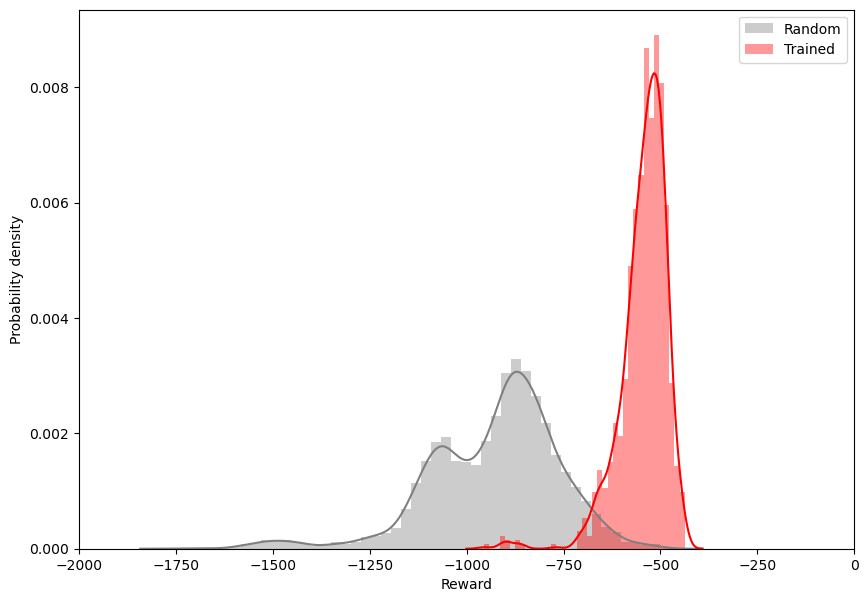

In [89]:
# Plot distribution of final rewards by random vs trained policy
plt.figure(figsize=(10,7))
sns.distplot(final_rewards_random, hist = True, norm_hist = True, label = 'Random', color = 'grey')
sns.distplot(final_rewards_trained, hist = True, norm_hist = True, label = 'Trained', color = 'red')
plt.ylabel('Probability density')
plt.xlabel('Reward')
# plt.ylim(0,0.0025)
plt.xlim(-2000,0)
plt.legend()
# plt.savefig(fname = 'plots/reward_dist_500iter_RF_constrained.png', dpi = 300)
plt.show()

In [90]:
# Validity of trained
count = 0
for target in en_targets_trained:
    if target.item() == 1.:
        count += 1
print('Trained policy: Fraction of en OK compounds = ' , count/len(en_targets_trained))

Trained policy: Fraction of en OK compounds =  0.441


In [91]:
# Double check with check_both_multiple
good, bad = check_both_multiple(compounds = final_compounds)

both_good_ratio = len(good)/(len(good)+len(bad))
both_good_ratio

0.441

In [306]:
# Validity of random
count = 0
for target in en_random:
    if target.item() == 1.:
        count += 1
print('Random policy: Fraction of en OK compounds = ' , count/len(en_random))

Random policy: Fraction of en OK compounds =  0.2576


### Validity vs en_threshold

In [92]:
en_threshold_list  = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
en_good_ratio_vs_en_threshold = []

def evaluate_en_threshold(en_threshold):
    # 2. Get final rewards from trained policy
    Q_c_data_trained, en_targets_trained, final_rewards_trained, final_compounds = \
    generate_Q_c_datapoints_and_evaluate_policy(dqn = dqn, dcn = dcn, num_eps = 1000, epsilon = 0, 
                                            en_threshold = en_threshold, stochastic_top_frac = 0.20)
    # Validity of trained
    count = 0
    for target in en_targets_trained:
        if target.item() == 1.:
            count += 1
    ratio = count/len(en_targets_trained)
    return ratio

for en_threshold in en_threshold_list:
    en_good_ratio = evaluate_en_threshold(en_threshold =  en_threshold)
    en_good_ratio_vs_en_threshold.append(en_good_ratio)

# with open('./training_data/en_threshold_list_RF_constrained.pkl', 'wb') as f:
#         pickle.dump(en_threshold_list, f, pickle.HIGHEST_PROTOCOL)

# with open('./training_data/en_good_ratio_vs_en_threshold_RF_constrained.pkl', 'wb') as f:
#         pickle.dump(en_good_ratio_vs_en_threshold, f, pickle.HIGHEST_PROTOCOL)

Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions


In [96]:
with open('./training_data/en_threshold_list_RF_constrained.pkl', 'rb') as f:
    en_threshold_list = pickle.load(f)

with open('./training_data/en_good_ratio_vs_en_threshold_RF_constrained.pkl', 'rb') as f:
    en_good_ratio_vs_en_threshold = pickle.load(f)

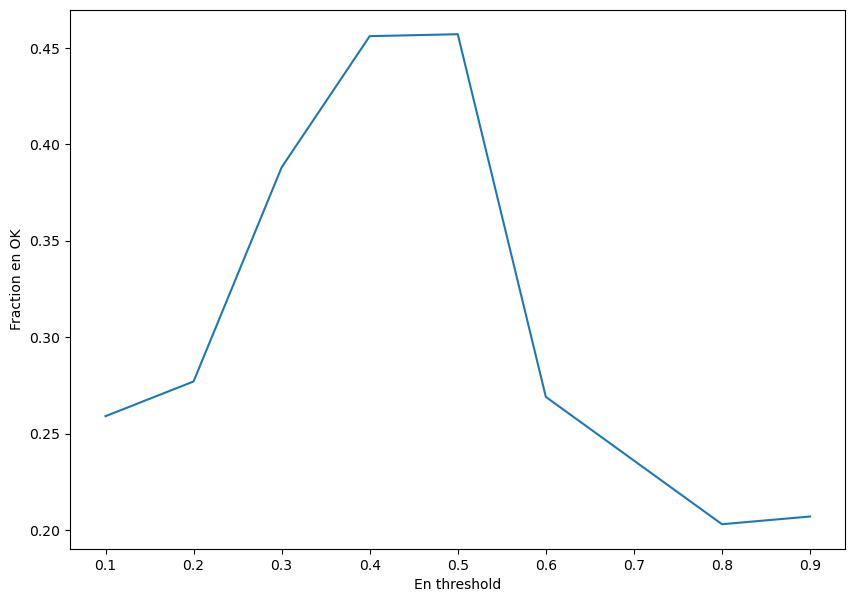

In [101]:
plt.figure(figsize=(10,7))
plt.plot(en_threshold_list, en_good_ratio_vs_en_threshold)
plt.ylabel('Fraction en OK')
plt.xlabel('En threshold')
# plt.savefig(fname = 'plots/en_good_ratio_vs_en_threshold_500iter_RF_constrained.png', dpi = 300)
plt.show()

### Evolution of final rewards with iteration

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


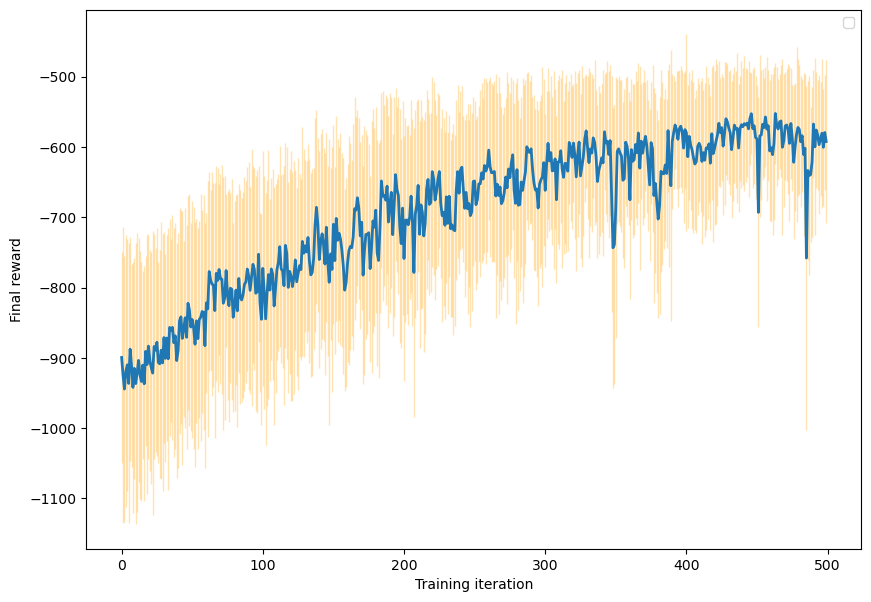

In [102]:
with open('./training_data/final_rewards_vs_iter_RF_constrained.pkl', 'rb') as f:
    final_rewards_vs_iter = pickle.load(f)
num_iter = 500
final_rewards_mean = [x.mean() for x in final_rewards_vs_iter]
final_rewards_std  = [x.std() for x in final_rewards_vs_iter]
plt.figure(figsize=(10,7))
markers, caps, bars = plt.errorbar(range(num_iter), final_rewards_mean, yerr = final_rewards_std, mfc= 'blue', linewidth = 2, elinewidth= 1)
[bar.set_alpha(0.3) for bar in bars]
[bar.set_color('orange') for bar in bars]
plt.ylabel('Final reward')
plt.xlabel('Training iteration')
plt.legend()
# plt.savefig(fname = 'plots/reward_vs_iter_500iter_RF_constrained.png', dpi = 300)
plt.show()

### Evolution of compounds with iteration

In [2]:
# with open('./training_data/compounds_vs_iter_RF.pkl', 'rb') as f:
#     compounds_vs_iter = pickle.load(f)

# # FEATURIZE GENERATED COMPOUNDS
# for iteration in tqdm(range(len(compounds_vs_iter))): # For each iteration of compounds
#     for idx in range(len(compounds_vs_iter[iteration])): # For each compound
#         compounds_vs_iter[iteration][idx] = featurize_target(compounds_vs_iter[iteration][idx]) # Featurize using Magpie embeddings

# # Save featurized compounds
# with open('./training_data/compound_features_vs_iter_RF.pkl', 'wb') as f:
#         pickle.dump(compounds_vs_iter, f, pickle.HIGHEST_PROTOCOL)

In [28]:
# Load compound features
with open('./training_data/compound_features_vs_iter_RF.pkl', 'rb') as f:
    compound_features_vs_iter = pickle.load(f)

In [29]:
len(compound_features_vs_iter)

500

Standarizing data before PCA is important.

In [30]:
# Load scalar
scaler = StandardScaler() # Fit scaler
scaler.fit(s_material_inputs)

# Convert each compound features from list to np.array
for iteration in tqdm(range(len(compound_features_vs_iter))): # For each iteration of compounds
    for idx in range(len(compound_features_vs_iter[iteration])): # For each compound
        compound_features_vs_iter[iteration][idx] = scaler.transform(np.array([compound_features_vs_iter[iteration][idx]]))[0] # Featurize using Magpie embeddings

100%|██████████| 500/500 [00:02<00:00, 243.93it/s]


In [32]:
features = [] # 500 x np.array() of shape 100 x 145 (100 is no of compounds per iteration, 145 is the feature size)
for iteration in tqdm(range(len(compound_features_vs_iter))): # For each iteration of compounds
    iteration_stack = []
    for idx in range(len(compound_features_vs_iter[iteration])): # For each compound
        iteration_stack.append(compound_features_vs_iter[iteration][idx])
    iteration_stack = np.stack(iteration_stack)
    features.append(iteration_stack)

100%|██████████| 500/500 [00:00<00:00, 6695.70it/s]


In [33]:
# Stack features into one big matrix
full_stack = [] 
for iteration in features:
    full_stack.append(iteration)
full_stack = np.vstack(full_stack)

### Dimensionality reduction using t-SNE

In [69]:
# Perform t-SNE
tsne_embeddings = TSNE(n_components = 2, 
                       perplexity = 30,
                       learning_rate='auto',
                       init='random' # random/pca initialization
                       ).fit_transform(full_stack)

# with open('training_data/tsne_embeddings_500iter_RF.npy', 'wb') as f:
#     np.save(f, tsne_embeddings)

In [97]:
# Load t-SNE embeddings
with open('training_data/tsne_embeddings_500iter_RF.npy', 'rb') as f:
    tsne_embeddings = np.load(f)

with open('./training_data/final_rewards_vs_iter_RF.pkl', 'rb') as f:
    final_rewards_vs_iter = pickle.load(f)

final_rewards_vs_iter_stacked = torch.stack(final_rewards_vs_iter)
final_rewards = final_rewards_vs_iter_stacked.reshape(-1)
print('tsne_embeddings: ', tsne_embeddings.shape)
print('final_rewards:', final_rewards.shape)

tsne_embeddings:  (50000, 2)
final_rewards: torch.Size([50000])


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


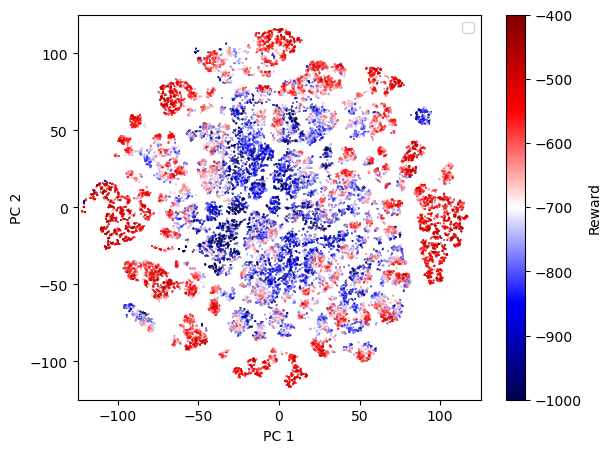

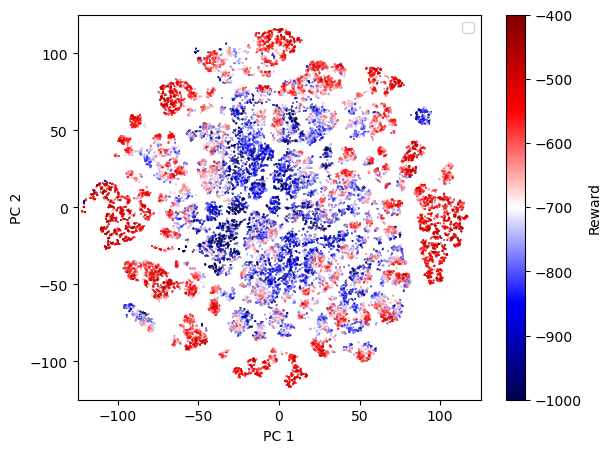

In [98]:
# Generate list of iterations for 50k compounds
iteration = []
for i in range(500):
    for j in range(100):
        iteration.append(i)
# Plot TSNE
def plot_TSNE(train_iter = None):
    fig = plt.figure(figsize=(6.5,5))
    if train_iter == None:
        plt.scatter(tsne_embeddings[:,0], tsne_embeddings[:,1], s = 0.05, alpha = 1, c = final_rewards, cmap = 'seismic') # For rewards
        # plt.scatter(tsne_embeddings[:,0], tsne_embeddings[:,1], s = 0.05, alpha = 1, c = iteration, cmap = 'seismic') # For iteration
    else:
        row_idx = range(100*train_iter,(100*train_iter)+100)
        rewards = final_rewards_vs_iter[train_iter]
        plt.scatter(tsne_embeddings[row_idx,0], tsne_embeddings[row_idx,1], c = rewards, s = 5, cmap = 'seismic')
    plt.ylabel('PC 2')
    plt.xlabel('PC 1')
    plt.ylim(-125, 125)
    plt.xlim(-125, 125)
    plt.legend()
    # plt.text(20,100,'Iteration %.0f' % train_iter, fontsize = 15)
    cbar = plt.colorbar()
    cbar.set_label('Reward')
    # cbar.set_label('Iteration')
    plt.clim(-1000,-400) 
    # plt.savefig(fname = 'plots/TSNE_vs_iter_500iter_RF.png', dpi = 300) 
    plt.show()
    return fig
plot_TSNE()

In [ ]:
images = []  # For saving into gif

for i in range(0, 600, 1): # For stalling the last frame
    j = i
    if i > 499: # For stalling the last frame
        j = 499
    fig = plot_TSNE(train_iter = j)
    # Used to return the plot as an image array 
    # (https://ndres.me/post/matplotlib-animated-gifs-easily/)
    fig.canvas.draw()       # draw the canvas, cache the renderer
    image = np.frombuffer(fig.canvas.tostring_rgb(), dtype='uint8')
    image = image.reshape(fig.canvas.get_width_height()[::-1] + (3,))
    images.append(image)
imageio.mimsave('plots/TSNE_reward_vs_iter_500iter_RF.gif', images, fps = 30)

### Dimensionality reduction using singular value decomposition (SVD)

In [66]:
# Perform SVD
u, s, vh = np.linalg.svd(full_stack, full_matrices=True)

# with open('training_data/SVD_embeddings_500iter_RF.npy', 'wb') as f:
#     np.save(f, u)

In [67]:
# Load SVD embeddings
with open('training_data/SVD_embeddings_500iter_RF.npy', 'rb') as f:
    u = np.load(f)

with open('training_data/final_rewards_vs_iter_RF.pkl', 'rb') as f:
    final_rewards_vs_iter = pickle.load(f)

final_rewards_vs_iter_stacked = torch.stack(final_rewards_vs_iter)
final_rewards = final_rewards_vs_iter_stacked.reshape(-1)
print('SVD_embeddings: ', u.shape)
print('final_rewards:', final_rewards.shape)

u_truncated = u[:, :2]
print('SVD_embeddings after truncation:', u_truncated.shape)

SVD_embeddings:  (50000, 50000)
final_rewards: torch.Size([50000])
SVD_embeddings after truncation: (50000, 2)


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


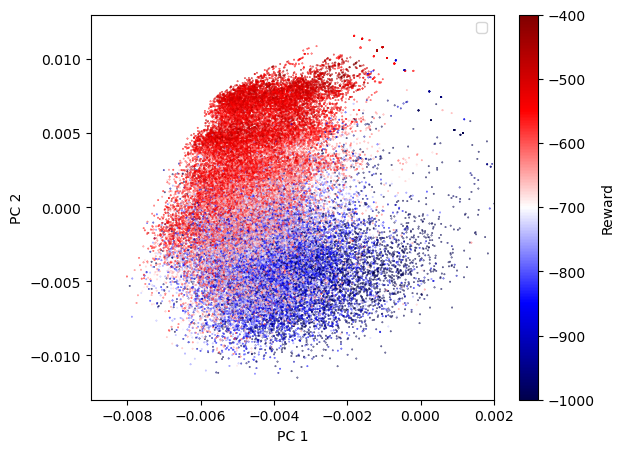

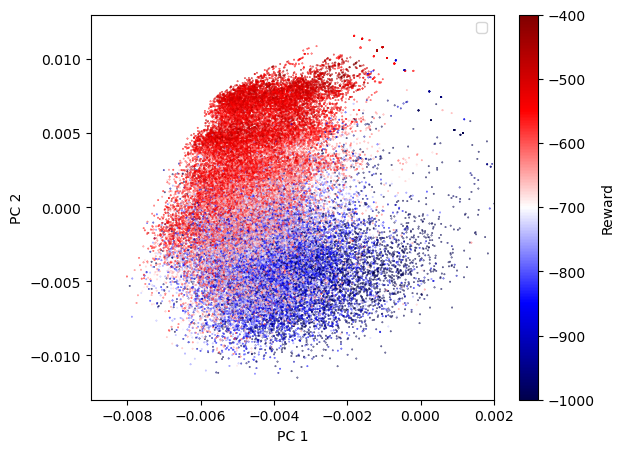

In [99]:
iteration = []
for i in range(500):
    for j in range(100):
        iteration.append(i)

# Plot SVD
def plot_SVD(train_iter = None):
    fig = plt.figure(figsize=(6.5,5))
    if train_iter == None:
        plt.scatter(u_truncated[:,0], u_truncated[:,1], c = final_rewards, s = 0.1, cmap = 'seismic') # For rewards
        # plt.scatter(u_truncated[:,0], u_truncated[:,1], c = iteration, s = 0.1, cmap = 'seismic') # For iterations
    else:
        row_idx = range(100*train_iter,(100*train_iter)+100)
        rewards = final_rewards_vs_iter[train_iter]
        plt.scatter(u_truncated[row_idx,0], u_truncated[row_idx,1], c = rewards, s = 5, cmap = 'seismic')
    plt.ylabel('PC 2')
    plt.xlabel('PC 1')
    plt.ylim(-0.013, 0.013)
    plt.xlim(-0.009, .002)
    plt.legend()
    # plt.text(-0.002,0.010,'Iteration %.0f' % train_iter, fontsize = 15)
    cbar = plt.colorbar()
    plt.clim(-1000,-400)  
    # cbar.set_label('Iteration')
    cbar.set_label('Reward')
    # plt.savefig(fname = 'plots/SVD_reward_vs_iter_500iter_RF.png', dpi = 300)
    plt.show()
    return fig
plot_SVD()

In [ ]:
images = []  # For saving into gif

for i in range(0, 600, 1): # For stalling the last frame
    j = i
    if i > 499: # For stalling the last frame
        j = 499
    fig = plot_SVD(train_iter = j)
    # Used to return the plot as an image array 
    # (https://ndres.me/post/matplotlib-animated-gifs-easily/)
    fig.canvas.draw()       # draw the canvas, cache the renderer
    image = np.frombuffer(fig.canvas.tostring_rgb(), dtype='uint8')
    image = image.reshape(fig.canvas.get_width_height()[::-1] + (3,))
    images.append(image)
imageio.mimsave('plots/SVD_reward_vs_iter_500iter_RF.gif', images, fps = 30)

### Charge neutrality of generated compounds
From this point onwards, we start using dqn2 environment

In [36]:
with open('./training_data/compounds_vs_iter_RF.pkl', 'rb') as f:
    compounds_vs_iter = pickle.load(f)
compounds = compounds_vs_iter[0]

def check_neutrality_multiple(compounds):
    '''
    Args: 
    compounds: List (of str) of compounds
    
    Returns:
    good: List of compounds that can be charge neutral
    bad: List of compounds that cannot be charge neutral
    '''
    good = []
    bad  = [] 
    for compound in compounds:
        try:
            if check_neutrality(Composition(compound)): # If neutral
                good.append(compound)
            else:
                bad.append(compound)
        except Exception:
            print('Compound not valid')
    return good, bad

good, bad = check_neutrality_multiple(compounds = compounds)
len(good), len(bad)

(45, 55)

In [37]:
# Check charge neutrality
good_vs_iter = []
bad_vs_iter  = []
for compounds in compounds_vs_iter:
    good, bad = check_neutrality_multiple(compounds = compounds)
    good_vs_iter.append(len(good))
    bad_vs_iter.append(len(bad))

cn_good_ratio = np.array(good_vs_iter)/(np.array(good_vs_iter)+np.array(bad_vs_iter))

# with open('training_data/cn_good_ratio_500iter_RF.npy', 'wb') as f:
#     np.save(f, cn_good_ratio)

Compound not valid
Compound not valid
Compound not valid
Compound not valid
Compound not valid
Compound not valid
Compound not valid
Compound not valid
Compound not valid


In [41]:
# Load charge neutrality
with open('training_data/cn_good_ratio_500iter_RF.npy', 'rb') as f:
    cn_good_ratio = np.load(f)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


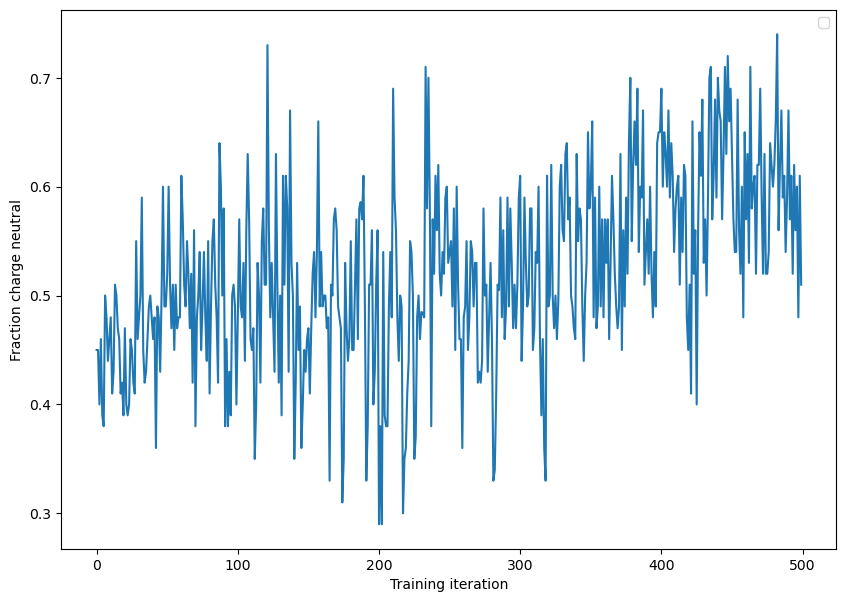

In [42]:
num_iter = len(compounds_vs_iter)
plt.figure(figsize=(10,7))
plt.plot(range(num_iter), cn_good_ratio)
plt.ylabel('Fraction charge neutral')
plt.xlabel('Training iteration')
plt.legend()
# plt.savefig(fname = 'plots/cn_vs_iter_500iter_RF.png', dpi = 300)
plt.show()

### Electronegativity of generated compounds

In [37]:
with open('./training_data/compounds_vs_iter_RF_constrained.pkl', 'rb') as f:
    compounds_vs_iter = pickle.load(f)
compounds = compounds_vs_iter[0]

def check_electronegativity_multiple(compounds):
    '''
    Args: 
    compounds: List (of str) of compounds
    
    Returns:
    good: List of compounds that have acceptable electronegativity
    bad: List of compounds that do not have acceptable electronegativity
    '''
    good = []
    bad  = [] 
    for compound in compounds:
        try:
            if check_electronegativity(compound): # If neutral
                good.append(compound)
            else:
                bad.append(compound)
        except Exception:
            print('Compound not valid')
    return good, bad

good, bad = check_electronegativity_multiple(compounds = compounds)
len(good), len(bad)

(20, 80)

In [39]:
# Check electronegativity
good_vs_iter = []
bad_vs_iter  = []
for compounds in compounds_vs_iter:
    good, bad = check_electronegativity_multiple(compounds = compounds)
    good_vs_iter.append(len(good))
    bad_vs_iter.append(len(bad))

en_good_ratio = np.array(good_vs_iter)/(np.array(good_vs_iter)+np.array(bad_vs_iter))

with open('training_data/en_good_ratio_500iter_RF_constrained.npy', 'wb') as f:
    np.save(f, en_good_ratio)

Compound not valid
Compound not valid
Compound not valid
Compound not valid
Compound not valid
Compound not valid
Compound not valid
Compound not valid
Compound not valid
Compound not valid
Compound not valid
Compound not valid
Compound not valid


In [31]:
# Load electronegativity
with open('training_data/en_good_ratio_500iter_RF_constrained.npy', 'rb') as f:
    en_good_ratio = np.load(f)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


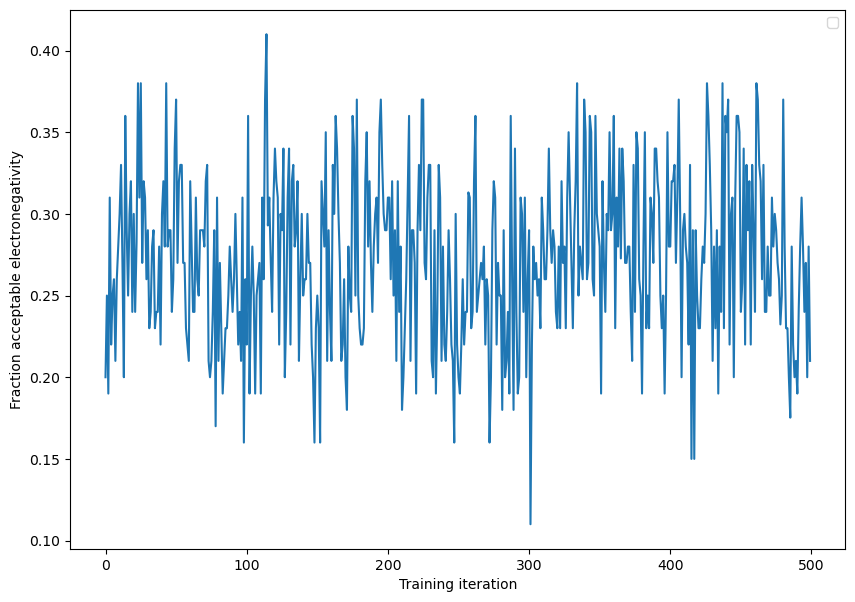

In [40]:
num_iter = len(compounds_vs_iter)
plt.figure(figsize=(10,7))
plt.plot(range(num_iter), en_good_ratio)
plt.ylabel('Fraction acceptable electronegativity')
plt.xlabel('Training iteration')
plt.legend()
# plt.savefig(fname = 'plots/en_vs_iter_500iter_RF.png', dpi = 300)
plt.show()

### Check both charge neutrality and electronegativity

In [2]:
with open('./training_data/compounds_vs_iter_RF.pkl', 'rb') as f:
    compounds_vs_iter = pickle.load(f)

In [49]:
# Efficient way
good_vs_iter = []
bad_vs_iter  = []
for compounds in compounds_vs_iter:
    cn_good, cn_bad = check_neutrality_multiple(compounds = compounds)
    both_good, bad = check_electronegativity_multiple(compounds = cn_good)

    good_vs_iter.append(len(both_good))
    bad_vs_iter.append(len(cn_bad)+len(bad))

both_good_ratio = np.array(good_vs_iter)/(np.array(good_vs_iter)+np.array(bad_vs_iter))

# with open('training_data/both_good_ratio_500iter_RF.npy', 'wb') as f:
#     np.save(f, both_good_ratio)

Compound not valid
Compound not valid
Compound not valid
Compound not valid
Compound not valid
Compound not valid
Compound not valid
Compound not valid
Compound not valid


In [66]:
# Inefficient way - To double check
def check_both_multiple(compounds):
    '''
    Args: 
    compounds: List (of str) of compounds
    
    Returns:
    good: List of compounds that can be both charge neutral and have acceptable electronegativity
    bad: List of compounds that fails either one of the checks
    '''
    good = []
    bad  = [] 
    for compound in compounds:
        try:
            if check_electronegativity(compound) and check_neutrality(Composition(compound)): # If both
                good.append(compound)
            else:
                bad.append(compound)
        except Exception:
            print('Compound not valid')
    return good, bad
# compounds = compounds_vs_iter[0]
# good, bad = check_both_multiple(compounds = compounds)

# Inefficient way - To double check
good_vs_iter = []
bad_vs_iter  = []
for compounds in compounds_vs_iter:
    good, bad = check_both_multiple(compounds = compounds)
    good_vs_iter.append(len(good))
    bad_vs_iter.append(len(bad))

both_good_ratio = np.array(good_vs_iter)/(np.array(good_vs_iter)+np.array(bad_vs_iter))

# with open('training_data/both_good_ratio_500iter_RF.npy', 'wb') as f:
#     np.save(f, both_good_ratio)

In [9]:
# Load both
with open('training_data/both_good_ratio_500iter_RF.npy', 'rb') as f:
    both_good_ratio = np.load(f)

# Load electronegativity
with open('training_data/en_good_ratio_500iter_RF.npy', 'rb') as f:
    en_good_ratio = np.load(f)

# Load charge neutrality
with open('training_data/cn_good_ratio_500iter_RF.npy', 'rb') as f:
    cn_good_ratio = np.load(f)

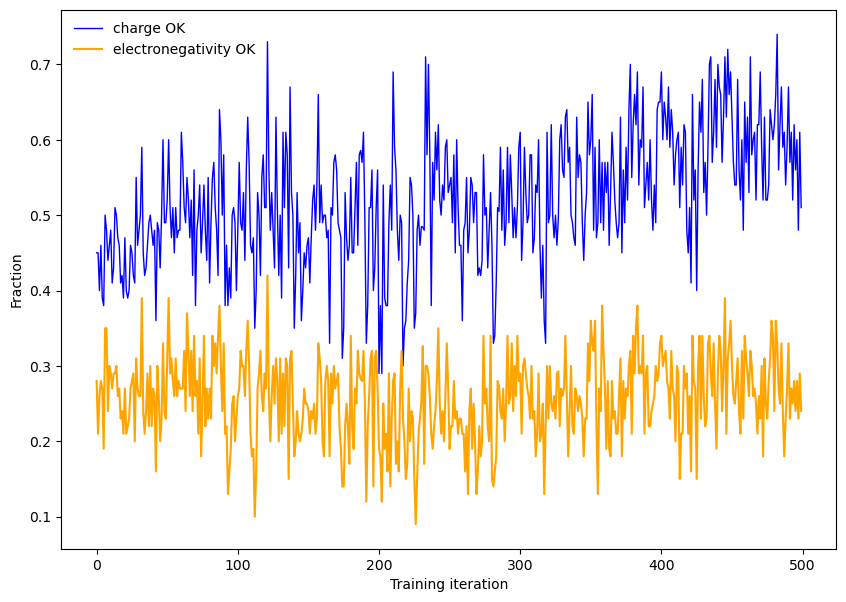

In [20]:
num_iter = len(compounds_vs_iter)
plt.figure(figsize=(10,7))
plt.plot(range(num_iter), cn_good_ratio, label = 'charge OK', color = 'blue', linewidth = 1)
plt.plot(range(num_iter), en_good_ratio, label = 'electronegativity OK', color = 'orange')
# plt.plot(range(num_iter), both_good_ratio, label = 'both OK')
plt.ylabel('Fraction')
plt.xlabel('Training iteration')
plt.legend(frameon= False)
# plt.savefig(fname = 'plots/both_vs_iter_500iter_RF.png', dpi = 300)
plt.show()

### Look at generated compounds

In [48]:
# Load RF prediction model
rf_regr = RandomForestRegressor()
rf_regr = joblib.load("rf_models/rf_sinter_predict_no_imputation_no_precursors.joblib")

# Featurization for RF model
feature_calculators = MultipleFeaturizer([
    cf.element.Stoichiometry(),
    cf.composite.ElementProperty.from_preset("magpie"),
    cf.orbital.ValenceOrbital(props=["avg"]),
    cf.ion.IonProperty(fast=True)
])

/home/synthesisproject/anaconda3/envs/dqn2/lib/python3.8/site-packages/sklearn/base.py:324: UserWarning: Trying to unpickle estimator DecisionTreeRegressor from version 0.23.2 when using version 1.0.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/modules/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/home/synthesisproject/anaconda3/envs/dqn2/lib/python3.8/site-packages/sklearn/base.py:324: UserWarning: Trying to unpickle estimator RandomForestRegressor from version 0.23.2 when using version 1.0.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/modules/model_persistence.html#security-maintainability-limitations
  warnings.warn(


Compound: Er4Cd2Sn7Ge7I3         Sinter T: 590
Compound: Sr8Cu4Ge5(As3Pb2)3     Sinter T: 664
Compound: In9Bi5Te8As3Au8        Sinter T: 538
Compound: In4Ga2Ag3Sb5           Sinter T: 542
Compound: In8Ag3(SnBi)9          Sinter T: 548
Compound: Ag3SbAs4Au8I9          Sinter T: 635
Compound: Cd4Ge(PbBr6)2          Sinter T: 604
Compound: Zn9Bi5Sb7Ir2           Sinter T: 625
Compound: Tl4Bi8P4PbSe9          Sinter T: 500
Compound: Tl3Zn3Sn4Ge7Sb         Sinter T: 547
Compound: Ge11Bi5(PbSe)9         Sinter T: 495
Compound: GaBi4Sb6P9Se           Sinter T: 517
Compound: Zn4Cd2Ge3Br7           Sinter T: 702
Compound: Er4ReNi9Te4Pb          Sinter T: 769
Compound: Zn7Sn8Te15             Sinter T: 490
Compound: Tl4Ag5As7Br6           Sinter T: 566
Compound: Ag4Bi3As7              Sinter T: 568
Compound: Ag8Ge7(PSe4)2          Sinter T: 558
Compound: Ga8Ag2Ge7Bi7Se         Sinter T: 534
Compound: Zn7Ag2Sn3PbBr7         Sinter T: 669
Compound: Er8Ag2Ge8Te4Pb9        Sinter T: 591
Compound: ZnA

/home/synthesisproject/anaconda3/envs/dqn2/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


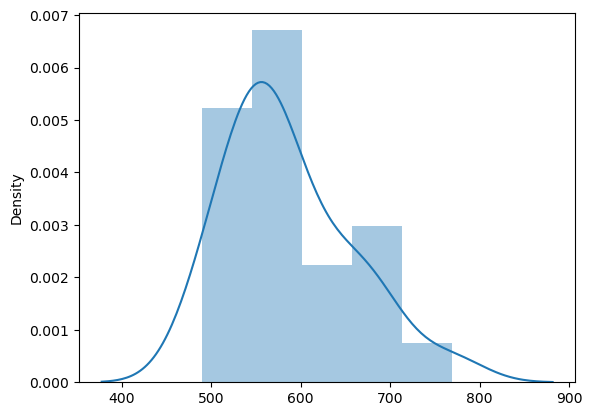

In [105]:
# Predict sintering T of valid compounds
max_len = 0
good_sinter_T = []
for compound in good:
    chemical = Composition(compound)
    features = feature_calculators.featurize(chemical)
    features = np.array(features).reshape(1, -1)
    # print(features)
    sinter_T_pred = rf_regr.predict(features)[0]
    good_sinter_T.append(sinter_T_pred)
    compound = Composition(compound).reduced_formula
    print('Compound:', compound, (18-len(compound)+3)*' ','Sinter T:', round(sinter_T_pred))

plt.figure()
sns.distplot(good_sinter_T)
plt.show()

### Diversity of generated compounds

In [78]:
with open('./training_data/compounds_vs_iter_RF.pkl', 'rb') as f:
    compounds_vs_iter = pickle.load(f)

In [90]:
compounds = compounds_vs_iter[499]
for idx in range(len(compounds)):
    compounds[idx] = Composition(compounds[idx]).reduced_formula

# len(set(compounds))
check_both_multiple(compounds)[0]

['Rb4Cd4CuSn4',
 'Er4Cd2Sn7Ge7I3',
 'Sr8Cu4Ge5(As3Pb2)3',
 'Cd2Sn2Bi3IrI2',
 'In9Bi5Te8As3Au8',
 'In4Ga2Ag3Sb5',
 'ZnGa7Ge3Te',
 'In8Ag3(SnBi)9',
 'Ag3SbAs4Au8I9',
 'Cd4Ge(PbBr6)2',
 'Zn9Bi5Sb7Ir2',
 'Tl4Bi8P4PbSe9',
 'Tl3Zn3Sn4Ge7Sb',
 'Ge11Bi5(PbSe)9',
 'GaBi4Sb6P9Se',
 'Zn4Cd2Ge3Br7',
 'Er4ReNi9Te4Pb',
 'Zn7Sn8Te15',
 'Tl4Ag5As7Br6',
 'Er2Zn2AgSn2',
 'Ag4Bi3As7',
 'Ag8Ge7(PSe4)2',
 'Ga8Ag2Ge7Bi7Se',
 'Zn7Ag2Sn3PbBr7',
 'Er8Ag2Ge8Te4Pb9',
 'ZnAg2Sn8(Ge3P2)2',
 'Tl2Ag8As5P9',
 'Cu8GeTe5(As4P)2']